# Coursework 1

This notebook is intended to be used as a starting point for your experiments. The instructions can be found in the instructions file located under spec/coursework1.pdf. The methods provided here are just helper functions. If you want more complex graphs such as side by side comparisons of different experiments you should learn more about matplotlib and implement them. Before each experiment remember to re-initialize neural network weights and reset the data providers so you get a properly initialized experiment. For each experiment try to keep most hyperparameters the same except the one under investigation so you can understand what the effects of each are.

In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('ggplot')

def train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, scheduler,stats_interval, notebook=True):
    
    # As well as monitoring the error over training also monitor classification
    # accuracy i.e. proportion of most-probable predicted classes being equal to targets
    data_monitors={'acc': lambda y, t: (y.argmax(-1) == t.argmax(-1)).mean()}

    # Use the created objects to initialise a new Optimiser instance.
    optimiser = Optimiser(
        model, error, learning_rule, train_data, valid_data,scheduler, data_monitors, notebook=notebook)

    # Run the optimiser for 5 epochs (full passes through the training set)
    # printing statistics every epoch.
    stats, keys, run_time,best_epoch,best_model,learning_rates = optimiser.train(num_epochs=num_epochs, stats_interval=stats_interval)

    # Plot the change in the validation and training set error over training.
    fig_1 = plt.figure(figsize=(7, 4),dpi=150)
    ax_1 = fig_1.add_subplot(111)
    for k in ['error(train)', 'error(valid)']:
        ax_1.plot(np.arange(1, stats.shape[0]) * stats_interval, 
                  stats[1:, keys[k]],"--o", label=k,ms=3)
    ax_1.legend(loc=0)
    ax_1.set_xlabel('Epoch number')

    # Plot the change in the validation and training set accuracy over training.
    fig_2 = plt.figure(figsize=(8, 4),dpi=150)
    ax_2 = fig_2.add_subplot(111)
    for k in ['acc(train)', 'acc(valid)']:
        ax_2.plot(np.arange(1, stats.shape[0]) * stats_interval, 
                  stats[1:, keys[k]],"--o", label=k,ms=3)
    ax_2.legend(loc=0)
    ax_2.set_xlabel('Epoch number')
    
    return stats, keys, run_time, fig_1, ax_1, fig_2, ax_2,best_epoch,best_model,learning_rates

In [2]:
# The below code will set up the data providers, random number
# generator and logger objects needed for training runs. As
# loading the data from file take a little while you generally
# will probably not want to reload the data providers on
# every training run. If you wish to reset their state you
# should instead use the .reset() method of the data providers.
import numpy as np
import logging
from mlp.data_providers import MNISTDataProvider, EMNISTDataProvider

# Seed a random number generator
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 10
# Set up a logger object to print info about the training run to stdout
logger = logging.getLogger()
logger.setLevel(logging.INFO)
logger.handlers = [logging.StreamHandler()]

# Create data provider objects for the MNIST data set
train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)

KeysView(<numpy.lib.npyio.NpzFile object at 0x1038cc278>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1038cc860>)


Epoch 1: 7.1s to complete
    error(train)=8.09e-01, acc(train)=7.48e-01, error(valid)=8.27e-01, acc(valid)=7.39e-01


1


Epoch 2: 7.1s to complete
    error(train)=6.16e-01, acc(train)=8.02e-01, error(valid)=6.51e-01, acc(valid)=7.94e-01


2


Epoch 3: 7.2s to complete
    error(train)=5.38e-01, acc(train)=8.21e-01, error(valid)=5.89e-01, acc(valid)=8.06e-01


3


Epoch 4: 7.8s to complete
    error(train)=5.08e-01, acc(train)=8.29e-01, error(valid)=5.73e-01, acc(valid)=8.09e-01


4


Epoch 5: 7.8s to complete
    error(train)=4.74e-01, acc(train)=8.38e-01, error(valid)=5.54e-01, acc(valid)=8.18e-01


5


Epoch 6: 8.4s to complete
    error(train)=4.37e-01, acc(train)=8.48e-01, error(valid)=5.26e-01, acc(valid)=8.24e-01


6


Epoch 7: 8.5s to complete
    error(train)=4.17e-01, acc(train)=8.55e-01, error(valid)=5.12e-01, acc(valid)=8.30e-01


7


Epoch 8: 9.4s to complete
    error(train)=4.16e-01, acc(train)=8.52e-01, error(valid)=5.29e-01, acc(valid)=8.24e-01


Epoch 9: 7.4s to complete
    error(train)=3.79e-01, acc(train)=8.67e-01, error(valid)=4.96e-01, acc(valid)=8.36e-01


9


Epoch 10: 7.7s to complete
    error(train)=3.69e-01, acc(train)=8.67e-01, error(valid)=4.89e-01, acc(valid)=8.37e-01


10


Epoch 11: 7.4s to complete
    error(train)=3.60e-01, acc(train)=8.71e-01, error(valid)=5.03e-01, acc(valid)=8.34e-01


Epoch 12: 7.4s to complete
    error(train)=3.44e-01, acc(train)=8.76e-01, error(valid)=4.91e-01, acc(valid)=8.39e-01


Epoch 13: 7.9s to complete
    error(train)=3.49e-01, acc(train)=8.74e-01, error(valid)=5.08e-01, acc(valid)=8.35e-01


Epoch 14: 7.7s to complete
    error(train)=3.24e-01, acc(train)=8.82e-01, error(valid)=4.90e-01, acc(valid)=8.38e-01


Epoch 15: 7.4s to complete
    error(train)=3.29e-01, acc(train)=8.79e-01, error(valid)=5.10e-01, acc(valid)=8.33e-01


Epoch 16: 7.4s to complete
    error(train)=3.07e-01, acc(train)=8.86e-01, error(valid)=4.97e-01, acc(valid)=8.38e-01


Epoch 17: 7.4s to complete
    error(train)=3.04e-01, acc(train)=8.86e-01, error(valid)=5.07e-01, acc(valid)=8.38e-01


Epoch 18: 7.4s to complete
    error(train)=3.02e-01, acc(train)=8.88e-01, error(valid)=5.09e-01, acc(valid)=8.36e-01


Epoch 19: 7.4s to complete
    error(train)=3.10e-01, acc(train)=8.84e-01, error(valid)=5.27e-01, acc(valid)=8.34e-01


Epoch 20: 7.4s to complete
    error(train)=2.92e-01, acc(train)=8.89e-01, error(valid)=5.16e-01, acc(valid)=8.37e-01


 hola



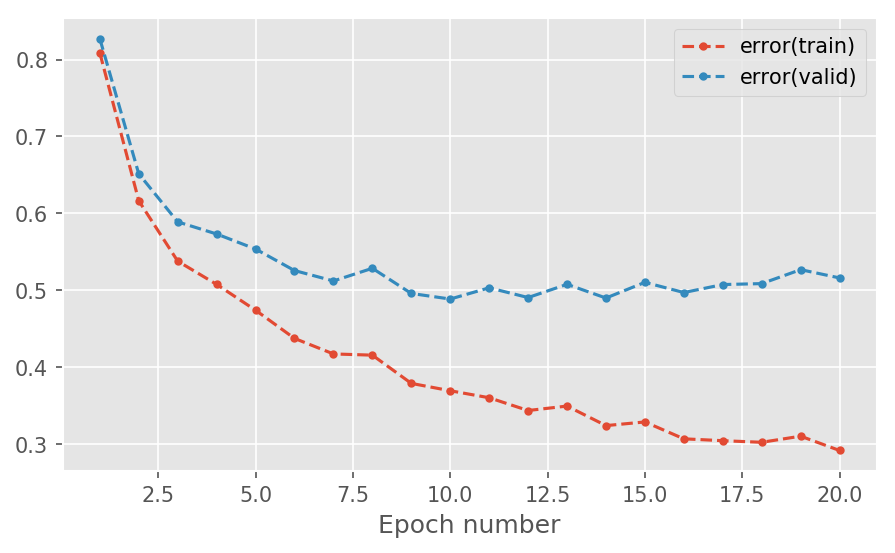

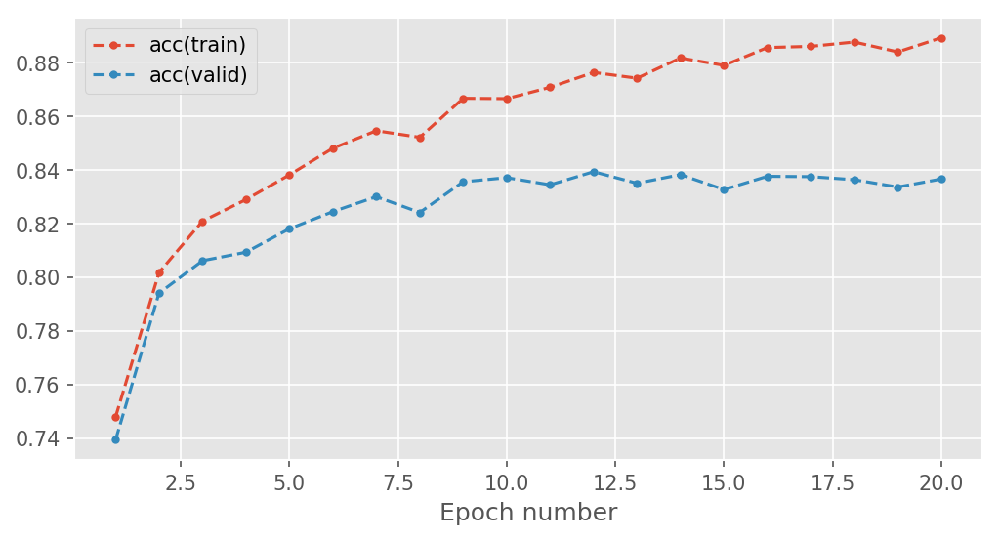

In [7]:
# The model set up code below is provided as a starting point.
# You will probably want to add further code cells for the
# different experiments you run.

from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
from mlp.learning_rules import AdamLearningRule, GradientDescentLearningRule
from mlp.optimisers import Optimiser
from mlp.schedulers import ConstantLearningRateScheduler

#setup hyperparameters
learning_rate = 0.1
num_epochs = 35
stats_interval = 1
input_dim, output_dim, hidden_dim = 784, 47, 100

weights_init = GlorotUniformInit(rng=rng)
biases_init = ConstantInit(0.)
model = MultipleLayerModel([
    AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
])

error = CrossEntropySoftmaxError()
# Use a basic gradient descent learning rule
learning_rule = GradientDescentLearningRule(0.013)
scheduler=ConstantLearningRateScheduler(0.013)
#Remember to use notebook=False when you write a script to be run in a terminal
_ = train_model_and_plot_stats(
    model, error, learning_rule, train_data, valid_data, num_epochs, scheduler,stats_interval, notebook=True)

## 2 Layers

In [27]:
import numpy as np
import logging
from mlp.data_providers import MNISTDataProvider, EMNISTDataProvider

# Seed a random number generator
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 10
# Set up a logger object to print info about the training run to stdout
logger = logging.getLogger()
logger.setLevel(logging.INFO)
logger.handlers = [logging.StreamHandler()]

# Create data provider objects for the MNIST data set
train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)

import importlib
import mlp.optimisers
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
from mlp.learning_rules import GradientDescentLearningRule
importlib.reload(mlp.optimisers)
from mlp.optimisers import Optimiser

#setup hyperparameters
learning_rate = 0.013
num_epochs = 300
stats_interval = 1
input_dim, output_dim, hidden_dim = 784, 47, 100

weights_init = GlorotUniformInit(rng=rng)
biases_init = ConstantInit(0.)
model = MultipleLayerModel([
    AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
])

error = CrossEntropySoftmaxError()
# Use a basic gradient descent learning rule
learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

#Remember to use notebook=False when you write a script to be run in a terminal
_2 = train_model_and_plot_stats(
    model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval, notebook=True)

KeysView(<numpy.lib.npyio.NpzFile object at 0x12c19b518>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12948e588>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x132e2a7f0>)


KeyboardInterrupt: 

In [22]:
test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)
importlib.reload(mlp.errors)
from mlp.errors import CrossEntropySoftmaxError
outputs=(_[-2].fprop(test_data.inputs)[-1])
targets=MNISTDataProvider.to_one_of_k(test_data,test_data.targets)
CrossEntropySoftmaxError.__call__(error,outputs,targets)

KeysView(<numpy.lib.npyio.NpzFile object at 0x11517d9b0>)


(0.5454359940652858, 0.01158701311670871, 0.830126582278481)

In [29]:
_[2]

223.25526809692383

## 3

KeysView(<numpy.lib.npyio.NpzFile object at 0x11e79bac8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11e7bb5f8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11e7bbeb8>)


Epoch 1: 8.9s to complete
    error(train)=8.01e-01, acc(train)=7.40e-01, error(valid)=8.33e-01, acc(valid)=7.30e-01


1


Epoch 2: 8.4s to complete
    error(train)=6.41e-01, acc(train)=7.89e-01, error(valid)=6.85e-01, acc(valid)=7.76e-01


2


Epoch 3: 8.6s to complete
    error(train)=5.70e-01, acc(train)=8.09e-01, error(valid)=6.19e-01, acc(valid)=7.95e-01


3


Epoch 4: 8.4s to complete
    error(train)=4.97e-01, acc(train)=8.29e-01, error(valid)=5.60e-01, acc(valid)=8.11e-01


4


Epoch 5: 8.5s to complete
    error(train)=4.68e-01, acc(train)=8.36e-01, error(valid)=5.42e-01, acc(valid)=8.19e-01


5


Epoch 6: 8.5s to complete
    error(train)=4.42e-01, acc(train)=8.45e-01, error(valid)=5.31e-01, acc(valid)=8.20e-01


6


Epoch 7: 8.5s to complete
    error(train)=4.29e-01, acc(train)=8.46e-01, error(valid)=5.32e-01, acc(valid)=8.19e-01


Epoch 8: 8.8s to complete
    error(train)=4.01e-01, acc(train)=8.58e-01, error(valid)=5.12e-01, acc(valid)=8.30e-01


8


Epoch 9: 9.0s to complete
    error(train)=4.03e-01, acc(train)=8.57e-01, error(valid)=5.28e-01, acc(valid)=8.25e-01


Epoch 10: 9.6s to complete
    error(train)=3.82e-01, acc(train)=8.57e-01, error(valid)=5.14e-01, acc(valid)=8.23e-01


Epoch 11: 9.4s to complete
    error(train)=3.76e-01, acc(train)=8.64e-01, error(valid)=5.19e-01, acc(valid)=8.29e-01


Epoch 12: 8.3s to complete
    error(train)=3.43e-01, acc(train)=8.75e-01, error(valid)=4.92e-01, acc(valid)=8.36e-01


12


Epoch 13: 8.5s to complete
    error(train)=3.38e-01, acc(train)=8.75e-01, error(valid)=4.96e-01, acc(valid)=8.33e-01


Epoch 14: 9.2s to complete
    error(train)=3.33e-01, acc(train)=8.74e-01, error(valid)=5.05e-01, acc(valid)=8.31e-01


Epoch 15: 8.9s to complete
    error(train)=3.32e-01, acc(train)=8.76e-01, error(valid)=5.23e-01, acc(valid)=8.34e-01


Epoch 16: 8.6s to complete
    error(train)=3.19e-01, acc(train)=8.81e-01, error(valid)=5.04e-01, acc(valid)=8.37e-01


Epoch 17: 9.8s to complete
    error(train)=3.20e-01, acc(train)=8.79e-01, error(valid)=5.30e-01, acc(valid)=8.34e-01


Epoch 18: 8.9s to complete
    error(train)=3.10e-01, acc(train)=8.81e-01, error(valid)=5.23e-01, acc(valid)=8.31e-01


Epoch 19: 8.5s to complete
    error(train)=2.87e-01, acc(train)=8.90e-01, error(valid)=5.13e-01, acc(valid)=8.39e-01


Epoch 20: 8.5s to complete
    error(train)=2.97e-01, acc(train)=8.87e-01, error(valid)=5.26e-01, acc(valid)=8.36e-01


Epoch 21: 8.4s to complete
    error(train)=2.73e-01, acc(train)=8.95e-01, error(valid)=5.19e-01, acc(valid)=8.39e-01


Epoch 22: 9.3s to complete
    error(train)=2.82e-01, acc(train)=8.89e-01, error(valid)=5.36e-01, acc(valid)=8.32e-01


 hola



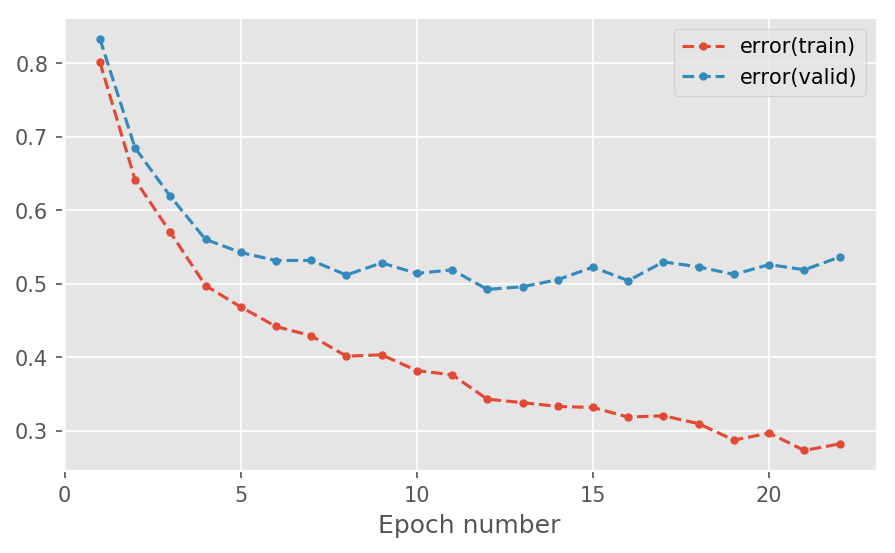

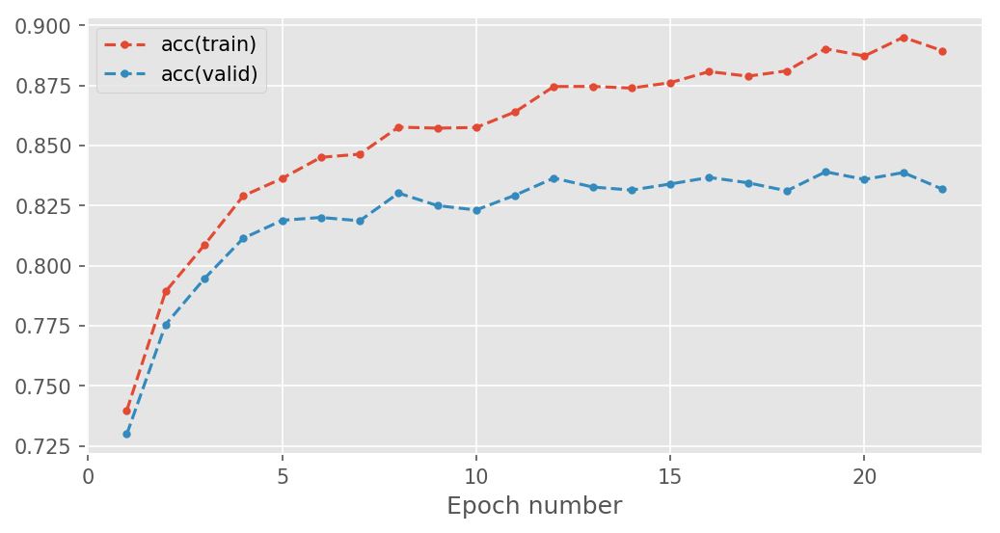

In [11]:
# Seed a random number generator
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 10
# Set up a logger object to print info about the training run to stdout
logger = logging.getLogger()
logger.setLevel(logging.INFO)
logger.handlers = [logging.StreamHandler()]

# Create data provider objects for the MNIST data set
train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)

import importlib
import mlp
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
from mlp.learning_rules import GradientDescentLearningRule
importlib.reload(mlp.optimisers)
from mlp.optimisers import Optimiser

#setup hyperparameters
learning_rate = 0.013
num_epochs = 300
stats_interval = 1
input_dim, output_dim, hidden_dim = 784, 47, 100

weights_init = GlorotUniformInit(rng=rng)
biases_init = ConstantInit(0.)
model = MultipleLayerModel([
    AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
])

error = CrossEntropySoftmaxError()
# Use a basic gradient descent learning rule
learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

#Remember to use notebook=False when you write a script to be run in a terminal
_3 = train_model_and_plot_stats(
    model, error, learning_rule, train_data, valid_data, num_epochs, scheduler,stats_interval, notebook=True)

In [24]:
outputs=(_3[-2].fprop(test_data.inputs)[-1])
targets=MNISTDataProvider.to_one_of_k(test_data,test_data.targets)
CrossEntropySoftmaxError.__call__(error,outputs,targets)

(0.5822517680934091, 0.012288529568488199, 0.8229746835443038)

In [30]:
_3[2]

277.8626799583435

## 4

KeysView(<numpy.lib.npyio.NpzFile object at 0x11e7bbe80>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11e79b978>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11e79bd30>)


Epoch 1: 10.2s to complete
    error(train)=7.83e-01, acc(train)=7.49e-01, error(valid)=8.14e-01, acc(valid)=7.42e-01


1


Epoch 2: 9.6s to complete
    error(train)=6.28e-01, acc(train)=7.93e-01, error(valid)=6.65e-01, acc(valid)=7.81e-01


2


Epoch 3: 9.5s to complete
    error(train)=5.74e-01, acc(train)=8.01e-01, error(valid)=6.35e-01, acc(valid)=7.86e-01


3


Epoch 4: 9.5s to complete
    error(train)=5.16e-01, acc(train)=8.23e-01, error(valid)=5.79e-01, acc(valid)=8.07e-01


4


Epoch 5: 9.4s to complete
    error(train)=4.93e-01, acc(train)=8.29e-01, error(valid)=5.66e-01, acc(valid)=8.10e-01


5


Epoch 6: 9.8s to complete
    error(train)=4.51e-01, acc(train)=8.42e-01, error(valid)=5.44e-01, acc(valid)=8.17e-01


6


Epoch 7: 9.4s to complete
    error(train)=4.30e-01, acc(train)=8.48e-01, error(valid)=5.34e-01, acc(valid)=8.23e-01


7


Epoch 8: 9.4s to complete
    error(train)=4.32e-01, acc(train)=8.48e-01, error(valid)=5.40e-01, acc(valid)=8.19e-01


Epoch 9: 9.5s to complete
    error(train)=3.87e-01, acc(train)=8.61e-01, error(valid)=5.06e-01, acc(valid)=8.33e-01


9


Epoch 10: 9.8s to complete
    error(train)=3.71e-01, acc(train)=8.67e-01, error(valid)=5.09e-01, acc(valid)=8.34e-01


Epoch 11: 9.8s to complete
    error(train)=3.51e-01, acc(train)=8.73e-01, error(valid)=4.96e-01, acc(valid)=8.37e-01


11


Epoch 12: 9.7s to complete
    error(train)=3.43e-01, acc(train)=8.74e-01, error(valid)=4.94e-01, acc(valid)=8.36e-01


12


Epoch 13: 9.7s to complete
    error(train)=3.49e-01, acc(train)=8.74e-01, error(valid)=5.10e-01, acc(valid)=8.37e-01


Epoch 14: 11.2s to complete
    error(train)=3.36e-01, acc(train)=8.75e-01, error(valid)=5.02e-01, acc(valid)=8.38e-01


Epoch 15: 9.8s to complete
    error(train)=3.31e-01, acc(train)=8.76e-01, error(valid)=5.12e-01, acc(valid)=8.35e-01


Epoch 16: 9.7s to complete
    error(train)=3.22e-01, acc(train)=8.80e-01, error(valid)=5.08e-01, acc(valid)=8.37e-01


Epoch 17: 9.6s to complete
    error(train)=3.12e-01, acc(train)=8.81e-01, error(valid)=5.08e-01, acc(valid)=8.37e-01


Epoch 18: 9.4s to complete
    error(train)=2.97e-01, acc(train)=8.85e-01, error(valid)=5.10e-01, acc(valid)=8.38e-01


Epoch 19: 9.5s to complete
    error(train)=3.06e-01, acc(train)=8.83e-01, error(valid)=5.23e-01, acc(valid)=8.36e-01


Epoch 20: 9.5s to complete
    error(train)=2.92e-01, acc(train)=8.88e-01, error(valid)=5.13e-01, acc(valid)=8.35e-01


Epoch 21: 9.4s to complete
    error(train)=2.82e-01, acc(train)=8.90e-01, error(valid)=5.24e-01, acc(valid)=8.39e-01


Epoch 22: 9.6s to complete
    error(train)=2.74e-01, acc(train)=8.94e-01, error(valid)=5.12e-01, acc(valid)=8.42e-01


 hola



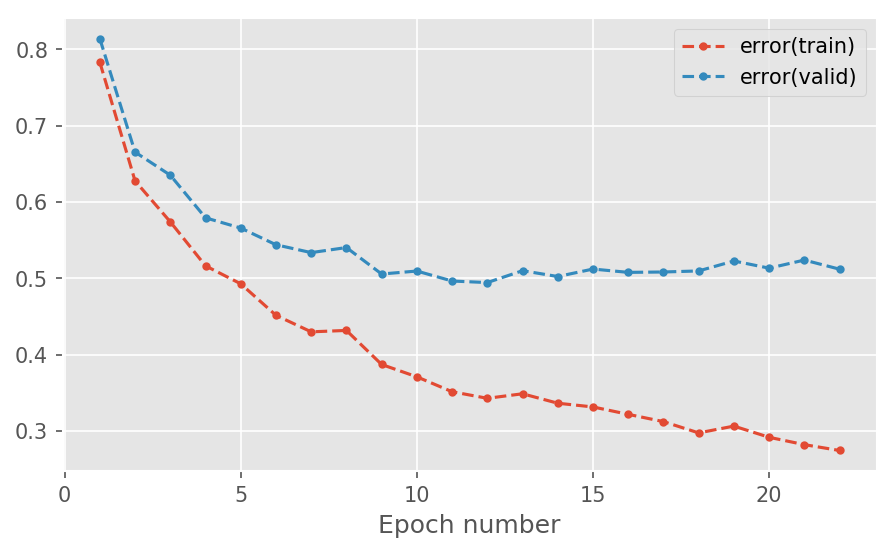

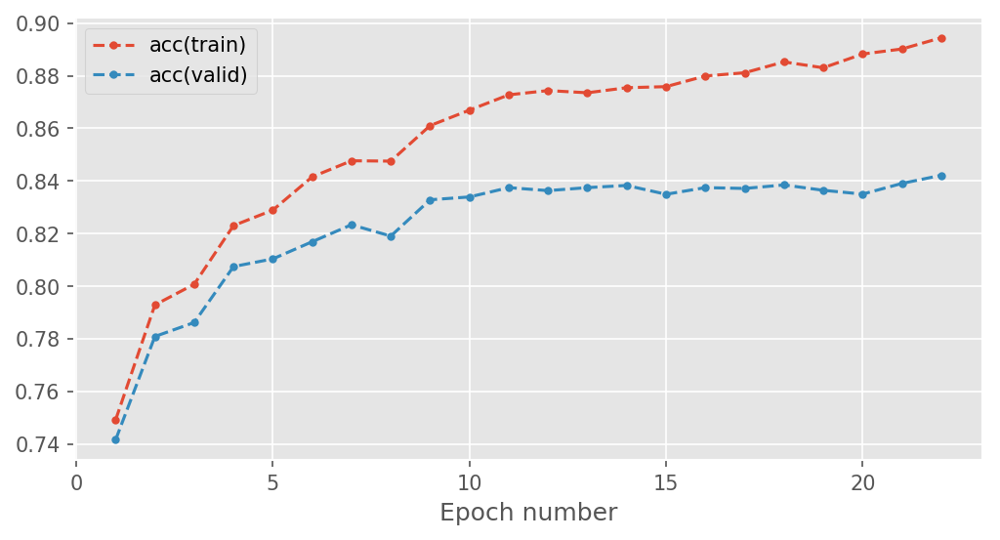

In [12]:
# Seed a random number generator
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 10
# Set up a logger object to print info about the training run to stdout
logger = logging.getLogger()
logger.setLevel(logging.INFO)
logger.handlers = [logging.StreamHandler()]

# Create data provider objects for the MNIST data set
train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)

import importlib
import mlp
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
from mlp.learning_rules import GradientDescentLearningRule
importlib.reload(mlp.optimisers)
from mlp.optimisers import Optimiser

#setup hyperparameters
learning_rate = 0.013
num_epochs = 300
stats_interval = 1
input_dim, output_dim, hidden_dim = 784, 47, 100

weights_init = GlorotUniformInit(rng=rng)
biases_init = ConstantInit(0.)
model = MultipleLayerModel([
    AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
])

error = CrossEntropySoftmaxError()
# Use a basic gradient descent learning rule
learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

#Remember to use notebook=False when you write a script to be run in a terminal
_4 = train_model_and_plot_stats(
    model, error, learning_rule, train_data, valid_data, num_epochs,scheduler, stats_interval, notebook=True)

In [25]:
outputs=(_4[-2].fprop(test_data.inputs)[-1])
targets=MNISTDataProvider.to_one_of_k(test_data,test_data.targets)
CrossEntropySoftmaxError.__call__(error,outputs,targets)

(0.5507244485095922, 0.011503720517362464, 0.8313291139240506)

In [31]:
_4[2]

303.8430678844452

## 5

KeysView(<numpy.lib.npyio.NpzFile object at 0x11e79bcc0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11e4ec4e0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11e4ec518>)


Epoch 1: 10.4s to complete
    error(train)=8.84e-01, acc(train)=7.25e-01, error(valid)=9.01e-01, acc(valid)=7.18e-01


1


Epoch 2: 10.4s to complete
    error(train)=6.69e-01, acc(train)=7.79e-01, error(valid)=7.06e-01, acc(valid)=7.69e-01


2


Epoch 3: 10.4s to complete
    error(train)=5.79e-01, acc(train)=8.04e-01, error(valid)=6.30e-01, acc(valid)=7.91e-01


3


Epoch 4: 10.4s to complete
    error(train)=5.31e-01, acc(train)=8.20e-01, error(valid)=6.03e-01, acc(valid)=7.97e-01


4


Epoch 5: 10.4s to complete
    error(train)=4.78e-01, acc(train)=8.32e-01, error(valid)=5.55e-01, acc(valid)=8.09e-01


5


Epoch 6: 12.4s to complete
    error(train)=4.51e-01, acc(train)=8.41e-01, error(valid)=5.37e-01, acc(valid)=8.19e-01


6


Epoch 7: 10.6s to complete
    error(train)=4.35e-01, acc(train)=8.46e-01, error(valid)=5.34e-01, acc(valid)=8.20e-01


7


Epoch 8: 10.4s to complete
    error(train)=4.15e-01, acc(train)=8.50e-01, error(valid)=5.15e-01, acc(valid)=8.24e-01


8


Epoch 9: 10.4s to complete
    error(train)=4.05e-01, acc(train)=8.52e-01, error(valid)=5.14e-01, acc(valid)=8.23e-01


9


Epoch 10: 10.4s to complete
    error(train)=3.87e-01, acc(train)=8.58e-01, error(valid)=5.11e-01, acc(valid)=8.27e-01


10


Epoch 11: 10.5s to complete
    error(train)=3.98e-01, acc(train)=8.58e-01, error(valid)=5.35e-01, acc(valid)=8.23e-01


Epoch 12: 10.4s to complete
    error(train)=3.84e-01, acc(train)=8.60e-01, error(valid)=5.19e-01, acc(valid)=8.26e-01


Epoch 13: 10.4s to complete
    error(train)=3.61e-01, acc(train)=8.68e-01, error(valid)=5.05e-01, acc(valid)=8.34e-01


13


Epoch 14: 10.2s to complete
    error(train)=3.45e-01, acc(train)=8.73e-01, error(valid)=5.03e-01, acc(valid)=8.37e-01


14


Epoch 15: 10.7s to complete
    error(train)=3.43e-01, acc(train)=8.73e-01, error(valid)=5.21e-01, acc(valid)=8.31e-01


Epoch 16: 10.5s to complete
    error(train)=3.36e-01, acc(train)=8.74e-01, error(valid)=5.24e-01, acc(valid)=8.32e-01


Epoch 17: 10.5s to complete
    error(train)=3.29e-01, acc(train)=8.78e-01, error(valid)=5.16e-01, acc(valid)=8.33e-01


Epoch 18: 10.5s to complete
    error(train)=3.36e-01, acc(train)=8.72e-01, error(valid)=5.48e-01, acc(valid)=8.28e-01


Epoch 19: 11.4s to complete
    error(train)=3.17e-01, acc(train)=8.81e-01, error(valid)=5.35e-01, acc(valid)=8.34e-01


Epoch 20: 11.5s to complete
    error(train)=3.21e-01, acc(train)=8.80e-01, error(valid)=5.42e-01, acc(valid)=8.34e-01


Epoch 21: 10.4s to complete
    error(train)=2.90e-01, acc(train)=8.89e-01, error(valid)=5.14e-01, acc(valid)=8.33e-01


Epoch 22: 10.5s to complete
    error(train)=2.94e-01, acc(train)=8.88e-01, error(valid)=5.27e-01, acc(valid)=8.36e-01


Epoch 23: 10.5s to complete
    error(train)=3.12e-01, acc(train)=8.82e-01, error(valid)=5.56e-01, acc(valid)=8.31e-01


Epoch 24: 10.4s to complete
    error(train)=2.75e-01, acc(train)=8.94e-01, error(valid)=5.18e-01, acc(valid)=8.36e-01


 hola



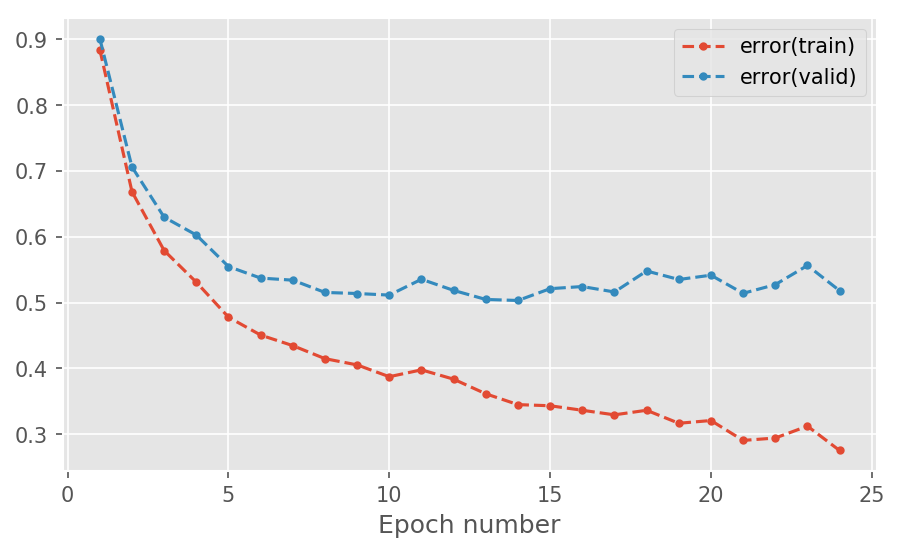

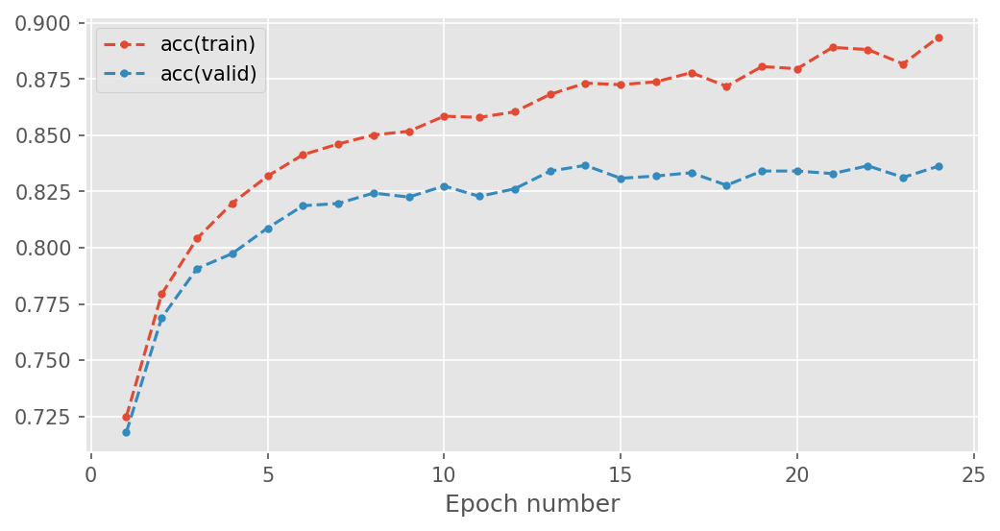

In [13]:
# Seed a random number generator
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 10
# Set up a logger object to print info about the training run to stdout
logger = logging.getLogger()
logger.setLevel(logging.INFO)
logger.handlers = [logging.StreamHandler()]

# Create data provider objects for the MNIST data set
train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)

import importlib
import mlp
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
from mlp.learning_rules import GradientDescentLearningRule
importlib.reload(mlp.optimisers)
from mlp.optimisers import Optimiser

#setup hyperparameters
learning_rate = 0.013
num_epochs = 300
stats_interval = 1
input_dim, output_dim, hidden_dim = 784, 47, 100

weights_init = GlorotUniformInit(rng=rng)
biases_init = ConstantInit(0.)
model = MultipleLayerModel([
    AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
])

error = CrossEntropySoftmaxError()
# Use a basic gradient descent learning rule
learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

#Remember to use notebook=False when you write a script to be run in a terminal
_5 = train_model_and_plot_stats(
    model, error, learning_rule, train_data, valid_data, num_epochs,scheduler, stats_interval, notebook=True)

In [26]:
outputs=(_5[-2].fprop(test_data.inputs)[-1])
targets=MNISTDataProvider.to_one_of_k(test_data,test_data.targets)
CrossEntropySoftmaxError.__call__(error,outputs,targets)

(0.5383430103075448, 0.010939949307618697, 0.8260759493670886)

In [32]:
_5[2]

357.9430401325226

# Part 2

## RMS prop

KeysView(<numpy.lib.npyio.NpzFile object at 0x12be0b278>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12be0b160>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12be0b240>)


Epoch 1: 2.4s to complete
    error(train)=9.92e-01, acc(train)=7.01e-01, error(valid)=1.01e+00, acc(valid)=6.95e-01


1


Epoch 2: 2.1s to complete
    error(train)=7.81e-01, acc(train)=7.60e-01, error(valid)=8.02e-01, acc(valid)=7.53e-01


2


Epoch 3: 2.0s to complete
    error(train)=7.12e-01, acc(train)=7.74e-01, error(valid)=7.43e-01, acc(valid)=7.64e-01


3


Epoch 4: 1.9s to complete
    error(train)=6.35e-01, acc(train)=8.01e-01, error(valid)=6.71e-01, acc(valid)=7.89e-01


4


Epoch 5: 2.2s to complete
    error(train)=6.01e-01, acc(train)=8.08e-01, error(valid)=6.45e-01, acc(valid)=7.97e-01


5


Epoch 6: 2.0s to complete
    error(train)=5.82e-01, acc(train)=8.12e-01, error(valid)=6.27e-01, acc(valid)=8.00e-01


6


Epoch 7: 2.0s to complete
    error(train)=5.44e-01, acc(train)=8.22e-01, error(valid)=5.94e-01, acc(valid)=8.11e-01


7


Epoch 8: 2.2s to complete
    error(train)=5.29e-01, acc(train)=8.28e-01, error(valid)=5.87e-01, acc(valid)=8.14e-01


8


Epoch 9: 2.0s to complete
    error(train)=5.12e-01, acc(train)=8.31e-01, error(valid)=5.74e-01, acc(valid)=8.17e-01


9


Epoch 10: 2.0s to complete
    error(train)=4.97e-01, acc(train)=8.35e-01, error(valid)=5.64e-01, acc(valid)=8.17e-01


10


Epoch 11: 2.2s to complete
    error(train)=4.89e-01, acc(train)=8.36e-01, error(valid)=5.63e-01, acc(valid)=8.15e-01


11


Epoch 12: 2.1s to complete
    error(train)=4.56e-01, acc(train)=8.47e-01, error(valid)=5.33e-01, acc(valid)=8.26e-01


12


Epoch 13: 2.1s to complete
    error(train)=4.47e-01, acc(train)=8.51e-01, error(valid)=5.30e-01, acc(valid)=8.29e-01


13


Epoch 14: 2.1s to complete
    error(train)=4.44e-01, acc(train)=8.51e-01, error(valid)=5.28e-01, acc(valid)=8.30e-01


14


Epoch 15: 2.0s to complete
    error(train)=4.43e-01, acc(train)=8.50e-01, error(valid)=5.35e-01, acc(valid)=8.24e-01


Epoch 16: 2.2s to complete
    error(train)=4.28e-01, acc(train)=8.55e-01, error(valid)=5.22e-01, acc(valid)=8.29e-01


16


Epoch 17: 2.0s to complete
    error(train)=4.11e-01, acc(train)=8.61e-01, error(valid)=5.08e-01, acc(valid)=8.32e-01


17


Epoch 18: 2.0s to complete
    error(train)=4.05e-01, acc(train)=8.61e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


Epoch 19: 2.2s to complete
    error(train)=3.99e-01, acc(train)=8.64e-01, error(valid)=5.10e-01, acc(valid)=8.36e-01


Epoch 20: 2.0s to complete
    error(train)=4.06e-01, acc(train)=8.60e-01, error(valid)=5.24e-01, acc(valid)=8.30e-01


Epoch 21: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.69e-01, error(valid)=5.05e-01, acc(valid)=8.36e-01


21


Epoch 22: 2.0s to complete
    error(train)=3.90e-01, acc(train)=8.65e-01, error(valid)=5.13e-01, acc(valid)=8.32e-01


Epoch 23: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.67e-01, error(valid)=5.15e-01, acc(valid)=8.33e-01


Epoch 24: 2.1s to complete
    error(train)=3.73e-01, acc(train)=8.71e-01, error(valid)=5.06e-01, acc(valid)=8.37e-01


Epoch 25: 1.9s to complete
    error(train)=3.60e-01, acc(train)=8.75e-01, error(valid)=4.94e-01, acc(valid)=8.40e-01


25


Epoch 26: 1.9s to complete
    error(train)=3.61e-01, acc(train)=8.74e-01, error(valid)=5.00e-01, acc(valid)=8.32e-01


Epoch 27: 2.1s to complete
    error(train)=3.54e-01, acc(train)=8.76e-01, error(valid)=5.04e-01, acc(valid)=8.36e-01


Epoch 28: 1.9s to complete
    error(train)=3.60e-01, acc(train)=8.70e-01, error(valid)=5.11e-01, acc(valid)=8.31e-01


Epoch 29: 2.0s to complete
    error(train)=3.41e-01, acc(train)=8.79e-01, error(valid)=4.95e-01, acc(valid)=8.38e-01


Epoch 30: 1.9s to complete
    error(train)=3.38e-01, acc(train)=8.82e-01, error(valid)=4.97e-01, acc(valid)=8.39e-01


Epoch 31: 2.0s to complete
    error(train)=3.47e-01, acc(train)=8.77e-01, error(valid)=5.14e-01, acc(valid)=8.33e-01


Epoch 32: 2.0s to complete
    error(train)=3.41e-01, acc(train)=8.80e-01, error(valid)=5.07e-01, acc(valid)=8.37e-01


Epoch 33: 1.9s to complete
    error(train)=3.17e-01, acc(train)=8.89e-01, error(valid)=4.89e-01, acc(valid)=8.42e-01


33


Epoch 34: 2.0s to complete
    error(train)=3.17e-01, acc(train)=8.89e-01, error(valid)=4.90e-01, acc(valid)=8.39e-01


Epoch 35: 1.9s to complete
    error(train)=3.24e-01, acc(train)=8.85e-01, error(valid)=5.04e-01, acc(valid)=8.37e-01


Epoch 36: 1.9s to complete
    error(train)=3.27e-01, acc(train)=8.83e-01, error(valid)=5.12e-01, acc(valid)=8.35e-01


Epoch 37: 2.0s to complete
    error(train)=3.15e-01, acc(train)=8.88e-01, error(valid)=5.06e-01, acc(valid)=8.38e-01


Epoch 38: 1.9s to complete
    error(train)=3.07e-01, acc(train)=8.91e-01, error(valid)=5.00e-01, acc(valid)=8.39e-01


Epoch 39: 2.0s to complete
    error(train)=3.10e-01, acc(train)=8.89e-01, error(valid)=5.10e-01, acc(valid)=8.37e-01


Epoch 40: 1.9s to complete
    error(train)=3.02e-01, acc(train)=8.92e-01, error(valid)=5.10e-01, acc(valid)=8.39e-01


Epoch 41: 1.9s to complete
    error(train)=2.92e-01, acc(train)=8.95e-01, error(valid)=5.00e-01, acc(valid)=8.41e-01


Epoch 42: 1.9s to complete
    error(train)=2.92e-01, acc(train)=8.94e-01, error(valid)=5.10e-01, acc(valid)=8.36e-01


Epoch 43: 1.9s to complete
    error(train)=2.98e-01, acc(train)=8.93e-01, error(valid)=5.19e-01, acc(valid)=8.36e-01


 hola



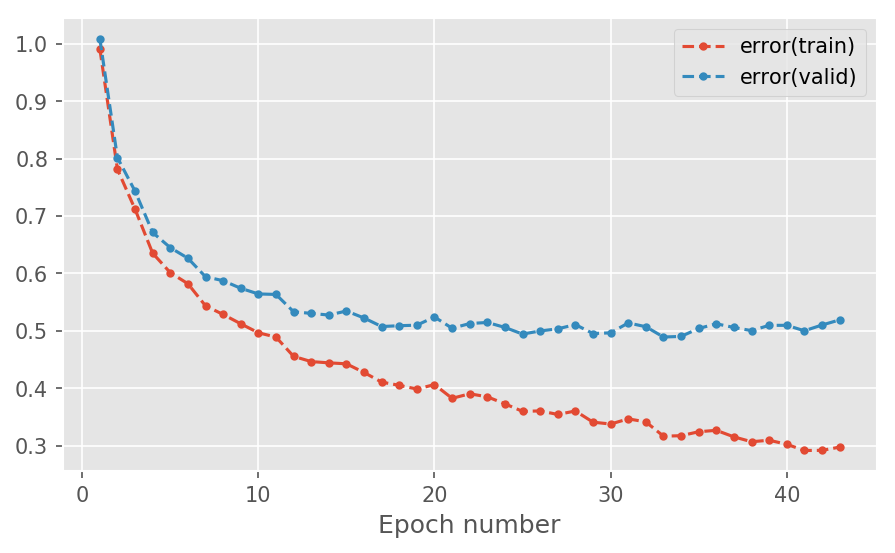

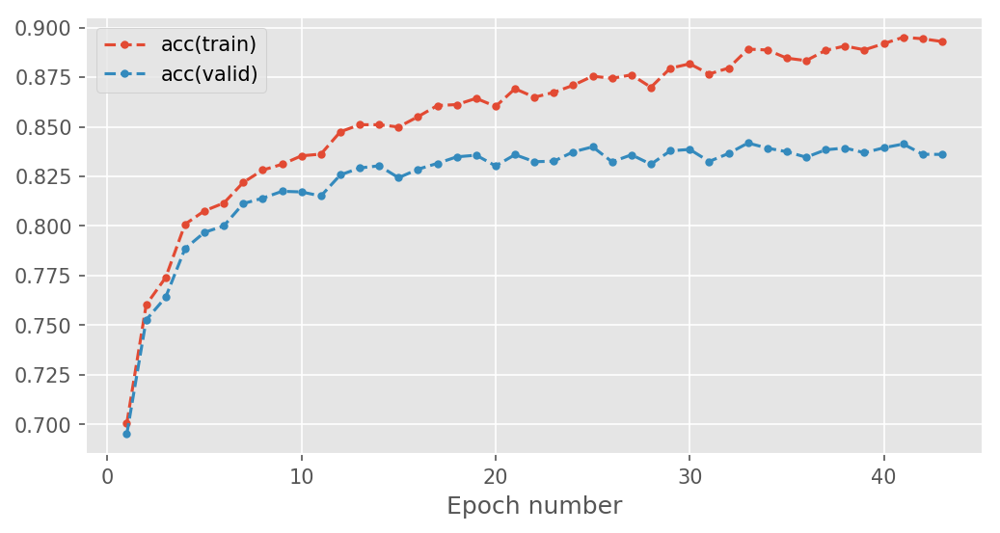

In [18]:
# Seed a random number generator
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 500
# Set up a logger object to print info about the training run to stdout
logger = logging.getLogger()
logger.setLevel(logging.INFO)
logger.handlers = [logging.StreamHandler()]

# Create data provider objects for the MNIST data set
train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)

import importlib
import mlp
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
importlib.reload(mlp.optimisers)
importlib.reload(mlp.learning_rules)
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule

#setup hyperparameters
learning_rate = 0.013
num_epochs = 300
stats_interval = 1
input_dim, output_dim, hidden_dim = 784, 47, 100

weights_init = GlorotUniformInit(rng=rng)
biases_init = ConstantInit(0.)
model = MultipleLayerModel([
    AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
])
 
error = CrossEntropySoftmaxError()
# Use a basic gradient descent learning rule
learning_rule = RMSPropLearningRule(learning_rate=4*1e-4,beta=0.998)
scheduler=ConstantLearningRateScheduler(4e-4)
#Remember to use notebook=False when you write a script to be run in a terminal
_RMS = train_model_and_plot_stats(
    model, error, learning_rule, train_data, valid_data, num_epochs, scheduler,stats_interval, notebook=True)

In [27]:
outputs=(_RMS[-2].fprop(test_data.inputs)[-1])
targets=MNISTDataProvider.to_one_of_k(test_data,test_data.targets)
CrossEntropySoftmaxError.__call__(error,outputs,targets)


(0.5605337177580129, 0.01170600281851186, 0.8281645569620253)

In [33]:
_RMS[2]

135.08328294754028

KeysView(<numpy.lib.npyio.NpzFile object at 0x11517acc0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11517aba8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11598c5f8>)


Epoch 1: 2.5s to complete
    error(train)=1.44e+00, acc(train)=6.01e-01, error(valid)=1.44e+00, acc(valid)=6.00e-01


1


Epoch 2: 2.4s to complete
    error(train)=1.11e+00, acc(train)=6.83e-01, error(valid)=1.11e+00, acc(valid)=6.82e-01


2


Epoch 3: 2.2s to complete
    error(train)=9.52e-01, acc(train)=7.23e-01, error(valid)=9.67e-01, acc(valid)=7.20e-01


3


Epoch 4: 2.6s to complete
    error(train)=8.56e-01, acc(train)=7.48e-01, error(valid)=8.73e-01, acc(valid)=7.42e-01


4


Epoch 5: 2.1s to complete
    error(train)=7.94e-01, acc(train)=7.62e-01, error(valid)=8.12e-01, acc(valid)=7.58e-01


5


Epoch 6: 2.1s to complete
    error(train)=7.52e-01, acc(train)=7.71e-01, error(valid)=7.71e-01, acc(valid)=7.63e-01


6


Epoch 7: 2.0s to complete
    error(train)=6.99e-01, acc(train)=7.86e-01, error(valid)=7.24e-01, acc(valid)=7.79e-01


7


Epoch 8: 2.2s to complete
    error(train)=6.71e-01, acc(train)=7.93e-01, error(valid)=7.04e-01, acc(valid)=7.85e-01


8


Epoch 9: 2.1s to complete
    error(train)=6.45e-01, acc(train)=8.00e-01, error(valid)=6.78e-01, acc(valid)=7.90e-01


9


Epoch 10: 2.1s to complete
    error(train)=6.23e-01, acc(train)=8.04e-01, error(valid)=6.61e-01, acc(valid)=7.95e-01


10


Epoch 11: 2.2s to complete
    error(train)=6.08e-01, acc(train)=8.10e-01, error(valid)=6.50e-01, acc(valid)=7.99e-01


11


Epoch 12: 2.1s to complete
    error(train)=5.86e-01, acc(train)=8.15e-01, error(valid)=6.34e-01, acc(valid)=8.03e-01


12


Epoch 13: 2.2s to complete
    error(train)=5.70e-01, acc(train)=8.18e-01, error(valid)=6.18e-01, acc(valid)=8.07e-01


13


Epoch 14: 2.3s to complete
    error(train)=5.57e-01, acc(train)=8.23e-01, error(valid)=6.09e-01, acc(valid)=8.09e-01


14


Epoch 15: 2.1s to complete
    error(train)=5.42e-01, acc(train)=8.27e-01, error(valid)=5.99e-01, acc(valid)=8.11e-01


15


Epoch 16: 2.1s to complete
    error(train)=5.26e-01, acc(train)=8.30e-01, error(valid)=5.86e-01, acc(valid)=8.13e-01


16


Epoch 17: 2.2s to complete
    error(train)=5.18e-01, acc(train)=8.34e-01, error(valid)=5.83e-01, acc(valid)=8.15e-01


17


Epoch 18: 2.1s to complete
    error(train)=5.15e-01, acc(train)=8.32e-01, error(valid)=5.78e-01, acc(valid)=8.18e-01


18


Epoch 19: 2.3s to complete
    error(train)=4.95e-01, acc(train)=8.39e-01, error(valid)=5.68e-01, acc(valid)=8.19e-01


19


Epoch 20: 2.2s to complete
    error(train)=4.88e-01, acc(train)=8.41e-01, error(valid)=5.58e-01, acc(valid)=8.21e-01


20


Epoch 21: 2.1s to complete
    error(train)=4.87e-01, acc(train)=8.40e-01, error(valid)=5.64e-01, acc(valid)=8.18e-01


Epoch 22: 2.2s to complete
    error(train)=4.78e-01, acc(train)=8.42e-01, error(valid)=5.57e-01, acc(valid)=8.21e-01


22


Epoch 23: 2.1s to complete
    error(train)=4.65e-01, acc(train)=8.47e-01, error(valid)=5.48e-01, acc(valid)=8.23e-01


23


Epoch 24: 2.1s to complete
    error(train)=4.53e-01, acc(train)=8.51e-01, error(valid)=5.38e-01, acc(valid)=8.27e-01


24


Epoch 25: 2.2s to complete
    error(train)=4.56e-01, acc(train)=8.49e-01, error(valid)=5.47e-01, acc(valid)=8.24e-01


Epoch 26: 2.1s to complete
    error(train)=4.40e-01, acc(train)=8.54e-01, error(valid)=5.31e-01, acc(valid)=8.27e-01


26


Epoch 27: 2.6s to complete
    error(train)=4.38e-01, acc(train)=8.55e-01, error(valid)=5.34e-01, acc(valid)=8.28e-01


Epoch 28: 2.6s to complete
    error(train)=4.36e-01, acc(train)=8.54e-01, error(valid)=5.36e-01, acc(valid)=8.24e-01


Epoch 29: 2.6s to complete
    error(train)=4.31e-01, acc(train)=8.56e-01, error(valid)=5.33e-01, acc(valid)=8.27e-01


Epoch 30: 2.6s to complete
    error(train)=4.21e-01, acc(train)=8.60e-01, error(valid)=5.28e-01, acc(valid)=8.28e-01


30


Epoch 31: 2.6s to complete
    error(train)=4.24e-01, acc(train)=8.57e-01, error(valid)=5.34e-01, acc(valid)=8.28e-01


Epoch 32: 2.1s to complete
    error(train)=4.12e-01, acc(train)=8.61e-01, error(valid)=5.22e-01, acc(valid)=8.31e-01


32


Epoch 33: 2.1s to complete
    error(train)=4.04e-01, acc(train)=8.63e-01, error(valid)=5.17e-01, acc(valid)=8.30e-01


33


Epoch 34: 2.0s to complete
    error(train)=4.08e-01, acc(train)=8.62e-01, error(valid)=5.25e-01, acc(valid)=8.31e-01


Epoch 35: 2.2s to complete
    error(train)=4.00e-01, acc(train)=8.63e-01, error(valid)=5.19e-01, acc(valid)=8.31e-01


Epoch 36: 2.1s to complete
    error(train)=3.96e-01, acc(train)=8.65e-01, error(valid)=5.18e-01, acc(valid)=8.32e-01


Epoch 37: 2.1s to complete
    error(train)=3.84e-01, acc(train)=8.70e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


37


Epoch 38: 2.2s to complete
    error(train)=3.80e-01, acc(train)=8.71e-01, error(valid)=5.13e-01, acc(valid)=8.34e-01


Epoch 39: 2.0s to complete
    error(train)=3.81e-01, acc(train)=8.71e-01, error(valid)=5.16e-01, acc(valid)=8.32e-01


Epoch 40: 2.1s to complete
    error(train)=3.80e-01, acc(train)=8.70e-01, error(valid)=5.17e-01, acc(valid)=8.30e-01


Epoch 41: 2.3s to complete
    error(train)=3.74e-01, acc(train)=8.72e-01, error(valid)=5.14e-01, acc(valid)=8.31e-01


Epoch 42: 2.0s to complete
    error(train)=3.69e-01, acc(train)=8.73e-01, error(valid)=5.10e-01, acc(valid)=8.32e-01


Epoch 43: 2.3s to complete
    error(train)=3.76e-01, acc(train)=8.70e-01, error(valid)=5.21e-01, acc(valid)=8.32e-01


Epoch 44: 2.6s to complete
    error(train)=3.61e-01, acc(train)=8.76e-01, error(valid)=5.10e-01, acc(valid)=8.34e-01


Epoch 45: 2.9s to complete
    error(train)=3.61e-01, acc(train)=8.75e-01, error(valid)=5.11e-01, acc(valid)=8.37e-01


Epoch 46: 2.4s to complete
    error(train)=3.55e-01, acc(train)=8.77e-01, error(valid)=5.14e-01, acc(valid)=8.35e-01


Epoch 47: 2.1s to complete
    error(train)=3.61e-01, acc(train)=8.75e-01, error(valid)=5.22e-01, acc(valid)=8.31e-01


 hola



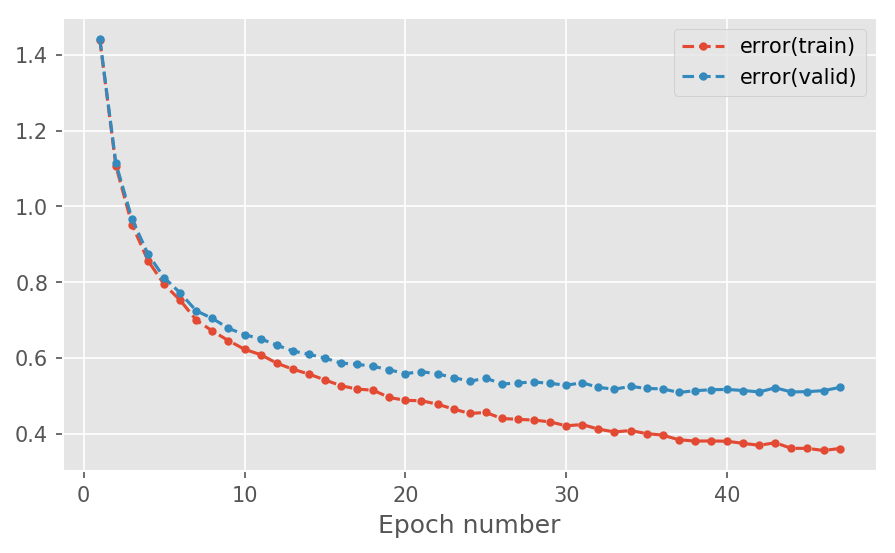

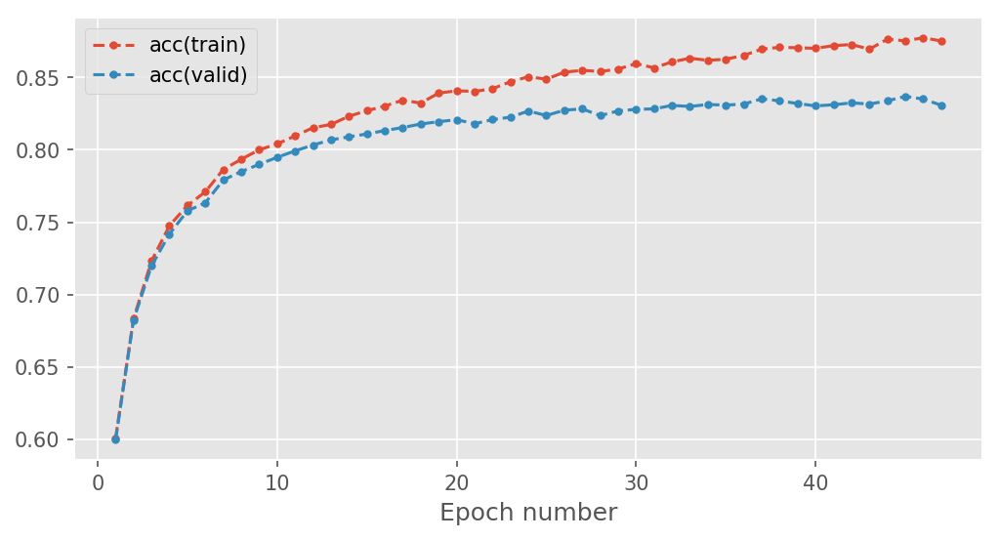

In [21]:
# Seed a random number generator
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 500
# Set up a logger object to print info about the training run to stdout
logger = logging.getLogger()
logger.setLevel(logging.INFO)
logger.handlers = [logging.StreamHandler()]

# Create data provider objects for the MNIST data set
train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)

import importlib
import mlp
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
importlib.reload(mlp.optimisers)
importlib.reload(mlp.learning_rules)
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule

#setup hyperparameters
learning_rate = 0.013
num_epochs = 300
stats_interval = 1
input_dim, output_dim, hidden_dim = 784, 47, 100

weights_init = GlorotUniformInit(rng=rng)
biases_init = ConstantInit(0.)
model = MultipleLayerModel([
    AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
])
 
error = CrossEntropySoftmaxError()
# Use a basic gradient descent learning rule
learning_rule = AdamLearningRule(learning_rate=3*1e-4,beta_1=0.875,beta_2=0.9992)
scheduler=ConstantLearningRateScheduler(3e-4)
#Remember to use notebook=False when you write a script to be run in a terminal
_ADAM = train_model_and_plot_stats(
    model, error, learning_rule, train_data, valid_data, num_epochs, scheduler,stats_interval, notebook=True)

Falta de convergencia al usar batches de 10 (?) 

In [28]:
outputs=(_ADAM[-2].fprop(test_data.inputs)[-1])
targets=MNISTDataProvider.to_one_of_k(test_data,test_data.targets)
CrossEntropySoftmaxError.__call__(error,outputs,targets)

(0.5530007671508106, 0.010791122928355575, 0.8234810126582278)

In [34]:
_ADAM[2]

159.48009610176086

KeysView(<numpy.lib.npyio.NpzFile object at 0x132aa5390>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1287a3470>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1287a3630>)
5e-05


Epoch 1: 2.0s to complete
    error(train)=3.59e+00, acc(train)=1.36e-01, error(valid)=3.59e+00, acc(valid)=1.36e-01


1


Epoch 2: 2.0s to complete
    error(train)=2.95e+00, acc(train)=3.09e-01, error(valid)=2.95e+00, acc(valid)=3.08e-01


2


Epoch 3: 1.9s to complete
    error(train)=2.30e+00, acc(train)=4.33e-01, error(valid)=2.30e+00, acc(valid)=4.30e-01


3


Epoch 4: 2.0s to complete
    error(train)=1.91e+00, acc(train)=5.07e-01, error(valid)=1.92e+00, acc(valid)=5.05e-01


4


Epoch 5: 1.9s to complete
    error(train)=1.68e+00, acc(train)=5.53e-01, error(valid)=1.69e+00, acc(valid)=5.50e-01


5


Epoch 6: 1.9s to complete
    error(train)=1.54e+00, acc(train)=5.84e-01, error(valid)=1.54e+00, acc(valid)=5.83e-01


6


Epoch 7: 2.0s to complete
    error(train)=1.43e+00, acc(train)=6.07e-01, error(valid)=1.44e+00, acc(valid)=6.04e-01


7


Epoch 8: 1.9s to complete
    error(train)=1.36e+00, acc(train)=6.25e-01, error(valid)=1.36e+00, acc(valid)=6.24e-01


8


Epoch 9: 1.9s to complete
    error(train)=1.29e+00, acc(train)=6.40e-01, error(valid)=1.30e+00, acc(valid)=6.38e-01


9


Epoch 10: 2.3s to complete
    error(train)=1.24e+00, acc(train)=6.52e-01, error(valid)=1.25e+00, acc(valid)=6.49e-01


10


Epoch 11: 2.0s to complete
    error(train)=1.20e+00, acc(train)=6.63e-01, error(valid)=1.21e+00, acc(valid)=6.63e-01


11


Epoch 12: 1.7s to complete
    error(train)=1.16e+00, acc(train)=6.73e-01, error(valid)=1.17e+00, acc(valid)=6.70e-01


12


Epoch 13: 1.7s to complete
    error(train)=1.13e+00, acc(train)=6.81e-01, error(valid)=1.13e+00, acc(valid)=6.80e-01


13


Epoch 14: 1.7s to complete
    error(train)=1.10e+00, acc(train)=6.88e-01, error(valid)=1.11e+00, acc(valid)=6.88e-01


14


Epoch 15: 1.9s to complete
    error(train)=1.07e+00, acc(train)=6.94e-01, error(valid)=1.09e+00, acc(valid)=6.91e-01


15


Epoch 16: 1.7s to complete
    error(train)=1.04e+00, acc(train)=7.00e-01, error(valid)=1.05e+00, acc(valid)=7.01e-01


16


Epoch 17: 2.0s to complete
    error(train)=1.02e+00, acc(train)=7.05e-01, error(valid)=1.03e+00, acc(valid)=7.05e-01


17


Epoch 18: 2.1s to complete
    error(train)=1.00e+00, acc(train)=7.11e-01, error(valid)=1.01e+00, acc(valid)=7.10e-01


18


Epoch 19: 1.9s to complete
    error(train)=9.79e-01, acc(train)=7.17e-01, error(valid)=9.90e-01, acc(valid)=7.15e-01


19


Epoch 20: 2.0s to complete
    error(train)=9.60e-01, acc(train)=7.21e-01, error(valid)=9.70e-01, acc(valid)=7.19e-01


20


Epoch 21: 2.1s to complete
    error(train)=9.43e-01, acc(train)=7.25e-01, error(valid)=9.57e-01, acc(valid)=7.22e-01


21


Epoch 22: 2.0s to complete
    error(train)=9.26e-01, acc(train)=7.30e-01, error(valid)=9.38e-01, acc(valid)=7.29e-01


22


Epoch 23: 2.0s to complete
    error(train)=9.11e-01, acc(train)=7.33e-01, error(valid)=9.26e-01, acc(valid)=7.31e-01


23


Epoch 24: 2.0s to complete
    error(train)=8.94e-01, acc(train)=7.37e-01, error(valid)=9.08e-01, acc(valid)=7.35e-01


24


Epoch 25: 1.9s to complete
    error(train)=8.80e-01, acc(train)=7.42e-01, error(valid)=8.93e-01, acc(valid)=7.39e-01


25


Epoch 26: 1.9s to complete
    error(train)=8.68e-01, acc(train)=7.45e-01, error(valid)=8.83e-01, acc(valid)=7.41e-01


26


Epoch 27: 2.0s to complete
    error(train)=8.55e-01, acc(train)=7.47e-01, error(valid)=8.70e-01, acc(valid)=7.44e-01


27


Epoch 28: 1.9s to complete
    error(train)=8.44e-01, acc(train)=7.49e-01, error(valid)=8.60e-01, acc(valid)=7.46e-01


28


Epoch 29: 1.9s to complete
    error(train)=8.32e-01, acc(train)=7.53e-01, error(valid)=8.46e-01, acc(valid)=7.53e-01


29


Epoch 30: 1.9s to complete
    error(train)=8.19e-01, acc(train)=7.57e-01, error(valid)=8.37e-01, acc(valid)=7.54e-01


30


Epoch 31: 1.9s to complete
    error(train)=8.08e-01, acc(train)=7.60e-01, error(valid)=8.24e-01, acc(valid)=7.55e-01


31


Epoch 32: 1.9s to complete
    error(train)=8.00e-01, acc(train)=7.61e-01, error(valid)=8.18e-01, acc(valid)=7.58e-01


32


Epoch 33: 1.9s to complete
    error(train)=7.88e-01, acc(train)=7.64e-01, error(valid)=8.02e-01, acc(valid)=7.61e-01


33


Epoch 34: 1.9s to complete
    error(train)=7.80e-01, acc(train)=7.67e-01, error(valid)=7.98e-01, acc(valid)=7.62e-01


34


Epoch 35: 1.9s to complete
    error(train)=7.71e-01, acc(train)=7.69e-01, error(valid)=7.85e-01, acc(valid)=7.67e-01


35


Epoch 36: 1.9s to complete
    error(train)=7.64e-01, acc(train)=7.71e-01, error(valid)=7.82e-01, acc(valid)=7.67e-01


36


Epoch 37: 1.9s to complete
    error(train)=7.54e-01, acc(train)=7.74e-01, error(valid)=7.73e-01, acc(valid)=7.71e-01


37


Epoch 38: 1.9s to complete
    error(train)=7.46e-01, acc(train)=7.75e-01, error(valid)=7.69e-01, acc(valid)=7.71e-01


38


Epoch 39: 1.9s to complete
    error(train)=7.39e-01, acc(train)=7.78e-01, error(valid)=7.59e-01, acc(valid)=7.72e-01


39


Epoch 40: 2.2s to complete
    error(train)=7.32e-01, acc(train)=7.80e-01, error(valid)=7.53e-01, acc(valid)=7.75e-01


40


Epoch 41: 1.9s to complete
    error(train)=7.25e-01, acc(train)=7.81e-01, error(valid)=7.46e-01, acc(valid)=7.78e-01


41


Epoch 42: 2.0s to complete
    error(train)=7.18e-01, acc(train)=7.82e-01, error(valid)=7.40e-01, acc(valid)=7.77e-01


42


Epoch 43: 2.4s to complete
    error(train)=7.10e-01, acc(train)=7.85e-01, error(valid)=7.31e-01, acc(valid)=7.79e-01


43


Epoch 44: 2.0s to complete
    error(train)=7.05e-01, acc(train)=7.86e-01, error(valid)=7.29e-01, acc(valid)=7.79e-01


44


Epoch 45: 2.1s to complete
    error(train)=7.00e-01, acc(train)=7.87e-01, error(valid)=7.24e-01, acc(valid)=7.83e-01


45


Epoch 46: 1.8s to complete
    error(train)=6.94e-01, acc(train)=7.89e-01, error(valid)=7.21e-01, acc(valid)=7.83e-01


46


Epoch 47: 1.8s to complete
    error(train)=6.90e-01, acc(train)=7.89e-01, error(valid)=7.18e-01, acc(valid)=7.84e-01


47


Epoch 48: 2.1s to complete
    error(train)=6.83e-01, acc(train)=7.92e-01, error(valid)=7.08e-01, acc(valid)=7.86e-01


48


Epoch 49: 1.9s to complete
    error(train)=6.78e-01, acc(train)=7.93e-01, error(valid)=7.06e-01, acc(valid)=7.86e-01


49


Epoch 50: 1.9s to complete
    error(train)=6.73e-01, acc(train)=7.94e-01, error(valid)=7.03e-01, acc(valid)=7.88e-01


50


Epoch 51: 1.9s to complete
    error(train)=6.68e-01, acc(train)=7.95e-01, error(valid)=6.96e-01, acc(valid)=7.89e-01


51


Epoch 52: 1.9s to complete
    error(train)=6.64e-01, acc(train)=7.96e-01, error(valid)=6.93e-01, acc(valid)=7.88e-01


52


Epoch 53: 2.2s to complete
    error(train)=6.60e-01, acc(train)=7.97e-01, error(valid)=6.89e-01, acc(valid)=7.90e-01


53


Epoch 54: 2.3s to complete
    error(train)=6.54e-01, acc(train)=7.98e-01, error(valid)=6.85e-01, acc(valid)=7.92e-01


54


Epoch 55: 2.2s to complete
    error(train)=6.49e-01, acc(train)=8.01e-01, error(valid)=6.80e-01, acc(valid)=7.93e-01


55


Epoch 56: 2.1s to complete
    error(train)=6.46e-01, acc(train)=8.01e-01, error(valid)=6.78e-01, acc(valid)=7.93e-01


56


Epoch 57: 2.0s to complete
    error(train)=6.41e-01, acc(train)=8.02e-01, error(valid)=6.73e-01, acc(valid)=7.94e-01


57


Epoch 58: 2.0s to complete
    error(train)=6.36e-01, acc(train)=8.04e-01, error(valid)=6.69e-01, acc(valid)=7.96e-01


58


Epoch 59: 2.0s to complete
    error(train)=6.35e-01, acc(train)=8.03e-01, error(valid)=6.68e-01, acc(valid)=7.96e-01


59


Epoch 60: 1.9s to complete
    error(train)=6.30e-01, acc(train)=8.06e-01, error(valid)=6.61e-01, acc(valid)=7.99e-01


60


Epoch 61: 1.9s to complete
    error(train)=6.25e-01, acc(train)=8.06e-01, error(valid)=6.62e-01, acc(valid)=7.97e-01


Epoch 62: 1.9s to complete
    error(train)=6.22e-01, acc(train)=8.07e-01, error(valid)=6.59e-01, acc(valid)=7.95e-01


62


Epoch 63: 2.0s to complete
    error(train)=6.19e-01, acc(train)=8.08e-01, error(valid)=6.54e-01, acc(valid)=7.98e-01


63


Epoch 64: 2.0s to complete
    error(train)=6.15e-01, acc(train)=8.08e-01, error(valid)=6.50e-01, acc(valid)=8.00e-01


64


Epoch 65: 2.0s to complete
    error(train)=6.11e-01, acc(train)=8.10e-01, error(valid)=6.49e-01, acc(valid)=8.00e-01


65


Epoch 66: 2.0s to complete
    error(train)=6.08e-01, acc(train)=8.11e-01, error(valid)=6.47e-01, acc(valid)=8.00e-01


66


Epoch 67: 1.9s to complete
    error(train)=6.05e-01, acc(train)=8.12e-01, error(valid)=6.47e-01, acc(valid)=8.01e-01


Epoch 68: 1.9s to complete
    error(train)=6.03e-01, acc(train)=8.13e-01, error(valid)=6.42e-01, acc(valid)=8.02e-01


68


Epoch 69: 2.0s to complete
    error(train)=5.98e-01, acc(train)=8.14e-01, error(valid)=6.38e-01, acc(valid)=8.02e-01


69


Epoch 70: 2.2s to complete
    error(train)=5.95e-01, acc(train)=8.15e-01, error(valid)=6.36e-01, acc(valid)=8.03e-01


70


Epoch 71: 2.2s to complete
    error(train)=5.93e-01, acc(train)=8.15e-01, error(valid)=6.34e-01, acc(valid)=8.02e-01


71


Epoch 72: 2.1s to complete
    error(train)=5.92e-01, acc(train)=8.16e-01, error(valid)=6.33e-01, acc(valid)=8.06e-01


72


Epoch 73: 2.0s to complete
    error(train)=5.86e-01, acc(train)=8.17e-01, error(valid)=6.28e-01, acc(valid)=8.04e-01


73


Epoch 74: 2.0s to complete
    error(train)=5.84e-01, acc(train)=8.19e-01, error(valid)=6.28e-01, acc(valid)=8.07e-01


74


Epoch 75: 2.0s to complete
    error(train)=5.81e-01, acc(train)=8.19e-01, error(valid)=6.23e-01, acc(valid)=8.06e-01


75


Epoch 76: 2.0s to complete
    error(train)=5.81e-01, acc(train)=8.18e-01, error(valid)=6.24e-01, acc(valid)=8.05e-01


Epoch 77: 1.9s to complete
    error(train)=5.77e-01, acc(train)=8.20e-01, error(valid)=6.22e-01, acc(valid)=8.08e-01


77


Epoch 78: 2.0s to complete
    error(train)=5.75e-01, acc(train)=8.20e-01, error(valid)=6.22e-01, acc(valid)=8.07e-01


78


Epoch 79: 2.0s to complete
    error(train)=5.73e-01, acc(train)=8.21e-01, error(valid)=6.18e-01, acc(valid)=8.08e-01


79


Epoch 80: 1.9s to complete
    error(train)=5.70e-01, acc(train)=8.21e-01, error(valid)=6.17e-01, acc(valid)=8.09e-01


80


Epoch 81: 2.0s to complete
    error(train)=5.66e-01, acc(train)=8.22e-01, error(valid)=6.12e-01, acc(valid)=8.08e-01


81


Epoch 82: 2.0s to complete
    error(train)=5.64e-01, acc(train)=8.23e-01, error(valid)=6.10e-01, acc(valid)=8.09e-01


82


Epoch 83: 2.1s to complete
    error(train)=5.61e-01, acc(train)=8.24e-01, error(valid)=6.08e-01, acc(valid)=8.11e-01


83


Epoch 84: 2.0s to complete
    error(train)=5.60e-01, acc(train)=8.25e-01, error(valid)=6.10e-01, acc(valid)=8.10e-01


Epoch 85: 1.9s to complete
    error(train)=5.57e-01, acc(train)=8.25e-01, error(valid)=6.06e-01, acc(valid)=8.11e-01


85


Epoch 86: 2.1s to complete
    error(train)=5.54e-01, acc(train)=8.26e-01, error(valid)=6.03e-01, acc(valid)=8.14e-01


86


Epoch 87: 2.0s to complete
    error(train)=5.51e-01, acc(train)=8.27e-01, error(valid)=6.02e-01, acc(valid)=8.12e-01


87


Epoch 88: 1.9s to complete
    error(train)=5.52e-01, acc(train)=8.26e-01, error(valid)=6.02e-01, acc(valid)=8.13e-01


Epoch 89: 2.0s to complete
    error(train)=5.49e-01, acc(train)=8.27e-01, error(valid)=5.98e-01, acc(valid)=8.13e-01


89


Epoch 90: 1.9s to complete
    error(train)=5.47e-01, acc(train)=8.28e-01, error(valid)=6.00e-01, acc(valid)=8.13e-01


Epoch 91: 1.9s to complete
    error(train)=5.43e-01, acc(train)=8.29e-01, error(valid)=5.95e-01, acc(valid)=8.14e-01


91


Epoch 92: 2.0s to complete
    error(train)=5.40e-01, acc(train)=8.30e-01, error(valid)=5.93e-01, acc(valid)=8.15e-01


92


Epoch 93: 2.0s to complete
    error(train)=5.40e-01, acc(train)=8.30e-01, error(valid)=5.92e-01, acc(valid)=8.14e-01


93


Epoch 94: 1.9s to complete
    error(train)=5.38e-01, acc(train)=8.30e-01, error(valid)=5.92e-01, acc(valid)=8.14e-01


Epoch 95: 1.9s to complete
    error(train)=5.35e-01, acc(train)=8.32e-01, error(valid)=5.90e-01, acc(valid)=8.16e-01


95


Epoch 96: 1.9s to complete
    error(train)=5.33e-01, acc(train)=8.32e-01, error(valid)=5.91e-01, acc(valid)=8.13e-01


Epoch 97: 1.9s to complete
    error(train)=5.33e-01, acc(train)=8.32e-01, error(valid)=5.89e-01, acc(valid)=8.16e-01


97


Epoch 98: 2.0s to complete
    error(train)=5.28e-01, acc(train)=8.34e-01, error(valid)=5.87e-01, acc(valid)=8.17e-01


98


Epoch 99: 2.0s to complete
    error(train)=5.27e-01, acc(train)=8.33e-01, error(valid)=5.84e-01, acc(valid)=8.16e-01


99


Epoch 100: 1.9s to complete
    error(train)=5.26e-01, acc(train)=8.33e-01, error(valid)=5.83e-01, acc(valid)=8.16e-01


100


Epoch 101: 1.9s to complete
    error(train)=5.25e-01, acc(train)=8.33e-01, error(valid)=5.85e-01, acc(valid)=8.16e-01


Epoch 102: 1.9s to complete
    error(train)=5.22e-01, acc(train)=8.34e-01, error(valid)=5.80e-01, acc(valid)=8.18e-01


102


Epoch 103: 2.0s to complete
    error(train)=5.24e-01, acc(train)=8.33e-01, error(valid)=5.82e-01, acc(valid)=8.16e-01


Epoch 104: 2.0s to complete
    error(train)=5.20e-01, acc(train)=8.34e-01, error(valid)=5.77e-01, acc(valid)=8.18e-01


104


Epoch 105: 1.9s to complete
    error(train)=5.16e-01, acc(train)=8.36e-01, error(valid)=5.77e-01, acc(valid)=8.17e-01


Epoch 106: 1.9s to complete
    error(train)=5.16e-01, acc(train)=8.36e-01, error(valid)=5.77e-01, acc(valid)=8.18e-01


106


Epoch 107: 1.9s to complete
    error(train)=5.15e-01, acc(train)=8.36e-01, error(valid)=5.75e-01, acc(valid)=8.17e-01


107


Epoch 108: 1.9s to complete
    error(train)=5.11e-01, acc(train)=8.38e-01, error(valid)=5.72e-01, acc(valid)=8.19e-01


108


Epoch 109: 2.0s to complete
    error(train)=5.09e-01, acc(train)=8.38e-01, error(valid)=5.74e-01, acc(valid)=8.18e-01


Epoch 110: 2.0s to complete
    error(train)=5.08e-01, acc(train)=8.38e-01, error(valid)=5.72e-01, acc(valid)=8.21e-01


110


Epoch 111: 2.0s to complete
    error(train)=5.07e-01, acc(train)=8.39e-01, error(valid)=5.70e-01, acc(valid)=8.19e-01


111


Epoch 112: 1.9s to complete
    error(train)=5.08e-01, acc(train)=8.37e-01, error(valid)=5.72e-01, acc(valid)=8.19e-01


Epoch 113: 2.1s to complete
    error(train)=5.04e-01, acc(train)=8.39e-01, error(valid)=5.69e-01, acc(valid)=8.20e-01


113


Epoch 114: 2.4s to complete
    error(train)=5.02e-01, acc(train)=8.40e-01, error(valid)=5.67e-01, acc(valid)=8.21e-01


114


Epoch 115: 2.0s to complete
    error(train)=5.01e-01, acc(train)=8.39e-01, error(valid)=5.67e-01, acc(valid)=8.20e-01


115


Epoch 116: 2.0s to complete
    error(train)=5.00e-01, acc(train)=8.40e-01, error(valid)=5.64e-01, acc(valid)=8.21e-01


116


Epoch 117: 2.1s to complete
    error(train)=4.98e-01, acc(train)=8.40e-01, error(valid)=5.65e-01, acc(valid)=8.20e-01


Epoch 118: 2.1s to complete
    error(train)=4.95e-01, acc(train)=8.42e-01, error(valid)=5.62e-01, acc(valid)=8.21e-01


118


Epoch 119: 2.3s to complete
    error(train)=4.93e-01, acc(train)=8.42e-01, error(valid)=5.59e-01, acc(valid)=8.22e-01


119


Epoch 120: 2.2s to complete
    error(train)=4.94e-01, acc(train)=8.41e-01, error(valid)=5.63e-01, acc(valid)=8.22e-01


Epoch 121: 2.1s to complete
    error(train)=4.91e-01, acc(train)=8.43e-01, error(valid)=5.61e-01, acc(valid)=8.22e-01


Epoch 122: 2.1s to complete
    error(train)=4.89e-01, acc(train)=8.43e-01, error(valid)=5.58e-01, acc(valid)=8.22e-01


122


Epoch 123: 2.2s to complete
    error(train)=4.89e-01, acc(train)=8.42e-01, error(valid)=5.58e-01, acc(valid)=8.23e-01


123


Epoch 124: 2.0s to complete
    error(train)=4.86e-01, acc(train)=8.44e-01, error(valid)=5.55e-01, acc(valid)=8.22e-01


124


Epoch 125: 2.0s to complete
    error(train)=4.87e-01, acc(train)=8.44e-01, error(valid)=5.56e-01, acc(valid)=8.23e-01


Epoch 126: 2.0s to complete
    error(train)=4.84e-01, acc(train)=8.45e-01, error(valid)=5.55e-01, acc(valid)=8.22e-01


126


Epoch 127: 2.0s to complete
    error(train)=4.83e-01, acc(train)=8.45e-01, error(valid)=5.58e-01, acc(valid)=8.24e-01


Epoch 128: 2.0s to complete
    error(train)=4.82e-01, acc(train)=8.45e-01, error(valid)=5.54e-01, acc(valid)=8.23e-01


128


Epoch 129: 2.0s to complete
    error(train)=4.81e-01, acc(train)=8.45e-01, error(valid)=5.50e-01, acc(valid)=8.22e-01


129


Epoch 130: 2.0s to complete
    error(train)=4.79e-01, acc(train)=8.45e-01, error(valid)=5.53e-01, acc(valid)=8.23e-01


Epoch 131: 1.9s to complete
    error(train)=4.78e-01, acc(train)=8.45e-01, error(valid)=5.52e-01, acc(valid)=8.24e-01


Epoch 132: 2.0s to complete
    error(train)=4.76e-01, acc(train)=8.46e-01, error(valid)=5.51e-01, acc(valid)=8.22e-01


Epoch 133: 2.0s to complete
    error(train)=4.75e-01, acc(train)=8.47e-01, error(valid)=5.51e-01, acc(valid)=8.25e-01


Epoch 134: 2.0s to complete
    error(train)=4.74e-01, acc(train)=8.47e-01, error(valid)=5.51e-01, acc(valid)=8.25e-01


Epoch 135: 2.0s to complete
    error(train)=4.74e-01, acc(train)=8.46e-01, error(valid)=5.49e-01, acc(valid)=8.25e-01


135


Epoch 136: 2.0s to complete
    error(train)=4.77e-01, acc(train)=8.45e-01, error(valid)=5.54e-01, acc(valid)=8.21e-01


Epoch 137: 2.0s to complete
    error(train)=4.70e-01, acc(train)=8.49e-01, error(valid)=5.46e-01, acc(valid)=8.26e-01


137


Epoch 138: 1.9s to complete
    error(train)=4.68e-01, acc(train)=8.49e-01, error(valid)=5.45e-01, acc(valid)=8.25e-01


138


Epoch 139: 2.0s to complete
    error(train)=4.70e-01, acc(train)=8.48e-01, error(valid)=5.49e-01, acc(valid)=8.24e-01


Epoch 140: 2.0s to complete
    error(train)=4.67e-01, acc(train)=8.49e-01, error(valid)=5.46e-01, acc(valid)=8.27e-01


Epoch 141: 2.0s to complete
    error(train)=4.68e-01, acc(train)=8.48e-01, error(valid)=5.48e-01, acc(valid)=8.25e-01


Epoch 142: 2.0s to complete
    error(train)=4.65e-01, acc(train)=8.50e-01, error(valid)=5.44e-01, acc(valid)=8.27e-01


142


Epoch 143: 2.0s to complete
    error(train)=4.63e-01, acc(train)=8.50e-01, error(valid)=5.42e-01, acc(valid)=8.26e-01


143


Epoch 144: 2.0s to complete
    error(train)=4.63e-01, acc(train)=8.49e-01, error(valid)=5.42e-01, acc(valid)=8.25e-01


144


Epoch 145: 2.0s to complete
    error(train)=4.63e-01, acc(train)=8.50e-01, error(valid)=5.47e-01, acc(valid)=8.25e-01


Epoch 146: 2.1s to complete
    error(train)=4.61e-01, acc(train)=8.50e-01, error(valid)=5.42e-01, acc(valid)=8.27e-01


Epoch 147: 2.0s to complete
    error(train)=4.61e-01, acc(train)=8.50e-01, error(valid)=5.43e-01, acc(valid)=8.26e-01


Epoch 148: 2.0s to complete
    error(train)=4.58e-01, acc(train)=8.51e-01, error(valid)=5.41e-01, acc(valid)=8.28e-01


148


Epoch 149: 2.0s to complete
    error(train)=4.56e-01, acc(train)=8.52e-01, error(valid)=5.39e-01, acc(valid)=8.27e-01


149


Epoch 150: 2.0s to complete
    error(train)=4.55e-01, acc(train)=8.52e-01, error(valid)=5.40e-01, acc(valid)=8.27e-01


Epoch 151: 2.0s to complete
    error(train)=4.56e-01, acc(train)=8.52e-01, error(valid)=5.37e-01, acc(valid)=8.28e-01


151


Epoch 152: 1.9s to complete
    error(train)=4.55e-01, acc(train)=8.51e-01, error(valid)=5.40e-01, acc(valid)=8.28e-01


Epoch 153: 2.0s to complete
    error(train)=4.54e-01, acc(train)=8.52e-01, error(valid)=5.39e-01, acc(valid)=8.26e-01


Epoch 154: 2.0s to complete
    error(train)=4.52e-01, acc(train)=8.53e-01, error(valid)=5.37e-01, acc(valid)=8.28e-01


154


Epoch 155: 2.0s to complete
    error(train)=4.52e-01, acc(train)=8.53e-01, error(valid)=5.39e-01, acc(valid)=8.27e-01


Epoch 156: 2.0s to complete
    error(train)=4.50e-01, acc(train)=8.53e-01, error(valid)=5.38e-01, acc(valid)=8.29e-01


Epoch 157: 2.0s to complete
    error(train)=4.50e-01, acc(train)=8.53e-01, error(valid)=5.37e-01, acc(valid)=8.29e-01


157


Epoch 158: 2.0s to complete
    error(train)=4.48e-01, acc(train)=8.54e-01, error(valid)=5.37e-01, acc(valid)=8.28e-01


Epoch 159: 2.0s to complete
    error(train)=4.47e-01, acc(train)=8.54e-01, error(valid)=5.33e-01, acc(valid)=8.28e-01


159


Epoch 160: 2.0s to complete
    error(train)=4.45e-01, acc(train)=8.54e-01, error(valid)=5.35e-01, acc(valid)=8.28e-01


Epoch 161: 2.0s to complete
    error(train)=4.45e-01, acc(train)=8.55e-01, error(valid)=5.33e-01, acc(valid)=8.29e-01


161


Epoch 162: 2.0s to complete
    error(train)=4.44e-01, acc(train)=8.55e-01, error(valid)=5.37e-01, acc(valid)=8.29e-01


Epoch 163: 2.0s to complete
    error(train)=4.43e-01, acc(train)=8.56e-01, error(valid)=5.33e-01, acc(valid)=8.28e-01


Epoch 164: 2.1s to complete
    error(train)=4.42e-01, acc(train)=8.55e-01, error(valid)=5.30e-01, acc(valid)=8.29e-01


164


Epoch 165: 2.0s to complete
    error(train)=4.41e-01, acc(train)=8.56e-01, error(valid)=5.31e-01, acc(valid)=8.29e-01


Epoch 166: 2.1s to complete
    error(train)=4.41e-01, acc(train)=8.56e-01, error(valid)=5.32e-01, acc(valid)=8.30e-01


Epoch 167: 2.0s to complete
    error(train)=4.41e-01, acc(train)=8.55e-01, error(valid)=5.33e-01, acc(valid)=8.28e-01


Epoch 168: 2.0s to complete
    error(train)=4.37e-01, acc(train)=8.56e-01, error(valid)=5.29e-01, acc(valid)=8.30e-01


168


Epoch 169: 2.0s to complete
    error(train)=4.39e-01, acc(train)=8.55e-01, error(valid)=5.31e-01, acc(valid)=8.30e-01


Epoch 170: 2.0s to complete
    error(train)=4.35e-01, acc(train)=8.57e-01, error(valid)=5.28e-01, acc(valid)=8.31e-01


170


Epoch 171: 2.0s to complete
    error(train)=4.35e-01, acc(train)=8.57e-01, error(valid)=5.28e-01, acc(valid)=8.31e-01


171


Epoch 172: 2.0s to complete
    error(train)=4.34e-01, acc(train)=8.57e-01, error(valid)=5.30e-01, acc(valid)=8.30e-01


Epoch 173: 2.0s to complete
    error(train)=4.35e-01, acc(train)=8.56e-01, error(valid)=5.33e-01, acc(valid)=8.29e-01


Epoch 174: 2.0s to complete
    error(train)=4.32e-01, acc(train)=8.58e-01, error(valid)=5.27e-01, acc(valid)=8.31e-01


174


Epoch 175: 2.0s to complete
    error(train)=4.30e-01, acc(train)=8.59e-01, error(valid)=5.25e-01, acc(valid)=8.31e-01


175


Epoch 176: 2.0s to complete
    error(train)=4.31e-01, acc(train)=8.59e-01, error(valid)=5.26e-01, acc(valid)=8.31e-01


Epoch 177: 2.0s to complete
    error(train)=4.29e-01, acc(train)=8.59e-01, error(valid)=5.27e-01, acc(valid)=8.30e-01


Epoch 178: 2.0s to complete
    error(train)=4.30e-01, acc(train)=8.58e-01, error(valid)=5.29e-01, acc(valid)=8.29e-01


Epoch 179: 2.0s to complete
    error(train)=4.28e-01, acc(train)=8.59e-01, error(valid)=5.27e-01, acc(valid)=8.30e-01


Epoch 180: 2.0s to complete
    error(train)=4.28e-01, acc(train)=8.59e-01, error(valid)=5.24e-01, acc(valid)=8.32e-01


180


Epoch 181: 2.0s to complete
    error(train)=4.28e-01, acc(train)=8.58e-01, error(valid)=5.25e-01, acc(valid)=8.31e-01


Epoch 182: 2.0s to complete
    error(train)=4.27e-01, acc(train)=8.59e-01, error(valid)=5.27e-01, acc(valid)=8.30e-01


Epoch 183: 2.0s to complete
    error(train)=4.25e-01, acc(train)=8.60e-01, error(valid)=5.26e-01, acc(valid)=8.31e-01


Epoch 184: 2.0s to complete
    error(train)=4.24e-01, acc(train)=8.61e-01, error(valid)=5.23e-01, acc(valid)=8.33e-01


184


Epoch 185: 2.1s to complete
    error(train)=4.21e-01, acc(train)=8.60e-01, error(valid)=5.22e-01, acc(valid)=8.35e-01


185


Epoch 186: 2.0s to complete
    error(train)=4.25e-01, acc(train)=8.59e-01, error(valid)=5.28e-01, acc(valid)=8.31e-01


Epoch 187: 2.0s to complete
    error(train)=4.24e-01, acc(train)=8.60e-01, error(valid)=5.26e-01, acc(valid)=8.29e-01


Epoch 188: 2.0s to complete
    error(train)=4.20e-01, acc(train)=8.61e-01, error(valid)=5.25e-01, acc(valid)=8.29e-01


Epoch 189: 2.0s to complete
    error(train)=4.19e-01, acc(train)=8.62e-01, error(valid)=5.20e-01, acc(valid)=8.31e-01


189


Epoch 190: 2.0s to complete
    error(train)=4.19e-01, acc(train)=8.61e-01, error(valid)=5.22e-01, acc(valid)=8.33e-01


Epoch 191: 2.0s to complete
    error(train)=4.18e-01, acc(train)=8.62e-01, error(valid)=5.23e-01, acc(valid)=8.32e-01


Epoch 192: 2.0s to complete
    error(train)=4.17e-01, acc(train)=8.61e-01, error(valid)=5.20e-01, acc(valid)=8.33e-01


Epoch 193: 2.0s to complete
    error(train)=4.16e-01, acc(train)=8.62e-01, error(valid)=5.20e-01, acc(valid)=8.33e-01


Epoch 194: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.63e-01, error(valid)=5.20e-01, acc(valid)=8.33e-01


Epoch 195: 2.0s to complete
    error(train)=4.14e-01, acc(train)=8.63e-01, error(valid)=5.20e-01, acc(valid)=8.33e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x1280ad4a8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1280ad4a8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x127717240>)
9.999999999999999e-05


Epoch 1: 2.0s to complete
    error(train)=2.84e+00, acc(train)=3.00e-01, error(valid)=2.83e+00, acc(valid)=3.04e-01


1


Epoch 2: 1.9s to complete
    error(train)=1.90e+00, acc(train)=4.98e-01, error(valid)=1.89e+00, acc(valid)=4.98e-01


2


Epoch 3: 1.9s to complete
    error(train)=1.54e+00, acc(train)=5.81e-01, error(valid)=1.53e+00, acc(valid)=5.79e-01


3


Epoch 4: 1.9s to complete
    error(train)=1.36e+00, acc(train)=6.23e-01, error(valid)=1.36e+00, acc(valid)=6.21e-01


4


Epoch 5: 2.1s to complete
    error(train)=1.26e+00, acc(train)=6.49e-01, error(valid)=1.26e+00, acc(valid)=6.46e-01


5


Epoch 6: 1.9s to complete
    error(train)=1.18e+00, acc(train)=6.67e-01, error(valid)=1.19e+00, acc(valid)=6.61e-01


6


Epoch 7: 1.9s to complete
    error(train)=1.12e+00, acc(train)=6.84e-01, error(valid)=1.13e+00, acc(valid)=6.78e-01


7


Epoch 8: 1.9s to complete
    error(train)=1.08e+00, acc(train)=6.91e-01, error(valid)=1.09e+00, acc(valid)=6.84e-01


8


Epoch 9: 1.9s to complete
    error(train)=1.02e+00, acc(train)=7.07e-01, error(valid)=1.04e+00, acc(valid)=6.99e-01


9


Epoch 10: 2.0s to complete
    error(train)=9.83e-01, acc(train)=7.17e-01, error(valid)=9.95e-01, acc(valid)=7.13e-01


10


Epoch 11: 2.0s to complete
    error(train)=9.51e-01, acc(train)=7.24e-01, error(valid)=9.68e-01, acc(valid)=7.17e-01


11


Epoch 12: 2.0s to complete
    error(train)=9.19e-01, acc(train)=7.32e-01, error(valid)=9.37e-01, acc(valid)=7.27e-01


12


Epoch 13: 2.0s to complete
    error(train)=8.91e-01, acc(train)=7.39e-01, error(valid)=9.11e-01, acc(valid)=7.34e-01


13


Epoch 14: 2.0s to complete
    error(train)=8.66e-01, acc(train)=7.45e-01, error(valid)=8.86e-01, acc(valid)=7.40e-01


14


Epoch 15: 2.0s to complete
    error(train)=8.42e-01, acc(train)=7.50e-01, error(valid)=8.66e-01, acc(valid)=7.45e-01


15


Epoch 16: 2.0s to complete
    error(train)=8.21e-01, acc(train)=7.57e-01, error(valid)=8.45e-01, acc(valid)=7.52e-01


16


Epoch 17: 2.1s to complete
    error(train)=8.03e-01, acc(train)=7.62e-01, error(valid)=8.27e-01, acc(valid)=7.53e-01


17


Epoch 18: 2.0s to complete
    error(train)=7.85e-01, acc(train)=7.66e-01, error(valid)=8.11e-01, acc(valid)=7.60e-01


18


Epoch 19: 2.0s to complete
    error(train)=7.70e-01, acc(train)=7.70e-01, error(valid)=7.97e-01, acc(valid)=7.61e-01


19


Epoch 20: 2.1s to complete
    error(train)=7.56e-01, acc(train)=7.73e-01, error(valid)=7.85e-01, acc(valid)=7.62e-01


20


Epoch 21: 2.0s to complete
    error(train)=7.45e-01, acc(train)=7.75e-01, error(valid)=7.72e-01, acc(valid)=7.66e-01


21


Epoch 22: 2.0s to complete
    error(train)=7.31e-01, acc(train)=7.78e-01, error(valid)=7.62e-01, acc(valid)=7.67e-01


22


Epoch 23: 2.0s to complete
    error(train)=7.16e-01, acc(train)=7.84e-01, error(valid)=7.48e-01, acc(valid)=7.73e-01


23


Epoch 24: 2.0s to complete
    error(train)=7.07e-01, acc(train)=7.85e-01, error(valid)=7.39e-01, acc(valid)=7.73e-01


24


Epoch 25: 2.0s to complete
    error(train)=6.94e-01, acc(train)=7.90e-01, error(valid)=7.27e-01, acc(valid)=7.79e-01


25


Epoch 26: 2.0s to complete
    error(train)=6.91e-01, acc(train)=7.89e-01, error(valid)=7.27e-01, acc(valid)=7.80e-01


Epoch 27: 2.0s to complete
    error(train)=6.83e-01, acc(train)=7.91e-01, error(valid)=7.16e-01, acc(valid)=7.79e-01


27


Epoch 28: 2.0s to complete
    error(train)=6.69e-01, acc(train)=7.94e-01, error(valid)=7.05e-01, acc(valid)=7.82e-01


28


Epoch 29: 2.0s to complete
    error(train)=6.59e-01, acc(train)=7.98e-01, error(valid)=6.96e-01, acc(valid)=7.86e-01


29


Epoch 30: 2.1s to complete
    error(train)=6.54e-01, acc(train)=7.99e-01, error(valid)=6.88e-01, acc(valid)=7.88e-01


30


Epoch 31: 2.1s to complete
    error(train)=6.44e-01, acc(train)=8.02e-01, error(valid)=6.83e-01, acc(valid)=7.89e-01


31


Epoch 32: 2.0s to complete
    error(train)=6.37e-01, acc(train)=8.04e-01, error(valid)=6.76e-01, acc(valid)=7.91e-01


32


Epoch 33: 2.0s to complete
    error(train)=6.31e-01, acc(train)=8.05e-01, error(valid)=6.70e-01, acc(valid)=7.93e-01


33


Epoch 34: 2.0s to complete
    error(train)=6.23e-01, acc(train)=8.06e-01, error(valid)=6.65e-01, acc(valid)=7.94e-01


34


Epoch 35: 2.0s to complete
    error(train)=6.17e-01, acc(train)=8.09e-01, error(valid)=6.59e-01, acc(valid)=7.95e-01


35


Epoch 36: 2.1s to complete
    error(train)=6.10e-01, acc(train)=8.09e-01, error(valid)=6.52e-01, acc(valid)=7.97e-01


36


Epoch 37: 2.0s to complete
    error(train)=6.03e-01, acc(train)=8.13e-01, error(valid)=6.46e-01, acc(valid)=7.98e-01


37


Epoch 38: 2.1s to complete
    error(train)=6.02e-01, acc(train)=8.11e-01, error(valid)=6.47e-01, acc(valid)=7.99e-01


Epoch 39: 2.0s to complete
    error(train)=5.96e-01, acc(train)=8.14e-01, error(valid)=6.39e-01, acc(valid)=8.01e-01


39


Epoch 40: 2.1s to complete
    error(train)=5.86e-01, acc(train)=8.16e-01, error(valid)=6.32e-01, acc(valid)=8.04e-01


40


Epoch 41: 2.0s to complete
    error(train)=5.83e-01, acc(train)=8.18e-01, error(valid)=6.28e-01, acc(valid)=8.04e-01


41


Epoch 42: 2.1s to complete
    error(train)=5.81e-01, acc(train)=8.18e-01, error(valid)=6.28e-01, acc(valid)=8.06e-01


Epoch 43: 2.0s to complete
    error(train)=5.74e-01, acc(train)=8.19e-01, error(valid)=6.22e-01, acc(valid)=8.06e-01


43


Epoch 44: 2.3s to complete
    error(train)=5.72e-01, acc(train)=8.19e-01, error(valid)=6.16e-01, acc(valid)=8.06e-01


44


Epoch 45: 2.0s to complete
    error(train)=5.63e-01, acc(train)=8.23e-01, error(valid)=6.11e-01, acc(valid)=8.10e-01


45


Epoch 46: 2.2s to complete
    error(train)=5.63e-01, acc(train)=8.21e-01, error(valid)=6.15e-01, acc(valid)=8.08e-01


Epoch 47: 2.3s to complete
    error(train)=5.57e-01, acc(train)=8.23e-01, error(valid)=6.10e-01, acc(valid)=8.07e-01


47


Epoch 48: 2.2s to complete
    error(train)=5.54e-01, acc(train)=8.23e-01, error(valid)=6.04e-01, acc(valid)=8.07e-01


48


Epoch 49: 2.4s to complete
    error(train)=5.50e-01, acc(train)=8.26e-01, error(valid)=6.01e-01, acc(valid)=8.10e-01


49


Epoch 50: 2.1s to complete
    error(train)=5.45e-01, acc(train)=8.26e-01, error(valid)=5.97e-01, acc(valid)=8.10e-01


50


Epoch 51: 2.1s to complete
    error(train)=5.41e-01, acc(train)=8.29e-01, error(valid)=5.96e-01, acc(valid)=8.12e-01


51


Epoch 52: 2.1s to complete
    error(train)=5.35e-01, acc(train)=8.30e-01, error(valid)=5.94e-01, acc(valid)=8.13e-01


52


Epoch 53: 2.2s to complete
    error(train)=5.35e-01, acc(train)=8.29e-01, error(valid)=5.93e-01, acc(valid)=8.12e-01


53


Epoch 54: 2.1s to complete
    error(train)=5.31e-01, acc(train)=8.31e-01, error(valid)=5.89e-01, acc(valid)=8.12e-01


54


Epoch 55: 2.0s to complete
    error(train)=5.26e-01, acc(train)=8.33e-01, error(valid)=5.85e-01, acc(valid)=8.17e-01


55


Epoch 56: 2.0s to complete
    error(train)=5.21e-01, acc(train)=8.33e-01, error(valid)=5.81e-01, acc(valid)=8.17e-01


56


Epoch 57: 2.1s to complete
    error(train)=5.19e-01, acc(train)=8.35e-01, error(valid)=5.81e-01, acc(valid)=8.16e-01


Epoch 58: 2.0s to complete
    error(train)=5.19e-01, acc(train)=8.33e-01, error(valid)=5.80e-01, acc(valid)=8.17e-01


58


Epoch 59: 2.0s to complete
    error(train)=5.13e-01, acc(train)=8.36e-01, error(valid)=5.75e-01, acc(valid)=8.18e-01


59


Epoch 60: 2.0s to complete
    error(train)=5.09e-01, acc(train)=8.37e-01, error(valid)=5.74e-01, acc(valid)=8.17e-01


60


Epoch 61: 2.0s to complete
    error(train)=5.07e-01, acc(train)=8.38e-01, error(valid)=5.69e-01, acc(valid)=8.18e-01


61


Epoch 62: 2.1s to complete
    error(train)=5.11e-01, acc(train)=8.35e-01, error(valid)=5.77e-01, acc(valid)=8.15e-01


Epoch 63: 2.0s to complete
    error(train)=5.01e-01, acc(train)=8.39e-01, error(valid)=5.66e-01, acc(valid)=8.21e-01


63


Epoch 64: 2.1s to complete
    error(train)=4.97e-01, acc(train)=8.41e-01, error(valid)=5.66e-01, acc(valid)=8.20e-01


Epoch 65: 2.1s to complete
    error(train)=4.99e-01, acc(train)=8.37e-01, error(valid)=5.70e-01, acc(valid)=8.17e-01


Epoch 66: 2.0s to complete
    error(train)=4.95e-01, acc(train)=8.41e-01, error(valid)=5.63e-01, acc(valid)=8.20e-01


66


Epoch 67: 2.0s to complete
    error(train)=4.93e-01, acc(train)=8.41e-01, error(valid)=5.67e-01, acc(valid)=8.20e-01


Epoch 68: 2.1s to complete
    error(train)=4.89e-01, acc(train)=8.42e-01, error(valid)=5.58e-01, acc(valid)=8.24e-01


68


Epoch 69: 2.0s to complete
    error(train)=4.89e-01, acc(train)=8.43e-01, error(valid)=5.60e-01, acc(valid)=8.23e-01


Epoch 70: 2.1s to complete
    error(train)=4.86e-01, acc(train)=8.42e-01, error(valid)=5.61e-01, acc(valid)=8.22e-01


Epoch 71: 2.1s to complete
    error(train)=4.83e-01, acc(train)=8.43e-01, error(valid)=5.59e-01, acc(valid)=8.21e-01


Epoch 72: 2.0s to complete
    error(train)=4.78e-01, acc(train)=8.45e-01, error(valid)=5.53e-01, acc(valid)=8.24e-01


72


Epoch 73: 2.1s to complete
    error(train)=4.77e-01, acc(train)=8.45e-01, error(valid)=5.56e-01, acc(valid)=8.20e-01


Epoch 74: 2.0s to complete
    error(train)=4.71e-01, acc(train)=8.48e-01, error(valid)=5.48e-01, acc(valid)=8.25e-01


74


Epoch 75: 2.0s to complete
    error(train)=4.79e-01, acc(train)=8.44e-01, error(valid)=5.57e-01, acc(valid)=8.25e-01


Epoch 76: 2.0s to complete
    error(train)=4.69e-01, acc(train)=8.47e-01, error(valid)=5.47e-01, acc(valid)=8.24e-01


76


Epoch 77: 2.1s to complete
    error(train)=4.66e-01, acc(train)=8.48e-01, error(valid)=5.46e-01, acc(valid)=8.25e-01


77


Epoch 78: 2.0s to complete
    error(train)=4.64e-01, acc(train)=8.49e-01, error(valid)=5.47e-01, acc(valid)=8.25e-01


Epoch 79: 2.1s to complete
    error(train)=4.63e-01, acc(train)=8.49e-01, error(valid)=5.46e-01, acc(valid)=8.24e-01


79


Epoch 80: 2.1s to complete
    error(train)=4.60e-01, acc(train)=8.50e-01, error(valid)=5.43e-01, acc(valid)=8.26e-01


80


Epoch 81: 2.1s to complete
    error(train)=4.56e-01, acc(train)=8.51e-01, error(valid)=5.41e-01, acc(valid)=8.27e-01


81


Epoch 82: 2.1s to complete
    error(train)=4.58e-01, acc(train)=8.51e-01, error(valid)=5.44e-01, acc(valid)=8.26e-01


Epoch 83: 2.0s to complete
    error(train)=4.56e-01, acc(train)=8.51e-01, error(valid)=5.42e-01, acc(valid)=8.26e-01


Epoch 84: 2.1s to complete
    error(train)=4.56e-01, acc(train)=8.51e-01, error(valid)=5.44e-01, acc(valid)=8.26e-01


Epoch 85: 2.0s to complete
    error(train)=4.49e-01, acc(train)=8.53e-01, error(valid)=5.37e-01, acc(valid)=8.26e-01


85


Epoch 86: 2.0s to complete
    error(train)=4.48e-01, acc(train)=8.54e-01, error(valid)=5.38e-01, acc(valid)=8.27e-01


Epoch 87: 2.0s to complete
    error(train)=4.43e-01, acc(train)=8.55e-01, error(valid)=5.35e-01, acc(valid)=8.26e-01


87


Epoch 88: 2.0s to complete
    error(train)=4.46e-01, acc(train)=8.54e-01, error(valid)=5.40e-01, acc(valid)=8.27e-01


Epoch 89: 2.1s to complete
    error(train)=4.45e-01, acc(train)=8.54e-01, error(valid)=5.38e-01, acc(valid)=8.27e-01


Epoch 90: 2.1s to complete
    error(train)=4.44e-01, acc(train)=8.54e-01, error(valid)=5.37e-01, acc(valid)=8.27e-01


Epoch 91: 2.0s to complete
    error(train)=4.37e-01, acc(train)=8.57e-01, error(valid)=5.32e-01, acc(valid)=8.29e-01


91


Epoch 92: 2.1s to complete
    error(train)=4.38e-01, acc(train)=8.56e-01, error(valid)=5.35e-01, acc(valid)=8.29e-01


Epoch 93: 2.1s to complete
    error(train)=4.38e-01, acc(train)=8.57e-01, error(valid)=5.32e-01, acc(valid)=8.29e-01


Epoch 94: 2.1s to complete
    error(train)=4.34e-01, acc(train)=8.56e-01, error(valid)=5.34e-01, acc(valid)=8.27e-01


Epoch 95: 2.0s to complete
    error(train)=4.30e-01, acc(train)=8.59e-01, error(valid)=5.27e-01, acc(valid)=8.32e-01


95


Epoch 96: 2.1s to complete
    error(train)=4.32e-01, acc(train)=8.57e-01, error(valid)=5.32e-01, acc(valid)=8.30e-01


Epoch 97: 2.0s to complete
    error(train)=4.29e-01, acc(train)=8.58e-01, error(valid)=5.30e-01, acc(valid)=8.29e-01


Epoch 98: 2.0s to complete
    error(train)=4.25e-01, acc(train)=8.60e-01, error(valid)=5.28e-01, acc(valid)=8.31e-01


Epoch 99: 2.0s to complete
    error(train)=4.30e-01, acc(train)=8.57e-01, error(valid)=5.31e-01, acc(valid)=8.29e-01


Epoch 100: 2.0s to complete
    error(train)=4.25e-01, acc(train)=8.59e-01, error(valid)=5.29e-01, acc(valid)=8.31e-01


Epoch 101: 2.1s to complete
    error(train)=4.22e-01, acc(train)=8.60e-01, error(valid)=5.25e-01, acc(valid)=8.32e-01


101


Epoch 102: 2.0s to complete
    error(train)=4.19e-01, acc(train)=8.62e-01, error(valid)=5.24e-01, acc(valid)=8.33e-01


102


Epoch 103: 2.1s to complete
    error(train)=4.22e-01, acc(train)=8.61e-01, error(valid)=5.31e-01, acc(valid)=8.30e-01


Epoch 104: 2.1s to complete
    error(train)=4.16e-01, acc(train)=8.61e-01, error(valid)=5.24e-01, acc(valid)=8.30e-01


Epoch 105: 2.0s to complete
    error(train)=4.16e-01, acc(train)=8.62e-01, error(valid)=5.24e-01, acc(valid)=8.32e-01


105


Epoch 106: 2.1s to complete
    error(train)=4.13e-01, acc(train)=8.62e-01, error(valid)=5.21e-01, acc(valid)=8.33e-01


106


Epoch 107: 2.1s to complete
    error(train)=4.13e-01, acc(train)=8.63e-01, error(valid)=5.24e-01, acc(valid)=8.32e-01


Epoch 108: 2.0s to complete
    error(train)=4.14e-01, acc(train)=8.62e-01, error(valid)=5.25e-01, acc(valid)=8.31e-01


Epoch 109: 2.0s to complete
    error(train)=4.10e-01, acc(train)=8.63e-01, error(valid)=5.22e-01, acc(valid)=8.33e-01


Epoch 110: 2.1s to complete
    error(train)=4.09e-01, acc(train)=8.65e-01, error(valid)=5.21e-01, acc(valid)=8.32e-01


110


Epoch 111: 2.1s to complete
    error(train)=4.05e-01, acc(train)=8.66e-01, error(valid)=5.20e-01, acc(valid)=8.33e-01


111


Epoch 112: 2.0s to complete
    error(train)=4.08e-01, acc(train)=8.64e-01, error(valid)=5.19e-01, acc(valid)=8.31e-01


112


Epoch 113: 2.0s to complete
    error(train)=4.02e-01, acc(train)=8.67e-01, error(valid)=5.17e-01, acc(valid)=8.35e-01


113


Epoch 114: 2.1s to complete
    error(train)=4.04e-01, acc(train)=8.65e-01, error(valid)=5.20e-01, acc(valid)=8.32e-01


Epoch 115: 2.0s to complete
    error(train)=4.01e-01, acc(train)=8.67e-01, error(valid)=5.19e-01, acc(valid)=8.35e-01


Epoch 116: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.67e-01, error(valid)=5.17e-01, acc(valid)=8.34e-01


116


Epoch 117: 2.0s to complete
    error(train)=4.00e-01, acc(train)=8.67e-01, error(valid)=5.18e-01, acc(valid)=8.34e-01


Epoch 118: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.67e-01, error(valid)=5.18e-01, acc(valid)=8.33e-01


Epoch 119: 2.1s to complete
    error(train)=3.96e-01, acc(train)=8.69e-01, error(valid)=5.19e-01, acc(valid)=8.34e-01


Epoch 120: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.66e-01, error(valid)=5.21e-01, acc(valid)=8.32e-01


Epoch 121: 2.1s to complete
    error(train)=3.94e-01, acc(train)=8.68e-01, error(valid)=5.14e-01, acc(valid)=8.34e-01


121


Epoch 122: 2.1s to complete
    error(train)=3.90e-01, acc(train)=8.70e-01, error(valid)=5.16e-01, acc(valid)=8.33e-01


Epoch 123: 2.0s to complete
    error(train)=3.93e-01, acc(train)=8.68e-01, error(valid)=5.20e-01, acc(valid)=8.34e-01


Epoch 124: 2.0s to complete
    error(train)=3.88e-01, acc(train)=8.70e-01, error(valid)=5.17e-01, acc(valid)=8.34e-01


Epoch 125: 2.1s to complete
    error(train)=3.90e-01, acc(train)=8.69e-01, error(valid)=5.16e-01, acc(valid)=8.32e-01


Epoch 126: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.71e-01, error(valid)=5.12e-01, acc(valid)=8.36e-01


126


Epoch 127: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.72e-01, error(valid)=5.14e-01, acc(valid)=8.36e-01


Epoch 128: 2.1s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=5.13e-01, acc(valid)=8.37e-01


Epoch 129: 2.1s to complete
    error(train)=3.86e-01, acc(train)=8.70e-01, error(valid)=5.15e-01, acc(valid)=8.33e-01


Epoch 130: 2.1s to complete
    error(train)=3.87e-01, acc(train)=8.69e-01, error(valid)=5.21e-01, acc(valid)=8.33e-01


Epoch 131: 2.1s to complete
    error(train)=3.82e-01, acc(train)=8.71e-01, error(valid)=5.17e-01, acc(valid)=8.33e-01


Epoch 132: 2.2s to complete
    error(train)=3.80e-01, acc(train)=8.73e-01, error(valid)=5.12e-01, acc(valid)=8.37e-01


132


Epoch 133: 2.1s to complete
    error(train)=3.79e-01, acc(train)=8.73e-01, error(valid)=5.16e-01, acc(valid)=8.36e-01


Epoch 134: 2.1s to complete
    error(train)=3.79e-01, acc(train)=8.72e-01, error(valid)=5.12e-01, acc(valid)=8.33e-01


Epoch 135: 2.1s to complete
    error(train)=3.77e-01, acc(train)=8.73e-01, error(valid)=5.14e-01, acc(valid)=8.37e-01


Epoch 136: 2.1s to complete
    error(train)=3.79e-01, acc(train)=8.72e-01, error(valid)=5.20e-01, acc(valid)=8.32e-01


Epoch 137: 2.1s to complete
    error(train)=3.74e-01, acc(train)=8.74e-01, error(valid)=5.10e-01, acc(valid)=8.36e-01


137


Epoch 138: 2.1s to complete
    error(train)=3.74e-01, acc(train)=8.73e-01, error(valid)=5.17e-01, acc(valid)=8.36e-01


Epoch 139: 2.1s to complete
    error(train)=3.75e-01, acc(train)=8.74e-01, error(valid)=5.14e-01, acc(valid)=8.36e-01


Epoch 140: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=5.15e-01, acc(valid)=8.35e-01


Epoch 141: 2.1s to complete
    error(train)=3.74e-01, acc(train)=8.73e-01, error(valid)=5.14e-01, acc(valid)=8.36e-01


Epoch 142: 2.1s to complete
    error(train)=3.70e-01, acc(train)=8.75e-01, error(valid)=5.12e-01, acc(valid)=8.37e-01


Epoch 143: 2.1s to complete
    error(train)=3.75e-01, acc(train)=8.73e-01, error(valid)=5.18e-01, acc(valid)=8.35e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x127f91780>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x127f91780>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x127f91780>)
0.00015


Epoch 1: 2.0s to complete
    error(train)=2.23e+00, acc(train)=4.29e-01, error(valid)=2.23e+00, acc(valid)=4.28e-01


1


Epoch 2: 2.0s to complete
    error(train)=1.55e+00, acc(train)=5.71e-01, error(valid)=1.56e+00, acc(valid)=5.70e-01


2


Epoch 3: 2.0s to complete
    error(train)=1.33e+00, acc(train)=6.24e-01, error(valid)=1.33e+00, acc(valid)=6.22e-01


3


Epoch 4: 2.0s to complete
    error(train)=1.21e+00, acc(train)=6.56e-01, error(valid)=1.21e+00, acc(valid)=6.54e-01


4


Epoch 5: 2.0s to complete
    error(train)=1.11e+00, acc(train)=6.81e-01, error(valid)=1.11e+00, acc(valid)=6.78e-01


5


Epoch 6: 2.0s to complete
    error(train)=1.03e+00, acc(train)=6.99e-01, error(valid)=1.04e+00, acc(valid)=6.97e-01


6


Epoch 7: 2.2s to complete
    error(train)=9.75e-01, acc(train)=7.17e-01, error(valid)=9.86e-01, acc(valid)=7.10e-01


7


Epoch 8: 2.0s to complete
    error(train)=9.36e-01, acc(train)=7.26e-01, error(valid)=9.50e-01, acc(valid)=7.19e-01


8


Epoch 9: 2.0s to complete
    error(train)=8.84e-01, acc(train)=7.40e-01, error(valid)=8.98e-01, acc(valid)=7.35e-01


9


Epoch 10: 2.4s to complete
    error(train)=8.53e-01, acc(train)=7.46e-01, error(valid)=8.66e-01, acc(valid)=7.44e-01


10


Epoch 11: 2.1s to complete
    error(train)=8.18e-01, acc(train)=7.56e-01, error(valid)=8.36e-01, acc(valid)=7.51e-01


11


Epoch 12: 2.0s to complete
    error(train)=7.99e-01, acc(train)=7.60e-01, error(valid)=8.18e-01, acc(valid)=7.56e-01


12


Epoch 13: 2.0s to complete
    error(train)=7.71e-01, acc(train)=7.67e-01, error(valid)=7.93e-01, acc(valid)=7.61e-01


13


Epoch 14: 2.1s to complete
    error(train)=7.55e-01, acc(train)=7.71e-01, error(valid)=7.79e-01, acc(valid)=7.62e-01


14


Epoch 15: 2.0s to complete
    error(train)=7.33e-01, acc(train)=7.79e-01, error(valid)=7.54e-01, acc(valid)=7.74e-01


15


Epoch 16: 2.1s to complete
    error(train)=7.13e-01, acc(train)=7.83e-01, error(valid)=7.38e-01, acc(valid)=7.75e-01


16


Epoch 17: 2.0s to complete
    error(train)=6.98e-01, acc(train)=7.89e-01, error(valid)=7.24e-01, acc(valid)=7.77e-01


17


Epoch 18: 2.0s to complete
    error(train)=6.83e-01, acc(train)=7.90e-01, error(valid)=7.14e-01, acc(valid)=7.80e-01


18


Epoch 19: 2.1s to complete
    error(train)=6.73e-01, acc(train)=7.93e-01, error(valid)=7.04e-01, acc(valid)=7.84e-01


19


Epoch 20: 2.1s to complete
    error(train)=6.55e-01, acc(train)=7.99e-01, error(valid)=6.89e-01, acc(valid)=7.88e-01


20


Epoch 21: 2.1s to complete
    error(train)=6.43e-01, acc(train)=8.02e-01, error(valid)=6.80e-01, acc(valid)=7.89e-01


21


Epoch 22: 2.1s to complete
    error(train)=6.34e-01, acc(train)=8.04e-01, error(valid)=6.70e-01, acc(valid)=7.90e-01


22


Epoch 23: 2.1s to complete
    error(train)=6.28e-01, acc(train)=8.04e-01, error(valid)=6.65e-01, acc(valid)=7.92e-01


23


Epoch 24: 2.1s to complete
    error(train)=6.20e-01, acc(train)=8.06e-01, error(valid)=6.55e-01, acc(valid)=7.97e-01


24


Epoch 25: 2.1s to complete
    error(train)=6.04e-01, acc(train)=8.11e-01, error(valid)=6.46e-01, acc(valid)=7.97e-01


25


Epoch 26: 2.2s to complete
    error(train)=5.99e-01, acc(train)=8.12e-01, error(valid)=6.42e-01, acc(valid)=7.98e-01


26


Epoch 27: 2.1s to complete
    error(train)=5.89e-01, acc(train)=8.16e-01, error(valid)=6.36e-01, acc(valid)=8.00e-01


27


Epoch 28: 2.1s to complete
    error(train)=5.83e-01, acc(train)=8.16e-01, error(valid)=6.29e-01, acc(valid)=8.04e-01


28


Epoch 29: 2.1s to complete
    error(train)=5.72e-01, acc(train)=8.21e-01, error(valid)=6.21e-01, acc(valid)=8.06e-01


29


Epoch 30: 2.1s to complete
    error(train)=5.70e-01, acc(train)=8.19e-01, error(valid)=6.18e-01, acc(valid)=8.06e-01


30


Epoch 31: 2.0s to complete
    error(train)=5.64e-01, acc(train)=8.22e-01, error(valid)=6.16e-01, acc(valid)=8.05e-01


31


Epoch 32: 2.3s to complete
    error(train)=5.55e-01, acc(train)=8.23e-01, error(valid)=6.07e-01, acc(valid)=8.06e-01


32


Epoch 33: 2.2s to complete
    error(train)=5.50e-01, acc(train)=8.26e-01, error(valid)=6.04e-01, acc(valid)=8.09e-01


33


Epoch 34: 2.1s to complete
    error(train)=5.42e-01, acc(train)=8.29e-01, error(valid)=5.96e-01, acc(valid)=8.13e-01


34


Epoch 35: 2.1s to complete
    error(train)=5.43e-01, acc(train)=8.26e-01, error(valid)=6.03e-01, acc(valid)=8.07e-01


Epoch 36: 2.1s to complete
    error(train)=5.30e-01, acc(train)=8.30e-01, error(valid)=5.90e-01, acc(valid)=8.12e-01


36


Epoch 37: 2.1s to complete
    error(train)=5.29e-01, acc(train)=8.31e-01, error(valid)=5.89e-01, acc(valid)=8.12e-01


37


Epoch 38: 2.1s to complete
    error(train)=5.21e-01, acc(train)=8.33e-01, error(valid)=5.84e-01, acc(valid)=8.13e-01


38


Epoch 39: 2.1s to complete
    error(train)=5.17e-01, acc(train)=8.34e-01, error(valid)=5.81e-01, acc(valid)=8.12e-01


39


Epoch 40: 2.1s to complete
    error(train)=5.11e-01, acc(train)=8.36e-01, error(valid)=5.76e-01, acc(valid)=8.17e-01


40


Epoch 41: 2.1s to complete
    error(train)=5.11e-01, acc(train)=8.35e-01, error(valid)=5.74e-01, acc(valid)=8.16e-01


41


Epoch 42: 2.1s to complete
    error(train)=5.05e-01, acc(train)=8.37e-01, error(valid)=5.73e-01, acc(valid)=8.16e-01


42


Epoch 43: 2.1s to complete
    error(train)=5.01e-01, acc(train)=8.39e-01, error(valid)=5.71e-01, acc(valid)=8.16e-01


43


Epoch 44: 2.1s to complete
    error(train)=4.96e-01, acc(train)=8.39e-01, error(valid)=5.65e-01, acc(valid)=8.16e-01


44


Epoch 45: 2.1s to complete
    error(train)=4.92e-01, acc(train)=8.40e-01, error(valid)=5.70e-01, acc(valid)=8.15e-01


Epoch 46: 2.1s to complete
    error(train)=4.86e-01, acc(train)=8.42e-01, error(valid)=5.59e-01, acc(valid)=8.19e-01


46


Epoch 47: 2.1s to complete
    error(train)=4.86e-01, acc(train)=8.41e-01, error(valid)=5.64e-01, acc(valid)=8.20e-01


Epoch 48: 2.1s to complete
    error(train)=4.82e-01, acc(train)=8.44e-01, error(valid)=5.61e-01, acc(valid)=8.19e-01


Epoch 49: 2.1s to complete
    error(train)=4.78e-01, acc(train)=8.45e-01, error(valid)=5.57e-01, acc(valid)=8.22e-01


49


Epoch 50: 2.1s to complete
    error(train)=4.77e-01, acc(train)=8.44e-01, error(valid)=5.59e-01, acc(valid)=8.20e-01


Epoch 51: 2.1s to complete
    error(train)=4.67e-01, acc(train)=8.48e-01, error(valid)=5.50e-01, acc(valid)=8.24e-01


51


Epoch 52: 2.1s to complete
    error(train)=4.66e-01, acc(train)=8.48e-01, error(valid)=5.46e-01, acc(valid)=8.24e-01


52


Epoch 53: 2.1s to complete
    error(train)=4.59e-01, acc(train)=8.51e-01, error(valid)=5.44e-01, acc(valid)=8.26e-01


53


Epoch 54: 2.2s to complete
    error(train)=4.60e-01, acc(train)=8.48e-01, error(valid)=5.50e-01, acc(valid)=8.23e-01


Epoch 55: 2.1s to complete
    error(train)=4.65e-01, acc(train)=8.48e-01, error(valid)=5.56e-01, acc(valid)=8.22e-01


Epoch 56: 2.1s to complete
    error(train)=4.51e-01, acc(train)=8.52e-01, error(valid)=5.40e-01, acc(valid)=8.25e-01


56


Epoch 57: 2.1s to complete
    error(train)=4.49e-01, acc(train)=8.52e-01, error(valid)=5.40e-01, acc(valid)=8.26e-01


57


Epoch 58: 2.1s to complete
    error(train)=4.48e-01, acc(train)=8.52e-01, error(valid)=5.40e-01, acc(valid)=8.25e-01


Epoch 59: 2.1s to complete
    error(train)=4.46e-01, acc(train)=8.53e-01, error(valid)=5.41e-01, acc(valid)=8.24e-01


Epoch 60: 2.1s to complete
    error(train)=4.43e-01, acc(train)=8.53e-01, error(valid)=5.39e-01, acc(valid)=8.25e-01


60


Epoch 61: 2.1s to complete
    error(train)=4.40e-01, acc(train)=8.55e-01, error(valid)=5.40e-01, acc(valid)=8.25e-01


Epoch 62: 2.0s to complete
    error(train)=4.36e-01, acc(train)=8.56e-01, error(valid)=5.35e-01, acc(valid)=8.27e-01


62


Epoch 63: 2.1s to complete
    error(train)=4.38e-01, acc(train)=8.55e-01, error(valid)=5.39e-01, acc(valid)=8.27e-01


Epoch 64: 2.1s to complete
    error(train)=4.36e-01, acc(train)=8.56e-01, error(valid)=5.39e-01, acc(valid)=8.25e-01


Epoch 65: 2.2s to complete
    error(train)=4.33e-01, acc(train)=8.56e-01, error(valid)=5.36e-01, acc(valid)=8.28e-01


Epoch 66: 2.2s to complete
    error(train)=4.26e-01, acc(train)=8.59e-01, error(valid)=5.29e-01, acc(valid)=8.27e-01


66


Epoch 67: 2.1s to complete
    error(train)=4.32e-01, acc(train)=8.56e-01, error(valid)=5.41e-01, acc(valid)=8.25e-01


Epoch 68: 2.1s to complete
    error(train)=4.18e-01, acc(train)=8.61e-01, error(valid)=5.24e-01, acc(valid)=8.28e-01


68


Epoch 69: 2.1s to complete
    error(train)=4.21e-01, acc(train)=8.60e-01, error(valid)=5.31e-01, acc(valid)=8.28e-01


Epoch 70: 2.1s to complete
    error(train)=4.14e-01, acc(train)=8.62e-01, error(valid)=5.26e-01, acc(valid)=8.29e-01


Epoch 71: 2.1s to complete
    error(train)=4.13e-01, acc(train)=8.63e-01, error(valid)=5.28e-01, acc(valid)=8.28e-01


Epoch 72: 2.1s to complete
    error(train)=4.12e-01, acc(train)=8.63e-01, error(valid)=5.27e-01, acc(valid)=8.29e-01


Epoch 73: 2.1s to complete
    error(train)=4.11e-01, acc(train)=8.62e-01, error(valid)=5.29e-01, acc(valid)=8.29e-01


Epoch 74: 2.1s to complete
    error(train)=4.10e-01, acc(train)=8.63e-01, error(valid)=5.29e-01, acc(valid)=8.29e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x129924e10>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x129924e10>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x129924e10>)
0.00019999999999999998


Epoch 1: 2.1s to complete
    error(train)=1.91e+00, acc(train)=4.91e-01, error(valid)=1.90e+00, acc(valid)=4.93e-01


1


Epoch 2: 2.0s to complete
    error(train)=1.38e+00, acc(train)=6.17e-01, error(valid)=1.38e+00, acc(valid)=6.15e-01


2


Epoch 3: 2.1s to complete
    error(train)=1.18e+00, acc(train)=6.65e-01, error(valid)=1.18e+00, acc(valid)=6.61e-01


3


Epoch 4: 2.0s to complete
    error(train)=1.06e+00, acc(train)=6.92e-01, error(valid)=1.07e+00, acc(valid)=6.87e-01


4


Epoch 5: 2.1s to complete
    error(train)=9.73e-01, acc(train)=7.17e-01, error(valid)=9.85e-01, acc(valid)=7.12e-01


5


Epoch 6: 2.0s to complete
    error(train)=9.22e-01, acc(train)=7.29e-01, error(valid)=9.37e-01, acc(valid)=7.23e-01


6


Epoch 7: 2.1s to complete
    error(train)=8.57e-01, acc(train)=7.45e-01, error(valid)=8.70e-01, acc(valid)=7.40e-01


7


Epoch 8: 2.1s to complete
    error(train)=8.19e-01, acc(train)=7.56e-01, error(valid)=8.35e-01, acc(valid)=7.49e-01


8


Epoch 9: 2.1s to complete
    error(train)=7.85e-01, acc(train)=7.64e-01, error(valid)=8.06e-01, acc(valid)=7.55e-01


9


Epoch 10: 2.1s to complete
    error(train)=7.49e-01, acc(train)=7.76e-01, error(valid)=7.68e-01, acc(valid)=7.67e-01


10


Epoch 11: 2.1s to complete
    error(train)=7.28e-01, acc(train)=7.78e-01, error(valid)=7.55e-01, acc(valid)=7.70e-01


11


Epoch 12: 2.1s to complete
    error(train)=7.12e-01, acc(train)=7.81e-01, error(valid)=7.41e-01, acc(valid)=7.72e-01


12


Epoch 13: 2.2s to complete
    error(train)=6.87e-01, acc(train)=7.87e-01, error(valid)=7.19e-01, acc(valid)=7.75e-01


13


Epoch 14: 2.1s to complete
    error(train)=6.70e-01, acc(train)=7.93e-01, error(valid)=7.01e-01, acc(valid)=7.83e-01


14


Epoch 15: 2.1s to complete
    error(train)=6.51e-01, acc(train)=7.97e-01, error(valid)=6.86e-01, acc(valid)=7.88e-01


15


Epoch 16: 2.1s to complete
    error(train)=6.31e-01, acc(train)=8.05e-01, error(valid)=6.68e-01, acc(valid)=7.95e-01


16


Epoch 17: 2.1s to complete
    error(train)=6.21e-01, acc(train)=8.06e-01, error(valid)=6.61e-01, acc(valid)=7.95e-01


17


Epoch 18: 2.1s to complete
    error(train)=6.15e-01, acc(train)=8.07e-01, error(valid)=6.57e-01, acc(valid)=7.96e-01


18


Epoch 19: 2.1s to complete
    error(train)=5.98e-01, acc(train)=8.11e-01, error(valid)=6.42e-01, acc(valid)=7.99e-01


19


Epoch 20: 2.1s to complete
    error(train)=6.00e-01, acc(train)=8.09e-01, error(valid)=6.42e-01, acc(valid)=8.00e-01


20


Epoch 21: 2.1s to complete
    error(train)=5.72e-01, acc(train)=8.19e-01, error(valid)=6.21e-01, acc(valid)=8.06e-01


21


Epoch 22: 2.1s to complete
    error(train)=5.72e-01, acc(train)=8.18e-01, error(valid)=6.22e-01, acc(valid)=8.06e-01


Epoch 23: 2.1s to complete
    error(train)=5.58e-01, acc(train)=8.20e-01, error(valid)=6.13e-01, acc(valid)=8.04e-01


23


Epoch 24: 2.1s to complete
    error(train)=5.55e-01, acc(train)=8.22e-01, error(valid)=6.09e-01, acc(valid)=8.09e-01


24


Epoch 25: 2.1s to complete
    error(train)=5.44e-01, acc(train)=8.26e-01, error(valid)=6.02e-01, acc(valid)=8.12e-01


25


Epoch 26: 2.1s to complete
    error(train)=5.39e-01, acc(train)=8.27e-01, error(valid)=5.95e-01, acc(valid)=8.12e-01


26


Epoch 27: 2.1s to complete
    error(train)=5.31e-01, acc(train)=8.29e-01, error(valid)=5.92e-01, acc(valid)=8.12e-01


27


Epoch 28: 2.1s to complete
    error(train)=5.23e-01, acc(train)=8.31e-01, error(valid)=5.89e-01, acc(valid)=8.15e-01


28


Epoch 29: 2.2s to complete
    error(train)=5.09e-01, acc(train)=8.36e-01, error(valid)=5.76e-01, acc(valid)=8.18e-01


29


Epoch 30: 2.2s to complete
    error(train)=5.05e-01, acc(train)=8.38e-01, error(valid)=5.76e-01, acc(valid)=8.19e-01


Epoch 31: 2.1s to complete
    error(train)=5.07e-01, acc(train)=8.35e-01, error(valid)=5.79e-01, acc(valid)=8.15e-01


Epoch 32: 2.1s to complete
    error(train)=4.99e-01, acc(train)=8.38e-01, error(valid)=5.71e-01, acc(valid)=8.18e-01


32


Epoch 33: 2.1s to complete
    error(train)=4.90e-01, acc(train)=8.41e-01, error(valid)=5.65e-01, acc(valid)=8.18e-01


33


Epoch 34: 2.2s to complete
    error(train)=4.90e-01, acc(train)=8.38e-01, error(valid)=5.68e-01, acc(valid)=8.15e-01


Epoch 35: 2.1s to complete
    error(train)=4.79e-01, acc(train)=8.44e-01, error(valid)=5.58e-01, acc(valid)=8.22e-01


35


Epoch 36: 2.1s to complete
    error(train)=4.79e-01, acc(train)=8.43e-01, error(valid)=5.61e-01, acc(valid)=8.20e-01


Epoch 37: 2.1s to complete
    error(train)=4.65e-01, acc(train)=8.49e-01, error(valid)=5.47e-01, acc(valid)=8.27e-01


37


Epoch 38: 2.5s to complete
    error(train)=4.64e-01, acc(train)=8.49e-01, error(valid)=5.51e-01, acc(valid)=8.24e-01


Epoch 39: 1.7s to complete
    error(train)=4.64e-01, acc(train)=8.48e-01, error(valid)=5.52e-01, acc(valid)=8.25e-01


Epoch 40: 1.7s to complete
    error(train)=4.66e-01, acc(train)=8.47e-01, error(valid)=5.53e-01, acc(valid)=8.24e-01


Epoch 41: 1.7s to complete
    error(train)=4.57e-01, acc(train)=8.49e-01, error(valid)=5.49e-01, acc(valid)=8.25e-01


Epoch 42: 1.7s to complete
    error(train)=4.54e-01, acc(train)=8.49e-01, error(valid)=5.52e-01, acc(valid)=8.20e-01


Epoch 43: 1.8s to complete
    error(train)=4.53e-01, acc(train)=8.51e-01, error(valid)=5.49e-01, acc(valid)=8.26e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x1299e2c18>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1299e2da0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1299e2d68>)
0.00025


Epoch 1: 1.7s to complete
    error(train)=1.63e+00, acc(train)=5.43e-01, error(valid)=1.63e+00, acc(valid)=5.39e-01


1


Epoch 2: 2072.3s to complete
    error(train)=1.26e+00, acc(train)=6.41e-01, error(valid)=1.26e+00, acc(valid)=6.36e-01


2


Epoch 3: 2.6s to complete
    error(train)=1.09e+00, acc(train)=6.83e-01, error(valid)=1.09e+00, acc(valid)=6.79e-01


3


Epoch 4: 2.5s to complete
    error(train)=9.84e-01, acc(train)=7.07e-01, error(valid)=9.95e-01, acc(valid)=7.03e-01


4


Epoch 5: 2.2s to complete
    error(train)=8.96e-01, acc(train)=7.32e-01, error(valid)=9.10e-01, acc(valid)=7.23e-01


5


Epoch 6: 2.2s to complete
    error(train)=8.28e-01, acc(train)=7.52e-01, error(valid)=8.41e-01, acc(valid)=7.49e-01


6


Epoch 7: 5.5s to complete
    error(train)=7.83e-01, acc(train)=7.64e-01, error(valid)=8.03e-01, acc(valid)=7.56e-01


7


Epoch 8: 2.4s to complete
    error(train)=7.56e-01, acc(train)=7.70e-01, error(valid)=7.79e-01, acc(valid)=7.64e-01


8


Epoch 9: 2.3s to complete
    error(train)=7.24e-01, acc(train)=7.77e-01, error(valid)=7.47e-01, acc(valid)=7.69e-01


9


Epoch 10: 2.4s to complete
    error(train)=6.94e-01, acc(train)=7.85e-01, error(valid)=7.23e-01, acc(valid)=7.75e-01


10


Epoch 11: 2.3s to complete
    error(train)=6.68e-01, acc(train)=7.94e-01, error(valid)=7.00e-01, acc(valid)=7.84e-01


11


Epoch 12: 2.2s to complete
    error(train)=6.55e-01, acc(train)=7.93e-01, error(valid)=6.86e-01, acc(valid)=7.85e-01


12


Epoch 13: 2.1s to complete
    error(train)=6.40e-01, acc(train)=8.01e-01, error(valid)=6.79e-01, acc(valid)=7.89e-01


13


Epoch 14: 2.3s to complete
    error(train)=6.15e-01, acc(train)=8.05e-01, error(valid)=6.55e-01, acc(valid)=7.93e-01


14


Epoch 15: 2.1s to complete
    error(train)=5.89e-01, acc(train)=8.14e-01, error(valid)=6.28e-01, acc(valid)=8.01e-01


15


Epoch 16: 2.1s to complete
    error(train)=5.83e-01, acc(train)=8.16e-01, error(valid)=6.30e-01, acc(valid)=8.02e-01


Epoch 17: 2.3s to complete
    error(train)=5.63e-01, acc(train)=8.22e-01, error(valid)=6.13e-01, acc(valid)=8.09e-01


17


Epoch 18: 2.3s to complete
    error(train)=5.59e-01, acc(train)=8.21e-01, error(valid)=6.11e-01, acc(valid)=8.07e-01


18


Epoch 19: 2.2s to complete
    error(train)=5.57e-01, acc(train)=8.22e-01, error(valid)=6.12e-01, acc(valid)=8.06e-01


Epoch 20: 2.2s to complete
    error(train)=5.42e-01, acc(train)=8.24e-01, error(valid)=6.02e-01, acc(valid)=8.08e-01


20


Epoch 21: 2.3s to complete
    error(train)=5.27e-01, acc(train)=8.28e-01, error(valid)=5.87e-01, acc(valid)=8.11e-01


21


Epoch 22: 2.2s to complete
    error(train)=5.24e-01, acc(train)=8.30e-01, error(valid)=5.86e-01, acc(valid)=8.13e-01


22


Epoch 23: 2.4s to complete
    error(train)=5.16e-01, acc(train)=8.33e-01, error(valid)=5.80e-01, acc(valid)=8.17e-01


23


Epoch 24: 2.2s to complete
    error(train)=5.01e-01, acc(train)=8.38e-01, error(valid)=5.69e-01, acc(valid)=8.19e-01


24


Epoch 25: 2.2s to complete
    error(train)=5.01e-01, acc(train)=8.37e-01, error(valid)=5.70e-01, acc(valid)=8.18e-01


Epoch 26: 2.2s to complete
    error(train)=4.85e-01, acc(train)=8.42e-01, error(valid)=5.60e-01, acc(valid)=8.21e-01


26


Epoch 27: 2.2s to complete
    error(train)=4.83e-01, acc(train)=8.42e-01, error(valid)=5.57e-01, acc(valid)=8.20e-01


27


Epoch 28: 2.3s to complete
    error(train)=4.79e-01, acc(train)=8.44e-01, error(valid)=5.59e-01, acc(valid)=8.21e-01


Epoch 29: 2.5s to complete
    error(train)=4.76e-01, acc(train)=8.43e-01, error(valid)=5.56e-01, acc(valid)=8.20e-01


29


Epoch 30: 2.3s to complete
    error(train)=4.67e-01, acc(train)=8.47e-01, error(valid)=5.48e-01, acc(valid)=8.24e-01


30


Epoch 31: 1.8s to complete
    error(train)=4.77e-01, acc(train)=8.39e-01, error(valid)=5.63e-01, acc(valid)=8.16e-01


Epoch 32: 1.8s to complete
    error(train)=4.64e-01, acc(train)=8.47e-01, error(valid)=5.51e-01, acc(valid)=8.22e-01


Epoch 33: 2.3s to complete
    error(train)=4.54e-01, acc(train)=8.50e-01, error(valid)=5.49e-01, acc(valid)=8.25e-01


Epoch 34: 2.0s to complete
    error(train)=4.47e-01, acc(train)=8.52e-01, error(valid)=5.43e-01, acc(valid)=8.26e-01


34


Epoch 35: 2.3s to complete
    error(train)=4.37e-01, acc(train)=8.56e-01, error(valid)=5.30e-01, acc(valid)=8.31e-01


35


Epoch 36: 2.1s to complete
    error(train)=4.43e-01, acc(train)=8.54e-01, error(valid)=5.38e-01, acc(valid)=8.26e-01


Epoch 37: 2.2s to complete
    error(train)=4.27e-01, acc(train)=8.58e-01, error(valid)=5.25e-01, acc(valid)=8.31e-01


37


Epoch 38: 2.2s to complete
    error(train)=4.42e-01, acc(train)=8.52e-01, error(valid)=5.48e-01, acc(valid)=8.26e-01


Epoch 39: 2.2s to complete
    error(train)=4.21e-01, acc(train)=8.60e-01, error(valid)=5.26e-01, acc(valid)=8.31e-01


Epoch 40: 2.1s to complete
    error(train)=4.25e-01, acc(train)=8.59e-01, error(valid)=5.34e-01, acc(valid)=8.29e-01


Epoch 41: 2.2s to complete
    error(train)=4.19e-01, acc(train)=8.59e-01, error(valid)=5.30e-01, acc(valid)=8.28e-01


Epoch 42: 2.1s to complete
    error(train)=4.13e-01, acc(train)=8.62e-01, error(valid)=5.23e-01, acc(valid)=8.30e-01


42


Epoch 43: 2.2s to complete
    error(train)=4.17e-01, acc(train)=8.59e-01, error(valid)=5.29e-01, acc(valid)=8.24e-01


Epoch 44: 2.1s to complete
    error(train)=4.10e-01, acc(train)=8.62e-01, error(valid)=5.27e-01, acc(valid)=8.29e-01


Epoch 45: 2.1s to complete
    error(train)=4.09e-01, acc(train)=8.62e-01, error(valid)=5.28e-01, acc(valid)=8.27e-01


Epoch 46: 2.2s to complete
    error(train)=4.02e-01, acc(train)=8.65e-01, error(valid)=5.21e-01, acc(valid)=8.32e-01


46


Epoch 47: 2.2s to complete
    error(train)=3.95e-01, acc(train)=8.67e-01, error(valid)=5.20e-01, acc(valid)=8.30e-01


47


Epoch 48: 2.2s to complete
    error(train)=3.94e-01, acc(train)=8.67e-01, error(valid)=5.21e-01, acc(valid)=8.30e-01


Epoch 49: 2.2s to complete
    error(train)=3.91e-01, acc(train)=8.67e-01, error(valid)=5.18e-01, acc(valid)=8.28e-01


49


Epoch 50: 2.2s to complete
    error(train)=3.95e-01, acc(train)=8.65e-01, error(valid)=5.23e-01, acc(valid)=8.30e-01


Epoch 51: 2.2s to complete
    error(train)=3.84e-01, acc(train)=8.71e-01, error(valid)=5.21e-01, acc(valid)=8.31e-01


Epoch 52: 2.3s to complete
    error(train)=3.76e-01, acc(train)=8.72e-01, error(valid)=5.11e-01, acc(valid)=8.34e-01


52


Epoch 53: 2.1s to complete
    error(train)=3.77e-01, acc(train)=8.71e-01, error(valid)=5.16e-01, acc(valid)=8.32e-01


Epoch 54: 2.2s to complete
    error(train)=3.74e-01, acc(train)=8.73e-01, error(valid)=5.13e-01, acc(valid)=8.35e-01


Epoch 55: 2.3s to complete
    error(train)=3.79e-01, acc(train)=8.72e-01, error(valid)=5.17e-01, acc(valid)=8.33e-01


Epoch 56: 2.2s to complete
    error(train)=3.84e-01, acc(train)=8.68e-01, error(valid)=5.26e-01, acc(valid)=8.31e-01


Epoch 57: 2.2s to complete
    error(train)=3.65e-01, acc(train)=8.74e-01, error(valid)=5.12e-01, acc(valid)=8.33e-01


Epoch 58: 2.2s to complete
    error(train)=3.59e-01, acc(train)=8.77e-01, error(valid)=5.06e-01, acc(valid)=8.38e-01


58


Epoch 59: 2.2s to complete
    error(train)=3.67e-01, acc(train)=8.74e-01, error(valid)=5.18e-01, acc(valid)=8.36e-01


Epoch 60: 2.2s to complete
    error(train)=3.56e-01, acc(train)=8.79e-01, error(valid)=5.08e-01, acc(valid)=8.37e-01


Epoch 61: 2.2s to complete
    error(train)=3.61e-01, acc(train)=8.76e-01, error(valid)=5.18e-01, acc(valid)=8.32e-01


Epoch 62: 2.2s to complete
    error(train)=3.66e-01, acc(train)=8.74e-01, error(valid)=5.22e-01, acc(valid)=8.30e-01


Epoch 63: 2.2s to complete
    error(train)=3.51e-01, acc(train)=8.80e-01, error(valid)=5.11e-01, acc(valid)=8.39e-01


Epoch 64: 2.2s to complete
    error(train)=3.53e-01, acc(train)=8.78e-01, error(valid)=5.11e-01, acc(valid)=8.37e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x129c45f28>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x129c45f28>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x129c45f28>)
0.00030000000000000003


Epoch 1: 2.2s to complete
    error(train)=1.57e+00, acc(train)=5.65e-01, error(valid)=1.56e+00, acc(valid)=5.66e-01


1


Epoch 2: 2.1s to complete
    error(train)=1.24e+00, acc(train)=6.44e-01, error(valid)=1.24e+00, acc(valid)=6.46e-01


2


Epoch 3: 2.2s to complete
    error(train)=1.07e+00, acc(train)=6.89e-01, error(valid)=1.08e+00, acc(valid)=6.82e-01


3


Epoch 4: 1.9s to complete
    error(train)=9.75e-01, acc(train)=7.11e-01, error(valid)=9.85e-01, acc(valid)=7.04e-01


4


Epoch 5: 1.9s to complete
    error(train)=8.82e-01, acc(train)=7.38e-01, error(valid)=8.99e-01, acc(valid)=7.30e-01


5


Epoch 6: 2.0s to complete
    error(train)=8.06e-01, acc(train)=7.57e-01, error(valid)=8.23e-01, acc(valid)=7.53e-01


6


Epoch 7: 1.8s to complete
    error(train)=7.76e-01, acc(train)=7.66e-01, error(valid)=7.97e-01, acc(valid)=7.58e-01


7


Epoch 8: 1.8s to complete
    error(train)=7.28e-01, acc(train)=7.74e-01, error(valid)=7.53e-01, acc(valid)=7.65e-01


8


Epoch 9: 2.1s to complete
    error(train)=6.90e-01, acc(train)=7.87e-01, error(valid)=7.16e-01, acc(valid)=7.82e-01


9


Epoch 10: 1.8s to complete
    error(train)=6.58e-01, acc(train)=7.95e-01, error(valid)=6.91e-01, acc(valid)=7.84e-01


10


Epoch 11: 2.0s to complete
    error(train)=6.46e-01, acc(train)=7.96e-01, error(valid)=6.78e-01, acc(valid)=7.89e-01


11


Epoch 12: 1.9s to complete
    error(train)=6.15e-01, acc(train)=8.07e-01, error(valid)=6.50e-01, acc(valid)=7.95e-01


12


Epoch 13: 1.9s to complete
    error(train)=6.05e-01, acc(train)=8.10e-01, error(valid)=6.49e-01, acc(valid)=7.96e-01


13


Epoch 14: 2.0s to complete
    error(train)=5.80e-01, acc(train)=8.14e-01, error(valid)=6.25e-01, acc(valid)=8.02e-01


14


Epoch 15: 2.0s to complete
    error(train)=5.67e-01, acc(train)=8.19e-01, error(valid)=6.16e-01, acc(valid)=8.04e-01


15


Epoch 16: 2.3s to complete
    error(train)=5.57e-01, acc(train)=8.18e-01, error(valid)=6.05e-01, acc(valid)=8.04e-01


16


Epoch 17: 2.0s to complete
    error(train)=5.41e-01, acc(train)=8.27e-01, error(valid)=5.94e-01, acc(valid)=8.11e-01


17


Epoch 18: 2.2s to complete
    error(train)=5.35e-01, acc(train)=8.26e-01, error(valid)=5.89e-01, acc(valid)=8.12e-01


18


Epoch 19: 2.2s to complete
    error(train)=5.26e-01, acc(train)=8.27e-01, error(valid)=5.85e-01, acc(valid)=8.09e-01


19


Epoch 20: 2.0s to complete
    error(train)=5.27e-01, acc(train)=8.27e-01, error(valid)=5.92e-01, acc(valid)=8.10e-01


Epoch 21: 2.2s to complete
    error(train)=5.00e-01, acc(train)=8.35e-01, error(valid)=5.68e-01, acc(valid)=8.16e-01


21


Epoch 22: 2.3s to complete
    error(train)=4.95e-01, acc(train)=8.39e-01, error(valid)=5.66e-01, acc(valid)=8.22e-01


22


Epoch 23: 2.2s to complete
    error(train)=4.82e-01, acc(train)=8.42e-01, error(valid)=5.56e-01, acc(valid)=8.21e-01


23


Epoch 24: 2.3s to complete
    error(train)=4.78e-01, acc(train)=8.40e-01, error(valid)=5.54e-01, acc(valid)=8.20e-01


24


Epoch 25: 2.2s to complete
    error(train)=4.71e-01, acc(train)=8.44e-01, error(valid)=5.50e-01, acc(valid)=8.24e-01


25


Epoch 26: 2.2s to complete
    error(train)=4.60e-01, acc(train)=8.47e-01, error(valid)=5.43e-01, acc(valid)=8.24e-01


26


Epoch 27: 2.2s to complete
    error(train)=4.59e-01, acc(train)=8.48e-01, error(valid)=5.43e-01, acc(valid)=8.26e-01


27


Epoch 28: 2.2s to complete
    error(train)=4.52e-01, acc(train)=8.49e-01, error(valid)=5.39e-01, acc(valid)=8.23e-01


28


Epoch 29: 2.2s to complete
    error(train)=4.40e-01, acc(train)=8.54e-01, error(valid)=5.29e-01, acc(valid)=8.31e-01


29


Epoch 30: 1.9s to complete
    error(train)=4.36e-01, acc(train)=8.55e-01, error(valid)=5.31e-01, acc(valid)=8.30e-01


Epoch 31: 1.9s to complete
    error(train)=4.33e-01, acc(train)=8.55e-01, error(valid)=5.28e-01, acc(valid)=8.30e-01


31


Epoch 32: 1.9s to complete
    error(train)=4.27e-01, acc(train)=8.57e-01, error(valid)=5.25e-01, acc(valid)=8.31e-01


32


Epoch 33: 1.9s to complete
    error(train)=4.31e-01, acc(train)=8.54e-01, error(valid)=5.32e-01, acc(valid)=8.29e-01


Epoch 34: 2.0s to complete
    error(train)=4.21e-01, acc(train)=8.56e-01, error(valid)=5.27e-01, acc(valid)=8.28e-01


Epoch 35: 2.3s to complete
    error(train)=4.21e-01, acc(train)=8.57e-01, error(valid)=5.27e-01, acc(valid)=8.31e-01


Epoch 36: 2.0s to complete
    error(train)=4.26e-01, acc(train)=8.55e-01, error(valid)=5.40e-01, acc(valid)=8.27e-01


Epoch 37: 1.9s to complete
    error(train)=4.05e-01, acc(train)=8.63e-01, error(valid)=5.20e-01, acc(valid)=8.30e-01


37


Epoch 38: 1.9s to complete
    error(train)=3.99e-01, acc(train)=8.64e-01, error(valid)=5.19e-01, acc(valid)=8.33e-01


38


Epoch 39: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.67e-01, error(valid)=5.10e-01, acc(valid)=8.35e-01


39


Epoch 40: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.64e-01, error(valid)=5.19e-01, acc(valid)=8.30e-01


Epoch 41: 2.0s to complete
    error(train)=3.82e-01, acc(train)=8.70e-01, error(valid)=5.07e-01, acc(valid)=8.35e-01


41


Epoch 42: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.64e-01, error(valid)=5.26e-01, acc(valid)=8.28e-01


Epoch 43: 2.0s to complete
    error(train)=3.81e-01, acc(train)=8.71e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


Epoch 44: 1.9s to complete
    error(train)=3.76e-01, acc(train)=8.70e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


Epoch 45: 2.4s to complete
    error(train)=3.77e-01, acc(train)=8.70e-01, error(valid)=5.12e-01, acc(valid)=8.33e-01


Epoch 46: 2.3s to complete
    error(train)=3.74e-01, acc(train)=8.70e-01, error(valid)=5.16e-01, acc(valid)=8.34e-01


Epoch 47: 2.4s to complete
    error(train)=3.65e-01, acc(train)=8.74e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x12816c828>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12816c470>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12816c048>)
0.00035


Epoch 1: 2.2s to complete
    error(train)=1.50e+00, acc(train)=5.87e-01, error(valid)=1.50e+00, acc(valid)=5.81e-01


1


Epoch 2: 2.3s to complete
    error(train)=1.17e+00, acc(train)=6.69e-01, error(valid)=1.17e+00, acc(valid)=6.66e-01


2


Epoch 3: 1.9s to complete
    error(train)=1.01e+00, acc(train)=7.05e-01, error(valid)=1.03e+00, acc(valid)=6.98e-01


3


Epoch 4: 1.9s to complete
    error(train)=8.78e-01, acc(train)=7.41e-01, error(valid)=8.99e-01, acc(valid)=7.35e-01


4


Epoch 5: 2.0s to complete
    error(train)=8.26e-01, acc(train)=7.52e-01, error(valid)=8.51e-01, acc(valid)=7.46e-01


5


Epoch 6: 1.9s to complete
    error(train)=7.90e-01, acc(train)=7.61e-01, error(valid)=8.16e-01, acc(valid)=7.57e-01


6


Epoch 7: 2.0s to complete
    error(train)=7.23e-01, acc(train)=7.79e-01, error(valid)=7.53e-01, acc(valid)=7.72e-01


7


Epoch 8: 2.0s to complete
    error(train)=6.90e-01, acc(train)=7.87e-01, error(valid)=7.22e-01, acc(valid)=7.78e-01


8


Epoch 9: 1.9s to complete
    error(train)=6.57e-01, acc(train)=7.96e-01, error(valid)=6.92e-01, acc(valid)=7.86e-01


9


Epoch 10: 1.9s to complete
    error(train)=6.33e-01, acc(train)=8.01e-01, error(valid)=6.70e-01, acc(valid)=7.93e-01


10


Epoch 11: 2.0s to complete
    error(train)=6.25e-01, acc(train)=8.03e-01, error(valid)=6.64e-01, acc(valid)=7.98e-01


11


Epoch 12: 2.1s to complete
    error(train)=5.87e-01, acc(train)=8.15e-01, error(valid)=6.30e-01, acc(valid)=8.05e-01


12


Epoch 13: 1.9s to complete
    error(train)=5.69e-01, acc(train)=8.18e-01, error(valid)=6.20e-01, acc(valid)=8.08e-01


13


Epoch 14: 2.0s to complete
    error(train)=5.70e-01, acc(train)=8.17e-01, error(valid)=6.20e-01, acc(valid)=8.07e-01


14


Epoch 15: 2.1s to complete
    error(train)=5.47e-01, acc(train)=8.22e-01, error(valid)=6.00e-01, acc(valid)=8.10e-01


15


Epoch 16: 1.9s to complete
    error(train)=5.28e-01, acc(train)=8.31e-01, error(valid)=5.83e-01, acc(valid)=8.18e-01


16


Epoch 17: 2.0s to complete
    error(train)=5.40e-01, acc(train)=8.22e-01, error(valid)=6.00e-01, acc(valid)=8.09e-01


Epoch 18: 1.9s to complete
    error(train)=5.09e-01, acc(train)=8.34e-01, error(valid)=5.75e-01, acc(valid)=8.19e-01


18


Epoch 19: 1.9s to complete
    error(train)=5.11e-01, acc(train)=8.32e-01, error(valid)=5.83e-01, acc(valid)=8.15e-01


Epoch 20: 1.9s to complete
    error(train)=4.85e-01, acc(train)=8.42e-01, error(valid)=5.58e-01, acc(valid)=8.23e-01


20


Epoch 21: 2.3s to complete
    error(train)=4.89e-01, acc(train)=8.40e-01, error(valid)=5.65e-01, acc(valid)=8.22e-01


Epoch 22: 2.3s to complete
    error(train)=4.80e-01, acc(train)=8.41e-01, error(valid)=5.61e-01, acc(valid)=8.22e-01


Epoch 23: 2.5s to complete
    error(train)=4.60e-01, acc(train)=8.48e-01, error(valid)=5.42e-01, acc(valid)=8.27e-01


23


Epoch 24: 2.3s to complete
    error(train)=4.51e-01, acc(train)=8.51e-01, error(valid)=5.35e-01, acc(valid)=8.29e-01


24


Epoch 25: 2.6s to complete
    error(train)=4.47e-01, acc(train)=8.52e-01, error(valid)=5.34e-01, acc(valid)=8.34e-01


25


Epoch 26: 2.3s to complete
    error(train)=4.45e-01, acc(train)=8.52e-01, error(valid)=5.39e-01, acc(valid)=8.28e-01


Epoch 27: 1.9s to complete
    error(train)=4.46e-01, acc(train)=8.49e-01, error(valid)=5.39e-01, acc(valid)=8.26e-01


Epoch 28: 1.9s to complete
    error(train)=4.36e-01, acc(train)=8.53e-01, error(valid)=5.39e-01, acc(valid)=8.28e-01


Epoch 29: 1.9s to complete
    error(train)=4.19e-01, acc(train)=8.59e-01, error(valid)=5.25e-01, acc(valid)=8.32e-01


29


Epoch 30: 1.9s to complete
    error(train)=4.20e-01, acc(train)=8.58e-01, error(valid)=5.29e-01, acc(valid)=8.29e-01


Epoch 31: 2.0s to complete
    error(train)=4.09e-01, acc(train)=8.62e-01, error(valid)=5.20e-01, acc(valid)=8.35e-01


31


Epoch 32: 1.9s to complete
    error(train)=4.09e-01, acc(train)=8.60e-01, error(valid)=5.25e-01, acc(valid)=8.31e-01


Epoch 33: 2.1s to complete
    error(train)=4.08e-01, acc(train)=8.61e-01, error(valid)=5.25e-01, acc(valid)=8.31e-01


Epoch 34: 2.2s to complete
    error(train)=4.00e-01, acc(train)=8.64e-01, error(valid)=5.18e-01, acc(valid)=8.31e-01


34


Epoch 35: 2.4s to complete
    error(train)=3.97e-01, acc(train)=8.65e-01, error(valid)=5.22e-01, acc(valid)=8.30e-01


Epoch 36: 2.3s to complete
    error(train)=3.95e-01, acc(train)=8.66e-01, error(valid)=5.23e-01, acc(valid)=8.32e-01


Epoch 37: 2.5s to complete
    error(train)=3.86e-01, acc(train)=8.69e-01, error(valid)=5.16e-01, acc(valid)=8.37e-01


37


Epoch 38: 2.2s to complete
    error(train)=3.89e-01, acc(train)=8.65e-01, error(valid)=5.23e-01, acc(valid)=8.33e-01


Epoch 39: 2.4s to complete
    error(train)=3.69e-01, acc(train)=8.74e-01, error(valid)=5.05e-01, acc(valid)=8.39e-01


39


Epoch 40: 2.2s to complete
    error(train)=3.71e-01, acc(train)=8.72e-01, error(valid)=5.12e-01, acc(valid)=8.36e-01


Epoch 41: 1.9s to complete
    error(train)=3.69e-01, acc(train)=8.74e-01, error(valid)=5.12e-01, acc(valid)=8.34e-01


Epoch 42: 2.3s to complete
    error(train)=3.60e-01, acc(train)=8.76e-01, error(valid)=5.01e-01, acc(valid)=8.36e-01


42


Epoch 43: 1.9s to complete
    error(train)=3.65e-01, acc(train)=8.74e-01, error(valid)=5.16e-01, acc(valid)=8.33e-01


Epoch 44: 2.2s to complete
    error(train)=3.56e-01, acc(train)=8.77e-01, error(valid)=5.09e-01, acc(valid)=8.37e-01


Epoch 45: 2.0s to complete
    error(train)=3.52e-01, acc(train)=8.79e-01, error(valid)=5.09e-01, acc(valid)=8.38e-01


Epoch 46: 1.9s to complete
    error(train)=3.60e-01, acc(train)=8.73e-01, error(valid)=5.19e-01, acc(valid)=8.34e-01


Epoch 47: 1.9s to complete
    error(train)=3.51e-01, acc(train)=8.78e-01, error(valid)=5.16e-01, acc(valid)=8.36e-01


Epoch 48: 1.9s to complete
    error(train)=3.50e-01, acc(train)=8.78e-01, error(valid)=5.13e-01, acc(valid)=8.36e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x12a1e4f98>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12a1e4f98>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12a1e4f98>)
0.00039999999999999996


Epoch 1: 1.8s to complete
    error(train)=1.45e+00, acc(train)=5.93e-01, error(valid)=1.46e+00, acc(valid)=5.90e-01


1


Epoch 2: 1.9s to complete
    error(train)=1.14e+00, acc(train)=6.67e-01, error(valid)=1.16e+00, acc(valid)=6.59e-01


2


Epoch 3: 1.8s to complete
    error(train)=1.00e+00, acc(train)=7.05e-01, error(valid)=1.01e+00, acc(valid)=7.04e-01


3


Epoch 4: 1.8s to complete
    error(train)=9.10e-01, acc(train)=7.26e-01, error(valid)=9.32e-01, acc(valid)=7.21e-01


4


Epoch 5: 1.8s to complete
    error(train)=8.05e-01, acc(train)=7.57e-01, error(valid)=8.25e-01, acc(valid)=7.53e-01


5


Epoch 6: 1.8s to complete
    error(train)=7.47e-01, acc(train)=7.70e-01, error(valid)=7.70e-01, acc(valid)=7.71e-01


6


Epoch 7: 2.3s to complete
    error(train)=7.01e-01, acc(train)=7.79e-01, error(valid)=7.30e-01, acc(valid)=7.75e-01


7


Epoch 8: 2.3s to complete
    error(train)=6.67e-01, acc(train)=7.93e-01, error(valid)=7.00e-01, acc(valid)=7.87e-01


8


Epoch 9: 2.2s to complete
    error(train)=6.33e-01, acc(train)=8.00e-01, error(valid)=6.67e-01, acc(valid)=7.93e-01


9


Epoch 10: 2.5s to complete
    error(train)=6.32e-01, acc(train)=7.96e-01, error(valid)=6.71e-01, acc(valid)=7.87e-01


Epoch 11: 2.0s to complete
    error(train)=5.81e-01, acc(train)=8.13e-01, error(valid)=6.23e-01, acc(valid)=8.06e-01


11


Epoch 12: 1.9s to complete
    error(train)=5.61e-01, acc(train)=8.20e-01, error(valid)=6.08e-01, acc(valid)=8.08e-01


12


Epoch 13: 2.2s to complete
    error(train)=5.45e-01, acc(train)=8.23e-01, error(valid)=5.98e-01, acc(valid)=8.12e-01


13


Epoch 14: 2.0s to complete
    error(train)=5.28e-01, acc(train)=8.27e-01, error(valid)=5.82e-01, acc(valid)=8.16e-01


14


Epoch 15: 1.9s to complete
    error(train)=5.22e-01, acc(train)=8.29e-01, error(valid)=5.79e-01, acc(valid)=8.14e-01


15


Epoch 16: 2.3s to complete
    error(train)=4.99e-01, acc(train)=8.37e-01, error(valid)=5.60e-01, acc(valid)=8.21e-01


16


Epoch 17: 2.0s to complete
    error(train)=4.96e-01, acc(train)=8.37e-01, error(valid)=5.64e-01, acc(valid)=8.18e-01


Epoch 18: 2.0s to complete
    error(train)=4.96e-01, acc(train)=8.36e-01, error(valid)=5.68e-01, acc(valid)=8.19e-01


Epoch 19: 2.0s to complete
    error(train)=4.64e-01, acc(train)=8.46e-01, error(valid)=5.41e-01, acc(valid)=8.26e-01


19


Epoch 20: 2.1s to complete
    error(train)=4.64e-01, acc(train)=8.46e-01, error(valid)=5.45e-01, acc(valid)=8.24e-01


Epoch 21: 2.1s to complete
    error(train)=4.58e-01, acc(train)=8.48e-01, error(valid)=5.41e-01, acc(valid)=8.29e-01


21


Epoch 22: 2.1s to complete
    error(train)=4.40e-01, acc(train)=8.53e-01, error(valid)=5.29e-01, acc(valid)=8.31e-01


22


Epoch 23: 2.0s to complete
    error(train)=4.35e-01, acc(train)=8.53e-01, error(valid)=5.31e-01, acc(valid)=8.28e-01


Epoch 24: 2.2s to complete
    error(train)=4.27e-01, acc(train)=8.56e-01, error(valid)=5.23e-01, acc(valid)=8.31e-01


24


Epoch 25: 2.1s to complete
    error(train)=4.33e-01, acc(train)=8.54e-01, error(valid)=5.36e-01, acc(valid)=8.27e-01


Epoch 26: 2.0s to complete
    error(train)=4.19e-01, acc(train)=8.59e-01, error(valid)=5.23e-01, acc(valid)=8.32e-01


Epoch 27: 2.5s to complete
    error(train)=4.22e-01, acc(train)=8.57e-01, error(valid)=5.33e-01, acc(valid)=8.29e-01


Epoch 28: 2.3s to complete
    error(train)=4.14e-01, acc(train)=8.57e-01, error(valid)=5.24e-01, acc(valid)=8.29e-01


Epoch 29: 2.3s to complete
    error(train)=3.98e-01, acc(train)=8.65e-01, error(valid)=5.13e-01, acc(valid)=8.36e-01


29


Epoch 30: 2.4s to complete
    error(train)=3.89e-01, acc(train)=8.68e-01, error(valid)=5.11e-01, acc(valid)=8.35e-01


30


Epoch 31: 2.3s to complete
    error(train)=3.90e-01, acc(train)=8.66e-01, error(valid)=5.13e-01, acc(valid)=8.34e-01


Epoch 32: 2.3s to complete
    error(train)=3.72e-01, acc(train)=8.73e-01, error(valid)=4.98e-01, acc(valid)=8.40e-01


32


Epoch 33: 2.3s to complete
    error(train)=3.70e-01, acc(train)=8.73e-01, error(valid)=5.03e-01, acc(valid)=8.36e-01


Epoch 34: 2.4s to complete
    error(train)=3.66e-01, acc(train)=8.74e-01, error(valid)=5.02e-01, acc(valid)=8.38e-01


Epoch 35: 2.3s to complete
    error(train)=3.74e-01, acc(train)=8.70e-01, error(valid)=5.15e-01, acc(valid)=8.34e-01


Epoch 36: 2.5s to complete
    error(train)=3.59e-01, acc(train)=8.77e-01, error(valid)=4.96e-01, acc(valid)=8.42e-01


36


Epoch 37: 2.4s to complete
    error(train)=3.59e-01, acc(train)=8.75e-01, error(valid)=5.05e-01, acc(valid)=8.35e-01


Epoch 38: 2.3s to complete
    error(train)=3.65e-01, acc(train)=8.73e-01, error(valid)=5.13e-01, acc(valid)=8.38e-01


Epoch 39: 2.2s to complete
    error(train)=3.56e-01, acc(train)=8.73e-01, error(valid)=5.14e-01, acc(valid)=8.30e-01


Epoch 40: 2.3s to complete
    error(train)=3.43e-01, acc(train)=8.80e-01, error(valid)=5.09e-01, acc(valid)=8.38e-01


Epoch 41: 2.4s to complete
    error(train)=3.30e-01, acc(train)=8.87e-01, error(valid)=4.96e-01, acc(valid)=8.41e-01


41


Epoch 42: 2.4s to complete
    error(train)=3.50e-01, acc(train)=8.76e-01, error(valid)=5.19e-01, acc(valid)=8.37e-01


Epoch 43: 2.3s to complete
    error(train)=3.44e-01, acc(train)=8.79e-01, error(valid)=5.15e-01, acc(valid)=8.37e-01


Epoch 44: 2.6s to complete
    error(train)=3.32e-01, acc(train)=8.83e-01, error(valid)=5.11e-01, acc(valid)=8.35e-01


Epoch 45: 2.1s to complete
    error(train)=3.25e-01, acc(train)=8.85e-01, error(valid)=5.06e-01, acc(valid)=8.37e-01


Epoch 46: 2.4s to complete
    error(train)=3.37e-01, acc(train)=8.79e-01, error(valid)=5.24e-01, acc(valid)=8.32e-01


Epoch 47: 1.9s to complete
    error(train)=3.18e-01, acc(train)=8.88e-01, error(valid)=5.12e-01, acc(valid)=8.38e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x12a3eaeb8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12a3eafd0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12a3ea518>)
0.00045


Epoch 1: 1.8s to complete
    error(train)=1.39e+00, acc(train)=6.04e-01, error(valid)=1.39e+00, acc(valid)=6.02e-01


1


Epoch 2: 1.9s to complete
    error(train)=1.06e+00, acc(train)=6.94e-01, error(valid)=1.07e+00, acc(valid)=6.90e-01


2


Epoch 3: 2.2s to complete
    error(train)=9.14e-01, acc(train)=7.28e-01, error(valid)=9.39e-01, acc(valid)=7.23e-01


3


Epoch 4: 2.1s to complete
    error(train)=8.15e-01, acc(train)=7.51e-01, error(valid)=8.43e-01, acc(valid)=7.43e-01


4


Epoch 5: 2.0s to complete
    error(train)=7.77e-01, acc(train)=7.58e-01, error(valid)=8.12e-01, acc(valid)=7.48e-01


5


Epoch 6: 2.2s to complete
    error(train)=7.10e-01, acc(train)=7.76e-01, error(valid)=7.46e-01, acc(valid)=7.67e-01


6


Epoch 7: 2.5s to complete
    error(train)=6.63e-01, acc(train)=7.91e-01, error(valid)=7.07e-01, acc(valid)=7.82e-01


7


Epoch 8: 2.5s to complete
    error(train)=6.26e-01, acc(train)=8.03e-01, error(valid)=6.68e-01, acc(valid)=7.88e-01


8


Epoch 9: 2.4s to complete
    error(train)=6.04e-01, acc(train)=8.08e-01, error(valid)=6.57e-01, acc(valid)=7.92e-01


9


Epoch 10: 2.6s to complete
    error(train)=5.97e-01, acc(train)=8.07e-01, error(valid)=6.48e-01, acc(valid)=7.91e-01


10


Epoch 11: 2.0s to complete
    error(train)=5.60e-01, acc(train)=8.17e-01, error(valid)=6.15e-01, acc(valid)=8.03e-01


11


Epoch 12: 2.0s to complete
    error(train)=5.59e-01, acc(train)=8.18e-01, error(valid)=6.19e-01, acc(valid)=8.01e-01


Epoch 13: 2.0s to complete
    error(train)=5.21e-01, acc(train)=8.31e-01, error(valid)=5.85e-01, acc(valid)=8.11e-01


13


Epoch 14: 2.0s to complete
    error(train)=5.25e-01, acc(train)=8.25e-01, error(valid)=5.96e-01, acc(valid)=8.03e-01


Epoch 15: 1.9s to complete
    error(train)=5.04e-01, acc(train)=8.34e-01, error(valid)=5.76e-01, acc(valid)=8.12e-01


15


Epoch 16: 2.0s to complete
    error(train)=5.09e-01, acc(train)=8.33e-01, error(valid)=5.83e-01, acc(valid)=8.11e-01


Epoch 17: 2.0s to complete
    error(train)=4.73e-01, acc(train)=8.45e-01, error(valid)=5.57e-01, acc(valid)=8.21e-01


17


Epoch 18: 2.0s to complete
    error(train)=4.66e-01, acc(train)=8.45e-01, error(valid)=5.50e-01, acc(valid)=8.22e-01


18


Epoch 19: 2.0s to complete
    error(train)=4.66e-01, acc(train)=8.43e-01, error(valid)=5.62e-01, acc(valid)=8.17e-01


Epoch 20: 2.0s to complete
    error(train)=4.46e-01, acc(train)=8.50e-01, error(valid)=5.39e-01, acc(valid)=8.22e-01


20


Epoch 21: 2.0s to complete
    error(train)=4.46e-01, acc(train)=8.50e-01, error(valid)=5.51e-01, acc(valid)=8.24e-01


Epoch 22: 2.0s to complete
    error(train)=4.20e-01, acc(train)=8.58e-01, error(valid)=5.23e-01, acc(valid)=8.28e-01


22


Epoch 23: 2.0s to complete
    error(train)=4.20e-01, acc(train)=8.56e-01, error(valid)=5.33e-01, acc(valid)=8.26e-01


Epoch 24: 2.0s to complete
    error(train)=4.14e-01, acc(train)=8.59e-01, error(valid)=5.28e-01, acc(valid)=8.27e-01


Epoch 25: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.65e-01, error(valid)=5.13e-01, acc(valid)=8.37e-01


25


Epoch 26: 2.0s to complete
    error(train)=4.01e-01, acc(train)=8.63e-01, error(valid)=5.25e-01, acc(valid)=8.32e-01


Epoch 27: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.66e-01, error(valid)=5.15e-01, acc(valid)=8.32e-01


Epoch 28: 2.0s to complete
    error(train)=3.93e-01, acc(train)=8.64e-01, error(valid)=5.25e-01, acc(valid)=8.30e-01


Epoch 29: 2.1s to complete
    error(train)=3.83e-01, acc(train)=8.68e-01, error(valid)=5.17e-01, acc(valid)=8.31e-01


Epoch 30: 2.4s to complete
    error(train)=3.70e-01, acc(train)=8.72e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


30


Epoch 31: 2.5s to complete
    error(train)=3.72e-01, acc(train)=8.71e-01, error(valid)=5.19e-01, acc(valid)=8.35e-01


Epoch 32: 2.4s to complete
    error(train)=3.65e-01, acc(train)=8.73e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


32


Epoch 33: 2.2s to complete
    error(train)=3.58e-01, acc(train)=8.76e-01, error(valid)=5.14e-01, acc(valid)=8.33e-01


Epoch 34: 2.1s to complete
    error(train)=3.52e-01, acc(train)=8.76e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


Epoch 35: 2.0s to complete
    error(train)=3.43e-01, acc(train)=8.80e-01, error(valid)=5.09e-01, acc(valid)=8.39e-01


Epoch 36: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.81e-01, error(valid)=5.04e-01, acc(valid)=8.37e-01


36


Epoch 37: 2.2s to complete
    error(train)=3.39e-01, acc(train)=8.80e-01, error(valid)=5.11e-01, acc(valid)=8.37e-01


Epoch 38: 2.1s to complete
    error(train)=3.42e-01, acc(train)=8.80e-01, error(valid)=5.19e-01, acc(valid)=8.34e-01


Epoch 39: 2.0s to complete
    error(train)=3.22e-01, acc(train)=8.88e-01, error(valid)=5.06e-01, acc(valid)=8.40e-01


Epoch 40: 2.1s to complete
    error(train)=3.26e-01, acc(train)=8.86e-01, error(valid)=5.13e-01, acc(valid)=8.39e-01


Epoch 41: 2.0s to complete
    error(train)=3.18e-01, acc(train)=8.88e-01, error(valid)=5.12e-01, acc(valid)=8.36e-01


Epoch 42: 2.0s to complete
    error(train)=3.17e-01, acc(train)=8.88e-01, error(valid)=5.11e-01, acc(valid)=8.39e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x12b6d3e80>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12b6d3fd0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12b6d34e0>)
0.0005


Epoch 1: 2.0s to complete
    error(train)=1.37e+00, acc(train)=6.09e-01, error(valid)=1.36e+00, acc(valid)=6.11e-01


1


Epoch 2: 2.1s to complete
    error(train)=1.09e+00, acc(train)=6.80e-01, error(valid)=1.09e+00, acc(valid)=6.77e-01


2


Epoch 3: 2.2s to complete
    error(train)=8.98e-01, acc(train)=7.30e-01, error(valid)=9.10e-01, acc(valid)=7.24e-01


3


Epoch 4: 2.3s to complete
    error(train)=7.88e-01, acc(train)=7.62e-01, error(valid)=8.04e-01, acc(valid)=7.59e-01


4


Epoch 5: 2.3s to complete
    error(train)=7.55e-01, acc(train)=7.67e-01, error(valid)=7.74e-01, acc(valid)=7.62e-01


5


Epoch 6: 2.2s to complete
    error(train)=6.85e-01, acc(train)=7.86e-01, error(valid)=7.11e-01, acc(valid)=7.79e-01


6


Epoch 7: 2.6s to complete
    error(train)=6.25e-01, acc(train)=8.03e-01, error(valid)=6.57e-01, acc(valid)=7.98e-01


7


Epoch 8: 2.2s to complete
    error(train)=5.94e-01, acc(train)=8.12e-01, error(valid)=6.32e-01, acc(valid)=8.01e-01


8


Epoch 9: 2.4s to complete
    error(train)=5.80e-01, acc(train)=8.13e-01, error(valid)=6.24e-01, acc(valid)=8.02e-01


9


Epoch 10: 2.4s to complete
    error(train)=5.71e-01, acc(train)=8.13e-01, error(valid)=6.21e-01, acc(valid)=8.01e-01


10


Epoch 11: 1.9s to complete
    error(train)=5.64e-01, acc(train)=8.12e-01, error(valid)=6.15e-01, acc(valid)=7.96e-01


11


Epoch 12: 2.3s to complete
    error(train)=5.38e-01, acc(train)=8.23e-01, error(valid)=6.01e-01, acc(valid)=8.06e-01


12


Epoch 13: 2.4s to complete
    error(train)=5.23e-01, acc(train)=8.26e-01, error(valid)=5.90e-01, acc(valid)=8.09e-01


13


Epoch 14: 2.1s to complete
    error(train)=4.93e-01, acc(train)=8.36e-01, error(valid)=5.64e-01, acc(valid)=8.16e-01


14


Epoch 15: 2.0s to complete
    error(train)=4.93e-01, acc(train)=8.36e-01, error(valid)=5.70e-01, acc(valid)=8.16e-01


Epoch 16: 1.9s to complete
    error(train)=4.62e-01, acc(train)=8.46e-01, error(valid)=5.43e-01, acc(valid)=8.23e-01


16


Epoch 17: 2.0s to complete
    error(train)=4.49e-01, acc(train)=8.50e-01, error(valid)=5.37e-01, acc(valid)=8.27e-01


17


Epoch 18: 2.2s to complete
    error(train)=4.35e-01, acc(train)=8.54e-01, error(valid)=5.22e-01, acc(valid)=8.28e-01


18


Epoch 19: 2.4s to complete
    error(train)=4.34e-01, acc(train)=8.51e-01, error(valid)=5.24e-01, acc(valid)=8.25e-01


Epoch 20: 2.6s to complete
    error(train)=4.45e-01, acc(train)=8.49e-01, error(valid)=5.45e-01, acc(valid)=8.26e-01


Epoch 21: 2.2s to complete
    error(train)=4.10e-01, acc(train)=8.59e-01, error(valid)=5.12e-01, acc(valid)=8.31e-01


21


Epoch 22: 2.2s to complete
    error(train)=4.04e-01, acc(train)=8.62e-01, error(valid)=5.15e-01, acc(valid)=8.30e-01


Epoch 23: 2.8s to complete
    error(train)=4.01e-01, acc(train)=8.62e-01, error(valid)=5.14e-01, acc(valid)=8.29e-01


Epoch 24: 2.3s to complete
    error(train)=3.99e-01, acc(train)=8.63e-01, error(valid)=5.18e-01, acc(valid)=8.29e-01


Epoch 25: 2.0s to complete
    error(train)=3.82e-01, acc(train)=8.69e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


25


Epoch 26: 2.0s to complete
    error(train)=3.87e-01, acc(train)=8.65e-01, error(valid)=5.14e-01, acc(valid)=8.27e-01


Epoch 27: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.62e-01, error(valid)=5.35e-01, acc(valid)=8.27e-01


Epoch 28: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.71e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


28


Epoch 29: 2.0s to complete
    error(train)=3.67e-01, acc(train)=8.72e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


29


Epoch 30: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.73e-01, error(valid)=5.11e-01, acc(valid)=8.31e-01


Epoch 31: 2.1s to complete
    error(train)=3.56e-01, acc(train)=8.74e-01, error(valid)=5.08e-01, acc(valid)=8.33e-01


Epoch 32: 2.1s to complete
    error(train)=3.51e-01, acc(train)=8.76e-01, error(valid)=5.12e-01, acc(valid)=8.35e-01


Epoch 33: 2.6s to complete
    error(train)=3.36e-01, acc(train)=8.81e-01, error(valid)=5.01e-01, acc(valid)=8.36e-01


33


Epoch 34: 2.3s to complete
    error(train)=3.39e-01, acc(train)=8.81e-01, error(valid)=5.04e-01, acc(valid)=8.37e-01


Epoch 35: 2.4s to complete
    error(train)=3.73e-01, acc(train)=8.67e-01, error(valid)=5.56e-01, acc(valid)=8.23e-01


Epoch 36: 2.6s to complete
    error(train)=3.31e-01, acc(train)=8.82e-01, error(valid)=5.07e-01, acc(valid)=8.35e-01


Epoch 37: 2.4s to complete
    error(train)=3.24e-01, acc(train)=8.85e-01, error(valid)=5.08e-01, acc(valid)=8.36e-01


Epoch 38: 2.3s to complete
    error(train)=3.19e-01, acc(train)=8.85e-01, error(valid)=5.08e-01, acc(valid)=8.36e-01


Epoch 39: 2.3s to complete
    error(train)=3.13e-01, acc(train)=8.88e-01, error(valid)=5.02e-01, acc(valid)=8.38e-01


 hola



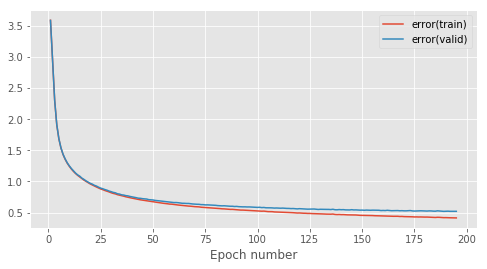

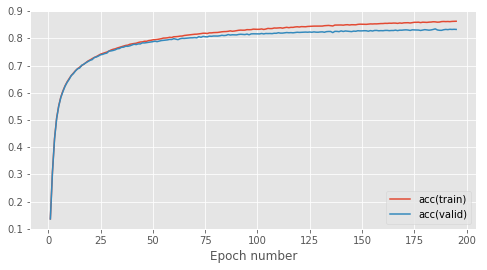

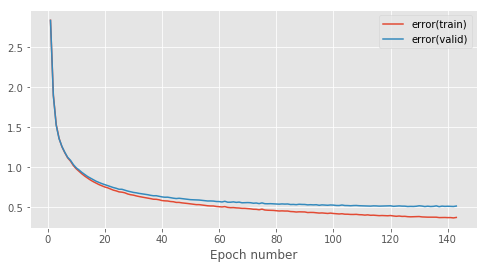

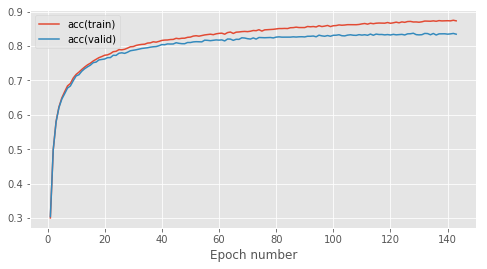

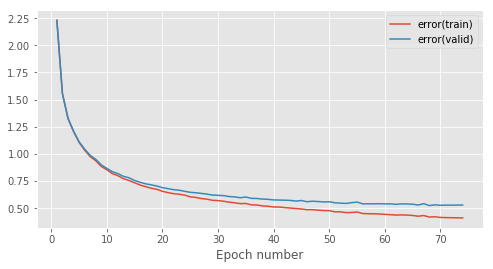

...

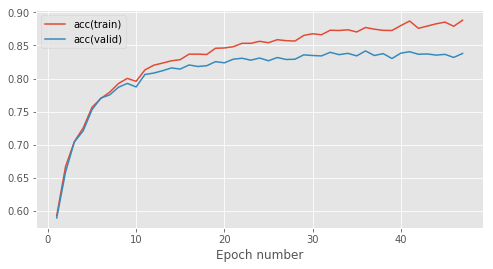

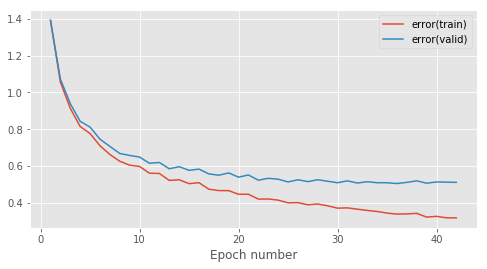

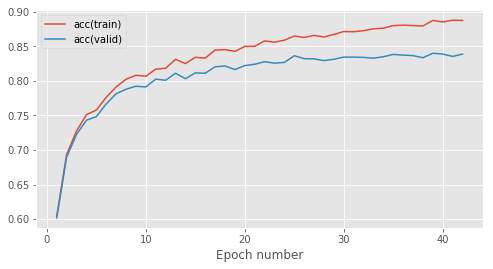

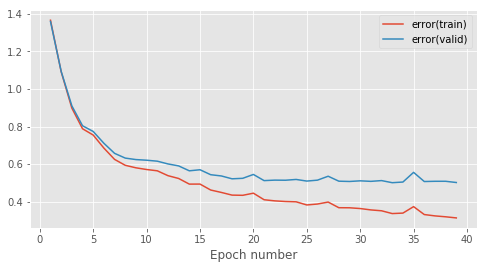

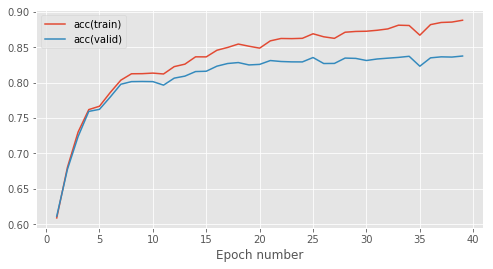

In [66]:
import importlib
import mlp
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
importlib.reload(mlp.optimisers)
importlib.reload(mlp.learning_rules)
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule


# Seed a random number generator
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 500
# Set up a logger object to print info about the training run to stdout
logger = logging.getLogger()
logger.setLevel(logging.INFO)
logger.handlers = [logging.StreamHandler()]

learning_rates=np.linspace(0.5e-4,5e-4,10)

results_learning_rms=[]

for learning_rate in learning_rates:

# Create data provider objects for the MNIST data set
    train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
    valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
    test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)


#setup hyperparameters
    num_epochs = 300
    stats_interval = 1
    input_dim, output_dim, hidden_dim = 784, 47, 100

    weights_init = GlorotUniformInit(rng=rng)
    biases_init = ConstantInit(0.)
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
        ReluLayer(),
        AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
    ])
 
    error = CrossEntropySoftmaxError()
# Use a basic gradient descent learning rule
    print(learning_rate)
    learning_rule = RMSPropLearningRule(learning_rate=learning_rate)

#Remember to use notebook=False when you write a script to be run in a terminal
    _RMS = train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval, notebook=True)
    results_learning_rms.append(_RMS)

In [58]:
np.linspace(5e-5,5e-4,10)

array([5.0e-05, 1.0e-04, 1.5e-04, 2.0e-04, 2.5e-04, 3.0e-04, 3.5e-04,
       4.0e-04, 4.5e-04, 5.0e-04])

In [61]:
5*1e-4

0.0005

In [62]:
5e-4

0.0005

In [63]:
np.linspace(1e-4,10e-4,10)

array([0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.0006, 0.0007, 0.0008,
       0.0009, 0.001 ])

In [86]:
times_RMS=[]
errors_RMS=[]
for result in results_learning_rms:
    times_RMS.append(result[-7])
    errors_RMS.append(result[0][result[-2]-1][2])

times_RMS[4]=times_RMS[3]

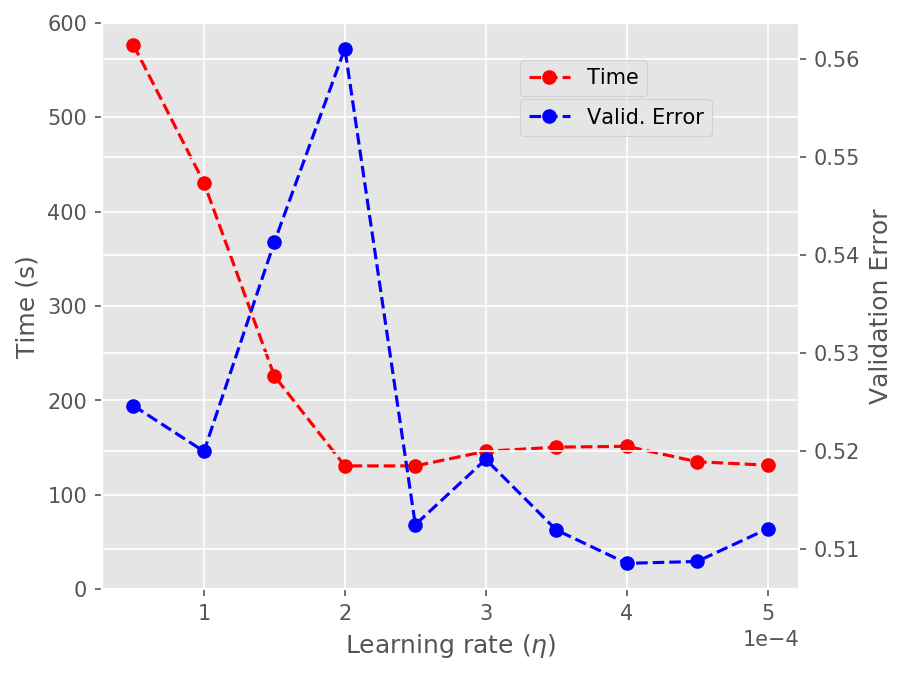

In [141]:
fig=plt.figure(figsize=(6,5),dpi=150)

ax1=fig.add_subplot(111)
ax2=ax1.twinx()
ax1.plot(learning_rates,times_RMS,"--o",c='r',label="Time")
ax2.plot(learning_rates,errors_RMS,'--o',c='b',label="Valid. Error")
ax1.set_ylim(0,600)
ax1.set_xlabel('Learning rate ($\eta$)')
ax1.set_ylabel('Time (s)')
ax2.set_ylabel('Validation Error')

ax1.legend(loc=(0.6,0.87))
ax2.legend(loc=(0.6,0.8))
ax1.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

fig.savefig("learning_rule_RMS.png")

KeysView(<numpy.lib.npyio.NpzFile object at 0x1571a97b8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1571a90f0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1290c7a20>)


Epoch 1: 2.2s to complete
    error(train)=1.37e+00, acc(train)=6.14e-01, error(valid)=1.38e+00, acc(valid)=6.13e-01


1


Epoch 2: 1.8s to complete
    error(train)=1.08e+00, acc(train)=6.89e-01, error(valid)=1.09e+00, acc(valid)=6.85e-01


2


Epoch 3: 1.9s to complete
    error(train)=9.78e-01, acc(train)=7.09e-01, error(valid)=9.95e-01, acc(valid)=7.06e-01


3


Epoch 4: 1.9s to complete
    error(train)=8.41e-01, acc(train)=7.50e-01, error(valid)=8.62e-01, acc(valid)=7.46e-01


4


Epoch 5: 1.9s to complete
    error(train)=7.64e-01, acc(train)=7.68e-01, error(valid)=7.89e-01, acc(valid)=7.65e-01


5


Epoch 6: 2.2s to complete
    error(train)=7.23e-01, acc(train)=7.78e-01, error(valid)=7.48e-01, acc(valid)=7.73e-01


6


Epoch 7: 1.9s to complete
    error(train)=6.90e-01, acc(train)=7.84e-01, error(valid)=7.21e-01, acc(valid)=7.76e-01


7


Epoch 8: 1.9s to complete
    error(train)=6.59e-01, acc(train)=7.96e-01, error(valid)=6.98e-01, acc(valid)=7.88e-01


8


Epoch 9: 1.9s to complete
    error(train)=6.30e-01, acc(train)=8.03e-01, error(valid)=6.71e-01, acc(valid)=7.93e-01


9


Epoch 10: 1.9s to complete
    error(train)=6.05e-01, acc(train)=8.07e-01, error(valid)=6.49e-01, acc(valid)=7.97e-01


10


Epoch 11: 1.9s to complete
    error(train)=5.97e-01, acc(train)=8.10e-01, error(valid)=6.45e-01, acc(valid)=7.99e-01


11


Epoch 12: 2.0s to complete
    error(train)=5.66e-01, acc(train)=8.21e-01, error(valid)=6.17e-01, acc(valid)=8.07e-01


12


Epoch 13: 1.9s to complete
    error(train)=5.36e-01, acc(train)=8.29e-01, error(valid)=5.92e-01, acc(valid)=8.12e-01


13


Epoch 14: 1.9s to complete
    error(train)=5.28e-01, acc(train)=8.29e-01, error(valid)=5.85e-01, acc(valid)=8.14e-01


14


Epoch 15: 1.9s to complete
    error(train)=5.23e-01, acc(train)=8.30e-01, error(valid)=5.93e-01, acc(valid)=8.12e-01


Epoch 16: 1.9s to complete
    error(train)=5.02e-01, acc(train)=8.36e-01, error(valid)=5.73e-01, acc(valid)=8.17e-01


16


Epoch 17: 1.9s to complete
    error(train)=4.86e-01, acc(train)=8.41e-01, error(valid)=5.61e-01, acc(valid)=8.18e-01


17


Epoch 18: 2.4s to complete
    error(train)=4.92e-01, acc(train)=8.38e-01, error(valid)=5.68e-01, acc(valid)=8.20e-01


Epoch 19: 1.9s to complete
    error(train)=4.69e-01, acc(train)=8.45e-01, error(valid)=5.55e-01, acc(valid)=8.21e-01


19


Epoch 20: 1.9s to complete
    error(train)=4.56e-01, acc(train)=8.48e-01, error(valid)=5.46e-01, acc(valid)=8.24e-01


20


Epoch 21: 1.8s to complete
    error(train)=4.51e-01, acc(train)=8.51e-01, error(valid)=5.45e-01, acc(valid)=8.22e-01


21


Epoch 22: 1.9s to complete
    error(train)=4.40e-01, acc(train)=8.53e-01, error(valid)=5.35e-01, acc(valid)=8.29e-01


22


Epoch 23: 1.9s to complete
    error(train)=4.33e-01, acc(train)=8.56e-01, error(valid)=5.35e-01, acc(valid)=8.27e-01


23


Epoch 24: 1.8s to complete
    error(train)=4.31e-01, acc(train)=8.55e-01, error(valid)=5.38e-01, acc(valid)=8.26e-01


Epoch 25: 1.9s to complete
    error(train)=4.23e-01, acc(train)=8.58e-01, error(valid)=5.32e-01, acc(valid)=8.27e-01


25


Epoch 26: 1.9s to complete
    error(train)=4.24e-01, acc(train)=8.57e-01, error(valid)=5.37e-01, acc(valid)=8.27e-01


Epoch 27: 1.9s to complete
    error(train)=4.08e-01, acc(train)=8.60e-01, error(valid)=5.29e-01, acc(valid)=8.27e-01


27


Epoch 28: 1.9s to complete
    error(train)=4.21e-01, acc(train)=8.52e-01, error(valid)=5.46e-01, acc(valid)=8.18e-01


Epoch 29: 1.9s to complete
    error(train)=3.97e-01, acc(train)=8.64e-01, error(valid)=5.21e-01, acc(valid)=8.32e-01


29


Epoch 30: 1.9s to complete
    error(train)=3.92e-01, acc(train)=8.66e-01, error(valid)=5.26e-01, acc(valid)=8.29e-01


Epoch 31: 1.9s to complete
    error(train)=3.79e-01, acc(train)=8.69e-01, error(valid)=5.15e-01, acc(valid)=8.33e-01


31


Epoch 32: 1.9s to complete
    error(train)=4.08e-01, acc(train)=8.60e-01, error(valid)=5.45e-01, acc(valid)=8.23e-01


Epoch 33: 1.9s to complete
    error(train)=3.69e-01, acc(train)=8.74e-01, error(valid)=5.10e-01, acc(valid)=8.34e-01


33


Epoch 34: 2.1s to complete
    error(train)=3.71e-01, acc(train)=8.73e-01, error(valid)=5.10e-01, acc(valid)=8.34e-01


34


Epoch 35: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.77e-01, error(valid)=5.05e-01, acc(valid)=8.36e-01


35


Epoch 36: 1.9s to complete
    error(train)=3.62e-01, acc(train)=8.74e-01, error(valid)=5.11e-01, acc(valid)=8.34e-01


Epoch 37: 2.2s to complete
    error(train)=3.82e-01, acc(train)=8.67e-01, error(valid)=5.39e-01, acc(valid)=8.27e-01


Epoch 38: 2.4s to complete
    error(train)=3.58e-01, acc(train)=8.76e-01, error(valid)=5.21e-01, acc(valid)=8.30e-01


Epoch 39: 2.3s to complete
    error(train)=3.62e-01, acc(train)=8.75e-01, error(valid)=5.31e-01, acc(valid)=8.30e-01


Epoch 40: 2.4s to complete
    error(train)=3.51e-01, acc(train)=8.78e-01, error(valid)=5.20e-01, acc(valid)=8.34e-01


Epoch 41: 2.2s to complete
    error(train)=3.35e-01, acc(train)=8.84e-01, error(valid)=5.10e-01, acc(valid)=8.36e-01


 hola



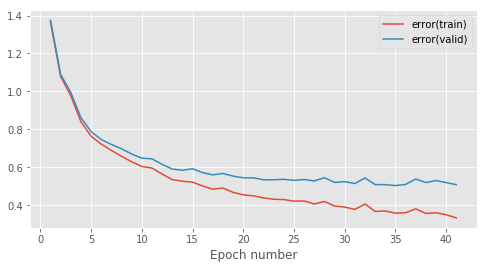

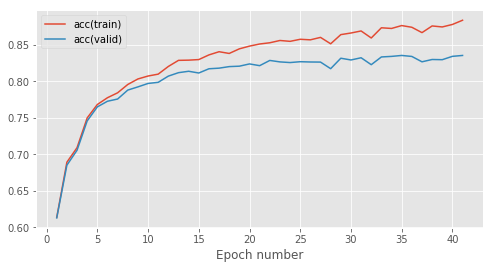

In [119]:
# Seed a random number generator
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 500
# Set up a logger object to print info about the training run to stdout
logger = logging.getLogger()
logger.setLevel(logging.INFO)
logger.handlers = [logging.StreamHandler()]

# Create data provider objects for the MNIST data set
train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)

import importlib
import mlp
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
importlib.reload(mlp.optimisers)
importlib.reload(mlp.learning_rules)
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule

#setup hyperparameters
num_epochs = 300
stats_interval = 1
input_dim, output_dim, hidden_dim = 784, 47, 100

weights_init = GlorotUniformInit(rng=rng)
biases_init = ConstantInit(0.)
model = MultipleLayerModel([
    AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
])
 
error = CrossEntropySoftmaxError()
# Use a basic gradient descent learning rule
learning_rule = RMSPropLearningRule(learning_rate=4*1e-4,beta=0.97)

#Remember to use notebook=False when you write a script to be run in a terminal
_RMS_Beta = train_model_and_plot_stats(
    model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval, notebook=True)

array([0.99 , 0.991, 0.992, 0.993, 0.994, 0.995, 0.996, 0.997, 0.998,
       0.999])

KeysView(<numpy.lib.npyio.NpzFile object at 0x12ca148d0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12ca148d0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12ca148d0>)
0.99


Epoch 1: 2.3s to complete
    error(train)=1.23e+00, acc(train)=6.47e-01, error(valid)=1.24e+00, acc(valid)=6.45e-01


1


Epoch 2: 2.0s to complete
    error(train)=9.82e-01, acc(train)=7.13e-01, error(valid)=9.95e-01, acc(valid)=7.09e-01


2


Epoch 3: 2.0s to complete
    error(train)=9.08e-01, acc(train)=7.28e-01, error(valid)=9.25e-01, acc(valid)=7.25e-01


3


Epoch 4: 1.9s to complete
    error(train)=7.80e-01, acc(train)=7.64e-01, error(valid)=8.01e-01, acc(valid)=7.60e-01


4


Epoch 5: 1.9s to complete
    error(train)=7.20e-01, acc(train)=7.79e-01, error(valid)=7.43e-01, acc(valid)=7.74e-01


5


Epoch 6: 2.0s to complete
    error(train)=6.92e-01, acc(train)=7.84e-01, error(valid)=7.16e-01, acc(valid)=7.79e-01


6


Epoch 7: 1.9s to complete
    error(train)=6.51e-01, acc(train)=7.95e-01, error(valid)=6.80e-01, acc(valid)=7.87e-01


7


Epoch 8: 1.9s to complete
    error(train)=6.37e-01, acc(train)=8.00e-01, error(valid)=6.81e-01, acc(valid)=7.90e-01


Epoch 9: 1.9s to complete
    error(train)=5.98e-01, acc(train)=8.12e-01, error(valid)=6.41e-01, acc(valid)=8.01e-01


9


Epoch 10: 1.9s to complete
    error(train)=5.69e-01, acc(train)=8.18e-01, error(valid)=6.14e-01, acc(valid)=8.06e-01


10


Epoch 11: 2.0s to complete
    error(train)=5.66e-01, acc(train)=8.18e-01, error(valid)=6.16e-01, acc(valid)=8.05e-01


Epoch 12: 2.3s to complete
    error(train)=5.35e-01, acc(train)=8.27e-01, error(valid)=5.89e-01, acc(valid)=8.14e-01


12


Epoch 13: 2.1s to complete
    error(train)=5.14e-01, acc(train)=8.34e-01, error(valid)=5.75e-01, acc(valid)=8.18e-01


13


Epoch 14: 2.0s to complete
    error(train)=5.02e-01, acc(train)=8.35e-01, error(valid)=5.65e-01, acc(valid)=8.17e-01


14


Epoch 15: 2.0s to complete
    error(train)=4.98e-01, acc(train)=8.37e-01, error(valid)=5.72e-01, acc(valid)=8.17e-01


Epoch 16: 2.0s to complete
    error(train)=4.92e-01, acc(train)=8.38e-01, error(valid)=5.67e-01, acc(valid)=8.19e-01


Epoch 17: 1.9s to complete
    error(train)=4.72e-01, acc(train)=8.45e-01, error(valid)=5.51e-01, acc(valid)=8.24e-01


17


Epoch 18: 1.9s to complete
    error(train)=4.63e-01, acc(train)=8.47e-01, error(valid)=5.42e-01, acc(valid)=8.28e-01


18


Epoch 19: 2.0s to complete
    error(train)=4.48e-01, acc(train)=8.50e-01, error(valid)=5.37e-01, acc(valid)=8.30e-01


19


Epoch 20: 2.6s to complete
    error(train)=4.45e-01, acc(train)=8.52e-01, error(valid)=5.38e-01, acc(valid)=8.29e-01


Epoch 21: 2.4s to complete
    error(train)=4.37e-01, acc(train)=8.54e-01, error(valid)=5.36e-01, acc(valid)=8.27e-01


21


Epoch 22: 2.1s to complete
    error(train)=4.27e-01, acc(train)=8.56e-01, error(valid)=5.28e-01, acc(valid)=8.30e-01


22


Epoch 23: 2.0s to complete
    error(train)=4.22e-01, acc(train)=8.57e-01, error(valid)=5.31e-01, acc(valid)=8.28e-01


Epoch 24: 1.9s to complete
    error(train)=4.17e-01, acc(train)=8.58e-01, error(valid)=5.31e-01, acc(valid)=8.29e-01


Epoch 25: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.65e-01, error(valid)=5.12e-01, acc(valid)=8.35e-01


25


Epoch 26: 1.9s to complete
    error(train)=4.04e-01, acc(train)=8.63e-01, error(valid)=5.21e-01, acc(valid)=8.30e-01


Epoch 27: 1.9s to complete
    error(train)=3.95e-01, acc(train)=8.63e-01, error(valid)=5.21e-01, acc(valid)=8.32e-01


Epoch 28: 2.0s to complete
    error(train)=3.97e-01, acc(train)=8.61e-01, error(valid)=5.24e-01, acc(valid)=8.27e-01


Epoch 29: 1.9s to complete
    error(train)=3.85e-01, acc(train)=8.68e-01, error(valid)=5.14e-01, acc(valid)=8.37e-01


Epoch 30: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.69e-01, error(valid)=5.16e-01, acc(valid)=8.36e-01


Epoch 31: 2.5s to complete
    error(train)=3.92e-01, acc(train)=8.63e-01, error(valid)=5.33e-01, acc(valid)=8.31e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x12d3319b0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d3319b0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d3319b0>)
0.991


Epoch 1: 2.4s to complete
    error(train)=1.23e+00, acc(train)=6.44e-01, error(valid)=1.24e+00, acc(valid)=6.39e-01


1


Epoch 2: 2.0s to complete
    error(train)=9.90e-01, acc(train)=7.06e-01, error(valid)=1.00e+00, acc(valid)=7.03e-01


2


Epoch 3: 1.9s to complete
    error(train)=8.62e-01, acc(train)=7.40e-01, error(valid)=8.83e-01, acc(valid)=7.35e-01


3


Epoch 4: 1.9s to complete
    error(train)=8.00e-01, acc(train)=7.56e-01, error(valid)=8.24e-01, acc(valid)=7.50e-01


4


Epoch 5: 1.9s to complete
    error(train)=7.30e-01, acc(train)=7.76e-01, error(valid)=7.54e-01, acc(valid)=7.70e-01


5


Epoch 6: 2.1s to complete
    error(train)=6.63e-01, acc(train)=7.94e-01, error(valid)=6.92e-01, acc(valid)=7.87e-01


6


Epoch 7: 2.6s to complete
    error(train)=6.42e-01, acc(train)=7.97e-01, error(valid)=6.76e-01, acc(valid)=7.91e-01


7


Epoch 8: 2.6s to complete
    error(train)=6.14e-01, acc(train)=8.06e-01, error(valid)=6.50e-01, acc(valid)=7.98e-01


8


Epoch 9: 2.7s to complete
    error(train)=5.82e-01, acc(train)=8.15e-01, error(valid)=6.26e-01, acc(valid)=8.05e-01


9


Epoch 10: 2.3s to complete
    error(train)=5.76e-01, acc(train)=8.14e-01, error(valid)=6.19e-01, acc(valid)=8.01e-01


10


Epoch 11: 2.2s to complete
    error(train)=5.47e-01, acc(train)=8.24e-01, error(valid)=5.96e-01, acc(valid)=8.08e-01


11


Epoch 12: 2.2s to complete
    error(train)=5.23e-01, acc(train)=8.30e-01, error(valid)=5.77e-01, acc(valid)=8.17e-01


12


Epoch 13: 2.3s to complete
    error(train)=5.14e-01, acc(train)=8.30e-01, error(valid)=5.73e-01, acc(valid)=8.15e-01


13


Epoch 14: 2.2s to complete
    error(train)=5.13e-01, acc(train)=8.32e-01, error(valid)=5.71e-01, acc(valid)=8.17e-01


14


Epoch 15: 2.3s to complete
    error(train)=4.86e-01, acc(train)=8.39e-01, error(valid)=5.51e-01, acc(valid)=8.22e-01


15


Epoch 16: 2.2s to complete
    error(train)=4.76e-01, acc(train)=8.43e-01, error(valid)=5.48e-01, acc(valid)=8.23e-01


16


Epoch 17: 2.2s to complete
    error(train)=4.65e-01, acc(train)=8.45e-01, error(valid)=5.42e-01, acc(valid)=8.26e-01


17


Epoch 18: 2.3s to complete
    error(train)=4.53e-01, acc(train)=8.50e-01, error(valid)=5.34e-01, acc(valid)=8.28e-01


18


Epoch 19: 2.2s to complete
    error(train)=4.50e-01, acc(train)=8.48e-01, error(valid)=5.32e-01, acc(valid)=8.25e-01


19


Epoch 20: 2.3s to complete
    error(train)=4.51e-01, acc(train)=8.47e-01, error(valid)=5.38e-01, acc(valid)=8.24e-01


Epoch 21: 2.3s to complete
    error(train)=4.30e-01, acc(train)=8.56e-01, error(valid)=5.21e-01, acc(valid)=8.31e-01


21


Epoch 22: 2.3s to complete
    error(train)=4.20e-01, acc(train)=8.58e-01, error(valid)=5.18e-01, acc(valid)=8.31e-01


22


Epoch 23: 2.2s to complete
    error(train)=4.17e-01, acc(train)=8.60e-01, error(valid)=5.14e-01, acc(valid)=8.31e-01


23


Epoch 24: 2.3s to complete
    error(train)=4.16e-01, acc(train)=8.58e-01, error(valid)=5.16e-01, acc(valid)=8.29e-01


Epoch 25: 2.3s to complete
    error(train)=4.00e-01, acc(train)=8.64e-01, error(valid)=5.04e-01, acc(valid)=8.38e-01


25


Epoch 26: 2.5s to complete
    error(train)=3.97e-01, acc(train)=8.65e-01, error(valid)=5.08e-01, acc(valid)=8.34e-01


Epoch 27: 2.3s to complete
    error(train)=3.99e-01, acc(train)=8.62e-01, error(valid)=5.14e-01, acc(valid)=8.35e-01


Epoch 28: 2.5s to complete
    error(train)=3.98e-01, acc(train)=8.62e-01, error(valid)=5.19e-01, acc(valid)=8.33e-01


Epoch 29: 2.8s to complete
    error(train)=3.97e-01, acc(train)=8.61e-01, error(valid)=5.26e-01, acc(valid)=8.27e-01


Epoch 30: 2.6s to complete
    error(train)=3.71e-01, acc(train)=8.71e-01, error(valid)=5.00e-01, acc(valid)=8.37e-01


30


Epoch 31: 2.4s to complete
    error(train)=3.82e-01, acc(train)=8.68e-01, error(valid)=5.16e-01, acc(valid)=8.31e-01


Epoch 32: 2.2s to complete
    error(train)=3.79e-01, acc(train)=8.70e-01, error(valid)=5.19e-01, acc(valid)=8.32e-01


Epoch 33: 2.3s to complete
    error(train)=3.65e-01, acc(train)=8.73e-01, error(valid)=5.08e-01, acc(valid)=8.35e-01


Epoch 34: 2.3s to complete
    error(train)=3.62e-01, acc(train)=8.73e-01, error(valid)=5.06e-01, acc(valid)=8.34e-01


Epoch 35: 2.2s to complete
    error(train)=3.54e-01, acc(train)=8.77e-01, error(valid)=5.07e-01, acc(valid)=8.39e-01


Epoch 36: 2.3s to complete
    error(train)=3.59e-01, acc(train)=8.74e-01, error(valid)=5.13e-01, acc(valid)=8.34e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x12d1e4b00>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d1e4c88>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d1e4c50>)
0.992


Epoch 1: 2.2s to complete
    error(train)=1.24e+00, acc(train)=6.45e-01, error(valid)=1.23e+00, acc(valid)=6.45e-01


1


Epoch 2: 2.2s to complete
    error(train)=1.00e+00, acc(train)=7.08e-01, error(valid)=1.01e+00, acc(valid)=7.10e-01


2


Epoch 3: 2.2s to complete
    error(train)=8.82e-01, acc(train)=7.36e-01, error(valid)=8.95e-01, acc(valid)=7.34e-01


3


Epoch 4: 2.2s to complete
    error(train)=8.03e-01, acc(train)=7.53e-01, error(valid)=8.21e-01, acc(valid)=7.51e-01


4


Epoch 5: 2.3s to complete
    error(train)=7.46e-01, acc(train)=7.71e-01, error(valid)=7.64e-01, acc(valid)=7.68e-01


5


Epoch 6: 2.3s to complete
    error(train)=7.11e-01, acc(train)=7.78e-01, error(valid)=7.37e-01, acc(valid)=7.72e-01


6


Epoch 7: 2.2s to complete
    error(train)=6.57e-01, acc(train)=7.96e-01, error(valid)=6.82e-01, acc(valid)=7.92e-01


7


Epoch 8: 2.2s to complete
    error(train)=6.38e-01, acc(train)=7.99e-01, error(valid)=6.69e-01, acc(valid)=7.90e-01


8


Epoch 9: 2.2s to complete
    error(train)=6.05e-01, acc(train)=8.09e-01, error(valid)=6.38e-01, acc(valid)=7.96e-01


9


Epoch 10: 2.2s to complete
    error(train)=5.96e-01, acc(train)=8.11e-01, error(valid)=6.30e-01, acc(valid)=8.01e-01


10


Epoch 11: 2.2s to complete
    error(train)=5.62e-01, acc(train)=8.19e-01, error(valid)=6.03e-01, acc(valid)=8.08e-01


11


Epoch 12: 2.2s to complete
    error(train)=5.66e-01, acc(train)=8.14e-01, error(valid)=6.12e-01, acc(valid)=8.00e-01


Epoch 13: 2.2s to complete
    error(train)=5.41e-01, acc(train)=8.25e-01, error(valid)=5.91e-01, acc(valid)=8.10e-01


13


Epoch 14: 2.2s to complete
    error(train)=5.14e-01, acc(train)=8.33e-01, error(valid)=5.69e-01, acc(valid)=8.16e-01


14


Epoch 15: 2.3s to complete
    error(train)=5.07e-01, acc(train)=8.36e-01, error(valid)=5.65e-01, acc(valid)=8.20e-01


15


Epoch 16: 2.2s to complete
    error(train)=5.06e-01, acc(train)=8.33e-01, error(valid)=5.70e-01, acc(valid)=8.14e-01


Epoch 17: 2.2s to complete
    error(train)=4.94e-01, acc(train)=8.36e-01, error(valid)=5.63e-01, acc(valid)=8.16e-01


17


Epoch 18: 2.2s to complete
    error(train)=4.85e-01, acc(train)=8.38e-01, error(valid)=5.58e-01, acc(valid)=8.19e-01


18


Epoch 19: 2.3s to complete
    error(train)=4.72e-01, acc(train)=8.43e-01, error(valid)=5.52e-01, acc(valid)=8.23e-01


19


Epoch 20: 2.2s to complete
    error(train)=4.66e-01, acc(train)=8.45e-01, error(valid)=5.47e-01, acc(valid)=8.23e-01


20


Epoch 21: 2.3s to complete
    error(train)=4.44e-01, acc(train)=8.52e-01, error(valid)=5.26e-01, acc(valid)=8.29e-01


21


Epoch 22: 2.3s to complete
    error(train)=4.50e-01, acc(train)=8.45e-01, error(valid)=5.38e-01, acc(valid)=8.25e-01


Epoch 23: 2.3s to complete
    error(train)=4.28e-01, acc(train)=8.57e-01, error(valid)=5.19e-01, acc(valid)=8.33e-01


23


Epoch 24: 2.3s to complete
    error(train)=4.21e-01, acc(train)=8.58e-01, error(valid)=5.18e-01, acc(valid)=8.32e-01


24


Epoch 25: 2.2s to complete
    error(train)=4.17e-01, acc(train)=8.59e-01, error(valid)=5.17e-01, acc(valid)=8.31e-01


25


Epoch 26: 2.6s to complete
    error(train)=4.17e-01, acc(train)=8.57e-01, error(valid)=5.22e-01, acc(valid)=8.29e-01


Epoch 27: 2.6s to complete
    error(train)=4.18e-01, acc(train)=8.57e-01, error(valid)=5.26e-01, acc(valid)=8.29e-01


Epoch 28: 2.3s to complete
    error(train)=3.98e-01, acc(train)=8.65e-01, error(valid)=5.06e-01, acc(valid)=8.34e-01


28


Epoch 29: 2.2s to complete
    error(train)=3.93e-01, acc(train)=8.66e-01, error(valid)=5.10e-01, acc(valid)=8.34e-01


Epoch 30: 2.3s to complete
    error(train)=3.94e-01, acc(train)=8.66e-01, error(valid)=5.15e-01, acc(valid)=8.33e-01


Epoch 31: 2.5s to complete
    error(train)=3.92e-01, acc(train)=8.65e-01, error(valid)=5.20e-01, acc(valid)=8.31e-01


Epoch 32: 2.6s to complete
    error(train)=3.76e-01, acc(train)=8.71e-01, error(valid)=5.04e-01, acc(valid)=8.36e-01


32


Epoch 33: 2.8s to complete
    error(train)=3.73e-01, acc(train)=8.72e-01, error(valid)=5.03e-01, acc(valid)=8.36e-01


33


Epoch 34: 2.3s to complete
    error(train)=3.66e-01, acc(train)=8.75e-01, error(valid)=5.01e-01, acc(valid)=8.37e-01


34


Epoch 35: 2.3s to complete
    error(train)=3.71e-01, acc(train)=8.71e-01, error(valid)=5.15e-01, acc(valid)=8.30e-01


Epoch 36: 2.5s to complete
    error(train)=3.79e-01, acc(train)=8.67e-01, error(valid)=5.27e-01, acc(valid)=8.29e-01


Epoch 37: 2.3s to complete
    error(train)=3.57e-01, acc(train)=8.76e-01, error(valid)=5.08e-01, acc(valid)=8.35e-01


Epoch 38: 2.3s to complete
    error(train)=3.60e-01, acc(train)=8.75e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


Epoch 39: 2.5s to complete
    error(train)=3.44e-01, acc(train)=8.80e-01, error(valid)=5.01e-01, acc(valid)=8.36e-01


Epoch 40: 2.5s to complete
    error(train)=3.57e-01, acc(train)=8.74e-01, error(valid)=5.21e-01, acc(valid)=8.32e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x12dab37b8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12dab37b8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12dab37b8>)
0.993


Epoch 1: 2.3s to complete
    error(train)=1.17e+00, acc(train)=6.61e-01, error(valid)=1.18e+00, acc(valid)=6.62e-01


1


Epoch 2: 2.3s to complete
    error(train)=9.69e-01, acc(train)=7.11e-01, error(valid)=9.82e-01, acc(valid)=7.07e-01


2


Epoch 3: 2.8s to complete
    error(train)=8.57e-01, acc(train)=7.39e-01, error(valid)=8.74e-01, acc(valid)=7.32e-01


3


Epoch 4: 2.5s to complete
    error(train)=7.63e-01, acc(train)=7.64e-01, error(valid)=7.85e-01, acc(valid)=7.58e-01


4


Epoch 5: 2.7s to complete
    error(train)=7.11e-01, acc(train)=7.78e-01, error(valid)=7.38e-01, acc(valid)=7.71e-01


5


Epoch 6: 2.7s to complete
    error(train)=6.75e-01, acc(train)=7.89e-01, error(valid)=7.04e-01, acc(valid)=7.82e-01


6


Epoch 7: 2.8s to complete
    error(train)=6.38e-01, acc(train)=7.93e-01, error(valid)=6.76e-01, acc(valid)=7.85e-01


7


Epoch 8: 2.3s to complete
    error(train)=6.17e-01, acc(train)=8.03e-01, error(valid)=6.61e-01, acc(valid)=7.88e-01


8


Epoch 9: 2.6s to complete
    error(train)=5.89e-01, acc(train)=8.07e-01, error(valid)=6.35e-01, acc(valid)=7.96e-01


9


Epoch 10: 2.3s to complete
    error(train)=5.51e-01, acc(train)=8.22e-01, error(valid)=6.01e-01, acc(valid)=8.08e-01


10


Epoch 11: 2.5s to complete
    error(train)=5.33e-01, acc(train)=8.28e-01, error(valid)=5.88e-01, acc(valid)=8.11e-01


11


Epoch 12: 2.5s to complete
    error(train)=5.24e-01, acc(train)=8.29e-01, error(valid)=5.84e-01, acc(valid)=8.12e-01


12


Epoch 13: 2.3s to complete
    error(train)=5.12e-01, acc(train)=8.34e-01, error(valid)=5.77e-01, acc(valid)=8.12e-01


13


Epoch 14: 2.5s to complete
    error(train)=4.91e-01, acc(train)=8.37e-01, error(valid)=5.62e-01, acc(valid)=8.18e-01


14


Epoch 15: 2.8s to complete
    error(train)=4.92e-01, acc(train)=8.37e-01, error(valid)=5.66e-01, acc(valid)=8.13e-01


Epoch 16: 3.2s to complete
    error(train)=4.74e-01, acc(train)=8.41e-01, error(valid)=5.52e-01, acc(valid)=8.17e-01


16


Epoch 17: 3.1s to complete
    error(train)=4.67e-01, acc(train)=8.45e-01, error(valid)=5.50e-01, acc(valid)=8.19e-01


17


Epoch 18: 2.7s to complete
    error(train)=4.58e-01, acc(train)=8.47e-01, error(valid)=5.43e-01, acc(valid)=8.23e-01


18


Epoch 19: 2.4s to complete
    error(train)=4.37e-01, acc(train)=8.54e-01, error(valid)=5.29e-01, acc(valid)=8.25e-01


19


Epoch 20: 2.5s to complete
    error(train)=4.64e-01, acc(train)=8.42e-01, error(valid)=5.55e-01, acc(valid)=8.15e-01


Epoch 21: 2.4s to complete
    error(train)=4.32e-01, acc(train)=8.52e-01, error(valid)=5.30e-01, acc(valid)=8.24e-01


Epoch 22: 2.3s to complete
    error(train)=4.23e-01, acc(train)=8.57e-01, error(valid)=5.25e-01, acc(valid)=8.27e-01


22


Epoch 23: 2.6s to complete
    error(train)=4.25e-01, acc(train)=8.55e-01, error(valid)=5.35e-01, acc(valid)=8.24e-01


Epoch 24: 3.2s to complete
    error(train)=4.06e-01, acc(train)=8.61e-01, error(valid)=5.21e-01, acc(valid)=8.29e-01


24


Epoch 25: 2.4s to complete
    error(train)=4.00e-01, acc(train)=8.63e-01, error(valid)=5.18e-01, acc(valid)=8.31e-01


25


Epoch 26: 2.3s to complete
    error(train)=4.14e-01, acc(train)=8.58e-01, error(valid)=5.30e-01, acc(valid)=8.26e-01


Epoch 27: 2.5s to complete
    error(train)=3.80e-01, acc(train)=8.71e-01, error(valid)=5.03e-01, acc(valid)=8.33e-01


27


Epoch 28: 2.5s to complete
    error(train)=3.84e-01, acc(train)=8.66e-01, error(valid)=5.11e-01, acc(valid)=8.30e-01


Epoch 29: 2.4s to complete
    error(train)=3.78e-01, acc(train)=8.71e-01, error(valid)=5.06e-01, acc(valid)=8.32e-01


Epoch 30: 2.9s to complete
    error(train)=3.72e-01, acc(train)=8.70e-01, error(valid)=5.08e-01, acc(valid)=8.31e-01


Epoch 31: 2.3s to complete
    error(train)=3.72e-01, acc(train)=8.70e-01, error(valid)=5.09e-01, acc(valid)=8.33e-01


Epoch 32: 2.3s to complete
    error(train)=3.71e-01, acc(train)=8.71e-01, error(valid)=5.12e-01, acc(valid)=8.32e-01


Epoch 33: 2.5s to complete
    error(train)=3.55e-01, acc(train)=8.77e-01, error(valid)=4.99e-01, acc(valid)=8.37e-01


33


Epoch 34: 2.6s to complete
    error(train)=3.56e-01, acc(train)=8.76e-01, error(valid)=5.04e-01, acc(valid)=8.35e-01


Epoch 35: 2.5s to complete
    error(train)=3.46e-01, acc(train)=8.79e-01, error(valid)=4.98e-01, acc(valid)=8.36e-01


35


Epoch 36: 2.8s to complete
    error(train)=3.42e-01, acc(train)=8.81e-01, error(valid)=4.98e-01, acc(valid)=8.38e-01


Epoch 37: 2.5s to complete
    error(train)=3.42e-01, acc(train)=8.80e-01, error(valid)=5.02e-01, acc(valid)=8.37e-01


Epoch 38: 2.7s to complete
    error(train)=3.36e-01, acc(train)=8.82e-01, error(valid)=5.03e-01, acc(valid)=8.39e-01


Epoch 39: 2.5s to complete
    error(train)=3.31e-01, acc(train)=8.83e-01, error(valid)=4.99e-01, acc(valid)=8.36e-01


Epoch 40: 2.5s to complete
    error(train)=3.47e-01, acc(train)=8.77e-01, error(valid)=5.18e-01, acc(valid)=8.35e-01


Epoch 41: 2.7s to complete
    error(train)=3.23e-01, acc(train)=8.86e-01, error(valid)=5.02e-01, acc(valid)=8.34e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x12dbdcd30>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12dbdceb8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12dbdce80>)
0.994


Epoch 1: 2.4s to complete
    error(train)=1.16e+00, acc(train)=6.61e-01, error(valid)=1.17e+00, acc(valid)=6.58e-01


1


Epoch 2: 2.4s to complete
    error(train)=9.63e-01, acc(train)=7.13e-01, error(valid)=9.71e-01, acc(valid)=7.11e-01


2


Epoch 3: 2.3s to complete
    error(train)=8.12e-01, acc(train)=7.54e-01, error(valid)=8.23e-01, acc(valid)=7.50e-01


3


Epoch 4: 2.4s to complete
    error(train)=7.50e-01, acc(train)=7.70e-01, error(valid)=7.67e-01, acc(valid)=7.66e-01


4


Epoch 5: 2.5s to complete
    error(train)=6.87e-01, acc(train)=7.87e-01, error(valid)=7.08e-01, acc(valid)=7.77e-01


5


Epoch 6: 2.5s to complete
    error(train)=6.56e-01, acc(train)=7.94e-01, error(valid)=6.83e-01, acc(valid)=7.83e-01


6


Epoch 7: 2.5s to complete
    error(train)=6.35e-01, acc(train)=7.98e-01, error(valid)=6.64e-01, acc(valid)=7.90e-01


7


Epoch 8: 2.4s to complete
    error(train)=5.93e-01, acc(train)=8.09e-01, error(valid)=6.28e-01, acc(valid)=8.00e-01


8


Epoch 9: 2.3s to complete
    error(train)=5.63e-01, acc(train)=8.18e-01, error(valid)=6.04e-01, acc(valid)=8.05e-01


9


Epoch 10: 2.3s to complete
    error(train)=5.52e-01, acc(train)=8.20e-01, error(valid)=5.98e-01, acc(valid)=8.07e-01


10


Epoch 11: 2.4s to complete
    error(train)=5.32e-01, acc(train)=8.27e-01, error(valid)=5.82e-01, acc(valid)=8.12e-01


11


Epoch 12: 2.0s to complete
    error(train)=5.21e-01, acc(train)=8.29e-01, error(valid)=5.79e-01, acc(valid)=8.13e-01


12


Epoch 13: 2.0s to complete
    error(train)=5.13e-01, acc(train)=8.31e-01, error(valid)=5.68e-01, acc(valid)=8.14e-01


13


Epoch 14: 1.9s to complete
    error(train)=4.85e-01, acc(train)=8.40e-01, error(valid)=5.51e-01, acc(valid)=8.21e-01


14


Epoch 15: 2.0s to complete
    error(train)=4.80e-01, acc(train)=8.41e-01, error(valid)=5.45e-01, acc(valid)=8.22e-01


15


Epoch 16: 1.9s to complete
    error(train)=4.65e-01, acc(train)=8.46e-01, error(valid)=5.36e-01, acc(valid)=8.25e-01


16


Epoch 17: 1.9s to complete
    error(train)=4.73e-01, acc(train)=8.41e-01, error(valid)=5.50e-01, acc(valid)=8.20e-01


Epoch 18: 1.9s to complete
    error(train)=4.47e-01, acc(train)=8.50e-01, error(valid)=5.30e-01, acc(valid)=8.25e-01


18


Epoch 19: 1.9s to complete
    error(train)=4.40e-01, acc(train)=8.52e-01, error(valid)=5.25e-01, acc(valid)=8.29e-01


19


Epoch 20: 1.9s to complete
    error(train)=4.34e-01, acc(train)=8.52e-01, error(valid)=5.21e-01, acc(valid)=8.26e-01


20


Epoch 21: 2.6s to complete
    error(train)=4.23e-01, acc(train)=8.57e-01, error(valid)=5.20e-01, acc(valid)=8.30e-01


21


Epoch 22: 2.6s to complete
    error(train)=4.13e-01, acc(train)=8.61e-01, error(valid)=5.12e-01, acc(valid)=8.31e-01


22


Epoch 23: 2.7s to complete
    error(train)=4.29e-01, acc(train)=8.53e-01, error(valid)=5.38e-01, acc(valid)=8.25e-01


Epoch 24: 2.2s to complete
    error(train)=4.06e-01, acc(train)=8.62e-01, error(valid)=5.19e-01, acc(valid)=8.30e-01


Epoch 25: 2.7s to complete
    error(train)=4.24e-01, acc(train)=8.56e-01, error(valid)=5.39e-01, acc(valid)=8.25e-01


Epoch 26: 2.8s to complete
    error(train)=3.96e-01, acc(train)=8.64e-01, error(valid)=5.15e-01, acc(valid)=8.30e-01


Epoch 27: 1.9s to complete
    error(train)=4.00e-01, acc(train)=8.62e-01, error(valid)=5.28e-01, acc(valid)=8.27e-01


Epoch 28: 1.9s to complete
    error(train)=3.99e-01, acc(train)=8.62e-01, error(valid)=5.27e-01, acc(valid)=8.25e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x12cf4c828>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12cf4c828>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12cf4c828>)
0.995


Epoch 1: 1.9s to complete
    error(train)=1.13e+00, acc(train)=6.75e-01, error(valid)=1.14e+00, acc(valid)=6.73e-01


1


Epoch 2: 1.9s to complete
    error(train)=9.32e-01, acc(train)=7.23e-01, error(valid)=9.42e-01, acc(valid)=7.18e-01


2


Epoch 3: 2.0s to complete
    error(train)=8.14e-01, acc(train)=7.54e-01, error(valid)=8.33e-01, acc(valid)=7.47e-01


3


Epoch 4: 1.9s to complete
    error(train)=7.45e-01, acc(train)=7.71e-01, error(valid)=7.68e-01, acc(valid)=7.64e-01


4


Epoch 5: 1.8s to complete
    error(train)=7.00e-01, acc(train)=7.82e-01, error(valid)=7.29e-01, acc(valid)=7.73e-01


5


Epoch 6: 1.8s to complete
    error(train)=6.55e-01, acc(train)=7.94e-01, error(valid)=6.87e-01, acc(valid)=7.84e-01


6


Epoch 7: 1.9s to complete
    error(train)=6.21e-01, acc(train)=8.05e-01, error(valid)=6.58e-01, acc(valid)=7.92e-01


7


Epoch 8: 1.8s to complete
    error(train)=5.92e-01, acc(train)=8.11e-01, error(valid)=6.34e-01, acc(valid)=7.98e-01


8


Epoch 9: 1.8s to complete
    error(train)=5.72e-01, acc(train)=8.16e-01, error(valid)=6.21e-01, acc(valid)=8.02e-01


9


Epoch 10: 1.8s to complete
    error(train)=5.50e-01, acc(train)=8.23e-01, error(valid)=6.00e-01, acc(valid)=8.08e-01


10


Epoch 11: 1.8s to complete
    error(train)=5.43e-01, acc(train)=8.24e-01, error(valid)=5.97e-01, acc(valid)=8.07e-01


11


Epoch 12: 1.9s to complete
    error(train)=5.26e-01, acc(train)=8.28e-01, error(valid)=5.86e-01, acc(valid)=8.12e-01


12


Epoch 13: 1.9s to complete
    error(train)=5.10e-01, acc(train)=8.28e-01, error(valid)=5.71e-01, acc(valid)=8.09e-01


13


Epoch 14: 2.1s to complete
    error(train)=4.87e-01, acc(train)=8.41e-01, error(valid)=5.57e-01, acc(valid)=8.21e-01


14


Epoch 15: 2.0s to complete
    error(train)=4.84e-01, acc(train)=8.39e-01, error(valid)=5.57e-01, acc(valid)=8.19e-01


15


Epoch 16: 1.8s to complete
    error(train)=4.80e-01, acc(train)=8.37e-01, error(valid)=5.55e-01, acc(valid)=8.17e-01


16


Epoch 17: 1.9s to complete
    error(train)=4.55e-01, acc(train)=8.49e-01, error(valid)=5.36e-01, acc(valid)=8.27e-01


17


Epoch 18: 1.8s to complete
    error(train)=4.46e-01, acc(train)=8.51e-01, error(valid)=5.32e-01, acc(valid)=8.25e-01


18


Epoch 19: 1.9s to complete
    error(train)=4.39e-01, acc(train)=8.52e-01, error(valid)=5.28e-01, acc(valid)=8.28e-01


19


Epoch 20: 1.8s to complete
    error(train)=4.52e-01, acc(train)=8.46e-01, error(valid)=5.45e-01, acc(valid)=8.24e-01


Epoch 21: 1.8s to complete
    error(train)=4.25e-01, acc(train)=8.56e-01, error(valid)=5.20e-01, acc(valid)=8.30e-01


21


Epoch 22: 1.8s to complete
    error(train)=4.12e-01, acc(train)=8.62e-01, error(valid)=5.12e-01, acc(valid)=8.32e-01


22


Epoch 23: 1.8s to complete
    error(train)=4.16e-01, acc(train)=8.58e-01, error(valid)=5.21e-01, acc(valid)=8.30e-01


Epoch 24: 1.8s to complete
    error(train)=4.21e-01, acc(train)=8.57e-01, error(valid)=5.35e-01, acc(valid)=8.26e-01


Epoch 25: 2.3s to complete
    error(train)=4.07e-01, acc(train)=8.59e-01, error(valid)=5.20e-01, acc(valid)=8.29e-01


Epoch 26: 2.4s to complete
    error(train)=3.96e-01, acc(train)=8.63e-01, error(valid)=5.20e-01, acc(valid)=8.27e-01


Epoch 27: 2.4s to complete
    error(train)=3.81e-01, acc(train)=8.69e-01, error(valid)=5.05e-01, acc(valid)=8.34e-01


27


Epoch 28: 2.4s to complete
    error(train)=4.06e-01, acc(train)=8.58e-01, error(valid)=5.38e-01, acc(valid)=8.21e-01


Epoch 29: 2.3s to complete
    error(train)=3.95e-01, acc(train)=8.62e-01, error(valid)=5.28e-01, acc(valid)=8.26e-01


Epoch 30: 2.5s to complete
    error(train)=3.74e-01, acc(train)=8.71e-01, error(valid)=5.07e-01, acc(valid)=8.35e-01


Epoch 31: 2.5s to complete
    error(train)=3.68e-01, acc(train)=8.70e-01, error(valid)=5.08e-01, acc(valid)=8.31e-01


Epoch 32: 2.3s to complete
    error(train)=3.66e-01, acc(train)=8.74e-01, error(valid)=5.14e-01, acc(valid)=8.32e-01


Epoch 33: 2.4s to complete
    error(train)=3.55e-01, acc(train)=8.75e-01, error(valid)=4.99e-01, acc(valid)=8.32e-01


33


Epoch 34: 2.3s to complete
    error(train)=3.51e-01, acc(train)=8.78e-01, error(valid)=5.04e-01, acc(valid)=8.36e-01


Epoch 35: 2.3s to complete
    error(train)=3.49e-01, acc(train)=8.78e-01, error(valid)=5.08e-01, acc(valid)=8.38e-01


Epoch 36: 2.4s to complete
    error(train)=3.45e-01, acc(train)=8.79e-01, error(valid)=5.03e-01, acc(valid)=8.36e-01


Epoch 37: 2.3s to complete
    error(train)=3.50e-01, acc(train)=8.76e-01, error(valid)=5.14e-01, acc(valid)=8.33e-01


Epoch 38: 2.3s to complete
    error(train)=3.56e-01, acc(train)=8.74e-01, error(valid)=5.21e-01, acc(valid)=8.33e-01


Epoch 39: 2.8s to complete
    error(train)=3.26e-01, acc(train)=8.86e-01, error(valid)=4.99e-01, acc(valid)=8.39e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x12e446f60>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12e446b70>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12e446f60>)
0.996


Epoch 1: 1.8s to complete
    error(train)=1.15e+00, acc(train)=6.67e-01, error(valid)=1.16e+00, acc(valid)=6.60e-01


1


Epoch 2: 1.8s to complete
    error(train)=9.20e-01, acc(train)=7.26e-01, error(valid)=9.41e-01, acc(valid)=7.19e-01


2


Epoch 3: 1.9s to complete
    error(train)=8.25e-01, acc(train)=7.50e-01, error(valid)=8.49e-01, acc(valid)=7.43e-01


3


Epoch 4: 1.9s to complete
    error(train)=7.40e-01, acc(train)=7.72e-01, error(valid)=7.68e-01, acc(valid)=7.63e-01


4


Epoch 5: 1.8s to complete
    error(train)=6.97e-01, acc(train)=7.82e-01, error(valid)=7.32e-01, acc(valid)=7.72e-01


5


Epoch 6: 2.0s to complete
    error(train)=6.55e-01, acc(train)=7.93e-01, error(valid)=6.91e-01, acc(valid)=7.82e-01


6


Epoch 7: 1.9s to complete
    error(train)=6.16e-01, acc(train)=8.06e-01, error(valid)=6.51e-01, acc(valid)=7.94e-01


7


Epoch 8: 1.9s to complete
    error(train)=6.06e-01, acc(train)=8.06e-01, error(valid)=6.51e-01, acc(valid)=7.95e-01


8


Epoch 9: 2.4s to complete
    error(train)=5.69e-01, acc(train)=8.18e-01, error(valid)=6.14e-01, acc(valid)=8.04e-01


9


Epoch 10: 2.3s to complete
    error(train)=5.47e-01, acc(train)=8.25e-01, error(valid)=5.94e-01, acc(valid)=8.12e-01


10


Epoch 11: 2.4s to complete
    error(train)=5.55e-01, acc(train)=8.18e-01, error(valid)=6.14e-01, acc(valid)=8.02e-01


Epoch 12: 2.3s to complete
    error(train)=5.19e-01, acc(train)=8.30e-01, error(valid)=5.79e-01, acc(valid)=8.15e-01


12


Epoch 13: 2.3s to complete
    error(train)=4.97e-01, acc(train)=8.38e-01, error(valid)=5.64e-01, acc(valid)=8.21e-01


13


Epoch 14: 2.3s to complete
    error(train)=4.95e-01, acc(train)=8.37e-01, error(valid)=5.69e-01, acc(valid)=8.16e-01


Epoch 15: 2.6s to complete
    error(train)=4.66e-01, acc(train)=8.46e-01, error(valid)=5.43e-01, acc(valid)=8.24e-01


15


Epoch 16: 2.1s to complete
    error(train)=4.70e-01, acc(train)=8.40e-01, error(valid)=5.56e-01, acc(valid)=8.18e-01


Epoch 17: 2.0s to complete
    error(train)=4.52e-01, acc(train)=8.50e-01, error(valid)=5.36e-01, acc(valid)=8.25e-01


17


Epoch 18: 2.1s to complete
    error(train)=4.40e-01, acc(train)=8.52e-01, error(valid)=5.28e-01, acc(valid)=8.30e-01


18


Epoch 19: 2.1s to complete
    error(train)=4.29e-01, acc(train)=8.56e-01, error(valid)=5.24e-01, acc(valid)=8.31e-01


19


Epoch 20: 2.3s to complete
    error(train)=4.23e-01, acc(train)=8.58e-01, error(valid)=5.25e-01, acc(valid)=8.30e-01


Epoch 21: 1.9s to complete
    error(train)=4.19e-01, acc(train)=8.60e-01, error(valid)=5.18e-01, acc(valid)=8.33e-01


21


Epoch 22: 2.0s to complete
    error(train)=4.18e-01, acc(train)=8.57e-01, error(valid)=5.25e-01, acc(valid)=8.29e-01


Epoch 23: 2.0s to complete
    error(train)=4.00e-01, acc(train)=8.65e-01, error(valid)=5.13e-01, acc(valid)=8.35e-01


23


Epoch 24: 2.0s to complete
    error(train)=4.10e-01, acc(train)=8.61e-01, error(valid)=5.28e-01, acc(valid)=8.30e-01


Epoch 25: 2.1s to complete
    error(train)=3.99e-01, acc(train)=8.64e-01, error(valid)=5.18e-01, acc(valid)=8.31e-01


Epoch 26: 2.5s to complete
    error(train)=3.79e-01, acc(train)=8.71e-01, error(valid)=4.99e-01, acc(valid)=8.38e-01


26


Epoch 27: 2.4s to complete
    error(train)=3.85e-01, acc(train)=8.67e-01, error(valid)=5.04e-01, acc(valid)=8.35e-01


Epoch 28: 2.6s to complete
    error(train)=3.84e-01, acc(train)=8.68e-01, error(valid)=5.14e-01, acc(valid)=8.36e-01


Epoch 29: 2.4s to complete
    error(train)=3.70e-01, acc(train)=8.73e-01, error(valid)=5.06e-01, acc(valid)=8.36e-01


Epoch 30: 2.5s to complete
    error(train)=3.70e-01, acc(train)=8.72e-01, error(valid)=5.13e-01, acc(valid)=8.36e-01


Epoch 31: 2.3s to complete
    error(train)=3.57e-01, acc(train)=8.75e-01, error(valid)=4.98e-01, acc(valid)=8.36e-01


31


Epoch 32: 2.5s to complete
    error(train)=3.56e-01, acc(train)=8.76e-01, error(valid)=5.01e-01, acc(valid)=8.39e-01


Epoch 33: 2.7s to complete
    error(train)=3.55e-01, acc(train)=8.77e-01, error(valid)=5.03e-01, acc(valid)=8.40e-01


Epoch 34: 2.3s to complete
    error(train)=3.45e-01, acc(train)=8.80e-01, error(valid)=4.99e-01, acc(valid)=8.40e-01


Epoch 35: 2.3s to complete
    error(train)=3.44e-01, acc(train)=8.79e-01, error(valid)=5.01e-01, acc(valid)=8.36e-01


Epoch 36: 2.3s to complete
    error(train)=3.47e-01, acc(train)=8.79e-01, error(valid)=5.05e-01, acc(valid)=8.37e-01


Epoch 37: 2.4s to complete
    error(train)=3.38e-01, acc(train)=8.81e-01, error(valid)=5.05e-01, acc(valid)=8.37e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x12d227668>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d227668>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d227668>)
0.997


Epoch 1: 2.4s to complete
    error(train)=1.09e+00, acc(train)=6.86e-01, error(valid)=1.10e+00, acc(valid)=6.79e-01


1


Epoch 2: 2.1s to complete
    error(train)=8.69e-01, acc(train)=7.39e-01, error(valid)=8.84e-01, acc(valid)=7.35e-01


2


Epoch 3: 1.9s to complete
    error(train)=7.78e-01, acc(train)=7.62e-01, error(valid)=7.91e-01, acc(valid)=7.59e-01


3


Epoch 4: 2.7s to complete
    error(train)=7.21e-01, acc(train)=7.77e-01, error(valid)=7.43e-01, acc(valid)=7.66e-01


4


Epoch 5: 2.4s to complete
    error(train)=6.61e-01, acc(train)=7.95e-01, error(valid)=6.86e-01, acc(valid)=7.89e-01


5


Epoch 6: 2.3s to complete
    error(train)=6.33e-01, acc(train)=8.00e-01, error(valid)=6.66e-01, acc(valid)=7.89e-01


6


Epoch 7: 2.3s to complete
    error(train)=6.16e-01, acc(train)=8.04e-01, error(valid)=6.54e-01, acc(valid)=7.93e-01


7


Epoch 8: 2.3s to complete
    error(train)=5.87e-01, acc(train)=8.12e-01, error(valid)=6.24e-01, acc(valid)=8.03e-01


8


Epoch 9: 2.4s to complete
    error(train)=5.47e-01, acc(train)=8.26e-01, error(valid)=5.90e-01, acc(valid)=8.12e-01


9


Epoch 10: 2.6s to complete
    error(train)=5.41e-01, acc(train)=8.22e-01, error(valid)=5.92e-01, acc(valid)=8.06e-01


Epoch 11: 2.4s to complete
    error(train)=5.32e-01, acc(train)=8.26e-01, error(valid)=5.86e-01, acc(valid)=8.11e-01


11


Epoch 12: 2.1s to complete
    error(train)=5.07e-01, acc(train)=8.33e-01, error(valid)=5.61e-01, acc(valid)=8.17e-01


12


Epoch 13: 2.4s to complete
    error(train)=4.86e-01, acc(train)=8.41e-01, error(valid)=5.52e-01, acc(valid)=8.21e-01


13


Epoch 14: 2.0s to complete
    error(train)=4.84e-01, acc(train)=8.40e-01, error(valid)=5.53e-01, acc(valid)=8.21e-01


Epoch 15: 2.0s to complete
    error(train)=4.98e-01, acc(train)=8.33e-01, error(valid)=5.72e-01, acc(valid)=8.12e-01


Epoch 16: 1.9s to complete
    error(train)=4.61e-01, acc(train)=8.46e-01, error(valid)=5.36e-01, acc(valid)=8.24e-01


16


Epoch 17: 2.0s to complete
    error(train)=4.49e-01, acc(train)=8.50e-01, error(valid)=5.32e-01, acc(valid)=8.24e-01


17


Epoch 18: 2.0s to complete
    error(train)=4.37e-01, acc(train)=8.54e-01, error(valid)=5.23e-01, acc(valid)=8.28e-01


18


Epoch 19: 2.0s to complete
    error(train)=4.43e-01, acc(train)=8.51e-01, error(valid)=5.36e-01, acc(valid)=8.24e-01


Epoch 20: 2.2s to complete
    error(train)=4.21e-01, acc(train)=8.57e-01, error(valid)=5.18e-01, acc(valid)=8.30e-01


20


Epoch 21: 2.4s to complete
    error(train)=4.44e-01, acc(train)=8.47e-01, error(valid)=5.46e-01, acc(valid)=8.19e-01


Epoch 22: 2.3s to complete
    error(train)=4.17e-01, acc(train)=8.58e-01, error(valid)=5.16e-01, acc(valid)=8.30e-01


22


Epoch 23: 2.4s to complete
    error(train)=3.96e-01, acc(train)=8.65e-01, error(valid)=5.04e-01, acc(valid)=8.32e-01


23


Epoch 24: 2.5s to complete
    error(train)=3.90e-01, acc(train)=8.67e-01, error(valid)=5.01e-01, acc(valid)=8.35e-01


24


Epoch 25: 2.4s to complete
    error(train)=3.91e-01, acc(train)=8.66e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


Epoch 26: 2.5s to complete
    error(train)=3.91e-01, acc(train)=8.64e-01, error(valid)=5.13e-01, acc(valid)=8.30e-01


Epoch 27: 2.4s to complete
    error(train)=3.68e-01, acc(train)=8.74e-01, error(valid)=4.92e-01, acc(valid)=8.39e-01


27


Epoch 28: 2.4s to complete
    error(train)=3.71e-01, acc(train)=8.71e-01, error(valid)=4.97e-01, acc(valid)=8.34e-01


Epoch 29: 2.4s to complete
    error(train)=3.62e-01, acc(train)=8.75e-01, error(valid)=4.97e-01, acc(valid)=8.37e-01


Epoch 30: 2.4s to complete
    error(train)=3.60e-01, acc(train)=8.75e-01, error(valid)=4.99e-01, acc(valid)=8.36e-01


Epoch 31: 2.4s to complete
    error(train)=3.61e-01, acc(train)=8.74e-01, error(valid)=5.04e-01, acc(valid)=8.34e-01


Epoch 32: 2.4s to complete
    error(train)=3.53e-01, acc(train)=8.78e-01, error(valid)=4.94e-01, acc(valid)=8.38e-01


Epoch 33: 2.4s to complete
    error(train)=3.51e-01, acc(train)=8.78e-01, error(valid)=5.03e-01, acc(valid)=8.36e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x12e00bac8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12e00bc50>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12e00bc18>)
0.998


Epoch 1: 2.3s to complete
    error(train)=9.86e-01, acc(train)=7.06e-01, error(valid)=9.96e-01, acc(valid)=7.01e-01


1


Epoch 2: 2.1s to complete
    error(train)=7.95e-01, acc(train)=7.57e-01, error(valid)=8.11e-01, acc(valid)=7.49e-01


2


Epoch 3: 2.0s to complete
    error(train)=7.14e-01, acc(train)=7.78e-01, error(valid)=7.40e-01, acc(valid)=7.70e-01


3


Epoch 4: 2.0s to complete
    error(train)=6.49e-01, acc(train)=7.96e-01, error(valid)=6.80e-01, acc(valid)=7.88e-01


4


Epoch 5: 1.9s to complete
    error(train)=6.12e-01, acc(train)=8.05e-01, error(valid)=6.49e-01, acc(valid)=7.94e-01


5


Epoch 6: 2.0s to complete
    error(train)=5.89e-01, acc(train)=8.11e-01, error(valid)=6.32e-01, acc(valid)=7.99e-01


6


Epoch 7: 1.9s to complete
    error(train)=5.57e-01, acc(train)=8.20e-01, error(valid)=6.04e-01, acc(valid)=8.04e-01


7


Epoch 8: 1.9s to complete
    error(train)=5.25e-01, acc(train)=8.29e-01, error(valid)=5.76e-01, acc(valid)=8.14e-01


8


Epoch 9: 1.9s to complete
    error(train)=5.07e-01, acc(train)=8.33e-01, error(valid)=5.66e-01, acc(valid)=8.18e-01


9


Epoch 10: 1.9s to complete
    error(train)=5.13e-01, acc(train)=8.31e-01, error(valid)=5.73e-01, acc(valid)=8.14e-01


Epoch 11: 1.9s to complete
    error(train)=4.83e-01, acc(train)=8.38e-01, error(valid)=5.51e-01, acc(valid)=8.20e-01


11


Epoch 12: 1.9s to complete
    error(train)=4.73e-01, acc(train)=8.41e-01, error(valid)=5.42e-01, acc(valid)=8.21e-01


12


Epoch 13: 1.9s to complete
    error(train)=4.61e-01, acc(train)=8.47e-01, error(valid)=5.37e-01, acc(valid)=8.23e-01


13


Epoch 14: 1.9s to complete
    error(train)=4.44e-01, acc(train)=8.51e-01, error(valid)=5.25e-01, acc(valid)=8.28e-01


14


Epoch 15: 1.9s to complete
    error(train)=4.40e-01, acc(train)=8.51e-01, error(valid)=5.25e-01, acc(valid)=8.26e-01


Epoch 16: 1.9s to complete
    error(train)=4.24e-01, acc(train)=8.58e-01, error(valid)=5.14e-01, acc(valid)=8.32e-01


16


Epoch 17: 2.0s to complete
    error(train)=4.28e-01, acc(train)=8.55e-01, error(valid)=5.19e-01, acc(valid)=8.30e-01


Epoch 18: 1.9s to complete
    error(train)=4.08e-01, acc(train)=8.61e-01, error(valid)=5.02e-01, acc(valid)=8.35e-01


18


Epoch 19: 1.9s to complete
    error(train)=4.01e-01, acc(train)=8.63e-01, error(valid)=5.01e-01, acc(valid)=8.33e-01


19


Epoch 20: 1.9s to complete
    error(train)=3.89e-01, acc(train)=8.67e-01, error(valid)=4.97e-01, acc(valid)=8.38e-01


20


Epoch 21: 1.9s to complete
    error(train)=3.95e-01, acc(train)=8.64e-01, error(valid)=5.08e-01, acc(valid)=8.34e-01


Epoch 22: 2.0s to complete
    error(train)=3.88e-01, acc(train)=8.66e-01, error(valid)=5.06e-01, acc(valid)=8.31e-01


Epoch 23: 2.7s to complete
    error(train)=3.81e-01, acc(train)=8.68e-01, error(valid)=5.01e-01, acc(valid)=8.35e-01


Epoch 24: 2.4s to complete
    error(train)=3.84e-01, acc(train)=8.67e-01, error(valid)=5.09e-01, acc(valid)=8.33e-01


Epoch 25: 2.5s to complete
    error(train)=3.62e-01, acc(train)=8.74e-01, error(valid)=4.91e-01, acc(valid)=8.39e-01


25


Epoch 26: 2.4s to complete
    error(train)=3.57e-01, acc(train)=8.76e-01, error(valid)=4.91e-01, acc(valid)=8.40e-01


Epoch 27: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.76e-01, error(valid)=4.95e-01, acc(valid)=8.40e-01


Epoch 28: 1.9s to complete
    error(train)=3.52e-01, acc(train)=8.77e-01, error(valid)=4.94e-01, acc(valid)=8.37e-01


Epoch 29: 1.9s to complete
    error(train)=3.45e-01, acc(train)=8.80e-01, error(valid)=4.90e-01, acc(valid)=8.40e-01


29


Epoch 30: 1.9s to complete
    error(train)=3.47e-01, acc(train)=8.79e-01, error(valid)=4.96e-01, acc(valid)=8.42e-01


Epoch 31: 2.6s to complete
    error(train)=3.38e-01, acc(train)=8.81e-01, error(valid)=4.92e-01, acc(valid)=8.41e-01


Epoch 32: 2.5s to complete
    error(train)=3.25e-01, acc(train)=8.87e-01, error(valid)=4.84e-01, acc(valid)=8.45e-01


32


Epoch 33: 1.9s to complete
    error(train)=3.54e-01, acc(train)=8.73e-01, error(valid)=5.20e-01, acc(valid)=8.31e-01


Epoch 34: 1.9s to complete
    error(train)=3.24e-01, acc(train)=8.85e-01, error(valid)=4.93e-01, acc(valid)=8.39e-01


Epoch 35: 1.9s to complete
    error(train)=3.37e-01, acc(train)=8.81e-01, error(valid)=5.03e-01, acc(valid)=8.37e-01


Epoch 36: 2.4s to complete
    error(train)=3.17e-01, acc(train)=8.88e-01, error(valid)=4.92e-01, acc(valid)=8.40e-01


Epoch 37: 2.7s to complete
    error(train)=3.13e-01, acc(train)=8.90e-01, error(valid)=4.91e-01, acc(valid)=8.40e-01


Epoch 38: 2.6s to complete
    error(train)=3.16e-01, acc(train)=8.86e-01, error(valid)=5.01e-01, acc(valid)=8.40e-01


 hola

KeysView(<numpy.lib.npyio.NpzFile object at 0x12e986f28>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12e986f28>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12e986f28>)
0.999


Epoch 1: 2.1s to complete
    error(train)=9.07e-01, acc(train)=7.24e-01, error(valid)=9.16e-01, acc(valid)=7.21e-01


1


Epoch 2: 2.1s to complete
    error(train)=7.15e-01, acc(train)=7.75e-01, error(valid)=7.37e-01, acc(valid)=7.66e-01


2


Epoch 3: 2.0s to complete
    error(train)=6.51e-01, acc(train)=7.91e-01, error(valid)=6.83e-01, acc(valid)=7.81e-01


3


Epoch 4: 2.0s to complete
    error(train)=5.83e-01, acc(train)=8.14e-01, error(valid)=6.21e-01, acc(valid)=8.03e-01


4


Epoch 5: 1.9s to complete
    error(train)=5.50e-01, acc(train)=8.21e-01, error(valid)=5.98e-01, acc(valid)=8.10e-01


5


Epoch 6: 1.9s to complete
    error(train)=5.27e-01, acc(train)=8.26e-01, error(valid)=5.81e-01, acc(valid)=8.11e-01


6


Epoch 7: 1.9s to complete
    error(train)=5.01e-01, acc(train)=8.36e-01, error(valid)=5.63e-01, acc(valid)=8.16e-01


7


Epoch 8: 1.9s to complete
    error(train)=4.94e-01, acc(train)=8.36e-01, error(valid)=5.61e-01, acc(valid)=8.17e-01


8


Epoch 9: 1.9s to complete
    error(train)=4.84e-01, acc(train)=8.39e-01, error(valid)=5.58e-01, acc(valid)=8.21e-01


9


Epoch 10: 1.9s to complete
    error(train)=4.67e-01, acc(train)=8.44e-01, error(valid)=5.49e-01, acc(valid)=8.23e-01


10


Epoch 11: 1.9s to complete
    error(train)=4.41e-01, acc(train)=8.52e-01, error(valid)=5.24e-01, acc(valid)=8.27e-01


11


Epoch 12: 1.9s to complete
    error(train)=4.28e-01, acc(train)=8.57e-01, error(valid)=5.19e-01, acc(valid)=8.31e-01


12


Epoch 13: 1.9s to complete
    error(train)=4.32e-01, acc(train)=8.53e-01, error(valid)=5.28e-01, acc(valid)=8.27e-01


Epoch 14: 1.9s to complete
    error(train)=4.13e-01, acc(train)=8.60e-01, error(valid)=5.14e-01, acc(valid)=8.32e-01


14


Epoch 15: 2.0s to complete
    error(train)=4.00e-01, acc(train)=8.64e-01, error(valid)=5.04e-01, acc(valid)=8.35e-01


15


Epoch 16: 2.0s to complete
    error(train)=3.97e-01, acc(train)=8.65e-01, error(valid)=5.10e-01, acc(valid)=8.38e-01


Epoch 17: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.68e-01, error(valid)=5.01e-01, acc(valid)=8.35e-01


17


Epoch 18: 2.1s to complete
    error(train)=3.86e-01, acc(train)=8.68e-01, error(valid)=5.07e-01, acc(valid)=8.33e-01


Epoch 19: 1.9s to complete
    error(train)=3.76e-01, acc(train)=8.71e-01, error(valid)=5.03e-01, acc(valid)=8.34e-01


Epoch 20: 2.6s to complete
    error(train)=3.67e-01, acc(train)=8.73e-01, error(valid)=5.01e-01, acc(valid)=8.37e-01


20


Epoch 21: 2.5s to complete
    error(train)=3.60e-01, acc(train)=8.76e-01, error(valid)=4.97e-01, acc(valid)=8.39e-01


21


Epoch 22: 2.2s to complete
    error(train)=3.67e-01, acc(train)=8.72e-01, error(valid)=5.12e-01, acc(valid)=8.36e-01


Epoch 23: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.80e-01, error(valid)=4.89e-01, acc(valid)=8.39e-01


23


Epoch 24: 1.9s to complete
    error(train)=3.53e-01, acc(train)=8.75e-01, error(valid)=5.06e-01, acc(valid)=8.34e-01


Epoch 25: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.83e-01, error(valid)=4.95e-01, acc(valid)=8.41e-01


Epoch 26: 1.9s to complete
    error(train)=3.35e-01, acc(train)=8.82e-01, error(valid)=4.93e-01, acc(valid)=8.41e-01


Epoch 27: 1.9s to complete
    error(train)=3.42e-01, acc(train)=8.78e-01, error(valid)=5.05e-01, acc(valid)=8.35e-01


Epoch 28: 1.9s to complete
    error(train)=3.26e-01, acc(train)=8.85e-01, error(valid)=4.90e-01, acc(valid)=8.42e-01


Epoch 29: 1.9s to complete
    error(train)=3.25e-01, acc(train)=8.86e-01, error(valid)=5.03e-01, acc(valid)=8.37e-01


 hola



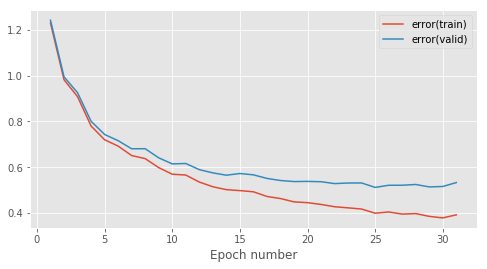

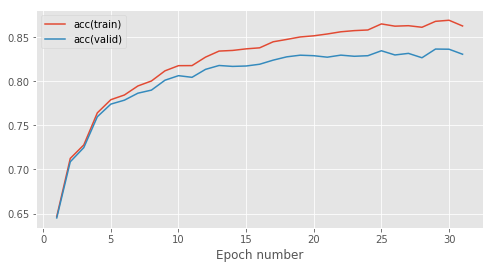

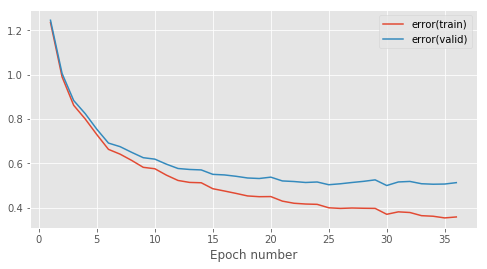

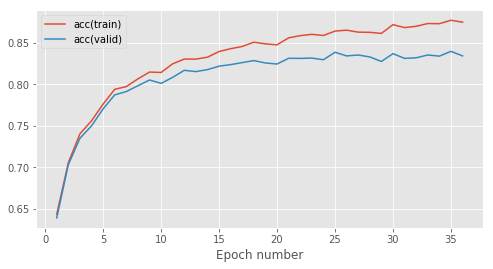

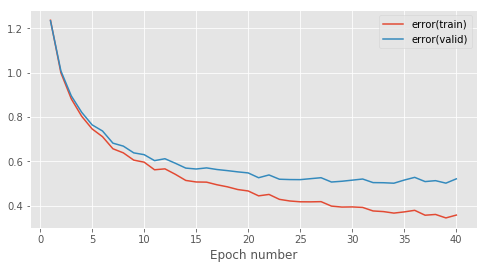

...

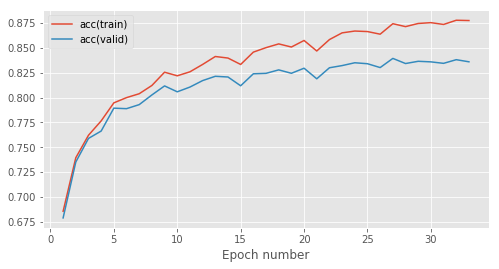

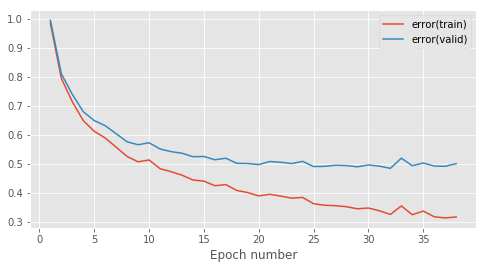

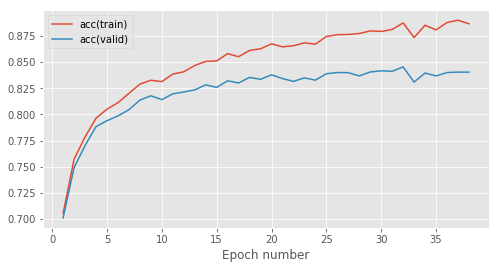

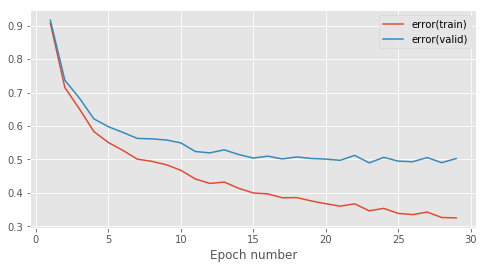

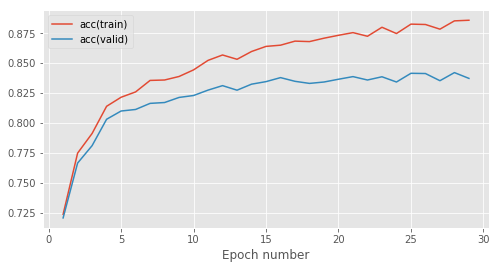

In [122]:
import importlib
import mlp
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
importlib.reload(mlp.optimisers)
importlib.reload(mlp.learning_rules)
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule


# Seed a random number generator
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 500
# Set up a logger object to print info about the training run to stdout
logger = logging.getLogger()
logger.setLevel(logging.INFO)
logger.handlers = [logging.StreamHandler()]

betas=np.linspace(0.990,0.999,10)

results_betas_rms=[]

for beta in betas:

# Create data provider objects for the MNIST data set
    train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
    valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
    test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)


#setup hyperparameters
    num_epochs = 300
    stats_interval = 1
    input_dim, output_dim, hidden_dim = 784, 47, 100

    weights_init = GlorotUniformInit(rng=rng)
    biases_init = ConstantInit(0.)
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
        ReluLayer(),
        AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
    ])
 
    error = CrossEntropySoftmaxError()
# Use a basic gradient descent learning rule
    print(beta)
    learning_rule = RMSPropLearningRule(learning_rate=4e-4,beta=beta)

#Remember to use notebook=False when you write a script to be run in a terminal
    _RMS_betas = train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval, notebook=True)
    results_betas_rms.append(_RMS_betas)

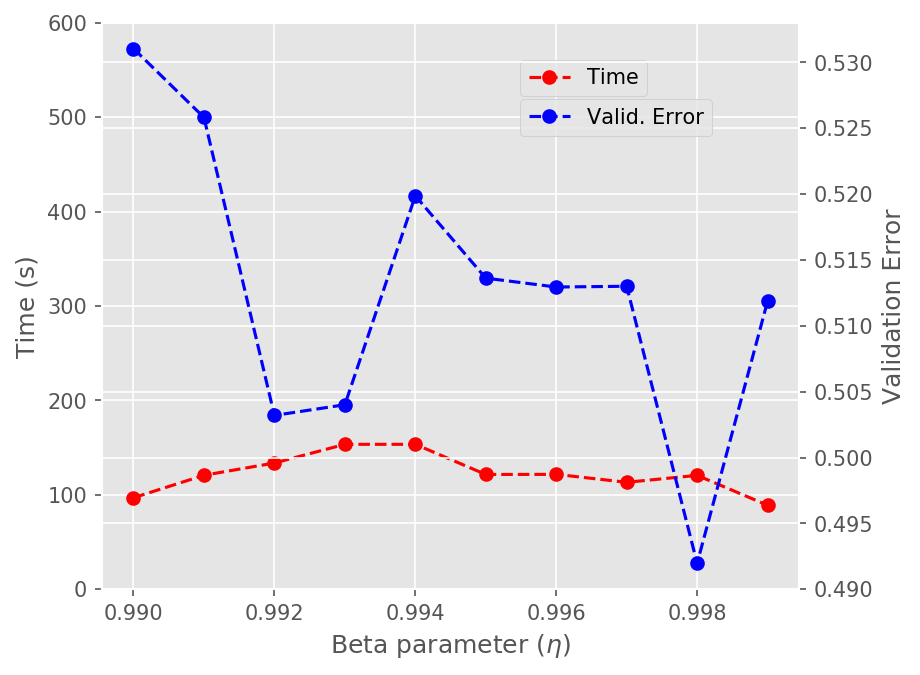

In [162]:
times_RMS=[]
errors_RMS=[]
for result in results_betas_rms:
    times_RMS.append(result[-7])
    errors_RMS.append(result[0][result[-2]-1][2])

times_RMS[4]=times_RMS[3]

fig=plt.figure(figsize=(6,5),dpi=150)

ax1=fig.add_subplot(111)
ax2=ax1.twinx()
ax1.plot(betas,times_RMS,"--o",c='r',label="Time")
ax2.plot(betas,errors_RMS,'--o',c='b',label="Valid. Error")
ax1.set_ylim(0,600)
ax1.set_xlabel('Beta parameter ($\eta$)')
ax1.set_ylabel('Time (s)')
ax2.set_ylabel('Validation Error')

ax1.legend(loc=(0.6,0.87))
ax2.legend(loc=(0.6,0.8))
ax1.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

fig.savefig("beta_RMS.png")

## ADAM

0.0001 0.825
KeysView(<numpy.lib.npyio.NpzFile object at 0x121233a90>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x10affacf8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x10affacf8>)


Epoch 1: 2.3s to complete
    error(train)=1.38e+00, acc(train)=6.16e-01, error(valid)=1.39e+00, acc(valid)=6.13e-01


1


Epoch 2: 2.4s to complete
    error(train)=1.16e+00, acc(train)=6.71e-01, error(valid)=1.17e+00, acc(valid)=6.70e-01


2


Epoch 3: 2.5s to complete
    error(train)=1.05e+00, acc(train)=6.99e-01, error(valid)=1.06e+00, acc(valid)=6.95e-01


3


Epoch 4: 2.5s to complete
    error(train)=9.81e-01, acc(train)=7.17e-01, error(valid)=9.94e-01, acc(valid)=7.14e-01


4


Epoch 5: 2.5s to complete
    error(train)=9.28e-01, acc(train)=7.29e-01, error(valid)=9.40e-01, acc(valid)=7.27e-01


5


Epoch 6: 2.2s to complete
    error(train)=8.88e-01, acc(train)=7.39e-01, error(valid)=8.99e-01, acc(valid)=7.35e-01


6


Epoch 7: 2.1s to complete
    error(train)=8.51e-01, acc(train)=7.49e-01, error(valid)=8.63e-01, acc(valid)=7.46e-01


7


Epoch 8: 2.2s to complete
    error(train)=8.27e-01, acc(train)=7.54e-01, error(valid)=8.44e-01, acc(valid)=7.49e-01


8


Epoch 9: 2.2s to complete
    error(train)=7.98e-01, acc(train)=7.62e-01, error(valid)=8.14e-01, acc(valid)=7.58e-01


9


Epoch 10: 2.2s to complete
    error(train)=7.79e-01, acc(train)=7.66e-01, error(valid)=7.97e-01, acc(valid)=7.61e-01


10


Epoch 11: 2.2s to complete
    error(train)=7.60e-01, acc(train)=7.72e-01, error(valid)=7.79e-01, acc(valid)=7.68e-01


11


Epoch 12: 2.2s to complete
    error(train)=7.43e-01, acc(train)=7.77e-01, error(valid)=7.64e-01, acc(valid)=7.71e-01


12


Epoch 13: 2.2s to complete
    error(train)=7.29e-01, acc(train)=7.78e-01, error(valid)=7.50e-01, acc(valid)=7.73e-01


13


Epoch 14: 2.2s to complete
    error(train)=7.15e-01, acc(train)=7.83e-01, error(valid)=7.36e-01, acc(valid)=7.79e-01


14


Epoch 15: 2.3s to complete
    error(train)=7.03e-01, acc(train)=7.87e-01, error(valid)=7.28e-01, acc(valid)=7.80e-01


15


Epoch 16: 2.2s to complete
    error(train)=6.89e-01, acc(train)=7.90e-01, error(valid)=7.13e-01, acc(valid)=7.82e-01


16


Epoch 17: 2.2s to complete
    error(train)=6.75e-01, acc(train)=7.94e-01, error(valid)=7.03e-01, acc(valid)=7.86e-01


17


Epoch 18: 2.2s to complete
    error(train)=6.66e-01, acc(train)=7.96e-01, error(valid)=6.92e-01, acc(valid)=7.90e-01


18


Epoch 19: 2.4s to complete
    error(train)=6.56e-01, acc(train)=7.96e-01, error(valid)=6.86e-01, acc(valid)=7.89e-01


19


Epoch 20: 2.4s to complete
    error(train)=6.46e-01, acc(train)=8.00e-01, error(valid)=6.75e-01, acc(valid)=7.94e-01


20


Epoch 21: 2.4s to complete
    error(train)=6.36e-01, acc(train)=8.03e-01, error(valid)=6.69e-01, acc(valid)=7.95e-01


21


Epoch 22: 2.3s to complete
    error(train)=6.30e-01, acc(train)=8.05e-01, error(valid)=6.62e-01, acc(valid)=7.97e-01


22


Epoch 23: 2.3s to complete
    error(train)=6.25e-01, acc(train)=8.05e-01, error(valid)=6.62e-01, acc(valid)=7.96e-01


Epoch 24: 2.3s to complete
    error(train)=6.13e-01, acc(train)=8.09e-01, error(valid)=6.50e-01, acc(valid)=8.01e-01


24


Epoch 25: 2.3s to complete
    error(train)=6.09e-01, acc(train)=8.11e-01, error(valid)=6.47e-01, acc(valid)=8.03e-01


25


Epoch 26: 2.2s to complete
    error(train)=5.98e-01, acc(train)=8.13e-01, error(valid)=6.36e-01, acc(valid)=8.02e-01


26


Epoch 27: 2.3s to complete
    error(train)=5.93e-01, acc(train)=8.15e-01, error(valid)=6.32e-01, acc(valid)=8.06e-01


27


Epoch 28: 2.3s to complete
    error(train)=5.89e-01, acc(train)=8.14e-01, error(valid)=6.32e-01, acc(valid)=8.05e-01


28


Epoch 29: 2.2s to complete
    error(train)=5.82e-01, acc(train)=8.18e-01, error(valid)=6.23e-01, acc(valid)=8.08e-01


29


Epoch 30: 2.3s to complete
    error(train)=5.75e-01, acc(train)=8.20e-01, error(valid)=6.21e-01, acc(valid)=8.09e-01


30


Epoch 31: 2.2s to complete
    error(train)=5.70e-01, acc(train)=8.19e-01, error(valid)=6.17e-01, acc(valid)=8.09e-01


31


Epoch 32: 2.2s to complete
    error(train)=5.65e-01, acc(train)=8.22e-01, error(valid)=6.12e-01, acc(valid)=8.10e-01


32


Epoch 33: 2.9s to complete
    error(train)=5.58e-01, acc(train)=8.23e-01, error(valid)=6.05e-01, acc(valid)=8.11e-01


33


Epoch 34: 2.7s to complete
    error(train)=5.56e-01, acc(train)=8.24e-01, error(valid)=6.05e-01, acc(valid)=8.13e-01


Epoch 35: 2.4s to complete
    error(train)=5.50e-01, acc(train)=8.26e-01, error(valid)=5.96e-01, acc(valid)=8.13e-01


35


Epoch 36: 2.3s to complete
    error(train)=5.48e-01, acc(train)=8.26e-01, error(valid)=6.00e-01, acc(valid)=8.15e-01


Epoch 37: 2.2s to complete
    error(train)=5.38e-01, acc(train)=8.29e-01, error(valid)=5.92e-01, acc(valid)=8.13e-01


37


Epoch 38: 2.2s to complete
    error(train)=5.36e-01, acc(train)=8.30e-01, error(valid)=5.93e-01, acc(valid)=8.14e-01


Epoch 39: 2.2s to complete
    error(train)=5.31e-01, acc(train)=8.31e-01, error(valid)=5.87e-01, acc(valid)=8.15e-01


39


Epoch 40: 2.5s to complete
    error(train)=5.28e-01, acc(train)=8.31e-01, error(valid)=5.86e-01, acc(valid)=8.14e-01


40


Epoch 41: 2.7s to complete
    error(train)=5.22e-01, acc(train)=8.34e-01, error(valid)=5.80e-01, acc(valid)=8.19e-01


41


Epoch 42: 2.5s to complete
    error(train)=5.18e-01, acc(train)=8.35e-01, error(valid)=5.78e-01, acc(valid)=8.19e-01


42


Epoch 43: 2.2s to complete
    error(train)=5.15e-01, acc(train)=8.35e-01, error(valid)=5.75e-01, acc(valid)=8.19e-01


43


Epoch 44: 2.2s to complete
    error(train)=5.12e-01, acc(train)=8.36e-01, error(valid)=5.76e-01, acc(valid)=8.18e-01


Epoch 45: 2.2s to complete
    error(train)=5.09e-01, acc(train)=8.37e-01, error(valid)=5.75e-01, acc(valid)=8.18e-01


Epoch 46: 2.2s to complete
    error(train)=5.06e-01, acc(train)=8.38e-01, error(valid)=5.74e-01, acc(valid)=8.20e-01


46


Epoch 47: 2.2s to complete
    error(train)=5.06e-01, acc(train)=8.37e-01, error(valid)=5.74e-01, acc(valid)=8.20e-01


Epoch 48: 2.2s to complete
    error(train)=4.98e-01, acc(train)=8.39e-01, error(valid)=5.66e-01, acc(valid)=8.20e-01


48


Epoch 49: 2.2s to complete
    error(train)=4.97e-01, acc(train)=8.39e-01, error(valid)=5.67e-01, acc(valid)=8.19e-01


Epoch 50: 2.3s to complete
    error(train)=4.92e-01, acc(train)=8.40e-01, error(valid)=5.66e-01, acc(valid)=8.21e-01


50


Epoch 51: 2.3s to complete
    error(train)=4.91e-01, acc(train)=8.41e-01, error(valid)=5.63e-01, acc(valid)=8.22e-01


51


Epoch 52: 2.2s to complete
    error(train)=4.87e-01, acc(train)=8.42e-01, error(valid)=5.61e-01, acc(valid)=8.24e-01


52


Epoch 53: 2.3s to complete
    error(train)=4.83e-01, acc(train)=8.44e-01, error(valid)=5.59e-01, acc(valid)=8.23e-01


53


Epoch 54: 2.7s to complete
    error(train)=4.81e-01, acc(train)=8.44e-01, error(valid)=5.58e-01, acc(valid)=8.23e-01


54


Epoch 55: 2.3s to complete
    error(train)=4.76e-01, acc(train)=8.46e-01, error(valid)=5.55e-01, acc(valid)=8.24e-01


55


Epoch 56: 2.2s to complete
    error(train)=4.75e-01, acc(train)=8.46e-01, error(valid)=5.54e-01, acc(valid)=8.25e-01


56


Epoch 57: 2.2s to complete
    error(train)=4.72e-01, acc(train)=8.47e-01, error(valid)=5.50e-01, acc(valid)=8.25e-01


57


Epoch 58: 2.2s to complete
    error(train)=4.67e-01, acc(train)=8.48e-01, error(valid)=5.51e-01, acc(valid)=8.22e-01


Epoch 59: 2.2s to complete
    error(train)=4.69e-01, acc(train)=8.48e-01, error(valid)=5.52e-01, acc(valid)=8.24e-01


Epoch 60: 2.2s to complete
    error(train)=4.63e-01, acc(train)=8.49e-01, error(valid)=5.46e-01, acc(valid)=8.26e-01


60


Epoch 61: 2.3s to complete
    error(train)=4.61e-01, acc(train)=8.50e-01, error(valid)=5.49e-01, acc(valid)=8.25e-01


Epoch 62: 2.3s to complete
    error(train)=4.60e-01, acc(train)=8.49e-01, error(valid)=5.48e-01, acc(valid)=8.23e-01


Epoch 63: 2.2s to complete
    error(train)=4.55e-01, acc(train)=8.52e-01, error(valid)=5.43e-01, acc(valid)=8.28e-01


63


Epoch 64: 2.3s to complete
    error(train)=4.56e-01, acc(train)=8.51e-01, error(valid)=5.43e-01, acc(valid)=8.25e-01


64


Epoch 65: 2.4s to complete
    error(train)=4.53e-01, acc(train)=8.51e-01, error(valid)=5.45e-01, acc(valid)=8.24e-01


Epoch 66: 2.4s to complete
    error(train)=4.51e-01, acc(train)=8.53e-01, error(valid)=5.43e-01, acc(valid)=8.25e-01


Epoch 67: 2.3s to complete
    error(train)=4.47e-01, acc(train)=8.54e-01, error(valid)=5.44e-01, acc(valid)=8.26e-01


Epoch 68: 2.2s to complete
    error(train)=4.46e-01, acc(train)=8.54e-01, error(valid)=5.42e-01, acc(valid)=8.28e-01


68


Epoch 69: 2.3s to complete
    error(train)=4.43e-01, acc(train)=8.55e-01, error(valid)=5.41e-01, acc(valid)=8.27e-01


69


Epoch 70: 2.2s to complete
    error(train)=4.41e-01, acc(train)=8.55e-01, error(valid)=5.39e-01, acc(valid)=8.29e-01


70


Epoch 71: 2.2s to complete
    error(train)=4.37e-01, acc(train)=8.56e-01, error(valid)=5.36e-01, acc(valid)=8.30e-01


71


Epoch 72: 2.3s to complete
    error(train)=4.40e-01, acc(train)=8.55e-01, error(valid)=5.39e-01, acc(valid)=8.30e-01


Epoch 73: 2.4s to complete
    error(train)=4.35e-01, acc(train)=8.56e-01, error(valid)=5.34e-01, acc(valid)=8.30e-01


73


Epoch 74: 2.6s to complete
    error(train)=4.34e-01, acc(train)=8.57e-01, error(valid)=5.35e-01, acc(valid)=8.30e-01


Epoch 75: 2.2s to complete
    error(train)=4.28e-01, acc(train)=8.59e-01, error(valid)=5.30e-01, acc(valid)=8.30e-01


75


Epoch 76: 2.1s to complete
    error(train)=4.29e-01, acc(train)=8.58e-01, error(valid)=5.33e-01, acc(valid)=8.31e-01


Epoch 77: 2.6s to complete
    error(train)=4.32e-01, acc(train)=8.58e-01, error(valid)=5.35e-01, acc(valid)=8.30e-01


Epoch 78: 2.1s to complete
    error(train)=4.23e-01, acc(train)=8.61e-01, error(valid)=5.32e-01, acc(valid)=8.29e-01


Epoch 79: 2.7s to complete
    error(train)=4.22e-01, acc(train)=8.60e-01, error(valid)=5.30e-01, acc(valid)=8.29e-01


79


Epoch 80: 2.5s to complete
    error(train)=4.24e-01, acc(train)=8.60e-01, error(valid)=5.34e-01, acc(valid)=8.28e-01


Epoch 81: 2.4s to complete
    error(train)=4.18e-01, acc(train)=8.61e-01, error(valid)=5.28e-01, acc(valid)=8.33e-01


81


Epoch 82: 2.2s to complete
    error(train)=4.16e-01, acc(train)=8.62e-01, error(valid)=5.26e-01, acc(valid)=8.31e-01


82


Epoch 83: 2.2s to complete
    error(train)=4.16e-01, acc(train)=8.62e-01, error(valid)=5.28e-01, acc(valid)=8.33e-01


Epoch 84: 2.3s to complete
    error(train)=4.14e-01, acc(train)=8.62e-01, error(valid)=5.27e-01, acc(valid)=8.31e-01


Epoch 85: 2.3s to complete
    error(train)=4.12e-01, acc(train)=8.63e-01, error(valid)=5.28e-01, acc(valid)=8.33e-01


Epoch 86: 2.3s to complete
    error(train)=4.12e-01, acc(train)=8.63e-01, error(valid)=5.25e-01, acc(valid)=8.33e-01


86


Epoch 87: 2.4s to complete
    error(train)=4.11e-01, acc(train)=8.63e-01, error(valid)=5.25e-01, acc(valid)=8.33e-01


Epoch 88: 2.3s to complete
    error(train)=4.08e-01, acc(train)=8.64e-01, error(valid)=5.27e-01, acc(valid)=8.32e-01


Epoch 89: 2.3s to complete
    error(train)=4.09e-01, acc(train)=8.64e-01, error(valid)=5.21e-01, acc(valid)=8.35e-01


89


Epoch 90: 2.3s to complete
    error(train)=4.06e-01, acc(train)=8.65e-01, error(valid)=5.26e-01, acc(valid)=8.33e-01


Epoch 91: 2.3s to complete
    error(train)=4.03e-01, acc(train)=8.66e-01, error(valid)=5.24e-01, acc(valid)=8.33e-01


Epoch 92: 2.3s to complete
    error(train)=4.03e-01, acc(train)=8.65e-01, error(valid)=5.24e-01, acc(valid)=8.29e-01


Epoch 93: 2.3s to complete
    error(train)=4.01e-01, acc(train)=8.66e-01, error(valid)=5.22e-01, acc(valid)=8.34e-01


Epoch 94: 2.6s to complete
    error(train)=4.01e-01, acc(train)=8.66e-01, error(valid)=5.23e-01, acc(valid)=8.32e-01


Epoch 95: 2.4s to complete
    error(train)=3.97e-01, acc(train)=8.68e-01, error(valid)=5.23e-01, acc(valid)=8.32e-01


 hola

0.0001 0.85
KeysView(<numpy.lib.npyio.NpzFile object at 0x123981c18>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12051d8d0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12051d8d0>)


Epoch 1: 2.2s to complete
    error(train)=1.39e+00, acc(train)=6.12e-01, error(valid)=1.40e+00, acc(valid)=6.07e-01


1


Epoch 2: 2.2s to complete
    error(train)=1.17e+00, acc(train)=6.68e-01, error(valid)=1.18e+00, acc(valid)=6.62e-01


2


Epoch 3: 2.1s to complete
    error(train)=1.06e+00, acc(train)=6.95e-01, error(valid)=1.07e+00, acc(valid)=6.89e-01


3


Epoch 4: 2.1s to complete
    error(train)=9.89e-01, acc(train)=7.13e-01, error(valid)=9.98e-01, acc(valid)=7.08e-01


4


Epoch 5: 2.2s to complete
    error(train)=9.43e-01, acc(train)=7.25e-01, error(valid)=9.55e-01, acc(valid)=7.23e-01


5


Epoch 6: 2.2s to complete
    error(train)=8.96e-01, acc(train)=7.36e-01, error(valid)=9.09e-01, acc(valid)=7.31e-01


6


Epoch 7: 2.2s to complete
    error(train)=8.62e-01, acc(train)=7.45e-01, error(valid)=8.76e-01, acc(valid)=7.41e-01


7


Epoch 8: 2.2s to complete
    error(train)=8.32e-01, acc(train)=7.53e-01, error(valid)=8.46e-01, acc(valid)=7.49e-01


8


Epoch 9: 2.2s to complete
    error(train)=8.06e-01, acc(train)=7.59e-01, error(valid)=8.23e-01, acc(valid)=7.53e-01


9


Epoch 10: 2.3s to complete
    error(train)=7.87e-01, acc(train)=7.65e-01, error(valid)=8.06e-01, acc(valid)=7.57e-01


10


Epoch 11: 2.2s to complete
    error(train)=7.69e-01, acc(train)=7.69e-01, error(valid)=7.87e-01, acc(valid)=7.63e-01


11


Epoch 12: 2.2s to complete
    error(train)=7.48e-01, acc(train)=7.74e-01, error(valid)=7.68e-01, acc(valid)=7.67e-01


12


Epoch 13: 2.2s to complete
    error(train)=7.34e-01, acc(train)=7.78e-01, error(valid)=7.59e-01, acc(valid)=7.69e-01


13


Epoch 14: 2.4s to complete
    error(train)=7.18e-01, acc(train)=7.82e-01, error(valid)=7.41e-01, acc(valid)=7.76e-01


14


Epoch 15: 2.4s to complete
    error(train)=7.06e-01, acc(train)=7.86e-01, error(valid)=7.31e-01, acc(valid)=7.77e-01


15


Epoch 16: 2.2s to complete
    error(train)=6.95e-01, acc(train)=7.89e-01, error(valid)=7.23e-01, acc(valid)=7.81e-01


16


Epoch 17: 2.4s to complete
    error(train)=6.83e-01, acc(train)=7.92e-01, error(valid)=7.10e-01, acc(valid)=7.83e-01


17


Epoch 18: 2.3s to complete
    error(train)=6.70e-01, acc(train)=7.95e-01, error(valid)=7.00e-01, acc(valid)=7.85e-01


18


Epoch 19: 2.6s to complete
    error(train)=6.66e-01, acc(train)=7.95e-01, error(valid)=6.94e-01, acc(valid)=7.87e-01


19


Epoch 20: 2.2s to complete
    error(train)=6.56e-01, acc(train)=7.99e-01, error(valid)=6.85e-01, acc(valid)=7.88e-01


20


Epoch 21: 2.2s to complete
    error(train)=6.45e-01, acc(train)=8.01e-01, error(valid)=6.80e-01, acc(valid)=7.88e-01


21


Epoch 22: 2.3s to complete
    error(train)=6.37e-01, acc(train)=8.04e-01, error(valid)=6.68e-01, acc(valid)=7.95e-01


22


Epoch 23: 2.3s to complete
    error(train)=6.28e-01, acc(train)=8.07e-01, error(valid)=6.65e-01, acc(valid)=7.93e-01


23


Epoch 24: 2.3s to complete
    error(train)=6.21e-01, acc(train)=8.08e-01, error(valid)=6.56e-01, acc(valid)=7.96e-01


24


Epoch 25: 2.4s to complete
    error(train)=6.13e-01, acc(train)=8.10e-01, error(valid)=6.49e-01, acc(valid)=8.00e-01


25


Epoch 26: 2.3s to complete
    error(train)=6.08e-01, acc(train)=8.09e-01, error(valid)=6.47e-01, acc(valid)=7.97e-01


26


Epoch 27: 2.3s to complete
    error(train)=6.03e-01, acc(train)=8.12e-01, error(valid)=6.43e-01, acc(valid)=8.00e-01


27


Epoch 28: 2.4s to complete
    error(train)=5.94e-01, acc(train)=8.15e-01, error(valid)=6.35e-01, acc(valid)=8.04e-01


28


Epoch 29: 2.4s to complete
    error(train)=5.89e-01, acc(train)=8.15e-01, error(valid)=6.32e-01, acc(valid)=8.02e-01


29


Epoch 30: 2.4s to complete
    error(train)=5.88e-01, acc(train)=8.16e-01, error(valid)=6.32e-01, acc(valid)=8.04e-01


30


Epoch 31: 2.4s to complete
    error(train)=5.80e-01, acc(train)=8.18e-01, error(valid)=6.23e-01, acc(valid)=8.07e-01


31


Epoch 32: 2.3s to complete
    error(train)=5.73e-01, acc(train)=8.20e-01, error(valid)=6.18e-01, acc(valid)=8.06e-01


32


Epoch 33: 2.4s to complete
    error(train)=5.68e-01, acc(train)=8.22e-01, error(valid)=6.14e-01, acc(valid)=8.08e-01


33


Epoch 34: 2.4s to complete
    error(train)=5.64e-01, acc(train)=8.22e-01, error(valid)=6.11e-01, acc(valid)=8.07e-01


34


Epoch 35: 2.4s to complete
    error(train)=5.58e-01, acc(train)=8.24e-01, error(valid)=6.06e-01, acc(valid)=8.11e-01


35


Epoch 36: 2.3s to complete
    error(train)=5.55e-01, acc(train)=8.25e-01, error(valid)=6.06e-01, acc(valid)=8.11e-01


36


Epoch 37: 2.4s to complete
    error(train)=5.49e-01, acc(train)=8.27e-01, error(valid)=5.99e-01, acc(valid)=8.13e-01


37


Epoch 38: 2.3s to complete
    error(train)=5.47e-01, acc(train)=8.24e-01, error(valid)=5.98e-01, acc(valid)=8.10e-01


38


Epoch 39: 2.3s to complete
    error(train)=5.41e-01, acc(train)=8.29e-01, error(valid)=5.94e-01, acc(valid)=8.14e-01


39


Epoch 40: 2.3s to complete
    error(train)=5.37e-01, acc(train)=8.29e-01, error(valid)=5.94e-01, acc(valid)=8.15e-01


40


Epoch 41: 2.3s to complete
    error(train)=5.33e-01, acc(train)=8.30e-01, error(valid)=5.87e-01, acc(valid)=8.16e-01


41


Epoch 42: 2.4s to complete
    error(train)=5.29e-01, acc(train)=8.32e-01, error(valid)=5.83e-01, acc(valid)=8.18e-01


42


Epoch 43: 2.3s to complete
    error(train)=5.27e-01, acc(train)=8.30e-01, error(valid)=5.85e-01, acc(valid)=8.15e-01


Epoch 44: 2.3s to complete
    error(train)=5.25e-01, acc(train)=8.32e-01, error(valid)=5.82e-01, acc(valid)=8.17e-01


44


Epoch 45: 2.3s to complete
    error(train)=5.21e-01, acc(train)=8.34e-01, error(valid)=5.82e-01, acc(valid)=8.18e-01


45


Epoch 46: 2.4s to complete
    error(train)=5.19e-01, acc(train)=8.33e-01, error(valid)=5.83e-01, acc(valid)=8.16e-01


Epoch 47: 2.5s to complete
    error(train)=5.15e-01, acc(train)=8.35e-01, error(valid)=5.78e-01, acc(valid)=8.20e-01


47


Epoch 48: 2.3s to complete
    error(train)=5.11e-01, acc(train)=8.36e-01, error(valid)=5.75e-01, acc(valid)=8.19e-01


48


Epoch 49: 2.4s to complete
    error(train)=5.08e-01, acc(train)=8.37e-01, error(valid)=5.70e-01, acc(valid)=8.22e-01


49


Epoch 50: 2.4s to complete
    error(train)=5.02e-01, acc(train)=8.39e-01, error(valid)=5.66e-01, acc(valid)=8.22e-01


50


Epoch 51: 2.3s to complete
    error(train)=5.02e-01, acc(train)=8.38e-01, error(valid)=5.68e-01, acc(valid)=8.20e-01


Epoch 52: 2.3s to complete
    error(train)=4.97e-01, acc(train)=8.39e-01, error(valid)=5.64e-01, acc(valid)=8.22e-01


52


Epoch 53: 2.6s to complete
    error(train)=4.99e-01, acc(train)=8.38e-01, error(valid)=5.69e-01, acc(valid)=8.20e-01


Epoch 54: 2.9s to complete
    error(train)=4.96e-01, acc(train)=8.39e-01, error(valid)=5.66e-01, acc(valid)=8.20e-01


Epoch 55: 2.3s to complete
    error(train)=4.89e-01, acc(train)=8.42e-01, error(valid)=5.59e-01, acc(valid)=8.24e-01


55


Epoch 56: 2.3s to complete
    error(train)=4.86e-01, acc(train)=8.42e-01, error(valid)=5.60e-01, acc(valid)=8.22e-01


Epoch 57: 2.3s to complete
    error(train)=4.86e-01, acc(train)=8.43e-01, error(valid)=5.62e-01, acc(valid)=8.21e-01


Epoch 58: 2.3s to complete
    error(train)=4.84e-01, acc(train)=8.43e-01, error(valid)=5.62e-01, acc(valid)=8.21e-01


Epoch 59: 2.3s to complete
    error(train)=4.80e-01, acc(train)=8.44e-01, error(valid)=5.58e-01, acc(valid)=8.24e-01


59


Epoch 60: 2.3s to complete
    error(train)=4.77e-01, acc(train)=8.46e-01, error(valid)=5.55e-01, acc(valid)=8.25e-01


60


Epoch 61: 2.3s to complete
    error(train)=4.76e-01, acc(train)=8.46e-01, error(valid)=5.53e-01, acc(valid)=8.25e-01


61


Epoch 62: 2.6s to complete
    error(train)=4.75e-01, acc(train)=8.46e-01, error(valid)=5.54e-01, acc(valid)=8.23e-01


Epoch 63: 2.5s to complete
    error(train)=4.71e-01, acc(train)=8.46e-01, error(valid)=5.54e-01, acc(valid)=8.25e-01


Epoch 64: 2.4s to complete
    error(train)=4.71e-01, acc(train)=8.47e-01, error(valid)=5.56e-01, acc(valid)=8.25e-01


Epoch 65: 2.4s to complete
    error(train)=4.65e-01, acc(train)=8.48e-01, error(valid)=5.50e-01, acc(valid)=8.26e-01


65


Epoch 66: 2.5s to complete
    error(train)=4.61e-01, acc(train)=8.49e-01, error(valid)=5.46e-01, acc(valid)=8.28e-01


66


Epoch 67: 2.3s to complete
    error(train)=4.61e-01, acc(train)=8.50e-01, error(valid)=5.46e-01, acc(valid)=8.27e-01


67


Epoch 68: 2.4s to complete
    error(train)=4.59e-01, acc(train)=8.51e-01, error(valid)=5.44e-01, acc(valid)=8.26e-01


68


Epoch 69: 3.1s to complete
    error(train)=4.57e-01, acc(train)=8.50e-01, error(valid)=5.49e-01, acc(valid)=8.24e-01


Epoch 70: 2.9s to complete
    error(train)=4.54e-01, acc(train)=8.51e-01, error(valid)=5.43e-01, acc(valid)=8.27e-01


70


Epoch 71: 2.2s to complete
    error(train)=4.53e-01, acc(train)=8.52e-01, error(valid)=5.40e-01, acc(valid)=8.27e-01


71


Epoch 72: 2.4s to complete
    error(train)=4.50e-01, acc(train)=8.53e-01, error(valid)=5.43e-01, acc(valid)=8.28e-01


Epoch 73: 2.3s to complete
    error(train)=4.50e-01, acc(train)=8.52e-01, error(valid)=5.42e-01, acc(valid)=8.28e-01


Epoch 74: 2.2s to complete
    error(train)=4.46e-01, acc(train)=8.54e-01, error(valid)=5.39e-01, acc(valid)=8.28e-01


74


Epoch 75: 2.1s to complete
    error(train)=4.46e-01, acc(train)=8.55e-01, error(valid)=5.40e-01, acc(valid)=8.27e-01


Epoch 76: 2.1s to complete
    error(train)=4.43e-01, acc(train)=8.55e-01, error(valid)=5.37e-01, acc(valid)=8.29e-01


76


Epoch 77: 2.3s to complete
    error(train)=4.43e-01, acc(train)=8.55e-01, error(valid)=5.38e-01, acc(valid)=8.28e-01


Epoch 78: 2.2s to complete
    error(train)=4.42e-01, acc(train)=8.54e-01, error(valid)=5.40e-01, acc(valid)=8.26e-01


Epoch 79: 2.0s to complete
    error(train)=4.39e-01, acc(train)=8.55e-01, error(valid)=5.40e-01, acc(valid)=8.27e-01


Epoch 80: 2.0s to complete
    error(train)=4.37e-01, acc(train)=8.56e-01, error(valid)=5.38e-01, acc(valid)=8.28e-01


Epoch 81: 2.0s to complete
    error(train)=4.37e-01, acc(train)=8.56e-01, error(valid)=5.40e-01, acc(valid)=8.28e-01


Epoch 82: 2.2s to complete
    error(train)=4.35e-01, acc(train)=8.56e-01, error(valid)=5.36e-01, acc(valid)=8.28e-01


82


Epoch 83: 2.0s to complete
    error(train)=4.31e-01, acc(train)=8.58e-01, error(valid)=5.33e-01, acc(valid)=8.30e-01


83


Epoch 84: 2.2s to complete
    error(train)=4.32e-01, acc(train)=8.57e-01, error(valid)=5.35e-01, acc(valid)=8.30e-01


Epoch 85: 2.1s to complete
    error(train)=4.27e-01, acc(train)=8.60e-01, error(valid)=5.32e-01, acc(valid)=8.30e-01


85


Epoch 86: 2.0s to complete
    error(train)=4.25e-01, acc(train)=8.59e-01, error(valid)=5.36e-01, acc(valid)=8.29e-01


Epoch 87: 2.0s to complete
    error(train)=4.23e-01, acc(train)=8.60e-01, error(valid)=5.30e-01, acc(valid)=8.31e-01


87


Epoch 88: 2.0s to complete
    error(train)=4.23e-01, acc(train)=8.60e-01, error(valid)=5.30e-01, acc(valid)=8.29e-01


Epoch 89: 2.0s to complete
    error(train)=4.21e-01, acc(train)=8.62e-01, error(valid)=5.33e-01, acc(valid)=8.32e-01


Epoch 90: 2.6s to complete
    error(train)=4.20e-01, acc(train)=8.61e-01, error(valid)=5.34e-01, acc(valid)=8.30e-01


Epoch 91: 2.0s to complete
    error(train)=4.18e-01, acc(train)=8.62e-01, error(valid)=5.31e-01, acc(valid)=8.31e-01


Epoch 92: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.62e-01, error(valid)=5.31e-01, acc(valid)=8.31e-01


Epoch 93: 2.1s to complete
    error(train)=4.19e-01, acc(train)=8.60e-01, error(valid)=5.34e-01, acc(valid)=8.27e-01


 hola

0.0001 0.875
KeysView(<numpy.lib.npyio.NpzFile object at 0x124bbb240>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x121e644a8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x121e644a8>)


Epoch 1: 2.1s to complete
    error(train)=1.37e+00, acc(train)=6.17e-01, error(valid)=1.38e+00, acc(valid)=6.14e-01


1


Epoch 2: 2.0s to complete
    error(train)=1.16e+00, acc(train)=6.70e-01, error(valid)=1.17e+00, acc(valid)=6.64e-01


2


Epoch 3: 2.0s to complete
    error(train)=1.06e+00, acc(train)=6.96e-01, error(valid)=1.07e+00, acc(valid)=6.93e-01


3


Epoch 4: 2.0s to complete
    error(train)=9.89e-01, acc(train)=7.13e-01, error(valid)=1.00e+00, acc(valid)=7.11e-01


4


Epoch 5: 2.1s to complete
    error(train)=9.34e-01, acc(train)=7.26e-01, error(valid)=9.49e-01, acc(valid)=7.21e-01


5


Epoch 6: 2.1s to complete
    error(train)=8.94e-01, acc(train)=7.35e-01, error(valid)=9.06e-01, acc(valid)=7.32e-01


6


Epoch 7: 2.1s to complete
    error(train)=8.56e-01, acc(train)=7.45e-01, error(valid)=8.71e-01, acc(valid)=7.44e-01


7


Epoch 8: 2.1s to complete
    error(train)=8.30e-01, acc(train)=7.51e-01, error(valid)=8.48e-01, acc(valid)=7.48e-01


8


Epoch 9: 1.9s to complete
    error(train)=8.03e-01, acc(train)=7.59e-01, error(valid)=8.18e-01, acc(valid)=7.56e-01


9


Epoch 10: 1.9s to complete
    error(train)=7.77e-01, acc(train)=7.67e-01, error(valid)=7.95e-01, acc(valid)=7.60e-01


10


Epoch 11: 2.2s to complete
    error(train)=7.54e-01, acc(train)=7.72e-01, error(valid)=7.75e-01, acc(valid)=7.66e-01


11


Epoch 12: 1.9s to complete
    error(train)=7.37e-01, acc(train)=7.75e-01, error(valid)=7.57e-01, acc(valid)=7.72e-01


12


Epoch 13: 1.9s to complete
    error(train)=7.23e-01, acc(train)=7.80e-01, error(valid)=7.47e-01, acc(valid)=7.72e-01


13


Epoch 14: 1.9s to complete
    error(train)=7.04e-01, acc(train)=7.85e-01, error(valid)=7.28e-01, acc(valid)=7.78e-01


14


Epoch 15: 1.9s to complete
    error(train)=6.91e-01, acc(train)=7.88e-01, error(valid)=7.14e-01, acc(valid)=7.81e-01


15


Epoch 16: 1.9s to complete
    error(train)=6.75e-01, acc(train)=7.93e-01, error(valid)=7.03e-01, acc(valid)=7.84e-01


16


Epoch 17: 2.0s to complete
    error(train)=6.66e-01, acc(train)=7.96e-01, error(valid)=6.94e-01, acc(valid)=7.86e-01


17


Epoch 18: 1.9s to complete
    error(train)=6.54e-01, acc(train)=7.98e-01, error(valid)=6.82e-01, acc(valid)=7.89e-01


18


Epoch 19: 2.1s to complete
    error(train)=6.43e-01, acc(train)=8.02e-01, error(valid)=6.76e-01, acc(valid)=7.90e-01


19


Epoch 20: 2.0s to complete
    error(train)=6.34e-01, acc(train)=8.03e-01, error(valid)=6.70e-01, acc(valid)=7.91e-01


20


Epoch 21: 1.9s to complete
    error(train)=6.25e-01, acc(train)=8.04e-01, error(valid)=6.57e-01, acc(valid)=7.95e-01


21


Epoch 22: 1.9s to complete
    error(train)=6.14e-01, acc(train)=8.08e-01, error(valid)=6.47e-01, acc(valid)=7.98e-01


22


Epoch 23: 2.0s to complete
    error(train)=6.09e-01, acc(train)=8.09e-01, error(valid)=6.46e-01, acc(valid)=7.99e-01


23


Epoch 24: 1.9s to complete
    error(train)=5.99e-01, acc(train)=8.13e-01, error(valid)=6.34e-01, acc(valid)=8.01e-01


24


Epoch 25: 2.3s to complete
    error(train)=5.94e-01, acc(train)=8.14e-01, error(valid)=6.32e-01, acc(valid)=8.03e-01


25


Epoch 26: 2.7s to complete
    error(train)=5.87e-01, acc(train)=8.16e-01, error(valid)=6.27e-01, acc(valid)=8.02e-01


26


Epoch 27: 2.2s to complete
    error(train)=5.78e-01, acc(train)=8.18e-01, error(valid)=6.17e-01, acc(valid)=8.09e-01


27


Epoch 28: 2.1s to complete
    error(train)=5.78e-01, acc(train)=8.17e-01, error(valid)=6.23e-01, acc(valid)=8.06e-01


Epoch 29: 2.1s to complete
    error(train)=5.68e-01, acc(train)=8.21e-01, error(valid)=6.11e-01, acc(valid)=8.11e-01


29


Epoch 30: 2.0s to complete
    error(train)=5.62e-01, acc(train)=8.23e-01, error(valid)=6.06e-01, acc(valid)=8.09e-01


30


Epoch 31: 2.1s to complete
    error(train)=5.57e-01, acc(train)=8.24e-01, error(valid)=6.05e-01, acc(valid)=8.09e-01


31


Epoch 32: 2.0s to complete
    error(train)=5.51e-01, acc(train)=8.25e-01, error(valid)=5.99e-01, acc(valid)=8.12e-01


32


Epoch 33: 2.0s to complete
    error(train)=5.47e-01, acc(train)=8.26e-01, error(valid)=5.96e-01, acc(valid)=8.12e-01


33


Epoch 34: 2.1s to complete
    error(train)=5.42e-01, acc(train)=8.26e-01, error(valid)=5.93e-01, acc(valid)=8.13e-01


34


Epoch 35: 2.7s to complete
    error(train)=5.40e-01, acc(train)=8.28e-01, error(valid)=5.93e-01, acc(valid)=8.12e-01


35


Epoch 36: 2.5s to complete
    error(train)=5.36e-01, acc(train)=8.27e-01, error(valid)=5.92e-01, acc(valid)=8.13e-01


36


Epoch 37: 2.2s to complete
    error(train)=5.27e-01, acc(train)=8.31e-01, error(valid)=5.81e-01, acc(valid)=8.17e-01


37


Epoch 38: 2.0s to complete
    error(train)=5.23e-01, acc(train)=8.32e-01, error(valid)=5.81e-01, acc(valid)=8.16e-01


Epoch 39: 2.2s to complete
    error(train)=5.18e-01, acc(train)=8.34e-01, error(valid)=5.76e-01, acc(valid)=8.18e-01


39


Epoch 40: 2.0s to complete
    error(train)=5.16e-01, acc(train)=8.33e-01, error(valid)=5.75e-01, acc(valid)=8.20e-01


40


Epoch 41: 2.0s to complete
    error(train)=5.10e-01, acc(train)=8.36e-01, error(valid)=5.70e-01, acc(valid)=8.20e-01


41


Epoch 42: 2.2s to complete
    error(train)=5.05e-01, acc(train)=8.37e-01, error(valid)=5.66e-01, acc(valid)=8.20e-01


42


Epoch 43: 2.0s to complete
    error(train)=5.03e-01, acc(train)=8.38e-01, error(valid)=5.66e-01, acc(valid)=8.21e-01


Epoch 44: 2.0s to complete
    error(train)=4.99e-01, acc(train)=8.39e-01, error(valid)=5.62e-01, acc(valid)=8.22e-01


44


Epoch 45: 2.0s to complete
    error(train)=4.97e-01, acc(train)=8.38e-01, error(valid)=5.60e-01, acc(valid)=8.22e-01


45


Epoch 46: 2.0s to complete
    error(train)=4.94e-01, acc(train)=8.41e-01, error(valid)=5.62e-01, acc(valid)=8.20e-01


Epoch 47: 2.1s to complete
    error(train)=4.92e-01, acc(train)=8.40e-01, error(valid)=5.58e-01, acc(valid)=8.22e-01


47


Epoch 48: 2.0s to complete
    error(train)=4.90e-01, acc(train)=8.41e-01, error(valid)=5.57e-01, acc(valid)=8.23e-01


48


Epoch 49: 2.1s to complete
    error(train)=4.83e-01, acc(train)=8.42e-01, error(valid)=5.53e-01, acc(valid)=8.22e-01


49


Epoch 50: 2.0s to complete
    error(train)=4.81e-01, acc(train)=8.44e-01, error(valid)=5.49e-01, acc(valid)=8.25e-01


50


Epoch 51: 2.1s to complete
    error(train)=4.77e-01, acc(train)=8.45e-01, error(valid)=5.48e-01, acc(valid)=8.24e-01


51


Epoch 52: 2.0s to complete
    error(train)=4.76e-01, acc(train)=8.44e-01, error(valid)=5.49e-01, acc(valid)=8.26e-01


Epoch 53: 2.0s to complete
    error(train)=4.74e-01, acc(train)=8.45e-01, error(valid)=5.50e-01, acc(valid)=8.23e-01


Epoch 54: 2.0s to complete
    error(train)=4.68e-01, acc(train)=8.47e-01, error(valid)=5.44e-01, acc(valid)=8.26e-01


54


Epoch 55: 2.0s to complete
    error(train)=4.67e-01, acc(train)=8.47e-01, error(valid)=5.44e-01, acc(valid)=8.24e-01


55


Epoch 56: 2.0s to complete
    error(train)=4.64e-01, acc(train)=8.47e-01, error(valid)=5.41e-01, acc(valid)=8.27e-01


56


Epoch 57: 2.0s to complete
    error(train)=4.61e-01, acc(train)=8.49e-01, error(valid)=5.41e-01, acc(valid)=8.26e-01


57


Epoch 58: 2.0s to complete
    error(train)=4.57e-01, acc(train)=8.51e-01, error(valid)=5.38e-01, acc(valid)=8.27e-01


58


Epoch 59: 2.0s to complete
    error(train)=4.57e-01, acc(train)=8.50e-01, error(valid)=5.36e-01, acc(valid)=8.25e-01


59


Epoch 60: 2.0s to complete
    error(train)=4.53e-01, acc(train)=8.51e-01, error(valid)=5.38e-01, acc(valid)=8.26e-01


Epoch 61: 2.0s to complete
    error(train)=4.51e-01, acc(train)=8.52e-01, error(valid)=5.35e-01, acc(valid)=8.29e-01


61


Epoch 62: 2.0s to complete
    error(train)=4.49e-01, acc(train)=8.52e-01, error(valid)=5.34e-01, acc(valid)=8.28e-01


62


Epoch 63: 2.0s to complete
    error(train)=4.46e-01, acc(train)=8.53e-01, error(valid)=5.34e-01, acc(valid)=8.28e-01


63


Epoch 64: 2.1s to complete
    error(train)=4.45e-01, acc(train)=8.54e-01, error(valid)=5.32e-01, acc(valid)=8.31e-01


64


Epoch 65: 2.1s to complete
    error(train)=4.41e-01, acc(train)=8.54e-01, error(valid)=5.31e-01, acc(valid)=8.27e-01


65


Epoch 66: 2.0s to complete
    error(train)=4.42e-01, acc(train)=8.54e-01, error(valid)=5.31e-01, acc(valid)=8.28e-01


Epoch 67: 2.0s to complete
    error(train)=4.40e-01, acc(train)=8.54e-01, error(valid)=5.30e-01, acc(valid)=8.30e-01


67


Epoch 68: 2.0s to complete
    error(train)=4.36e-01, acc(train)=8.55e-01, error(valid)=5.30e-01, acc(valid)=8.27e-01


Epoch 69: 2.0s to complete
    error(train)=4.32e-01, acc(train)=8.57e-01, error(valid)=5.26e-01, acc(valid)=8.30e-01


69


Epoch 70: 2.0s to complete
    error(train)=4.30e-01, acc(train)=8.57e-01, error(valid)=5.27e-01, acc(valid)=8.29e-01


Epoch 71: 2.0s to complete
    error(train)=4.28e-01, acc(train)=8.59e-01, error(valid)=5.22e-01, acc(valid)=8.30e-01


71


Epoch 72: 2.0s to complete
    error(train)=4.26e-01, acc(train)=8.59e-01, error(valid)=5.21e-01, acc(valid)=8.31e-01


72


Epoch 73: 2.0s to complete
    error(train)=4.25e-01, acc(train)=8.59e-01, error(valid)=5.27e-01, acc(valid)=8.29e-01


Epoch 74: 2.0s to complete
    error(train)=4.24e-01, acc(train)=8.59e-01, error(valid)=5.26e-01, acc(valid)=8.30e-01


Epoch 75: 2.5s to complete
    error(train)=4.22e-01, acc(train)=8.59e-01, error(valid)=5.22e-01, acc(valid)=8.27e-01


Epoch 76: 2.1s to complete
    error(train)=4.20e-01, acc(train)=8.60e-01, error(valid)=5.25e-01, acc(valid)=8.29e-01


Epoch 77: 2.0s to complete
    error(train)=4.20e-01, acc(train)=8.60e-01, error(valid)=5.21e-01, acc(valid)=8.30e-01


77


Epoch 78: 2.3s to complete
    error(train)=4.15e-01, acc(train)=8.63e-01, error(valid)=5.18e-01, acc(valid)=8.32e-01


78


Epoch 79: 2.0s to complete
    error(train)=4.14e-01, acc(train)=8.61e-01, error(valid)=5.18e-01, acc(valid)=8.29e-01


Epoch 80: 2.0s to complete
    error(train)=4.14e-01, acc(train)=8.61e-01, error(valid)=5.21e-01, acc(valid)=8.31e-01


Epoch 81: 2.2s to complete
    error(train)=4.10e-01, acc(train)=8.64e-01, error(valid)=5.20e-01, acc(valid)=8.31e-01


Epoch 82: 2.0s to complete
    error(train)=4.09e-01, acc(train)=8.64e-01, error(valid)=5.20e-01, acc(valid)=8.31e-01


Epoch 83: 2.0s to complete
    error(train)=4.10e-01, acc(train)=8.63e-01, error(valid)=5.19e-01, acc(valid)=8.32e-01


Epoch 84: 2.0s to complete
    error(train)=4.05e-01, acc(train)=8.65e-01, error(valid)=5.15e-01, acc(valid)=8.33e-01


84


Epoch 85: 2.0s to complete
    error(train)=4.03e-01, acc(train)=8.65e-01, error(valid)=5.18e-01, acc(valid)=8.32e-01


Epoch 86: 2.0s to complete
    error(train)=4.03e-01, acc(train)=8.65e-01, error(valid)=5.15e-01, acc(valid)=8.32e-01


86


Epoch 87: 2.1s to complete
    error(train)=4.02e-01, acc(train)=8.66e-01, error(valid)=5.18e-01, acc(valid)=8.32e-01


Epoch 88: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.67e-01, error(valid)=5.17e-01, acc(valid)=8.32e-01


Epoch 89: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.67e-01, error(valid)=5.15e-01, acc(valid)=8.35e-01


89


Epoch 90: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.66e-01, error(valid)=5.15e-01, acc(valid)=8.33e-01


Epoch 91: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.67e-01, error(valid)=5.14e-01, acc(valid)=8.34e-01


91


Epoch 92: 2.0s to complete
    error(train)=3.93e-01, acc(train)=8.68e-01, error(valid)=5.11e-01, acc(valid)=8.34e-01


92


Epoch 93: 2.0s to complete
    error(train)=3.92e-01, acc(train)=8.68e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


93


Epoch 94: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.69e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


Epoch 95: 2.0s to complete
    error(train)=3.88e-01, acc(train)=8.70e-01, error(valid)=5.14e-01, acc(valid)=8.33e-01


Epoch 96: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.68e-01, error(valid)=5.12e-01, acc(valid)=8.34e-01


Epoch 97: 2.0s to complete
    error(train)=3.87e-01, acc(train)=8.70e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


Epoch 98: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=5.09e-01, acc(valid)=8.34e-01


Epoch 99: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.71e-01, error(valid)=5.06e-01, acc(valid)=8.35e-01


99


Epoch 100: 2.0s to complete
    error(train)=3.84e-01, acc(train)=8.71e-01, error(valid)=5.09e-01, acc(valid)=8.34e-01


Epoch 101: 2.0s to complete
    error(train)=3.80e-01, acc(train)=8.72e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


Epoch 102: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.72e-01, error(valid)=5.06e-01, acc(valid)=8.34e-01


102


Epoch 103: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.73e-01, error(valid)=5.07e-01, acc(valid)=8.37e-01


Epoch 104: 2.0s to complete
    error(train)=3.77e-01, acc(train)=8.73e-01, error(valid)=5.11e-01, acc(valid)=8.32e-01


Epoch 105: 2.0s to complete
    error(train)=3.75e-01, acc(train)=8.73e-01, error(valid)=5.09e-01, acc(valid)=8.33e-01


Epoch 106: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.73e-01, error(valid)=5.07e-01, acc(valid)=8.36e-01


Epoch 107: 2.1s to complete
    error(train)=3.72e-01, acc(train)=8.74e-01, error(valid)=5.10e-01, acc(valid)=8.34e-01


Epoch 108: 2.0s to complete
    error(train)=3.71e-01, acc(train)=8.75e-01, error(valid)=5.08e-01, acc(valid)=8.34e-01


 hola

0.0001 0.9
KeysView(<numpy.lib.npyio.NpzFile object at 0x124f0e9b0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x121233b00>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x124f0e9b0>)


Epoch 1: 2.0s to complete
    error(train)=1.43e+00, acc(train)=6.01e-01, error(valid)=1.43e+00, acc(valid)=5.95e-01


1


Epoch 2: 1.9s to complete
    error(train)=1.18e+00, acc(train)=6.62e-01, error(valid)=1.18e+00, acc(valid)=6.55e-01


2


Epoch 3: 1.9s to complete
    error(train)=1.05e+00, acc(train)=6.93e-01, error(valid)=1.06e+00, acc(valid)=6.87e-01


3


Epoch 4: 2.0s to complete
    error(train)=9.76e-01, acc(train)=7.14e-01, error(valid)=9.85e-01, acc(valid)=7.09e-01


4


Epoch 5: 1.9s to complete
    error(train)=9.18e-01, acc(train)=7.29e-01, error(valid)=9.28e-01, acc(valid)=7.26e-01


5


Epoch 6: 1.9s to complete
    error(train)=8.74e-01, acc(train)=7.40e-01, error(valid)=8.84e-01, acc(valid)=7.36e-01


6


Epoch 7: 2.5s to complete
    error(train)=8.44e-01, acc(train)=7.49e-01, error(valid)=8.56e-01, acc(valid)=7.45e-01


7


Epoch 8: 1.9s to complete
    error(train)=8.12e-01, acc(train)=7.56e-01, error(valid)=8.26e-01, acc(valid)=7.53e-01


8


Epoch 9: 2.0s to complete
    error(train)=7.91e-01, acc(train)=7.62e-01, error(valid)=8.03e-01, acc(valid)=7.57e-01


9


Epoch 10: 2.0s to complete
    error(train)=7.68e-01, acc(train)=7.68e-01, error(valid)=7.83e-01, acc(valid)=7.65e-01


10


Epoch 11: 2.0s to complete
    error(train)=7.51e-01, acc(train)=7.72e-01, error(valid)=7.69e-01, acc(valid)=7.66e-01


11


Epoch 12: 2.0s to complete
    error(train)=7.31e-01, acc(train)=7.79e-01, error(valid)=7.48e-01, acc(valid)=7.74e-01


12


Epoch 13: 2.1s to complete
    error(train)=7.19e-01, acc(train)=7.80e-01, error(valid)=7.41e-01, acc(valid)=7.73e-01


13


Epoch 14: 2.0s to complete
    error(train)=7.04e-01, acc(train)=7.85e-01, error(valid)=7.28e-01, acc(valid)=7.78e-01


14


Epoch 15: 2.2s to complete
    error(train)=6.94e-01, acc(train)=7.86e-01, error(valid)=7.15e-01, acc(valid)=7.81e-01


15


Epoch 16: 2.1s to complete
    error(train)=6.80e-01, acc(train)=7.91e-01, error(valid)=7.04e-01, acc(valid)=7.84e-01


16


Epoch 17: 2.2s to complete
    error(train)=6.69e-01, acc(train)=7.94e-01, error(valid)=6.94e-01, acc(valid)=7.85e-01


17


Epoch 18: 2.0s to complete
    error(train)=6.62e-01, acc(train)=7.96e-01, error(valid)=6.88e-01, acc(valid)=7.86e-01


18


Epoch 19: 2.2s to complete
    error(train)=6.52e-01, acc(train)=7.98e-01, error(valid)=6.77e-01, acc(valid)=7.91e-01


19


Epoch 20: 2.0s to complete
    error(train)=6.43e-01, acc(train)=8.01e-01, error(valid)=6.71e-01, acc(valid)=7.92e-01


20


Epoch 21: 2.0s to complete
    error(train)=6.33e-01, acc(train)=8.02e-01, error(valid)=6.62e-01, acc(valid)=7.93e-01


21


Epoch 22: 2.2s to complete
    error(train)=6.23e-01, acc(train)=8.07e-01, error(valid)=6.55e-01, acc(valid)=7.98e-01


22


Epoch 23: 2.4s to complete
    error(train)=6.17e-01, acc(train)=8.08e-01, error(valid)=6.51e-01, acc(valid)=7.97e-01


23


Epoch 24: 2.0s to complete
    error(train)=6.13e-01, acc(train)=8.08e-01, error(valid)=6.48e-01, acc(valid)=7.96e-01


24


Epoch 25: 2.1s to complete
    error(train)=6.02e-01, acc(train)=8.12e-01, error(valid)=6.38e-01, acc(valid)=8.01e-01


25


Epoch 26: 2.0s to complete
    error(train)=5.96e-01, acc(train)=8.13e-01, error(valid)=6.31e-01, acc(valid)=8.03e-01


26


Epoch 27: 2.0s to complete
    error(train)=5.90e-01, acc(train)=8.14e-01, error(valid)=6.25e-01, acc(valid)=8.05e-01


27


Epoch 28: 2.0s to complete
    error(train)=5.85e-01, acc(train)=8.16e-01, error(valid)=6.23e-01, acc(valid)=8.05e-01


28


Epoch 29: 2.2s to complete
    error(train)=5.80e-01, acc(train)=8.19e-01, error(valid)=6.20e-01, acc(valid)=8.07e-01


29


Epoch 30: 2.0s to complete
    error(train)=5.73e-01, acc(train)=8.20e-01, error(valid)=6.13e-01, acc(valid)=8.07e-01


30


Epoch 31: 2.4s to complete
    error(train)=5.71e-01, acc(train)=8.19e-01, error(valid)=6.14e-01, acc(valid)=8.07e-01


Epoch 32: 2.1s to complete
    error(train)=5.65e-01, acc(train)=8.21e-01, error(valid)=6.08e-01, acc(valid)=8.09e-01


32


Epoch 33: 2.1s to complete
    error(train)=5.59e-01, acc(train)=8.23e-01, error(valid)=6.02e-01, acc(valid)=8.09e-01


33


Epoch 34: 2.0s to complete
    error(train)=5.56e-01, acc(train)=8.24e-01, error(valid)=5.99e-01, acc(valid)=8.14e-01


34


Epoch 35: 2.0s to complete
    error(train)=5.51e-01, acc(train)=8.25e-01, error(valid)=5.98e-01, acc(valid)=8.13e-01


35


Epoch 36: 2.0s to complete
    error(train)=5.44e-01, acc(train)=8.27e-01, error(valid)=5.91e-01, acc(valid)=8.13e-01


36


Epoch 37: 2.0s to complete
    error(train)=5.40e-01, acc(train)=8.28e-01, error(valid)=5.90e-01, acc(valid)=8.14e-01


37


Epoch 38: 2.0s to complete
    error(train)=5.35e-01, acc(train)=8.30e-01, error(valid)=5.82e-01, acc(valid)=8.15e-01


38


Epoch 39: 2.0s to complete
    error(train)=5.34e-01, acc(train)=8.29e-01, error(valid)=5.83e-01, acc(valid)=8.15e-01


Epoch 40: 2.0s to complete
    error(train)=5.32e-01, acc(train)=8.31e-01, error(valid)=5.85e-01, acc(valid)=8.15e-01


Epoch 41: 2.1s to complete
    error(train)=5.23e-01, acc(train)=8.33e-01, error(valid)=5.78e-01, acc(valid)=8.18e-01


41


Epoch 42: 2.0s to complete
    error(train)=5.24e-01, acc(train)=8.33e-01, error(valid)=5.79e-01, acc(valid)=8.16e-01


Epoch 43: 2.2s to complete
    error(train)=5.18e-01, acc(train)=8.33e-01, error(valid)=5.76e-01, acc(valid)=8.17e-01


43


Epoch 44: 2.2s to complete
    error(train)=5.11e-01, acc(train)=8.37e-01, error(valid)=5.70e-01, acc(valid)=8.19e-01


44


Epoch 45: 2.3s to complete
    error(train)=5.12e-01, acc(train)=8.36e-01, error(valid)=5.72e-01, acc(valid)=8.19e-01


Epoch 46: 2.7s to complete
    error(train)=5.06e-01, acc(train)=8.37e-01, error(valid)=5.66e-01, acc(valid)=8.20e-01


46


Epoch 47: 2.0s to complete
    error(train)=5.04e-01, acc(train)=8.38e-01, error(valid)=5.64e-01, acc(valid)=8.22e-01


47


Epoch 48: 2.2s to complete
    error(train)=5.03e-01, acc(train)=8.38e-01, error(valid)=5.65e-01, acc(valid)=8.21e-01


Epoch 49: 2.0s to complete
    error(train)=4.99e-01, acc(train)=8.39e-01, error(valid)=5.65e-01, acc(valid)=8.18e-01


Epoch 50: 2.0s to complete
    error(train)=4.98e-01, acc(train)=8.39e-01, error(valid)=5.64e-01, acc(valid)=8.22e-01


50


Epoch 51: 2.0s to complete
    error(train)=4.91e-01, acc(train)=8.41e-01, error(valid)=5.57e-01, acc(valid)=8.23e-01


51


Epoch 52: 2.1s to complete
    error(train)=4.89e-01, acc(train)=8.42e-01, error(valid)=5.57e-01, acc(valid)=8.23e-01


Epoch 53: 2.2s to complete
    error(train)=4.86e-01, acc(train)=8.43e-01, error(valid)=5.53e-01, acc(valid)=8.23e-01


53


Epoch 54: 2.1s to complete
    error(train)=4.83e-01, acc(train)=8.43e-01, error(valid)=5.55e-01, acc(valid)=8.22e-01


Epoch 55: 2.0s to complete
    error(train)=4.82e-01, acc(train)=8.44e-01, error(valid)=5.56e-01, acc(valid)=8.22e-01


Epoch 56: 2.1s to complete
    error(train)=4.79e-01, acc(train)=8.45e-01, error(valid)=5.49e-01, acc(valid)=8.24e-01


56


Epoch 57: 2.1s to complete
    error(train)=4.74e-01, acc(train)=8.46e-01, error(valid)=5.49e-01, acc(valid)=8.24e-01


57


Epoch 58: 2.0s to complete
    error(train)=4.72e-01, acc(train)=8.47e-01, error(valid)=5.49e-01, acc(valid)=8.23e-01


58


Epoch 59: 2.2s to complete
    error(train)=4.73e-01, acc(train)=8.46e-01, error(valid)=5.48e-01, acc(valid)=8.24e-01


59


Epoch 60: 2.1s to complete
    error(train)=4.67e-01, acc(train)=8.49e-01, error(valid)=5.45e-01, acc(valid)=8.24e-01


60


Epoch 61: 2.3s to complete
    error(train)=4.65e-01, acc(train)=8.48e-01, error(valid)=5.46e-01, acc(valid)=8.26e-01


Epoch 62: 2.1s to complete
    error(train)=4.64e-01, acc(train)=8.48e-01, error(valid)=5.45e-01, acc(valid)=8.23e-01


Epoch 63: 2.1s to complete
    error(train)=4.63e-01, acc(train)=8.50e-01, error(valid)=5.46e-01, acc(valid)=8.25e-01


Epoch 64: 2.1s to complete
    error(train)=4.61e-01, acc(train)=8.49e-01, error(valid)=5.43e-01, acc(valid)=8.25e-01


64


Epoch 65: 2.0s to complete
    error(train)=4.57e-01, acc(train)=8.51e-01, error(valid)=5.41e-01, acc(valid)=8.25e-01


65


Epoch 66: 1.9s to complete
    error(train)=4.55e-01, acc(train)=8.51e-01, error(valid)=5.40e-01, acc(valid)=8.24e-01


66


Epoch 67: 2.0s to complete
    error(train)=4.53e-01, acc(train)=8.52e-01, error(valid)=5.39e-01, acc(valid)=8.25e-01


67


Epoch 68: 2.0s to complete
    error(train)=4.54e-01, acc(train)=8.51e-01, error(valid)=5.43e-01, acc(valid)=8.24e-01


Epoch 69: 2.0s to complete
    error(train)=4.50e-01, acc(train)=8.53e-01, error(valid)=5.37e-01, acc(valid)=8.27e-01


69


Epoch 70: 2.1s to complete
    error(train)=4.50e-01, acc(train)=8.52e-01, error(valid)=5.37e-01, acc(valid)=8.27e-01


70


Epoch 71: 2.4s to complete
    error(train)=4.43e-01, acc(train)=8.55e-01, error(valid)=5.32e-01, acc(valid)=8.26e-01


71


Epoch 72: 2.0s to complete
    error(train)=4.43e-01, acc(train)=8.54e-01, error(valid)=5.33e-01, acc(valid)=8.27e-01


Epoch 73: 2.1s to complete
    error(train)=4.48e-01, acc(train)=8.51e-01, error(valid)=5.40e-01, acc(valid)=8.25e-01


Epoch 74: 2.0s to complete
    error(train)=4.40e-01, acc(train)=8.55e-01, error(valid)=5.35e-01, acc(valid)=8.25e-01


Epoch 75: 2.0s to complete
    error(train)=4.38e-01, acc(train)=8.56e-01, error(valid)=5.33e-01, acc(valid)=8.28e-01


Epoch 76: 2.1s to complete
    error(train)=4.32e-01, acc(train)=8.58e-01, error(valid)=5.27e-01, acc(valid)=8.31e-01


76


Epoch 77: 2.0s to complete
    error(train)=4.31e-01, acc(train)=8.58e-01, error(valid)=5.28e-01, acc(valid)=8.26e-01


Epoch 78: 2.0s to complete
    error(train)=4.30e-01, acc(train)=8.59e-01, error(valid)=5.29e-01, acc(valid)=8.28e-01


Epoch 79: 2.0s to complete
    error(train)=4.32e-01, acc(train)=8.58e-01, error(valid)=5.33e-01, acc(valid)=8.28e-01


Epoch 80: 2.1s to complete
    error(train)=4.28e-01, acc(train)=8.58e-01, error(valid)=5.29e-01, acc(valid)=8.29e-01


Epoch 81: 2.0s to complete
    error(train)=4.25e-01, acc(train)=8.60e-01, error(valid)=5.29e-01, acc(valid)=8.29e-01


Epoch 82: 2.0s to complete
    error(train)=4.22e-01, acc(train)=8.59e-01, error(valid)=5.30e-01, acc(valid)=8.28e-01


 hola

0.0001 0.925
KeysView(<numpy.lib.npyio.NpzFile object at 0x1247ce320>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x123981c88>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x123981c88>)


Epoch 1: 2.0s to complete
    error(train)=1.45e+00, acc(train)=5.99e-01, error(valid)=1.45e+00, acc(valid)=6.02e-01


1


Epoch 2: 2.4s to complete
    error(train)=1.20e+00, acc(train)=6.63e-01, error(valid)=1.20e+00, acc(valid)=6.64e-01


2


Epoch 3: 2.0s to complete
    error(train)=1.07e+00, acc(train)=6.92e-01, error(valid)=1.08e+00, acc(valid)=6.90e-01


3


Epoch 4: 2.2s to complete
    error(train)=9.92e-01, acc(train)=7.14e-01, error(valid)=9.97e-01, acc(valid)=7.13e-01


4


Epoch 5: 2.3s to complete
    error(train)=9.29e-01, acc(train)=7.30e-01, error(valid)=9.35e-01, acc(valid)=7.28e-01


5


Epoch 6: 2.1s to complete
    error(train)=8.83e-01, acc(train)=7.42e-01, error(valid)=8.95e-01, acc(valid)=7.38e-01


6


Epoch 7: 2.0s to complete
    error(train)=8.46e-01, acc(train)=7.52e-01, error(valid)=8.59e-01, acc(valid)=7.48e-01


7


Epoch 8: 2.0s to complete
    error(train)=8.18e-01, acc(train)=7.58e-01, error(valid)=8.33e-01, acc(valid)=7.53e-01


8


Epoch 9: 2.0s to complete
    error(train)=7.89e-01, acc(train)=7.64e-01, error(valid)=8.05e-01, acc(valid)=7.59e-01


9


Epoch 10: 2.0s to complete
    error(train)=7.65e-01, acc(train)=7.71e-01, error(valid)=7.76e-01, acc(valid)=7.67e-01


10


Epoch 11: 1.9s to complete
    error(train)=7.46e-01, acc(train)=7.77e-01, error(valid)=7.64e-01, acc(valid)=7.71e-01


11


Epoch 12: 1.9s to complete
    error(train)=7.30e-01, acc(train)=7.80e-01, error(valid)=7.47e-01, acc(valid)=7.74e-01


12


Epoch 13: 2.0s to complete
    error(train)=7.16e-01, acc(train)=7.83e-01, error(valid)=7.37e-01, acc(valid)=7.79e-01


13


Epoch 14: 2.0s to complete
    error(train)=6.99e-01, acc(train)=7.89e-01, error(valid)=7.18e-01, acc(valid)=7.84e-01


14


Epoch 15: 1.9s to complete
    error(train)=6.84e-01, acc(train)=7.91e-01, error(valid)=7.08e-01, acc(valid)=7.85e-01


15


Epoch 16: 2.1s to complete
    error(train)=6.72e-01, acc(train)=7.94e-01, error(valid)=6.93e-01, acc(valid)=7.88e-01


16


Epoch 17: 2.0s to complete
    error(train)=6.64e-01, acc(train)=7.96e-01, error(valid)=6.90e-01, acc(valid)=7.88e-01


17


Epoch 18: 2.0s to complete
    error(train)=6.53e-01, acc(train)=7.98e-01, error(valid)=6.79e-01, acc(valid)=7.89e-01


18


Epoch 19: 2.1s to complete
    error(train)=6.43e-01, acc(train)=8.01e-01, error(valid)=6.69e-01, acc(valid)=7.93e-01


19


Epoch 20: 2.1s to complete
    error(train)=6.38e-01, acc(train)=8.02e-01, error(valid)=6.67e-01, acc(valid)=7.94e-01


20


Epoch 21: 2.0s to complete
    error(train)=6.25e-01, acc(train)=8.05e-01, error(valid)=6.54e-01, acc(valid)=7.97e-01


21


Epoch 22: 2.1s to complete
    error(train)=6.21e-01, acc(train)=8.07e-01, error(valid)=6.52e-01, acc(valid)=7.97e-01


22


Epoch 23: 2.2s to complete
    error(train)=6.10e-01, acc(train)=8.10e-01, error(valid)=6.42e-01, acc(valid)=7.99e-01


23


Epoch 24: 2.1s to complete
    error(train)=6.01e-01, acc(train)=8.11e-01, error(valid)=6.37e-01, acc(valid)=8.00e-01


24


Epoch 25: 2.1s to complete
    error(train)=5.95e-01, acc(train)=8.13e-01, error(valid)=6.28e-01, acc(valid)=8.04e-01


25


Epoch 26: 2.1s to complete
    error(train)=5.90e-01, acc(train)=8.14e-01, error(valid)=6.25e-01, acc(valid)=8.05e-01


26


Epoch 27: 2.0s to complete
    error(train)=5.83e-01, acc(train)=8.16e-01, error(valid)=6.22e-01, acc(valid)=8.04e-01


27


Epoch 28: 2.0s to complete
    error(train)=5.77e-01, acc(train)=8.17e-01, error(valid)=6.17e-01, acc(valid)=8.07e-01


28


Epoch 29: 2.2s to complete
    error(train)=5.71e-01, acc(train)=8.19e-01, error(valid)=6.10e-01, acc(valid)=8.08e-01


29


Epoch 30: 2.1s to complete
    error(train)=5.65e-01, acc(train)=8.22e-01, error(valid)=6.06e-01, acc(valid)=8.08e-01


30


Epoch 31: 2.3s to complete
    error(train)=5.61e-01, acc(train)=8.21e-01, error(valid)=6.03e-01, acc(valid)=8.11e-01


31


Epoch 32: 2.1s to complete
    error(train)=5.56e-01, acc(train)=8.23e-01, error(valid)=6.00e-01, acc(valid)=8.12e-01


32


Epoch 33: 2.3s to complete
    error(train)=5.51e-01, acc(train)=8.25e-01, error(valid)=5.96e-01, acc(valid)=8.11e-01


33


Epoch 34: 2.0s to complete
    error(train)=5.47e-01, acc(train)=8.26e-01, error(valid)=5.93e-01, acc(valid)=8.11e-01


34


Epoch 35: 2.0s to complete
    error(train)=5.40e-01, acc(train)=8.27e-01, error(valid)=5.86e-01, acc(valid)=8.14e-01


35


Epoch 36: 2.2s to complete
    error(train)=5.36e-01, acc(train)=8.28e-01, error(valid)=5.84e-01, acc(valid)=8.14e-01


36


Epoch 37: 2.0s to complete
    error(train)=5.34e-01, acc(train)=8.30e-01, error(valid)=5.83e-01, acc(valid)=8.14e-01


37


Epoch 38: 2.0s to complete
    error(train)=5.27e-01, acc(train)=8.32e-01, error(valid)=5.74e-01, acc(valid)=8.17e-01


38


Epoch 39: 2.0s to complete
    error(train)=5.26e-01, acc(train)=8.32e-01, error(valid)=5.80e-01, acc(valid)=8.15e-01


Epoch 40: 2.0s to complete
    error(train)=5.20e-01, acc(train)=8.33e-01, error(valid)=5.72e-01, acc(valid)=8.20e-01


40


Epoch 41: 2.5s to complete
    error(train)=5.17e-01, acc(train)=8.34e-01, error(valid)=5.68e-01, acc(valid)=8.19e-01


41


Epoch 42: 2.0s to complete
    error(train)=5.11e-01, acc(train)=8.35e-01, error(valid)=5.69e-01, acc(valid)=8.19e-01


Epoch 43: 1.9s to complete
    error(train)=5.11e-01, acc(train)=8.36e-01, error(valid)=5.69e-01, acc(valid)=8.21e-01


Epoch 44: 2.0s to complete
    error(train)=5.05e-01, acc(train)=8.38e-01, error(valid)=5.62e-01, acc(valid)=8.21e-01


44


Epoch 45: 2.0s to complete
    error(train)=5.01e-01, acc(train)=8.38e-01, error(valid)=5.62e-01, acc(valid)=8.21e-01


45


Epoch 46: 2.0s to complete
    error(train)=5.01e-01, acc(train)=8.38e-01, error(valid)=5.62e-01, acc(valid)=8.22e-01


Epoch 47: 2.1s to complete
    error(train)=4.99e-01, acc(train)=8.38e-01, error(valid)=5.60e-01, acc(valid)=8.20e-01


47


Epoch 48: 2.0s to complete
    error(train)=4.92e-01, acc(train)=8.41e-01, error(valid)=5.55e-01, acc(valid)=8.22e-01


48


Epoch 49: 2.2s to complete
    error(train)=4.91e-01, acc(train)=8.40e-01, error(valid)=5.54e-01, acc(valid)=8.22e-01


49


Epoch 50: 2.0s to complete
    error(train)=4.88e-01, acc(train)=8.41e-01, error(valid)=5.53e-01, acc(valid)=8.23e-01


50


Epoch 51: 2.1s to complete
    error(train)=4.83e-01, acc(train)=8.44e-01, error(valid)=5.50e-01, acc(valid)=8.26e-01


51


Epoch 52: 2.0s to complete
    error(train)=4.80e-01, acc(train)=8.45e-01, error(valid)=5.46e-01, acc(valid)=8.25e-01


52


Epoch 53: 2.1s to complete
    error(train)=4.80e-01, acc(train)=8.45e-01, error(valid)=5.50e-01, acc(valid)=8.25e-01


Epoch 54: 2.0s to complete
    error(train)=4.80e-01, acc(train)=8.43e-01, error(valid)=5.50e-01, acc(valid)=8.24e-01


Epoch 55: 2.0s to complete
    error(train)=4.72e-01, acc(train)=8.47e-01, error(valid)=5.41e-01, acc(valid)=8.27e-01


55


Epoch 56: 2.0s to complete
    error(train)=4.70e-01, acc(train)=8.47e-01, error(valid)=5.43e-01, acc(valid)=8.26e-01


Epoch 57: 2.0s to complete
    error(train)=4.68e-01, acc(train)=8.48e-01, error(valid)=5.42e-01, acc(valid)=8.27e-01


Epoch 58: 2.0s to complete
    error(train)=4.64e-01, acc(train)=8.50e-01, error(valid)=5.37e-01, acc(valid)=8.28e-01


58


Epoch 59: 2.1s to complete
    error(train)=4.65e-01, acc(train)=8.49e-01, error(valid)=5.40e-01, acc(valid)=8.27e-01


Epoch 60: 2.1s to complete
    error(train)=4.61e-01, acc(train)=8.50e-01, error(valid)=5.36e-01, acc(valid)=8.29e-01


60


Epoch 61: 2.1s to complete
    error(train)=4.57e-01, acc(train)=8.51e-01, error(valid)=5.34e-01, acc(valid)=8.29e-01


61


Epoch 62: 2.4s to complete
    error(train)=4.57e-01, acc(train)=8.51e-01, error(valid)=5.37e-01, acc(valid)=8.29e-01


Epoch 63: 2.3s to complete
    error(train)=4.55e-01, acc(train)=8.51e-01, error(valid)=5.34e-01, acc(valid)=8.30e-01


Epoch 64: 2.3s to complete
    error(train)=4.52e-01, acc(train)=8.52e-01, error(valid)=5.35e-01, acc(valid)=8.27e-01


Epoch 65: 2.1s to complete
    error(train)=4.51e-01, acc(train)=8.52e-01, error(valid)=5.33e-01, acc(valid)=8.30e-01


65


Epoch 66: 2.2s to complete
    error(train)=4.46e-01, acc(train)=8.54e-01, error(valid)=5.30e-01, acc(valid)=8.29e-01


66


Epoch 67: 2.0s to complete
    error(train)=4.45e-01, acc(train)=8.55e-01, error(valid)=5.28e-01, acc(valid)=8.31e-01


67


Epoch 68: 2.3s to complete
    error(train)=4.47e-01, acc(train)=8.54e-01, error(valid)=5.31e-01, acc(valid)=8.29e-01


Epoch 69: 2.1s to complete
    error(train)=4.42e-01, acc(train)=8.55e-01, error(valid)=5.28e-01, acc(valid)=8.31e-01


69


Epoch 70: 2.0s to complete
    error(train)=4.41e-01, acc(train)=8.56e-01, error(valid)=5.29e-01, acc(valid)=8.31e-01


Epoch 71: 2.0s to complete
    error(train)=4.41e-01, acc(train)=8.55e-01, error(valid)=5.30e-01, acc(valid)=8.28e-01


Epoch 72: 2.0s to complete
    error(train)=4.35e-01, acc(train)=8.57e-01, error(valid)=5.22e-01, acc(valid)=8.32e-01


72


Epoch 73: 2.0s to complete
    error(train)=4.33e-01, acc(train)=8.58e-01, error(valid)=5.24e-01, acc(valid)=8.34e-01


Epoch 74: 2.0s to complete
    error(train)=4.31e-01, acc(train)=8.59e-01, error(valid)=5.21e-01, acc(valid)=8.32e-01


74


Epoch 75: 2.0s to complete
    error(train)=4.31e-01, acc(train)=8.58e-01, error(valid)=5.21e-01, acc(valid)=8.33e-01


Epoch 76: 2.0s to complete
    error(train)=4.27e-01, acc(train)=8.59e-01, error(valid)=5.24e-01, acc(valid)=8.32e-01


Epoch 77: 2.0s to complete
    error(train)=4.28e-01, acc(train)=8.58e-01, error(valid)=5.18e-01, acc(valid)=8.34e-01


77


Epoch 78: 2.0s to complete
    error(train)=4.22e-01, acc(train)=8.62e-01, error(valid)=5.20e-01, acc(valid)=8.36e-01


Epoch 79: 2.1s to complete
    error(train)=4.24e-01, acc(train)=8.60e-01, error(valid)=5.22e-01, acc(valid)=8.33e-01


Epoch 80: 2.6s to complete
    error(train)=4.21e-01, acc(train)=8.61e-01, error(valid)=5.19e-01, acc(valid)=8.33e-01


Epoch 81: 2.1s to complete
    error(train)=4.19e-01, acc(train)=8.62e-01, error(valid)=5.18e-01, acc(valid)=8.35e-01


Epoch 82: 2.1s to complete
    error(train)=4.18e-01, acc(train)=8.62e-01, error(valid)=5.19e-01, acc(valid)=8.33e-01


Epoch 83: 2.1s to complete
    error(train)=4.15e-01, acc(train)=8.63e-01, error(valid)=5.16e-01, acc(valid)=8.36e-01


83


Epoch 84: 2.0s to complete
    error(train)=4.13e-01, acc(train)=8.64e-01, error(valid)=5.15e-01, acc(valid)=8.35e-01


84


Epoch 85: 2.1s to complete
    error(train)=4.14e-01, acc(train)=8.62e-01, error(valid)=5.17e-01, acc(valid)=8.35e-01


Epoch 86: 2.1s to complete
    error(train)=4.10e-01, acc(train)=8.64e-01, error(valid)=5.14e-01, acc(valid)=8.36e-01


86


Epoch 87: 2.2s to complete
    error(train)=4.08e-01, acc(train)=8.65e-01, error(valid)=5.11e-01, acc(valid)=8.38e-01


87


Epoch 88: 2.2s to complete
    error(train)=4.12e-01, acc(train)=8.62e-01, error(valid)=5.17e-01, acc(valid)=8.35e-01


Epoch 89: 2.4s to complete
    error(train)=4.07e-01, acc(train)=8.65e-01, error(valid)=5.15e-01, acc(valid)=8.35e-01


Epoch 90: 2.1s to complete
    error(train)=4.06e-01, acc(train)=8.66e-01, error(valid)=5.14e-01, acc(valid)=8.35e-01


Epoch 91: 2.2s to complete
    error(train)=4.07e-01, acc(train)=8.65e-01, error(valid)=5.18e-01, acc(valid)=8.35e-01


Epoch 92: 2.1s to complete
    error(train)=4.07e-01, acc(train)=8.65e-01, error(valid)=5.17e-01, acc(valid)=8.34e-01


Epoch 93: 2.1s to complete
    error(train)=4.01e-01, acc(train)=8.68e-01, error(valid)=5.10e-01, acc(valid)=8.37e-01


93


Epoch 94: 2.1s to complete
    error(train)=3.99e-01, acc(train)=8.68e-01, error(valid)=5.14e-01, acc(valid)=8.36e-01


Epoch 95: 2.0s to complete
    error(train)=3.97e-01, acc(train)=8.68e-01, error(valid)=5.10e-01, acc(valid)=8.37e-01


95


Epoch 96: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.68e-01, error(valid)=5.08e-01, acc(valid)=8.36e-01


96


Epoch 97: 2.1s to complete
    error(train)=3.95e-01, acc(train)=8.69e-01, error(valid)=5.11e-01, acc(valid)=8.37e-01


Epoch 98: 2.0s to complete
    error(train)=3.97e-01, acc(train)=8.68e-01, error(valid)=5.13e-01, acc(valid)=8.36e-01


Epoch 99: 2.1s to complete
    error(train)=3.94e-01, acc(train)=8.68e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


Epoch 100: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.68e-01, error(valid)=5.11e-01, acc(valid)=8.37e-01


Epoch 101: 2.0s to complete
    error(train)=3.90e-01, acc(train)=8.69e-01, error(valid)=5.07e-01, acc(valid)=8.37e-01


101


Epoch 102: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.70e-01, error(valid)=5.10e-01, acc(valid)=8.38e-01


Epoch 103: 2.0s to complete
    error(train)=3.90e-01, acc(train)=8.69e-01, error(valid)=5.12e-01, acc(valid)=8.38e-01


Epoch 104: 2.0s to complete
    error(train)=3.87e-01, acc(train)=8.71e-01, error(valid)=5.09e-01, acc(valid)=8.37e-01


Epoch 105: 2.0s to complete
    error(train)=3.90e-01, acc(train)=8.68e-01, error(valid)=5.16e-01, acc(valid)=8.34e-01


Epoch 106: 2.1s to complete
    error(train)=3.83e-01, acc(train)=8.72e-01, error(valid)=5.08e-01, acc(valid)=8.38e-01


Epoch 107: 2.1s to complete
    error(train)=3.83e-01, acc(train)=8.72e-01, error(valid)=5.08e-01, acc(valid)=8.37e-01


 hola

0.0002 0.825
KeysView(<numpy.lib.npyio.NpzFile object at 0x125239748>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x124bbb2b0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x124bbb2b0>)


Epoch 1: 1.9s to complete
    error(train)=1.12e+00, acc(train)=6.77e-01, error(valid)=1.13e+00, acc(valid)=6.70e-01


1


Epoch 2: 1.9s to complete
    error(train)=9.13e-01, acc(train)=7.30e-01, error(valid)=9.26e-01, acc(valid)=7.25e-01


2


Epoch 3: 1.9s to complete
    error(train)=8.22e-01, acc(train)=7.53e-01, error(valid)=8.42e-01, acc(valid)=7.49e-01


3


Epoch 4: 1.9s to complete
    error(train)=7.58e-01, acc(train)=7.70e-01, error(valid)=7.75e-01, acc(valid)=7.66e-01


4


Epoch 5: 1.9s to complete
    error(train)=7.16e-01, acc(train)=7.81e-01, error(valid)=7.40e-01, acc(valid)=7.74e-01


5


Epoch 6: 1.9s to complete
    error(train)=6.83e-01, acc(train)=7.90e-01, error(valid)=7.12e-01, acc(valid)=7.83e-01


6


Epoch 7: 1.9s to complete
    error(train)=6.57e-01, acc(train)=7.97e-01, error(valid)=6.88e-01, acc(valid)=7.89e-01


7


Epoch 8: 1.9s to complete
    error(train)=6.35e-01, acc(train)=8.02e-01, error(valid)=6.70e-01, acc(valid)=7.92e-01


8


Epoch 9: 2.1s to complete
    error(train)=6.16e-01, acc(train)=8.08e-01, error(valid)=6.53e-01, acc(valid)=7.97e-01


9


Epoch 10: 2.0s to complete
    error(train)=6.01e-01, acc(train)=8.10e-01, error(valid)=6.46e-01, acc(valid)=7.98e-01


10


Epoch 11: 1.9s to complete
    error(train)=5.83e-01, acc(train)=8.17e-01, error(valid)=6.27e-01, acc(valid)=8.04e-01


11


Epoch 12: 2.5s to complete
    error(train)=5.73e-01, acc(train)=8.19e-01, error(valid)=6.19e-01, acc(valid)=8.07e-01


12


Epoch 13: 2.0s to complete
    error(train)=5.65e-01, acc(train)=8.20e-01, error(valid)=6.16e-01, acc(valid)=8.06e-01


13


Epoch 14: 2.0s to complete
    error(train)=5.51e-01, acc(train)=8.23e-01, error(valid)=6.04e-01, acc(valid)=8.09e-01


14


Epoch 15: 1.9s to complete
    error(train)=5.41e-01, acc(train)=8.27e-01, error(valid)=5.97e-01, acc(valid)=8.11e-01


15


Epoch 16: 1.9s to complete
    error(train)=5.28e-01, acc(train)=8.30e-01, error(valid)=5.87e-01, acc(valid)=8.13e-01


16


Epoch 17: 2.0s to complete
    error(train)=5.19e-01, acc(train)=8.33e-01, error(valid)=5.82e-01, acc(valid)=8.14e-01


17


Epoch 18: 2.0s to complete
    error(train)=5.15e-01, acc(train)=8.34e-01, error(valid)=5.78e-01, acc(valid)=8.16e-01


18


Epoch 19: 2.2s to complete
    error(train)=5.05e-01, acc(train)=8.36e-01, error(valid)=5.70e-01, acc(valid)=8.16e-01


19


Epoch 20: 2.1s to complete
    error(train)=4.96e-01, acc(train)=8.40e-01, error(valid)=5.65e-01, acc(valid)=8.19e-01


20


Epoch 21: 2.2s to complete
    error(train)=4.93e-01, acc(train)=8.40e-01, error(valid)=5.67e-01, acc(valid)=8.17e-01


Epoch 22: 2.3s to complete
    error(train)=4.84e-01, acc(train)=8.41e-01, error(valid)=5.58e-01, acc(valid)=8.21e-01


22


Epoch 23: 2.4s to complete
    error(train)=4.79e-01, acc(train)=8.44e-01, error(valid)=5.54e-01, acc(valid)=8.20e-01


23


Epoch 24: 2.1s to complete
    error(train)=4.75e-01, acc(train)=8.46e-01, error(valid)=5.55e-01, acc(valid)=8.23e-01


Epoch 25: 2.0s to complete
    error(train)=4.69e-01, acc(train)=8.46e-01, error(valid)=5.44e-01, acc(valid)=8.24e-01


25


Epoch 26: 2.1s to complete
    error(train)=4.64e-01, acc(train)=8.49e-01, error(valid)=5.44e-01, acc(valid)=8.24e-01


Epoch 27: 2.0s to complete
    error(train)=4.57e-01, acc(train)=8.51e-01, error(valid)=5.42e-01, acc(valid)=8.26e-01


27


Epoch 28: 2.0s to complete
    error(train)=4.56e-01, acc(train)=8.50e-01, error(valid)=5.47e-01, acc(valid)=8.24e-01


Epoch 29: 2.0s to complete
    error(train)=4.48e-01, acc(train)=8.52e-01, error(valid)=5.39e-01, acc(valid)=8.26e-01


29


Epoch 30: 2.0s to complete
    error(train)=4.41e-01, acc(train)=8.56e-01, error(valid)=5.35e-01, acc(valid)=8.26e-01


30


Epoch 31: 2.0s to complete
    error(train)=4.42e-01, acc(train)=8.53e-01, error(valid)=5.36e-01, acc(valid)=8.26e-01


Epoch 32: 2.1s to complete
    error(train)=4.34e-01, acc(train)=8.55e-01, error(valid)=5.32e-01, acc(valid)=8.27e-01


32


Epoch 33: 2.0s to complete
    error(train)=4.31e-01, acc(train)=8.58e-01, error(valid)=5.33e-01, acc(valid)=8.30e-01


Epoch 34: 2.2s to complete
    error(train)=4.27e-01, acc(train)=8.59e-01, error(valid)=5.29e-01, acc(valid)=8.29e-01


34


Epoch 35: 2.5s to complete
    error(train)=4.27e-01, acc(train)=8.58e-01, error(valid)=5.30e-01, acc(valid)=8.28e-01


Epoch 36: 2.1s to complete
    error(train)=4.20e-01, acc(train)=8.60e-01, error(valid)=5.28e-01, acc(valid)=8.31e-01


36


Epoch 37: 2.1s to complete
    error(train)=4.17e-01, acc(train)=8.59e-01, error(valid)=5.27e-01, acc(valid)=8.29e-01


37


Epoch 38: 2.1s to complete
    error(train)=4.14e-01, acc(train)=8.62e-01, error(valid)=5.26e-01, acc(valid)=8.29e-01


38


Epoch 39: 2.1s to complete
    error(train)=4.07e-01, acc(train)=8.64e-01, error(valid)=5.18e-01, acc(valid)=8.33e-01


39


Epoch 40: 2.0s to complete
    error(train)=4.07e-01, acc(train)=8.64e-01, error(valid)=5.24e-01, acc(valid)=8.34e-01


Epoch 41: 2.0s to complete
    error(train)=4.02e-01, acc(train)=8.65e-01, error(valid)=5.22e-01, acc(valid)=8.32e-01


Epoch 42: 2.0s to complete
    error(train)=3.97e-01, acc(train)=8.67e-01, error(valid)=5.18e-01, acc(valid)=8.33e-01


42


Epoch 43: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.67e-01, error(valid)=5.16e-01, acc(valid)=8.33e-01


43


Epoch 44: 2.0s to complete
    error(train)=3.90e-01, acc(train)=8.68e-01, error(valid)=5.15e-01, acc(valid)=8.33e-01


44


Epoch 45: 2.0s to complete
    error(train)=3.90e-01, acc(train)=8.68e-01, error(valid)=5.16e-01, acc(valid)=8.35e-01


Epoch 46: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.69e-01, error(valid)=5.18e-01, acc(valid)=8.35e-01


Epoch 47: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=5.20e-01, acc(valid)=8.34e-01


Epoch 48: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.73e-01, error(valid)=5.11e-01, acc(valid)=8.36e-01


48


Epoch 49: 2.0s to complete
    error(train)=3.81e-01, acc(train)=8.72e-01, error(valid)=5.18e-01, acc(valid)=8.32e-01


Epoch 50: 2.1s to complete
    error(train)=3.78e-01, acc(train)=8.72e-01, error(valid)=5.14e-01, acc(valid)=8.34e-01


Epoch 51: 2.4s to complete
    error(train)=3.71e-01, acc(train)=8.75e-01, error(valid)=5.13e-01, acc(valid)=8.36e-01


Epoch 52: 2.2s to complete
    error(train)=3.71e-01, acc(train)=8.73e-01, error(valid)=5.13e-01, acc(valid)=8.34e-01


Epoch 53: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.75e-01, error(valid)=5.14e-01, acc(valid)=8.35e-01


Epoch 54: 2.0s to complete
    error(train)=3.67e-01, acc(train)=8.76e-01, error(valid)=5.15e-01, acc(valid)=8.33e-01


 hola

0.0002 0.85
KeysView(<numpy.lib.npyio.NpzFile object at 0x12b967ac8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x124f18668>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x124f18668>)


Epoch 1: 1.9s to complete
    error(train)=1.10e+00, acc(train)=6.82e-01, error(valid)=1.11e+00, acc(valid)=6.77e-01


1


Epoch 2: 1.9s to complete
    error(train)=8.98e-01, acc(train)=7.35e-01, error(valid)=9.13e-01, acc(valid)=7.27e-01


2


Epoch 3: 2.1s to complete
    error(train)=8.11e-01, acc(train)=7.55e-01, error(valid)=8.27e-01, acc(valid)=7.50e-01


3


Epoch 4: 1.9s to complete
    error(train)=7.43e-01, acc(train)=7.73e-01, error(valid)=7.63e-01, acc(valid)=7.66e-01


4


Epoch 5: 2.0s to complete
    error(train)=7.06e-01, acc(train)=7.83e-01, error(valid)=7.28e-01, acc(valid)=7.78e-01


5


Epoch 6: 1.9s to complete
    error(train)=6.72e-01, acc(train)=7.93e-01, error(valid)=6.97e-01, acc(valid)=7.87e-01


6


Epoch 7: 1.9s to complete
    error(train)=6.46e-01, acc(train)=8.00e-01, error(valid)=6.74e-01, acc(valid)=7.91e-01


7


Epoch 8: 1.9s to complete
    error(train)=6.23e-01, acc(train)=8.06e-01, error(valid)=6.56e-01, acc(valid)=7.97e-01


8


Epoch 9: 1.9s to complete
    error(train)=6.08e-01, acc(train)=8.08e-01, error(valid)=6.46e-01, acc(valid)=7.94e-01


9


Epoch 10: 1.9s to complete
    error(train)=5.92e-01, acc(train)=8.14e-01, error(valid)=6.31e-01, acc(valid)=8.01e-01


10


Epoch 11: 1.9s to complete
    error(train)=5.86e-01, acc(train)=8.14e-01, error(valid)=6.31e-01, acc(valid)=8.03e-01


11


Epoch 12: 1.9s to complete
    error(train)=5.61e-01, acc(train)=8.22e-01, error(valid)=6.04e-01, acc(valid)=8.07e-01


12


Epoch 13: 1.9s to complete
    error(train)=5.56e-01, acc(train)=8.24e-01, error(valid)=6.05e-01, acc(valid)=8.09e-01


Epoch 14: 1.9s to complete
    error(train)=5.41e-01, acc(train)=8.28e-01, error(valid)=5.93e-01, acc(valid)=8.12e-01


14


Epoch 15: 2.1s to complete
    error(train)=5.38e-01, acc(train)=8.28e-01, error(valid)=5.89e-01, acc(valid)=8.15e-01


15


Epoch 16: 1.9s to complete
    error(train)=5.23e-01, acc(train)=8.32e-01, error(valid)=5.81e-01, acc(valid)=8.17e-01


16


Epoch 17: 2.0s to complete
    error(train)=5.19e-01, acc(train)=8.33e-01, error(valid)=5.75e-01, acc(valid)=8.17e-01


17


Epoch 18: 1.9s to complete
    error(train)=5.15e-01, acc(train)=8.34e-01, error(valid)=5.77e-01, acc(valid)=8.18e-01


Epoch 19: 2.0s to complete
    error(train)=5.08e-01, acc(train)=8.35e-01, error(valid)=5.73e-01, acc(valid)=8.17e-01


19


Epoch 20: 2.2s to complete
    error(train)=5.05e-01, acc(train)=8.33e-01, error(valid)=5.69e-01, acc(valid)=8.16e-01


20


Epoch 21: 2.4s to complete
    error(train)=4.91e-01, acc(train)=8.42e-01, error(valid)=5.58e-01, acc(valid)=8.22e-01


21


Epoch 22: 2.1s to complete
    error(train)=4.82e-01, acc(train)=8.44e-01, error(valid)=5.56e-01, acc(valid)=8.25e-01


22


Epoch 23: 2.0s to complete
    error(train)=4.78e-01, acc(train)=8.44e-01, error(valid)=5.56e-01, acc(valid)=8.24e-01


Epoch 24: 2.0s to complete
    error(train)=4.70e-01, acc(train)=8.47e-01, error(valid)=5.45e-01, acc(valid)=8.27e-01


24


Epoch 25: 2.2s to complete
    error(train)=4.65e-01, acc(train)=8.47e-01, error(valid)=5.43e-01, acc(valid)=8.28e-01


25


Epoch 26: 2.1s to complete
    error(train)=4.59e-01, acc(train)=8.50e-01, error(valid)=5.40e-01, acc(valid)=8.29e-01


26


Epoch 27: 2.1s to complete
    error(train)=4.54e-01, acc(train)=8.51e-01, error(valid)=5.37e-01, acc(valid)=8.28e-01


27


Epoch 28: 2.2s to complete
    error(train)=4.51e-01, acc(train)=8.52e-01, error(valid)=5.37e-01, acc(valid)=8.29e-01


28


Epoch 29: 2.0s to complete
    error(train)=4.48e-01, acc(train)=8.52e-01, error(valid)=5.36e-01, acc(valid)=8.27e-01


29


Epoch 30: 1.9s to complete
    error(train)=4.44e-01, acc(train)=8.53e-01, error(valid)=5.31e-01, acc(valid)=8.29e-01


30


Epoch 31: 1.9s to complete
    error(train)=4.37e-01, acc(train)=8.56e-01, error(valid)=5.26e-01, acc(valid)=8.32e-01


31


Epoch 32: 2.0s to complete
    error(train)=4.30e-01, acc(train)=8.59e-01, error(valid)=5.25e-01, acc(valid)=8.34e-01


32


Epoch 33: 2.0s to complete
    error(train)=4.31e-01, acc(train)=8.57e-01, error(valid)=5.27e-01, acc(valid)=8.31e-01


Epoch 34: 1.9s to complete
    error(train)=4.26e-01, acc(train)=8.59e-01, error(valid)=5.21e-01, acc(valid)=8.32e-01


34


Epoch 35: 2.0s to complete
    error(train)=4.24e-01, acc(train)=8.60e-01, error(valid)=5.25e-01, acc(valid)=8.31e-01


Epoch 36: 2.2s to complete
    error(train)=4.17e-01, acc(train)=8.62e-01, error(valid)=5.23e-01, acc(valid)=8.32e-01


Epoch 37: 2.5s to complete
    error(train)=4.15e-01, acc(train)=8.61e-01, error(valid)=5.21e-01, acc(valid)=8.33e-01


Epoch 38: 2.0s to complete
    error(train)=4.09e-01, acc(train)=8.64e-01, error(valid)=5.15e-01, acc(valid)=8.33e-01


38


Epoch 39: 2.0s to complete
    error(train)=4.06e-01, acc(train)=8.64e-01, error(valid)=5.18e-01, acc(valid)=8.33e-01


Epoch 40: 1.9s to complete
    error(train)=4.05e-01, acc(train)=8.64e-01, error(valid)=5.18e-01, acc(valid)=8.32e-01


Epoch 41: 2.0s to complete
    error(train)=4.01e-01, acc(train)=8.66e-01, error(valid)=5.16e-01, acc(valid)=8.35e-01


Epoch 42: 1.9s to complete
    error(train)=3.97e-01, acc(train)=8.67e-01, error(valid)=5.14e-01, acc(valid)=8.35e-01


42


Epoch 43: 2.0s to complete
    error(train)=3.97e-01, acc(train)=8.67e-01, error(valid)=5.16e-01, acc(valid)=8.36e-01


Epoch 44: 2.0s to complete
    error(train)=3.92e-01, acc(train)=8.68e-01, error(valid)=5.13e-01, acc(valid)=8.35e-01


44


Epoch 45: 2.0s to complete
    error(train)=3.88e-01, acc(train)=8.69e-01, error(valid)=5.13e-01, acc(valid)=8.35e-01


45


Epoch 46: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.67e-01, error(valid)=5.15e-01, acc(valid)=8.37e-01


Epoch 47: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=5.11e-01, acc(valid)=8.37e-01


47


Epoch 48: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.72e-01, error(valid)=5.09e-01, acc(valid)=8.36e-01


48


Epoch 49: 2.1s to complete
    error(train)=3.80e-01, acc(train)=8.70e-01, error(valid)=5.13e-01, acc(valid)=8.34e-01


Epoch 50: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=5.07e-01, acc(valid)=8.38e-01


50


Epoch 51: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.73e-01, error(valid)=5.10e-01, acc(valid)=8.35e-01


Epoch 52: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.74e-01, error(valid)=5.13e-01, acc(valid)=8.35e-01


Epoch 53: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.74e-01, error(valid)=5.10e-01, acc(valid)=8.36e-01


Epoch 54: 1.9s to complete
    error(train)=3.63e-01, acc(train)=8.75e-01, error(valid)=5.06e-01, acc(valid)=8.36e-01


54


Epoch 55: 2.0s to complete
    error(train)=3.61e-01, acc(train)=8.77e-01, error(valid)=5.09e-01, acc(valid)=8.38e-01


Epoch 56: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=5.09e-01, acc(valid)=8.37e-01


Epoch 57: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.78e-01, error(valid)=5.06e-01, acc(valid)=8.37e-01


57


Epoch 58: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.79e-01, error(valid)=5.07e-01, acc(valid)=8.37e-01


Epoch 59: 1.9s to complete
    error(train)=3.54e-01, acc(train)=8.79e-01, error(valid)=5.10e-01, acc(valid)=8.34e-01


Epoch 60: 1.9s to complete
    error(train)=3.59e-01, acc(train)=8.76e-01, error(valid)=5.15e-01, acc(valid)=8.33e-01


Epoch 61: 1.9s to complete
    error(train)=3.49e-01, acc(train)=8.81e-01, error(valid)=5.04e-01, acc(valid)=8.41e-01


61


Epoch 62: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.79e-01, error(valid)=5.13e-01, acc(valid)=8.37e-01


Epoch 63: 1.9s to complete
    error(train)=3.47e-01, acc(train)=8.81e-01, error(valid)=5.10e-01, acc(valid)=8.35e-01


Epoch 64: 2.2s to complete
    error(train)=3.46e-01, acc(train)=8.80e-01, error(valid)=5.14e-01, acc(valid)=8.33e-01


Epoch 65: 2.3s to complete
    error(train)=3.45e-01, acc(train)=8.81e-01, error(valid)=5.14e-01, acc(valid)=8.34e-01


Epoch 66: 2.3s to complete
    error(train)=3.43e-01, acc(train)=8.81e-01, error(valid)=5.12e-01, acc(valid)=8.36e-01


Epoch 67: 1.9s to complete
    error(train)=3.39e-01, acc(train)=8.84e-01, error(valid)=5.13e-01, acc(valid)=8.35e-01


 hola

0.0002 0.875
KeysView(<numpy.lib.npyio.NpzFile object at 0x1266de470>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1247ce438>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1247ce438>)


Epoch 1: 2.0s to complete
    error(train)=1.13e+00, acc(train)=6.75e-01, error(valid)=1.13e+00, acc(valid)=6.73e-01


1


Epoch 2: 2.0s to complete
    error(train)=9.02e-01, acc(train)=7.32e-01, error(valid)=9.15e-01, acc(valid)=7.26e-01


2


Epoch 3: 1.9s to complete
    error(train)=8.08e-01, acc(train)=7.55e-01, error(valid)=8.28e-01, acc(valid)=7.51e-01


3


Epoch 4: 2.0s to complete
    error(train)=7.46e-01, acc(train)=7.73e-01, error(valid)=7.68e-01, acc(valid)=7.66e-01


4


Epoch 5: 1.9s to complete
    error(train)=7.05e-01, acc(train)=7.83e-01, error(valid)=7.31e-01, acc(valid)=7.77e-01


5


Epoch 6: 1.9s to complete
    error(train)=6.72e-01, acc(train)=7.91e-01, error(valid)=7.00e-01, acc(valid)=7.86e-01


6


Epoch 7: 1.9s to complete
    error(train)=6.46e-01, acc(train)=7.98e-01, error(valid)=6.77e-01, acc(valid)=7.90e-01


7


Epoch 8: 1.9s to complete
    error(train)=6.27e-01, acc(train)=8.03e-01, error(valid)=6.62e-01, acc(valid)=7.93e-01


8


Epoch 9: 2.3s to complete
    error(train)=6.07e-01, acc(train)=8.09e-01, error(valid)=6.44e-01, acc(valid)=7.98e-01


9


Epoch 10: 2.1s to complete
    error(train)=5.87e-01, acc(train)=8.14e-01, error(valid)=6.25e-01, acc(valid)=8.06e-01


10


Epoch 11: 2.0s to complete
    error(train)=5.72e-01, acc(train)=8.18e-01, error(valid)=6.16e-01, acc(valid)=8.07e-01


11


Epoch 12: 2.0s to complete
    error(train)=5.61e-01, acc(train)=8.20e-01, error(valid)=6.04e-01, acc(valid)=8.10e-01


12


Epoch 13: 1.9s to complete
    error(train)=5.49e-01, acc(train)=8.25e-01, error(valid)=5.96e-01, acc(valid)=8.13e-01


13


Epoch 14: 1.9s to complete
    error(train)=5.40e-01, acc(train)=8.27e-01, error(valid)=5.92e-01, acc(valid)=8.15e-01


14


Epoch 15: 1.9s to complete
    error(train)=5.27e-01, acc(train)=8.30e-01, error(valid)=5.79e-01, acc(valid)=8.16e-01


15


Epoch 16: 2.0s to complete
    error(train)=5.23e-01, acc(train)=8.29e-01, error(valid)=5.79e-01, acc(valid)=8.13e-01


16


Epoch 17: 2.0s to complete
    error(train)=5.07e-01, acc(train)=8.36e-01, error(valid)=5.66e-01, acc(valid)=8.23e-01


17


Epoch 18: 2.0s to complete
    error(train)=5.00e-01, acc(train)=8.37e-01, error(valid)=5.60e-01, acc(valid)=8.21e-01


18


Epoch 19: 1.9s to complete
    error(train)=4.94e-01, acc(train)=8.39e-01, error(valid)=5.55e-01, acc(valid)=8.22e-01


19


Epoch 20: 1.9s to complete
    error(train)=4.85e-01, acc(train)=8.41e-01, error(valid)=5.52e-01, acc(valid)=8.25e-01


20


Epoch 21: 2.0s to complete
    error(train)=4.84e-01, acc(train)=8.42e-01, error(valid)=5.51e-01, acc(valid)=8.23e-01


21


Epoch 22: 2.0s to complete
    error(train)=4.77e-01, acc(train)=8.44e-01, error(valid)=5.46e-01, acc(valid)=8.25e-01


22


Epoch 23: 2.0s to complete
    error(train)=4.71e-01, acc(train)=8.46e-01, error(valid)=5.46e-01, acc(valid)=8.25e-01


Epoch 24: 1.9s to complete
    error(train)=4.66e-01, acc(train)=8.47e-01, error(valid)=5.40e-01, acc(valid)=8.28e-01


24


Epoch 25: 1.9s to complete
    error(train)=4.59e-01, acc(train)=8.50e-01, error(valid)=5.39e-01, acc(valid)=8.27e-01


25


Epoch 26: 1.9s to complete
    error(train)=4.47e-01, acc(train)=8.53e-01, error(valid)=5.28e-01, acc(valid)=8.31e-01


26


Epoch 27: 2.0s to complete
    error(train)=4.47e-01, acc(train)=8.52e-01, error(valid)=5.31e-01, acc(valid)=8.30e-01


Epoch 28: 2.0s to complete
    error(train)=4.42e-01, acc(train)=8.53e-01, error(valid)=5.29e-01, acc(valid)=8.29e-01


Epoch 29: 2.0s to complete
    error(train)=4.36e-01, acc(train)=8.55e-01, error(valid)=5.23e-01, acc(valid)=8.32e-01


29


Epoch 30: 2.0s to complete
    error(train)=4.31e-01, acc(train)=8.57e-01, error(valid)=5.21e-01, acc(valid)=8.33e-01


30


Epoch 31: 2.0s to complete
    error(train)=4.27e-01, acc(train)=8.59e-01, error(valid)=5.18e-01, acc(valid)=8.32e-01


31


Epoch 32: 2.0s to complete
    error(train)=4.20e-01, acc(train)=8.60e-01, error(valid)=5.12e-01, acc(valid)=8.32e-01


32


Epoch 33: 2.0s to complete
    error(train)=4.16e-01, acc(train)=8.62e-01, error(valid)=5.15e-01, acc(valid)=8.32e-01


Epoch 34: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.61e-01, error(valid)=5.12e-01, acc(valid)=8.36e-01


34


Epoch 35: 2.0s to complete
    error(train)=4.10e-01, acc(train)=8.62e-01, error(valid)=5.14e-01, acc(valid)=8.33e-01


Epoch 36: 2.0s to complete
    error(train)=4.06e-01, acc(train)=8.64e-01, error(valid)=5.13e-01, acc(valid)=8.32e-01


Epoch 37: 2.0s to complete
    error(train)=4.00e-01, acc(train)=8.66e-01, error(valid)=5.11e-01, acc(valid)=8.35e-01


37


Epoch 38: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.66e-01, error(valid)=5.09e-01, acc(valid)=8.33e-01


38


Epoch 39: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.67e-01, error(valid)=5.06e-01, acc(valid)=8.35e-01


39


Epoch 40: 2.0s to complete
    error(train)=3.96e-01, acc(train)=8.65e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


Epoch 41: 2.1s to complete
    error(train)=3.91e-01, acc(train)=8.68e-01, error(valid)=5.08e-01, acc(valid)=8.36e-01


Epoch 42: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=5.07e-01, acc(valid)=8.37e-01


Epoch 43: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.67e-01, error(valid)=5.14e-01, acc(valid)=8.35e-01


Epoch 44: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.69e-01, error(valid)=5.10e-01, acc(valid)=8.34e-01


Epoch 45: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.72e-01, error(valid)=5.03e-01, acc(valid)=8.37e-01


45


Epoch 46: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.73e-01, error(valid)=5.01e-01, acc(valid)=8.37e-01


46


Epoch 47: 2.0s to complete
    error(train)=3.71e-01, acc(train)=8.74e-01, error(valid)=5.04e-01, acc(valid)=8.36e-01


Epoch 48: 2.1s to complete
    error(train)=3.72e-01, acc(train)=8.73e-01, error(valid)=5.05e-01, acc(valid)=8.36e-01


Epoch 49: 2.0s to complete
    error(train)=3.64e-01, acc(train)=8.76e-01, error(valid)=4.98e-01, acc(valid)=8.38e-01


49


Epoch 50: 2.6s to complete
    error(train)=3.65e-01, acc(train)=8.76e-01, error(valid)=5.02e-01, acc(valid)=8.36e-01


Epoch 51: 2.2s to complete
    error(train)=3.63e-01, acc(train)=8.76e-01, error(valid)=5.01e-01, acc(valid)=8.38e-01


Epoch 52: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.78e-01, error(valid)=4.96e-01, acc(valid)=8.39e-01


52


Epoch 53: 2.1s to complete
    error(train)=3.57e-01, acc(train)=8.77e-01, error(valid)=5.02e-01, acc(valid)=8.37e-01


Epoch 54: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.80e-01, error(valid)=4.97e-01, acc(valid)=8.38e-01


Epoch 55: 2.0s to complete
    error(train)=3.52e-01, acc(train)=8.80e-01, error(valid)=5.02e-01, acc(valid)=8.37e-01


Epoch 56: 1.9s to complete
    error(train)=3.52e-01, acc(train)=8.79e-01, error(valid)=5.05e-01, acc(valid)=8.38e-01


Epoch 57: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.82e-01, error(valid)=4.98e-01, acc(valid)=8.37e-01


Epoch 58: 2.0s to complete
    error(train)=3.43e-01, acc(train)=8.82e-01, error(valid)=4.96e-01, acc(valid)=8.39e-01


 hola

0.0002 0.9
KeysView(<numpy.lib.npyio.NpzFile object at 0x1267487f0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1252397b8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1252397b8>)


Epoch 1: 1.9s to complete
    error(train)=1.12e+00, acc(train)=6.71e-01, error(valid)=1.13e+00, acc(valid)=6.62e-01


1


Epoch 2: 1.9s to complete
    error(train)=9.08e-01, acc(train)=7.30e-01, error(valid)=9.21e-01, acc(valid)=7.22e-01


2


Epoch 3: 2.0s to complete
    error(train)=8.14e-01, acc(train)=7.56e-01, error(valid)=8.36e-01, acc(valid)=7.47e-01


3


Epoch 4: 2.0s to complete
    error(train)=7.60e-01, acc(train)=7.71e-01, error(valid)=7.85e-01, acc(valid)=7.63e-01


4


Epoch 5: 1.9s to complete
    error(train)=7.19e-01, acc(train)=7.81e-01, error(valid)=7.48e-01, acc(valid)=7.70e-01


5


Epoch 6: 1.9s to complete
    error(train)=6.86e-01, acc(train)=7.90e-01, error(valid)=7.19e-01, acc(valid)=7.77e-01


6


Epoch 7: 1.9s to complete
    error(train)=6.61e-01, acc(train)=7.96e-01, error(valid)=6.97e-01, acc(valid)=7.82e-01


7


Epoch 8: 1.9s to complete
    error(train)=6.38e-01, acc(train)=8.03e-01, error(valid)=6.76e-01, acc(valid)=7.90e-01


8


Epoch 9: 1.9s to complete
    error(train)=6.21e-01, acc(train)=8.06e-01, error(valid)=6.62e-01, acc(valid)=7.93e-01


9


Epoch 10: 1.9s to complete
    error(train)=6.05e-01, acc(train)=8.09e-01, error(valid)=6.49e-01, acc(valid)=7.97e-01


10


Epoch 11: 1.9s to complete
    error(train)=5.87e-01, acc(train)=8.14e-01, error(valid)=6.33e-01, acc(valid)=8.01e-01


11


Epoch 12: 1.9s to complete
    error(train)=5.80e-01, acc(train)=8.17e-01, error(valid)=6.32e-01, acc(valid)=8.00e-01


12


Epoch 13: 1.9s to complete
    error(train)=5.64e-01, acc(train)=8.20e-01, error(valid)=6.15e-01, acc(valid)=8.05e-01


13


Epoch 14: 2.0s to complete
    error(train)=5.55e-01, acc(train)=8.22e-01, error(valid)=6.07e-01, acc(valid)=8.06e-01


14


Epoch 15: 1.9s to complete
    error(train)=5.45e-01, acc(train)=8.26e-01, error(valid)=6.04e-01, acc(valid)=8.10e-01


15


Epoch 16: 1.9s to complete
    error(train)=5.35e-01, acc(train)=8.28e-01, error(valid)=5.96e-01, acc(valid)=8.11e-01


16


Epoch 17: 1.9s to complete
    error(train)=5.25e-01, acc(train)=8.31e-01, error(valid)=5.88e-01, acc(valid)=8.13e-01


17


Epoch 18: 2.0s to complete
    error(train)=5.21e-01, acc(train)=8.32e-01, error(valid)=5.87e-01, acc(valid)=8.12e-01


18


Epoch 19: 1.9s to complete
    error(train)=5.12e-01, acc(train)=8.35e-01, error(valid)=5.81e-01, acc(valid)=8.14e-01


19


Epoch 20: 1.9s to complete
    error(train)=5.09e-01, acc(train)=8.34e-01, error(valid)=5.79e-01, acc(valid)=8.15e-01


20


Epoch 21: 1.9s to complete
    error(train)=5.00e-01, acc(train)=8.37e-01, error(valid)=5.71e-01, acc(valid)=8.16e-01


21


Epoch 22: 1.9s to complete
    error(train)=4.94e-01, acc(train)=8.39e-01, error(valid)=5.70e-01, acc(valid)=8.18e-01


22


Epoch 23: 1.9s to complete
    error(train)=4.84e-01, acc(train)=8.42e-01, error(valid)=5.60e-01, acc(valid)=8.18e-01


23


Epoch 24: 2.0s to complete
    error(train)=4.77e-01, acc(train)=8.46e-01, error(valid)=5.59e-01, acc(valid)=8.22e-01


24


Epoch 25: 2.0s to complete
    error(train)=4.73e-01, acc(train)=8.45e-01, error(valid)=5.57e-01, acc(valid)=8.20e-01


25


Epoch 26: 1.9s to complete
    error(train)=4.73e-01, acc(train)=8.44e-01, error(valid)=5.61e-01, acc(valid)=8.19e-01


Epoch 27: 2.0s to complete
    error(train)=4.66e-01, acc(train)=8.47e-01, error(valid)=5.55e-01, acc(valid)=8.23e-01


27


Epoch 28: 1.9s to complete
    error(train)=4.56e-01, acc(train)=8.50e-01, error(valid)=5.45e-01, acc(valid)=8.24e-01


28


Epoch 29: 1.9s to complete
    error(train)=4.54e-01, acc(train)=8.51e-01, error(valid)=5.47e-01, acc(valid)=8.25e-01


Epoch 30: 1.9s to complete
    error(train)=4.47e-01, acc(train)=8.53e-01, error(valid)=5.41e-01, acc(valid)=8.27e-01


30


Epoch 31: 1.9s to complete
    error(train)=4.45e-01, acc(train)=8.54e-01, error(valid)=5.40e-01, acc(valid)=8.26e-01


31


Epoch 32: 1.9s to complete
    error(train)=4.38e-01, acc(train)=8.55e-01, error(valid)=5.38e-01, acc(valid)=8.27e-01


32


Epoch 33: 2.5s to complete
    error(train)=4.34e-01, acc(train)=8.55e-01, error(valid)=5.37e-01, acc(valid)=8.26e-01


33


Epoch 34: 2.0s to complete
    error(train)=4.34e-01, acc(train)=8.56e-01, error(valid)=5.40e-01, acc(valid)=8.25e-01


Epoch 35: 2.0s to complete
    error(train)=4.25e-01, acc(train)=8.59e-01, error(valid)=5.29e-01, acc(valid)=8.28e-01


35


Epoch 36: 1.9s to complete
    error(train)=4.22e-01, acc(train)=8.59e-01, error(valid)=5.29e-01, acc(valid)=8.30e-01


Epoch 37: 1.9s to complete
    error(train)=4.18e-01, acc(train)=8.61e-01, error(valid)=5.30e-01, acc(valid)=8.27e-01


Epoch 38: 1.9s to complete
    error(train)=4.14e-01, acc(train)=8.62e-01, error(valid)=5.26e-01, acc(valid)=8.31e-01


38


Epoch 39: 2.0s to complete
    error(train)=4.11e-01, acc(train)=8.63e-01, error(valid)=5.26e-01, acc(valid)=8.29e-01


39


Epoch 40: 2.0s to complete
    error(train)=4.08e-01, acc(train)=8.64e-01, error(valid)=5.25e-01, acc(valid)=8.31e-01


40


Epoch 41: 2.0s to complete
    error(train)=4.05e-01, acc(train)=8.65e-01, error(valid)=5.24e-01, acc(valid)=8.30e-01


41


Epoch 42: 2.0s to complete
    error(train)=4.06e-01, acc(train)=8.65e-01, error(valid)=5.27e-01, acc(valid)=8.32e-01


Epoch 43: 2.0s to complete
    error(train)=4.01e-01, acc(train)=8.65e-01, error(valid)=5.26e-01, acc(valid)=8.30e-01


Epoch 44: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.66e-01, error(valid)=5.21e-01, acc(valid)=8.31e-01


44


Epoch 45: 2.0s to complete
    error(train)=3.93e-01, acc(train)=8.69e-01, error(valid)=5.18e-01, acc(valid)=8.34e-01


45


Epoch 46: 2.0s to complete
    error(train)=3.92e-01, acc(train)=8.68e-01, error(valid)=5.20e-01, acc(valid)=8.30e-01


Epoch 47: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.69e-01, error(valid)=5.21e-01, acc(valid)=8.30e-01


Epoch 48: 2.0s to complete
    error(train)=3.88e-01, acc(train)=8.70e-01, error(valid)=5.18e-01, acc(valid)=8.33e-01


Epoch 49: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=5.20e-01, acc(valid)=8.32e-01


Epoch 50: 2.0s to complete
    error(train)=3.84e-01, acc(train)=8.69e-01, error(valid)=5.19e-01, acc(valid)=8.32e-01


Epoch 51: 1.9s to complete
    error(train)=3.80e-01, acc(train)=8.73e-01, error(valid)=5.22e-01, acc(valid)=8.30e-01


 hola

0.0002 0.925
KeysView(<numpy.lib.npyio.NpzFile object at 0x12b55b0f0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12b967b38>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12b967b38>)


Epoch 1: 1.9s to complete
    error(train)=1.13e+00, acc(train)=6.76e-01, error(valid)=1.14e+00, acc(valid)=6.70e-01


1


Epoch 2: 1.9s to complete
    error(train)=9.31e-01, acc(train)=7.25e-01, error(valid)=9.45e-01, acc(valid)=7.19e-01


2


Epoch 3: 1.9s to complete
    error(train)=8.30e-01, acc(train)=7.52e-01, error(valid)=8.48e-01, acc(valid)=7.44e-01


3


Epoch 4: 1.9s to complete
    error(train)=7.74e-01, acc(train)=7.67e-01, error(valid)=7.95e-01, acc(valid)=7.61e-01


4


Epoch 5: 1.9s to complete
    error(train)=7.26e-01, acc(train)=7.79e-01, error(valid)=7.50e-01, acc(valid)=7.70e-01


5


Epoch 6: 1.9s to complete
    error(train)=6.99e-01, acc(train)=7.83e-01, error(valid)=7.26e-01, acc(valid)=7.73e-01


6


Epoch 7: 1.9s to complete
    error(train)=6.65e-01, acc(train)=7.95e-01, error(valid)=6.97e-01, acc(valid)=7.83e-01


7


Epoch 8: 1.9s to complete
    error(train)=6.46e-01, acc(train)=7.98e-01, error(valid)=6.79e-01, acc(valid)=7.86e-01


8


Epoch 9: 1.9s to complete
    error(train)=6.24e-01, acc(train)=8.05e-01, error(valid)=6.61e-01, acc(valid)=7.92e-01


9


Epoch 10: 2.0s to complete
    error(train)=6.06e-01, acc(train)=8.11e-01, error(valid)=6.44e-01, acc(valid)=7.98e-01


10


Epoch 11: 1.9s to complete
    error(train)=5.93e-01, acc(train)=8.13e-01, error(valid)=6.36e-01, acc(valid)=8.00e-01


11


Epoch 12: 2.0s to complete
    error(train)=5.79e-01, acc(train)=8.17e-01, error(valid)=6.24e-01, acc(valid)=8.02e-01


12


Epoch 13: 1.9s to complete
    error(train)=5.67e-01, acc(train)=8.21e-01, error(valid)=6.15e-01, acc(valid)=8.06e-01


13


Epoch 14: 2.1s to complete
    error(train)=5.58e-01, acc(train)=8.24e-01, error(valid)=6.08e-01, acc(valid)=8.07e-01


14


Epoch 15: 1.9s to complete
    error(train)=5.49e-01, acc(train)=8.25e-01, error(valid)=6.06e-01, acc(valid)=8.05e-01


15


Epoch 16: 1.9s to complete
    error(train)=5.34e-01, acc(train)=8.30e-01, error(valid)=5.90e-01, acc(valid)=8.12e-01


16


Epoch 17: 2.0s to complete
    error(train)=5.27e-01, acc(train)=8.31e-01, error(valid)=5.89e-01, acc(valid)=8.12e-01


17


Epoch 18: 2.0s to complete
    error(train)=5.18e-01, acc(train)=8.35e-01, error(valid)=5.81e-01, acc(valid)=8.15e-01


18


Epoch 19: 2.0s to complete
    error(train)=5.09e-01, acc(train)=8.37e-01, error(valid)=5.75e-01, acc(valid)=8.17e-01


19


Epoch 20: 1.9s to complete
    error(train)=5.04e-01, acc(train)=8.38e-01, error(valid)=5.71e-01, acc(valid)=8.17e-01


20


Epoch 21: 1.9s to complete
    error(train)=4.93e-01, acc(train)=8.41e-01, error(valid)=5.65e-01, acc(valid)=8.18e-01


21


Epoch 22: 2.6s to complete
    error(train)=4.93e-01, acc(train)=8.40e-01, error(valid)=5.64e-01, acc(valid)=8.17e-01


22


Epoch 23: 2.2s to complete
    error(train)=4.88e-01, acc(train)=8.42e-01, error(valid)=5.62e-01, acc(valid)=8.20e-01


23


Epoch 24: 2.0s to complete
    error(train)=4.74e-01, acc(train)=8.47e-01, error(valid)=5.48e-01, acc(valid)=8.25e-01


24


Epoch 25: 2.0s to complete
    error(train)=4.75e-01, acc(train)=8.44e-01, error(valid)=5.54e-01, acc(valid)=8.22e-01


Epoch 26: 2.0s to complete
    error(train)=4.68e-01, acc(train)=8.47e-01, error(valid)=5.50e-01, acc(valid)=8.22e-01


Epoch 27: 1.9s to complete
    error(train)=4.63e-01, acc(train)=8.48e-01, error(valid)=5.49e-01, acc(valid)=8.23e-01


Epoch 28: 1.9s to complete
    error(train)=4.54e-01, acc(train)=8.51e-01, error(valid)=5.42e-01, acc(valid)=8.28e-01


28


Epoch 29: 2.0s to complete
    error(train)=4.56e-01, acc(train)=8.50e-01, error(valid)=5.47e-01, acc(valid)=8.28e-01


Epoch 30: 2.0s to complete
    error(train)=4.47e-01, acc(train)=8.52e-01, error(valid)=5.36e-01, acc(valid)=8.27e-01


30


Epoch 31: 2.2s to complete
    error(train)=4.39e-01, acc(train)=8.54e-01, error(valid)=5.34e-01, acc(valid)=8.30e-01


31


Epoch 32: 2.0s to complete
    error(train)=4.36e-01, acc(train)=8.55e-01, error(valid)=5.33e-01, acc(valid)=8.28e-01


32


Epoch 33: 1.9s to complete
    error(train)=4.33e-01, acc(train)=8.57e-01, error(valid)=5.31e-01, acc(valid)=8.29e-01


33


Epoch 34: 2.0s to complete
    error(train)=4.30e-01, acc(train)=8.57e-01, error(valid)=5.32e-01, acc(valid)=8.28e-01


Epoch 35: 2.0s to complete
    error(train)=4.26e-01, acc(train)=8.58e-01, error(valid)=5.29e-01, acc(valid)=8.30e-01


35


Epoch 36: 1.9s to complete
    error(train)=4.23e-01, acc(train)=8.59e-01, error(valid)=5.28e-01, acc(valid)=8.31e-01


36


Epoch 37: 2.0s to complete
    error(train)=4.17e-01, acc(train)=8.60e-01, error(valid)=5.26e-01, acc(valid)=8.30e-01


37


Epoch 38: 2.0s to complete
    error(train)=4.12e-01, acc(train)=8.63e-01, error(valid)=5.23e-01, acc(valid)=8.34e-01


38


Epoch 39: 2.0s to complete
    error(train)=4.12e-01, acc(train)=8.62e-01, error(valid)=5.24e-01, acc(valid)=8.31e-01


Epoch 40: 2.1s to complete
    error(train)=4.09e-01, acc(train)=8.63e-01, error(valid)=5.26e-01, acc(valid)=8.29e-01


Epoch 41: 2.0s to complete
    error(train)=4.02e-01, acc(train)=8.65e-01, error(valid)=5.23e-01, acc(valid)=8.32e-01


41


Epoch 42: 2.1s to complete
    error(train)=3.98e-01, acc(train)=8.65e-01, error(valid)=5.19e-01, acc(valid)=8.33e-01


42


Epoch 43: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.66e-01, error(valid)=5.20e-01, acc(valid)=8.32e-01


Epoch 44: 1.9s to complete
    error(train)=4.00e-01, acc(train)=8.64e-01, error(valid)=5.23e-01, acc(valid)=8.32e-01


Epoch 45: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.69e-01, error(valid)=5.18e-01, acc(valid)=8.34e-01


45


Epoch 46: 2.0s to complete
    error(train)=3.88e-01, acc(train)=8.71e-01, error(valid)=5.16e-01, acc(valid)=8.36e-01


46


Epoch 47: 2.0s to complete
    error(train)=3.88e-01, acc(train)=8.69e-01, error(valid)=5.16e-01, acc(valid)=8.35e-01


47


Epoch 48: 2.0s to complete
    error(train)=3.87e-01, acc(train)=8.69e-01, error(valid)=5.21e-01, acc(valid)=8.33e-01


Epoch 49: 2.0s to complete
    error(train)=3.80e-01, acc(train)=8.72e-01, error(valid)=5.14e-01, acc(valid)=8.35e-01


49


Epoch 50: 2.0s to complete
    error(train)=3.77e-01, acc(train)=8.72e-01, error(valid)=5.13e-01, acc(valid)=8.37e-01


50


Epoch 51: 2.2s to complete
    error(train)=3.76e-01, acc(train)=8.73e-01, error(valid)=5.18e-01, acc(valid)=8.33e-01


Epoch 52: 2.2s to complete
    error(train)=3.72e-01, acc(train)=8.74e-01, error(valid)=5.12e-01, acc(valid)=8.37e-01


52


Epoch 53: 2.2s to complete
    error(train)=3.72e-01, acc(train)=8.74e-01, error(valid)=5.16e-01, acc(valid)=8.38e-01


Epoch 54: 2.2s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=5.15e-01, acc(valid)=8.35e-01


Epoch 55: 2.1s to complete
    error(train)=3.67e-01, acc(train)=8.74e-01, error(valid)=5.13e-01, acc(valid)=8.35e-01


Epoch 56: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.78e-01, error(valid)=5.10e-01, acc(valid)=8.39e-01


56


Epoch 57: 2.1s to complete
    error(train)=3.58e-01, acc(train)=8.78e-01, error(valid)=5.10e-01, acc(valid)=8.37e-01


Epoch 58: 2.0s to complete
    error(train)=3.56e-01, acc(train)=8.79e-01, error(valid)=5.11e-01, acc(valid)=8.37e-01


Epoch 59: 2.0s to complete
    error(train)=3.56e-01, acc(train)=8.78e-01, error(valid)=5.13e-01, acc(valid)=8.36e-01


Epoch 60: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.79e-01, error(valid)=5.06e-01, acc(valid)=8.39e-01


60


Epoch 61: 2.3s to complete
    error(train)=3.51e-01, acc(train)=8.79e-01, error(valid)=5.15e-01, acc(valid)=8.35e-01


Epoch 62: 2.5s to complete
    error(train)=3.50e-01, acc(train)=8.79e-01, error(valid)=5.11e-01, acc(valid)=8.40e-01


Epoch 63: 2.1s to complete
    error(train)=3.45e-01, acc(train)=8.82e-01, error(valid)=5.13e-01, acc(valid)=8.39e-01


Epoch 64: 2.1s to complete
    error(train)=3.41e-01, acc(train)=8.83e-01, error(valid)=5.10e-01, acc(valid)=8.38e-01


Epoch 65: 2.1s to complete
    error(train)=3.42e-01, acc(train)=8.82e-01, error(valid)=5.11e-01, acc(valid)=8.39e-01


Epoch 66: 2.2s to complete
    error(train)=3.42e-01, acc(train)=8.81e-01, error(valid)=5.14e-01, acc(valid)=8.35e-01


 hola

0.00030000000000000003 0.825
KeysView(<numpy.lib.npyio.NpzFile object at 0x12ce8e320>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1266de4e0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1266de4e0>)


Epoch 1: 2.0s to complete
    error(train)=9.75e-01, acc(train)=7.11e-01, error(valid)=9.89e-01, acc(valid)=7.03e-01


1


Epoch 2: 2.0s to complete
    error(train)=7.90e-01, acc(train)=7.60e-01, error(valid)=8.12e-01, acc(valid)=7.53e-01


2


Epoch 3: 2.0s to complete
    error(train)=7.17e-01, acc(train)=7.79e-01, error(valid)=7.40e-01, acc(valid)=7.73e-01


3


Epoch 4: 2.0s to complete
    error(train)=6.48e-01, acc(train)=7.98e-01, error(valid)=6.71e-01, acc(valid)=7.90e-01


4


Epoch 5: 2.0s to complete
    error(train)=6.16e-01, acc(train)=8.07e-01, error(valid)=6.48e-01, acc(valid)=7.95e-01


5


Epoch 6: 2.1s to complete
    error(train)=5.90e-01, acc(train)=8.12e-01, error(valid)=6.28e-01, acc(valid)=8.02e-01


6


Epoch 7: 2.0s to complete
    error(train)=5.64e-01, acc(train)=8.20e-01, error(valid)=6.04e-01, acc(valid)=8.08e-01


7


Epoch 8: 2.1s to complete
    error(train)=5.47e-01, acc(train)=8.24e-01, error(valid)=5.89e-01, acc(valid)=8.12e-01


8


Epoch 9: 2.1s to complete
    error(train)=5.33e-01, acc(train)=8.28e-01, error(valid)=5.80e-01, acc(valid)=8.16e-01


9


Epoch 10: 2.0s to complete
    error(train)=5.19e-01, acc(train)=8.31e-01, error(valid)=5.69e-01, acc(valid)=8.18e-01


10


Epoch 11: 2.0s to complete
    error(train)=5.02e-01, acc(train)=8.37e-01, error(valid)=5.57e-01, acc(valid)=8.23e-01


11


Epoch 12: 2.1s to complete
    error(train)=4.94e-01, acc(train)=8.39e-01, error(valid)=5.55e-01, acc(valid)=8.22e-01


12


Epoch 13: 2.1s to complete
    error(train)=4.83e-01, acc(train)=8.42e-01, error(valid)=5.49e-01, acc(valid)=8.25e-01


13


Epoch 14: 2.5s to complete
    error(train)=4.75e-01, acc(train)=8.44e-01, error(valid)=5.43e-01, acc(valid)=8.26e-01


14


Epoch 15: 2.0s to complete
    error(train)=4.65e-01, acc(train)=8.47e-01, error(valid)=5.35e-01, acc(valid)=8.30e-01


15


Epoch 16: 2.1s to complete
    error(train)=4.52e-01, acc(train)=8.51e-01, error(valid)=5.28e-01, acc(valid)=8.30e-01


16


Epoch 17: 2.0s to complete
    error(train)=4.48e-01, acc(train)=8.52e-01, error(valid)=5.25e-01, acc(valid)=8.32e-01


17


Epoch 18: 2.0s to complete
    error(train)=4.46e-01, acc(train)=8.52e-01, error(valid)=5.28e-01, acc(valid)=8.27e-01


Epoch 19: 2.6s to complete
    error(train)=4.33e-01, acc(train)=8.56e-01, error(valid)=5.18e-01, acc(valid)=8.32e-01


19


Epoch 20: 2.7s to complete
    error(train)=4.35e-01, acc(train)=8.55e-01, error(valid)=5.21e-01, acc(valid)=8.32e-01


Epoch 21: 2.7s to complete
    error(train)=4.22e-01, acc(train)=8.57e-01, error(valid)=5.15e-01, acc(valid)=8.32e-01


21


Epoch 22: 2.5s to complete
    error(train)=4.23e-01, acc(train)=8.58e-01, error(valid)=5.18e-01, acc(valid)=8.31e-01


Epoch 23: 2.8s to complete
    error(train)=4.12e-01, acc(train)=8.61e-01, error(valid)=5.14e-01, acc(valid)=8.33e-01


23


Epoch 24: 2.3s to complete
    error(train)=4.06e-01, acc(train)=8.63e-01, error(valid)=5.11e-01, acc(valid)=8.35e-01


24


Epoch 25: 2.1s to complete
    error(train)=3.99e-01, acc(train)=8.64e-01, error(valid)=5.04e-01, acc(valid)=8.37e-01


25


Epoch 26: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.66e-01, error(valid)=5.04e-01, acc(valid)=8.37e-01


Epoch 27: 2.1s to complete
    error(train)=3.97e-01, acc(train)=8.65e-01, error(valid)=5.12e-01, acc(valid)=8.31e-01


Epoch 28: 2.0s to complete
    error(train)=3.86e-01, acc(train)=8.69e-01, error(valid)=5.01e-01, acc(valid)=8.36e-01


28


Epoch 29: 2.0s to complete
    error(train)=3.81e-01, acc(train)=8.70e-01, error(valid)=5.03e-01, acc(valid)=8.38e-01


Epoch 30: 2.1s to complete
    error(train)=3.81e-01, acc(train)=8.69e-01, error(valid)=5.05e-01, acc(valid)=8.35e-01


Epoch 31: 2.1s to complete
    error(train)=3.74e-01, acc(train)=8.72e-01, error(valid)=5.02e-01, acc(valid)=8.37e-01


Epoch 32: 2.0s to complete
    error(train)=3.67e-01, acc(train)=8.75e-01, error(valid)=4.95e-01, acc(valid)=8.41e-01


32


Epoch 33: 2.6s to complete
    error(train)=3.73e-01, acc(train)=8.73e-01, error(valid)=5.08e-01, acc(valid)=8.39e-01


Epoch 34: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.75e-01, error(valid)=5.03e-01, acc(valid)=8.39e-01


Epoch 35: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.79e-01, error(valid)=5.02e-01, acc(valid)=8.39e-01


Epoch 36: 2.9s to complete
    error(train)=3.56e-01, acc(train)=8.77e-01, error(valid)=5.03e-01, acc(valid)=8.36e-01


Epoch 37: 2.4s to complete
    error(train)=3.49e-01, acc(train)=8.81e-01, error(valid)=4.98e-01, acc(valid)=8.39e-01


Epoch 38: 2.0s to complete
    error(train)=3.47e-01, acc(train)=8.81e-01, error(valid)=4.98e-01, acc(valid)=8.41e-01


 hola

0.00030000000000000003 0.85
KeysView(<numpy.lib.npyio.NpzFile object at 0x12c2ad208>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12c2ada58>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x126748860>)


Epoch 1: 1.9s to complete
    error(train)=9.57e-01, acc(train)=7.13e-01, error(valid)=9.70e-01, acc(valid)=7.10e-01


1


Epoch 2: 2.0s to complete
    error(train)=7.90e-01, acc(train)=7.58e-01, error(valid)=8.11e-01, acc(valid)=7.52e-01


2


Epoch 3: 1.9s to complete
    error(train)=6.90e-01, acc(train)=7.88e-01, error(valid)=7.16e-01, acc(valid)=7.80e-01


3


Epoch 4: 1.9s to complete
    error(train)=6.38e-01, acc(train)=8.01e-01, error(valid)=6.70e-01, acc(valid)=7.91e-01


4


Epoch 5: 2.1s to complete
    error(train)=6.08e-01, acc(train)=8.08e-01, error(valid)=6.45e-01, acc(valid)=7.97e-01


5


Epoch 6: 2.0s to complete
    error(train)=5.77e-01, acc(train)=8.16e-01, error(valid)=6.16e-01, acc(valid)=8.04e-01


6


Epoch 7: 2.0s to complete
    error(train)=5.51e-01, acc(train)=8.24e-01, error(valid)=5.94e-01, acc(valid)=8.10e-01


7


Epoch 8: 2.0s to complete
    error(train)=5.36e-01, acc(train)=8.28e-01, error(valid)=5.86e-01, acc(valid)=8.12e-01


8


Epoch 9: 1.9s to complete
    error(train)=5.20e-01, acc(train)=8.30e-01, error(valid)=5.72e-01, acc(valid)=8.15e-01


9


Epoch 10: 2.0s to complete
    error(train)=5.05e-01, acc(train)=8.35e-01, error(valid)=5.62e-01, acc(valid)=8.19e-01


10


Epoch 11: 2.0s to complete
    error(train)=4.87e-01, acc(train)=8.40e-01, error(valid)=5.49e-01, acc(valid)=8.22e-01


11


Epoch 12: 2.0s to complete
    error(train)=4.79e-01, acc(train)=8.43e-01, error(valid)=5.41e-01, acc(valid)=8.23e-01


12


Epoch 13: 1.9s to complete
    error(train)=4.72e-01, acc(train)=8.44e-01, error(valid)=5.39e-01, acc(valid)=8.21e-01


13


Epoch 14: 2.0s to complete
    error(train)=4.64e-01, acc(train)=8.46e-01, error(valid)=5.37e-01, acc(valid)=8.25e-01


14


Epoch 15: 2.0s to complete
    error(train)=4.57e-01, acc(train)=8.50e-01, error(valid)=5.33e-01, acc(valid)=8.24e-01


15


Epoch 16: 2.0s to complete
    error(train)=4.45e-01, acc(train)=8.53e-01, error(valid)=5.24e-01, acc(valid)=8.32e-01


16


Epoch 17: 2.0s to complete
    error(train)=4.38e-01, acc(train)=8.54e-01, error(valid)=5.19e-01, acc(valid)=8.29e-01


17


Epoch 18: 2.0s to complete
    error(train)=4.28e-01, acc(train)=8.58e-01, error(valid)=5.15e-01, acc(valid)=8.31e-01


18


Epoch 19: 2.0s to complete
    error(train)=4.27e-01, acc(train)=8.58e-01, error(valid)=5.15e-01, acc(valid)=8.29e-01


19


Epoch 20: 1.9s to complete
    error(train)=4.18e-01, acc(train)=8.60e-01, error(valid)=5.11e-01, acc(valid)=8.30e-01


20


Epoch 21: 2.0s to complete
    error(train)=4.16e-01, acc(train)=8.60e-01, error(valid)=5.16e-01, acc(valid)=8.30e-01


Epoch 22: 2.0s to complete
    error(train)=4.07e-01, acc(train)=8.63e-01, error(valid)=5.06e-01, acc(valid)=8.33e-01


22


Epoch 23: 2.1s to complete
    error(train)=4.04e-01, acc(train)=8.62e-01, error(valid)=5.10e-01, acc(valid)=8.32e-01


Epoch 24: 2.0s to complete
    error(train)=3.97e-01, acc(train)=8.66e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


Epoch 25: 2.3s to complete
    error(train)=3.87e-01, acc(train)=8.69e-01, error(valid)=4.97e-01, acc(valid)=8.34e-01


25


Epoch 26: 2.1s to complete
    error(train)=3.93e-01, acc(train)=8.66e-01, error(valid)=5.09e-01, acc(valid)=8.32e-01


Epoch 27: 2.0s to complete
    error(train)=3.93e-01, acc(train)=8.66e-01, error(valid)=5.08e-01, acc(valid)=8.32e-01


Epoch 28: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.71e-01, error(valid)=4.99e-01, acc(valid)=8.35e-01


Epoch 29: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.73e-01, error(valid)=5.00e-01, acc(valid)=8.35e-01


Epoch 30: 2.1s to complete
    error(train)=3.69e-01, acc(train)=8.74e-01, error(valid)=4.98e-01, acc(valid)=8.37e-01


Epoch 31: 2.1s to complete
    error(train)=3.68e-01, acc(train)=8.73e-01, error(valid)=4.98e-01, acc(valid)=8.36e-01


 hola

0.00030000000000000003 0.875
KeysView(<numpy.lib.npyio.NpzFile object at 0x12ccfb438>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12b55be48>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12b55be48>)


Epoch 1: 2.3s to complete
    error(train)=9.60e-01, acc(train)=7.19e-01, error(valid)=9.73e-01, acc(valid)=7.11e-01


1


Epoch 2: 2.6s to complete
    error(train)=7.79e-01, acc(train)=7.64e-01, error(valid)=7.94e-01, acc(valid)=7.59e-01


2


Epoch 3: 2.2s to complete
    error(train)=6.99e-01, acc(train)=7.84e-01, error(valid)=7.21e-01, acc(valid)=7.79e-01


3


Epoch 4: 2.1s to complete
    error(train)=6.48e-01, acc(train)=7.98e-01, error(valid)=6.76e-01, acc(valid)=7.93e-01


4


Epoch 5: 1.9s to complete
    error(train)=6.11e-01, acc(train)=8.08e-01, error(valid)=6.42e-01, acc(valid)=8.01e-01


5


Epoch 6: 2.0s to complete
    error(train)=5.88e-01, acc(train)=8.13e-01, error(valid)=6.23e-01, acc(valid)=8.03e-01


6


Epoch 7: 2.0s to complete
    error(train)=5.67e-01, acc(train)=8.20e-01, error(valid)=6.04e-01, acc(valid)=8.10e-01


7


Epoch 8: 2.0s to complete
    error(train)=5.45e-01, acc(train)=8.26e-01, error(valid)=5.93e-01, acc(valid)=8.13e-01


8


Epoch 9: 2.0s to complete
    error(train)=5.24e-01, acc(train)=8.32e-01, error(valid)=5.75e-01, acc(valid)=8.19e-01


9


Epoch 10: 2.0s to complete
    error(train)=5.11e-01, acc(train)=8.34e-01, error(valid)=5.64e-01, acc(valid)=8.21e-01


10


Epoch 11: 2.1s to complete
    error(train)=5.05e-01, acc(train)=8.36e-01, error(valid)=5.69e-01, acc(valid)=8.21e-01


Epoch 12: 2.1s to complete
    error(train)=4.88e-01, acc(train)=8.42e-01, error(valid)=5.50e-01, acc(valid)=8.26e-01


12


Epoch 13: 2.1s to complete
    error(train)=4.80e-01, acc(train)=8.43e-01, error(valid)=5.44e-01, acc(valid)=8.27e-01


13


Epoch 14: 2.1s to complete
    error(train)=4.70e-01, acc(train)=8.46e-01, error(valid)=5.38e-01, acc(valid)=8.29e-01


14


Epoch 15: 2.1s to complete
    error(train)=4.58e-01, acc(train)=8.49e-01, error(valid)=5.32e-01, acc(valid)=8.28e-01


15


Epoch 16: 2.1s to complete
    error(train)=4.47e-01, acc(train)=8.53e-01, error(valid)=5.25e-01, acc(valid)=8.31e-01


16


Epoch 17: 2.3s to complete
    error(train)=4.40e-01, acc(train)=8.55e-01, error(valid)=5.20e-01, acc(valid)=8.31e-01


17


Epoch 18: 2.3s to complete
    error(train)=4.38e-01, acc(train)=8.54e-01, error(valid)=5.23e-01, acc(valid)=8.32e-01


Epoch 19: 2.0s to complete
    error(train)=4.29e-01, acc(train)=8.57e-01, error(valid)=5.18e-01, acc(valid)=8.31e-01


19


Epoch 20: 2.0s to complete
    error(train)=4.30e-01, acc(train)=8.57e-01, error(valid)=5.22e-01, acc(valid)=8.31e-01


Epoch 21: 2.4s to complete
    error(train)=4.15e-01, acc(train)=8.62e-01, error(valid)=5.13e-01, acc(valid)=8.35e-01


21


Epoch 22: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.60e-01, error(valid)=5.18e-01, acc(valid)=8.32e-01


Epoch 23: 2.7s to complete
    error(train)=4.10e-01, acc(train)=8.61e-01, error(valid)=5.12e-01, acc(valid)=8.32e-01


23


Epoch 24: 2.0s to complete
    error(train)=4.07e-01, acc(train)=8.62e-01, error(valid)=5.11e-01, acc(valid)=8.34e-01


24


Epoch 25: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.68e-01, error(valid)=4.99e-01, acc(valid)=8.38e-01


25


Epoch 26: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.69e-01, error(valid)=5.02e-01, acc(valid)=8.37e-01


Epoch 27: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.68e-01, error(valid)=5.02e-01, acc(valid)=8.37e-01


Epoch 28: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.72e-01, error(valid)=4.96e-01, acc(valid)=8.41e-01


28


Epoch 29: 2.0s to complete
    error(train)=3.82e-01, acc(train)=8.70e-01, error(valid)=5.01e-01, acc(valid)=8.37e-01


Epoch 30: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.73e-01, error(valid)=4.94e-01, acc(valid)=8.37e-01


30


Epoch 31: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.76e-01, error(valid)=4.95e-01, acc(valid)=8.37e-01


Epoch 32: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.74e-01, error(valid)=4.96e-01, acc(valid)=8.39e-01


Epoch 33: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.78e-01, error(valid)=4.90e-01, acc(valid)=8.38e-01


33


Epoch 34: 2.0s to complete
    error(train)=3.52e-01, acc(train)=8.80e-01, error(valid)=4.93e-01, acc(valid)=8.40e-01


Epoch 35: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.80e-01, error(valid)=4.93e-01, acc(valid)=8.43e-01


Epoch 36: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.79e-01, error(valid)=4.95e-01, acc(valid)=8.38e-01


Epoch 37: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.80e-01, error(valid)=4.94e-01, acc(valid)=8.40e-01


Epoch 38: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.81e-01, error(valid)=4.89e-01, acc(valid)=8.42e-01


38


Epoch 39: 2.0s to complete
    error(train)=3.37e-01, acc(train)=8.84e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


Epoch 40: 2.0s to complete
    error(train)=3.37e-01, acc(train)=8.84e-01, error(valid)=4.90e-01, acc(valid)=8.42e-01


Epoch 41: 2.5s to complete
    error(train)=3.45e-01, acc(train)=8.79e-01, error(valid)=5.00e-01, acc(valid)=8.38e-01


Epoch 42: 2.0s to complete
    error(train)=3.30e-01, acc(train)=8.85e-01, error(valid)=4.92e-01, acc(valid)=8.41e-01


Epoch 43: 2.4s to complete
    error(train)=3.29e-01, acc(train)=8.84e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


Epoch 44: 2.0s to complete
    error(train)=3.20e-01, acc(train)=8.90e-01, error(valid)=4.88e-01, acc(valid)=8.43e-01


44


Epoch 45: 2.0s to complete
    error(train)=3.20e-01, acc(train)=8.89e-01, error(valid)=4.86e-01, acc(valid)=8.43e-01


45


Epoch 46: 2.0s to complete
    error(train)=3.16e-01, acc(train)=8.90e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


Epoch 47: 2.0s to complete
    error(train)=3.14e-01, acc(train)=8.90e-01, error(valid)=4.90e-01, acc(valid)=8.41e-01


Epoch 48: 2.0s to complete
    error(train)=3.11e-01, acc(train)=8.91e-01, error(valid)=4.89e-01, acc(valid)=8.42e-01


Epoch 49: 2.0s to complete
    error(train)=3.09e-01, acc(train)=8.91e-01, error(valid)=4.92e-01, acc(valid)=8.41e-01


Epoch 50: 2.0s to complete
    error(train)=3.06e-01, acc(train)=8.93e-01, error(valid)=4.94e-01, acc(valid)=8.40e-01


Epoch 51: 2.0s to complete
    error(train)=3.03e-01, acc(train)=8.93e-01, error(valid)=4.89e-01, acc(valid)=8.43e-01


 hola

0.00030000000000000003 0.9
KeysView(<numpy.lib.npyio.NpzFile object at 0x12cd67320>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12ce8e400>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12ce8e400>)


Epoch 1: 2.0s to complete
    error(train)=9.89e-01, acc(train)=7.09e-01, error(valid)=1.00e+00, acc(valid)=7.07e-01


1


Epoch 2: 1.9s to complete
    error(train)=8.21e-01, acc(train)=7.49e-01, error(valid)=8.44e-01, acc(valid)=7.43e-01


2


Epoch 3: 1.9s to complete
    error(train)=7.07e-01, acc(train)=7.82e-01, error(valid)=7.37e-01, acc(valid)=7.72e-01


3


Epoch 4: 1.9s to complete
    error(train)=6.53e-01, acc(train)=7.96e-01, error(valid)=6.84e-01, acc(valid)=7.89e-01


4


Epoch 5: 1.9s to complete
    error(train)=6.21e-01, acc(train)=8.06e-01, error(valid)=6.60e-01, acc(valid)=7.94e-01


5


Epoch 6: 1.9s to complete
    error(train)=5.93e-01, acc(train)=8.12e-01, error(valid)=6.37e-01, acc(valid)=7.99e-01


6


Epoch 7: 1.9s to complete
    error(train)=5.75e-01, acc(train)=8.15e-01, error(valid)=6.23e-01, acc(valid)=7.99e-01


7


Epoch 8: 1.9s to complete
    error(train)=5.54e-01, acc(train)=8.21e-01, error(valid)=6.09e-01, acc(valid)=8.04e-01


8


Epoch 9: 1.9s to complete
    error(train)=5.28e-01, acc(train)=8.30e-01, error(valid)=5.87e-01, acc(valid)=8.13e-01


9


Epoch 10: 1.9s to complete
    error(train)=5.24e-01, acc(train)=8.30e-01, error(valid)=5.85e-01, acc(valid)=8.14e-01


10


Epoch 11: 1.9s to complete
    error(train)=5.08e-01, acc(train)=8.35e-01, error(valid)=5.74e-01, acc(valid)=8.13e-01


11


Epoch 12: 1.9s to complete
    error(train)=4.93e-01, acc(train)=8.39e-01, error(valid)=5.60e-01, acc(valid)=8.18e-01


12


Epoch 13: 1.9s to complete
    error(train)=4.88e-01, acc(train)=8.39e-01, error(valid)=5.59e-01, acc(valid)=8.18e-01


13


Epoch 14: 1.9s to complete
    error(train)=4.74e-01, acc(train)=8.45e-01, error(valid)=5.50e-01, acc(valid)=8.21e-01


14


Epoch 15: 2.0s to complete
    error(train)=4.59e-01, acc(train)=8.48e-01, error(valid)=5.39e-01, acc(valid)=8.24e-01


15


Epoch 16: 1.9s to complete
    error(train)=4.54e-01, acc(train)=8.49e-01, error(valid)=5.38e-01, acc(valid)=8.25e-01


16


Epoch 17: 2.0s to complete
    error(train)=4.45e-01, acc(train)=8.52e-01, error(valid)=5.34e-01, acc(valid)=8.27e-01


17


Epoch 18: 2.0s to complete
    error(train)=4.38e-01, acc(train)=8.54e-01, error(valid)=5.28e-01, acc(valid)=8.26e-01


18


Epoch 19: 2.0s to complete
    error(train)=4.36e-01, acc(train)=8.54e-01, error(valid)=5.34e-01, acc(valid)=8.24e-01


Epoch 20: 1.9s to complete
    error(train)=4.26e-01, acc(train)=8.57e-01, error(valid)=5.27e-01, acc(valid)=8.28e-01


20


Epoch 21: 2.0s to complete
    error(train)=4.17e-01, acc(train)=8.61e-01, error(valid)=5.21e-01, acc(valid)=8.28e-01


21


Epoch 22: 2.0s to complete
    error(train)=4.22e-01, acc(train)=8.58e-01, error(valid)=5.27e-01, acc(valid)=8.28e-01


Epoch 23: 1.9s to complete
    error(train)=4.07e-01, acc(train)=8.61e-01, error(valid)=5.17e-01, acc(valid)=8.30e-01


23


Epoch 24: 1.9s to complete
    error(train)=3.99e-01, acc(train)=8.65e-01, error(valid)=5.12e-01, acc(valid)=8.35e-01


24


Epoch 25: 2.2s to complete
    error(train)=3.93e-01, acc(train)=8.67e-01, error(valid)=5.12e-01, acc(valid)=8.34e-01


Epoch 26: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.66e-01, error(valid)=5.15e-01, acc(valid)=8.28e-01


Epoch 27: 1.9s to complete
    error(train)=3.85e-01, acc(train)=8.68e-01, error(valid)=5.11e-01, acc(valid)=8.34e-01


27


Epoch 28: 1.9s to complete
    error(train)=3.85e-01, acc(train)=8.68e-01, error(valid)=5.13e-01, acc(valid)=8.31e-01


Epoch 29: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.71e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


29


Epoch 30: 2.5s to complete
    error(train)=3.70e-01, acc(train)=8.73e-01, error(valid)=5.05e-01, acc(valid)=8.35e-01


30


Epoch 31: 2.0s to complete
    error(train)=3.71e-01, acc(train)=8.72e-01, error(valid)=5.09e-01, acc(valid)=8.34e-01


Epoch 32: 1.9s to complete
    error(train)=3.65e-01, acc(train)=8.75e-01, error(valid)=5.08e-01, acc(valid)=8.34e-01


Epoch 33: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.76e-01, error(valid)=5.00e-01, acc(valid)=8.35e-01


33


Epoch 34: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.78e-01, error(valid)=5.07e-01, acc(valid)=8.37e-01


Epoch 35: 2.0s to complete
    error(train)=3.49e-01, acc(train)=8.79e-01, error(valid)=5.00e-01, acc(valid)=8.36e-01


Epoch 36: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.79e-01, error(valid)=5.10e-01, acc(valid)=8.34e-01


Epoch 37: 2.1s to complete
    error(train)=3.47e-01, acc(train)=8.79e-01, error(valid)=5.04e-01, acc(valid)=8.36e-01


Epoch 38: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.80e-01, error(valid)=5.09e-01, acc(valid)=8.32e-01


Epoch 39: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.82e-01, error(valid)=5.06e-01, acc(valid)=8.34e-01


 hola

0.00030000000000000003 0.925
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d0d6080>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12c2b8128>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12c2b8128>)


Epoch 1: 1.9s to complete
    error(train)=9.82e-01, acc(train)=7.06e-01, error(valid)=9.88e-01, acc(valid)=7.02e-01


1


Epoch 2: 2.0s to complete
    error(train)=7.99e-01, acc(train)=7.59e-01, error(valid)=8.17e-01, acc(valid)=7.56e-01


2


Epoch 3: 1.9s to complete
    error(train)=7.18e-01, acc(train)=7.78e-01, error(valid)=7.38e-01, acc(valid)=7.71e-01


3


Epoch 4: 1.9s to complete
    error(train)=6.60e-01, acc(train)=7.94e-01, error(valid)=6.90e-01, acc(valid)=7.88e-01


4


Epoch 5: 2.0s to complete
    error(train)=6.22e-01, acc(train)=8.03e-01, error(valid)=6.59e-01, acc(valid)=7.94e-01


5


Epoch 6: 1.9s to complete
    error(train)=5.96e-01, acc(train)=8.11e-01, error(valid)=6.35e-01, acc(valid)=7.98e-01


6


Epoch 7: 1.9s to complete
    error(train)=5.69e-01, acc(train)=8.19e-01, error(valid)=6.16e-01, acc(valid)=8.04e-01


7


Epoch 8: 1.9s to complete
    error(train)=5.61e-01, acc(train)=8.19e-01, error(valid)=6.14e-01, acc(valid)=8.01e-01


8


Epoch 9: 1.9s to complete
    error(train)=5.38e-01, acc(train)=8.26e-01, error(valid)=5.99e-01, acc(valid)=8.10e-01


9


Epoch 10: 1.9s to complete
    error(train)=5.21e-01, acc(train)=8.30e-01, error(valid)=5.84e-01, acc(valid)=8.12e-01


10


Epoch 11: 1.9s to complete
    error(train)=5.02e-01, acc(train)=8.36e-01, error(valid)=5.66e-01, acc(valid)=8.20e-01


11


Epoch 12: 1.9s to complete
    error(train)=4.90e-01, acc(train)=8.40e-01, error(valid)=5.64e-01, acc(valid)=8.16e-01


12


Epoch 13: 1.9s to complete
    error(train)=4.83e-01, acc(train)=8.42e-01, error(valid)=5.60e-01, acc(valid)=8.17e-01


13


Epoch 14: 1.9s to complete
    error(train)=4.76e-01, acc(train)=8.43e-01, error(valid)=5.57e-01, acc(valid)=8.17e-01


14


Epoch 15: 1.9s to complete
    error(train)=4.64e-01, acc(train)=8.47e-01, error(valid)=5.46e-01, acc(valid)=8.21e-01


15


Epoch 16: 1.9s to complete
    error(train)=4.57e-01, acc(train)=8.48e-01, error(valid)=5.41e-01, acc(valid)=8.24e-01


16


Epoch 17: 2.0s to complete
    error(train)=4.52e-01, acc(train)=8.49e-01, error(valid)=5.43e-01, acc(valid)=8.22e-01


Epoch 18: 1.9s to complete
    error(train)=4.45e-01, acc(train)=8.52e-01, error(valid)=5.42e-01, acc(valid)=8.24e-01


Epoch 19: 2.2s to complete
    error(train)=4.35e-01, acc(train)=8.54e-01, error(valid)=5.30e-01, acc(valid)=8.25e-01


19


Epoch 20: 2.1s to complete
    error(train)=4.29e-01, acc(train)=8.55e-01, error(valid)=5.30e-01, acc(valid)=8.25e-01


Epoch 21: 2.0s to complete
    error(train)=4.26e-01, acc(train)=8.56e-01, error(valid)=5.31e-01, acc(valid)=8.26e-01


Epoch 22: 2.3s to complete
    error(train)=4.20e-01, acc(train)=8.57e-01, error(valid)=5.30e-01, acc(valid)=8.27e-01


22


Epoch 23: 2.3s to complete
    error(train)=4.13e-01, acc(train)=8.61e-01, error(valid)=5.24e-01, acc(valid)=8.30e-01


23


Epoch 24: 2.0s to complete
    error(train)=4.05e-01, acc(train)=8.63e-01, error(valid)=5.19e-01, acc(valid)=8.31e-01


24


Epoch 25: 1.9s to complete
    error(train)=4.07e-01, acc(train)=8.62e-01, error(valid)=5.27e-01, acc(valid)=8.27e-01


Epoch 26: 1.9s to complete
    error(train)=4.00e-01, acc(train)=8.63e-01, error(valid)=5.24e-01, acc(valid)=8.28e-01


Epoch 27: 1.9s to complete
    error(train)=3.92e-01, acc(train)=8.66e-01, error(valid)=5.15e-01, acc(valid)=8.31e-01


27


Epoch 28: 1.9s to complete
    error(train)=3.84e-01, acc(train)=8.70e-01, error(valid)=5.12e-01, acc(valid)=8.34e-01


28


Epoch 29: 2.0s to complete
    error(train)=3.80e-01, acc(train)=8.71e-01, error(valid)=5.10e-01, acc(valid)=8.35e-01


29


Epoch 30: 2.0s to complete
    error(train)=3.77e-01, acc(train)=8.71e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


30


Epoch 31: 2.5s to complete
    error(train)=3.70e-01, acc(train)=8.74e-01, error(valid)=5.10e-01, acc(valid)=8.35e-01


Epoch 32: 2.0s to complete
    error(train)=3.64e-01, acc(train)=8.75e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


Epoch 33: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.73e-01, error(valid)=5.12e-01, acc(valid)=8.33e-01


Epoch 34: 1.9s to complete
    error(train)=3.66e-01, acc(train)=8.74e-01, error(valid)=5.12e-01, acc(valid)=8.32e-01


Epoch 35: 1.9s to complete
    error(train)=3.57e-01, acc(train)=8.77e-01, error(valid)=5.11e-01, acc(valid)=8.35e-01


Epoch 36: 1.9s to complete
    error(train)=3.54e-01, acc(train)=8.79e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


 hola

0.0004 0.825
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d8f2400>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12ccfb4a8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12ccfb4a8>)


Epoch 1: 1.9s to complete
    error(train)=8.81e-01, acc(train)=7.35e-01, error(valid)=8.92e-01, acc(valid)=7.34e-01


1


Epoch 2: 1.9s to complete
    error(train)=7.19e-01, acc(train)=7.78e-01, error(valid)=7.36e-01, acc(valid)=7.72e-01


2


Epoch 3: 2.0s to complete
    error(train)=6.48e-01, acc(train)=7.97e-01, error(valid)=6.76e-01, acc(valid)=7.89e-01


3


Epoch 4: 2.0s to complete
    error(train)=5.99e-01, acc(train)=8.10e-01, error(valid)=6.35e-01, acc(valid)=8.01e-01


4


Epoch 5: 1.9s to complete
    error(train)=5.65e-01, acc(train)=8.19e-01, error(valid)=6.06e-01, acc(valid)=8.07e-01


5


Epoch 6: 1.9s to complete
    error(train)=5.40e-01, acc(train)=8.24e-01, error(valid)=5.91e-01, acc(valid)=8.11e-01


6


Epoch 7: 1.9s to complete
    error(train)=5.19e-01, acc(train)=8.30e-01, error(valid)=5.73e-01, acc(valid)=8.17e-01


7


Epoch 8: 1.9s to complete
    error(train)=4.97e-01, acc(train)=8.38e-01, error(valid)=5.58e-01, acc(valid)=8.22e-01


8


Epoch 9: 1.9s to complete
    error(train)=4.79e-01, acc(train)=8.42e-01, error(valid)=5.46e-01, acc(valid)=8.23e-01


9


Epoch 10: 1.9s to complete
    error(train)=4.74e-01, acc(train)=8.43e-01, error(valid)=5.45e-01, acc(valid)=8.26e-01


10


Epoch 11: 2.0s to complete
    error(train)=4.63e-01, acc(train)=8.46e-01, error(valid)=5.39e-01, acc(valid)=8.29e-01


11


Epoch 12: 1.9s to complete
    error(train)=4.51e-01, acc(train)=8.48e-01, error(valid)=5.33e-01, acc(valid)=8.26e-01


12


Epoch 13: 1.9s to complete
    error(train)=4.39e-01, acc(train)=8.52e-01, error(valid)=5.29e-01, acc(valid)=8.30e-01


13


Epoch 14: 1.9s to complete
    error(train)=4.37e-01, acc(train)=8.52e-01, error(valid)=5.30e-01, acc(valid)=8.30e-01


Epoch 15: 1.9s to complete
    error(train)=4.26e-01, acc(train)=8.56e-01, error(valid)=5.25e-01, acc(valid)=8.32e-01


15


Epoch 16: 1.9s to complete
    error(train)=4.12e-01, acc(train)=8.60e-01, error(valid)=5.16e-01, acc(valid)=8.34e-01


16


Epoch 17: 1.9s to complete
    error(train)=4.08e-01, acc(train)=8.62e-01, error(valid)=5.18e-01, acc(valid)=8.35e-01


Epoch 18: 2.0s to complete
    error(train)=4.01e-01, acc(train)=8.62e-01, error(valid)=5.11e-01, acc(valid)=8.34e-01


18


Epoch 19: 1.9s to complete
    error(train)=3.89e-01, acc(train)=8.67e-01, error(valid)=5.06e-01, acc(valid)=8.36e-01


19


Epoch 20: 1.9s to complete
    error(train)=3.81e-01, acc(train)=8.70e-01, error(valid)=4.99e-01, acc(valid)=8.40e-01


20


Epoch 21: 1.9s to complete
    error(train)=3.78e-01, acc(train)=8.70e-01, error(valid)=5.05e-01, acc(valid)=8.38e-01


Epoch 22: 2.0s to complete
    error(train)=3.75e-01, acc(train)=8.71e-01, error(valid)=5.04e-01, acc(valid)=8.38e-01


Epoch 23: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.73e-01, error(valid)=4.97e-01, acc(valid)=8.41e-01


23


Epoch 24: 1.9s to complete
    error(train)=3.61e-01, acc(train)=8.75e-01, error(valid)=4.96e-01, acc(valid)=8.42e-01


24


Epoch 25: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.77e-01, error(valid)=5.01e-01, acc(valid)=8.40e-01


Epoch 26: 1.9s to complete
    error(train)=3.57e-01, acc(train)=8.76e-01, error(valid)=5.00e-01, acc(valid)=8.39e-01


Epoch 27: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.77e-01, error(valid)=5.06e-01, acc(valid)=8.39e-01


Epoch 28: 1.9s to complete
    error(train)=3.45e-01, acc(train)=8.80e-01, error(valid)=4.97e-01, acc(valid)=8.42e-01


Epoch 29: 2.0s to complete
    error(train)=3.40e-01, acc(train)=8.81e-01, error(valid)=4.98e-01, acc(valid)=8.40e-01


Epoch 30: 2.0s to complete
    error(train)=3.33e-01, acc(train)=8.83e-01, error(valid)=4.98e-01, acc(valid)=8.41e-01


 hola

0.0004 0.85
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d53c080>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12cd67208>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12cd67208>)


Epoch 1: 1.9s to complete
    error(train)=9.13e-01, acc(train)=7.22e-01, error(valid)=9.31e-01, acc(valid)=7.16e-01


1


Epoch 2: 2.0s to complete
    error(train)=7.42e-01, acc(train)=7.72e-01, error(valid)=7.62e-01, acc(valid)=7.67e-01


2


Epoch 3: 1.9s to complete
    error(train)=6.60e-01, acc(train)=7.91e-01, error(valid)=6.88e-01, acc(valid)=7.83e-01


3


Epoch 4: 2.0s to complete
    error(train)=6.21e-01, acc(train)=8.02e-01, error(valid)=6.54e-01, acc(valid)=7.94e-01


4


Epoch 5: 2.4s to complete
    error(train)=5.86e-01, acc(train)=8.12e-01, error(valid)=6.28e-01, acc(valid)=8.02e-01


5


Epoch 6: 1.9s to complete
    error(train)=5.54e-01, acc(train)=8.21e-01, error(valid)=6.01e-01, acc(valid)=8.08e-01


6


Epoch 7: 1.9s to complete
    error(train)=5.34e-01, acc(train)=8.26e-01, error(valid)=5.86e-01, acc(valid)=8.13e-01


7


Epoch 8: 1.9s to complete
    error(train)=5.21e-01, acc(train)=8.28e-01, error(valid)=5.81e-01, acc(valid)=8.11e-01


8


Epoch 9: 1.9s to complete
    error(train)=5.04e-01, acc(train)=8.35e-01, error(valid)=5.66e-01, acc(valid)=8.18e-01


9


Epoch 10: 1.9s to complete
    error(train)=4.88e-01, acc(train)=8.39e-01, error(valid)=5.60e-01, acc(valid)=8.20e-01


10


Epoch 11: 1.9s to complete
    error(train)=4.73e-01, acc(train)=8.43e-01, error(valid)=5.48e-01, acc(valid)=8.25e-01


11


Epoch 12: 1.9s to complete
    error(train)=4.58e-01, acc(train)=8.48e-01, error(valid)=5.35e-01, acc(valid)=8.27e-01


12


Epoch 13: 1.9s to complete
    error(train)=4.48e-01, acc(train)=8.51e-01, error(valid)=5.30e-01, acc(valid)=8.26e-01


13


Epoch 14: 1.9s to complete
    error(train)=4.49e-01, acc(train)=8.47e-01, error(valid)=5.36e-01, acc(valid)=8.23e-01


Epoch 15: 2.0s to complete
    error(train)=4.31e-01, acc(train)=8.56e-01, error(valid)=5.26e-01, acc(valid)=8.31e-01


15


Epoch 16: 1.9s to complete
    error(train)=4.25e-01, acc(train)=8.57e-01, error(valid)=5.24e-01, acc(valid)=8.31e-01


16


Epoch 17: 2.0s to complete
    error(train)=4.19e-01, acc(train)=8.58e-01, error(valid)=5.20e-01, acc(valid)=8.30e-01


17


Epoch 18: 1.9s to complete
    error(train)=4.15e-01, acc(train)=8.59e-01, error(valid)=5.23e-01, acc(valid)=8.28e-01


Epoch 19: 1.9s to complete
    error(train)=4.00e-01, acc(train)=8.64e-01, error(valid)=5.09e-01, acc(valid)=8.34e-01


19


Epoch 20: 1.9s to complete
    error(train)=3.98e-01, acc(train)=8.64e-01, error(valid)=5.15e-01, acc(valid)=8.31e-01


Epoch 21: 1.9s to complete
    error(train)=3.90e-01, acc(train)=8.67e-01, error(valid)=5.07e-01, acc(valid)=8.36e-01


21


Epoch 22: 2.0s to complete
    error(train)=3.87e-01, acc(train)=8.67e-01, error(valid)=5.09e-01, acc(valid)=8.34e-01


Epoch 23: 2.0s to complete
    error(train)=3.75e-01, acc(train)=8.72e-01, error(valid)=5.03e-01, acc(valid)=8.34e-01


23


Epoch 24: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.70e-01, error(valid)=5.03e-01, acc(valid)=8.35e-01


Epoch 25: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.73e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


Epoch 26: 2.0s to complete
    error(train)=3.62e-01, acc(train)=8.74e-01, error(valid)=5.03e-01, acc(valid)=8.35e-01


Epoch 27: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.76e-01, error(valid)=5.03e-01, acc(valid)=8.38e-01


Epoch 28: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.78e-01, error(valid)=5.01e-01, acc(valid)=8.36e-01


28


Epoch 29: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.78e-01, error(valid)=5.04e-01, acc(valid)=8.37e-01


Epoch 30: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.79e-01, error(valid)=4.98e-01, acc(valid)=8.37e-01


30


Epoch 31: 2.0s to complete
    error(train)=3.45e-01, acc(train)=8.80e-01, error(valid)=5.02e-01, acc(valid)=8.38e-01


Epoch 32: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.82e-01, error(valid)=5.01e-01, acc(valid)=8.41e-01


Epoch 33: 2.0s to complete
    error(train)=3.36e-01, acc(train)=8.82e-01, error(valid)=5.07e-01, acc(valid)=8.39e-01


Epoch 34: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.84e-01, error(valid)=5.03e-01, acc(valid)=8.37e-01


Epoch 35: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.83e-01, error(valid)=5.12e-01, acc(valid)=8.34e-01


Epoch 36: 2.1s to complete
    error(train)=3.21e-01, acc(train)=8.88e-01, error(valid)=5.03e-01, acc(valid)=8.38e-01


 hola

0.0004 0.875
KeysView(<numpy.lib.npyio.NpzFile object at 0x12e3097b8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d0d6d68>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d0d6d68>)


Epoch 1: 2.0s to complete
    error(train)=9.00e-01, acc(train)=7.30e-01, error(valid)=9.13e-01, acc(valid)=7.28e-01


1


Epoch 2: 2.0s to complete
    error(train)=7.45e-01, acc(train)=7.70e-01, error(valid)=7.69e-01, acc(valid)=7.65e-01


2


Epoch 3: 1.9s to complete
    error(train)=6.65e-01, acc(train)=7.90e-01, error(valid)=6.93e-01, acc(valid)=7.83e-01


3


Epoch 4: 1.9s to complete
    error(train)=6.22e-01, acc(train)=8.00e-01, error(valid)=6.54e-01, acc(valid)=7.93e-01


4


Epoch 5: 1.9s to complete
    error(train)=5.79e-01, acc(train)=8.13e-01, error(valid)=6.25e-01, acc(valid)=8.01e-01


5


Epoch 6: 1.9s to complete
    error(train)=5.51e-01, acc(train)=8.21e-01, error(valid)=6.04e-01, acc(valid)=8.06e-01


6


Epoch 7: 1.9s to complete
    error(train)=5.27e-01, acc(train)=8.27e-01, error(valid)=5.82e-01, acc(valid)=8.13e-01


7


Epoch 8: 1.9s to complete
    error(train)=5.03e-01, acc(train)=8.34e-01, error(valid)=5.69e-01, acc(valid)=8.17e-01


8


Epoch 9: 2.3s to complete
    error(train)=4.89e-01, acc(train)=8.38e-01, error(valid)=5.59e-01, acc(valid)=8.19e-01


9


Epoch 10: 2.3s to complete
    error(train)=4.75e-01, acc(train)=8.43e-01, error(valid)=5.50e-01, acc(valid)=8.21e-01


10


Epoch 11: 1.9s to complete
    error(train)=4.69e-01, acc(train)=8.43e-01, error(valid)=5.47e-01, acc(valid)=8.19e-01


11


Epoch 12: 1.9s to complete
    error(train)=4.54e-01, acc(train)=8.47e-01, error(valid)=5.41e-01, acc(valid)=8.23e-01


12


Epoch 13: 1.9s to complete
    error(train)=4.42e-01, acc(train)=8.52e-01, error(valid)=5.32e-01, acc(valid)=8.26e-01


13


Epoch 14: 1.9s to complete
    error(train)=4.34e-01, acc(train)=8.54e-01, error(valid)=5.32e-01, acc(valid)=8.26e-01


14


Epoch 15: 1.9s to complete
    error(train)=4.22e-01, acc(train)=8.57e-01, error(valid)=5.26e-01, acc(valid)=8.27e-01


15


Epoch 16: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.60e-01, error(valid)=5.20e-01, acc(valid)=8.30e-01


16


Epoch 17: 1.9s to complete
    error(train)=4.08e-01, acc(train)=8.62e-01, error(valid)=5.19e-01, acc(valid)=8.31e-01


17


Epoch 18: 1.9s to complete
    error(train)=3.97e-01, acc(train)=8.65e-01, error(valid)=5.09e-01, acc(valid)=8.33e-01


18


Epoch 19: 1.9s to complete
    error(train)=3.90e-01, acc(train)=8.66e-01, error(valid)=5.09e-01, acc(valid)=8.33e-01


Epoch 20: 1.9s to complete
    error(train)=3.83e-01, acc(train)=8.69e-01, error(valid)=5.08e-01, acc(valid)=8.33e-01


20


Epoch 21: 1.9s to complete
    error(train)=3.78e-01, acc(train)=8.70e-01, error(valid)=5.04e-01, acc(valid)=8.36e-01


21


Epoch 22: 2.0s to complete
    error(train)=3.84e-01, acc(train)=8.68e-01, error(valid)=5.16e-01, acc(valid)=8.33e-01


Epoch 23: 2.0s to complete
    error(train)=3.67e-01, acc(train)=8.73e-01, error(valid)=5.07e-01, acc(valid)=8.35e-01


Epoch 24: 2.1s to complete
    error(train)=3.64e-01, acc(train)=8.75e-01, error(valid)=5.04e-01, acc(valid)=8.35e-01


24


Epoch 25: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.78e-01, error(valid)=5.04e-01, acc(valid)=8.38e-01


Epoch 26: 1.9s to complete
    error(train)=3.49e-01, acc(train)=8.80e-01, error(valid)=5.01e-01, acc(valid)=8.35e-01


26


Epoch 27: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.78e-01, error(valid)=5.09e-01, acc(valid)=8.36e-01


Epoch 28: 2.0s to complete
    error(train)=3.45e-01, acc(train)=8.80e-01, error(valid)=5.07e-01, acc(valid)=8.36e-01


Epoch 29: 2.0s to complete
    error(train)=3.41e-01, acc(train)=8.82e-01, error(valid)=5.07e-01, acc(valid)=8.36e-01


Epoch 30: 2.2s to complete
    error(train)=3.43e-01, acc(train)=8.80e-01, error(valid)=5.11e-01, acc(valid)=8.37e-01


Epoch 31: 2.3s to complete
    error(train)=3.25e-01, acc(train)=8.88e-01, error(valid)=4.98e-01, acc(valid)=8.39e-01


31


Epoch 32: 2.3s to complete
    error(train)=3.27e-01, acc(train)=8.86e-01, error(valid)=5.05e-01, acc(valid)=8.41e-01


Epoch 33: 2.0s to complete
    error(train)=3.23e-01, acc(train)=8.87e-01, error(valid)=5.08e-01, acc(valid)=8.38e-01


Epoch 34: 2.0s to complete
    error(train)=3.21e-01, acc(train)=8.87e-01, error(valid)=5.07e-01, acc(valid)=8.37e-01


Epoch 35: 2.0s to complete
    error(train)=3.26e-01, acc(train)=8.85e-01, error(valid)=5.14e-01, acc(valid)=8.35e-01


Epoch 36: 2.0s to complete
    error(train)=3.19e-01, acc(train)=8.87e-01, error(valid)=5.14e-01, acc(valid)=8.34e-01


Epoch 37: 2.0s to complete
    error(train)=3.12e-01, acc(train)=8.90e-01, error(valid)=5.16e-01, acc(valid)=8.35e-01


 hola

0.0004 0.9
KeysView(<numpy.lib.npyio.NpzFile object at 0x12dc372b0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d8f2400>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d8f2400>)


Epoch 1: 2.0s to complete
    error(train)=8.81e-01, acc(train)=7.37e-01, error(valid)=8.94e-01, acc(valid)=7.32e-01


1


Epoch 2: 2.0s to complete
    error(train)=7.32e-01, acc(train)=7.74e-01, error(valid)=7.50e-01, acc(valid)=7.69e-01


2


Epoch 3: 1.9s to complete
    error(train)=6.47e-01, acc(train)=7.97e-01, error(valid)=6.81e-01, acc(valid)=7.88e-01


3


Epoch 4: 2.0s to complete
    error(train)=5.93e-01, acc(train)=8.12e-01, error(valid)=6.34e-01, acc(valid)=8.01e-01


4


Epoch 5: 1.9s to complete
    error(train)=5.56e-01, acc(train)=8.21e-01, error(valid)=6.02e-01, acc(valid)=8.08e-01


5


Epoch 6: 1.9s to complete
    error(train)=5.28e-01, acc(train)=8.29e-01, error(valid)=5.83e-01, acc(valid)=8.14e-01


6


Epoch 7: 1.9s to complete
    error(train)=5.16e-01, acc(train)=8.32e-01, error(valid)=5.77e-01, acc(valid)=8.14e-01


7


Epoch 8: 2.4s to complete
    error(train)=4.95e-01, acc(train)=8.38e-01, error(valid)=5.57e-01, acc(valid)=8.22e-01


8


Epoch 9: 2.4s to complete
    error(train)=4.77e-01, acc(train)=8.43e-01, error(valid)=5.54e-01, acc(valid)=8.19e-01


9


Epoch 10: 2.0s to complete
    error(train)=4.67e-01, acc(train)=8.45e-01, error(valid)=5.49e-01, acc(valid)=8.21e-01


10


Epoch 11: 1.9s to complete
    error(train)=4.52e-01, acc(train)=8.49e-01, error(valid)=5.42e-01, acc(valid)=8.22e-01


11


Epoch 12: 2.4s to complete
    error(train)=4.38e-01, acc(train)=8.53e-01, error(valid)=5.31e-01, acc(valid)=8.25e-01


12


Epoch 13: 2.0s to complete
    error(train)=4.29e-01, acc(train)=8.56e-01, error(valid)=5.24e-01, acc(valid)=8.29e-01


13


Epoch 14: 2.0s to complete
    error(train)=4.21e-01, acc(train)=8.57e-01, error(valid)=5.20e-01, acc(valid)=8.27e-01


14


Epoch 15: 2.0s to complete
    error(train)=4.12e-01, acc(train)=8.62e-01, error(valid)=5.18e-01, acc(valid)=8.31e-01


15


Epoch 16: 1.9s to complete
    error(train)=4.11e-01, acc(train)=8.61e-01, error(valid)=5.21e-01, acc(valid)=8.29e-01


Epoch 17: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.65e-01, error(valid)=5.14e-01, acc(valid)=8.31e-01


17


Epoch 18: 2.0s to complete
    error(train)=3.96e-01, acc(train)=8.66e-01, error(valid)=5.19e-01, acc(valid)=8.28e-01


Epoch 19: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.71e-01, error(valid)=5.07e-01, acc(valid)=8.33e-01


19


Epoch 20: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.72e-01, error(valid)=5.08e-01, acc(valid)=8.36e-01


Epoch 21: 1.9s to complete
    error(train)=3.75e-01, acc(train)=8.73e-01, error(valid)=5.12e-01, acc(valid)=8.34e-01


Epoch 22: 2.0s to complete
    error(train)=3.64e-01, acc(train)=8.76e-01, error(valid)=5.04e-01, acc(valid)=8.35e-01


22


Epoch 23: 2.0s to complete
    error(train)=3.62e-01, acc(train)=8.75e-01, error(valid)=5.11e-01, acc(valid)=8.34e-01


Epoch 24: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.78e-01, error(valid)=5.04e-01, acc(valid)=8.36e-01


24


Epoch 25: 2.0s to complete
    error(train)=3.49e-01, acc(train)=8.78e-01, error(valid)=5.03e-01, acc(valid)=8.36e-01


25


Epoch 26: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.80e-01, error(valid)=5.05e-01, acc(valid)=8.38e-01


Epoch 27: 1.9s to complete
    error(train)=3.44e-01, acc(train)=8.80e-01, error(valid)=5.07e-01, acc(valid)=8.33e-01


Epoch 28: 1.9s to complete
    error(train)=3.36e-01, acc(train)=8.83e-01, error(valid)=5.04e-01, acc(valid)=8.38e-01


Epoch 29: 2.0s to complete
    error(train)=3.33e-01, acc(train)=8.84e-01, error(valid)=5.05e-01, acc(valid)=8.38e-01


Epoch 30: 1.9s to complete
    error(train)=3.30e-01, acc(train)=8.83e-01, error(valid)=5.07e-01, acc(valid)=8.38e-01


Epoch 31: 1.9s to complete
    error(train)=3.19e-01, acc(train)=8.88e-01, error(valid)=5.00e-01, acc(valid)=8.38e-01


31


Epoch 32: 1.9s to complete
    error(train)=3.17e-01, acc(train)=8.88e-01, error(valid)=5.00e-01, acc(valid)=8.37e-01


Epoch 33: 2.0s to complete
    error(train)=3.12e-01, acc(train)=8.91e-01, error(valid)=5.01e-01, acc(valid)=8.38e-01


Epoch 34: 2.0s to complete
    error(train)=3.12e-01, acc(train)=8.90e-01, error(valid)=5.07e-01, acc(valid)=8.37e-01


Epoch 35: 2.0s to complete
    error(train)=3.05e-01, acc(train)=8.92e-01, error(valid)=5.07e-01, acc(valid)=8.38e-01


Epoch 36: 2.0s to complete
    error(train)=3.05e-01, acc(train)=8.91e-01, error(valid)=5.10e-01, acc(valid)=8.37e-01


Epoch 37: 2.1s to complete
    error(train)=3.01e-01, acc(train)=8.93e-01, error(valid)=5.07e-01, acc(valid)=8.35e-01


 hola

0.0004 0.925
KeysView(<numpy.lib.npyio.NpzFile object at 0x12e8580f0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d53c0f0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d53c0f0>)


Epoch 1: 1.9s to complete
    error(train)=9.46e-01, acc(train)=7.19e-01, error(valid)=9.59e-01, acc(valid)=7.14e-01


1


Epoch 2: 2.0s to complete
    error(train)=7.67e-01, acc(train)=7.66e-01, error(valid)=7.91e-01, acc(valid)=7.57e-01


2


Epoch 3: 1.9s to complete
    error(train)=6.86e-01, acc(train)=7.89e-01, error(valid)=7.19e-01, acc(valid)=7.80e-01


3


Epoch 4: 1.9s to complete
    error(train)=6.33e-01, acc(train)=8.01e-01, error(valid)=6.69e-01, acc(valid)=7.91e-01


4


Epoch 5: 2.0s to complete
    error(train)=5.92e-01, acc(train)=8.10e-01, error(valid)=6.35e-01, acc(valid)=7.96e-01


5


Epoch 6: 1.9s to complete
    error(train)=5.66e-01, acc(train)=8.18e-01, error(valid)=6.15e-01, acc(valid)=8.02e-01


6


Epoch 7: 1.9s to complete
    error(train)=5.41e-01, acc(train)=8.26e-01, error(valid)=5.95e-01, acc(valid)=8.10e-01


7


Epoch 8: 1.9s to complete
    error(train)=5.24e-01, acc(train)=8.29e-01, error(valid)=5.82e-01, acc(valid)=8.11e-01


8


Epoch 9: 2.3s to complete
    error(train)=5.13e-01, acc(train)=8.32e-01, error(valid)=5.79e-01, acc(valid)=8.15e-01


9


Epoch 10: 2.2s to complete
    error(train)=4.93e-01, acc(train)=8.37e-01, error(valid)=5.63e-01, acc(valid)=8.19e-01


10


Epoch 11: 2.0s to complete
    error(train)=4.83e-01, acc(train)=8.40e-01, error(valid)=5.57e-01, acc(valid)=8.21e-01


11


Epoch 12: 2.1s to complete
    error(train)=4.69e-01, acc(train)=8.44e-01, error(valid)=5.50e-01, acc(valid)=8.21e-01


12


Epoch 13: 2.0s to complete
    error(train)=4.61e-01, acc(train)=8.46e-01, error(valid)=5.46e-01, acc(valid)=8.21e-01


13


Epoch 14: 1.9s to complete
    error(train)=4.49e-01, acc(train)=8.50e-01, error(valid)=5.41e-01, acc(valid)=8.25e-01


14


Epoch 15: 2.4s to complete
    error(train)=4.41e-01, acc(train)=8.52e-01, error(valid)=5.34e-01, acc(valid)=8.28e-01


15


Epoch 16: 2.1s to complete
    error(train)=4.35e-01, acc(train)=8.54e-01, error(valid)=5.33e-01, acc(valid)=8.29e-01


16


Epoch 17: 2.1s to complete
    error(train)=4.26e-01, acc(train)=8.56e-01, error(valid)=5.29e-01, acc(valid)=8.29e-01


17


Epoch 18: 2.0s to complete
    error(train)=4.19e-01, acc(train)=8.58e-01, error(valid)=5.28e-01, acc(valid)=8.27e-01


18


Epoch 19: 2.2s to complete
    error(train)=4.08e-01, acc(train)=8.62e-01, error(valid)=5.20e-01, acc(valid)=8.33e-01


19


Epoch 20: 2.1s to complete
    error(train)=4.01e-01, acc(train)=8.65e-01, error(valid)=5.18e-01, acc(valid)=8.31e-01


20


Epoch 21: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.65e-01, error(valid)=5.19e-01, acc(valid)=8.29e-01


Epoch 22: 1.9s to complete
    error(train)=3.89e-01, acc(train)=8.68e-01, error(valid)=5.12e-01, acc(valid)=8.32e-01


22


Epoch 23: 2.2s to complete
    error(train)=3.85e-01, acc(train)=8.69e-01, error(valid)=5.12e-01, acc(valid)=8.34e-01


Epoch 24: 2.1s to complete
    error(train)=3.81e-01, acc(train)=8.69e-01, error(valid)=5.20e-01, acc(valid)=8.33e-01


Epoch 25: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.71e-01, error(valid)=5.15e-01, acc(valid)=8.34e-01


Epoch 26: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.70e-01, error(valid)=5.18e-01, acc(valid)=8.30e-01


Epoch 27: 2.5s to complete
    error(train)=3.66e-01, acc(train)=8.74e-01, error(valid)=5.12e-01, acc(valid)=8.32e-01


27


Epoch 28: 2.2s to complete
    error(train)=3.59e-01, acc(train)=8.75e-01, error(valid)=5.14e-01, acc(valid)=8.36e-01


Epoch 29: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.76e-01, error(valid)=5.14e-01, acc(valid)=8.33e-01


Epoch 30: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.76e-01, error(valid)=5.17e-01, acc(valid)=8.32e-01


Epoch 31: 1.9s to complete
    error(train)=3.50e-01, acc(train)=8.78e-01, error(valid)=5.13e-01, acc(valid)=8.34e-01


Epoch 32: 1.9s to complete
    error(train)=3.52e-01, acc(train)=8.76e-01, error(valid)=5.22e-01, acc(valid)=8.33e-01


Epoch 33: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.82e-01, error(valid)=5.14e-01, acc(valid)=8.35e-01


 hola

0.0005 0.825
KeysView(<numpy.lib.npyio.NpzFile object at 0x12efc8780>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12e309828>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12e309828>)


Epoch 1: 2.0s to complete
    error(train)=8.31e-01, acc(train)=7.43e-01, error(valid)=8.52e-01, acc(valid)=7.36e-01


1


Epoch 2: 1.9s to complete
    error(train)=6.84e-01, acc(train)=7.84e-01, error(valid)=7.12e-01, acc(valid)=7.77e-01


2


Epoch 3: 1.9s to complete
    error(train)=6.11e-01, acc(train)=8.06e-01, error(valid)=6.47e-01, acc(valid)=7.97e-01


3


Epoch 4: 1.9s to complete
    error(train)=5.69e-01, acc(train)=8.16e-01, error(valid)=6.15e-01, acc(valid)=8.05e-01


4


Epoch 5: 1.9s to complete
    error(train)=5.44e-01, acc(train)=8.23e-01, error(valid)=6.00e-01, acc(valid)=8.09e-01


5


Epoch 6: 1.9s to complete
    error(train)=5.19e-01, acc(train)=8.29e-01, error(valid)=5.83e-01, acc(valid)=8.12e-01


6


Epoch 7: 2.1s to complete
    error(train)=4.90e-01, acc(train)=8.40e-01, error(valid)=5.62e-01, acc(valid)=8.20e-01


7


Epoch 8: 1.9s to complete
    error(train)=4.79e-01, acc(train)=8.40e-01, error(valid)=5.54e-01, acc(valid)=8.16e-01


8


Epoch 9: 1.9s to complete
    error(train)=4.64e-01, acc(train)=8.45e-01, error(valid)=5.47e-01, acc(valid)=8.24e-01


9


Epoch 10: 1.9s to complete
    error(train)=4.50e-01, acc(train)=8.49e-01, error(valid)=5.41e-01, acc(valid)=8.25e-01


10


Epoch 11: 2.0s to complete
    error(train)=4.35e-01, acc(train)=8.53e-01, error(valid)=5.27e-01, acc(valid)=8.30e-01


11


Epoch 12: 1.9s to complete
    error(train)=4.18e-01, acc(train)=8.58e-01, error(valid)=5.17e-01, acc(valid)=8.32e-01


12


Epoch 13: 2.0s to complete
    error(train)=4.16e-01, acc(train)=8.58e-01, error(valid)=5.22e-01, acc(valid)=8.29e-01


Epoch 14: 1.9s to complete
    error(train)=4.03e-01, acc(train)=8.63e-01, error(valid)=5.14e-01, acc(valid)=8.32e-01


14


Epoch 15: 2.0s to complete
    error(train)=3.92e-01, acc(train)=8.65e-01, error(valid)=5.10e-01, acc(valid)=8.33e-01


15


Epoch 16: 1.9s to complete
    error(train)=3.94e-01, acc(train)=8.64e-01, error(valid)=5.20e-01, acc(valid)=8.31e-01


Epoch 17: 1.9s to complete
    error(train)=3.78e-01, acc(train)=8.71e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


17


Epoch 18: 1.9s to complete
    error(train)=3.69e-01, acc(train)=8.73e-01, error(valid)=5.07e-01, acc(valid)=8.36e-01


18


Epoch 19: 2.4s to complete
    error(train)=3.63e-01, acc(train)=8.76e-01, error(valid)=5.04e-01, acc(valid)=8.37e-01


19


Epoch 20: 2.3s to complete
    error(train)=3.50e-01, acc(train)=8.78e-01, error(valid)=4.99e-01, acc(valid)=8.36e-01


20


Epoch 21: 2.4s to complete
    error(train)=3.51e-01, acc(train)=8.77e-01, error(valid)=5.07e-01, acc(valid)=8.36e-01


Epoch 22: 2.7s to complete
    error(train)=3.44e-01, acc(train)=8.80e-01, error(valid)=5.01e-01, acc(valid)=8.38e-01


Epoch 23: 2.1s to complete
    error(train)=3.40e-01, acc(train)=8.81e-01, error(valid)=5.06e-01, acc(valid)=8.37e-01


Epoch 24: 2.0s to complete
    error(train)=3.28e-01, acc(train)=8.86e-01, error(valid)=4.96e-01, acc(valid)=8.39e-01


24


Epoch 25: 2.1s to complete
    error(train)=3.35e-01, acc(train)=8.80e-01, error(valid)=5.12e-01, acc(valid)=8.34e-01


Epoch 26: 2.0s to complete
    error(train)=3.17e-01, acc(train)=8.89e-01, error(valid)=4.97e-01, acc(valid)=8.39e-01


Epoch 27: 2.0s to complete
    error(train)=3.20e-01, acc(train)=8.85e-01, error(valid)=5.07e-01, acc(valid)=8.36e-01


Epoch 28: 2.0s to complete
    error(train)=3.09e-01, acc(train)=8.91e-01, error(valid)=5.03e-01, acc(valid)=8.37e-01


Epoch 29: 2.0s to complete
    error(train)=3.22e-01, acc(train)=8.84e-01, error(valid)=5.20e-01, acc(valid)=8.34e-01


Epoch 30: 2.0s to complete
    error(train)=3.04e-01, acc(train)=8.92e-01, error(valid)=5.07e-01, acc(valid)=8.39e-01


 hola

0.0005 0.85
KeysView(<numpy.lib.npyio.NpzFile object at 0x12ed99550>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12dc37320>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12dc37320>)


Epoch 1: 1.9s to complete
    error(train)=8.54e-01, acc(train)=7.42e-01, error(valid)=8.71e-01, acc(valid)=7.37e-01


1


Epoch 2: 2.0s to complete
    error(train)=6.98e-01, acc(train)=7.81e-01, error(valid)=7.27e-01, acc(valid)=7.71e-01


2


Epoch 3: 2.0s to complete
    error(train)=6.18e-01, acc(train)=8.03e-01, error(valid)=6.55e-01, acc(valid)=7.95e-01


3


Epoch 4: 2.0s to complete
    error(train)=5.74e-01, acc(train)=8.15e-01, error(valid)=6.18e-01, acc(valid)=8.03e-01


4


Epoch 5: 2.0s to complete
    error(train)=5.44e-01, acc(train)=8.23e-01, error(valid)=6.01e-01, acc(valid)=8.08e-01


5


Epoch 6: 1.9s to complete
    error(train)=5.15e-01, acc(train)=8.31e-01, error(valid)=5.75e-01, acc(valid)=8.16e-01


6


Epoch 7: 1.9s to complete
    error(train)=4.90e-01, acc(train)=8.38e-01, error(valid)=5.62e-01, acc(valid)=8.22e-01


7


Epoch 8: 1.9s to complete
    error(train)=4.78e-01, acc(train)=8.40e-01, error(valid)=5.47e-01, acc(valid)=8.25e-01


8


Epoch 9: 1.9s to complete
    error(train)=4.61e-01, acc(train)=8.47e-01, error(valid)=5.44e-01, acc(valid)=8.26e-01


9


Epoch 10: 1.9s to complete
    error(train)=4.49e-01, acc(train)=8.48e-01, error(valid)=5.34e-01, acc(valid)=8.28e-01


10


Epoch 11: 2.0s to complete
    error(train)=4.34e-01, acc(train)=8.54e-01, error(valid)=5.26e-01, acc(valid)=8.30e-01


11


Epoch 12: 2.0s to complete
    error(train)=4.29e-01, acc(train)=8.57e-01, error(valid)=5.25e-01, acc(valid)=8.31e-01


12


Epoch 13: 1.9s to complete
    error(train)=4.14e-01, acc(train)=8.60e-01, error(valid)=5.21e-01, acc(valid)=8.32e-01


13


Epoch 14: 2.0s to complete
    error(train)=4.08e-01, acc(train)=8.59e-01, error(valid)=5.19e-01, acc(valid)=8.34e-01


14


Epoch 15: 1.9s to complete
    error(train)=3.99e-01, acc(train)=8.64e-01, error(valid)=5.12e-01, acc(valid)=8.34e-01


15


Epoch 16: 2.0s to complete
    error(train)=3.92e-01, acc(train)=8.66e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


Epoch 17: 2.0s to complete
    error(train)=3.86e-01, acc(train)=8.67e-01, error(valid)=5.13e-01, acc(valid)=8.34e-01


Epoch 18: 1.9s to complete
    error(train)=3.77e-01, acc(train)=8.69e-01, error(valid)=5.10e-01, acc(valid)=8.35e-01


18


Epoch 19: 2.0s to complete
    error(train)=3.69e-01, acc(train)=8.70e-01, error(valid)=5.07e-01, acc(valid)=8.31e-01


19


Epoch 20: 2.0s to complete
    error(train)=3.59e-01, acc(train)=8.75e-01, error(valid)=5.03e-01, acc(valid)=8.35e-01


20


Epoch 21: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.78e-01, error(valid)=4.98e-01, acc(valid)=8.39e-01


21


Epoch 22: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.74e-01, error(valid)=5.08e-01, acc(valid)=8.34e-01


Epoch 23: 2.0s to complete
    error(train)=3.43e-01, acc(train)=8.80e-01, error(valid)=5.03e-01, acc(valid)=8.36e-01


Epoch 24: 2.0s to complete
    error(train)=3.39e-01, acc(train)=8.81e-01, error(valid)=5.01e-01, acc(valid)=8.37e-01


Epoch 25: 2.0s to complete
    error(train)=3.29e-01, acc(train)=8.85e-01, error(valid)=4.97e-01, acc(valid)=8.40e-01


25


Epoch 26: 2.0s to complete
    error(train)=3.28e-01, acc(train)=8.84e-01, error(valid)=4.98e-01, acc(valid)=8.37e-01


Epoch 27: 2.0s to complete
    error(train)=3.32e-01, acc(train)=8.81e-01, error(valid)=5.14e-01, acc(valid)=8.35e-01


Epoch 28: 2.0s to complete
    error(train)=3.22e-01, acc(train)=8.85e-01, error(valid)=5.02e-01, acc(valid)=8.40e-01


Epoch 29: 2.0s to complete
    error(train)=3.13e-01, acc(train)=8.88e-01, error(valid)=5.03e-01, acc(valid)=8.38e-01


Epoch 30: 2.0s to complete
    error(train)=3.08e-01, acc(train)=8.90e-01, error(valid)=5.06e-01, acc(valid)=8.37e-01


Epoch 31: 2.4s to complete
    error(train)=3.05e-01, acc(train)=8.91e-01, error(valid)=5.06e-01, acc(valid)=8.41e-01


 hola

0.0005 0.875
KeysView(<numpy.lib.npyio.NpzFile object at 0x12e6bb588>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12e858e48>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12e858e48>)


Epoch 1: 2.0s to complete
    error(train)=8.48e-01, acc(train)=7.43e-01, error(valid)=8.61e-01, acc(valid)=7.37e-01


1


Epoch 2: 2.0s to complete
    error(train)=6.87e-01, acc(train)=7.85e-01, error(valid)=7.09e-01, acc(valid)=7.77e-01


2


Epoch 3: 2.0s to complete
    error(train)=6.17e-01, acc(train)=8.03e-01, error(valid)=6.48e-01, acc(valid)=7.96e-01


3


Epoch 4: 2.0s to complete
    error(train)=5.69e-01, acc(train)=8.18e-01, error(valid)=6.10e-01, acc(valid)=8.07e-01


4


Epoch 5: 1.9s to complete
    error(train)=5.44e-01, acc(train)=8.25e-01, error(valid)=5.92e-01, acc(valid)=8.14e-01


5


Epoch 6: 2.0s to complete
    error(train)=5.20e-01, acc(train)=8.31e-01, error(valid)=5.74e-01, acc(valid)=8.17e-01


6


Epoch 7: 1.9s to complete
    error(train)=5.00e-01, acc(train)=8.35e-01, error(valid)=5.66e-01, acc(valid)=8.19e-01


7


Epoch 8: 2.0s to complete
    error(train)=4.80e-01, acc(train)=8.42e-01, error(valid)=5.47e-01, acc(valid)=8.25e-01


8


Epoch 9: 1.9s to complete
    error(train)=4.61e-01, acc(train)=8.47e-01, error(valid)=5.36e-01, acc(valid)=8.27e-01


9


Epoch 10: 2.0s to complete
    error(train)=4.64e-01, acc(train)=8.44e-01, error(valid)=5.46e-01, acc(valid)=8.22e-01


Epoch 11: 1.9s to complete
    error(train)=4.37e-01, acc(train)=8.53e-01, error(valid)=5.22e-01, acc(valid)=8.32e-01


11


Epoch 12: 2.0s to complete
    error(train)=4.24e-01, acc(train)=8.56e-01, error(valid)=5.19e-01, acc(valid)=8.32e-01


12


Epoch 13: 2.0s to complete
    error(train)=4.21e-01, acc(train)=8.57e-01, error(valid)=5.23e-01, acc(valid)=8.32e-01


Epoch 14: 2.1s to complete
    error(train)=4.06e-01, acc(train)=8.63e-01, error(valid)=5.13e-01, acc(valid)=8.34e-01


14


Epoch 15: 2.0s to complete
    error(train)=4.01e-01, acc(train)=8.63e-01, error(valid)=5.13e-01, acc(valid)=8.32e-01


Epoch 16: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.66e-01, error(valid)=5.11e-01, acc(valid)=8.35e-01


16


Epoch 17: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.67e-01, error(valid)=5.07e-01, acc(valid)=8.35e-01


17


Epoch 18: 1.9s to complete
    error(train)=3.77e-01, acc(train)=8.70e-01, error(valid)=5.08e-01, acc(valid)=8.37e-01


Epoch 19: 1.9s to complete
    error(train)=3.72e-01, acc(train)=8.71e-01, error(valid)=5.11e-01, acc(valid)=8.34e-01


Epoch 20: 2.0s to complete
    error(train)=3.56e-01, acc(train)=8.76e-01, error(valid)=4.99e-01, acc(valid)=8.39e-01


20


Epoch 21: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.75e-01, error(valid)=5.02e-01, acc(valid)=8.38e-01


Epoch 22: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.78e-01, error(valid)=5.06e-01, acc(valid)=8.34e-01


Epoch 23: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.77e-01, error(valid)=5.07e-01, acc(valid)=8.36e-01


Epoch 24: 2.0s to complete
    error(train)=3.41e-01, acc(train)=8.79e-01, error(valid)=5.07e-01, acc(valid)=8.38e-01


Epoch 25: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.78e-01, error(valid)=5.11e-01, acc(valid)=8.34e-01


Epoch 26: 2.0s to complete
    error(train)=3.27e-01, acc(train)=8.84e-01, error(valid)=5.05e-01, acc(valid)=8.39e-01


 hola

0.0005 0.9
KeysView(<numpy.lib.npyio.NpzFile object at 0x12f1813c8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12efc87f0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12efc87f0>)


Epoch 1: 2.0s to complete
    error(train)=8.47e-01, acc(train)=7.43e-01, error(valid)=8.69e-01, acc(valid)=7.36e-01


1


Epoch 2: 2.0s to complete
    error(train)=6.95e-01, acc(train)=7.80e-01, error(valid)=7.21e-01, acc(valid)=7.73e-01


2


Epoch 3: 2.0s to complete
    error(train)=6.23e-01, acc(train)=8.01e-01, error(valid)=6.59e-01, acc(valid)=7.91e-01


3


Epoch 4: 2.0s to complete
    error(train)=5.72e-01, acc(train)=8.16e-01, error(valid)=6.15e-01, acc(valid)=8.02e-01


4


Epoch 5: 2.0s to complete
    error(train)=5.42e-01, acc(train)=8.24e-01, error(valid)=5.94e-01, acc(valid)=8.08e-01


5


Epoch 6: 2.0s to complete
    error(train)=5.08e-01, acc(train)=8.34e-01, error(valid)=5.64e-01, acc(valid)=8.17e-01


6


Epoch 7: 1.9s to complete
    error(train)=4.91e-01, acc(train)=8.37e-01, error(valid)=5.57e-01, acc(valid)=8.19e-01


7


Epoch 8: 1.9s to complete
    error(train)=4.68e-01, acc(train)=8.44e-01, error(valid)=5.42e-01, acc(valid)=8.24e-01


8


Epoch 9: 2.0s to complete
    error(train)=4.55e-01, acc(train)=8.48e-01, error(valid)=5.37e-01, acc(valid)=8.25e-01


9


Epoch 10: 2.0s to complete
    error(train)=4.47e-01, acc(train)=8.50e-01, error(valid)=5.27e-01, acc(valid)=8.28e-01


10


Epoch 11: 1.9s to complete
    error(train)=4.30e-01, acc(train)=8.55e-01, error(valid)=5.23e-01, acc(valid)=8.30e-01


11


Epoch 12: 2.0s to complete
    error(train)=4.21e-01, acc(train)=8.57e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


12


Epoch 13: 1.9s to complete
    error(train)=4.12e-01, acc(train)=8.60e-01, error(valid)=5.14e-01, acc(valid)=8.32e-01


Epoch 14: 2.5s to complete
    error(train)=3.97e-01, acc(train)=8.63e-01, error(valid)=5.08e-01, acc(valid)=8.33e-01


14


Epoch 15: 2.2s to complete
    error(train)=3.83e-01, acc(train)=8.68e-01, error(valid)=4.99e-01, acc(valid)=8.35e-01


15


Epoch 16: 2.2s to complete
    error(train)=3.81e-01, acc(train)=8.69e-01, error(valid)=5.02e-01, acc(valid)=8.34e-01


Epoch 17: 2.0s to complete
    error(train)=3.77e-01, acc(train)=8.70e-01, error(valid)=5.01e-01, acc(valid)=8.37e-01


Epoch 18: 1.9s to complete
    error(train)=3.66e-01, acc(train)=8.73e-01, error(valid)=5.02e-01, acc(valid)=8.37e-01


Epoch 19: 2.0s to complete
    error(train)=3.58e-01, acc(train)=8.75e-01, error(valid)=4.97e-01, acc(valid)=8.39e-01


19


Epoch 20: 2.0s to complete
    error(train)=3.59e-01, acc(train)=8.73e-01, error(valid)=5.07e-01, acc(valid)=8.37e-01


Epoch 21: 1.9s to complete
    error(train)=3.43e-01, acc(train)=8.80e-01, error(valid)=4.96e-01, acc(valid)=8.39e-01


21


Epoch 22: 2.0s to complete
    error(train)=3.40e-01, acc(train)=8.81e-01, error(valid)=4.98e-01, acc(valid)=8.40e-01


Epoch 23: 2.0s to complete
    error(train)=3.34e-01, acc(train)=8.83e-01, error(valid)=4.94e-01, acc(valid)=8.41e-01


23


Epoch 24: 2.0s to complete
    error(train)=3.26e-01, acc(train)=8.85e-01, error(valid)=4.96e-01, acc(valid)=8.41e-01


Epoch 25: 1.9s to complete
    error(train)=3.27e-01, acc(train)=8.84e-01, error(valid)=4.99e-01, acc(valid)=8.41e-01


Epoch 26: 2.0s to complete
    error(train)=3.23e-01, acc(train)=8.87e-01, error(valid)=5.02e-01, acc(valid)=8.38e-01


Epoch 27: 1.9s to complete
    error(train)=3.15e-01, acc(train)=8.88e-01, error(valid)=5.10e-01, acc(valid)=8.38e-01


Epoch 28: 2.0s to complete
    error(train)=3.09e-01, acc(train)=8.90e-01, error(valid)=5.06e-01, acc(valid)=8.40e-01


Epoch 29: 2.0s to complete
    error(train)=3.05e-01, acc(train)=8.91e-01, error(valid)=5.08e-01, acc(valid)=8.39e-01


 hola

0.0005 0.925
KeysView(<numpy.lib.npyio.NpzFile object at 0x12eacec50>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12ed995c0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12ed995c0>)


Epoch 1: 1.9s to complete
    error(train)=8.99e-01, acc(train)=7.27e-01, error(valid)=9.18e-01, acc(valid)=7.22e-01


1


Epoch 2: 1.9s to complete
    error(train)=7.15e-01, acc(train)=7.77e-01, error(valid)=7.39e-01, acc(valid)=7.71e-01


2


Epoch 3: 2.0s to complete
    error(train)=6.26e-01, acc(train)=8.01e-01, error(valid)=6.61e-01, acc(valid)=7.94e-01


3


Epoch 4: 1.9s to complete
    error(train)=5.87e-01, acc(train)=8.11e-01, error(valid)=6.31e-01, acc(valid)=7.99e-01


4


Epoch 5: 1.9s to complete
    error(train)=5.48e-01, acc(train)=8.23e-01, error(valid)=5.94e-01, acc(valid)=8.07e-01


5


Epoch 6: 1.9s to complete
    error(train)=5.24e-01, acc(train)=8.26e-01, error(valid)=5.81e-01, acc(valid)=8.07e-01


6


Epoch 7: 1.9s to complete
    error(train)=5.12e-01, acc(train)=8.26e-01, error(valid)=5.73e-01, acc(valid)=8.08e-01


7


Epoch 8: 1.9s to complete
    error(train)=4.83e-01, acc(train)=8.40e-01, error(valid)=5.51e-01, acc(valid)=8.16e-01


8


Epoch 9: 1.9s to complete
    error(train)=4.69e-01, acc(train)=8.42e-01, error(valid)=5.45e-01, acc(valid)=8.19e-01


9


Epoch 10: 1.9s to complete
    error(train)=4.55e-01, acc(train)=8.47e-01, error(valid)=5.33e-01, acc(valid)=8.23e-01


10


Epoch 11: 2.0s to complete
    error(train)=4.40e-01, acc(train)=8.52e-01, error(valid)=5.21e-01, acc(valid)=8.27e-01


11


Epoch 12: 1.9s to complete
    error(train)=4.28e-01, acc(train)=8.55e-01, error(valid)=5.18e-01, acc(valid)=8.29e-01


12


Epoch 13: 1.9s to complete
    error(train)=4.21e-01, acc(train)=8.57e-01, error(valid)=5.20e-01, acc(valid)=8.30e-01


Epoch 14: 1.9s to complete
    error(train)=4.09e-01, acc(train)=8.62e-01, error(valid)=5.12e-01, acc(valid)=8.32e-01


14


Epoch 15: 2.0s to complete
    error(train)=4.03e-01, acc(train)=8.63e-01, error(valid)=5.12e-01, acc(valid)=8.30e-01


Epoch 16: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.65e-01, error(valid)=5.09e-01, acc(valid)=8.32e-01


16


Epoch 17: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.67e-01, error(valid)=5.06e-01, acc(valid)=8.33e-01


17


Epoch 18: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.69e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


Epoch 19: 1.9s to complete
    error(train)=3.70e-01, acc(train)=8.72e-01, error(valid)=5.02e-01, acc(valid)=8.34e-01


19


Epoch 20: 1.9s to complete
    error(train)=3.61e-01, acc(train)=8.76e-01, error(valid)=4.98e-01, acc(valid)=8.37e-01


20


Epoch 21: 1.9s to complete
    error(train)=3.54e-01, acc(train)=8.77e-01, error(valid)=4.96e-01, acc(valid)=8.37e-01


21


Epoch 22: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.77e-01, error(valid)=4.98e-01, acc(valid)=8.36e-01


Epoch 23: 1.9s to complete
    error(train)=3.49e-01, acc(train)=8.77e-01, error(valid)=5.03e-01, acc(valid)=8.35e-01


Epoch 24: 1.9s to complete
    error(train)=3.39e-01, acc(train)=8.82e-01, error(valid)=4.96e-01, acc(valid)=8.38e-01


Epoch 25: 2.4s to complete
    error(train)=3.37e-01, acc(train)=8.81e-01, error(valid)=5.01e-01, acc(valid)=8.37e-01


Epoch 26: 2.4s to complete
    error(train)=3.29e-01, acc(train)=8.85e-01, error(valid)=4.97e-01, acc(valid)=8.40e-01


Epoch 27: 2.0s to complete
    error(train)=3.28e-01, acc(train)=8.84e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


 hola



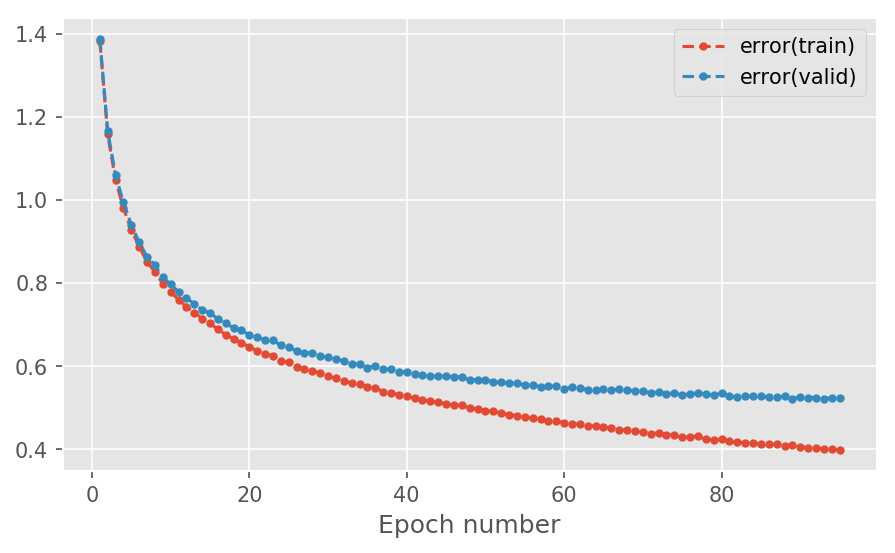

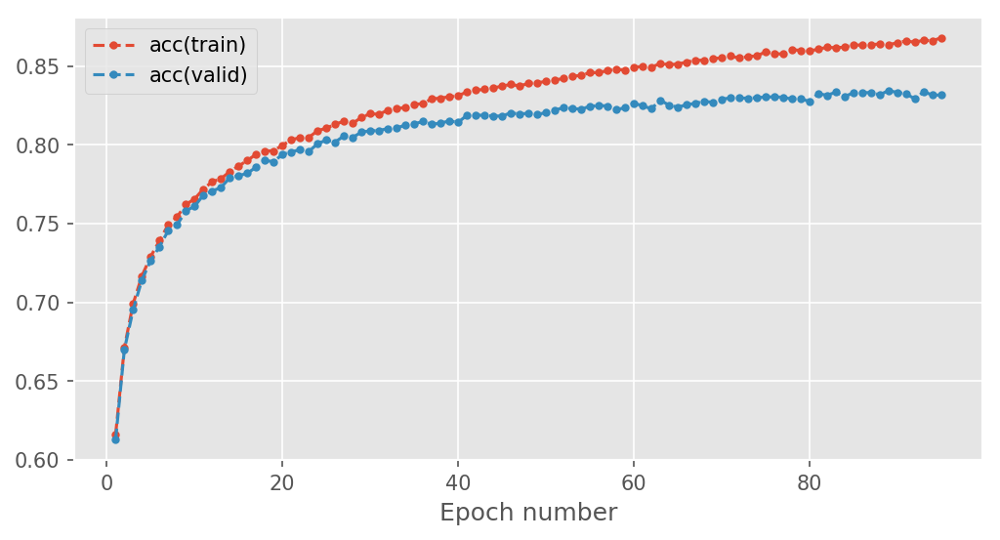

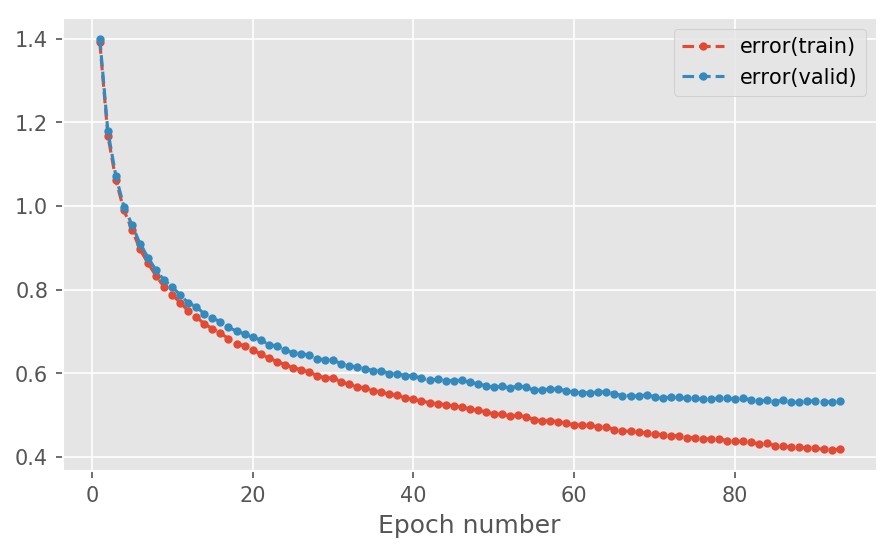

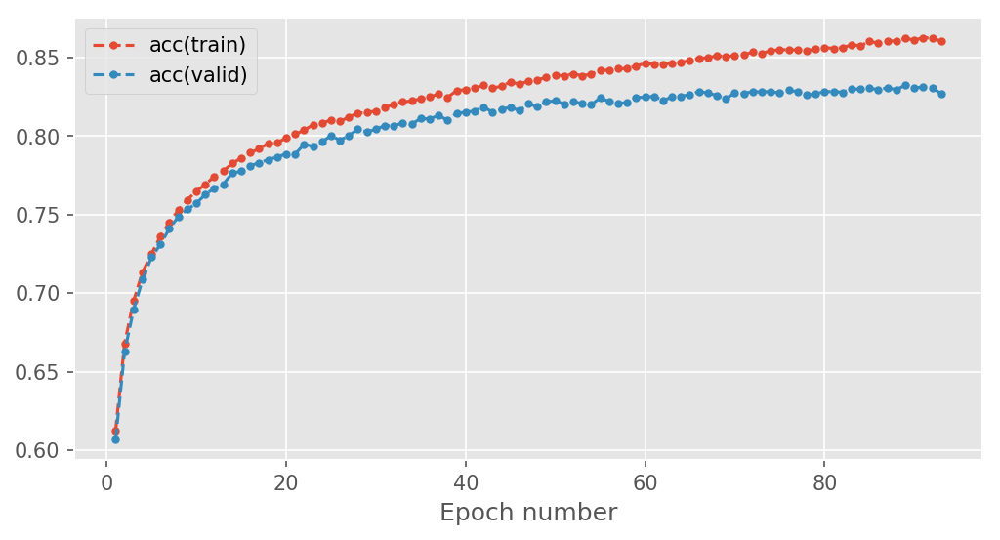

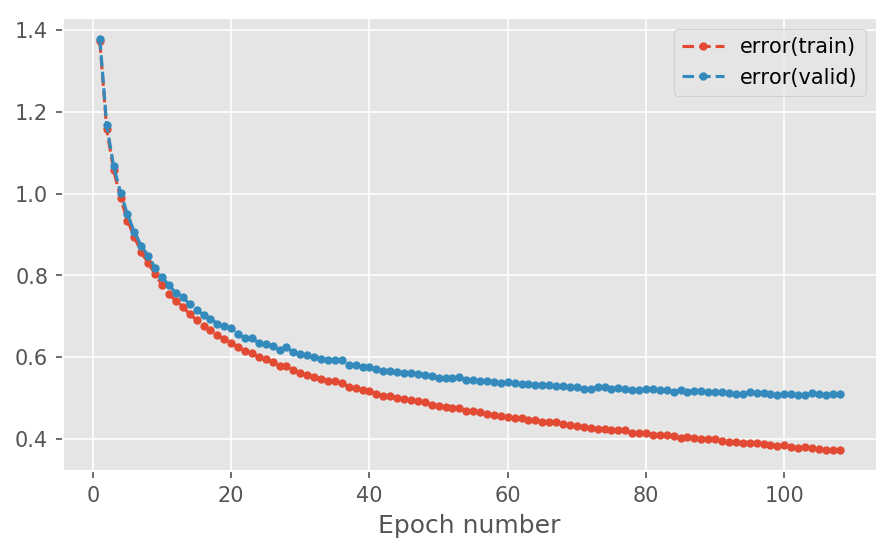

...

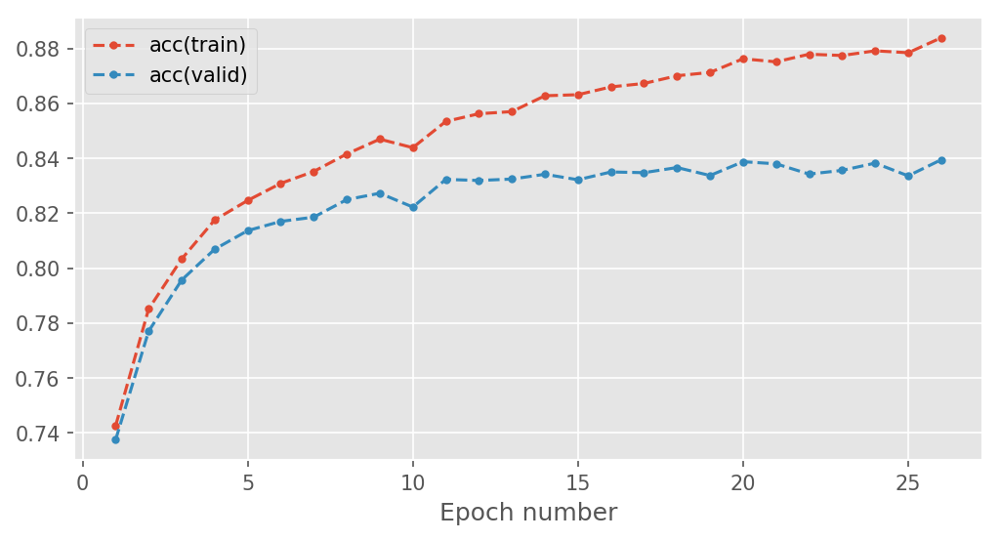

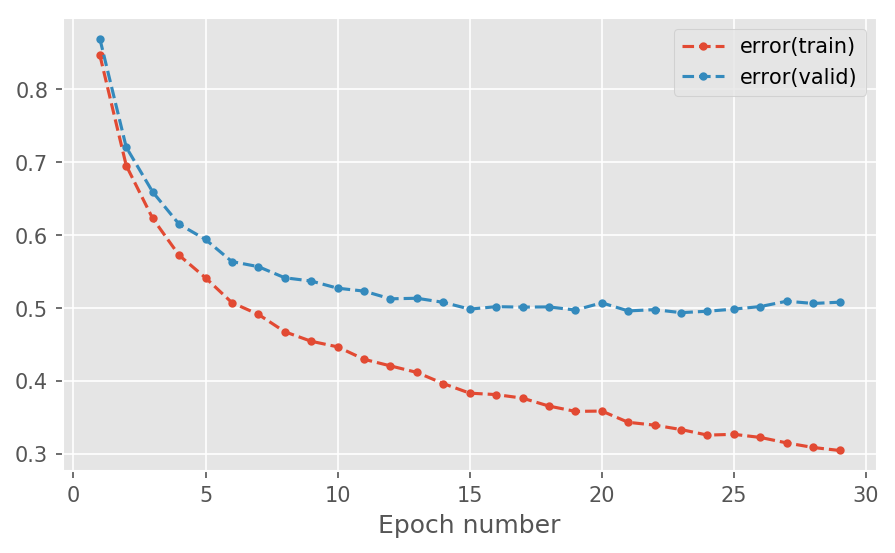

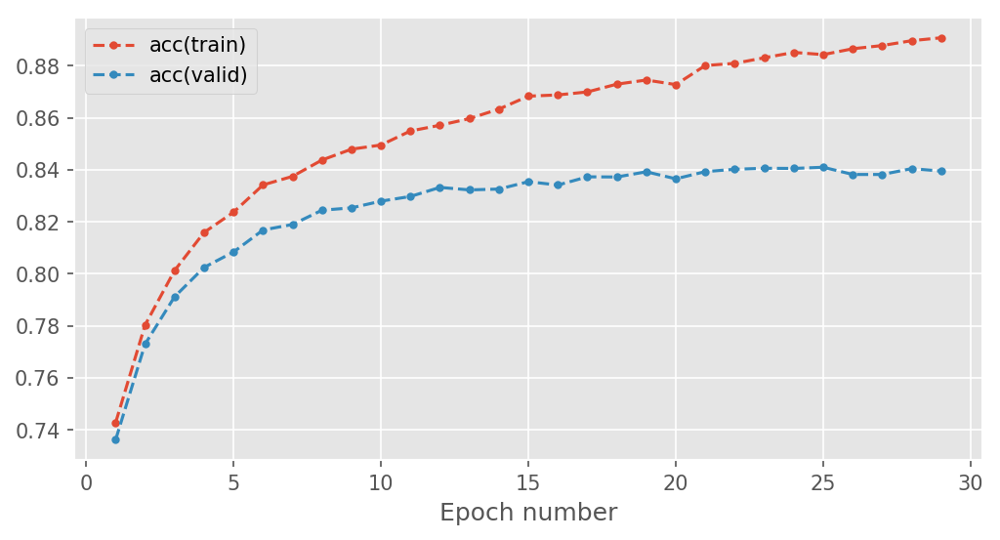

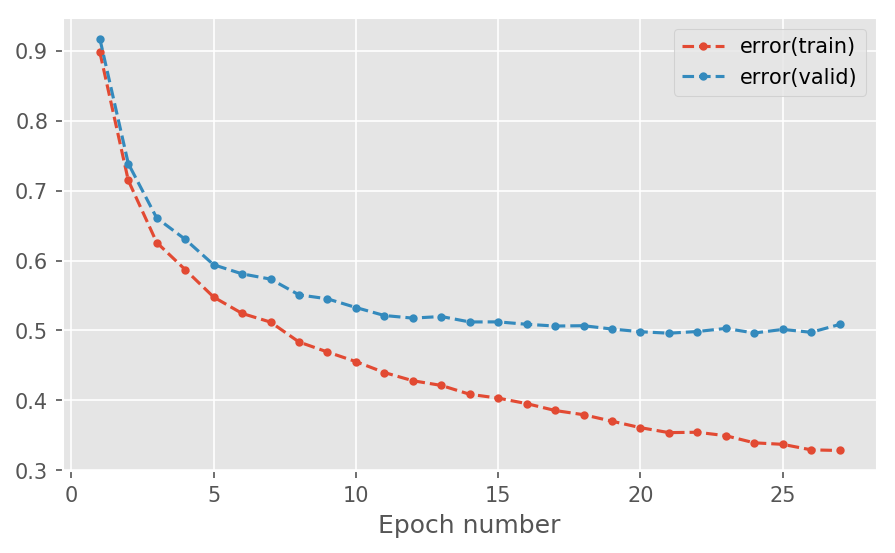

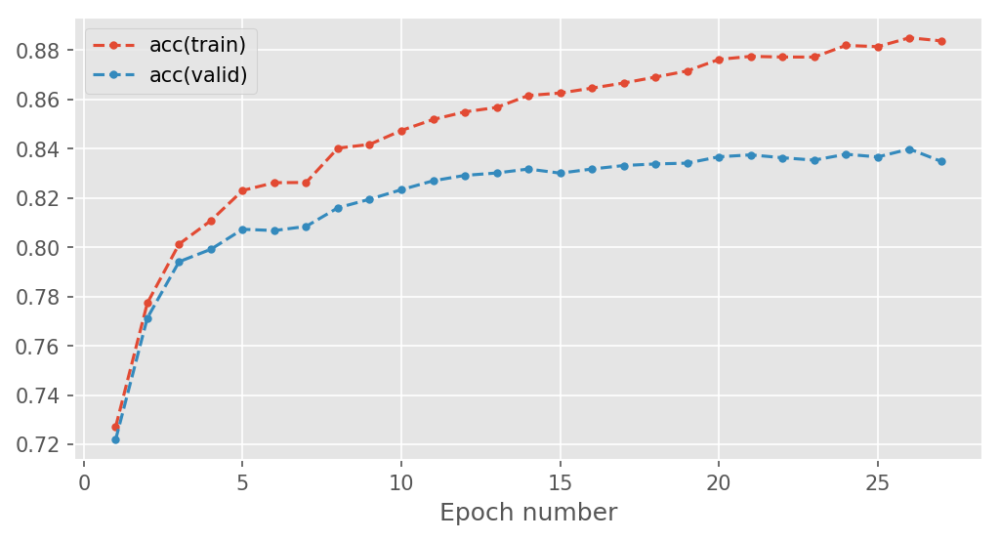

In [27]:
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 500

import importlib
import mlp
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule
importlib.reload(mlp.optimisers)
importlib.reload(mlp.learning_rules)
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule

learning_rates=np.linspace(1e-4,5e-4,5)
betas_1=np.linspace(0.825,0.925,5)

rates_ADAM=[]
for learning_rate in learning_rates:
    betas_ADAM=[]
    for beta_1 in betas_1:
        
        print(learning_rate,beta_1)
        logger = logging.getLogger()
        logger.setLevel(logging.INFO)
        logger.handlers = [logging.StreamHandler()]

# Create data provider objects for the MNIST data set
        train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
        valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
        test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)

#setup hyperparameter
        num_epochs = 300
        stats_interval = 1
        input_dim, output_dim, hidden_dim = 784, 47, 100

        weights_init = GlorotUniformInit(rng=rng)
        biases_init = ConstantInit(0.)
        model = MultipleLayerModel([
            AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
            ReluLayer(),
            AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
            ReluLayer(),
            AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
            ReluLayer(),
            AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
            ReluLayer(),
            AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
        ])
 
        error = CrossEntropySoftmaxError()
# Use a basic gradient descent learning rule
        learning_rule = AdamLearningRule(learning_rate,beta_1)

#Remember to use notebook=False when you write a script to be run in a terminal
        _ADAM = train_model_and_plot_stats(
            model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval, notebook=True)
    
        betas_ADAM.append(_ADAM)
    rates_ADAM.append(betas_ADAM)

## 

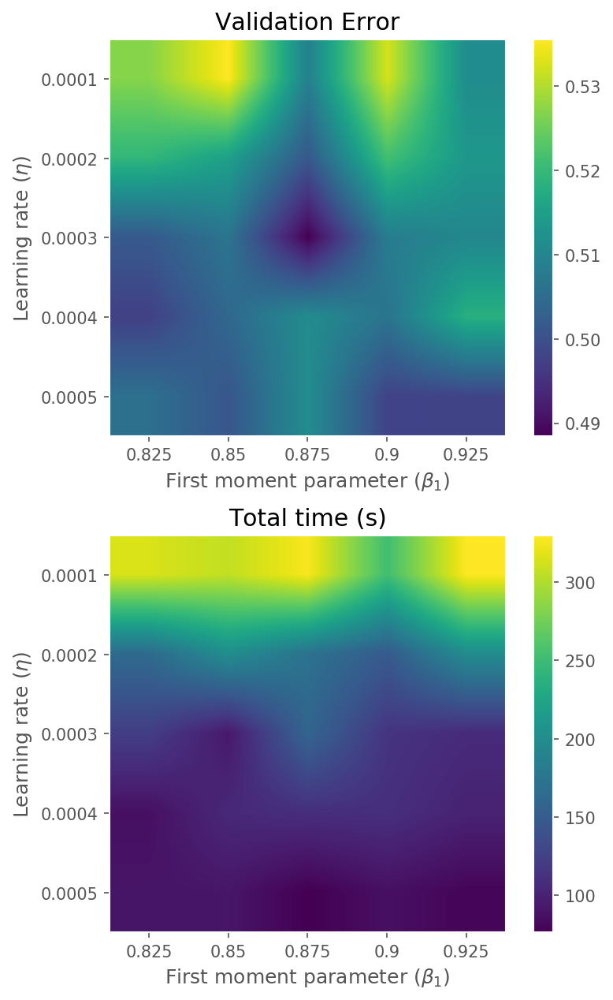

In [46]:
from mpl_toolkits.mplot3d import Axes3D
times_RMS=np.zeros((5,5))
errors_RMS=np.zeros((5,5))
times_RMS_list=[]
errors_RMS_list=[]
for i in range (5):
    results=rates_ADAM[i]
    for j in range(5):
        result=results[j]
        times_RMS[i,j]=result[-7]
        errors_RMS[i,j]=result[0][result[-2]-1][2]
        times_RMS_list.append(result[-7])
        errors_RMS_list.append(result[0][result[-2]-1][2])

fig=plt.figure(figsize=(6,10),dpi=150)
fig.subplots_adjust(hspace=0.25)

plt.rcParams["axes.grid"] = False
ax1=fig.add_subplot(211)
ax1.set_title("Validation Error")
im1=ax1.imshow(errors_RMS,interpolation='bilinear')
ax1.set_xticklabels([8.25]+list(betas_1))
ax1.set_yticklabels([1e-4]+list(np.round(learning_rates,4)))
ax1.set_ylabel("Learning rate ($\eta$)")
ax1.set_xlabel(r'First moment parameter ($\beta_1$)') 


fig.colorbar(im1, orientation="vertical", pad=0.05)


ax2=fig.add_subplot(212)
ax2.set_title("Total time (s)")
im2=ax2.imshow(times_RMS,interpolation='bilinear')
ax2.set_yticklabels([1e-4]+list(np.round(learning_rates,4)))
ax2.set_xticklabels([8.25]+list(betas_1))
ax2.set_ylabel("Learning rate ($\eta$)")
ax2.set_xlabel(r'First moment parameter ($\beta_1$)')

fig.colorbar(im2, orientation="vertical", pad=0.05)


fig.savefig("learning_beta1_ADAM.png")

In [39]:
rates_list

[0.0001,
 0.0002,
 0.00030000000000000003,
 0.0004,
 0.0005,
 0.0001,
 0.0002,
 0.00030000000000000003,
 0.0004,
 0.0005,
 0.0001,
 0.0002,
 0.00030000000000000003,
 0.0004,
 0.0005,
 0.0001,
 0.0002,
 0.00030000000000000003,
 0.0004,
 0.0005,
 0.0001,
 0.0002,
 0.00030000000000000003,
 0.0004,
 0.0005]

In [37]:
betas_1_list

[0.825,
 0.825,
 0.825,
 0.825,
 0.825,
 0.85,
 0.85,
 0.85,
 0.85,
 0.85,
 0.875,
 0.875,
 0.875,
 0.875,
 0.875,
 0.9,
 0.9,
 0.9,
 0.9,
 0.9,
 0.925,
 0.925,
 0.925,
 0.925,
 0.925]


KeysView(<numpy.lib.npyio.NpzFile object at 0x1216211d0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1216211d0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1216211d0>)


Epoch 1: 2.4s to complete
    error(train)=9.57e-01, acc(train)=7.15e-01, error(valid)=9.67e-01, acc(valid)=7.15e-01


1


Epoch 2: 2.4s to complete
    error(train)=7.71e-01, acc(train)=7.64e-01, error(valid)=7.84e-01, acc(valid)=7.55e-01


2


Epoch 3: 2.7s to complete
    error(train)=6.82e-01, acc(train)=7.87e-01, error(valid)=7.07e-01, acc(valid)=7.80e-01


3


Epoch 4: 2.7s to complete
    error(train)=6.36e-01, acc(train)=8.01e-01, error(valid)=6.59e-01, acc(valid)=7.94e-01


4


Epoch 5: 2.6s to complete
    error(train)=5.93e-01, acc(train)=8.12e-01, error(valid)=6.24e-01, acc(valid)=8.03e-01


5


Epoch 6: 2.4s to complete
    error(train)=5.67e-01, acc(train)=8.19e-01, error(valid)=6.03e-01, acc(valid)=8.09e-01


6


Epoch 7: 2.4s to complete
    error(train)=5.41e-01, acc(train)=8.26e-01, error(valid)=5.79e-01, acc(valid)=8.16e-01


7


Epoch 8: 2.4s to complete
    error(train)=5.29e-01, acc(train)=8.29e-01, error(valid)=5.76e-01, acc(valid)=8.17e-01


8


Epoch 9: 2.4s to complete
    error(train)=5.12e-01, acc(train)=8.34e-01, error(valid)=5.58e-01, acc(valid)=8.21e-01


9


Epoch 10: 2.4s to complete
    error(train)=4.95e-01, acc(train)=8.37e-01, error(valid)=5.46e-01, acc(valid)=8.22e-01


10


Epoch 11: 2.4s to complete
    error(train)=4.84e-01, acc(train)=8.41e-01, error(valid)=5.38e-01, acc(valid)=8.27e-01


11


Epoch 12: 2.4s to complete
    error(train)=4.74e-01, acc(train)=8.44e-01, error(valid)=5.36e-01, acc(valid)=8.26e-01


12


Epoch 13: 2.5s to complete
    error(train)=4.67e-01, acc(train)=8.45e-01, error(valid)=5.32e-01, acc(valid)=8.25e-01


13


Epoch 14: 2.4s to complete
    error(train)=4.55e-01, acc(train)=8.49e-01, error(valid)=5.19e-01, acc(valid)=8.30e-01


14


Epoch 15: 3.3s to complete
    error(train)=4.43e-01, acc(train)=8.52e-01, error(valid)=5.15e-01, acc(valid)=8.31e-01


15


Epoch 16: 3.2s to complete
    error(train)=4.39e-01, acc(train)=8.53e-01, error(valid)=5.10e-01, acc(valid)=8.34e-01


16


Epoch 17: 2.4s to complete
    error(train)=4.28e-01, acc(train)=8.57e-01, error(valid)=5.06e-01, acc(valid)=8.36e-01


17


Epoch 18: 2.4s to complete
    error(train)=4.24e-01, acc(train)=8.57e-01, error(valid)=5.03e-01, acc(valid)=8.36e-01


18


Epoch 19: 2.4s to complete
    error(train)=4.13e-01, acc(train)=8.62e-01, error(valid)=4.95e-01, acc(valid)=8.40e-01


19


Epoch 20: 2.4s to complete
    error(train)=4.10e-01, acc(train)=8.62e-01, error(valid)=4.96e-01, acc(valid)=8.38e-01


Epoch 21: 2.5s to complete
    error(train)=4.15e-01, acc(train)=8.60e-01, error(valid)=5.09e-01, acc(valid)=8.33e-01


Epoch 22: 2.4s to complete
    error(train)=4.05e-01, acc(train)=8.61e-01, error(valid)=4.98e-01, acc(valid)=8.35e-01


Epoch 23: 2.4s to complete
    error(train)=3.99e-01, acc(train)=8.64e-01, error(valid)=4.96e-01, acc(valid)=8.35e-01


Epoch 24: 2.4s to complete
    error(train)=3.89e-01, acc(train)=8.68e-01, error(valid)=4.87e-01, acc(valid)=8.39e-01


24


Epoch 25: 2.4s to complete
    error(train)=3.86e-01, acc(train)=8.68e-01, error(valid)=4.88e-01, acc(valid)=8.37e-01


Epoch 26: 2.5s to complete
    error(train)=3.78e-01, acc(train)=8.71e-01, error(valid)=4.84e-01, acc(valid)=8.40e-01


26


Epoch 27: 2.4s to complete
    error(train)=3.71e-01, acc(train)=8.74e-01, error(valid)=4.80e-01, acc(valid)=8.45e-01


27


Epoch 28: 2.5s to complete
    error(train)=3.74e-01, acc(train)=8.72e-01, error(valid)=4.87e-01, acc(valid)=8.37e-01


Epoch 29: 2.5s to complete
    error(train)=3.64e-01, acc(train)=8.75e-01, error(valid)=4.80e-01, acc(valid)=8.44e-01


29


Epoch 30: 2.4s to complete
    error(train)=3.63e-01, acc(train)=8.75e-01, error(valid)=4.84e-01, acc(valid)=8.42e-01


Epoch 31: 2.5s to complete
    error(train)=3.58e-01, acc(train)=8.77e-01, error(valid)=4.83e-01, acc(valid)=8.43e-01


Epoch 32: 2.4s to complete
    error(train)=3.55e-01, acc(train)=8.78e-01, error(valid)=4.81e-01, acc(valid)=8.44e-01


Epoch 33: 2.4s to complete
    error(train)=3.52e-01, acc(train)=8.79e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


Epoch 34: 2.5s to complete
    error(train)=3.52e-01, acc(train)=8.78e-01, error(valid)=4.83e-01, acc(valid)=8.42e-01


Epoch 35: 2.4s to complete
    error(train)=3.43e-01, acc(train)=8.81e-01, error(valid)=4.76e-01, acc(valid)=8.44e-01


35


Epoch 36: 2.5s to complete
    error(train)=3.45e-01, acc(train)=8.80e-01, error(valid)=4.81e-01, acc(valid)=8.45e-01


Epoch 37: 2.4s to complete
    error(train)=3.34e-01, acc(train)=8.85e-01, error(valid)=4.77e-01, acc(valid)=8.45e-01


Epoch 38: 2.5s to complete
    error(train)=3.37e-01, acc(train)=8.82e-01, error(valid)=4.87e-01, acc(valid)=8.42e-01


Epoch 39: 2.4s to complete
    error(train)=3.30e-01, acc(train)=8.85e-01, error(valid)=4.82e-01, acc(valid)=8.44e-01


Epoch 40: 2.7s to complete
    error(train)=3.28e-01, acc(train)=8.84e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


Epoch 41: 2.4s to complete
    error(train)=3.24e-01, acc(train)=8.86e-01, error(valid)=4.81e-01, acc(valid)=8.45e-01


 hola



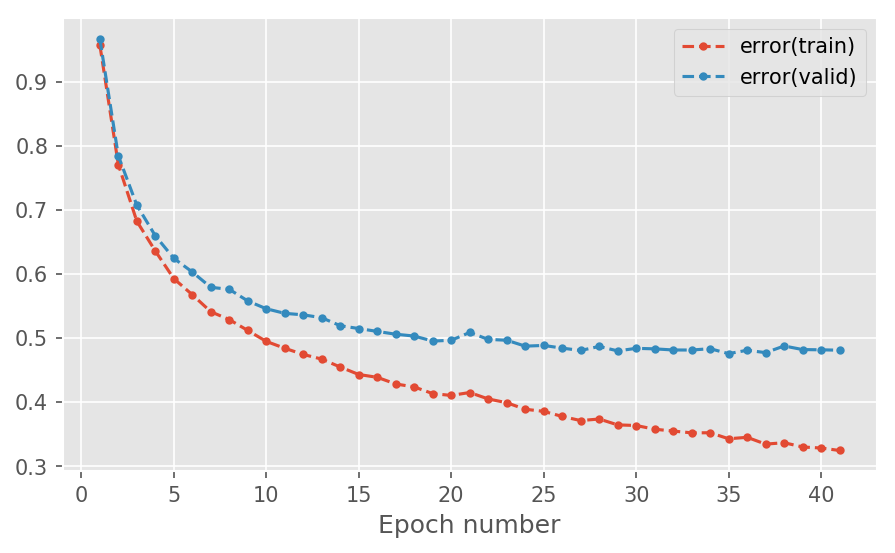

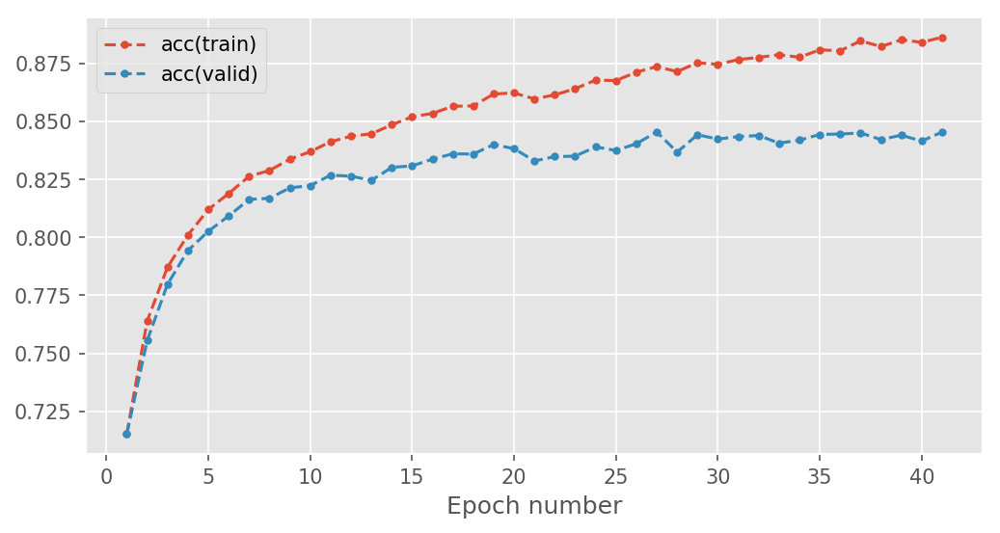

In [22]:
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 500

import importlib
import mlp
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule
importlib.reload(mlp.optimisers)
importlib.reload(mlp.learning_rules)
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule


betas_2_ADAM=[]

betas_2=np.linspace(0.9985,0.9995,11)

for i in range(1):
        
    print()
    logger = logging.getLogger()
    logger.setLevel(logging.INFO)
    logger.handlers = [logging.StreamHandler()]

# Create data provider objects for the MNIST data set
    train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
    valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
    test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)
    
#setup hyperparameter
    num_epochs = 300
    stats_interval = 1
    input_dim, output_dim, hidden_dim = 784, 47, 100

    weights_init = GlorotUniformInit(rng=rng)
    biases_init = ConstantInit(0.)
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
        ReluLayer(),
        AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
    ])
 
    error = CrossEntropySoftmaxError()
# Use a basic gradient descent learning rule
    learning_rule = AdamLearningRule(learning_rate=3e-4,beta_1=0.875,beta_2=0.9992)

#Remember to use notebook=False when you write a script to be run in a terminal
    _ADAM = train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval, notebook=True)
    
    betas_2_ADAM.append(_ADAM)


In [16]:
np.linspace(0.9985,0.9995,11)

array([0.9985, 0.9986, 0.9987, 0.9988, 0.9989, 0.999 , 0.9991, 0.9992,
       0.9993, 0.9994, 0.9995])

In [21]:
betas_2_ADAM_1=betas_2_ADAM

In [23]:
np.linspace(0.9985,0.9995,11)

array([0.9985, 0.9986, 0.9987, 0.9988, 0.9989, 0.999 , 0.9991, 0.9992,
       0.9993, 0.9994, 0.9995])

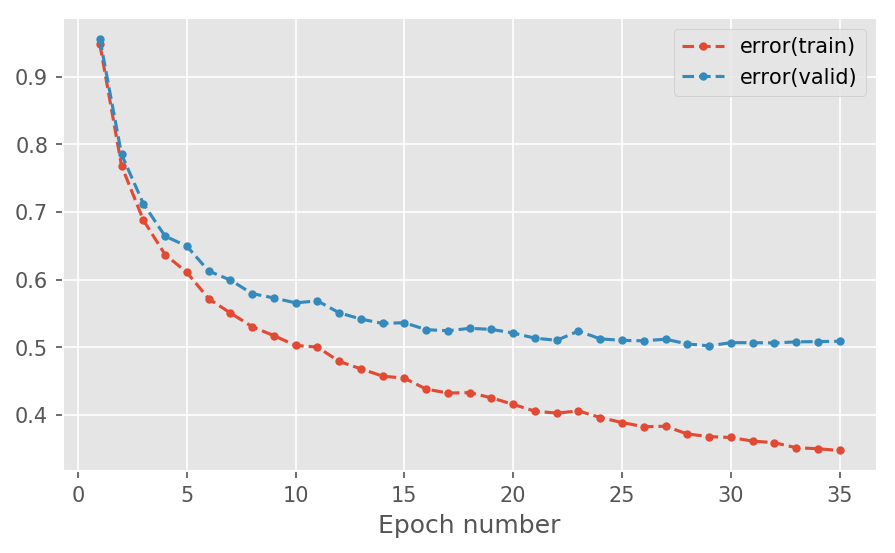

In [25]:
betas_2_ADAM_1[7][

ERROR for ADAM

In [26]:
outputs=(betas_2_ADAM[0][-1].fprop(test_data.inputs)[-1])
targets=MNISTDataProvider.to_one_of_k(test_data,test_data.targets)
CrossEntropySoftmaxError.__call__(error,outputs,targets)

0.5296590777454872

KeysView(<numpy.lib.npyio.NpzFile object at 0x1015d49b0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x116ce3f28>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1015d4a90>)


Epoch 1: 2.7s to complete
    error(train)=2.19e+00, acc(train)=4.11e-01, error(valid)=2.19e+00, acc(valid)=4.09e-01


1


Epoch 2: 3.0s to complete
    error(train)=8.27e-01, acc(train)=7.41e-01, error(valid)=8.51e-01, acc(valid)=7.33e-01


2


Epoch 3: 2.8s to complete
    error(train)=6.44e-01, acc(train)=7.88e-01, error(valid)=6.79e-01, acc(valid)=7.75e-01


3


Epoch 4: 3.1s to complete
    error(train)=5.58e-01, acc(train)=8.15e-01, error(valid)=6.04e-01, acc(valid)=8.00e-01


4


Epoch 5: 2.5s to complete
    error(train)=5.08e-01, acc(train)=8.26e-01, error(valid)=5.67e-01, acc(valid)=8.11e-01


5


Epoch 6: 2.6s to complete
    error(train)=4.68e-01, acc(train)=8.39e-01, error(valid)=5.37e-01, acc(valid)=8.21e-01


6


Epoch 7: 2.6s to complete
    error(train)=4.58e-01, acc(train)=8.41e-01, error(valid)=5.42e-01, acc(valid)=8.20e-01


Epoch 8: 2.5s to complete
    error(train)=4.35e-01, acc(train)=8.50e-01, error(valid)=5.29e-01, acc(valid)=8.26e-01


8


Epoch 9: 2.5s to complete
    error(train)=4.15e-01, acc(train)=8.56e-01, error(valid)=5.16e-01, acc(valid)=8.27e-01


9


Epoch 10: 2.5s to complete
    error(train)=4.16e-01, acc(train)=8.51e-01, error(valid)=5.31e-01, acc(valid)=8.19e-01


Epoch 11: 2.6s to complete
    error(train)=3.84e-01, acc(train)=8.65e-01, error(valid)=5.04e-01, acc(valid)=8.31e-01


11


Epoch 12: 2.5s to complete
    error(train)=3.50e-01, acc(train)=8.75e-01, error(valid)=4.78e-01, acc(valid)=8.39e-01


12


Epoch 13: 2.5s to complete
    error(train)=3.53e-01, acc(train)=8.72e-01, error(valid)=4.92e-01, acc(valid)=8.33e-01


Epoch 14: 2.5s to complete
    error(train)=3.47e-01, acc(train)=8.74e-01, error(valid)=4.92e-01, acc(valid)=8.35e-01


Epoch 15: 2.5s to complete
    error(train)=3.58e-01, acc(train)=8.69e-01, error(valid)=5.13e-01, acc(valid)=8.30e-01


Epoch 16: 2.6s to complete
    error(train)=3.16e-01, acc(train)=8.83e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


Epoch 17: 2.5s to complete
    error(train)=3.25e-01, acc(train)=8.81e-01, error(valid)=5.03e-01, acc(valid)=8.35e-01


Epoch 18: 2.5s to complete
    error(train)=3.10e-01, acc(train)=8.85e-01, error(valid)=4.95e-01, acc(valid)=8.38e-01


Epoch 19: 2.7s to complete
    error(train)=2.90e-01, acc(train)=8.91e-01, error(valid)=4.93e-01, acc(valid)=8.41e-01


Epoch 20: 2.6s to complete
    error(train)=3.12e-01, acc(train)=8.84e-01, error(valid)=5.21e-01, acc(valid)=8.32e-01


Epoch 21: 2.6s to complete
    error(train)=2.82e-01, acc(train)=8.93e-01, error(valid)=5.07e-01, acc(valid)=8.39e-01


Epoch 22: 2.9s to complete
    error(train)=2.82e-01, acc(train)=8.93e-01, error(valid)=5.05e-01, acc(valid)=8.39e-01


Epoch 23: 3.0s to complete
    error(train)=2.86e-01, acc(train)=8.91e-01, error(valid)=5.33e-01, acc(valid)=8.36e-01


Epoch 24: 2.6s to complete
    error(train)=2.62e-01, acc(train)=9.00e-01, error(valid)=5.09e-01, acc(valid)=8.40e-01


Epoch 25: 3.1s to complete
    error(train)=2.56e-01, acc(train)=9.02e-01, error(valid)=5.11e-01, acc(valid)=8.40e-01


Epoch 26: 2.9s to complete
    error(train)=2.74e-01, acc(train)=8.94e-01, error(valid)=5.35e-01, acc(valid)=8.33e-01


Epoch 27: 2.5s to complete
    error(train)=2.56e-01, acc(train)=8.99e-01, error(valid)=5.37e-01, acc(valid)=8.35e-01


Epoch 28: 3.0s to complete
    error(train)=2.52e-01, acc(train)=8.99e-01, error(valid)=5.42e-01, acc(valid)=8.35e-01


Epoch 29: 3.4s to complete
    error(train)=2.48e-01, acc(train)=9.01e-01, error(valid)=5.46e-01, acc(valid)=8.36e-01


Epoch 30: 2.5s to complete
    error(train)=2.49e-01, acc(train)=9.02e-01, error(valid)=5.55e-01, acc(valid)=8.35e-01


Epoch 31: 2.6s to complete
    error(train)=2.22e-01, acc(train)=9.11e-01, error(valid)=5.35e-01, acc(valid)=8.38e-01


Epoch 32: 2.4s to complete
    error(train)=2.26e-01, acc(train)=9.11e-01, error(valid)=5.58e-01, acc(valid)=8.38e-01


Epoch 33: 3.2s to complete
    error(train)=2.29e-01, acc(train)=9.08e-01, error(valid)=5.72e-01, acc(valid)=8.32e-01


Epoch 34: 2.7s to complete
    error(train)=2.14e-01, acc(train)=9.16e-01, error(valid)=5.61e-01, acc(valid)=8.40e-01


Epoch 35: 2.2s to complete
    error(train)=2.10e-01, acc(train)=9.15e-01, error(valid)=5.80e-01, acc(valid)=8.36e-01


Epoch 36: 2.5s to complete
    error(train)=2.05e-01, acc(train)=9.18e-01, error(valid)=5.74e-01, acc(valid)=8.35e-01


Epoch 37: 2.1s to complete
    error(train)=1.99e-01, acc(train)=9.19e-01, error(valid)=5.85e-01, acc(valid)=8.35e-01


Epoch 38: 2.1s to complete
    error(train)=2.01e-01, acc(train)=9.19e-01, error(valid)=6.12e-01, acc(valid)=8.35e-01


Epoch 39: 2.2s to complete
    error(train)=1.86e-01, acc(train)=9.26e-01, error(valid)=6.01e-01, acc(valid)=8.39e-01


Epoch 40: 2.1s to complete
    error(train)=1.83e-01, acc(train)=9.27e-01, error(valid)=6.10e-01, acc(valid)=8.36e-01


Epoch 41: 2.2s to complete
    error(train)=1.82e-01, acc(train)=9.27e-01, error(valid)=6.04e-01, acc(valid)=8.35e-01


Epoch 42: 2.1s to complete
    error(train)=1.88e-01, acc(train)=9.25e-01, error(valid)=6.25e-01, acc(valid)=8.34e-01


Epoch 43: 2.2s to complete
    error(train)=1.76e-01, acc(train)=9.28e-01, error(valid)=6.42e-01, acc(valid)=8.36e-01


Epoch 44: 2.1s to complete
    error(train)=1.71e-01, acc(train)=9.31e-01, error(valid)=6.30e-01, acc(valid)=8.35e-01


Epoch 45: 2.6s to complete
    error(train)=1.77e-01, acc(train)=9.27e-01, error(valid)=6.61e-01, acc(valid)=8.30e-01


Epoch 46: 3.2s to complete
    error(train)=1.57e-01, acc(train)=9.37e-01, error(valid)=6.53e-01, acc(valid)=8.36e-01


Epoch 47: 2.2s to complete
    error(train)=1.60e-01, acc(train)=9.34e-01, error(valid)=6.72e-01, acc(valid)=8.32e-01


Epoch 48: 2.1s to complete
    error(train)=1.50e-01, acc(train)=9.39e-01, error(valid)=6.71e-01, acc(valid)=8.37e-01


Epoch 49: 3.0s to complete
    error(train)=1.60e-01, acc(train)=9.35e-01, error(valid)=7.02e-01, acc(valid)=8.34e-01


Epoch 50: 2.1s to complete
    error(train)=1.44e-01, acc(train)=9.41e-01, error(valid)=6.86e-01, acc(valid)=8.34e-01


Epoch 51: 2.3s to complete
    error(train)=1.45e-01, acc(train)=9.41e-01, error(valid)=7.15e-01, acc(valid)=8.33e-01


Epoch 52: 2.5s to complete
    error(train)=1.41e-01, acc(train)=9.43e-01, error(valid)=7.24e-01, acc(valid)=8.34e-01


Epoch 53: 2.2s to complete
    error(train)=1.35e-01, acc(train)=9.45e-01, error(valid)=7.33e-01, acc(valid)=8.30e-01


Epoch 54: 2.2s to complete
    error(train)=1.31e-01, acc(train)=9.47e-01, error(valid)=7.43e-01, acc(valid)=8.35e-01


Epoch 55: 2.7s to complete
    error(train)=1.31e-01, acc(train)=9.46e-01, error(valid)=7.65e-01, acc(valid)=8.37e-01


Epoch 56: 2.4s to complete
    error(train)=1.22e-01, acc(train)=9.51e-01, error(valid)=7.49e-01, acc(valid)=8.34e-01


Epoch 57: 2.2s to complete
    error(train)=1.19e-01, acc(train)=9.51e-01, error(valid)=7.71e-01, acc(valid)=8.36e-01


Epoch 58: 2.3s to complete
    error(train)=1.23e-01, acc(train)=9.50e-01, error(valid)=7.90e-01, acc(valid)=8.32e-01


Epoch 59: 2.7s to complete
    error(train)=1.15e-01, acc(train)=9.54e-01, error(valid)=7.97e-01, acc(valid)=8.30e-01


Epoch 60: 2.4s to complete
    error(train)=1.12e-01, acc(train)=9.55e-01, error(valid)=7.97e-01, acc(valid)=8.34e-01


Epoch 61: 2.7s to complete
    error(train)=1.12e-01, acc(train)=9.54e-01, error(valid)=8.17e-01, acc(valid)=8.30e-01


Epoch 62: 2.1s to complete
    error(train)=1.05e-01, acc(train)=9.57e-01, error(valid)=8.25e-01, acc(valid)=8.33e-01


Epoch 63: 2.3s to complete
    error(train)=1.03e-01, acc(train)=9.59e-01, error(valid)=8.35e-01, acc(valid)=8.37e-01


Epoch 64: 2.7s to complete
    error(train)=1.03e-01, acc(train)=9.59e-01, error(valid)=8.54e-01, acc(valid)=8.32e-01


Epoch 65: 2.2s to complete
    error(train)=9.89e-02, acc(train)=9.60e-01, error(valid)=8.58e-01, acc(valid)=8.33e-01


Epoch 66: 2.4s to complete
    error(train)=9.63e-02, acc(train)=9.61e-01, error(valid)=8.65e-01, acc(valid)=8.32e-01


Epoch 67: 2.4s to complete
    error(train)=9.42e-02, acc(train)=9.63e-01, error(valid)=8.78e-01, acc(valid)=8.32e-01


Epoch 68: 2.2s to complete
    error(train)=9.40e-02, acc(train)=9.62e-01, error(valid)=9.00e-01, acc(valid)=8.32e-01


Epoch 69: 2.1s to complete
    error(train)=9.18e-02, acc(train)=9.63e-01, error(valid)=8.99e-01, acc(valid)=8.32e-01


Epoch 70: 2.2s to complete
    error(train)=9.15e-02, acc(train)=9.64e-01, error(valid)=9.05e-01, acc(valid)=8.33e-01


Epoch 71: 2.2s to complete
    error(train)=8.80e-02, acc(train)=9.65e-01, error(valid)=9.24e-01, acc(valid)=8.30e-01


Epoch 72: 2.1s to complete
    error(train)=8.43e-02, acc(train)=9.67e-01, error(valid)=9.26e-01, acc(valid)=8.32e-01


Epoch 73: 2.4s to complete
    error(train)=8.26e-02, acc(train)=9.69e-01, error(valid)=9.37e-01, acc(valid)=8.32e-01


Epoch 74: 2.2s to complete
    error(train)=8.07e-02, acc(train)=9.69e-01, error(valid)=9.46e-01, acc(valid)=8.31e-01


Epoch 75: 2.3s to complete
    error(train)=8.12e-02, acc(train)=9.69e-01, error(valid)=9.55e-01, acc(valid)=8.30e-01


Epoch 76: 2.9s to complete
    error(train)=7.80e-02, acc(train)=9.71e-01, error(valid)=9.62e-01, acc(valid)=8.31e-01


Epoch 77: 2.5s to complete
    error(train)=7.72e-02, acc(train)=9.71e-01, error(valid)=9.69e-01, acc(valid)=8.31e-01


Epoch 78: 2.8s to complete
    error(train)=7.60e-02, acc(train)=9.72e-01, error(valid)=9.74e-01, acc(valid)=8.30e-01


Epoch 79: 2.4s to complete
    error(train)=7.59e-02, acc(train)=9.71e-01, error(valid)=9.91e-01, acc(valid)=8.31e-01


Epoch 80: 2.5s to complete
    error(train)=7.38e-02, acc(train)=9.72e-01, error(valid)=9.97e-01, acc(valid)=8.30e-01


Epoch 81: 2.7s to complete
    error(train)=7.35e-02, acc(train)=9.72e-01, error(valid)=1.01e+00, acc(valid)=8.30e-01


Epoch 82: 2.5s to complete
    error(train)=7.28e-02, acc(train)=9.73e-01, error(valid)=1.01e+00, acc(valid)=8.32e-01


Epoch 83: 2.2s to complete
    error(train)=7.12e-02, acc(train)=9.74e-01, error(valid)=1.01e+00, acc(valid)=8.31e-01


Epoch 84: 2.2s to complete
    error(train)=7.04e-02, acc(train)=9.74e-01, error(valid)=1.02e+00, acc(valid)=8.30e-01


Epoch 85: 2.9s to complete
    error(train)=7.05e-02, acc(train)=9.74e-01, error(valid)=1.03e+00, acc(valid)=8.31e-01


Epoch 86: 2.3s to complete
    error(train)=7.01e-02, acc(train)=9.74e-01, error(valid)=1.03e+00, acc(valid)=8.30e-01


Epoch 87: 3.2s to complete
    error(train)=6.81e-02, acc(train)=9.75e-01, error(valid)=1.04e+00, acc(valid)=8.30e-01


Epoch 88: 3.1s to complete
    error(train)=6.81e-02, acc(train)=9.75e-01, error(valid)=1.04e+00, acc(valid)=8.32e-01


Epoch 89: 2.7s to complete
    error(train)=6.70e-02, acc(train)=9.75e-01, error(valid)=1.05e+00, acc(valid)=8.31e-01


Epoch 90: 2.2s to complete
    error(train)=6.57e-02, acc(train)=9.77e-01, error(valid)=1.05e+00, acc(valid)=8.30e-01


Epoch 91: 2.5s to complete
    error(train)=6.58e-02, acc(train)=9.76e-01, error(valid)=1.06e+00, acc(valid)=8.28e-01


Epoch 92: 2.1s to complete
    error(train)=6.56e-02, acc(train)=9.76e-01, error(valid)=1.06e+00, acc(valid)=8.31e-01


Epoch 93: 2.2s to complete
    error(train)=6.46e-02, acc(train)=9.77e-01, error(valid)=1.07e+00, acc(valid)=8.29e-01


Epoch 94: 2.2s to complete
    error(train)=6.44e-02, acc(train)=9.77e-01, error(valid)=1.07e+00, acc(valid)=8.29e-01


Epoch 95: 2.1s to complete
    error(train)=6.33e-02, acc(train)=9.77e-01, error(valid)=1.08e+00, acc(valid)=8.29e-01


Epoch 96: 2.1s to complete
    error(train)=6.41e-02, acc(train)=9.77e-01, error(valid)=1.08e+00, acc(valid)=8.29e-01


Epoch 97: 2.9s to complete
    error(train)=6.27e-02, acc(train)=9.78e-01, error(valid)=1.09e+00, acc(valid)=8.30e-01


Epoch 98: 2.3s to complete
    error(train)=6.33e-02, acc(train)=9.77e-01, error(valid)=1.09e+00, acc(valid)=8.29e-01


Epoch 99: 2.1s to complete
    error(train)=6.18e-02, acc(train)=9.78e-01, error(valid)=1.09e+00, acc(valid)=8.29e-01


Epoch 100: 2.1s to complete
    error(train)=6.14e-02, acc(train)=9.78e-01, error(valid)=1.10e+00, acc(valid)=8.29e-01


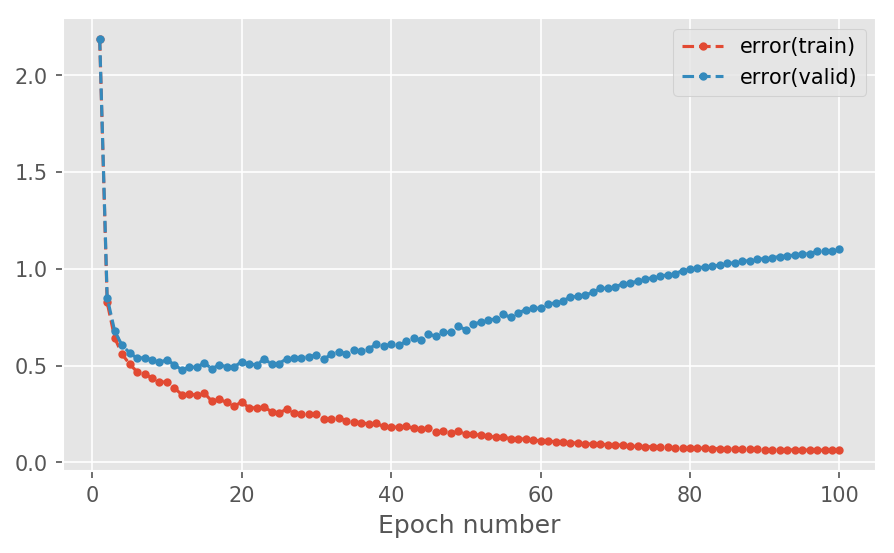

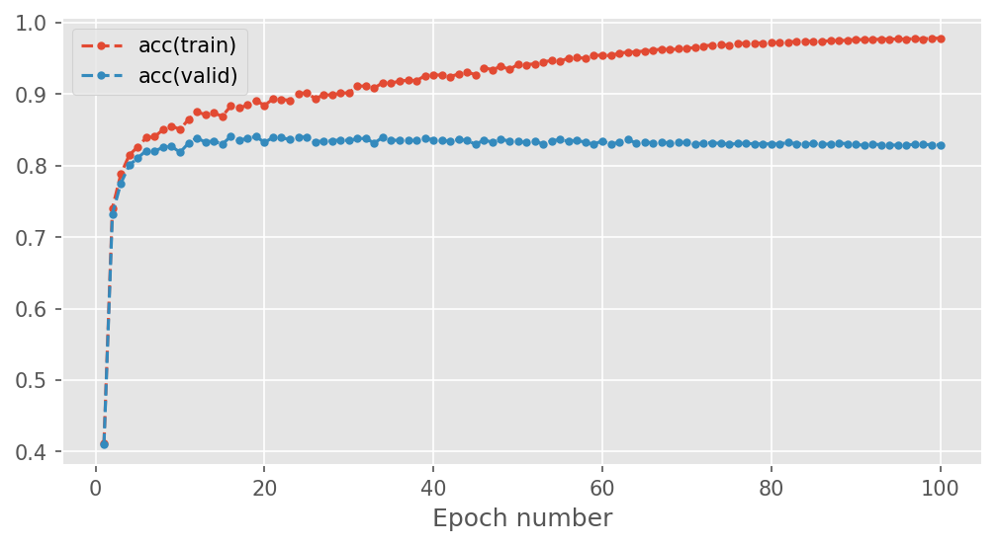

In [132]:
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 100

import importlib
import mlp
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule
importlib.reload(mlp.optimisers)
importlib.reload(mlp.learning_rules)
importlib.reload(mlp.schedulers)
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule
from mlp.schedulers import CosineAnnealingWithWarmRestarts

logger = logging.getLogger()
logger.setLevel(logging.INFO)
logger.handlers = [logging.StreamHandler()]

# Create data provider objects for the MNIST data set
train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)

#setup hyperparameter
learning_rate = 0.013
num_epochs = 100
stats_interval = 1

min_learning_rate=0.01
max_learning_rate=0.1
total_iters_per_period=100
max_learning_rate_discount_factor=0.2
period_iteration_expansion_factor=3

input_dim, output_dim, hidden_dim = 784, 47, 100

weights_init = GlorotUniformInit(rng=rng)
biases_init = ConstantInit(0.)
model = MultipleLayerModel([
    AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
])

error = CrossEntropySoftmaxError()
# Use a basic gradient descent learning rule
learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

scheduler=CosineAnnealingWithWarmRestarts(min_learning_rate=min_learning_rate,max_learning_rate=max_learning_rate,
                                         total_iters_per_period=total_iters_per_period,
                                          max_learning_rate_discount_factor=max_learning_rate_discount_factor,
                                         period_iteration_expansion_factor=period_iteration_expansion_factor)

#Remember to use notebook=False when you write a script to be run in a terminal
_CosineCDR1 = train_model_and_plot_stats(
    model, error, learning_rule, train_data, valid_data, num_epochs, scheduler,stats_interval, notebook=True)



In [330]:
importlib.reload(mlp.errors)
from mlp.errors import CrossEntropySoftmaxError
outputs=(_CosineCDR1[-2].fprop(test_data.inputs)[-1])
targets=MNISTDataProvider.to_one_of_k(test_data,test_data.targets)
CrossEntropySoftmaxError.__call__(error,outputs,targets)

(1.18030887182383, 0.031055311584502466, 0.8185443037974683)

In [335]:
_CosineADAM1[2]

346.62991213798523

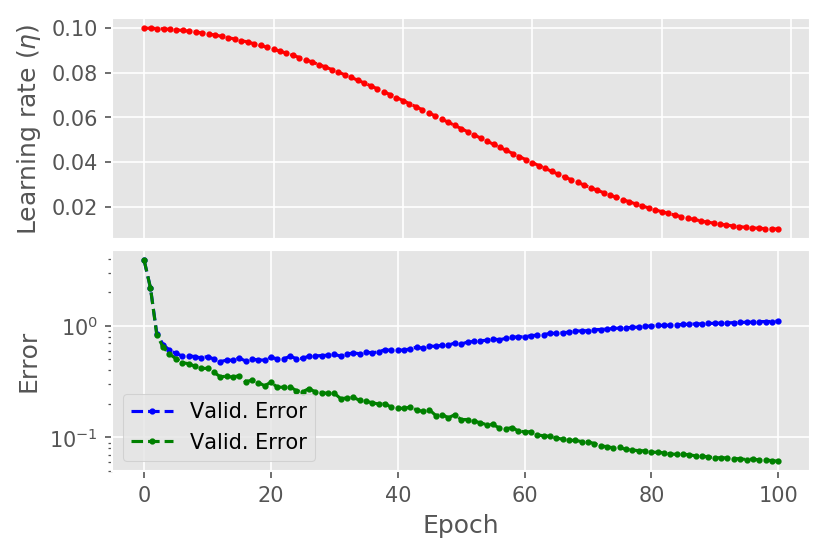

In [318]:
fig=plt.figure(figsize=(6,4),dpi=150)
fig.subplots_adjust(hspace=0.05)
ax1=fig.add_subplot(212)

ax1.plot(_CosineCDR1[0][:,2],'--o',c='b',label="Valid. Error",ms=2)
ax1.plot(_CosineCDR1[0][:,0],'--o',c='g',label="Valid. Error",ms=2)
ax1.set_yscale("log")

ax1.set_xlabel('Epoch')
ax1.set_ylabel('Error')
#ax2.set_ylim(0.001,0.01)

ax3=fig.add_subplot(211)
ax3.plot(_CosineCDR1[-1][:-1],"--o",c='r',label="Time",ms=2)
ax3.set_ylabel('Learning rate ($\eta$)')

ax3.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)
ax1.legend()
#ax1.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

fig.savefig("Cosine_SGD_1.png")

KeysView(<numpy.lib.npyio.NpzFile object at 0x1186e2c88>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1186e2eb8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x119a33518>)


0.04


Epoch 1: 2.9s to complete
    error(train)=2.19e+00, acc(train)=4.11e-01, error(valid)=2.19e+00, acc(valid)=4.09e-01


1


0.08


Epoch 2: 2.6s to complete
    error(train)=8.23e-01, acc(train)=7.41e-01, error(valid)=8.48e-01, acc(valid)=7.32e-01


2


0.12


Epoch 3: 3.3s to complete
    error(train)=6.55e-01, acc(train)=7.85e-01, error(valid)=6.89e-01, acc(valid)=7.73e-01


3


0.16


Epoch 4: 2.7s to complete
    error(train)=5.56e-01, acc(train)=8.15e-01, error(valid)=6.01e-01, acc(valid)=8.03e-01


4


0.2


Epoch 5: 2.4s to complete
    error(train)=5.01e-01, acc(train)=8.28e-01, error(valid)=5.59e-01, acc(valid)=8.12e-01


5


0.24


Epoch 6: 2.4s to complete
    error(train)=4.67e-01, acc(train)=8.42e-01, error(valid)=5.35e-01, acc(valid)=8.23e-01


6


0.28


Epoch 7: 2.3s to complete
    error(train)=4.60e-01, acc(train)=8.40e-01, error(valid)=5.44e-01, acc(valid)=8.21e-01


0.32


Epoch 8: 2.4s to complete
    error(train)=4.30e-01, acc(train)=8.51e-01, error(valid)=5.21e-01, acc(valid)=8.26e-01


8


0.36


Epoch 9: 2.2s to complete
    error(train)=4.03e-01, acc(train)=8.60e-01, error(valid)=5.05e-01, acc(valid)=8.32e-01


9


0.4


Epoch 10: 2.3s to complete
    error(train)=4.03e-01, acc(train)=8.55e-01, error(valid)=5.19e-01, acc(valid)=8.23e-01


0.44


Epoch 11: 2.2s to complete
    error(train)=3.74e-01, acc(train)=8.69e-01, error(valid)=4.95e-01, acc(valid)=8.36e-01


11


0.48


Epoch 12: 2.7s to complete
    error(train)=3.40e-01, acc(train)=8.80e-01, error(valid)=4.72e-01, acc(valid)=8.41e-01


12


0.52


Epoch 13: 2.4s to complete
    error(train)=3.35e-01, acc(train)=8.79e-01, error(valid)=4.80e-01, acc(valid)=8.38e-01


0.56


Epoch 14: 2.2s to complete
    error(train)=3.27e-01, acc(train)=8.82e-01, error(valid)=4.76e-01, acc(valid)=8.41e-01


0.6


Epoch 15: 2.7s to complete
    error(train)=3.18e-01, acc(train)=8.84e-01, error(valid)=4.80e-01, acc(valid)=8.43e-01


0.64


Epoch 16: 2.3s to complete
    error(train)=3.01e-01, acc(train)=8.91e-01, error(valid)=4.70e-01, acc(valid)=8.46e-01


16


0.68


Epoch 17: 2.2s to complete
    error(train)=2.95e-01, acc(train)=8.92e-01, error(valid)=4.78e-01, acc(valid)=8.43e-01


0.72


Epoch 18: 2.9s to complete
    error(train)=2.87e-01, acc(train)=8.95e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


0.76


Epoch 19: 3.0s to complete
    error(train)=2.74e-01, acc(train)=9.00e-01, error(valid)=4.70e-01, acc(valid)=8.48e-01


19


0.8


Epoch 20: 2.8s to complete
    error(train)=2.71e-01, acc(train)=9.02e-01, error(valid)=4.70e-01, acc(valid)=8.47e-01


0.84


Epoch 21: 2.2s to complete
    error(train)=2.63e-01, acc(train)=9.05e-01, error(valid)=4.71e-01, acc(valid)=8.49e-01


0.88


Epoch 22: 2.4s to complete
    error(train)=2.61e-01, acc(train)=9.06e-01, error(valid)=4.73e-01, acc(valid)=8.49e-01


0.92


Epoch 23: 2.7s to complete
    error(train)=2.58e-01, acc(train)=9.06e-01, error(valid)=4.76e-01, acc(valid)=8.49e-01


0.96


Epoch 24: 2.2s to complete
    error(train)=2.52e-01, acc(train)=9.09e-01, error(valid)=4.70e-01, acc(valid)=8.51e-01


24


0.0


Epoch 25: 2.6s to complete
    error(train)=2.50e-01, acc(train)=9.09e-01, error(valid)=4.74e-01, acc(valid)=8.48e-01


0.013333333333333334


Epoch 26: 2.9s to complete
    error(train)=2.98e-01, acc(train)=8.90e-01, error(valid)=5.07e-01, acc(valid)=8.35e-01


0.02666666666666667


Epoch 27: 2.3s to complete
    error(train)=2.84e-01, acc(train)=8.92e-01, error(valid)=5.08e-01, acc(valid)=8.36e-01


0.04


Epoch 28: 2.3s to complete
    error(train)=2.75e-01, acc(train)=8.94e-01, error(valid)=5.06e-01, acc(valid)=8.36e-01


0.05333333333333334


Epoch 29: 2.1s to complete
    error(train)=2.80e-01, acc(train)=8.95e-01, error(valid)=5.11e-01, acc(valid)=8.37e-01


0.06666666666666667


Epoch 30: 2.4s to complete
    error(train)=2.65e-01, acc(train)=9.01e-01, error(valid)=5.08e-01, acc(valid)=8.41e-01


0.08


Epoch 31: 2.5s to complete
    error(train)=2.63e-01, acc(train)=8.99e-01, error(valid)=5.09e-01, acc(valid)=8.39e-01


0.09333333333333334


Epoch 32: 2.8s to complete
    error(train)=2.50e-01, acc(train)=9.07e-01, error(valid)=5.06e-01, acc(valid)=8.41e-01


0.10666666666666667


Epoch 33: 2.3s to complete
    error(train)=2.52e-01, acc(train)=9.05e-01, error(valid)=5.17e-01, acc(valid)=8.38e-01


0.12


Epoch 34: 2.3s to complete
    error(train)=2.50e-01, acc(train)=9.06e-01, error(valid)=5.13e-01, acc(valid)=8.40e-01


0.13333333333333333


Epoch 35: 2.3s to complete
    error(train)=2.40e-01, acc(train)=9.09e-01, error(valid)=5.23e-01, acc(valid)=8.39e-01


0.14666666666666667


Epoch 36: 2.3s to complete
    error(train)=2.46e-01, acc(train)=9.07e-01, error(valid)=5.30e-01, acc(valid)=8.37e-01


0.16


Epoch 37: 2.3s to complete
    error(train)=2.27e-01, acc(train)=9.14e-01, error(valid)=5.20e-01, acc(valid)=8.44e-01


0.17333333333333334


Epoch 38: 2.2s to complete
    error(train)=2.39e-01, acc(train)=9.06e-01, error(valid)=5.41e-01, acc(valid)=8.34e-01


0.18666666666666668


Epoch 39: 2.2s to complete
    error(train)=2.28e-01, acc(train)=9.11e-01, error(valid)=5.47e-01, acc(valid)=8.40e-01


0.2


Epoch 40: 2.2s to complete
    error(train)=2.25e-01, acc(train)=9.14e-01, error(valid)=5.43e-01, acc(valid)=8.36e-01


0.21333333333333335


Epoch 41: 2.2s to complete
    error(train)=2.18e-01, acc(train)=9.16e-01, error(valid)=5.49e-01, acc(valid)=8.37e-01


0.22666666666666666


Epoch 42: 2.2s to complete
    error(train)=2.20e-01, acc(train)=9.16e-01, error(valid)=5.55e-01, acc(valid)=8.37e-01


0.24


Epoch 43: 2.2s to complete
    error(train)=2.05e-01, acc(train)=9.20e-01, error(valid)=5.57e-01, acc(valid)=8.39e-01


0.25333333333333335


Epoch 44: 2.2s to complete
    error(train)=2.04e-01, acc(train)=9.22e-01, error(valid)=5.51e-01, acc(valid)=8.40e-01


0.26666666666666666


Epoch 45: 2.3s to complete
    error(train)=2.14e-01, acc(train)=9.17e-01, error(valid)=5.88e-01, acc(valid)=8.33e-01


0.28


Epoch 46: 2.8s to complete
    error(train)=2.03e-01, acc(train)=9.21e-01, error(valid)=5.72e-01, acc(valid)=8.39e-01


0.29333333333333333


Epoch 47: 2.5s to complete
    error(train)=2.02e-01, acc(train)=9.22e-01, error(valid)=5.90e-01, acc(valid)=8.36e-01


0.30666666666666664


Epoch 48: 2.2s to complete
    error(train)=2.02e-01, acc(train)=9.21e-01, error(valid)=5.98e-01, acc(valid)=8.34e-01


0.32


Epoch 49: 2.2s to complete
    error(train)=1.93e-01, acc(train)=9.25e-01, error(valid)=5.94e-01, acc(valid)=8.36e-01


0.3333333333333333


Epoch 50: 2.5s to complete
    error(train)=1.84e-01, acc(train)=9.28e-01, error(valid)=5.91e-01, acc(valid)=8.37e-01


0.3466666666666667


Epoch 51: 2.6s to complete
    error(train)=1.84e-01, acc(train)=9.29e-01, error(valid)=6.04e-01, acc(valid)=8.38e-01


0.36


Epoch 52: 2.9s to complete
    error(train)=1.79e-01, acc(train)=9.30e-01, error(valid)=6.04e-01, acc(valid)=8.38e-01


0.37333333333333335


Epoch 53: 2.3s to complete
    error(train)=1.78e-01, acc(train)=9.30e-01, error(valid)=6.12e-01, acc(valid)=8.35e-01


0.38666666666666666


Epoch 54: 2.3s to complete
    error(train)=1.75e-01, acc(train)=9.32e-01, error(valid)=6.31e-01, acc(valid)=8.35e-01


0.4


Epoch 55: 2.2s to complete
    error(train)=1.67e-01, acc(train)=9.34e-01, error(valid)=6.36e-01, acc(valid)=8.38e-01


0.41333333333333333


Epoch 56: 2.2s to complete
    error(train)=1.70e-01, acc(train)=9.34e-01, error(valid)=6.39e-01, acc(valid)=8.37e-01


0.4266666666666667


Epoch 57: 2.3s to complete
    error(train)=1.69e-01, acc(train)=9.34e-01, error(valid)=6.51e-01, acc(valid)=8.35e-01


0.44


Epoch 58: 2.4s to complete
    error(train)=1.61e-01, acc(train)=9.36e-01, error(valid)=6.45e-01, acc(valid)=8.35e-01


0.4533333333333333


Epoch 59: 2.4s to complete
    error(train)=1.65e-01, acc(train)=9.34e-01, error(valid)=6.67e-01, acc(valid)=8.32e-01


0.4666666666666667


Epoch 60: 2.4s to complete
    error(train)=1.53e-01, acc(train)=9.40e-01, error(valid)=6.54e-01, acc(valid)=8.37e-01


0.48


Epoch 61: 2.3s to complete
    error(train)=1.51e-01, acc(train)=9.40e-01, error(valid)=6.71e-01, acc(valid)=8.37e-01


0.49333333333333335


Epoch 62: 2.2s to complete
    error(train)=1.47e-01, acc(train)=9.43e-01, error(valid)=6.75e-01, acc(valid)=8.37e-01


0.5066666666666667


Epoch 63: 2.2s to complete
    error(train)=1.48e-01, acc(train)=9.42e-01, error(valid)=6.88e-01, acc(valid)=8.36e-01


0.52


Epoch 64: 2.2s to complete
    error(train)=1.44e-01, acc(train)=9.44e-01, error(valid)=6.93e-01, acc(valid)=8.36e-01


0.5333333333333333


Epoch 65: 2.2s to complete
    error(train)=1.42e-01, acc(train)=9.45e-01, error(valid)=7.12e-01, acc(valid)=8.35e-01


0.5466666666666666


Epoch 66: 2.2s to complete
    error(train)=1.41e-01, acc(train)=9.45e-01, error(valid)=7.07e-01, acc(valid)=8.34e-01


0.56


Epoch 67: 2.2s to complete
    error(train)=1.37e-01, acc(train)=9.47e-01, error(valid)=7.12e-01, acc(valid)=8.37e-01


0.5733333333333334


Epoch 68: 2.2s to complete
    error(train)=1.34e-01, acc(train)=9.48e-01, error(valid)=7.17e-01, acc(valid)=8.35e-01


0.5866666666666667


Epoch 69: 2.2s to complete
    error(train)=1.32e-01, acc(train)=9.49e-01, error(valid)=7.17e-01, acc(valid)=8.37e-01


0.6


Epoch 70: 2.7s to complete
    error(train)=1.29e-01, acc(train)=9.50e-01, error(valid)=7.27e-01, acc(valid)=8.35e-01


0.6133333333333333


Epoch 71: 2.3s to complete
    error(train)=1.34e-01, acc(train)=9.48e-01, error(valid)=7.54e-01, acc(valid)=8.33e-01


0.6266666666666667


Epoch 72: 2.8s to complete
    error(train)=1.24e-01, acc(train)=9.52e-01, error(valid)=7.43e-01, acc(valid)=8.37e-01


0.64


Epoch 73: 2.9s to complete
    error(train)=1.22e-01, acc(train)=9.53e-01, error(valid)=7.49e-01, acc(valid)=8.36e-01


0.6533333333333333


Epoch 74: 2.7s to complete
    error(train)=1.23e-01, acc(train)=9.53e-01, error(valid)=7.63e-01, acc(valid)=8.33e-01


0.6666666666666666


Epoch 75: 2.6s to complete
    error(train)=1.24e-01, acc(train)=9.52e-01, error(valid)=7.70e-01, acc(valid)=8.31e-01


0.68


Epoch 76: 2.6s to complete
    error(train)=1.14e-01, acc(train)=9.57e-01, error(valid)=7.66e-01, acc(valid)=8.35e-01


0.6933333333333334


Epoch 77: 2.6s to complete
    error(train)=1.15e-01, acc(train)=9.56e-01, error(valid)=7.72e-01, acc(valid)=8.35e-01


0.7066666666666667


Epoch 78: 2.7s to complete
    error(train)=1.12e-01, acc(train)=9.58e-01, error(valid)=7.83e-01, acc(valid)=8.35e-01


0.72


Epoch 79: 2.8s to complete
    error(train)=1.14e-01, acc(train)=9.57e-01, error(valid)=7.88e-01, acc(valid)=8.35e-01


0.7333333333333333


Epoch 80: 2.6s to complete
    error(train)=1.13e-01, acc(train)=9.57e-01, error(valid)=7.94e-01, acc(valid)=8.33e-01


0.7466666666666667


Epoch 81: 2.5s to complete
    error(train)=1.11e-01, acc(train)=9.57e-01, error(valid)=8.02e-01, acc(valid)=8.33e-01


0.76


Epoch 82: 2.5s to complete
    error(train)=1.08e-01, acc(train)=9.59e-01, error(valid)=8.06e-01, acc(valid)=8.35e-01


0.7733333333333333


Epoch 83: 2.6s to complete
    error(train)=1.06e-01, acc(train)=9.61e-01, error(valid)=8.09e-01, acc(valid)=8.33e-01


0.7866666666666666


Epoch 84: 2.8s to complete
    error(train)=1.05e-01, acc(train)=9.62e-01, error(valid)=8.15e-01, acc(valid)=8.35e-01


0.8


Epoch 85: 2.8s to complete
    error(train)=1.04e-01, acc(train)=9.61e-01, error(valid)=8.24e-01, acc(valid)=8.34e-01


0.8133333333333334


Epoch 86: 2.5s to complete
    error(train)=1.03e-01, acc(train)=9.62e-01, error(valid)=8.24e-01, acc(valid)=8.32e-01


0.8266666666666667


Epoch 87: 2.6s to complete
    error(train)=1.04e-01, acc(train)=9.61e-01, error(valid)=8.36e-01, acc(valid)=8.32e-01


0.84


Epoch 88: 2.6s to complete
    error(train)=1.05e-01, acc(train)=9.59e-01, error(valid)=8.40e-01, acc(valid)=8.32e-01


0.8533333333333334


Epoch 89: 2.6s to complete
    error(train)=1.02e-01, acc(train)=9.62e-01, error(valid)=8.42e-01, acc(valid)=8.31e-01


0.8666666666666667


Epoch 90: 2.5s to complete
    error(train)=9.82e-02, acc(train)=9.64e-01, error(valid)=8.45e-01, acc(valid)=8.33e-01


0.88


Epoch 91: 2.5s to complete
    error(train)=9.81e-02, acc(train)=9.64e-01, error(valid)=8.50e-01, acc(valid)=8.33e-01


0.8933333333333333


Epoch 92: 2.5s to complete
    error(train)=9.72e-02, acc(train)=9.65e-01, error(valid)=8.57e-01, acc(valid)=8.33e-01


0.9066666666666666


Epoch 93: 2.5s to complete
    error(train)=9.57e-02, acc(train)=9.65e-01, error(valid)=8.54e-01, acc(valid)=8.34e-01


0.92


Epoch 94: 2.6s to complete
    error(train)=9.73e-02, acc(train)=9.65e-01, error(valid)=8.62e-01, acc(valid)=8.32e-01


0.9333333333333333


Epoch 95: 3.0s to complete
    error(train)=9.59e-02, acc(train)=9.65e-01, error(valid)=8.65e-01, acc(valid)=8.31e-01


0.9466666666666667


Epoch 96: 2.6s to complete
    error(train)=9.52e-02, acc(train)=9.65e-01, error(valid)=8.72e-01, acc(valid)=8.31e-01


0.96


Epoch 97: 2.2s to complete
    error(train)=9.41e-02, acc(train)=9.66e-01, error(valid)=8.78e-01, acc(valid)=8.32e-01


0.9733333333333334


Epoch 98: 2.2s to complete
    error(train)=9.30e-02, acc(train)=9.66e-01, error(valid)=8.81e-01, acc(valid)=8.32e-01


0.9866666666666667


Epoch 99: 2.3s to complete
    error(train)=9.17e-02, acc(train)=9.66e-01, error(valid)=8.80e-01, acc(valid)=8.33e-01


0.0


Epoch 100: 2.1s to complete
    error(train)=9.15e-02, acc(train)=9.67e-01, error(valid)=8.92e-01, acc(valid)=8.32e-01


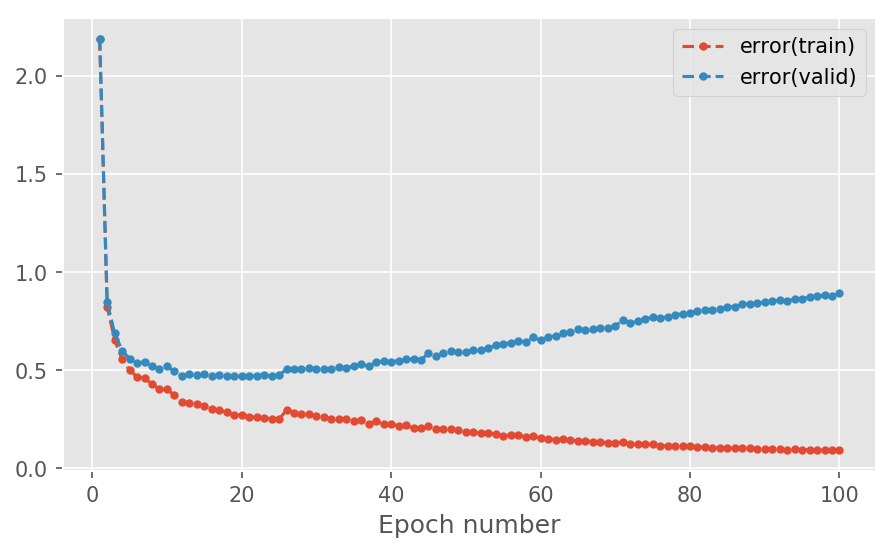

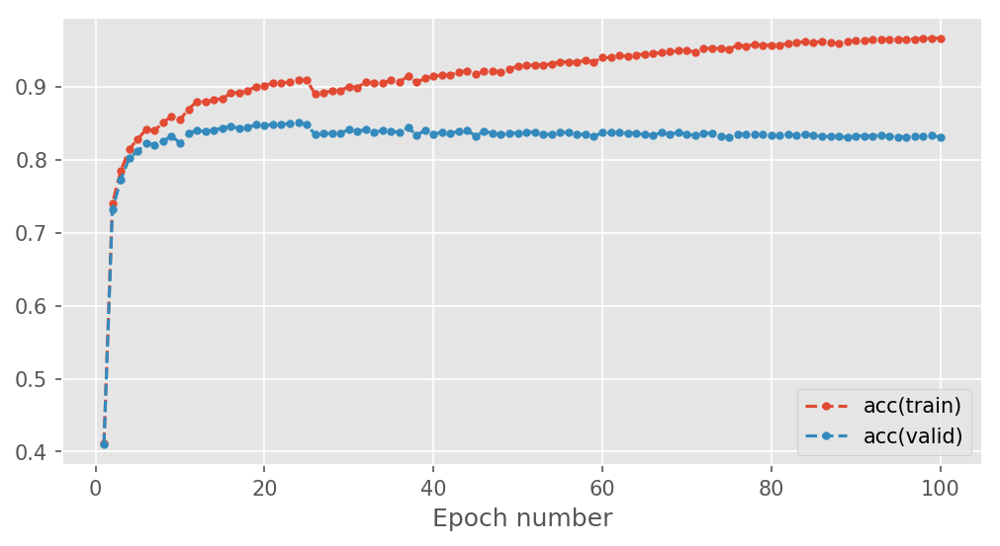

In [183]:
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 100

import importlib
import mlp
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule
importlib.reload(mlp.optimisers)
importlib.reload(mlp.learning_rules)
importlib.reload(mlp.schedulers)
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule
from mlp.schedulers import CosineAnnealingWithWarmRestarts

logger = logging.getLogger()
logger.setLevel(logging.INFO)
logger.handlers = [logging.StreamHandler()]

# Create data provider objects for the MNIST data set
train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)

#setup hyperparameter
learning_rate = 0.013
num_epochs = 100
stats_interval = 1

min_learning_rate=0.01
max_learning_rate=0.1
total_iters_per_period=25
max_learning_rate_discount_factor=0.5
period_iteration_expansion_factor=3

input_dim, output_dim, hidden_dim = 784, 47, 100

weights_init = GlorotUniformInit(rng=rng)
biases_init = ConstantInit(0.)
model = MultipleLayerModel([
    AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
])

error = CrossEntropySoftmaxError()
# Use a basic gradient descent learning rule
learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

scheduler=CosineAnnealingWithWarmRestarts(min_learning_rate=min_learning_rate,max_learning_rate=max_learning_rate,
                                         total_iters_per_period=total_iters_per_period,
                                          max_learning_rate_discount_factor=max_learning_rate_discount_factor,
                                         period_iteration_expansion_factor=period_iteration_expansion_factor)

#Remember to use notebook=False when you write a script to be run in a terminal
_CosineCDR2 = train_model_and_plot_stats(
    model, error, learning_rule, train_data, valid_data, num_epochs, scheduler,stats_interval, notebook=True)

In [329]:
importlib.reload(mlp.errors)
from mlp.errors import CrossEntropySoftmaxError
outputs=(_CosineCDR2[-2].fprop(test_data.inputs)[-1])
targets=MNISTDataProvider.to_one_of_k(test_data,test_data.targets)
CrossEntropySoftmaxError.__call__(error,outputs,targets)

(0.9710315654091466, 0.025373188235853453, 0.8198101265822785)

### 

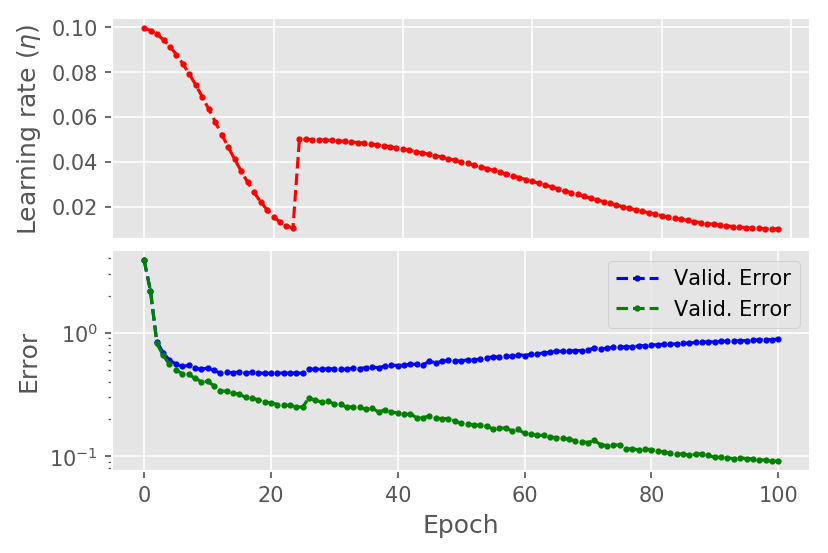

In [319]:
fig=plt.figure(figsize=(6,4),dpi=150)
fig.subplots_adjust(hspace=0.05)
ax1=fig.add_subplot(212)

ax1.plot(_CosineCDR2[0][:,2],"--o",c='b',label="Valid. Error",ms=2)
ax1.plot(_CosineCDR2[0][:,0],"--o",c='g',label="Valid. Error",ms=2)


ax1.set_xlabel('Epoch')
ax1.set_ylabel('Error')
ax1.set_yscale("log")
#ax2.set_ylim(0.001,0.01)

ax3=fig.add_subplot(211)
ax3.plot(_CosineCDR2[-1][:-1],"--o",c='r',label="Time",ms=2)
ax3.set_ylabel('Learning rate ($\eta$)')

ax3.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)
ax1.legend()
#ax1.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

fig.savefig("Cosine_SGD_2.png")

KeysView(<numpy.lib.npyio.NpzFile object at 0x1535ffb00>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1523e3978>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x156a23f60>)


0.01


Epoch 1: 2.4s to complete
    error(train)=1.44e+00, acc(train)=6.01e-01, error(valid)=1.44e+00, acc(valid)=6.00e-01


1


0.02


Epoch 2: 2.9s to complete
    error(train)=1.06e+00, acc(train)=6.96e-01, error(valid)=1.06e+00, acc(valid)=6.92e-01


2


0.03


Epoch 3: 2.5s to complete
    error(train)=8.90e-01, acc(train)=7.37e-01, error(valid)=9.07e-01, acc(valid)=7.33e-01


3


0.04


Epoch 4: 2.3s to complete
    error(train)=7.92e-01, acc(train)=7.63e-01, error(valid)=8.12e-01, acc(valid)=7.56e-01


4


0.05


Epoch 5: 2.1s to complete
    error(train)=7.40e-01, acc(train)=7.73e-01, error(valid)=7.63e-01, acc(valid)=7.70e-01


5


0.06


Epoch 6: 1.9s to complete
    error(train)=6.99e-01, acc(train)=7.84e-01, error(valid)=7.25e-01, acc(valid)=7.74e-01


6


0.07


Epoch 7: 1.9s to complete
    error(train)=6.50e-01, acc(train)=7.98e-01, error(valid)=6.82e-01, acc(valid)=7.90e-01


7


0.08


Epoch 8: 2.1s to complete
    error(train)=6.20e-01, acc(train)=8.06e-01, error(valid)=6.62e-01, acc(valid)=7.93e-01


8


0.09


Epoch 9: 1.9s to complete
    error(train)=5.98e-01, acc(train)=8.11e-01, error(valid)=6.40e-01, acc(valid)=7.99e-01


9


0.1


Epoch 10: 1.9s to complete
    error(train)=5.72e-01, acc(train)=8.17e-01, error(valid)=6.18e-01, acc(valid)=8.05e-01


10


0.11


Epoch 11: 1.9s to complete
    error(train)=5.64e-01, acc(train)=8.20e-01, error(valid)=6.17e-01, acc(valid)=8.07e-01


11


0.12


Epoch 12: 1.9s to complete
    error(train)=5.42e-01, acc(train)=8.26e-01, error(valid)=6.02e-01, acc(valid)=8.11e-01


12


0.13


Epoch 13: 1.9s to complete
    error(train)=5.29e-01, acc(train)=8.28e-01, error(valid)=5.90e-01, acc(valid)=8.12e-01


13


0.14


Epoch 14: 1.9s to complete
    error(train)=5.15e-01, acc(train)=8.34e-01, error(valid)=5.81e-01, acc(valid)=8.15e-01


14


0.15


Epoch 15: 1.9s to complete
    error(train)=5.01e-01, acc(train)=8.38e-01, error(valid)=5.74e-01, acc(valid)=8.17e-01


15


0.16


Epoch 16: 1.9s to complete
    error(train)=4.87e-01, acc(train)=8.39e-01, error(valid)=5.62e-01, acc(valid)=8.17e-01


16


0.17


Epoch 17: 2.0s to complete
    error(train)=4.76e-01, acc(train)=8.44e-01, error(valid)=5.57e-01, acc(valid)=8.21e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=4.76e-01, acc(train)=8.42e-01, error(valid)=5.55e-01, acc(valid)=8.20e-01


18


0.19


Epoch 19: 1.9s to complete
    error(train)=4.54e-01, acc(train)=8.50e-01, error(valid)=5.43e-01, acc(valid)=8.25e-01


19


0.2


Epoch 20: 1.9s to complete
    error(train)=4.49e-01, acc(train)=8.51e-01, error(valid)=5.38e-01, acc(valid)=8.26e-01


20


0.21


Epoch 21: 1.9s to complete
    error(train)=4.46e-01, acc(train)=8.51e-01, error(valid)=5.41e-01, acc(valid)=8.25e-01


0.22


Epoch 22: 1.9s to complete
    error(train)=4.38e-01, acc(train)=8.53e-01, error(valid)=5.36e-01, acc(valid)=8.27e-01


22


0.23


Epoch 23: 2.4s to complete
    error(train)=4.28e-01, acc(train)=8.57e-01, error(valid)=5.30e-01, acc(valid)=8.29e-01


23


0.24


Epoch 24: 2.3s to complete
    error(train)=4.17e-01, acc(train)=8.61e-01, error(valid)=5.22e-01, acc(valid)=8.30e-01


24


0.25


Epoch 25: 2.1s to complete
    error(train)=4.17e-01, acc(train)=8.60e-01, error(valid)=5.27e-01, acc(valid)=8.30e-01


0.26


Epoch 26: 2.1s to complete
    error(train)=4.05e-01, acc(train)=8.63e-01, error(valid)=5.18e-01, acc(valid)=8.31e-01


26


0.27


Epoch 27: 2.1s to complete
    error(train)=4.00e-01, acc(train)=8.64e-01, error(valid)=5.18e-01, acc(valid)=8.32e-01


0.28


Epoch 28: 3.0s to complete
    error(train)=4.00e-01, acc(train)=8.64e-01, error(valid)=5.23e-01, acc(valid)=8.28e-01


0.29


Epoch 29: 2.5s to complete
    error(train)=3.95e-01, acc(train)=8.66e-01, error(valid)=5.19e-01, acc(valid)=8.32e-01


0.3


Epoch 30: 2.5s to complete
    error(train)=3.86e-01, acc(train)=8.68e-01, error(valid)=5.16e-01, acc(valid)=8.31e-01


30


0.31


Epoch 31: 2.5s to complete
    error(train)=3.88e-01, acc(train)=8.68e-01, error(valid)=5.21e-01, acc(valid)=8.31e-01


0.32


Epoch 32: 2.5s to complete
    error(train)=3.75e-01, acc(train)=8.71e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


32


0.33


Epoch 33: 2.5s to complete
    error(train)=3.69e-01, acc(train)=8.73e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


33


0.34


Epoch 34: 2.4s to complete
    error(train)=3.78e-01, acc(train)=8.69e-01, error(valid)=5.21e-01, acc(valid)=8.31e-01


0.35


Epoch 35: 2.5s to complete
    error(train)=3.64e-01, acc(train)=8.73e-01, error(valid)=5.10e-01, acc(valid)=8.36e-01


0.36


Epoch 36: 2.5s to complete
    error(train)=3.64e-01, acc(train)=8.75e-01, error(valid)=5.12e-01, acc(valid)=8.35e-01


0.37


Epoch 37: 2.4s to complete
    error(train)=3.51e-01, acc(train)=8.80e-01, error(valid)=5.02e-01, acc(valid)=8.38e-01


37


0.38


Epoch 38: 2.4s to complete
    error(train)=3.49e-01, acc(train)=8.80e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


0.39


Epoch 39: 2.5s to complete
    error(train)=3.48e-01, acc(train)=8.80e-01, error(valid)=5.11e-01, acc(valid)=8.35e-01


0.4


Epoch 40: 2.5s to complete
    error(train)=3.50e-01, acc(train)=8.79e-01, error(valid)=5.16e-01, acc(valid)=8.33e-01


0.41


Epoch 41: 2.4s to complete
    error(train)=3.46e-01, acc(train)=8.79e-01, error(valid)=5.14e-01, acc(valid)=8.33e-01


0.42


Epoch 42: 2.5s to complete
    error(train)=3.36e-01, acc(train)=8.83e-01, error(valid)=5.07e-01, acc(valid)=8.32e-01


0.43


Epoch 43: 2.5s to complete
    error(train)=3.43e-01, acc(train)=8.79e-01, error(valid)=5.17e-01, acc(valid)=8.34e-01


0.44


Epoch 44: 2.4s to complete
    error(train)=3.30e-01, acc(train)=8.86e-01, error(valid)=5.09e-01, acc(valid)=8.36e-01


0.45


Epoch 45: 2.4s to complete
    error(train)=3.31e-01, acc(train)=8.84e-01, error(valid)=5.11e-01, acc(valid)=8.36e-01


0.46


Epoch 46: 2.5s to complete
    error(train)=3.26e-01, acc(train)=8.86e-01, error(valid)=5.15e-01, acc(valid)=8.37e-01


0.47


Epoch 47: 2.5s to complete
    error(train)=3.28e-01, acc(train)=8.85e-01, error(valid)=5.19e-01, acc(valid)=8.34e-01


0.48


Epoch 48: 2.5s to complete
    error(train)=3.23e-01, acc(train)=8.86e-01, error(valid)=5.16e-01, acc(valid)=8.36e-01


0.49


Epoch 49: 2.4s to complete
    error(train)=3.15e-01, acc(train)=8.90e-01, error(valid)=5.12e-01, acc(valid)=8.34e-01


0.5


Epoch 50: 2.5s to complete
    error(train)=3.17e-01, acc(train)=8.88e-01, error(valid)=5.16e-01, acc(valid)=8.34e-01


0.51


Epoch 51: 2.4s to complete
    error(train)=3.18e-01, acc(train)=8.87e-01, error(valid)=5.19e-01, acc(valid)=8.34e-01


0.52


Epoch 52: 2.4s to complete
    error(train)=3.13e-01, acc(train)=8.90e-01, error(valid)=5.18e-01, acc(valid)=8.36e-01


0.53


Epoch 53: 2.4s to complete
    error(train)=3.04e-01, acc(train)=8.94e-01, error(valid)=5.16e-01, acc(valid)=8.37e-01


0.54


Epoch 54: 2.5s to complete
    error(train)=3.04e-01, acc(train)=8.93e-01, error(valid)=5.16e-01, acc(valid)=8.36e-01


0.55


Epoch 55: 2.5s to complete
    error(train)=3.03e-01, acc(train)=8.93e-01, error(valid)=5.21e-01, acc(valid)=8.35e-01


0.56


Epoch 56: 2.5s to complete
    error(train)=2.99e-01, acc(train)=8.94e-01, error(valid)=5.19e-01, acc(valid)=8.36e-01


0.57


Epoch 57: 2.5s to complete
    error(train)=2.93e-01, acc(train)=8.98e-01, error(valid)=5.09e-01, acc(valid)=8.37e-01


0.58


Epoch 58: 2.4s to complete
    error(train)=2.95e-01, acc(train)=8.96e-01, error(valid)=5.20e-01, acc(valid)=8.35e-01


0.59


Epoch 59: 2.7s to complete
    error(train)=3.00e-01, acc(train)=8.93e-01, error(valid)=5.27e-01, acc(valid)=8.32e-01


0.6


Epoch 60: 2.5s to complete
    error(train)=2.94e-01, acc(train)=8.96e-01, error(valid)=5.23e-01, acc(valid)=8.35e-01


0.61


Epoch 61: 2.4s to complete
    error(train)=2.88e-01, acc(train)=8.98e-01, error(valid)=5.22e-01, acc(valid)=8.36e-01


0.62


Epoch 62: 2.4s to complete
    error(train)=2.86e-01, acc(train)=8.98e-01, error(valid)=5.22e-01, acc(valid)=8.35e-01


0.63


Epoch 63: 2.4s to complete
    error(train)=2.82e-01, acc(train)=9.00e-01, error(valid)=5.22e-01, acc(valid)=8.38e-01


0.64


Epoch 64: 2.5s to complete
    error(train)=2.85e-01, acc(train)=8.98e-01, error(valid)=5.25e-01, acc(valid)=8.37e-01


0.65


Epoch 65: 2.5s to complete
    error(train)=2.86e-01, acc(train)=8.96e-01, error(valid)=5.35e-01, acc(valid)=8.30e-01


0.66


Epoch 66: 2.5s to complete
    error(train)=2.74e-01, acc(train)=9.03e-01, error(valid)=5.27e-01, acc(valid)=8.35e-01


0.67


Epoch 67: 2.5s to complete
    error(train)=2.72e-01, acc(train)=9.04e-01, error(valid)=5.28e-01, acc(valid)=8.38e-01


0.68


Epoch 68: 2.4s to complete
    error(train)=2.73e-01, acc(train)=9.03e-01, error(valid)=5.29e-01, acc(valid)=8.36e-01


0.69


Epoch 69: 2.5s to complete
    error(train)=2.71e-01, acc(train)=9.04e-01, error(valid)=5.31e-01, acc(valid)=8.38e-01


0.7


Epoch 70: 2.6s to complete
    error(train)=2.74e-01, acc(train)=9.02e-01, error(valid)=5.33e-01, acc(valid)=8.36e-01


0.71


Epoch 71: 2.4s to complete
    error(train)=2.65e-01, acc(train)=9.06e-01, error(valid)=5.29e-01, acc(valid)=8.38e-01


0.72


Epoch 72: 2.5s to complete
    error(train)=2.66e-01, acc(train)=9.05e-01, error(valid)=5.34e-01, acc(valid)=8.36e-01


0.73


Epoch 73: 2.5s to complete
    error(train)=2.68e-01, acc(train)=9.03e-01, error(valid)=5.37e-01, acc(valid)=8.35e-01


0.74


Epoch 74: 2.4s to complete
    error(train)=2.62e-01, acc(train)=9.07e-01, error(valid)=5.36e-01, acc(valid)=8.37e-01


0.75


Epoch 75: 2.5s to complete
    error(train)=2.63e-01, acc(train)=9.06e-01, error(valid)=5.36e-01, acc(valid)=8.36e-01


0.76


Epoch 76: 2.4s to complete
    error(train)=2.61e-01, acc(train)=9.07e-01, error(valid)=5.39e-01, acc(valid)=8.35e-01


0.77


Epoch 77: 2.5s to complete
    error(train)=2.64e-01, acc(train)=9.05e-01, error(valid)=5.47e-01, acc(valid)=8.35e-01


0.78


Epoch 78: 2.5s to complete
    error(train)=2.58e-01, acc(train)=9.07e-01, error(valid)=5.47e-01, acc(valid)=8.33e-01


0.79


Epoch 79: 2.5s to complete
    error(train)=2.53e-01, acc(train)=9.10e-01, error(valid)=5.43e-01, acc(valid)=8.36e-01


0.8


Epoch 80: 2.5s to complete
    error(train)=2.55e-01, acc(train)=9.08e-01, error(valid)=5.47e-01, acc(valid)=8.33e-01


0.81


Epoch 81: 2.5s to complete
    error(train)=2.50e-01, acc(train)=9.11e-01, error(valid)=5.45e-01, acc(valid)=8.35e-01


0.82


Epoch 82: 2.4s to complete
    error(train)=2.53e-01, acc(train)=9.10e-01, error(valid)=5.48e-01, acc(valid)=8.35e-01


0.83


Epoch 83: 2.5s to complete
    error(train)=2.51e-01, acc(train)=9.10e-01, error(valid)=5.52e-01, acc(valid)=8.35e-01


0.84


Epoch 84: 2.4s to complete
    error(train)=2.49e-01, acc(train)=9.09e-01, error(valid)=5.53e-01, acc(valid)=8.34e-01


0.85


Epoch 85: 2.5s to complete
    error(train)=2.48e-01, acc(train)=9.12e-01, error(valid)=5.54e-01, acc(valid)=8.36e-01


0.86


Epoch 86: 2.5s to complete
    error(train)=2.45e-01, acc(train)=9.12e-01, error(valid)=5.50e-01, acc(valid)=8.36e-01


0.87


Epoch 87: 2.5s to complete
    error(train)=2.44e-01, acc(train)=9.12e-01, error(valid)=5.54e-01, acc(valid)=8.37e-01


0.88


Epoch 88: 2.5s to complete
    error(train)=2.43e-01, acc(train)=9.13e-01, error(valid)=5.59e-01, acc(valid)=8.33e-01


0.89


Epoch 89: 2.5s to complete
    error(train)=2.45e-01, acc(train)=9.11e-01, error(valid)=5.56e-01, acc(valid)=8.34e-01


0.9


Epoch 90: 2.5s to complete
    error(train)=2.43e-01, acc(train)=9.12e-01, error(valid)=5.59e-01, acc(valid)=8.36e-01


0.91


Epoch 91: 2.5s to complete
    error(train)=2.40e-01, acc(train)=9.14e-01, error(valid)=5.64e-01, acc(valid)=8.31e-01


0.92


Epoch 92: 2.5s to complete
    error(train)=2.38e-01, acc(train)=9.14e-01, error(valid)=5.63e-01, acc(valid)=8.33e-01


0.93


Epoch 93: 2.5s to complete
    error(train)=2.37e-01, acc(train)=9.15e-01, error(valid)=5.59e-01, acc(valid)=8.35e-01


0.94


Epoch 94: 2.5s to complete
    error(train)=2.36e-01, acc(train)=9.14e-01, error(valid)=5.67e-01, acc(valid)=8.32e-01


0.95


Epoch 95: 2.5s to complete
    error(train)=2.35e-01, acc(train)=9.15e-01, error(valid)=5.67e-01, acc(valid)=8.32e-01


0.96


Epoch 96: 2.5s to complete
    error(train)=2.34e-01, acc(train)=9.16e-01, error(valid)=5.73e-01, acc(valid)=8.31e-01


0.97


Epoch 97: 2.5s to complete
    error(train)=2.35e-01, acc(train)=9.15e-01, error(valid)=5.73e-01, acc(valid)=8.34e-01


0.98


Epoch 98: 2.5s to complete
    error(train)=2.31e-01, acc(train)=9.18e-01, error(valid)=5.76e-01, acc(valid)=8.34e-01


0.99


Epoch 99: 2.5s to complete
    error(train)=2.28e-01, acc(train)=9.18e-01, error(valid)=5.72e-01, acc(valid)=8.34e-01


0.0


Epoch 100: 2.5s to complete
    error(train)=2.30e-01, acc(train)=9.16e-01, error(valid)=5.80e-01, acc(valid)=8.33e-01


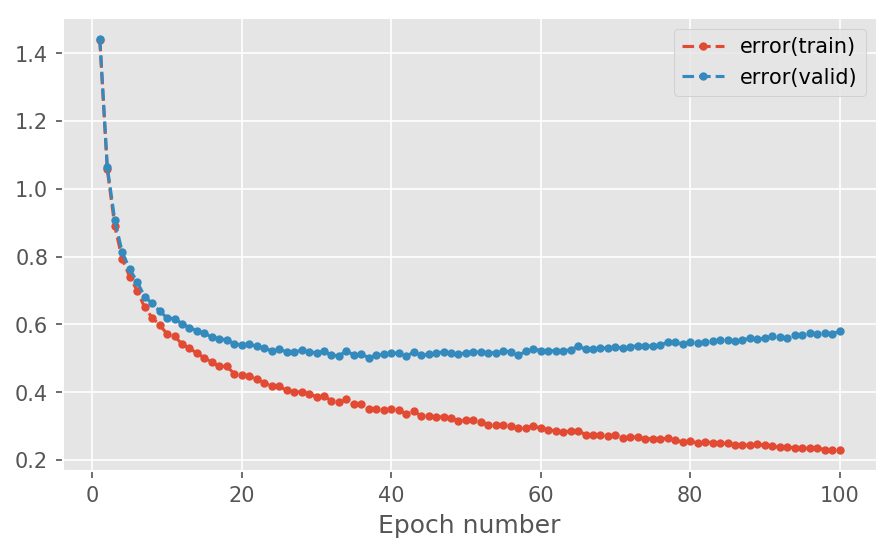

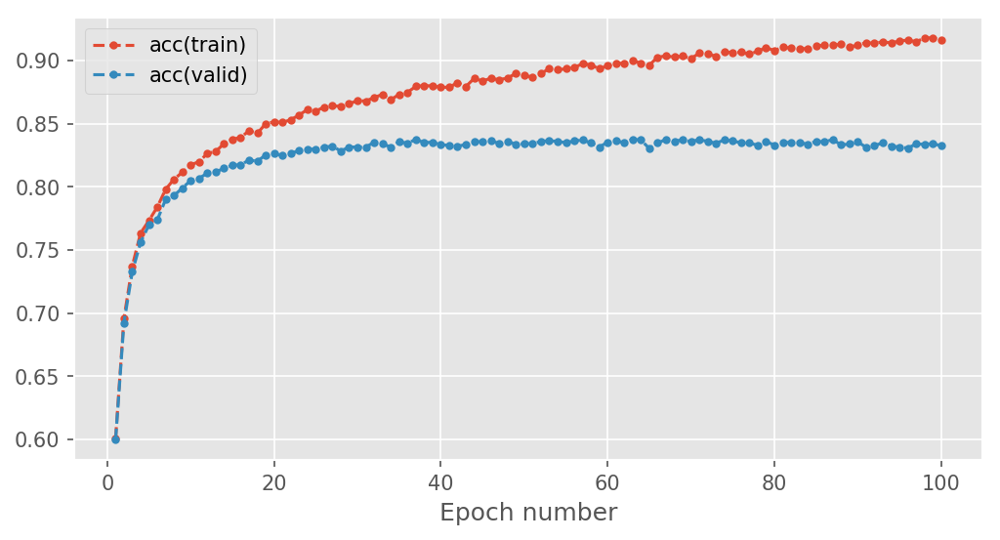

In [290]:
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 500

import importlib
import mlp
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule,AdamLearningRuleWithWeightDecay
importlib.reload(mlp.optimisers)
importlib.reload(mlp.learning_rules)
importlib.reload(mlp.schedulers)

from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule,AdamLearningRuleWithWeightDecay
from mlp.schedulers import CosineAnnealingWithWarmRestarts

logger = logging.getLogger()
logger.setLevel(logging.INFO)
logger.handlers = [logging.StreamHandler()]

# Create data provider objects for the MNIST data set
train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)

#setup hyperparameter
learning_rate = 0.013
num_epochs = 100
stats_interval = 1

min_learning_rate=2e-4
max_learning_rate=4e-4
total_iters_per_period=100
max_learning_rate_discount_factor=0.5
period_iteration_expansion_factor=3

input_dim, output_dim, hidden_dim = 784, 47, 100

weights_init = GlorotUniformInit(rng=rng)
biases_init = ConstantInit(0.)
model = MultipleLayerModel([
    AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
])

error = CrossEntropySoftmaxError()
# Use a basic gradient descent learning rule
learning_rule = AdamLearningRule(learning_rate=3e-4,beta_1=0.875,beta_2=0.9992)

scheduler=CosineAnnealingWithWarmRestarts(min_learning_rate=min_learning_rate,max_learning_rate=max_learning_rate,
                                         total_iters_per_period=total_iters_per_period,
                                          max_learning_rate_discount_factor=max_learning_rate_discount_factor,
                                         period_iteration_expansion_factor=period_iteration_expansion_factor)

#Remember to use notebook=False when you write a script to be run in a terminal
_CosineADAM1 = train_model_and_plot_stats(
    model, error, learning_rule, train_data, valid_data, num_epochs, scheduler,stats_interval, notebook=True)

In [325]:
importlib.reload(mlp.errors)
from mlp.errors import CrossEntropySoftmaxError
outputs=(_CosineADAM1[-2].fprop(test_data.inputs)[-1])
targets=MNISTDataProvider.to_one_of_k(test_data,test_data.targets)
CrossEntropySoftmaxError.__call__(error,outputs,targets)

(0.6216046309103406, 0.013932154979749775, 0.8249367088607595)

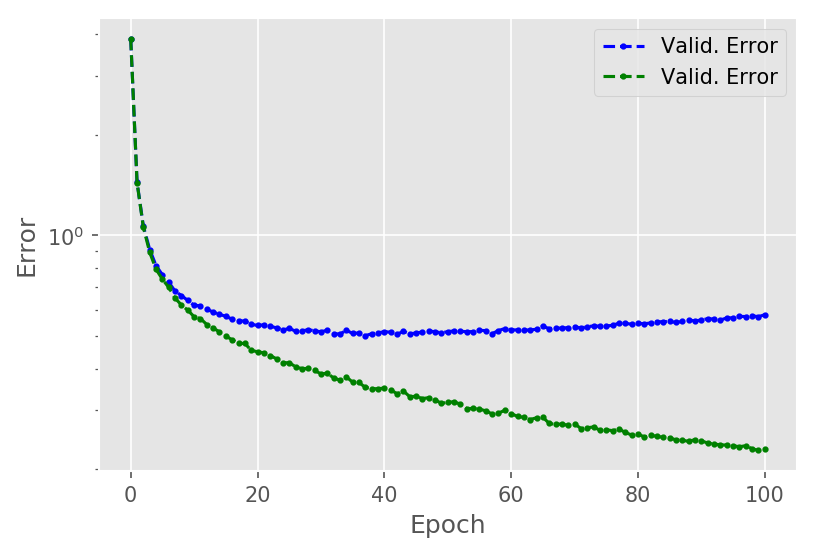

In [320]:
fig=plt.figure(figsize=(6,4),dpi=150)
fig.subplots_adjust(hspace=0.05)
ax1=fig.add_subplot(111)

ax1.plot(_CosineADAM1[0][:,2],"--o",c='b',label="Valid. Error",ms=2)
ax1.plot(_CosineADAM1[0][:,0],"--o",c='g',label="Valid. Error",ms=2)


ax1.set_xlabel('Epoch')
ax1.set_ylabel('Error')
ax1.set_yscale("log")
#ax2.set_ylim(0.001,0.01)



ax1.legend()
#ax1.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

fig.savefig("Cosine_ADAM_1.png")

KeysView(<numpy.lib.npyio.NpzFile object at 0x12b40f400>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12b2eb9b0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11be38dd8>)


0.04


Epoch 1: 3.7s to complete
    error(train)=1.44e+00, acc(train)=6.01e-01, error(valid)=1.44e+00, acc(valid)=6.00e-01


1


0.08


Epoch 2: 2.9s to complete
    error(train)=1.11e+00, acc(train)=6.83e-01, error(valid)=1.11e+00, acc(valid)=6.82e-01


2


0.12


Epoch 3: 2.5s to complete
    error(train)=9.52e-01, acc(train)=7.23e-01, error(valid)=9.67e-01, acc(valid)=7.20e-01


3


0.16


Epoch 4: 2.4s to complete
    error(train)=8.58e-01, acc(train)=7.47e-01, error(valid)=8.76e-01, acc(valid)=7.42e-01


4


0.2


Epoch 5: 2.4s to complete
    error(train)=7.96e-01, acc(train)=7.61e-01, error(valid)=8.13e-01, acc(valid)=7.57e-01


5


0.24


Epoch 6: 2.4s to complete
    error(train)=7.55e-01, acc(train)=7.71e-01, error(valid)=7.74e-01, acc(valid)=7.62e-01


6


0.28


Epoch 7: 2.3s to complete
    error(train)=7.07e-01, acc(train)=7.84e-01, error(valid)=7.31e-01, acc(valid)=7.77e-01


7


0.32


Epoch 8: 2.4s to complete
    error(train)=6.83e-01, acc(train)=7.90e-01, error(valid)=7.14e-01, acc(valid)=7.82e-01


8


0.36


Epoch 9: 2.4s to complete
    error(train)=6.55e-01, acc(train)=7.99e-01, error(valid)=6.85e-01, acc(valid)=7.91e-01


9


0.4


Epoch 10: 2.5s to complete
    error(train)=6.37e-01, acc(train)=8.00e-01, error(valid)=6.73e-01, acc(valid)=7.90e-01


10


0.44


Epoch 11: 2.5s to complete
    error(train)=6.21e-01, acc(train)=8.07e-01, error(valid)=6.59e-01, acc(valid)=7.95e-01


11


0.48


Epoch 12: 2.7s to complete
    error(train)=6.04e-01, acc(train)=8.12e-01, error(valid)=6.45e-01, acc(valid)=8.01e-01


12


0.52


Epoch 13: 2.4s to complete
    error(train)=5.93e-01, acc(train)=8.13e-01, error(valid)=6.34e-01, acc(valid)=8.04e-01


13


0.56


Epoch 14: 2.4s to complete
    error(train)=5.80e-01, acc(train)=8.18e-01, error(valid)=6.24e-01, acc(valid)=8.05e-01


14


0.6


Epoch 15: 2.8s to complete
    error(train)=5.74e-01, acc(train)=8.19e-01, error(valid)=6.22e-01, acc(valid)=8.06e-01


15


0.64


Epoch 16: 2.4s to complete
    error(train)=5.64e-01, acc(train)=8.23e-01, error(valid)=6.11e-01, acc(valid)=8.11e-01


16


0.68


Epoch 17: 2.4s to complete
    error(train)=5.52e-01, acc(train)=8.26e-01, error(valid)=6.03e-01, acc(valid)=8.12e-01


17


0.72


Epoch 18: 2.4s to complete
    error(train)=5.47e-01, acc(train)=8.27e-01, error(valid)=5.96e-01, acc(valid)=8.15e-01


18


0.76


Epoch 19: 2.6s to complete
    error(train)=5.43e-01, acc(train)=8.27e-01, error(valid)=5.95e-01, acc(valid)=8.14e-01


19


0.8


Epoch 20: 2.8s to complete
    error(train)=5.38e-01, acc(train)=8.29e-01, error(valid)=5.89e-01, acc(valid)=8.16e-01


20


0.84


Epoch 21: 2.5s to complete
    error(train)=5.34e-01, acc(train)=8.31e-01, error(valid)=5.89e-01, acc(valid)=8.15e-01


21


0.88


Epoch 22: 2.4s to complete
    error(train)=5.30e-01, acc(train)=8.31e-01, error(valid)=5.85e-01, acc(valid)=8.15e-01


22


0.92


Epoch 23: 2.5s to complete
    error(train)=5.28e-01, acc(train)=8.31e-01, error(valid)=5.84e-01, acc(valid)=8.16e-01


23


0.96


Epoch 24: 2.4s to complete
    error(train)=5.23e-01, acc(train)=8.34e-01, error(valid)=5.80e-01, acc(valid)=8.18e-01


24


0.0


Epoch 25: 2.5s to complete
    error(train)=5.23e-01, acc(train)=8.33e-01, error(valid)=5.80e-01, acc(valid)=8.18e-01


25


0.013333333333333334


Epoch 26: 2.4s to complete
    error(train)=5.22e-01, acc(train)=8.33e-01, error(valid)=5.81e-01, acc(valid)=8.16e-01


0.02666666666666667


Epoch 27: 2.6s to complete
    error(train)=5.15e-01, acc(train)=8.35e-01, error(valid)=5.78e-01, acc(valid)=8.17e-01


27


0.04


Epoch 28: 2.5s to complete
    error(train)=5.09e-01, acc(train)=8.34e-01, error(valid)=5.78e-01, acc(valid)=8.13e-01


28


0.05333333333333334


Epoch 29: 2.8s to complete
    error(train)=4.99e-01, acc(train)=8.38e-01, error(valid)=5.69e-01, acc(valid)=8.19e-01


29


0.06666666666666667


Epoch 30: 2.6s to complete
    error(train)=4.87e-01, acc(train)=8.41e-01, error(valid)=5.62e-01, acc(valid)=8.17e-01


30


0.08


Epoch 31: 2.6s to complete
    error(train)=4.87e-01, acc(train)=8.41e-01, error(valid)=5.65e-01, acc(valid)=8.18e-01


0.09333333333333334


Epoch 32: 2.5s to complete
    error(train)=4.74e-01, acc(train)=8.44e-01, error(valid)=5.53e-01, acc(valid)=8.23e-01


32


0.10666666666666667


Epoch 33: 2.6s to complete
    error(train)=4.66e-01, acc(train)=8.47e-01, error(valid)=5.45e-01, acc(valid)=8.24e-01


33


0.12


Epoch 34: 2.5s to complete
    error(train)=4.66e-01, acc(train)=8.46e-01, error(valid)=5.51e-01, acc(valid)=8.21e-01


0.13333333333333333


Epoch 35: 2.7s to complete
    error(train)=4.58e-01, acc(train)=8.48e-01, error(valid)=5.43e-01, acc(valid)=8.25e-01


35


0.14666666666666667


Epoch 36: 2.5s to complete
    error(train)=4.51e-01, acc(train)=8.51e-01, error(valid)=5.39e-01, acc(valid)=8.27e-01


36


0.16


Epoch 37: 2.5s to complete
    error(train)=4.38e-01, acc(train)=8.56e-01, error(valid)=5.29e-01, acc(valid)=8.30e-01


37


0.17333333333333334


Epoch 38: 2.6s to complete
    error(train)=4.34e-01, acc(train)=8.56e-01, error(valid)=5.33e-01, acc(valid)=8.28e-01


0.18666666666666668


Epoch 39: 2.5s to complete
    error(train)=4.34e-01, acc(train)=8.55e-01, error(valid)=5.35e-01, acc(valid)=8.26e-01


0.2


Epoch 40: 2.4s to complete
    error(train)=4.26e-01, acc(train)=8.58e-01, error(valid)=5.29e-01, acc(valid)=8.28e-01


40


0.21333333333333335


Epoch 41: 2.4s to complete
    error(train)=4.22e-01, acc(train)=8.59e-01, error(valid)=5.25e-01, acc(valid)=8.27e-01


41


0.22666666666666666


Epoch 42: 2.7s to complete
    error(train)=4.14e-01, acc(train)=8.61e-01, error(valid)=5.21e-01, acc(valid)=8.31e-01


42


0.24


Epoch 43: 2.5s to complete
    error(train)=4.18e-01, acc(train)=8.59e-01, error(valid)=5.28e-01, acc(valid)=8.28e-01


0.25333333333333335


Epoch 44: 2.5s to complete
    error(train)=4.08e-01, acc(train)=8.63e-01, error(valid)=5.20e-01, acc(valid)=8.31e-01


44


0.26666666666666666


Epoch 45: 2.5s to complete
    error(train)=4.05e-01, acc(train)=8.64e-01, error(valid)=5.19e-01, acc(valid)=8.32e-01


45


0.28


Epoch 46: 3.0s to complete
    error(train)=3.99e-01, acc(train)=8.66e-01, error(valid)=5.20e-01, acc(valid)=8.33e-01


0.29333333333333333


Epoch 47: 2.5s to complete
    error(train)=4.03e-01, acc(train)=8.65e-01, error(valid)=5.25e-01, acc(valid)=8.31e-01


0.30666666666666664


Epoch 48: 2.7s to complete
    error(train)=3.96e-01, acc(train)=8.66e-01, error(valid)=5.19e-01, acc(valid)=8.33e-01


48


0.32


Epoch 49: 3.1s to complete
    error(train)=3.91e-01, acc(train)=8.68e-01, error(valid)=5.19e-01, acc(valid)=8.31e-01


0.3333333333333333


Epoch 50: 2.6s to complete
    error(train)=3.89e-01, acc(train)=8.68e-01, error(valid)=5.16e-01, acc(valid)=8.34e-01


50


0.3466666666666667


Epoch 51: 2.5s to complete
    error(train)=3.89e-01, acc(train)=8.68e-01, error(valid)=5.19e-01, acc(valid)=8.31e-01


0.36


Epoch 52: 2.8s to complete
    error(train)=3.87e-01, acc(train)=8.69e-01, error(valid)=5.19e-01, acc(valid)=8.35e-01


0.37333333333333335


Epoch 53: 2.5s to complete
    error(train)=3.77e-01, acc(train)=8.72e-01, error(valid)=5.13e-01, acc(valid)=8.34e-01


53


0.38666666666666666


Epoch 54: 2.5s to complete
    error(train)=3.76e-01, acc(train)=8.72e-01, error(valid)=5.13e-01, acc(valid)=8.37e-01


0.4


Epoch 55: 2.5s to complete
    error(train)=3.73e-01, acc(train)=8.73e-01, error(valid)=5.15e-01, acc(valid)=8.34e-01


0.41333333333333333


Epoch 56: 2.5s to complete
    error(train)=3.70e-01, acc(train)=8.74e-01, error(valid)=5.12e-01, acc(valid)=8.35e-01


56


0.4266666666666667


Epoch 57: 2.6s to complete
    error(train)=3.64e-01, acc(train)=8.76e-01, error(valid)=5.04e-01, acc(valid)=8.39e-01


57


0.44


Epoch 58: 2.5s to complete
    error(train)=3.65e-01, acc(train)=8.76e-01, error(valid)=5.13e-01, acc(valid)=8.37e-01


0.4533333333333333


Epoch 59: 2.5s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=5.10e-01, acc(valid)=8.35e-01


0.4666666666666667


Epoch 60: 2.5s to complete
    error(train)=3.63e-01, acc(train)=8.76e-01, error(valid)=5.12e-01, acc(valid)=8.36e-01


0.48


Epoch 61: 2.6s to complete
    error(train)=3.56e-01, acc(train)=8.78e-01, error(valid)=5.09e-01, acc(valid)=8.36e-01


0.49333333333333335


Epoch 62: 2.7s to complete
    error(train)=3.56e-01, acc(train)=8.78e-01, error(valid)=5.11e-01, acc(valid)=8.33e-01


0.5066666666666667


Epoch 63: 2.5s to complete
    error(train)=3.51e-01, acc(train)=8.80e-01, error(valid)=5.05e-01, acc(valid)=8.40e-01


0.52


Epoch 64: 2.5s to complete
    error(train)=3.54e-01, acc(train)=8.79e-01, error(valid)=5.10e-01, acc(valid)=8.35e-01


0.5333333333333333


Epoch 65: 2.4s to complete
    error(train)=3.52e-01, acc(train)=8.78e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


0.5466666666666666


Epoch 66: 2.6s to complete
    error(train)=3.49e-01, acc(train)=8.80e-01, error(valid)=5.13e-01, acc(valid)=8.34e-01


0.56


Epoch 67: 2.5s to complete
    error(train)=3.42e-01, acc(train)=8.83e-01, error(valid)=5.10e-01, acc(valid)=8.38e-01


0.5733333333333334


Epoch 68: 2.6s to complete
    error(train)=3.44e-01, acc(train)=8.83e-01, error(valid)=5.09e-01, acc(valid)=8.39e-01


0.5866666666666667


Epoch 69: 3.3s to complete
    error(train)=3.42e-01, acc(train)=8.83e-01, error(valid)=5.12e-01, acc(valid)=8.36e-01


0.6


Epoch 70: 2.6s to complete
    error(train)=3.41e-01, acc(train)=8.84e-01, error(valid)=5.10e-01, acc(valid)=8.38e-01


0.6133333333333333


Epoch 71: 2.5s to complete
    error(train)=3.37e-01, acc(train)=8.85e-01, error(valid)=5.08e-01, acc(valid)=8.39e-01


0.6266666666666667


Epoch 72: 2.4s to complete
    error(train)=3.38e-01, acc(train)=8.85e-01, error(valid)=5.11e-01, acc(valid)=8.38e-01


0.64


Epoch 73: 2.9s to complete
    error(train)=3.34e-01, acc(train)=8.85e-01, error(valid)=5.07e-01, acc(valid)=8.39e-01


0.6533333333333333


Epoch 74: 2.9s to complete
    error(train)=3.34e-01, acc(train)=8.85e-01, error(valid)=5.09e-01, acc(valid)=8.38e-01


0.6666666666666666


Epoch 75: 2.5s to complete
    error(train)=3.31e-01, acc(train)=8.86e-01, error(valid)=5.07e-01, acc(valid)=8.38e-01


0.68


Epoch 76: 2.5s to complete
    error(train)=3.32e-01, acc(train)=8.85e-01, error(valid)=5.09e-01, acc(valid)=8.39e-01


0.6933333333333334


Epoch 77: 2.7s to complete
    error(train)=3.29e-01, acc(train)=8.86e-01, error(valid)=5.09e-01, acc(valid)=8.40e-01


0.7066666666666667


Epoch 78: 2.7s to complete
    error(train)=3.27e-01, acc(train)=8.88e-01, error(valid)=5.10e-01, acc(valid)=8.38e-01


0.72


Epoch 79: 2.7s to complete
    error(train)=3.25e-01, acc(train)=8.89e-01, error(valid)=5.07e-01, acc(valid)=8.38e-01


0.7333333333333333


Epoch 80: 2.6s to complete
    error(train)=3.26e-01, acc(train)=8.88e-01, error(valid)=5.08e-01, acc(valid)=8.38e-01


0.7466666666666667


Epoch 81: 2.6s to complete
    error(train)=3.23e-01, acc(train)=8.89e-01, error(valid)=5.09e-01, acc(valid)=8.38e-01


0.76


Epoch 82: 2.6s to complete
    error(train)=3.24e-01, acc(train)=8.88e-01, error(valid)=5.09e-01, acc(valid)=8.38e-01


0.7733333333333333


Epoch 83: 2.9s to complete
    error(train)=3.22e-01, acc(train)=8.89e-01, error(valid)=5.11e-01, acc(valid)=8.38e-01


0.7866666666666666


Epoch 84: 2.6s to complete
    error(train)=3.21e-01, acc(train)=8.90e-01, error(valid)=5.11e-01, acc(valid)=8.37e-01


0.8


Epoch 85: 2.7s to complete
    error(train)=3.20e-01, acc(train)=8.90e-01, error(valid)=5.08e-01, acc(valid)=8.39e-01


0.8133333333333334


Epoch 86: 2.6s to complete
    error(train)=3.20e-01, acc(train)=8.90e-01, error(valid)=5.06e-01, acc(valid)=8.42e-01


0.8266666666666667


Epoch 87: 3.1s to complete
    error(train)=3.19e-01, acc(train)=8.90e-01, error(valid)=5.09e-01, acc(valid)=8.39e-01


0.84


Epoch 88: 2.5s to complete
    error(train)=3.19e-01, acc(train)=8.91e-01, error(valid)=5.11e-01, acc(valid)=8.39e-01


0.8533333333333334


Epoch 89: 2.5s to complete
    error(train)=3.17e-01, acc(train)=8.91e-01, error(valid)=5.05e-01, acc(valid)=8.41e-01


0.8666666666666667


Epoch 90: 2.6s to complete
    error(train)=3.16e-01, acc(train)=8.91e-01, error(valid)=5.09e-01, acc(valid)=8.40e-01


0.88


Epoch 91: 2.6s to complete
    error(train)=3.16e-01, acc(train)=8.92e-01, error(valid)=5.11e-01, acc(valid)=8.37e-01


0.8933333333333333


Epoch 92: 2.8s to complete
    error(train)=3.16e-01, acc(train)=8.91e-01, error(valid)=5.12e-01, acc(valid)=8.38e-01


0.9066666666666666


Epoch 93: 2.5s to complete
    error(train)=3.15e-01, acc(train)=8.92e-01, error(valid)=5.07e-01, acc(valid)=8.39e-01


0.92


Epoch 94: 2.4s to complete
    error(train)=3.14e-01, acc(train)=8.92e-01, error(valid)=5.11e-01, acc(valid)=8.38e-01


0.9333333333333333


Epoch 95: 2.4s to complete
    error(train)=3.13e-01, acc(train)=8.93e-01, error(valid)=5.08e-01, acc(valid)=8.41e-01


0.9466666666666667


Epoch 96: 2.5s to complete
    error(train)=3.13e-01, acc(train)=8.92e-01, error(valid)=5.11e-01, acc(valid)=8.40e-01


0.96


Epoch 97: 2.5s to complete
    error(train)=3.12e-01, acc(train)=8.92e-01, error(valid)=5.09e-01, acc(valid)=8.39e-01


0.9733333333333334


Epoch 98: 2.5s to complete
    error(train)=3.12e-01, acc(train)=8.93e-01, error(valid)=5.12e-01, acc(valid)=8.40e-01


0.9866666666666667


Epoch 99: 2.6s to complete
    error(train)=3.11e-01, acc(train)=8.93e-01, error(valid)=5.11e-01, acc(valid)=8.38e-01


0.0


Epoch 100: 2.4s to complete
    error(train)=3.13e-01, acc(train)=8.92e-01, error(valid)=5.14e-01, acc(valid)=8.37e-01


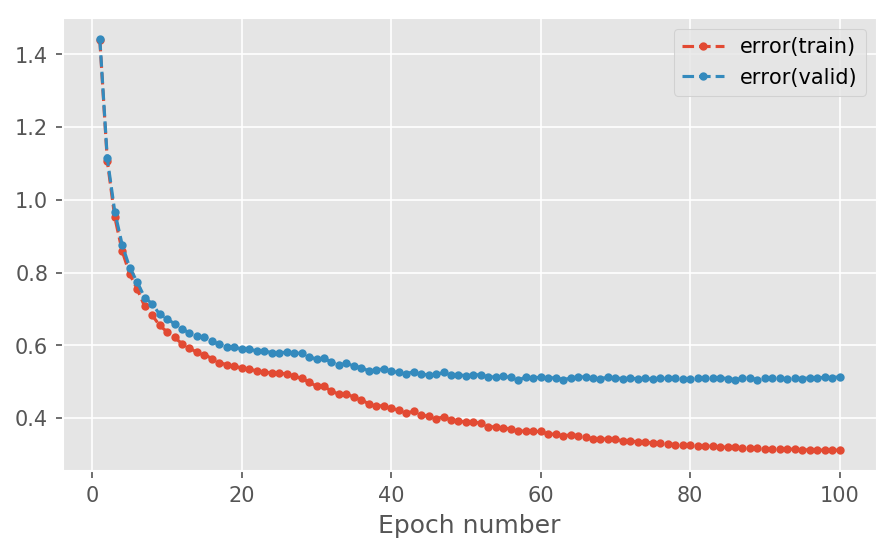

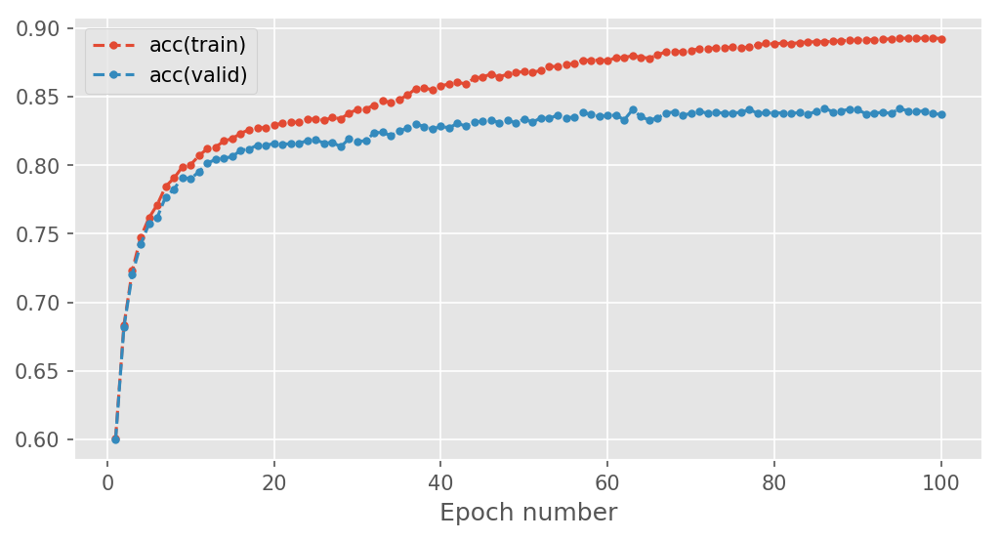

In [224]:
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 500

import importlib
import mlp
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule,AdamLearningRuleWithWeightDecay
importlib.reload(mlp.optimisers)
importlib.reload(mlp.learning_rules)
importlib.reload(mlp.schedulers)
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule,AdamLearningRuleWithWeightDecay
from mlp.schedulers import CosineAnnealingWithWarmRestarts

logger = logging.getLogger()
logger.setLevel(logging.INFO)
logger.handlers = [logging.StreamHandler()]

# Create data provider objects for the MNIST data set
train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)

#setup hyperparameter
learning_rate = 0.013
num_epochs = 100
stats_interval = 1

min_learning_rate=0.5e-4
max_learning_rate=3e-4
total_iters_per_period=25
max_learning_rate_discount_factor=0.9
period_iteration_expansion_factor=3

input_dim, output_dim, hidden_dim = 784, 47, 100

weights_init = GlorotUniformInit(rng=rng)
biases_init = ConstantInit(0.)
model = MultipleLayerModel([
    AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
    ReluLayer(),
    AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
])

error = CrossEntropySoftmaxError()
# Use a basic gradient descent learning rule
learning_rule = AdamLearningRule(learning_rate=3e-4,beta_1=0.875,beta_2=0.9992)

scheduler=CosineAnnealingWithWarmRestarts(min_learning_rate=min_learning_rate,max_learning_rate=max_learning_rate,
                                         total_iters_per_period=total_iters_per_period,
                                          max_learning_rate_discount_factor=max_learning_rate_discount_factor,
                                         period_iteration_expansion_factor=period_iteration_expansion_factor)

#Remember to use notebook=False when you write a script to be run in a terminal
_CosineADAM2 = train_model_and_plot_stats(
    model, error, learning_rule, train_data, valid_data, num_epochs, scheduler,stats_interval, notebook=True)

In [326]:
importlib.reload(mlp.errors)
from mlp.errors import CrossEntropySoftmaxError
outputs=(_CosineADAM2[-2].fprop(test_data.inputs)[-1])
targets=MNISTDataProvider.to_one_of_k(test_data,test_data.targets)
CrossEntropySoftmaxError.__call__(error,outputs,targets)

(0.5541703242039168, 0.011338352160325724, 0.8281012658227848)

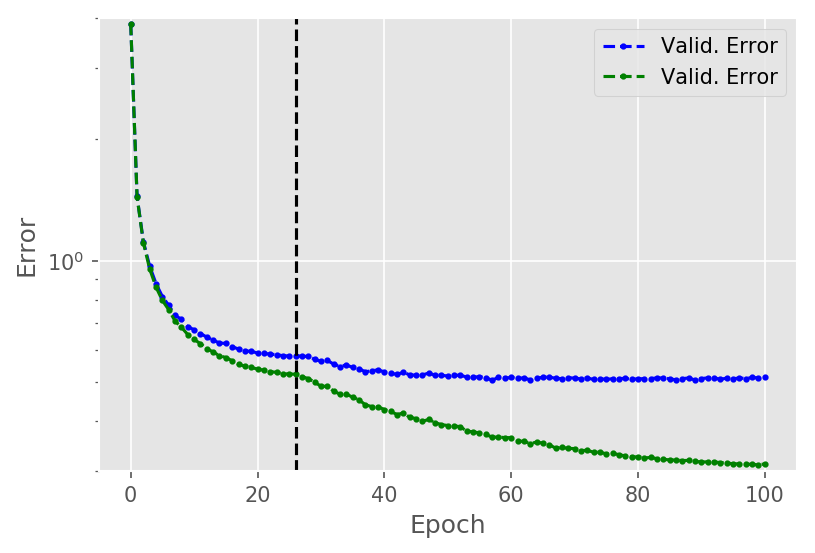

In [321]:
fig=plt.figure(figsize=(6,4),dpi=150)
fig.subplots_adjust(hspace=0.05)
ax1=fig.add_subplot(111)

ax1.plot(_CosineADAM2[0][:,2],"--o",c='b',label="Valid. Error",ms=2)
ax1.plot(_CosineADAM2[0][:,0],"--o",c='g',label="Valid. Error",ms=2)
ax1.plot([26,26],[0.1,10],"--",c='k')
ax1.set_ylim(0.3,4)

ax1.set_xlabel('Epoch')
ax1.set_ylabel('Error')
ax1.set_yscale("log")
#ax2.set_ylim(0.001,0.01)



ax1.legend()
#ax1.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

fig.savefig("Cosine_ADAM_2.png")

0.5
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d04e208>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d061898>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12d061898>)


0.01


Epoch 1: 3.2s to complete
    error(train)=1.46e+00, acc(train)=5.96e-01, error(valid)=1.46e+00, acc(valid)=5.97e-01


1


0.02


Epoch 2: 2.5s to complete
    error(train)=1.09e+00, acc(train)=6.88e-01, error(valid)=1.09e+00, acc(valid)=6.88e-01


2


0.03


Epoch 3: 2.8s to complete
    error(train)=9.36e-01, acc(train)=7.28e-01, error(valid)=9.50e-01, acc(valid)=7.24e-01


3


0.04


Epoch 4: 3.5s to complete
    error(train)=8.43e-01, acc(train)=7.54e-01, error(valid)=8.57e-01, acc(valid)=7.49e-01


4


0.05


Epoch 5: 2.4s to complete
    error(train)=7.93e-01, acc(train)=7.63e-01, error(valid)=8.08e-01, acc(valid)=7.59e-01


5


0.06


Epoch 6: 2.5s to complete
    error(train)=7.61e-01, acc(train)=7.72e-01, error(valid)=7.75e-01, acc(valid)=7.67e-01


6


0.07


Epoch 7: 2.4s to complete
    error(train)=7.16e-01, acc(train)=7.84e-01, error(valid)=7.35e-01, acc(valid)=7.79e-01


7


0.08


Epoch 8: 2.4s to complete
    error(train)=6.92e-01, acc(train)=7.89e-01, error(valid)=7.15e-01, acc(valid)=7.82e-01


8


0.09


Epoch 9: 2.6s to complete
    error(train)=6.71e-01, acc(train)=7.95e-01, error(valid)=6.94e-01, acc(valid)=7.87e-01


9


0.1


Epoch 10: 2.8s to complete
    error(train)=6.54e-01, acc(train)=7.98e-01, error(valid)=6.79e-01, acc(valid)=7.89e-01


10


0.11


Epoch 11: 2.8s to complete
    error(train)=6.41e-01, acc(train)=8.01e-01, error(valid)=6.69e-01, acc(valid)=7.93e-01


11


0.12


Epoch 12: 3.1s to complete
    error(train)=6.27e-01, acc(train)=8.07e-01, error(valid)=6.55e-01, acc(valid)=7.98e-01


12


0.13


Epoch 13: 2.8s to complete
    error(train)=6.13e-01, acc(train)=8.08e-01, error(valid)=6.41e-01, acc(valid)=8.00e-01


13


0.14


Epoch 14: 3.0s to complete
    error(train)=6.10e-01, acc(train)=8.11e-01, error(valid)=6.38e-01, acc(valid)=8.02e-01


14


0.15


Epoch 15: 2.1s to complete
    error(train)=5.99e-01, acc(train)=8.14e-01, error(valid)=6.31e-01, acc(valid)=8.03e-01


15


0.16


Epoch 16: 2.1s to complete
    error(train)=5.83e-01, acc(train)=8.19e-01, error(valid)=6.13e-01, acc(valid)=8.10e-01


16


0.17


Epoch 17: 2.2s to complete
    error(train)=5.80e-01, acc(train)=8.20e-01, error(valid)=6.13e-01, acc(valid)=8.07e-01


0.18


Epoch 18: 2.5s to complete
    error(train)=5.77e-01, acc(train)=8.18e-01, error(valid)=6.05e-01, acc(valid)=8.11e-01


18


0.19


Epoch 19: 2.1s to complete
    error(train)=5.68e-01, acc(train)=8.21e-01, error(valid)=6.02e-01, acc(valid)=8.10e-01


19


0.2


Epoch 20: 2.1s to complete
    error(train)=5.61e-01, acc(train)=8.22e-01, error(valid)=5.94e-01, acc(valid)=8.12e-01


20


0.21


Epoch 21: 2.2s to complete
    error(train)=5.50e-01, acc(train)=8.27e-01, error(valid)=5.87e-01, acc(valid)=8.13e-01


21


0.22


Epoch 22: 2.1s to complete
    error(train)=5.48e-01, acc(train)=8.26e-01, error(valid)=5.85e-01, acc(valid)=8.14e-01


22


0.23


Epoch 23: 2.1s to complete
    error(train)=5.47e-01, acc(train)=8.27e-01, error(valid)=5.87e-01, acc(valid)=8.15e-01


0.24


Epoch 24: 2.2s to complete
    error(train)=5.38e-01, acc(train)=8.30e-01, error(valid)=5.77e-01, acc(valid)=8.17e-01


24


0.25


Epoch 25: 2.1s to complete
    error(train)=5.41e-01, acc(train)=8.29e-01, error(valid)=5.84e-01, acc(valid)=8.16e-01


0.26


Epoch 26: 2.1s to complete
    error(train)=5.29e-01, acc(train)=8.33e-01, error(valid)=5.68e-01, acc(valid)=8.19e-01


26


0.27


Epoch 27: 2.2s to complete
    error(train)=5.30e-01, acc(train)=8.32e-01, error(valid)=5.69e-01, acc(valid)=8.20e-01


0.28


Epoch 28: 2.2s to complete
    error(train)=5.28e-01, acc(train)=8.30e-01, error(valid)=5.69e-01, acc(valid)=8.17e-01


0.29


Epoch 29: 2.2s to complete
    error(train)=5.25e-01, acc(train)=8.34e-01, error(valid)=5.66e-01, acc(valid)=8.19e-01


29


0.3


Epoch 30: 2.2s to complete
    error(train)=5.18e-01, acc(train)=8.34e-01, error(valid)=5.61e-01, acc(valid)=8.21e-01


30


0.31


Epoch 31: 2.2s to complete
    error(train)=5.19e-01, acc(train)=8.33e-01, error(valid)=5.64e-01, acc(valid)=8.19e-01


0.32


Epoch 32: 2.2s to complete
    error(train)=5.09e-01, acc(train)=8.38e-01, error(valid)=5.51e-01, acc(valid)=8.23e-01


32


0.33


Epoch 33: 2.2s to complete
    error(train)=5.06e-01, acc(train)=8.38e-01, error(valid)=5.51e-01, acc(valid)=8.25e-01


33


0.34


Epoch 34: 2.2s to complete
    error(train)=5.15e-01, acc(train)=8.34e-01, error(valid)=5.60e-01, acc(valid)=8.20e-01


0.35


Epoch 35: 2.2s to complete
    error(train)=5.07e-01, acc(train)=8.36e-01, error(valid)=5.52e-01, acc(valid)=8.22e-01


0.36


Epoch 36: 2.2s to complete
    error(train)=5.10e-01, acc(train)=8.38e-01, error(valid)=5.55e-01, acc(valid)=8.21e-01


0.37


Epoch 37: 2.2s to complete
    error(train)=4.96e-01, acc(train)=8.42e-01, error(valid)=5.43e-01, acc(valid)=8.25e-01


37


0.38


Epoch 38: 2.2s to complete
    error(train)=4.93e-01, acc(train)=8.43e-01, error(valid)=5.41e-01, acc(valid)=8.29e-01


38


0.39


Epoch 39: 2.2s to complete
    error(train)=4.93e-01, acc(train)=8.42e-01, error(valid)=5.40e-01, acc(valid)=8.27e-01


39


0.4


Epoch 40: 2.2s to complete
    error(train)=4.94e-01, acc(train)=8.43e-01, error(valid)=5.40e-01, acc(valid)=8.27e-01


40


0.41


Epoch 41: 2.2s to complete
    error(train)=4.94e-01, acc(train)=8.42e-01, error(valid)=5.40e-01, acc(valid)=8.26e-01


0.42


Epoch 42: 2.2s to complete
    error(train)=4.88e-01, acc(train)=8.43e-01, error(valid)=5.37e-01, acc(valid)=8.27e-01


42


0.43


Epoch 43: 2.2s to complete
    error(train)=4.91e-01, acc(train)=8.41e-01, error(valid)=5.39e-01, acc(valid)=8.28e-01


0.44


Epoch 44: 2.6s to complete
    error(train)=4.84e-01, acc(train)=8.44e-01, error(valid)=5.34e-01, acc(valid)=8.28e-01


44


0.45


Epoch 45: 3.2s to complete
    error(train)=4.85e-01, acc(train)=8.45e-01, error(valid)=5.35e-01, acc(valid)=8.30e-01


0.46


Epoch 46: 2.7s to complete
    error(train)=4.83e-01, acc(train)=8.45e-01, error(valid)=5.34e-01, acc(valid)=8.28e-01


46


0.47


Epoch 47: 2.8s to complete
    error(train)=4.86e-01, acc(train)=8.43e-01, error(valid)=5.39e-01, acc(valid)=8.29e-01


0.48


Epoch 48: 2.6s to complete
    error(train)=4.78e-01, acc(train)=8.45e-01, error(valid)=5.27e-01, acc(valid)=8.30e-01


48


0.49


Epoch 49: 2.8s to complete
    error(train)=4.73e-01, acc(train)=8.47e-01, error(valid)=5.26e-01, acc(valid)=8.32e-01


49


0.5


Epoch 50: 2.1s to complete
    error(train)=4.72e-01, acc(train)=8.47e-01, error(valid)=5.25e-01, acc(valid)=8.30e-01


50


0.51


Epoch 51: 2.7s to complete
    error(train)=4.78e-01, acc(train)=8.47e-01, error(valid)=5.30e-01, acc(valid)=8.26e-01


0.52


Epoch 52: 2.4s to complete
    error(train)=4.75e-01, acc(train)=8.46e-01, error(valid)=5.30e-01, acc(valid)=8.29e-01


0.53


Epoch 53: 2.2s to complete
    error(train)=4.73e-01, acc(train)=8.47e-01, error(valid)=5.28e-01, acc(valid)=8.28e-01


0.54


Epoch 54: 2.2s to complete
    error(train)=4.69e-01, acc(train)=8.48e-01, error(valid)=5.27e-01, acc(valid)=8.31e-01


0.55


Epoch 55: 2.2s to complete
    error(train)=4.71e-01, acc(train)=8.47e-01, error(valid)=5.28e-01, acc(valid)=8.29e-01


0.56


Epoch 56: 2.2s to complete
    error(train)=4.67e-01, acc(train)=8.49e-01, error(valid)=5.23e-01, acc(valid)=8.29e-01


56


0.57


Epoch 57: 2.2s to complete
    error(train)=4.64e-01, acc(train)=8.50e-01, error(valid)=5.20e-01, acc(valid)=8.33e-01


57


0.58


Epoch 58: 2.2s to complete
    error(train)=4.63e-01, acc(train)=8.51e-01, error(valid)=5.21e-01, acc(valid)=8.32e-01


0.59


Epoch 59: 2.3s to complete
    error(train)=4.66e-01, acc(train)=8.49e-01, error(valid)=5.23e-01, acc(valid)=8.31e-01


0.6


Epoch 60: 2.2s to complete
    error(train)=4.64e-01, acc(train)=8.50e-01, error(valid)=5.19e-01, acc(valid)=8.30e-01


60


0.61


Epoch 61: 2.2s to complete
    error(train)=4.60e-01, acc(train)=8.51e-01, error(valid)=5.19e-01, acc(valid)=8.33e-01


0.62


Epoch 62: 2.2s to complete
    error(train)=4.59e-01, acc(train)=8.51e-01, error(valid)=5.19e-01, acc(valid)=8.31e-01


62


0.63


Epoch 63: 2.2s to complete
    error(train)=4.56e-01, acc(train)=8.52e-01, error(valid)=5.13e-01, acc(valid)=8.35e-01


63


0.64


Epoch 64: 2.2s to complete
    error(train)=4.59e-01, acc(train)=8.50e-01, error(valid)=5.16e-01, acc(valid)=8.33e-01


0.65


Epoch 65: 2.2s to complete
    error(train)=4.58e-01, acc(train)=8.49e-01, error(valid)=5.20e-01, acc(valid)=8.31e-01


0.66


Epoch 66: 2.2s to complete
    error(train)=4.58e-01, acc(train)=8.50e-01, error(valid)=5.20e-01, acc(valid)=8.31e-01


0.67


Epoch 67: 2.2s to complete
    error(train)=4.53e-01, acc(train)=8.53e-01, error(valid)=5.17e-01, acc(valid)=8.33e-01


0.68


Epoch 68: 2.2s to complete
    error(train)=4.57e-01, acc(train)=8.51e-01, error(valid)=5.19e-01, acc(valid)=8.32e-01


0.69


Epoch 69: 2.2s to complete
    error(train)=4.53e-01, acc(train)=8.54e-01, error(valid)=5.14e-01, acc(valid)=8.34e-01


0.7


Epoch 70: 2.3s to complete
    error(train)=4.54e-01, acc(train)=8.54e-01, error(valid)=5.14e-01, acc(valid)=8.35e-01


0.71


Epoch 71: 2.2s to complete
    error(train)=4.46e-01, acc(train)=8.55e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


71


0.72


Epoch 72: 2.2s to complete
    error(train)=4.50e-01, acc(train)=8.54e-01, error(valid)=5.11e-01, acc(valid)=8.35e-01


0.73


Epoch 73: 2.2s to complete
    error(train)=4.49e-01, acc(train)=8.53e-01, error(valid)=5.10e-01, acc(valid)=8.36e-01


0.74


Epoch 74: 2.2s to complete
    error(train)=4.48e-01, acc(train)=8.55e-01, error(valid)=5.12e-01, acc(valid)=8.34e-01


0.75


Epoch 75: 2.2s to complete
    error(train)=4.48e-01, acc(train)=8.55e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


0.76


Epoch 76: 2.2s to complete
    error(train)=4.50e-01, acc(train)=8.54e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


0.77


Epoch 77: 2.2s to complete
    error(train)=4.48e-01, acc(train)=8.54e-01, error(valid)=5.11e-01, acc(valid)=8.35e-01


0.78


Epoch 78: 2.2s to complete
    error(train)=4.41e-01, acc(train)=8.56e-01, error(valid)=5.05e-01, acc(valid)=8.33e-01


78


0.79


Epoch 79: 2.2s to complete
    error(train)=4.42e-01, acc(train)=8.56e-01, error(valid)=5.07e-01, acc(valid)=8.35e-01


0.8


Epoch 80: 2.2s to complete
    error(train)=4.43e-01, acc(train)=8.56e-01, error(valid)=5.08e-01, acc(valid)=8.34e-01


0.81


Epoch 81: 2.8s to complete
    error(train)=4.42e-01, acc(train)=8.56e-01, error(valid)=5.07e-01, acc(valid)=8.35e-01


0.82


Epoch 82: 2.7s to complete
    error(train)=4.40e-01, acc(train)=8.56e-01, error(valid)=5.05e-01, acc(valid)=8.37e-01


82


0.83


Epoch 83: 2.5s to complete
    error(train)=4.41e-01, acc(train)=8.57e-01, error(valid)=5.06e-01, acc(valid)=8.34e-01


0.84


Epoch 84: 2.2s to complete
    error(train)=4.42e-01, acc(train)=8.56e-01, error(valid)=5.08e-01, acc(valid)=8.35e-01


0.85


Epoch 85: 2.2s to complete
    error(train)=4.39e-01, acc(train)=8.58e-01, error(valid)=5.06e-01, acc(valid)=8.35e-01


0.86


Epoch 86: 2.4s to complete
    error(train)=4.41e-01, acc(train)=8.56e-01, error(valid)=5.04e-01, acc(valid)=8.37e-01


86


0.87


Epoch 87: 2.2s to complete
    error(train)=4.38e-01, acc(train)=8.57e-01, error(valid)=5.04e-01, acc(valid)=8.35e-01


87


0.88


Epoch 88: 2.6s to complete
    error(train)=4.36e-01, acc(train)=8.58e-01, error(valid)=5.03e-01, acc(valid)=8.37e-01


88


0.89


Epoch 89: 2.2s to complete
    error(train)=4.45e-01, acc(train)=8.55e-01, error(valid)=5.11e-01, acc(valid)=8.33e-01


0.9


Epoch 90: 2.2s to complete
    error(train)=4.37e-01, acc(train)=8.58e-01, error(valid)=5.05e-01, acc(valid)=8.37e-01


0.91


Epoch 91: 2.2s to complete
    error(train)=4.37e-01, acc(train)=8.58e-01, error(valid)=5.04e-01, acc(valid)=8.36e-01


0.92


Epoch 92: 2.2s to complete
    error(train)=4.36e-01, acc(train)=8.57e-01, error(valid)=5.05e-01, acc(valid)=8.34e-01


0.93


Epoch 93: 2.2s to complete
    error(train)=4.35e-01, acc(train)=8.58e-01, error(valid)=5.02e-01, acc(valid)=8.35e-01


93


0.94


Epoch 94: 2.2s to complete
    error(train)=4.33e-01, acc(train)=8.58e-01, error(valid)=5.03e-01, acc(valid)=8.35e-01


0.95


Epoch 95: 2.2s to complete
    error(train)=4.36e-01, acc(train)=8.58e-01, error(valid)=5.07e-01, acc(valid)=8.35e-01


0.96


Epoch 96: 2.3s to complete
    error(train)=4.34e-01, acc(train)=8.58e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


0.97


Epoch 97: 2.3s to complete
    error(train)=4.36e-01, acc(train)=8.57e-01, error(valid)=5.07e-01, acc(valid)=8.35e-01


0.98


Epoch 98: 2.5s to complete
    error(train)=4.37e-01, acc(train)=8.56e-01, error(valid)=5.11e-01, acc(valid)=8.35e-01


0.99


Epoch 99: 3.0s to complete
    error(train)=4.34e-01, acc(train)=8.58e-01, error(valid)=5.04e-01, acc(valid)=8.35e-01


0.0


Epoch 100: 2.2s to complete
    error(train)=4.35e-01, acc(train)=8.58e-01, error(valid)=5.07e-01, acc(valid)=8.36e-01


NameError: name 'answer' is not defined

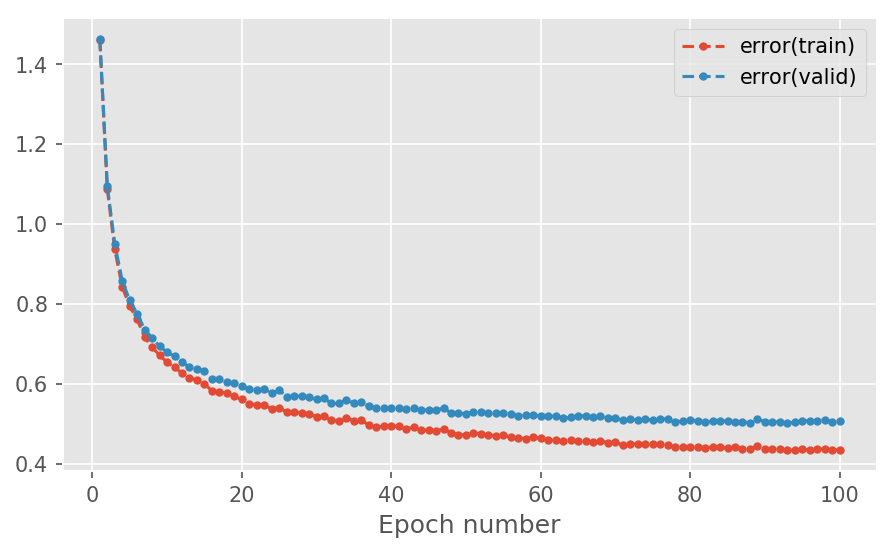

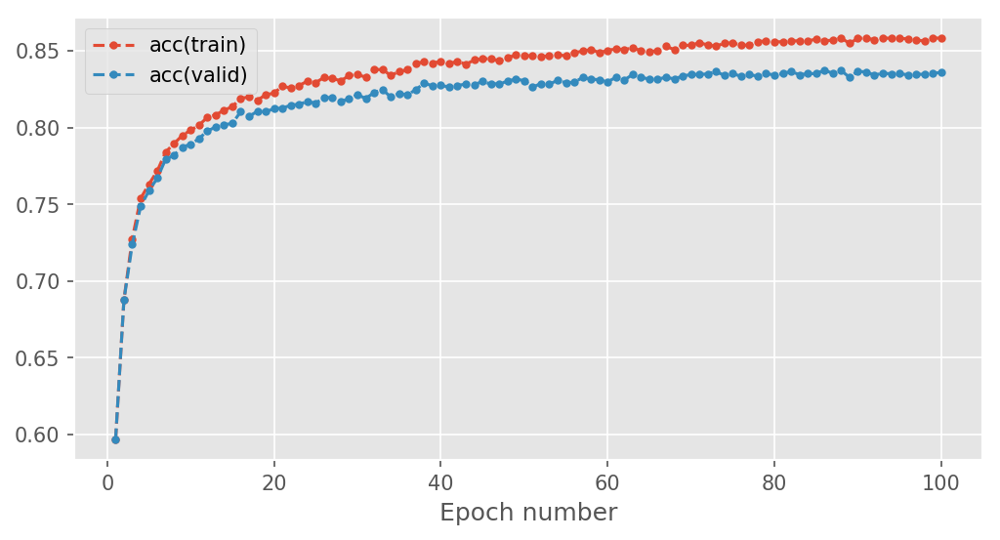

In [233]:
answers

[]

0.01
KeysView(<numpy.lib.npyio.NpzFile object at 0x12c3a39b0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12c3a5f60>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12c3a5f60>)


0.01


Epoch 1: 2.7s to complete
    error(train)=1.44e+00, acc(train)=6.01e-01, error(valid)=1.44e+00, acc(valid)=6.01e-01


1


0.02


Epoch 2: 2.3s to complete
    error(train)=1.06e+00, acc(train)=6.95e-01, error(valid)=1.07e+00, acc(valid)=6.91e-01


2


0.03


Epoch 3: 2.1s to complete
    error(train)=8.88e-01, acc(train)=7.38e-01, error(valid)=9.04e-01, acc(valid)=7.34e-01


3


0.04


Epoch 4: 2.0s to complete
    error(train)=7.89e-01, acc(train)=7.64e-01, error(valid)=8.09e-01, acc(valid)=7.59e-01


4


0.05


Epoch 5: 2.1s to complete
    error(train)=7.37e-01, acc(train)=7.74e-01, error(valid)=7.60e-01, acc(valid)=7.69e-01


5


0.06


Epoch 6: 2.1s to complete
    error(train)=6.97e-01, acc(train)=7.85e-01, error(valid)=7.22e-01, acc(valid)=7.75e-01


6


0.07


Epoch 7: 2.2s to complete
    error(train)=6.52e-01, acc(train)=7.98e-01, error(valid)=6.84e-01, acc(valid)=7.89e-01


7


0.08


Epoch 8: 2.6s to complete
    error(train)=6.20e-01, acc(train)=8.06e-01, error(valid)=6.62e-01, acc(valid)=7.94e-01


8


0.09


Epoch 9: 2.1s to complete
    error(train)=6.02e-01, acc(train)=8.11e-01, error(valid)=6.43e-01, acc(valid)=7.98e-01


9


0.1


Epoch 10: 2.1s to complete
    error(train)=5.75e-01, acc(train)=8.16e-01, error(valid)=6.20e-01, acc(valid)=8.04e-01


10


0.11


Epoch 11: 2.4s to complete
    error(train)=5.66e-01, acc(train)=8.20e-01, error(valid)=6.16e-01, acc(valid)=8.06e-01


11


0.12


Epoch 12: 4.3s to complete
    error(train)=5.46e-01, acc(train)=8.25e-01, error(valid)=6.04e-01, acc(valid)=8.09e-01


12


0.13


Epoch 13: 5.8s to complete
    error(train)=5.31e-01, acc(train)=8.28e-01, error(valid)=5.88e-01, acc(valid)=8.13e-01


13


0.14


Epoch 14: 6.3s to complete
    error(train)=5.19e-01, acc(train)=8.33e-01, error(valid)=5.80e-01, acc(valid)=8.16e-01


14


0.15


Epoch 15: 5.2s to complete
    error(train)=5.07e-01, acc(train)=8.36e-01, error(valid)=5.75e-01, acc(valid)=8.16e-01


15


0.16


Epoch 16: 4.9s to complete
    error(train)=4.91e-01, acc(train)=8.38e-01, error(valid)=5.61e-01, acc(valid)=8.16e-01


16


0.17


Epoch 17: 3.0s to complete
    error(train)=4.79e-01, acc(train)=8.44e-01, error(valid)=5.56e-01, acc(valid)=8.20e-01


17


0.18


Epoch 18: 3.0s to complete
    error(train)=4.79e-01, acc(train)=8.42e-01, error(valid)=5.53e-01, acc(valid)=8.21e-01


18


0.19


Epoch 19: 6.9s to complete
    error(train)=4.57e-01, acc(train)=8.50e-01, error(valid)=5.40e-01, acc(valid)=8.26e-01


19


0.2


Epoch 20: 6.1s to complete
    error(train)=4.55e-01, acc(train)=8.49e-01, error(valid)=5.38e-01, acc(valid)=8.27e-01


20


0.21


Epoch 21: 8.5s to complete
    error(train)=4.52e-01, acc(train)=8.50e-01, error(valid)=5.40e-01, acc(valid)=8.23e-01


0.22


Epoch 22: 7.0s to complete
    error(train)=4.40e-01, acc(train)=8.53e-01, error(valid)=5.33e-01, acc(valid)=8.27e-01


22


0.23


Epoch 23: 6.7s to complete
    error(train)=4.32e-01, acc(train)=8.55e-01, error(valid)=5.28e-01, acc(valid)=8.25e-01


23


0.24


Epoch 24: 6.2s to complete
    error(train)=4.20e-01, acc(train)=8.60e-01, error(valid)=5.19e-01, acc(valid)=8.29e-01


24


0.25


Epoch 25: 7.4s to complete
    error(train)=4.21e-01, acc(train)=8.59e-01, error(valid)=5.26e-01, acc(valid)=8.29e-01


0.26


Epoch 26: 7.0s to complete
    error(train)=4.09e-01, acc(train)=8.63e-01, error(valid)=5.15e-01, acc(valid)=8.32e-01


26


0.27


Epoch 27: 8.1s to complete
    error(train)=4.03e-01, acc(train)=8.65e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


27


0.28


Epoch 28: 8.1s to complete
    error(train)=4.05e-01, acc(train)=8.62e-01, error(valid)=5.21e-01, acc(valid)=8.28e-01


0.29


Epoch 29: 7.0s to complete
    error(train)=3.97e-01, acc(train)=8.65e-01, error(valid)=5.13e-01, acc(valid)=8.32e-01


29


0.3


Epoch 30: 8.6s to complete
    error(train)=3.89e-01, acc(train)=8.68e-01, error(valid)=5.10e-01, acc(valid)=8.31e-01


30


0.31


Epoch 31: 3.2s to complete
    error(train)=3.90e-01, acc(train)=8.67e-01, error(valid)=5.16e-01, acc(valid)=8.32e-01


0.32


Epoch 32: 2.9s to complete
    error(train)=3.78e-01, acc(train)=8.70e-01, error(valid)=5.04e-01, acc(valid)=8.36e-01


32


0.33


Epoch 33: 2.9s to complete
    error(train)=3.74e-01, acc(train)=8.72e-01, error(valid)=5.03e-01, acc(valid)=8.35e-01


33


0.34


Epoch 34: 2.1s to complete
    error(train)=3.77e-01, acc(train)=8.70e-01, error(valid)=5.12e-01, acc(valid)=8.34e-01


0.35


Epoch 35: 2.1s to complete
    error(train)=3.67e-01, acc(train)=8.73e-01, error(valid)=5.05e-01, acc(valid)=8.35e-01


0.36


Epoch 36: 2.0s to complete
    error(train)=3.64e-01, acc(train)=8.75e-01, error(valid)=5.03e-01, acc(valid)=8.36e-01


0.37


Epoch 37: 2.2s to complete
    error(train)=3.54e-01, acc(train)=8.79e-01, error(valid)=4.95e-01, acc(valid)=8.38e-01


37


0.38


Epoch 38: 2.6s to complete
    error(train)=3.51e-01, acc(train)=8.80e-01, error(valid)=5.01e-01, acc(valid)=8.38e-01


0.39


Epoch 39: 2.1s to complete
    error(train)=3.52e-01, acc(train)=8.78e-01, error(valid)=5.08e-01, acc(valid)=8.34e-01


0.4


Epoch 40: 2.1s to complete
    error(train)=3.49e-01, acc(train)=8.80e-01, error(valid)=5.05e-01, acc(valid)=8.37e-01


0.41


Epoch 41: 2.0s to complete
    error(train)=3.45e-01, acc(train)=8.80e-01, error(valid)=5.03e-01, acc(valid)=8.36e-01


0.42


Epoch 42: 2.4s to complete
    error(train)=3.39e-01, acc(train)=8.82e-01, error(valid)=5.00e-01, acc(valid)=8.40e-01


0.43


Epoch 43: 2.0s to complete
    error(train)=3.49e-01, acc(train)=8.78e-01, error(valid)=5.13e-01, acc(valid)=8.34e-01


0.44


Epoch 44: 2.0s to complete
    error(train)=3.32e-01, acc(train)=8.86e-01, error(valid)=5.00e-01, acc(valid)=8.38e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=3.35e-01, acc(train)=8.84e-01, error(valid)=5.03e-01, acc(valid)=8.40e-01


0.46


Epoch 46: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.86e-01, error(valid)=5.08e-01, acc(valid)=8.38e-01


0.47


Epoch 47: 2.0s to complete
    error(train)=3.35e-01, acc(train)=8.82e-01, error(valid)=5.15e-01, acc(valid)=8.34e-01


0.48


Epoch 48: 2.1s to complete
    error(train)=3.27e-01, acc(train)=8.86e-01, error(valid)=5.08e-01, acc(valid)=8.35e-01


0.49


Epoch 49: 2.0s to complete
    error(train)=3.19e-01, acc(train)=8.89e-01, error(valid)=5.02e-01, acc(valid)=8.39e-01


0.5


Epoch 50: 2.0s to complete
    error(train)=3.23e-01, acc(train)=8.88e-01, error(valid)=5.08e-01, acc(valid)=8.38e-01


0.51


Epoch 51: 2.0s to complete
    error(train)=3.24e-01, acc(train)=8.86e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


0.52


Epoch 52: 2.0s to complete
    error(train)=3.18e-01, acc(train)=8.88e-01, error(valid)=5.09e-01, acc(valid)=8.37e-01


0.53


Epoch 53: 2.0s to complete
    error(train)=3.07e-01, acc(train)=8.93e-01, error(valid)=5.02e-01, acc(valid)=8.39e-01


0.54


Epoch 54: 2.0s to complete
    error(train)=3.11e-01, acc(train)=8.92e-01, error(valid)=5.10e-01, acc(valid)=8.38e-01


0.55


Epoch 55: 2.1s to complete
    error(train)=3.11e-01, acc(train)=8.91e-01, error(valid)=5.13e-01, acc(valid)=8.35e-01


0.56


Epoch 56: 2.5s to complete
    error(train)=3.04e-01, acc(train)=8.94e-01, error(valid)=5.09e-01, acc(valid)=8.40e-01


0.57


Epoch 57: 2.4s to complete
    error(train)=2.98e-01, acc(train)=8.95e-01, error(valid)=5.00e-01, acc(valid)=8.42e-01


0.58


Epoch 58: 2.3s to complete
    error(train)=3.00e-01, acc(train)=8.95e-01, error(valid)=5.12e-01, acc(valid)=8.37e-01


0.59


Epoch 59: 2.0s to complete
    error(train)=3.02e-01, acc(train)=8.94e-01, error(valid)=5.13e-01, acc(valid)=8.37e-01


0.6


Epoch 60: 2.0s to complete
    error(train)=2.96e-01, acc(train)=8.96e-01, error(valid)=5.11e-01, acc(valid)=8.37e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=2.92e-01, acc(train)=8.97e-01, error(valid)=5.11e-01, acc(valid)=8.40e-01


0.62


Epoch 62: 1.9s to complete
    error(train)=2.92e-01, acc(train)=8.96e-01, error(valid)=5.14e-01, acc(valid)=8.35e-01


0.63


Epoch 63: 2.0s to complete
    error(train)=2.86e-01, acc(train)=8.99e-01, error(valid)=5.10e-01, acc(valid)=8.43e-01


0.64


Epoch 64: 2.0s to complete
    error(train)=2.87e-01, acc(train)=8.98e-01, error(valid)=5.09e-01, acc(valid)=8.38e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=2.91e-01, acc(train)=8.94e-01, error(valid)=5.23e-01, acc(valid)=8.32e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=2.79e-01, acc(train)=9.02e-01, error(valid)=5.12e-01, acc(valid)=8.39e-01


0.67


Epoch 67: 2.0s to complete
    error(train)=2.76e-01, acc(train)=9.03e-01, error(valid)=5.13e-01, acc(valid)=8.43e-01


0.68


Epoch 68: 2.0s to complete
    error(train)=2.82e-01, acc(train)=9.00e-01, error(valid)=5.21e-01, acc(valid)=8.39e-01


0.69


Epoch 69: 2.0s to complete
    error(train)=2.78e-01, acc(train)=9.01e-01, error(valid)=5.22e-01, acc(valid)=8.38e-01


0.7


Epoch 70: 2.5s to complete
    error(train)=2.80e-01, acc(train)=9.00e-01, error(valid)=5.21e-01, acc(valid)=8.38e-01


0.71


Epoch 71: 2.1s to complete
    error(train)=2.71e-01, acc(train)=9.04e-01, error(valid)=5.17e-01, acc(valid)=8.38e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=2.73e-01, acc(train)=9.03e-01, error(valid)=5.21e-01, acc(valid)=8.40e-01


0.73


Epoch 73: 2.5s to complete
    error(train)=2.73e-01, acc(train)=9.02e-01, error(valid)=5.23e-01, acc(valid)=8.40e-01


0.74


Epoch 74: 2.1s to complete
    error(train)=2.68e-01, acc(train)=9.05e-01, error(valid)=5.21e-01, acc(valid)=8.40e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=2.68e-01, acc(train)=9.05e-01, error(valid)=5.23e-01, acc(valid)=8.41e-01


0.76


Epoch 76: 2.1s to complete
    error(train)=2.64e-01, acc(train)=9.07e-01, error(valid)=5.20e-01, acc(valid)=8.38e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=2.69e-01, acc(train)=9.05e-01, error(valid)=5.30e-01, acc(valid)=8.39e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=2.64e-01, acc(train)=9.06e-01, error(valid)=5.31e-01, acc(valid)=8.37e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=2.59e-01, acc(train)=9.09e-01, error(valid)=5.25e-01, acc(valid)=8.40e-01


0.8


Epoch 80: 2.0s to complete
    error(train)=2.61e-01, acc(train)=9.06e-01, error(valid)=5.31e-01, acc(valid)=8.38e-01


0.81


Epoch 81: 2.0s to complete
    error(train)=2.57e-01, acc(train)=9.09e-01, error(valid)=5.32e-01, acc(valid)=8.39e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=2.58e-01, acc(train)=9.08e-01, error(valid)=5.31e-01, acc(valid)=8.38e-01


0.83


Epoch 83: 2.0s to complete
    error(train)=2.56e-01, acc(train)=9.08e-01, error(valid)=5.35e-01, acc(valid)=8.39e-01


0.84


Epoch 84: 2.2s to complete
    error(train)=2.54e-01, acc(train)=9.08e-01, error(valid)=5.34e-01, acc(valid)=8.36e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=2.55e-01, acc(train)=9.09e-01, error(valid)=5.37e-01, acc(valid)=8.36e-01


0.86


Epoch 86: 2.2s to complete
    error(train)=2.51e-01, acc(train)=9.11e-01, error(valid)=5.31e-01, acc(valid)=8.41e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=2.50e-01, acc(train)=9.11e-01, error(valid)=5.36e-01, acc(valid)=8.40e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=2.50e-01, acc(train)=9.11e-01, error(valid)=5.41e-01, acc(valid)=8.36e-01


0.89


Epoch 89: 2.1s to complete
    error(train)=2.50e-01, acc(train)=9.10e-01, error(valid)=5.35e-01, acc(valid)=8.39e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=2.47e-01, acc(train)=9.12e-01, error(valid)=5.40e-01, acc(valid)=8.36e-01


0.91


Epoch 91: 2.0s to complete
    error(train)=2.48e-01, acc(train)=9.11e-01, error(valid)=5.46e-01, acc(valid)=8.35e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=2.44e-01, acc(train)=9.13e-01, error(valid)=5.43e-01, acc(valid)=8.38e-01


0.93


Epoch 93: 2.0s to complete
    error(train)=2.44e-01, acc(train)=9.12e-01, error(valid)=5.41e-01, acc(valid)=8.38e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=2.41e-01, acc(train)=9.14e-01, error(valid)=5.43e-01, acc(valid)=8.36e-01


0.95


Epoch 95: 2.0s to complete
    error(train)=2.41e-01, acc(train)=9.13e-01, error(valid)=5.47e-01, acc(valid)=8.34e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=2.39e-01, acc(train)=9.15e-01, error(valid)=5.50e-01, acc(valid)=8.35e-01


0.97


Epoch 97: 1.9s to complete
    error(train)=2.40e-01, acc(train)=9.13e-01, error(valid)=5.51e-01, acc(valid)=8.38e-01


0.98


Epoch 98: 2.1s to complete
    error(train)=2.38e-01, acc(train)=9.15e-01, error(valid)=5.53e-01, acc(valid)=8.36e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=2.34e-01, acc(train)=9.17e-01, error(valid)=5.50e-01, acc(valid)=8.38e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=2.37e-01, acc(train)=9.14e-01, error(valid)=5.55e-01, acc(valid)=8.36e-01



0.019999999999999997
KeysView(<numpy.lib.npyio.NpzFile object at 0x11baa29b0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11baa2f98>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11baa2f60>)


0.01


Epoch 1: 2.0s to complete
    error(train)=1.46e+00, acc(train)=5.91e-01, error(valid)=1.47e+00, acc(valid)=5.92e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.09e+00, acc(train)=6.86e-01, error(valid)=1.10e+00, acc(valid)=6.77e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=9.48e-01, acc(train)=7.19e-01, error(valid)=9.61e-01, acc(valid)=7.12e-01


3


0.04


Epoch 4: 1.9s to complete
    error(train)=8.40e-01, acc(train)=7.49e-01, error(valid)=8.58e-01, acc(valid)=7.45e-01


4


0.05


Epoch 5: 2.0s to complete
    error(train)=7.63e-01, acc(train)=7.68e-01, error(valid)=7.86e-01, acc(valid)=7.63e-01


5


0.06


Epoch 6: 1.9s to complete
    error(train)=7.08e-01, acc(train)=7.83e-01, error(valid)=7.32e-01, acc(valid)=7.75e-01


6


0.07


Epoch 7: 1.9s to complete
    error(train)=6.78e-01, acc(train)=7.90e-01, error(valid)=7.05e-01, acc(valid)=7.82e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.36e-01, acc(train)=8.01e-01, error(valid)=6.71e-01, acc(valid)=7.93e-01


8


0.09


Epoch 9: 2.5s to complete
    error(train)=6.20e-01, acc(train)=8.00e-01, error(valid)=6.58e-01, acc(valid)=7.90e-01


9


0.1


Epoch 10: 1.9s to complete
    error(train)=5.91e-01, acc(train)=8.13e-01, error(valid)=6.32e-01, acc(valid)=8.00e-01


10


0.11


Epoch 11: 2.0s to complete
    error(train)=5.68e-01, acc(train)=8.18e-01, error(valid)=6.16e-01, acc(valid)=8.03e-01


11


0.12


Epoch 12: 2.5s to complete
    error(train)=5.46e-01, acc(train)=8.25e-01, error(valid)=6.00e-01, acc(valid)=8.07e-01


12


0.13


Epoch 13: 2.1s to complete
    error(train)=5.37e-01, acc(train)=8.28e-01, error(valid)=5.95e-01, acc(valid)=8.12e-01


13


0.14


Epoch 14: 2.0s to complete
    error(train)=5.27e-01, acc(train)=8.29e-01, error(valid)=5.91e-01, acc(valid)=8.12e-01


14


0.15


Epoch 15: 1.9s to complete
    error(train)=5.07e-01, acc(train)=8.34e-01, error(valid)=5.71e-01, acc(valid)=8.17e-01


15


0.16


Epoch 16: 2.0s to complete
    error(train)=4.94e-01, acc(train)=8.38e-01, error(valid)=5.62e-01, acc(valid)=8.19e-01


16


0.17


Epoch 17: 1.9s to complete
    error(train)=4.96e-01, acc(train)=8.37e-01, error(valid)=5.67e-01, acc(valid)=8.16e-01


0.18


Epoch 18: 2.5s to complete
    error(train)=4.76e-01, acc(train)=8.43e-01, error(valid)=5.51e-01, acc(valid)=8.20e-01


18


0.19


Epoch 19: 2.4s to complete
    error(train)=4.63e-01, acc(train)=8.47e-01, error(valid)=5.39e-01, acc(valid)=8.26e-01


19


0.2


Epoch 20: 2.3s to complete
    error(train)=4.64e-01, acc(train)=8.46e-01, error(valid)=5.48e-01, acc(valid)=8.25e-01


0.21


Epoch 21: 2.5s to complete
    error(train)=4.48e-01, acc(train)=8.52e-01, error(valid)=5.33e-01, acc(valid)=8.28e-01


21


0.22


Epoch 22: 2.0s to complete
    error(train)=4.46e-01, acc(train)=8.50e-01, error(valid)=5.37e-01, acc(valid)=8.25e-01


0.23


Epoch 23: 2.0s to complete
    error(train)=4.38e-01, acc(train)=8.53e-01, error(valid)=5.32e-01, acc(valid)=8.29e-01


23


0.24


Epoch 24: 1.9s to complete
    error(train)=4.26e-01, acc(train)=8.58e-01, error(valid)=5.23e-01, acc(valid)=8.30e-01


24


0.25


Epoch 25: 1.9s to complete
    error(train)=4.22e-01, acc(train)=8.59e-01, error(valid)=5.20e-01, acc(valid)=8.32e-01


25


0.26


Epoch 26: 2.0s to complete
    error(train)=4.21e-01, acc(train)=8.57e-01, error(valid)=5.25e-01, acc(valid)=8.31e-01


0.27


Epoch 27: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.61e-01, error(valid)=5.22e-01, acc(valid)=8.31e-01


0.28


Epoch 28: 2.0s to complete
    error(train)=4.09e-01, acc(train)=8.63e-01, error(valid)=5.18e-01, acc(valid)=8.32e-01


28


0.29


Epoch 29: 2.0s to complete
    error(train)=4.05e-01, acc(train)=8.63e-01, error(valid)=5.20e-01, acc(valid)=8.31e-01


0.3


Epoch 30: 2.0s to complete
    error(train)=4.00e-01, acc(train)=8.63e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


30


0.31


Epoch 31: 2.0s to complete
    error(train)=3.93e-01, acc(train)=8.68e-01, error(valid)=5.10e-01, acc(valid)=8.35e-01


31


0.32


Epoch 32: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.66e-01, error(valid)=5.14e-01, acc(valid)=8.36e-01


0.33


Epoch 33: 1.9s to complete
    error(train)=3.81e-01, acc(train)=8.70e-01, error(valid)=5.06e-01, acc(valid)=8.36e-01


33


0.34


Epoch 34: 2.1s to complete
    error(train)=3.77e-01, acc(train)=8.71e-01, error(valid)=5.02e-01, acc(valid)=8.36e-01


34


0.35


Epoch 35: 2.0s to complete
    error(train)=3.77e-01, acc(train)=8.71e-01, error(valid)=5.08e-01, acc(valid)=8.35e-01


0.36


Epoch 36: 2.1s to complete
    error(train)=3.65e-01, acc(train)=8.76e-01, error(valid)=4.98e-01, acc(valid)=8.41e-01


36


0.37


Epoch 37: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.72e-01, error(valid)=5.07e-01, acc(valid)=8.33e-01


0.38


Epoch 38: 2.0s to complete
    error(train)=3.65e-01, acc(train)=8.75e-01, error(valid)=5.00e-01, acc(valid)=8.39e-01


0.39


Epoch 39: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.77e-01, error(valid)=4.98e-01, acc(valid)=8.40e-01


0.4


Epoch 40: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.77e-01, error(valid)=5.01e-01, acc(valid)=8.38e-01


0.41


Epoch 41: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.78e-01, error(valid)=4.97e-01, acc(valid)=8.40e-01


41


0.42


Epoch 42: 2.0s to complete
    error(train)=3.49e-01, acc(train)=8.79e-01, error(valid)=4.97e-01, acc(valid)=8.39e-01


42


0.43


Epoch 43: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.82e-01, error(valid)=4.95e-01, acc(valid)=8.39e-01


43


0.44


Epoch 44: 2.0s to complete
    error(train)=3.40e-01, acc(train)=8.82e-01, error(valid)=4.97e-01, acc(valid)=8.37e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=3.41e-01, acc(train)=8.81e-01, error(valid)=4.98e-01, acc(valid)=8.40e-01


0.46


Epoch 46: 2.0s to complete
    error(train)=3.40e-01, acc(train)=8.81e-01, error(valid)=5.05e-01, acc(valid)=8.37e-01


0.47


Epoch 47: 2.1s to complete
    error(train)=3.32e-01, acc(train)=8.84e-01, error(valid)=4.97e-01, acc(valid)=8.37e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.84e-01, error(valid)=4.98e-01, acc(valid)=8.40e-01


0.49


Epoch 49: 2.4s to complete
    error(train)=3.34e-01, acc(train)=8.83e-01, error(valid)=5.02e-01, acc(valid)=8.38e-01


0.5


Epoch 50: 2.0s to complete
    error(train)=3.29e-01, acc(train)=8.85e-01, error(valid)=4.98e-01, acc(valid)=8.35e-01


0.51


Epoch 51: 2.0s to complete
    error(train)=3.30e-01, acc(train)=8.85e-01, error(valid)=5.02e-01, acc(valid)=8.40e-01


0.52


Epoch 52: 2.5s to complete
    error(train)=3.20e-01, acc(train)=8.88e-01, error(valid)=4.93e-01, acc(valid)=8.41e-01


52


0.53


Epoch 53: 2.6s to complete
    error(train)=3.18e-01, acc(train)=8.89e-01, error(valid)=5.01e-01, acc(valid)=8.40e-01


0.54


Epoch 54: 2.0s to complete
    error(train)=3.16e-01, acc(train)=8.90e-01, error(valid)=4.93e-01, acc(valid)=8.39e-01


0.55


Epoch 55: 2.0s to complete
    error(train)=3.15e-01, acc(train)=8.91e-01, error(valid)=5.01e-01, acc(valid)=8.41e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.12e-01, acc(train)=8.91e-01, error(valid)=4.96e-01, acc(valid)=8.41e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=3.10e-01, acc(train)=8.92e-01, error(valid)=4.98e-01, acc(valid)=8.38e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.08e-01, acc(train)=8.91e-01, error(valid)=4.97e-01, acc(valid)=8.41e-01


0.59


Epoch 59: 2.1s to complete
    error(train)=3.02e-01, acc(train)=8.94e-01, error(valid)=4.95e-01, acc(valid)=8.39e-01


0.6


Epoch 60: 2.0s to complete
    error(train)=3.11e-01, acc(train)=8.91e-01, error(valid)=5.09e-01, acc(valid)=8.37e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=3.00e-01, acc(train)=8.94e-01, error(valid)=4.97e-01, acc(valid)=8.42e-01


0.62


Epoch 62: 2.0s to complete
    error(train)=2.98e-01, acc(train)=8.96e-01, error(valid)=4.96e-01, acc(valid)=8.40e-01


0.63


Epoch 63: 2.0s to complete
    error(train)=2.99e-01, acc(train)=8.95e-01, error(valid)=5.01e-01, acc(valid)=8.40e-01


0.64


Epoch 64: 2.0s to complete
    error(train)=2.90e-01, acc(train)=8.99e-01, error(valid)=4.91e-01, acc(valid)=8.45e-01


64


0.65


Epoch 65: 2.0s to complete
    error(train)=2.94e-01, acc(train)=8.96e-01, error(valid)=5.04e-01, acc(valid)=8.39e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=2.94e-01, acc(train)=8.96e-01, error(valid)=5.09e-01, acc(valid)=8.38e-01


0.67


Epoch 67: 2.0s to complete
    error(train)=2.91e-01, acc(train)=8.98e-01, error(valid)=5.03e-01, acc(valid)=8.37e-01


0.68


Epoch 68: 2.0s to complete
    error(train)=2.89e-01, acc(train)=8.99e-01, error(valid)=5.05e-01, acc(valid)=8.38e-01


0.69


Epoch 69: 2.0s to complete
    error(train)=2.87e-01, acc(train)=8.99e-01, error(valid)=5.05e-01, acc(valid)=8.41e-01


0.7


Epoch 70: 2.0s to complete
    error(train)=2.88e-01, acc(train)=8.98e-01, error(valid)=5.05e-01, acc(valid)=8.39e-01


0.71


Epoch 71: 2.0s to complete
    error(train)=2.84e-01, acc(train)=9.01e-01, error(valid)=5.04e-01, acc(valid)=8.40e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=2.83e-01, acc(train)=9.00e-01, error(valid)=5.06e-01, acc(valid)=8.39e-01


0.73


Epoch 73: 2.0s to complete
    error(train)=2.78e-01, acc(train)=9.02e-01, error(valid)=5.09e-01, acc(valid)=8.41e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=2.77e-01, acc(train)=9.02e-01, error(valid)=5.09e-01, acc(valid)=8.39e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=2.76e-01, acc(train)=9.02e-01, error(valid)=5.09e-01, acc(valid)=8.40e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=2.77e-01, acc(train)=9.02e-01, error(valid)=5.11e-01, acc(valid)=8.39e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=2.73e-01, acc(train)=9.04e-01, error(valid)=5.09e-01, acc(valid)=8.44e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=2.69e-01, acc(train)=9.05e-01, error(valid)=5.09e-01, acc(valid)=8.40e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=2.70e-01, acc(train)=9.05e-01, error(valid)=5.13e-01, acc(valid)=8.38e-01


0.8


Epoch 80: 2.0s to complete
    error(train)=2.69e-01, acc(train)=9.05e-01, error(valid)=5.08e-01, acc(valid)=8.40e-01


0.81


Epoch 81: 2.0s to complete
    error(train)=2.65e-01, acc(train)=9.07e-01, error(valid)=5.07e-01, acc(valid)=8.40e-01


0.82


Epoch 82: 2.4s to complete
    error(train)=2.68e-01, acc(train)=9.05e-01, error(valid)=5.14e-01, acc(valid)=8.39e-01


0.83


Epoch 83: 2.4s to complete
    error(train)=2.64e-01, acc(train)=9.06e-01, error(valid)=5.15e-01, acc(valid)=8.43e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=2.64e-01, acc(train)=9.06e-01, error(valid)=5.16e-01, acc(valid)=8.39e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=2.61e-01, acc(train)=9.08e-01, error(valid)=5.14e-01, acc(valid)=8.42e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=2.64e-01, acc(train)=9.06e-01, error(valid)=5.20e-01, acc(valid)=8.41e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=2.65e-01, acc(train)=9.06e-01, error(valid)=5.26e-01, acc(valid)=8.37e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=2.62e-01, acc(train)=9.07e-01, error(valid)=5.23e-01, acc(valid)=8.39e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=2.57e-01, acc(train)=9.09e-01, error(valid)=5.22e-01, acc(valid)=8.36e-01


0.9


Epoch 90: 2.7s to complete
    error(train)=2.55e-01, acc(train)=9.10e-01, error(valid)=5.15e-01, acc(valid)=8.39e-01


0.91


Epoch 91: 2.0s to complete
    error(train)=2.52e-01, acc(train)=9.11e-01, error(valid)=5.18e-01, acc(valid)=8.40e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=2.50e-01, acc(train)=9.11e-01, error(valid)=5.15e-01, acc(valid)=8.41e-01


0.93


Epoch 93: 2.4s to complete
    error(train)=2.52e-01, acc(train)=9.10e-01, error(valid)=5.22e-01, acc(valid)=8.39e-01


0.94


Epoch 94: 2.6s to complete
    error(train)=2.54e-01, acc(train)=9.10e-01, error(valid)=5.24e-01, acc(valid)=8.41e-01


0.95


Epoch 95: 2.1s to complete
    error(train)=2.51e-01, acc(train)=9.11e-01, error(valid)=5.27e-01, acc(valid)=8.41e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=2.52e-01, acc(train)=9.10e-01, error(valid)=5.27e-01, acc(valid)=8.38e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=2.48e-01, acc(train)=9.12e-01, error(valid)=5.27e-01, acc(valid)=8.38e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=2.49e-01, acc(train)=9.11e-01, error(valid)=5.31e-01, acc(valid)=8.37e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=2.43e-01, acc(train)=9.14e-01, error(valid)=5.26e-01, acc(valid)=8.38e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=2.44e-01, acc(train)=9.14e-01, error(valid)=5.31e-01, acc(valid)=8.39e-01



0.03
KeysView(<numpy.lib.npyio.NpzFile object at 0x12f2e95f8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12bb6e278>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12bb6e278>)


0.01


Epoch 1: 1.9s to complete
    error(train)=1.42e+00, acc(train)=5.99e-01, error(valid)=1.43e+00, acc(valid)=5.87e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.03e+00, acc(train)=6.99e-01, error(valid)=1.05e+00, acc(valid)=6.94e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=8.76e-01, acc(train)=7.42e-01, error(valid)=8.93e-01, acc(valid)=7.33e-01


3


0.04


Epoch 4: 2.0s to complete
    error(train)=7.98e-01, acc(train)=7.59e-01, error(valid)=8.23e-01, acc(valid)=7.52e-01


4


0.05


Epoch 5: 1.9s to complete
    error(train)=7.35e-01, acc(train)=7.70e-01, error(valid)=7.68e-01, acc(valid)=7.62e-01


5


0.06


Epoch 6: 1.9s to complete
    error(train)=6.96e-01, acc(train)=7.86e-01, error(valid)=7.36e-01, acc(valid)=7.73e-01


6


0.07


Epoch 7: 1.9s to complete
    error(train)=6.60e-01, acc(train)=7.93e-01, error(valid)=7.02e-01, acc(valid)=7.83e-01


7


0.08


Epoch 8: 2.0s to complete
    error(train)=6.44e-01, acc(train)=7.97e-01, error(valid)=6.88e-01, acc(valid)=7.87e-01


8


0.09


Epoch 9: 1.9s to complete
    error(train)=6.03e-01, acc(train)=8.09e-01, error(valid)=6.55e-01, acc(valid)=7.98e-01


9


0.1


Epoch 10: 2.0s to complete
    error(train)=5.84e-01, acc(train)=8.14e-01, error(valid)=6.37e-01, acc(valid)=8.00e-01


10


0.11


Epoch 11: 1.9s to complete
    error(train)=5.72e-01, acc(train)=8.16e-01, error(valid)=6.32e-01, acc(valid)=7.97e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=5.55e-01, acc(train)=8.22e-01, error(valid)=6.21e-01, acc(valid)=8.04e-01


12


0.13


Epoch 13: 1.9s to complete
    error(train)=5.28e-01, acc(train)=8.30e-01, error(valid)=5.96e-01, acc(valid)=8.09e-01


13


0.14


Epoch 14: 2.0s to complete
    error(train)=5.25e-01, acc(train)=8.30e-01, error(valid)=5.96e-01, acc(valid)=8.11e-01


0.15


Epoch 15: 2.0s to complete
    error(train)=5.10e-01, acc(train)=8.35e-01, error(valid)=5.80e-01, acc(valid)=8.15e-01


15


0.16


Epoch 16: 1.9s to complete
    error(train)=4.97e-01, acc(train)=8.37e-01, error(valid)=5.74e-01, acc(valid)=8.17e-01


16


0.17


Epoch 17: 2.0s to complete
    error(train)=4.83e-01, acc(train)=8.42e-01, error(valid)=5.65e-01, acc(valid)=8.19e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=4.78e-01, acc(train)=8.43e-01, error(valid)=5.63e-01, acc(valid)=8.18e-01


18


0.19


Epoch 19: 2.5s to complete
    error(train)=4.68e-01, acc(train)=8.46e-01, error(valid)=5.54e-01, acc(valid)=8.20e-01


19


0.2


Epoch 20: 2.5s to complete
    error(train)=4.68e-01, acc(train)=8.46e-01, error(valid)=5.57e-01, acc(valid)=8.20e-01


0.21


Epoch 21: 1.9s to complete
    error(train)=4.53e-01, acc(train)=8.50e-01, error(valid)=5.47e-01, acc(valid)=8.22e-01


21


0.22


Epoch 22: 1.9s to complete
    error(train)=4.46e-01, acc(train)=8.52e-01, error(valid)=5.43e-01, acc(valid)=8.26e-01


22


0.23


Epoch 23: 1.9s to complete
    error(train)=4.33e-01, acc(train)=8.56e-01, error(valid)=5.33e-01, acc(valid)=8.28e-01


23


0.24


Epoch 24: 2.0s to complete
    error(train)=4.33e-01, acc(train)=8.57e-01, error(valid)=5.36e-01, acc(valid)=8.32e-01


0.25


Epoch 25: 2.0s to complete
    error(train)=4.38e-01, acc(train)=8.52e-01, error(valid)=5.43e-01, acc(valid)=8.23e-01


0.26


Epoch 26: 2.0s to complete
    error(train)=4.28e-01, acc(train)=8.56e-01, error(valid)=5.40e-01, acc(valid)=8.26e-01


0.27


Epoch 27: 2.0s to complete
    error(train)=4.21e-01, acc(train)=8.59e-01, error(valid)=5.28e-01, acc(valid)=8.28e-01


27


0.28


Epoch 28: 1.9s to complete
    error(train)=4.13e-01, acc(train)=8.61e-01, error(valid)=5.29e-01, acc(valid)=8.29e-01


0.29


Epoch 29: 1.9s to complete
    error(train)=4.05e-01, acc(train)=8.64e-01, error(valid)=5.22e-01, acc(valid)=8.32e-01


29


0.3


Epoch 30: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.66e-01, error(valid)=5.20e-01, acc(valid)=8.31e-01


30


0.31


Epoch 31: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.66e-01, error(valid)=5.25e-01, acc(valid)=8.32e-01


0.32


Epoch 32: 2.1s to complete
    error(train)=3.86e-01, acc(train)=8.69e-01, error(valid)=5.12e-01, acc(valid)=8.36e-01


32


0.33


Epoch 33: 2.0s to complete
    error(train)=3.86e-01, acc(train)=8.68e-01, error(valid)=5.13e-01, acc(valid)=8.35e-01


0.34


Epoch 34: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.69e-01, error(valid)=5.16e-01, acc(valid)=8.33e-01


0.35


Epoch 35: 2.1s to complete
    error(train)=3.75e-01, acc(train)=8.73e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


35


0.36


Epoch 36: 2.0s to complete
    error(train)=3.75e-01, acc(train)=8.72e-01, error(valid)=5.14e-01, acc(valid)=8.36e-01


0.37


Epoch 37: 2.0s to complete
    error(train)=3.69e-01, acc(train)=8.73e-01, error(valid)=5.10e-01, acc(valid)=8.37e-01


0.38


Epoch 38: 2.1s to complete
    error(train)=3.68e-01, acc(train)=8.74e-01, error(valid)=5.10e-01, acc(valid)=8.36e-01


0.39


Epoch 39: 2.0s to complete
    error(train)=3.65e-01, acc(train)=8.74e-01, error(valid)=5.11e-01, acc(valid)=8.34e-01


0.4


Epoch 40: 2.0s to complete
    error(train)=3.61e-01, acc(train)=8.75e-01, error(valid)=5.08e-01, acc(valid)=8.36e-01


40


0.41


Epoch 41: 2.0s to complete
    error(train)=3.58e-01, acc(train)=8.76e-01, error(valid)=5.09e-01, acc(valid)=8.36e-01


0.42


Epoch 42: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.79e-01, error(valid)=5.01e-01, acc(valid)=8.37e-01


42


0.43


Epoch 43: 2.1s to complete
    error(train)=3.50e-01, acc(train)=8.79e-01, error(valid)=5.08e-01, acc(valid)=8.37e-01


0.44


Epoch 44: 2.9s to complete
    error(train)=3.45e-01, acc(train)=8.81e-01, error(valid)=5.01e-01, acc(valid)=8.38e-01


0.45


Epoch 45: 2.9s to complete
    error(train)=3.44e-01, acc(train)=8.81e-01, error(valid)=5.04e-01, acc(valid)=8.38e-01


0.46


Epoch 46: 2.4s to complete
    error(train)=3.43e-01, acc(train)=8.80e-01, error(valid)=5.12e-01, acc(valid)=8.33e-01


0.47


Epoch 47: 2.0s to complete
    error(train)=3.42e-01, acc(train)=8.82e-01, error(valid)=5.08e-01, acc(valid)=8.36e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=3.40e-01, acc(train)=8.83e-01, error(valid)=5.10e-01, acc(valid)=8.33e-01


0.49


Epoch 49: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.85e-01, error(valid)=5.01e-01, acc(valid)=8.39e-01


0.5


Epoch 50: 2.0s to complete
    error(train)=3.36e-01, acc(train)=8.84e-01, error(valid)=5.09e-01, acc(valid)=8.36e-01


0.51


Epoch 51: 2.0s to complete
    error(train)=3.28e-01, acc(train)=8.86e-01, error(valid)=5.04e-01, acc(valid)=8.37e-01


0.52


Epoch 52: 2.0s to complete
    error(train)=3.25e-01, acc(train)=8.87e-01, error(valid)=5.07e-01, acc(valid)=8.38e-01


0.53


Epoch 53: 2.0s to complete
    error(train)=3.22e-01, acc(train)=8.88e-01, error(valid)=5.04e-01, acc(valid)=8.38e-01


0.54


Epoch 54: 2.0s to complete
    error(train)=3.22e-01, acc(train)=8.87e-01, error(valid)=5.07e-01, acc(valid)=8.36e-01


0.55


Epoch 55: 2.0s to complete
    error(train)=3.17e-01, acc(train)=8.89e-01, error(valid)=5.03e-01, acc(valid)=8.36e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.19e-01, acc(train)=8.89e-01, error(valid)=5.06e-01, acc(valid)=8.36e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=3.20e-01, acc(train)=8.89e-01, error(valid)=5.10e-01, acc(valid)=8.35e-01


0.58


Epoch 58: 2.1s to complete
    error(train)=3.14e-01, acc(train)=8.90e-01, error(valid)=5.08e-01, acc(valid)=8.38e-01


0.59


Epoch 59: 2.0s to complete
    error(train)=3.14e-01, acc(train)=8.89e-01, error(valid)=5.10e-01, acc(valid)=8.34e-01


0.6


Epoch 60: 2.0s to complete
    error(train)=3.08e-01, acc(train)=8.92e-01, error(valid)=5.07e-01, acc(valid)=8.36e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=3.08e-01, acc(train)=8.92e-01, error(valid)=5.06e-01, acc(valid)=8.37e-01


0.62


Epoch 62: 2.0s to complete
    error(train)=3.08e-01, acc(train)=8.93e-01, error(valid)=5.06e-01, acc(valid)=8.37e-01


0.63


Epoch 63: 2.0s to complete
    error(train)=3.07e-01, acc(train)=8.91e-01, error(valid)=5.13e-01, acc(valid)=8.39e-01


0.64


Epoch 64: 2.0s to complete
    error(train)=3.00e-01, acc(train)=8.95e-01, error(valid)=5.09e-01, acc(valid)=8.37e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=3.01e-01, acc(train)=8.94e-01, error(valid)=5.10e-01, acc(valid)=8.39e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=2.98e-01, acc(train)=8.96e-01, error(valid)=5.09e-01, acc(valid)=8.37e-01


0.67


Epoch 67: 2.0s to complete
    error(train)=2.98e-01, acc(train)=8.95e-01, error(valid)=5.16e-01, acc(valid)=8.34e-01


0.68


Epoch 68: 2.0s to complete
    error(train)=2.90e-01, acc(train)=8.99e-01, error(valid)=5.04e-01, acc(valid)=8.40e-01


0.69


Epoch 69: 2.0s to complete
    error(train)=2.96e-01, acc(train)=8.96e-01, error(valid)=5.19e-01, acc(valid)=8.35e-01


0.7


Epoch 70: 2.5s to complete
    error(train)=2.92e-01, acc(train)=8.98e-01, error(valid)=5.11e-01, acc(valid)=8.39e-01


0.71


Epoch 71: 2.6s to complete
    error(train)=2.92e-01, acc(train)=8.97e-01, error(valid)=5.13e-01, acc(valid)=8.37e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=2.85e-01, acc(train)=9.00e-01, error(valid)=5.12e-01, acc(valid)=8.39e-01


0.73


Epoch 73: 2.0s to complete
    error(train)=2.82e-01, acc(train)=9.00e-01, error(valid)=5.08e-01, acc(valid)=8.36e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=2.85e-01, acc(train)=8.99e-01, error(valid)=5.17e-01, acc(valid)=8.36e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=2.84e-01, acc(train)=9.00e-01, error(valid)=5.16e-01, acc(valid)=8.37e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=2.82e-01, acc(train)=9.00e-01, error(valid)=5.13e-01, acc(valid)=8.35e-01


0.77


Epoch 77: 2.3s to complete
    error(train)=2.81e-01, acc(train)=9.01e-01, error(valid)=5.18e-01, acc(valid)=8.37e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=2.82e-01, acc(train)=9.00e-01, error(valid)=5.21e-01, acc(valid)=8.35e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=2.72e-01, acc(train)=9.04e-01, error(valid)=5.10e-01, acc(valid)=8.39e-01


0.8


Epoch 80: 2.0s to complete
    error(train)=2.76e-01, acc(train)=9.03e-01, error(valid)=5.20e-01, acc(valid)=8.36e-01


0.81


Epoch 81: 2.1s to complete
    error(train)=2.74e-01, acc(train)=9.03e-01, error(valid)=5.18e-01, acc(valid)=8.38e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=2.71e-01, acc(train)=9.04e-01, error(valid)=5.18e-01, acc(valid)=8.37e-01


0.83


Epoch 83: 2.0s to complete
    error(train)=2.69e-01, acc(train)=9.05e-01, error(valid)=5.16e-01, acc(valid)=8.38e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=2.69e-01, acc(train)=9.05e-01, error(valid)=5.17e-01, acc(valid)=8.39e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=2.67e-01, acc(train)=9.06e-01, error(valid)=5.20e-01, acc(valid)=8.40e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=2.69e-01, acc(train)=9.05e-01, error(valid)=5.23e-01, acc(valid)=8.35e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=2.67e-01, acc(train)=9.06e-01, error(valid)=5.24e-01, acc(valid)=8.35e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=2.63e-01, acc(train)=9.08e-01, error(valid)=5.21e-01, acc(valid)=8.38e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=2.68e-01, acc(train)=9.05e-01, error(valid)=5.28e-01, acc(valid)=8.34e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=2.65e-01, acc(train)=9.06e-01, error(valid)=5.26e-01, acc(valid)=8.37e-01


0.91


Epoch 91: 2.0s to complete
    error(train)=2.64e-01, acc(train)=9.05e-01, error(valid)=5.27e-01, acc(valid)=8.35e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=2.58e-01, acc(train)=9.09e-01, error(valid)=5.23e-01, acc(valid)=8.37e-01


0.93


Epoch 93: 2.1s to complete
    error(train)=2.60e-01, acc(train)=9.08e-01, error(valid)=5.32e-01, acc(valid)=8.35e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=2.57e-01, acc(train)=9.09e-01, error(valid)=5.24e-01, acc(valid)=8.37e-01


0.95


Epoch 95: 2.1s to complete
    error(train)=2.57e-01, acc(train)=9.08e-01, error(valid)=5.30e-01, acc(valid)=8.35e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=2.55e-01, acc(train)=9.10e-01, error(valid)=5.28e-01, acc(valid)=8.34e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=2.54e-01, acc(train)=9.10e-01, error(valid)=5.29e-01, acc(valid)=8.35e-01


0.98


Epoch 98: 2.2s to complete
    error(train)=2.53e-01, acc(train)=9.11e-01, error(valid)=5.29e-01, acc(valid)=8.37e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=2.53e-01, acc(train)=9.10e-01, error(valid)=5.30e-01, acc(valid)=8.35e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=2.50e-01, acc(train)=9.13e-01, error(valid)=5.26e-01, acc(valid)=8.39e-01



0.039999999999999994
KeysView(<numpy.lib.npyio.NpzFile object at 0x12f412e48>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12f412e48>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12f412e48>)


0.01


Epoch 1: 2.0s to complete
    error(train)=1.45e+00, acc(train)=5.91e-01, error(valid)=1.47e+00, acc(valid)=5.86e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.08e+00, acc(train)=6.88e-01, error(valid)=1.09e+00, acc(valid)=6.84e-01


2


0.03


Epoch 3: 2.0s to complete
    error(train)=9.08e-01, acc(train)=7.33e-01, error(valid)=9.27e-01, acc(valid)=7.26e-01


3


0.04


Epoch 4: 1.9s to complete
    error(train)=8.06e-01, acc(train)=7.55e-01, error(valid)=8.24e-01, acc(valid)=7.46e-01


4


0.05


Epoch 5: 1.9s to complete
    error(train)=7.37e-01, acc(train)=7.76e-01, error(valid)=7.60e-01, acc(valid)=7.68e-01


5


0.06


Epoch 6: 2.0s to complete
    error(train)=6.94e-01, acc(train)=7.86e-01, error(valid)=7.21e-01, acc(valid)=7.77e-01


6


0.07


Epoch 7: 2.8s to complete
    error(train)=6.47e-01, acc(train)=7.99e-01, error(valid)=6.74e-01, acc(valid)=7.91e-01


7


0.08


Epoch 8: 2.4s to complete
    error(train)=6.25e-01, acc(train)=8.04e-01, error(valid)=6.59e-01, acc(valid)=7.97e-01


8


0.09


Epoch 9: 1.9s to complete
    error(train)=6.03e-01, acc(train)=8.09e-01, error(valid)=6.39e-01, acc(valid)=7.99e-01


9


0.1


Epoch 10: 2.0s to complete
    error(train)=5.88e-01, acc(train)=8.14e-01, error(valid)=6.29e-01, acc(valid)=8.02e-01


10


0.11


Epoch 11: 2.0s to complete
    error(train)=5.55e-01, acc(train)=8.22e-01, error(valid)=5.99e-01, acc(valid)=8.10e-01


11


0.12


Epoch 12: 1.9s to complete
    error(train)=5.48e-01, acc(train)=8.23e-01, error(valid)=5.96e-01, acc(valid)=8.09e-01


12


0.13


Epoch 13: 2.0s to complete
    error(train)=5.34e-01, acc(train)=8.26e-01, error(valid)=5.86e-01, acc(valid)=8.12e-01


13


0.14


Epoch 14: 2.5s to complete
    error(train)=5.18e-01, acc(train)=8.31e-01, error(valid)=5.73e-01, acc(valid)=8.18e-01


14


0.15


Epoch 15: 1.9s to complete
    error(train)=4.99e-01, acc(train)=8.38e-01, error(valid)=5.60e-01, acc(valid)=8.23e-01


15


0.16


Epoch 16: 2.0s to complete
    error(train)=4.92e-01, acc(train)=8.37e-01, error(valid)=5.58e-01, acc(valid)=8.20e-01


16


0.17


Epoch 17: 2.0s to complete
    error(train)=4.83e-01, acc(train)=8.41e-01, error(valid)=5.54e-01, acc(valid)=8.22e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=4.74e-01, acc(train)=8.43e-01, error(valid)=5.49e-01, acc(valid)=8.24e-01


18


0.19


Epoch 19: 1.9s to complete
    error(train)=4.70e-01, acc(train)=8.44e-01, error(valid)=5.49e-01, acc(valid)=8.23e-01


19


0.2


Epoch 20: 2.0s to complete
    error(train)=4.58e-01, acc(train)=8.49e-01, error(valid)=5.37e-01, acc(valid)=8.29e-01


20


0.21


Epoch 21: 2.0s to complete
    error(train)=4.53e-01, acc(train)=8.48e-01, error(valid)=5.37e-01, acc(valid)=8.25e-01


0.22


Epoch 22: 1.9s to complete
    error(train)=4.46e-01, acc(train)=8.50e-01, error(valid)=5.31e-01, acc(valid)=8.27e-01


22


0.23


Epoch 23: 1.9s to complete
    error(train)=4.46e-01, acc(train)=8.51e-01, error(valid)=5.34e-01, acc(valid)=8.27e-01


0.24


Epoch 24: 1.9s to complete
    error(train)=4.33e-01, acc(train)=8.55e-01, error(valid)=5.27e-01, acc(valid)=8.29e-01


24


0.25


Epoch 25: 2.0s to complete
    error(train)=4.24e-01, acc(train)=8.57e-01, error(valid)=5.21e-01, acc(valid)=8.30e-01


25


0.26


Epoch 26: 2.2s to complete
    error(train)=4.18e-01, acc(train)=8.60e-01, error(valid)=5.17e-01, acc(valid)=8.32e-01


26


0.27


Epoch 27: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.60e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


27


0.28


Epoch 28: 2.0s to complete
    error(train)=4.06e-01, acc(train)=8.63e-01, error(valid)=5.15e-01, acc(valid)=8.33e-01


0.29


Epoch 29: 2.1s to complete
    error(train)=4.04e-01, acc(train)=8.63e-01, error(valid)=5.12e-01, acc(valid)=8.32e-01


29


0.3


Epoch 30: 2.0s to complete
    error(train)=4.03e-01, acc(train)=8.63e-01, error(valid)=5.18e-01, acc(valid)=8.31e-01


0.31


Epoch 31: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.65e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


0.32


Epoch 32: 2.0s to complete
    error(train)=3.90e-01, acc(train)=8.67e-01, error(valid)=5.08e-01, acc(valid)=8.35e-01


32


0.33


Epoch 33: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.70e-01, error(valid)=5.05e-01, acc(valid)=8.35e-01


33


0.34


Epoch 34: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.69e-01, error(valid)=5.05e-01, acc(valid)=8.32e-01


0.35


Epoch 35: 2.0s to complete
    error(train)=3.82e-01, acc(train)=8.67e-01, error(valid)=5.09e-01, acc(valid)=8.33e-01


0.36


Epoch 36: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.71e-01, error(valid)=5.04e-01, acc(valid)=8.35e-01


36


0.37


Epoch 37: 2.4s to complete
    error(train)=3.68e-01, acc(train)=8.74e-01, error(valid)=4.99e-01, acc(valid)=8.36e-01


37


0.38


Epoch 38: 2.1s to complete
    error(train)=3.63e-01, acc(train)=8.76e-01, error(valid)=4.95e-01, acc(valid)=8.38e-01


38


0.39


Epoch 39: 2.0s to complete
    error(train)=3.59e-01, acc(train)=8.76e-01, error(valid)=5.00e-01, acc(valid)=8.36e-01


0.4


Epoch 40: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.76e-01, error(valid)=4.98e-01, acc(valid)=8.35e-01


0.41


Epoch 41: 2.2s to complete
    error(train)=3.63e-01, acc(train)=8.73e-01, error(valid)=5.04e-01, acc(valid)=8.33e-01


0.42


Epoch 42: 2.0s to complete
    error(train)=3.59e-01, acc(train)=8.74e-01, error(valid)=4.99e-01, acc(valid)=8.34e-01


0.43


Epoch 43: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.78e-01, error(valid)=5.01e-01, acc(valid)=8.38e-01


0.44


Epoch 44: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.76e-01, error(valid)=5.03e-01, acc(valid)=8.35e-01


0.45


Epoch 45: 2.3s to complete
    error(train)=3.45e-01, acc(train)=8.81e-01, error(valid)=4.95e-01, acc(valid)=8.39e-01


0.46


Epoch 46: 2.4s to complete
    error(train)=3.47e-01, acc(train)=8.78e-01, error(valid)=5.02e-01, acc(valid)=8.37e-01


0.47


Epoch 47: 2.4s to complete
    error(train)=3.39e-01, acc(train)=8.83e-01, error(valid)=4.99e-01, acc(valid)=8.38e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.82e-01, error(valid)=4.95e-01, acc(valid)=8.40e-01


48


0.49


Epoch 49: 2.0s to complete
    error(train)=3.32e-01, acc(train)=8.84e-01, error(valid)=4.92e-01, acc(valid)=8.39e-01


49


0.5


Epoch 50: 2.0s to complete
    error(train)=3.34e-01, acc(train)=8.83e-01, error(valid)=4.96e-01, acc(valid)=8.37e-01


0.51


Epoch 51: 2.0s to complete
    error(train)=3.35e-01, acc(train)=8.83e-01, error(valid)=5.04e-01, acc(valid)=8.37e-01


0.52


Epoch 52: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.84e-01, error(valid)=5.01e-01, acc(valid)=8.37e-01


0.53


Epoch 53: 2.0s to complete
    error(train)=3.25e-01, acc(train)=8.86e-01, error(valid)=4.98e-01, acc(valid)=8.36e-01


0.54


Epoch 54: 2.6s to complete
    error(train)=3.27e-01, acc(train)=8.86e-01, error(valid)=5.01e-01, acc(valid)=8.37e-01


0.55


Epoch 55: 2.0s to complete
    error(train)=3.21e-01, acc(train)=8.87e-01, error(valid)=5.00e-01, acc(valid)=8.38e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.19e-01, acc(train)=8.87e-01, error(valid)=4.98e-01, acc(valid)=8.37e-01


0.57


Epoch 57: 2.5s to complete
    error(train)=3.16e-01, acc(train)=8.90e-01, error(valid)=4.93e-01, acc(valid)=8.39e-01


0.58


Epoch 58: 2.6s to complete
    error(train)=3.15e-01, acc(train)=8.90e-01, error(valid)=5.00e-01, acc(valid)=8.36e-01


0.59


Epoch 59: 2.0s to complete
    error(train)=3.14e-01, acc(train)=8.90e-01, error(valid)=4.98e-01, acc(valid)=8.38e-01


0.6


Epoch 60: 2.0s to complete
    error(train)=3.12e-01, acc(train)=8.90e-01, error(valid)=4.97e-01, acc(valid)=8.39e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=3.11e-01, acc(train)=8.89e-01, error(valid)=5.02e-01, acc(valid)=8.36e-01


0.62


Epoch 62: 2.0s to complete
    error(train)=3.04e-01, acc(train)=8.94e-01, error(valid)=4.94e-01, acc(valid)=8.41e-01


0.63


Epoch 63: 2.4s to complete
    error(train)=3.06e-01, acc(train)=8.93e-01, error(valid)=4.97e-01, acc(valid)=8.37e-01


0.64


Epoch 64: 2.5s to complete
    error(train)=2.98e-01, acc(train)=8.96e-01, error(valid)=4.89e-01, acc(valid)=8.42e-01


64


0.65


Epoch 65: 2.1s to complete
    error(train)=3.02e-01, acc(train)=8.92e-01, error(valid)=5.01e-01, acc(valid)=8.36e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=2.98e-01, acc(train)=8.96e-01, error(valid)=5.00e-01, acc(valid)=8.37e-01


0.67


Epoch 67: 2.0s to complete
    error(train)=3.02e-01, acc(train)=8.93e-01, error(valid)=5.04e-01, acc(valid)=8.37e-01


0.68


Epoch 68: 2.0s to complete
    error(train)=2.94e-01, acc(train)=8.97e-01, error(valid)=4.99e-01, acc(valid)=8.40e-01


0.69


Epoch 69: 2.5s to complete
    error(train)=2.95e-01, acc(train)=8.95e-01, error(valid)=5.03e-01, acc(valid)=8.38e-01


0.7


Epoch 70: 2.5s to complete
    error(train)=2.92e-01, acc(train)=8.96e-01, error(valid)=5.02e-01, acc(valid)=8.40e-01


0.71


Epoch 71: 2.1s to complete
    error(train)=2.93e-01, acc(train)=8.97e-01, error(valid)=5.07e-01, acc(valid)=8.37e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=2.89e-01, acc(train)=8.97e-01, error(valid)=5.02e-01, acc(valid)=8.39e-01


0.73


Epoch 73: 2.1s to complete
    error(train)=2.92e-01, acc(train)=8.95e-01, error(valid)=5.05e-01, acc(valid)=8.35e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=2.87e-01, acc(train)=8.98e-01, error(valid)=5.01e-01, acc(valid)=8.37e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=2.87e-01, acc(train)=8.98e-01, error(valid)=5.08e-01, acc(valid)=8.39e-01


0.76


Epoch 76: 2.1s to complete
    error(train)=2.83e-01, acc(train)=9.00e-01, error(valid)=5.03e-01, acc(valid)=8.39e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=2.83e-01, acc(train)=9.00e-01, error(valid)=5.03e-01, acc(valid)=8.39e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=2.83e-01, acc(train)=8.99e-01, error(valid)=5.13e-01, acc(valid)=8.36e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=2.79e-01, acc(train)=9.01e-01, error(valid)=5.06e-01, acc(valid)=8.41e-01


0.8


Epoch 80: 2.0s to complete
    error(train)=2.77e-01, acc(train)=9.02e-01, error(valid)=5.02e-01, acc(valid)=8.39e-01


0.81


Epoch 81: 2.0s to complete
    error(train)=2.77e-01, acc(train)=9.01e-01, error(valid)=5.06e-01, acc(valid)=8.38e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=2.75e-01, acc(train)=9.03e-01, error(valid)=5.03e-01, acc(valid)=8.40e-01


0.83


Epoch 83: 2.0s to complete
    error(train)=2.76e-01, acc(train)=9.02e-01, error(valid)=5.08e-01, acc(valid)=8.36e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=2.75e-01, acc(train)=9.02e-01, error(valid)=5.12e-01, acc(valid)=8.37e-01


0.85


Epoch 85: 2.1s to complete
    error(train)=2.70e-01, acc(train)=9.04e-01, error(valid)=5.09e-01, acc(valid)=8.38e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=2.69e-01, acc(train)=9.06e-01, error(valid)=5.10e-01, acc(valid)=8.39e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=2.67e-01, acc(train)=9.06e-01, error(valid)=5.10e-01, acc(valid)=8.39e-01


0.88


Epoch 88: 2.1s to complete
    error(train)=2.67e-01, acc(train)=9.06e-01, error(valid)=5.11e-01, acc(valid)=8.36e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=2.64e-01, acc(train)=9.08e-01, error(valid)=5.04e-01, acc(valid)=8.40e-01


0.9


Epoch 90: 2.3s to complete
    error(train)=2.66e-01, acc(train)=9.06e-01, error(valid)=5.10e-01, acc(valid)=8.38e-01


0.91


Epoch 91: 2.0s to complete
    error(train)=2.66e-01, acc(train)=9.05e-01, error(valid)=5.12e-01, acc(valid)=8.39e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=2.64e-01, acc(train)=9.07e-01, error(valid)=5.10e-01, acc(valid)=8.37e-01


0.93


Epoch 93: 2.0s to complete
    error(train)=2.61e-01, acc(train)=9.08e-01, error(valid)=5.12e-01, acc(valid)=8.40e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=2.60e-01, acc(train)=9.08e-01, error(valid)=5.12e-01, acc(valid)=8.39e-01


0.95


Epoch 95: 2.0s to complete
    error(train)=2.61e-01, acc(train)=9.08e-01, error(valid)=5.18e-01, acc(valid)=8.39e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=2.60e-01, acc(train)=9.08e-01, error(valid)=5.16e-01, acc(valid)=8.38e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=2.60e-01, acc(train)=9.08e-01, error(valid)=5.18e-01, acc(valid)=8.38e-01


0.98


Epoch 98: 2.5s to complete
    error(train)=2.61e-01, acc(train)=9.06e-01, error(valid)=5.23e-01, acc(valid)=8.36e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=2.56e-01, acc(train)=9.10e-01, error(valid)=5.15e-01, acc(valid)=8.38e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=2.58e-01, acc(train)=9.09e-01, error(valid)=5.16e-01, acc(valid)=8.36e-01



0.049999999999999996
KeysView(<numpy.lib.npyio.NpzFile object at 0x12cb34e10>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12cb34f28>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12cb34ef0>)


0.01


Epoch 1: 2.6s to complete
    error(train)=1.44e+00, acc(train)=5.97e-01, error(valid)=1.44e+00, acc(valid)=5.96e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.05e+00, acc(train)=6.95e-01, error(valid)=1.06e+00, acc(valid)=6.89e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=9.07e-01, acc(train)=7.34e-01, error(valid)=9.20e-01, acc(valid)=7.28e-01


3


0.04


Epoch 4: 1.9s to complete
    error(train)=8.28e-01, acc(train)=7.49e-01, error(valid)=8.47e-01, acc(valid)=7.41e-01


4


0.05


Epoch 5: 1.9s to complete
    error(train)=7.63e-01, acc(train)=7.69e-01, error(valid)=7.87e-01, acc(valid)=7.60e-01


5


0.06


Epoch 6: 1.9s to complete
    error(train)=7.02e-01, acc(train)=7.84e-01, error(valid)=7.31e-01, acc(valid)=7.76e-01


6


0.07


Epoch 7: 1.9s to complete
    error(train)=6.68e-01, acc(train)=7.94e-01, error(valid)=6.99e-01, acc(valid)=7.85e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.29e-01, acc(train)=8.04e-01, error(valid)=6.65e-01, acc(valid)=7.95e-01


8


0.09


Epoch 9: 2.0s to complete
    error(train)=6.10e-01, acc(train)=8.08e-01, error(valid)=6.53e-01, acc(valid)=7.99e-01


9


0.1


Epoch 10: 2.0s to complete
    error(train)=5.93e-01, acc(train)=8.13e-01, error(valid)=6.40e-01, acc(valid)=8.04e-01


10


0.11


Epoch 11: 1.9s to complete
    error(train)=5.69e-01, acc(train)=8.18e-01, error(valid)=6.14e-01, acc(valid)=8.07e-01


11


0.12


Epoch 12: 1.9s to complete
    error(train)=5.60e-01, acc(train)=8.21e-01, error(valid)=6.14e-01, acc(valid)=8.08e-01


0.13


Epoch 13: 1.9s to complete
    error(train)=5.38e-01, acc(train)=8.27e-01, error(valid)=5.93e-01, acc(valid)=8.15e-01


13


0.14


Epoch 14: 2.0s to complete
    error(train)=5.28e-01, acc(train)=8.30e-01, error(valid)=5.91e-01, acc(valid)=8.15e-01


14


0.15


Epoch 15: 1.9s to complete
    error(train)=5.22e-01, acc(train)=8.31e-01, error(valid)=5.82e-01, acc(valid)=8.17e-01


15


0.16


Epoch 16: 1.9s to complete
    error(train)=5.01e-01, acc(train)=8.36e-01, error(valid)=5.66e-01, acc(valid)=8.23e-01


16


0.17


Epoch 17: 2.0s to complete
    error(train)=4.97e-01, acc(train)=8.37e-01, error(valid)=5.68e-01, acc(valid)=8.19e-01


0.18


Epoch 18: 2.0s to complete
    error(train)=4.76e-01, acc(train)=8.44e-01, error(valid)=5.52e-01, acc(valid)=8.26e-01


18


0.19


Epoch 19: 1.9s to complete
    error(train)=4.78e-01, acc(train)=8.43e-01, error(valid)=5.56e-01, acc(valid)=8.23e-01


0.2


Epoch 20: 2.2s to complete
    error(train)=4.67e-01, acc(train)=8.46e-01, error(valid)=5.50e-01, acc(valid)=8.25e-01


20


0.21


Epoch 21: 2.0s to complete
    error(train)=4.59e-01, acc(train)=8.48e-01, error(valid)=5.43e-01, acc(valid)=8.28e-01


21


0.22


Epoch 22: 2.0s to complete
    error(train)=4.54e-01, acc(train)=8.49e-01, error(valid)=5.41e-01, acc(valid)=8.28e-01


22


0.23


Epoch 23: 1.9s to complete
    error(train)=4.50e-01, acc(train)=8.51e-01, error(valid)=5.44e-01, acc(valid)=8.25e-01


0.24


Epoch 24: 1.9s to complete
    error(train)=4.36e-01, acc(train)=8.53e-01, error(valid)=5.32e-01, acc(valid)=8.27e-01


24


0.25


Epoch 25: 1.9s to complete
    error(train)=4.29e-01, acc(train)=8.57e-01, error(valid)=5.27e-01, acc(valid)=8.31e-01


25


0.26


Epoch 26: 2.4s to complete
    error(train)=4.29e-01, acc(train)=8.57e-01, error(valid)=5.29e-01, acc(valid)=8.30e-01


0.27


Epoch 27: 2.0s to complete
    error(train)=4.16e-01, acc(train)=8.61e-01, error(valid)=5.18e-01, acc(valid)=8.33e-01


27


0.28


Epoch 28: 2.2s to complete
    error(train)=4.16e-01, acc(train)=8.59e-01, error(valid)=5.21e-01, acc(valid)=8.31e-01


0.29


Epoch 29: 2.6s to complete
    error(train)=4.08e-01, acc(train)=8.63e-01, error(valid)=5.17e-01, acc(valid)=8.32e-01


29


0.3


Epoch 30: 2.1s to complete
    error(train)=4.09e-01, acc(train)=8.61e-01, error(valid)=5.23e-01, acc(valid)=8.29e-01


0.31


Epoch 31: 2.8s to complete
    error(train)=4.07e-01, acc(train)=8.62e-01, error(valid)=5.25e-01, acc(valid)=8.32e-01


0.32


Epoch 32: 2.5s to complete
    error(train)=3.94e-01, acc(train)=8.66e-01, error(valid)=5.12e-01, acc(valid)=8.35e-01


32


0.33


Epoch 33: 2.1s to complete
    error(train)=3.91e-01, acc(train)=8.67e-01, error(valid)=5.08e-01, acc(valid)=8.35e-01


33


0.34


Epoch 34: 2.1s to complete
    error(train)=3.94e-01, acc(train)=8.64e-01, error(valid)=5.15e-01, acc(valid)=8.32e-01


0.35


Epoch 35: 2.0s to complete
    error(train)=3.82e-01, acc(train)=8.69e-01, error(valid)=5.07e-01, acc(valid)=8.36e-01


35


0.36


Epoch 36: 2.1s to complete
    error(train)=3.79e-01, acc(train)=8.72e-01, error(valid)=5.08e-01, acc(valid)=8.35e-01


0.37


Epoch 37: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.69e-01, error(valid)=5.14e-01, acc(valid)=8.32e-01


0.38


Epoch 38: 2.1s to complete
    error(train)=3.77e-01, acc(train)=8.71e-01, error(valid)=5.06e-01, acc(valid)=8.36e-01


38


0.39


Epoch 39: 2.2s to complete
    error(train)=3.72e-01, acc(train)=8.73e-01, error(valid)=5.05e-01, acc(valid)=8.36e-01


39


0.4


Epoch 40: 2.1s to complete
    error(train)=3.66e-01, acc(train)=8.74e-01, error(valid)=5.03e-01, acc(valid)=8.37e-01


40


0.41


Epoch 41: 2.0s to complete
    error(train)=3.67e-01, acc(train)=8.74e-01, error(valid)=5.08e-01, acc(valid)=8.35e-01


0.42


Epoch 42: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.74e-01, error(valid)=5.07e-01, acc(valid)=8.37e-01


0.43


Epoch 43: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.79e-01, error(valid)=4.99e-01, acc(valid)=8.39e-01


43


0.44


Epoch 44: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.75e-01, error(valid)=5.04e-01, acc(valid)=8.37e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=3.61e-01, acc(train)=8.74e-01, error(valid)=5.12e-01, acc(valid)=8.33e-01


0.46


Epoch 46: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.80e-01, error(valid)=5.06e-01, acc(valid)=8.37e-01


0.47


Epoch 47: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.81e-01, error(valid)=4.99e-01, acc(valid)=8.41e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.82e-01, error(valid)=4.97e-01, acc(valid)=8.40e-01


48


0.49


Epoch 49: 2.0s to complete
    error(train)=3.42e-01, acc(train)=8.82e-01, error(valid)=5.00e-01, acc(valid)=8.41e-01


0.5


Epoch 50: 2.0s to complete
    error(train)=3.40e-01, acc(train)=8.81e-01, error(valid)=4.97e-01, acc(valid)=8.41e-01


0.51


Epoch 51: 2.0s to complete
    error(train)=3.34e-01, acc(train)=8.85e-01, error(valid)=4.95e-01, acc(valid)=8.42e-01


51


0.52


Epoch 52: 2.0s to complete
    error(train)=3.35e-01, acc(train)=8.84e-01, error(valid)=4.97e-01, acc(valid)=8.40e-01


0.53


Epoch 53: 2.0s to complete
    error(train)=3.30e-01, acc(train)=8.86e-01, error(valid)=4.98e-01, acc(valid)=8.39e-01


0.54


Epoch 54: 2.6s to complete
    error(train)=3.26e-01, acc(train)=8.88e-01, error(valid)=4.92e-01, acc(valid)=8.42e-01


54


0.55


Epoch 55: 2.3s to complete
    error(train)=3.29e-01, acc(train)=8.86e-01, error(valid)=4.98e-01, acc(valid)=8.41e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.24e-01, acc(train)=8.88e-01, error(valid)=4.94e-01, acc(valid)=8.39e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=3.33e-01, acc(train)=8.82e-01, error(valid)=5.05e-01, acc(valid)=8.35e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.25e-01, acc(train)=8.85e-01, error(valid)=5.01e-01, acc(valid)=8.38e-01


0.59


Epoch 59: 2.0s to complete
    error(train)=3.22e-01, acc(train)=8.87e-01, error(valid)=5.00e-01, acc(valid)=8.39e-01


0.6


Epoch 60: 2.0s to complete
    error(train)=3.15e-01, acc(train)=8.90e-01, error(valid)=4.96e-01, acc(valid)=8.41e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=3.15e-01, acc(train)=8.90e-01, error(valid)=4.97e-01, acc(valid)=8.39e-01


0.62


Epoch 62: 2.0s to complete
    error(train)=3.09e-01, acc(train)=8.92e-01, error(valid)=4.93e-01, acc(valid)=8.41e-01


0.63


Epoch 63: 2.0s to complete
    error(train)=3.10e-01, acc(train)=8.91e-01, error(valid)=4.99e-01, acc(valid)=8.40e-01


0.64


Epoch 64: 2.0s to complete
    error(train)=3.10e-01, acc(train)=8.92e-01, error(valid)=4.97e-01, acc(valid)=8.40e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=3.16e-01, acc(train)=8.89e-01, error(valid)=5.04e-01, acc(valid)=8.39e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=3.01e-01, acc(train)=8.96e-01, error(valid)=4.95e-01, acc(valid)=8.44e-01


0.67


Epoch 67: 2.0s to complete
    error(train)=3.06e-01, acc(train)=8.92e-01, error(valid)=4.98e-01, acc(valid)=8.41e-01


0.68


Epoch 68: 2.0s to complete
    error(train)=3.03e-01, acc(train)=8.94e-01, error(valid)=5.01e-01, acc(valid)=8.39e-01


0.69


Epoch 69: 2.0s to complete
    error(train)=3.03e-01, acc(train)=8.92e-01, error(valid)=4.98e-01, acc(valid)=8.42e-01


0.7


Epoch 70: 2.0s to complete
    error(train)=3.00e-01, acc(train)=8.94e-01, error(valid)=5.02e-01, acc(valid)=8.41e-01


0.71


Epoch 71: 2.0s to complete
    error(train)=2.96e-01, acc(train)=8.97e-01, error(valid)=4.98e-01, acc(valid)=8.41e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=3.01e-01, acc(train)=8.92e-01, error(valid)=5.05e-01, acc(valid)=8.41e-01


0.73


Epoch 73: 2.0s to complete
    error(train)=2.91e-01, acc(train)=8.97e-01, error(valid)=4.96e-01, acc(valid)=8.43e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=2.92e-01, acc(train)=8.98e-01, error(valid)=4.95e-01, acc(valid)=8.43e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=2.91e-01, acc(train)=8.98e-01, error(valid)=5.02e-01, acc(valid)=8.40e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=2.92e-01, acc(train)=8.97e-01, error(valid)=5.05e-01, acc(valid)=8.39e-01


0.77


Epoch 77: 2.1s to complete
    error(train)=2.91e-01, acc(train)=8.98e-01, error(valid)=5.03e-01, acc(valid)=8.40e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=2.85e-01, acc(train)=9.00e-01, error(valid)=4.97e-01, acc(valid)=8.42e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=2.91e-01, acc(train)=8.98e-01, error(valid)=5.09e-01, acc(valid)=8.39e-01


0.8


Epoch 80: 2.5s to complete
    error(train)=2.87e-01, acc(train)=8.99e-01, error(valid)=5.05e-01, acc(valid)=8.40e-01


0.81


Epoch 81: 2.5s to complete
    error(train)=2.83e-01, acc(train)=9.01e-01, error(valid)=5.02e-01, acc(valid)=8.42e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=2.88e-01, acc(train)=8.98e-01, error(valid)=5.08e-01, acc(valid)=8.40e-01


0.83


Epoch 83: 2.0s to complete
    error(train)=2.81e-01, acc(train)=9.01e-01, error(valid)=5.03e-01, acc(valid)=8.43e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=2.79e-01, acc(train)=9.02e-01, error(valid)=5.06e-01, acc(valid)=8.42e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=2.77e-01, acc(train)=9.03e-01, error(valid)=4.99e-01, acc(valid)=8.42e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=2.82e-01, acc(train)=8.99e-01, error(valid)=5.08e-01, acc(valid)=8.38e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=2.83e-01, acc(train)=8.99e-01, error(valid)=5.17e-01, acc(valid)=8.39e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=2.77e-01, acc(train)=9.01e-01, error(valid)=5.07e-01, acc(valid)=8.41e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=2.75e-01, acc(train)=9.02e-01, error(valid)=5.10e-01, acc(valid)=8.40e-01


0.9


Epoch 90: 2.1s to complete
    error(train)=2.75e-01, acc(train)=9.03e-01, error(valid)=5.09e-01, acc(valid)=8.42e-01


0.91


Epoch 91: 2.0s to complete
    error(train)=2.74e-01, acc(train)=9.03e-01, error(valid)=5.07e-01, acc(valid)=8.42e-01


0.92


Epoch 92: 2.1s to complete
    error(train)=2.70e-01, acc(train)=9.05e-01, error(valid)=5.06e-01, acc(valid)=8.41e-01


0.93


Epoch 93: 2.1s to complete
    error(train)=2.71e-01, acc(train)=9.03e-01, error(valid)=5.12e-01, acc(valid)=8.39e-01


0.94


Epoch 94: 2.5s to complete
    error(train)=2.72e-01, acc(train)=9.03e-01, error(valid)=5.10e-01, acc(valid)=8.39e-01


0.95


Epoch 95: 2.5s to complete
    error(train)=2.69e-01, acc(train)=9.05e-01, error(valid)=5.10e-01, acc(valid)=8.39e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=2.66e-01, acc(train)=9.06e-01, error(valid)=5.12e-01, acc(valid)=8.44e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=2.65e-01, acc(train)=9.06e-01, error(valid)=5.12e-01, acc(valid)=8.42e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=2.65e-01, acc(train)=9.07e-01, error(valid)=5.14e-01, acc(valid)=8.42e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=2.65e-01, acc(train)=9.05e-01, error(valid)=5.11e-01, acc(valid)=8.41e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=2.63e-01, acc(train)=9.07e-01, error(valid)=5.16e-01, acc(valid)=8.38e-01



0.05999999999999999
KeysView(<numpy.lib.npyio.NpzFile object at 0x13053b470>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x13053b588>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x13053b550>)


0.01


Epoch 1: 1.9s to complete
    error(train)=1.42e+00, acc(train)=6.00e-01, error(valid)=1.42e+00, acc(valid)=5.98e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.04e+00, acc(train)=7.00e-01, error(valid)=1.05e+00, acc(valid)=6.97e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=9.01e-01, acc(train)=7.33e-01, error(valid)=9.14e-01, acc(valid)=7.29e-01


3


0.04


Epoch 4: 2.0s to complete
    error(train)=8.05e-01, acc(train)=7.56e-01, error(valid)=8.21e-01, acc(valid)=7.49e-01


4


0.05


Epoch 5: 1.9s to complete
    error(train)=7.28e-01, acc(train)=7.77e-01, error(valid)=7.51e-01, acc(valid)=7.69e-01


5


0.06


Epoch 6: 2.5s to complete
    error(train)=6.87e-01, acc(train)=7.88e-01, error(valid)=7.17e-01, acc(valid)=7.78e-01


6


0.07


Epoch 7: 2.3s to complete
    error(train)=6.51e-01, acc(train)=7.98e-01, error(valid)=6.84e-01, acc(valid)=7.87e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.32e-01, acc(train)=8.02e-01, error(valid)=6.72e-01, acc(valid)=7.92e-01


8


0.09


Epoch 9: 1.9s to complete
    error(train)=6.05e-01, acc(train)=8.08e-01, error(valid)=6.49e-01, acc(valid)=7.92e-01


9


0.1


Epoch 10: 1.9s to complete
    error(train)=5.98e-01, acc(train)=8.08e-01, error(valid)=6.43e-01, acc(valid)=7.92e-01


10


0.11


Epoch 11: 1.9s to complete
    error(train)=5.74e-01, acc(train)=8.17e-01, error(valid)=6.23e-01, acc(valid)=8.02e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=5.51e-01, acc(train)=8.24e-01, error(valid)=6.00e-01, acc(valid)=8.07e-01


12


0.13


Epoch 13: 1.9s to complete
    error(train)=5.39e-01, acc(train)=8.26e-01, error(valid)=5.91e-01, acc(valid)=8.11e-01


13


0.14


Epoch 14: 2.0s to complete
    error(train)=5.28e-01, acc(train)=8.30e-01, error(valid)=5.85e-01, acc(valid)=8.08e-01


14


0.15


Epoch 15: 1.9s to complete
    error(train)=5.09e-01, acc(train)=8.34e-01, error(valid)=5.70e-01, acc(valid)=8.17e-01


15


0.16


Epoch 16: 1.9s to complete
    error(train)=5.07e-01, acc(train)=8.36e-01, error(valid)=5.68e-01, acc(valid)=8.17e-01


16


0.17


Epoch 17: 2.0s to complete
    error(train)=4.94e-01, acc(train)=8.38e-01, error(valid)=5.58e-01, acc(valid)=8.19e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=4.90e-01, acc(train)=8.40e-01, error(valid)=5.56e-01, acc(valid)=8.21e-01


18


0.19


Epoch 19: 1.9s to complete
    error(train)=4.75e-01, acc(train)=8.44e-01, error(valid)=5.46e-01, acc(valid)=8.22e-01


19


0.2


Epoch 20: 2.1s to complete
    error(train)=4.86e-01, acc(train)=8.39e-01, error(valid)=5.54e-01, acc(valid)=8.21e-01


0.21


Epoch 21: 2.0s to complete
    error(train)=4.63e-01, acc(train)=8.47e-01, error(valid)=5.41e-01, acc(valid)=8.23e-01


21


0.22


Epoch 22: 1.9s to complete
    error(train)=4.58e-01, acc(train)=8.49e-01, error(valid)=5.35e-01, acc(valid)=8.26e-01


22


0.23


Epoch 23: 1.9s to complete
    error(train)=4.48e-01, acc(train)=8.51e-01, error(valid)=5.28e-01, acc(valid)=8.27e-01


23


0.24


Epoch 24: 1.9s to complete
    error(train)=4.39e-01, acc(train)=8.52e-01, error(valid)=5.24e-01, acc(valid)=8.28e-01


24


0.25


Epoch 25: 2.0s to complete
    error(train)=4.38e-01, acc(train)=8.54e-01, error(valid)=5.26e-01, acc(valid)=8.29e-01


0.26


Epoch 26: 1.9s to complete
    error(train)=4.35e-01, acc(train)=8.51e-01, error(valid)=5.24e-01, acc(valid)=8.25e-01


26


0.27


Epoch 27: 2.0s to complete
    error(train)=4.37e-01, acc(train)=8.53e-01, error(valid)=5.25e-01, acc(valid)=8.29e-01


0.28


Epoch 28: 2.0s to complete
    error(train)=4.16e-01, acc(train)=8.59e-01, error(valid)=5.12e-01, acc(valid)=8.32e-01


28


0.29


Epoch 29: 2.0s to complete
    error(train)=4.13e-01, acc(train)=8.62e-01, error(valid)=5.12e-01, acc(valid)=8.33e-01


0.3


Epoch 30: 2.2s to complete
    error(train)=4.07e-01, acc(train)=8.62e-01, error(valid)=5.08e-01, acc(valid)=8.31e-01


30


0.31


Epoch 31: 2.0s to complete
    error(train)=4.04e-01, acc(train)=8.63e-01, error(valid)=5.06e-01, acc(valid)=8.34e-01


31


0.32


Epoch 32: 2.0s to complete
    error(train)=4.02e-01, acc(train)=8.65e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


0.33


Epoch 33: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.67e-01, error(valid)=5.05e-01, acc(valid)=8.32e-01


33


0.34


Epoch 34: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.67e-01, error(valid)=5.02e-01, acc(valid)=8.35e-01


34


0.35


Epoch 35: 2.0s to complete
    error(train)=3.84e-01, acc(train)=8.71e-01, error(valid)=4.96e-01, acc(valid)=8.37e-01


35


0.36


Epoch 36: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.70e-01, error(valid)=4.97e-01, acc(valid)=8.40e-01


0.37


Epoch 37: 2.0s to complete
    error(train)=3.82e-01, acc(train)=8.69e-01, error(valid)=5.00e-01, acc(valid)=8.35e-01


0.38


Epoch 38: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.73e-01, error(valid)=4.93e-01, acc(valid)=8.37e-01


38


0.39


Epoch 39: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.70e-01, error(valid)=5.03e-01, acc(valid)=8.35e-01


0.4


Epoch 40: 2.0s to complete
    error(train)=3.69e-01, acc(train)=8.74e-01, error(valid)=4.94e-01, acc(valid)=8.39e-01


0.41


Epoch 41: 2.3s to complete
    error(train)=3.68e-01, acc(train)=8.74e-01, error(valid)=4.93e-01, acc(valid)=8.38e-01


41


0.42


Epoch 42: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.78e-01, error(valid)=4.90e-01, acc(valid)=8.37e-01


42


0.43


Epoch 43: 2.1s to complete
    error(train)=3.60e-01, acc(train)=8.76e-01, error(valid)=4.90e-01, acc(valid)=8.37e-01


0.44


Epoch 44: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.79e-01, error(valid)=4.86e-01, acc(valid)=8.39e-01


44


0.45


Epoch 45: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.75e-01, error(valid)=4.97e-01, acc(valid)=8.38e-01


0.46


Epoch 46: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.82e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


46


0.47


Epoch 47: 2.1s to complete
    error(train)=3.47e-01, acc(train)=8.81e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.82e-01, error(valid)=4.83e-01, acc(valid)=8.43e-01


0.49


Epoch 49: 2.0s to complete
    error(train)=3.45e-01, acc(train)=8.81e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


0.5


Epoch 50: 2.0s to complete
    error(train)=3.40e-01, acc(train)=8.81e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


0.51


Epoch 51: 2.1s to complete
    error(train)=3.37e-01, acc(train)=8.84e-01, error(valid)=4.82e-01, acc(valid)=8.41e-01


0.52


Epoch 52: 2.0s to complete
    error(train)=3.40e-01, acc(train)=8.82e-01, error(valid)=4.84e-01, acc(valid)=8.42e-01


0.53


Epoch 53: 2.0s to complete
    error(train)=3.34e-01, acc(train)=8.85e-01, error(valid)=4.84e-01, acc(valid)=8.40e-01


0.54


Epoch 54: 2.5s to complete
    error(train)=3.32e-01, acc(train)=8.85e-01, error(valid)=4.87e-01, acc(valid)=8.39e-01


0.55


Epoch 55: 2.6s to complete
    error(train)=3.30e-01, acc(train)=8.86e-01, error(valid)=4.87e-01, acc(valid)=8.41e-01


0.56


Epoch 56: 2.2s to complete
    error(train)=3.27e-01, acc(train)=8.88e-01, error(valid)=4.87e-01, acc(valid)=8.43e-01


0.57


Epoch 57: 2.4s to complete
    error(train)=3.23e-01, acc(train)=8.88e-01, error(valid)=4.82e-01, acc(valid)=8.44e-01


0.58


Epoch 58: 2.5s to complete
    error(train)=3.24e-01, acc(train)=8.87e-01, error(valid)=4.83e-01, acc(valid)=8.42e-01


0.59


Epoch 59: 2.5s to complete
    error(train)=3.17e-01, acc(train)=8.91e-01, error(valid)=4.80e-01, acc(valid)=8.43e-01


59


0.6


Epoch 60: 2.0s to complete
    error(train)=3.22e-01, acc(train)=8.87e-01, error(valid)=4.84e-01, acc(valid)=8.42e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=3.17e-01, acc(train)=8.90e-01, error(valid)=4.81e-01, acc(valid)=8.44e-01


0.62


Epoch 62: 2.0s to complete
    error(train)=3.16e-01, acc(train)=8.90e-01, error(valid)=4.84e-01, acc(valid)=8.40e-01


0.63


Epoch 63: 2.0s to complete
    error(train)=3.11e-01, acc(train)=8.92e-01, error(valid)=4.79e-01, acc(valid)=8.44e-01


63


0.64


Epoch 64: 2.0s to complete
    error(train)=3.16e-01, acc(train)=8.90e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=3.06e-01, acc(train)=8.95e-01, error(valid)=4.81e-01, acc(valid)=8.45e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=3.14e-01, acc(train)=8.91e-01, error(valid)=4.87e-01, acc(valid)=8.42e-01


0.67


Epoch 67: 2.0s to complete
    error(train)=3.11e-01, acc(train)=8.91e-01, error(valid)=4.91e-01, acc(valid)=8.40e-01


0.68


Epoch 68: 2.0s to complete
    error(train)=3.03e-01, acc(train)=8.94e-01, error(valid)=4.81e-01, acc(valid)=8.43e-01


0.69


Epoch 69: 2.0s to complete
    error(train)=3.00e-01, acc(train)=8.95e-01, error(valid)=4.85e-01, acc(valid)=8.42e-01


0.7


Epoch 70: 2.0s to complete
    error(train)=3.01e-01, acc(train)=8.95e-01, error(valid)=4.81e-01, acc(valid)=8.44e-01


0.71


Epoch 71: 2.2s to complete
    error(train)=2.96e-01, acc(train)=8.97e-01, error(valid)=4.76e-01, acc(valid)=8.44e-01


71


0.72


Epoch 72: 2.0s to complete
    error(train)=2.95e-01, acc(train)=8.98e-01, error(valid)=4.81e-01, acc(valid)=8.46e-01


0.73


Epoch 73: 2.0s to complete
    error(train)=2.96e-01, acc(train)=8.96e-01, error(valid)=4.83e-01, acc(valid)=8.42e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=2.95e-01, acc(train)=8.97e-01, error(valid)=4.84e-01, acc(valid)=8.44e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=2.92e-01, acc(train)=8.99e-01, error(valid)=4.83e-01, acc(valid)=8.43e-01


0.76


Epoch 76: 2.1s to complete
    error(train)=2.91e-01, acc(train)=8.98e-01, error(valid)=4.86e-01, acc(valid)=8.41e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=2.91e-01, acc(train)=8.98e-01, error(valid)=4.81e-01, acc(valid)=8.42e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=2.87e-01, acc(train)=9.00e-01, error(valid)=4.84e-01, acc(valid)=8.44e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=2.94e-01, acc(train)=8.97e-01, error(valid)=4.92e-01, acc(valid)=8.41e-01


0.8


Epoch 80: 2.6s to complete
    error(train)=2.90e-01, acc(train)=8.98e-01, error(valid)=4.86e-01, acc(valid)=8.43e-01


0.81


Epoch 81: 2.5s to complete
    error(train)=2.89e-01, acc(train)=8.98e-01, error(valid)=4.91e-01, acc(valid)=8.42e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=2.83e-01, acc(train)=9.01e-01, error(valid)=4.81e-01, acc(valid)=8.45e-01


0.83


Epoch 83: 2.0s to complete
    error(train)=2.83e-01, acc(train)=9.01e-01, error(valid)=4.84e-01, acc(valid)=8.45e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=2.82e-01, acc(train)=9.01e-01, error(valid)=4.86e-01, acc(valid)=8.44e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=2.84e-01, acc(train)=9.00e-01, error(valid)=4.88e-01, acc(valid)=8.44e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=2.79e-01, acc(train)=9.03e-01, error(valid)=4.84e-01, acc(valid)=8.45e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=2.76e-01, acc(train)=9.03e-01, error(valid)=4.85e-01, acc(valid)=8.44e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=2.84e-01, acc(train)=9.00e-01, error(valid)=4.93e-01, acc(valid)=8.41e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=2.77e-01, acc(train)=9.02e-01, error(valid)=4.87e-01, acc(valid)=8.44e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=2.71e-01, acc(train)=9.06e-01, error(valid)=4.82e-01, acc(valid)=8.45e-01


0.91


Epoch 91: 2.1s to complete
    error(train)=2.74e-01, acc(train)=9.04e-01, error(valid)=4.87e-01, acc(valid)=8.46e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=2.73e-01, acc(train)=9.04e-01, error(valid)=4.86e-01, acc(valid)=8.43e-01


0.93


Epoch 93: 2.0s to complete
    error(train)=2.72e-01, acc(train)=9.05e-01, error(valid)=4.89e-01, acc(valid)=8.44e-01


0.94


Epoch 94: 2.4s to complete
    error(train)=2.73e-01, acc(train)=9.04e-01, error(valid)=4.95e-01, acc(valid)=8.43e-01


0.95


Epoch 95: 2.2s to complete
    error(train)=2.69e-01, acc(train)=9.06e-01, error(valid)=4.87e-01, acc(valid)=8.46e-01


0.96


Epoch 96: 2.2s to complete
    error(train)=2.69e-01, acc(train)=9.06e-01, error(valid)=4.89e-01, acc(valid)=8.45e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=2.70e-01, acc(train)=9.05e-01, error(valid)=4.93e-01, acc(valid)=8.43e-01


0.98


Epoch 98: 2.1s to complete
    error(train)=2.68e-01, acc(train)=9.06e-01, error(valid)=4.92e-01, acc(valid)=8.45e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=2.65e-01, acc(train)=9.06e-01, error(valid)=4.90e-01, acc(valid)=8.43e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=2.63e-01, acc(train)=9.07e-01, error(valid)=4.85e-01, acc(valid)=8.46e-01



0.06999999999999999
KeysView(<numpy.lib.npyio.NpzFile object at 0x130607cf8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x130607cf8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x130607cf8>)


0.01


Epoch 1: 2.0s to complete
    error(train)=1.40e+00, acc(train)=6.07e-01, error(valid)=1.41e+00, acc(valid)=6.01e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.06e+00, acc(train)=6.94e-01, error(valid)=1.07e+00, acc(valid)=6.88e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=8.87e-01, acc(train)=7.37e-01, error(valid)=9.06e-01, acc(valid)=7.29e-01


3


0.04


Epoch 4: 2.0s to complete
    error(train)=7.95e-01, acc(train)=7.61e-01, error(valid)=8.13e-01, acc(valid)=7.55e-01


4


0.05


Epoch 5: 1.9s to complete
    error(train)=7.30e-01, acc(train)=7.78e-01, error(valid)=7.55e-01, acc(valid)=7.72e-01


5


0.06


Epoch 6: 1.9s to complete
    error(train)=6.85e-01, acc(train)=7.89e-01, error(valid)=7.18e-01, acc(valid)=7.78e-01


6


0.07


Epoch 7: 1.9s to complete
    error(train)=6.48e-01, acc(train)=7.99e-01, error(valid)=6.83e-01, acc(valid)=7.87e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.25e-01, acc(train)=8.03e-01, error(valid)=6.65e-01, acc(valid)=7.92e-01


8


0.09


Epoch 9: 1.9s to complete
    error(train)=6.05e-01, acc(train)=8.09e-01, error(valid)=6.47e-01, acc(valid)=7.94e-01


9


0.1


Epoch 10: 1.9s to complete
    error(train)=5.77e-01, acc(train)=8.18e-01, error(valid)=6.23e-01, acc(valid)=8.03e-01


10


0.11


Epoch 11: 1.9s to complete
    error(train)=5.66e-01, acc(train)=8.19e-01, error(valid)=6.15e-01, acc(valid)=8.01e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=5.48e-01, acc(train)=8.24e-01, error(valid)=5.99e-01, acc(valid)=8.08e-01


12


0.13


Epoch 13: 1.9s to complete
    error(train)=5.38e-01, acc(train)=8.25e-01, error(valid)=5.94e-01, acc(valid)=8.05e-01


13


0.14


Epoch 14: 2.0s to complete
    error(train)=5.29e-01, acc(train)=8.30e-01, error(valid)=5.87e-01, acc(valid)=8.12e-01


14


0.15


Epoch 15: 2.0s to complete
    error(train)=5.14e-01, acc(train)=8.32e-01, error(valid)=5.75e-01, acc(valid)=8.18e-01


15


0.16


Epoch 16: 2.0s to complete
    error(train)=4.97e-01, acc(train)=8.38e-01, error(valid)=5.61e-01, acc(valid)=8.18e-01


16


0.17


Epoch 17: 2.0s to complete
    error(train)=4.95e-01, acc(train)=8.39e-01, error(valid)=5.60e-01, acc(valid)=8.19e-01


17


0.18


Epoch 18: 2.0s to complete
    error(train)=4.81e-01, acc(train)=8.42e-01, error(valid)=5.56e-01, acc(valid)=8.19e-01


18


0.19


Epoch 19: 2.3s to complete
    error(train)=4.81e-01, acc(train)=8.40e-01, error(valid)=5.56e-01, acc(valid)=8.20e-01


0.2


Epoch 20: 2.4s to complete
    error(train)=4.66e-01, acc(train)=8.46e-01, error(valid)=5.40e-01, acc(valid)=8.24e-01


20


0.21


Epoch 21: 2.2s to complete
    error(train)=4.61e-01, acc(train)=8.47e-01, error(valid)=5.38e-01, acc(valid)=8.24e-01


21


0.22


Epoch 22: 2.2s to complete
    error(train)=4.49e-01, acc(train)=8.50e-01, error(valid)=5.29e-01, acc(valid)=8.29e-01


22


0.23


Epoch 23: 2.2s to complete
    error(train)=4.37e-01, acc(train)=8.54e-01, error(valid)=5.23e-01, acc(valid)=8.31e-01


23


0.24


Epoch 24: 2.7s to complete
    error(train)=4.47e-01, acc(train)=8.50e-01, error(valid)=5.34e-01, acc(valid)=8.26e-01


0.25


Epoch 25: 2.0s to complete
    error(train)=4.33e-01, acc(train)=8.54e-01, error(valid)=5.22e-01, acc(valid)=8.28e-01


25


0.26


Epoch 26: 1.9s to complete
    error(train)=4.21e-01, acc(train)=8.59e-01, error(valid)=5.12e-01, acc(valid)=8.32e-01


26


0.27


Epoch 27: 2.1s to complete
    error(train)=4.15e-01, acc(train)=8.60e-01, error(valid)=5.08e-01, acc(valid)=8.33e-01


27


0.28


Epoch 28: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.59e-01, error(valid)=5.14e-01, acc(valid)=8.30e-01


0.29


Epoch 29: 2.0s to complete
    error(train)=4.10e-01, acc(train)=8.62e-01, error(valid)=5.09e-01, acc(valid)=8.31e-01


0.3


Epoch 30: 2.0s to complete
    error(train)=4.00e-01, acc(train)=8.65e-01, error(valid)=4.99e-01, acc(valid)=8.34e-01


30


0.31


Epoch 31: 2.5s to complete
    error(train)=4.02e-01, acc(train)=8.64e-01, error(valid)=5.01e-01, acc(valid)=8.36e-01


0.32


Epoch 32: 2.2s to complete
    error(train)=3.96e-01, acc(train)=8.66e-01, error(valid)=5.03e-01, acc(valid)=8.33e-01


0.33


Epoch 33: 2.0s to complete
    error(train)=3.96e-01, acc(train)=8.64e-01, error(valid)=5.02e-01, acc(valid)=8.30e-01


0.34


Epoch 34: 2.0s to complete
    error(train)=3.84e-01, acc(train)=8.70e-01, error(valid)=4.94e-01, acc(valid)=8.37e-01


34


0.35


Epoch 35: 2.0s to complete
    error(train)=3.88e-01, acc(train)=8.67e-01, error(valid)=4.99e-01, acc(valid)=8.35e-01


0.36


Epoch 36: 2.0s to complete
    error(train)=3.80e-01, acc(train)=8.70e-01, error(valid)=4.94e-01, acc(valid)=8.35e-01


0.37


Epoch 37: 2.0s to complete
    error(train)=3.80e-01, acc(train)=8.69e-01, error(valid)=4.98e-01, acc(valid)=8.36e-01


0.38


Epoch 38: 2.0s to complete
    error(train)=3.67e-01, acc(train)=8.74e-01, error(valid)=4.84e-01, acc(valid)=8.38e-01


38


0.39


Epoch 39: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.72e-01, error(valid)=4.89e-01, acc(valid)=8.38e-01


0.4


Epoch 40: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.73e-01, error(valid)=4.92e-01, acc(valid)=8.37e-01


0.41


Epoch 41: 2.2s to complete
    error(train)=3.65e-01, acc(train)=8.75e-01, error(valid)=4.90e-01, acc(valid)=8.42e-01


0.42


Epoch 42: 2.0s to complete
    error(train)=3.61e-01, acc(train)=8.76e-01, error(valid)=4.86e-01, acc(valid)=8.38e-01


0.43


Epoch 43: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.77e-01, error(valid)=4.83e-01, acc(valid)=8.40e-01


43


0.44


Epoch 44: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.77e-01, error(valid)=4.85e-01, acc(valid)=8.39e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.78e-01, error(valid)=4.85e-01, acc(valid)=8.42e-01


0.46


Epoch 46: 2.0s to complete
    error(train)=3.52e-01, acc(train)=8.77e-01, error(valid)=4.87e-01, acc(valid)=8.39e-01


0.47


Epoch 47: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.78e-01, error(valid)=4.90e-01, acc(valid)=8.35e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=3.42e-01, acc(train)=8.82e-01, error(valid)=4.81e-01, acc(valid)=8.39e-01


48


0.49


Epoch 49: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.81e-01, error(valid)=4.87e-01, acc(valid)=8.39e-01


0.5


Epoch 50: 2.0s to complete
    error(train)=3.41e-01, acc(train)=8.81e-01, error(valid)=4.85e-01, acc(valid)=8.41e-01


0.51


Epoch 51: 2.0s to complete
    error(train)=3.40e-01, acc(train)=8.81e-01, error(valid)=4.85e-01, acc(valid)=8.44e-01


0.52


Epoch 52: 2.0s to complete
    error(train)=3.36e-01, acc(train)=8.83e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


52


0.53


Epoch 53: 2.0s to complete
    error(train)=3.33e-01, acc(train)=8.83e-01, error(valid)=4.75e-01, acc(valid)=8.42e-01


53


0.54


Epoch 54: 2.1s to complete
    error(train)=3.33e-01, acc(train)=8.83e-01, error(valid)=4.80e-01, acc(valid)=8.41e-01


0.55


Epoch 55: 2.0s to complete
    error(train)=3.29e-01, acc(train)=8.86e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.25e-01, acc(train)=8.87e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=3.26e-01, acc(train)=8.86e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.25e-01, acc(train)=8.85e-01, error(valid)=4.80e-01, acc(valid)=8.41e-01


0.59


Epoch 59: 2.0s to complete
    error(train)=3.25e-01, acc(train)=8.86e-01, error(valid)=4.83e-01, acc(valid)=8.40e-01


0.6


Epoch 60: 2.0s to complete
    error(train)=3.19e-01, acc(train)=8.89e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


60


0.61


Epoch 61: 2.0s to complete
    error(train)=3.18e-01, acc(train)=8.90e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


61


0.62


Epoch 62: 2.0s to complete
    error(train)=3.15e-01, acc(train)=8.90e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


0.63


Epoch 63: 2.0s to complete
    error(train)=3.14e-01, acc(train)=8.90e-01, error(valid)=4.79e-01, acc(valid)=8.43e-01


0.64


Epoch 64: 2.3s to complete
    error(train)=3.11e-01, acc(train)=8.92e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


0.65


Epoch 65: 2.5s to complete
    error(train)=3.10e-01, acc(train)=8.92e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


0.66


Epoch 66: 2.5s to complete
    error(train)=3.07e-01, acc(train)=8.93e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


66


0.67


Epoch 67: 2.5s to complete
    error(train)=3.07e-01, acc(train)=8.93e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


0.68


Epoch 68: 2.5s to complete
    error(train)=3.08e-01, acc(train)=8.92e-01, error(valid)=4.79e-01, acc(valid)=8.43e-01


0.69


Epoch 69: 2.5s to complete
    error(train)=3.04e-01, acc(train)=8.93e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.7


Epoch 70: 2.6s to complete
    error(train)=3.05e-01, acc(train)=8.92e-01, error(valid)=4.76e-01, acc(valid)=8.44e-01


0.71


Epoch 71: 3.0s to complete
    error(train)=3.10e-01, acc(train)=8.90e-01, error(valid)=4.85e-01, acc(valid)=8.41e-01


0.72


Epoch 72: 2.5s to complete
    error(train)=2.99e-01, acc(train)=8.95e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


0.73


Epoch 73: 2.6s to complete
    error(train)=3.06e-01, acc(train)=8.92e-01, error(valid)=4.80e-01, acc(valid)=8.40e-01


0.74


Epoch 74: 2.5s to complete
    error(train)=2.98e-01, acc(train)=8.96e-01, error(valid)=4.76e-01, acc(valid)=8.46e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=2.97e-01, acc(train)=8.96e-01, error(valid)=4.78e-01, acc(valid)=8.46e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=2.93e-01, acc(train)=8.97e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=2.97e-01, acc(train)=8.96e-01, error(valid)=4.79e-01, acc(valid)=8.43e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=2.99e-01, acc(train)=8.94e-01, error(valid)=4.83e-01, acc(valid)=8.42e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=2.91e-01, acc(train)=8.98e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.8


Epoch 80: 2.5s to complete
    error(train)=2.94e-01, acc(train)=8.96e-01, error(valid)=4.83e-01, acc(valid)=8.43e-01


0.81


Epoch 81: 2.5s to complete
    error(train)=2.89e-01, acc(train)=8.98e-01, error(valid)=4.78e-01, acc(valid)=8.47e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=2.89e-01, acc(train)=8.99e-01, error(valid)=4.78e-01, acc(valid)=8.43e-01


0.83


Epoch 83: 2.0s to complete
    error(train)=2.88e-01, acc(train)=8.99e-01, error(valid)=4.79e-01, acc(valid)=8.43e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=2.86e-01, acc(train)=8.99e-01, error(valid)=4.79e-01, acc(valid)=8.44e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=2.86e-01, acc(train)=8.99e-01, error(valid)=4.80e-01, acc(valid)=8.44e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=2.85e-01, acc(train)=8.99e-01, error(valid)=4.79e-01, acc(valid)=8.45e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=2.82e-01, acc(train)=9.01e-01, error(valid)=4.81e-01, acc(valid)=8.44e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=2.82e-01, acc(train)=9.00e-01, error(valid)=4.84e-01, acc(valid)=8.44e-01


0.89


Epoch 89: 2.1s to complete
    error(train)=2.81e-01, acc(train)=9.02e-01, error(valid)=4.77e-01, acc(valid)=8.46e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=2.84e-01, acc(train)=8.99e-01, error(valid)=4.81e-01, acc(valid)=8.43e-01


0.91


Epoch 91: 2.0s to complete
    error(train)=2.84e-01, acc(train)=8.99e-01, error(valid)=4.84e-01, acc(valid)=8.42e-01


0.92


Epoch 92: 2.1s to complete
    error(train)=2.78e-01, acc(train)=9.02e-01, error(valid)=4.80e-01, acc(valid)=8.45e-01


0.93


Epoch 93: 2.1s to complete
    error(train)=2.78e-01, acc(train)=9.02e-01, error(valid)=4.85e-01, acc(valid)=8.43e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=2.76e-01, acc(train)=9.03e-01, error(valid)=4.82e-01, acc(valid)=8.44e-01


0.95


Epoch 95: 2.0s to complete
    error(train)=2.75e-01, acc(train)=9.03e-01, error(valid)=4.81e-01, acc(valid)=8.45e-01


0.96


Epoch 96: 2.7s to complete
    error(train)=2.76e-01, acc(train)=9.03e-01, error(valid)=4.84e-01, acc(valid)=8.46e-01


0.97


Epoch 97: 2.2s to complete
    error(train)=2.74e-01, acc(train)=9.03e-01, error(valid)=4.86e-01, acc(valid)=8.44e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=2.74e-01, acc(train)=9.03e-01, error(valid)=4.80e-01, acc(valid)=8.46e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=2.72e-01, acc(train)=9.05e-01, error(valid)=4.84e-01, acc(valid)=8.46e-01


0.0


Epoch 100: 2.4s to complete
    error(train)=2.73e-01, acc(train)=9.03e-01, error(valid)=4.86e-01, acc(valid)=8.43e-01



0.07999999999999999
KeysView(<numpy.lib.npyio.NpzFile object at 0x12f7dcda0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12f7dceb8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12f7dce80>)


0.01


Epoch 1: 2.0s to complete
    error(train)=1.42e+00, acc(train)=6.02e-01, error(valid)=1.43e+00, acc(valid)=6.02e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.06e+00, acc(train)=6.91e-01, error(valid)=1.07e+00, acc(valid)=6.90e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=8.89e-01, acc(train)=7.36e-01, error(valid)=9.01e-01, acc(valid)=7.32e-01


3


0.04


Epoch 4: 1.9s to complete
    error(train)=7.89e-01, acc(train)=7.61e-01, error(valid)=8.09e-01, acc(valid)=7.57e-01


4


0.05


Epoch 5: 1.9s to complete
    error(train)=7.21e-01, acc(train)=7.80e-01, error(valid)=7.50e-01, acc(valid)=7.73e-01


5


0.06


Epoch 6: 2.0s to complete
    error(train)=6.83e-01, acc(train)=7.87e-01, error(valid)=7.15e-01, acc(valid)=7.77e-01


6


0.07


Epoch 7: 1.9s to complete
    error(train)=6.51e-01, acc(train)=7.96e-01, error(valid)=6.89e-01, acc(valid)=7.85e-01


7


0.08


Epoch 8: 2.0s to complete
    error(train)=6.14e-01, acc(train)=8.07e-01, error(valid)=6.52e-01, acc(valid)=7.96e-01


8


0.09


Epoch 9: 1.9s to complete
    error(train)=6.01e-01, acc(train)=8.09e-01, error(valid)=6.45e-01, acc(valid)=8.00e-01


9


0.1


Epoch 10: 1.9s to complete
    error(train)=5.83e-01, acc(train)=8.14e-01, error(valid)=6.33e-01, acc(valid)=8.00e-01


10


0.11


Epoch 11: 2.0s to complete
    error(train)=5.54e-01, acc(train)=8.22e-01, error(valid)=6.05e-01, acc(valid)=8.07e-01


11


0.12


Epoch 12: 1.9s to complete
    error(train)=5.36e-01, acc(train)=8.28e-01, error(valid)=5.91e-01, acc(valid)=8.13e-01


12


0.13


Epoch 13: 2.0s to complete
    error(train)=5.27e-01, acc(train)=8.28e-01, error(valid)=5.86e-01, acc(valid)=8.12e-01


13


0.14


Epoch 14: 2.0s to complete
    error(train)=5.09e-01, acc(train)=8.35e-01, error(valid)=5.75e-01, acc(valid)=8.14e-01


14


0.15


Epoch 15: 1.9s to complete
    error(train)=5.00e-01, acc(train)=8.37e-01, error(valid)=5.69e-01, acc(valid)=8.17e-01


15


0.16


Epoch 16: 2.0s to complete
    error(train)=4.91e-01, acc(train)=8.40e-01, error(valid)=5.61e-01, acc(valid)=8.17e-01


16


0.17


Epoch 17: 2.0s to complete
    error(train)=4.77e-01, acc(train)=8.45e-01, error(valid)=5.52e-01, acc(valid)=8.19e-01


17


0.18


Epoch 18: 2.0s to complete
    error(train)=4.75e-01, acc(train)=8.44e-01, error(valid)=5.49e-01, acc(valid)=8.20e-01


18


0.19


Epoch 19: 2.3s to complete
    error(train)=4.62e-01, acc(train)=8.47e-01, error(valid)=5.36e-01, acc(valid)=8.25e-01


19


0.2


Epoch 20: 2.0s to complete
    error(train)=4.53e-01, acc(train)=8.50e-01, error(valid)=5.33e-01, acc(valid)=8.25e-01


20


0.21


Epoch 21: 1.9s to complete
    error(train)=4.44e-01, acc(train)=8.54e-01, error(valid)=5.27e-01, acc(valid)=8.28e-01


21


0.22


Epoch 22: 2.0s to complete
    error(train)=4.46e-01, acc(train)=8.52e-01, error(valid)=5.31e-01, acc(valid)=8.27e-01


0.23


Epoch 23: 2.0s to complete
    error(train)=4.39e-01, acc(train)=8.54e-01, error(valid)=5.28e-01, acc(valid)=8.25e-01


0.24


Epoch 24: 1.9s to complete
    error(train)=4.43e-01, acc(train)=8.52e-01, error(valid)=5.36e-01, acc(valid)=8.22e-01


0.25


Epoch 25: 2.0s to complete
    error(train)=4.21e-01, acc(train)=8.59e-01, error(valid)=5.14e-01, acc(valid)=8.31e-01


25


0.26


Epoch 26: 2.0s to complete
    error(train)=4.13e-01, acc(train)=8.62e-01, error(valid)=5.08e-01, acc(valid)=8.31e-01


26


0.27


Epoch 27: 2.0s to complete
    error(train)=4.17e-01, acc(train)=8.59e-01, error(valid)=5.17e-01, acc(valid)=8.29e-01


0.28


Epoch 28: 2.0s to complete
    error(train)=4.11e-01, acc(train)=8.62e-01, error(valid)=5.07e-01, acc(valid)=8.33e-01


28


0.29


Epoch 29: 2.0s to complete
    error(train)=4.00e-01, acc(train)=8.67e-01, error(valid)=5.03e-01, acc(valid)=8.35e-01


29


0.3


Epoch 30: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.66e-01, error(valid)=5.06e-01, acc(valid)=8.31e-01


0.31


Epoch 31: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.66e-01, error(valid)=5.02e-01, acc(valid)=8.35e-01


31


0.32


Epoch 32: 2.0s to complete
    error(train)=3.90e-01, acc(train)=8.69e-01, error(valid)=4.95e-01, acc(valid)=8.36e-01


32


0.33


Epoch 33: 2.0s to complete
    error(train)=3.92e-01, acc(train)=8.67e-01, error(valid)=5.09e-01, acc(valid)=8.33e-01


0.34


Epoch 34: 2.0s to complete
    error(train)=3.90e-01, acc(train)=8.67e-01, error(valid)=5.06e-01, acc(valid)=8.35e-01


0.35


Epoch 35: 2.5s to complete
    error(train)=4.00e-01, acc(train)=8.61e-01, error(valid)=5.17e-01, acc(valid)=8.27e-01


0.36


Epoch 36: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.72e-01, error(valid)=4.95e-01, acc(valid)=8.38e-01


36


0.37


Epoch 37: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.68e-01, error(valid)=5.06e-01, acc(valid)=8.34e-01


0.38


Epoch 38: 2.4s to complete
    error(train)=3.67e-01, acc(train)=8.76e-01, error(valid)=4.90e-01, acc(valid)=8.39e-01


38


0.39


Epoch 39: 2.4s to complete
    error(train)=3.74e-01, acc(train)=8.72e-01, error(valid)=4.98e-01, acc(valid)=8.37e-01


0.4


Epoch 40: 2.0s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=4.97e-01, acc(valid)=8.36e-01


0.41


Epoch 41: 2.0s to complete
    error(train)=3.65e-01, acc(train)=8.75e-01, error(valid)=4.91e-01, acc(valid)=8.38e-01


0.42


Epoch 42: 3.6s to complete
    error(train)=3.59e-01, acc(train)=8.77e-01, error(valid)=4.95e-01, acc(valid)=8.37e-01


0.43


Epoch 43: 2.7s to complete
    error(train)=3.60e-01, acc(train)=8.77e-01, error(valid)=4.95e-01, acc(valid)=8.38e-01


0.44


Epoch 44: 2.2s to complete
    error(train)=3.57e-01, acc(train)=8.77e-01, error(valid)=4.93e-01, acc(valid)=8.37e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.79e-01, error(valid)=4.91e-01, acc(valid)=8.36e-01


0.46


Epoch 46: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.77e-01, error(valid)=4.91e-01, acc(valid)=8.38e-01


0.47


Epoch 47: 2.0s to complete
    error(train)=3.47e-01, acc(train)=8.81e-01, error(valid)=4.86e-01, acc(valid)=8.40e-01


47


0.48


Epoch 48: 2.0s to complete
    error(train)=3.43e-01, acc(train)=8.82e-01, error(valid)=4.89e-01, acc(valid)=8.37e-01


0.49


Epoch 49: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.81e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


0.5


Epoch 50: 2.0s to complete
    error(train)=3.39e-01, acc(train)=8.84e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


50


0.51


Epoch 51: 2.1s to complete
    error(train)=3.37e-01, acc(train)=8.85e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


0.52


Epoch 52: 2.0s to complete
    error(train)=3.42e-01, acc(train)=8.81e-01, error(valid)=4.93e-01, acc(valid)=8.35e-01


0.53


Epoch 53: 2.0s to complete
    error(train)=3.35e-01, acc(train)=8.84e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


0.54


Epoch 54: 2.0s to complete
    error(train)=3.32e-01, acc(train)=8.86e-01, error(valid)=4.84e-01, acc(valid)=8.42e-01


0.55


Epoch 55: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.86e-01, error(valid)=4.85e-01, acc(valid)=8.38e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.28e-01, acc(train)=8.86e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=3.25e-01, acc(train)=8.88e-01, error(valid)=4.83e-01, acc(valid)=8.40e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.20e-01, acc(train)=8.90e-01, error(valid)=4.80e-01, acc(valid)=8.43e-01


58


0.59


Epoch 59: 2.0s to complete
    error(train)=3.20e-01, acc(train)=8.88e-01, error(valid)=4.81e-01, acc(valid)=8.43e-01


0.6


Epoch 60: 2.0s to complete
    error(train)=3.23e-01, acc(train)=8.88e-01, error(valid)=4.87e-01, acc(valid)=8.39e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=3.17e-01, acc(train)=8.91e-01, error(valid)=4.83e-01, acc(valid)=8.44e-01


0.62


Epoch 62: 2.0s to complete
    error(train)=3.14e-01, acc(train)=8.91e-01, error(valid)=4.81e-01, acc(valid)=8.42e-01


0.63


Epoch 63: 2.0s to complete
    error(train)=3.13e-01, acc(train)=8.91e-01, error(valid)=4.80e-01, acc(valid)=8.44e-01


0.64


Epoch 64: 2.0s to complete
    error(train)=3.13e-01, acc(train)=8.92e-01, error(valid)=4.82e-01, acc(valid)=8.40e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=3.12e-01, acc(train)=8.92e-01, error(valid)=4.79e-01, acc(valid)=8.45e-01


65


0.66


Epoch 66: 2.0s to complete
    error(train)=3.08e-01, acc(train)=8.94e-01, error(valid)=4.77e-01, acc(valid)=8.42e-01


66


0.67


Epoch 67: 2.0s to complete
    error(train)=3.07e-01, acc(train)=8.93e-01, error(valid)=4.81e-01, acc(valid)=8.42e-01


0.68


Epoch 68: 2.0s to complete
    error(train)=3.09e-01, acc(train)=8.92e-01, error(valid)=4.84e-01, acc(valid)=8.44e-01


0.69


Epoch 69: 2.0s to complete
    error(train)=3.11e-01, acc(train)=8.92e-01, error(valid)=4.87e-01, acc(valid)=8.39e-01


0.7


Epoch 70: 2.0s to complete
    error(train)=3.11e-01, acc(train)=8.91e-01, error(valid)=4.87e-01, acc(valid)=8.43e-01


0.71


Epoch 71: 2.0s to complete
    error(train)=3.05e-01, acc(train)=8.93e-01, error(valid)=4.83e-01, acc(valid)=8.42e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=3.07e-01, acc(train)=8.93e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


0.73


Epoch 73: 2.0s to complete
    error(train)=3.01e-01, acc(train)=8.96e-01, error(valid)=4.84e-01, acc(valid)=8.40e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=2.99e-01, acc(train)=8.97e-01, error(valid)=4.79e-01, acc(valid)=8.40e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=2.97e-01, acc(train)=8.96e-01, error(valid)=4.81e-01, acc(valid)=8.43e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=2.97e-01, acc(train)=8.97e-01, error(valid)=4.82e-01, acc(valid)=8.40e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=2.97e-01, acc(train)=8.96e-01, error(valid)=4.84e-01, acc(valid)=8.42e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=2.94e-01, acc(train)=8.98e-01, error(valid)=4.80e-01, acc(valid)=8.42e-01


0.79


Epoch 79: 2.4s to complete
    error(train)=2.94e-01, acc(train)=8.97e-01, error(valid)=4.84e-01, acc(valid)=8.43e-01


0.8


Epoch 80: 2.0s to complete
    error(train)=2.93e-01, acc(train)=8.97e-01, error(valid)=4.83e-01, acc(valid)=8.42e-01


0.81


Epoch 81: 2.0s to complete
    error(train)=2.90e-01, acc(train)=8.99e-01, error(valid)=4.80e-01, acc(valid)=8.44e-01


0.82


Epoch 82: 2.4s to complete
    error(train)=2.94e-01, acc(train)=8.98e-01, error(valid)=4.83e-01, acc(valid)=8.42e-01


0.83


Epoch 83: 2.2s to complete
    error(train)=2.89e-01, acc(train)=8.99e-01, error(valid)=4.82e-01, acc(valid)=8.44e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=2.86e-01, acc(train)=9.01e-01, error(valid)=4.82e-01, acc(valid)=8.43e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=2.87e-01, acc(train)=9.00e-01, error(valid)=4.83e-01, acc(valid)=8.44e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=2.84e-01, acc(train)=9.01e-01, error(valid)=4.86e-01, acc(valid)=8.40e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=2.90e-01, acc(train)=8.96e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=2.84e-01, acc(train)=9.01e-01, error(valid)=4.84e-01, acc(valid)=8.43e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=2.79e-01, acc(train)=9.02e-01, error(valid)=4.82e-01, acc(valid)=8.44e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=2.82e-01, acc(train)=9.01e-01, error(valid)=4.84e-01, acc(valid)=8.43e-01


0.91


Epoch 91: 2.0s to complete
    error(train)=2.84e-01, acc(train)=9.00e-01, error(valid)=4.90e-01, acc(valid)=8.42e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=2.77e-01, acc(train)=9.03e-01, error(valid)=4.80e-01, acc(valid)=8.43e-01


0.93


Epoch 93: 2.1s to complete
    error(train)=2.78e-01, acc(train)=9.03e-01, error(valid)=4.82e-01, acc(valid)=8.43e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=2.81e-01, acc(train)=9.01e-01, error(valid)=4.88e-01, acc(valid)=8.41e-01


0.95


Epoch 95: 2.0s to complete
    error(train)=2.83e-01, acc(train)=8.99e-01, error(valid)=4.91e-01, acc(valid)=8.41e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=2.80e-01, acc(train)=9.02e-01, error(valid)=4.89e-01, acc(valid)=8.38e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=2.75e-01, acc(train)=9.04e-01, error(valid)=4.85e-01, acc(valid)=8.42e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=2.78e-01, acc(train)=9.02e-01, error(valid)=4.86e-01, acc(valid)=8.42e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=2.73e-01, acc(train)=9.04e-01, error(valid)=4.87e-01, acc(valid)=8.44e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=2.73e-01, acc(train)=9.04e-01, error(valid)=4.90e-01, acc(valid)=8.43e-01



0.08999999999999998
KeysView(<numpy.lib.npyio.NpzFile object at 0x1312986d8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1312986d8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1312986d8>)


0.01


Epoch 1: 1.9s to complete
    error(train)=1.41e+00, acc(train)=6.06e-01, error(valid)=1.41e+00, acc(valid)=6.00e-01


1


0.02


Epoch 2: 2.0s to complete
    error(train)=1.05e+00, acc(train)=6.92e-01, error(valid)=1.05e+00, acc(valid)=6.87e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=8.83e-01, acc(train)=7.40e-01, error(valid)=8.96e-01, acc(valid)=7.35e-01


3


0.04


Epoch 4: 1.9s to complete
    error(train)=7.94e-01, acc(train)=7.61e-01, error(valid)=8.13e-01, acc(valid)=7.56e-01


4


0.05


Epoch 5: 2.5s to complete
    error(train)=7.46e-01, acc(train)=7.69e-01, error(valid)=7.71e-01, acc(valid)=7.65e-01


5


0.06


Epoch 6: 2.4s to complete
    error(train)=6.99e-01, acc(train)=7.83e-01, error(valid)=7.31e-01, acc(valid)=7.75e-01


6


0.07


Epoch 7: 2.0s to complete
    error(train)=6.56e-01, acc(train)=7.96e-01, error(valid)=6.90e-01, acc(valid)=7.87e-01


7


0.08


Epoch 8: 2.0s to complete
    error(train)=6.27e-01, acc(train)=8.04e-01, error(valid)=6.62e-01, acc(valid)=7.93e-01


8


0.09


Epoch 9: 2.0s to complete
    error(train)=6.07e-01, acc(train)=8.10e-01, error(valid)=6.46e-01, acc(valid)=7.98e-01


9


0.1


Epoch 10: 2.0s to complete
    error(train)=5.83e-01, acc(train)=8.14e-01, error(valid)=6.26e-01, acc(valid)=8.01e-01


10


0.11


Epoch 11: 2.0s to complete
    error(train)=5.70e-01, acc(train)=8.18e-01, error(valid)=6.16e-01, acc(valid)=8.06e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=5.54e-01, acc(train)=8.22e-01, error(valid)=6.00e-01, acc(valid)=8.09e-01


12


0.13


Epoch 13: 1.9s to complete
    error(train)=5.42e-01, acc(train)=8.26e-01, error(valid)=5.93e-01, acc(valid)=8.08e-01


13


0.14


Epoch 14: 1.9s to complete
    error(train)=5.34e-01, acc(train)=8.27e-01, error(valid)=5.87e-01, acc(valid)=8.12e-01


14


0.15


Epoch 15: 1.9s to complete
    error(train)=5.20e-01, acc(train)=8.33e-01, error(valid)=5.80e-01, acc(valid)=8.18e-01


15


0.16


Epoch 16: 2.0s to complete
    error(train)=5.07e-01, acc(train)=8.36e-01, error(valid)=5.67e-01, acc(valid)=8.16e-01


16


0.17


Epoch 17: 2.1s to complete
    error(train)=4.92e-01, acc(train)=8.39e-01, error(valid)=5.58e-01, acc(valid)=8.24e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=4.83e-01, acc(train)=8.42e-01, error(valid)=5.48e-01, acc(valid)=8.22e-01


18


0.19


Epoch 19: 2.0s to complete
    error(train)=4.73e-01, acc(train)=8.45e-01, error(valid)=5.40e-01, acc(valid)=8.25e-01


19


0.2


Epoch 20: 2.6s to complete
    error(train)=4.67e-01, acc(train)=8.46e-01, error(valid)=5.36e-01, acc(valid)=8.27e-01


20


0.21


Epoch 21: 1.9s to complete
    error(train)=4.56e-01, acc(train)=8.50e-01, error(valid)=5.26e-01, acc(valid)=8.30e-01


21


0.22


Epoch 22: 2.0s to complete
    error(train)=4.58e-01, acc(train)=8.48e-01, error(valid)=5.35e-01, acc(valid)=8.27e-01


0.23


Epoch 23: 2.1s to complete
    error(train)=4.49e-01, acc(train)=8.50e-01, error(valid)=5.25e-01, acc(valid)=8.29e-01


23


0.24


Epoch 24: 2.0s to complete
    error(train)=4.43e-01, acc(train)=8.51e-01, error(valid)=5.27e-01, acc(valid)=8.28e-01


0.25


Epoch 25: 2.5s to complete
    error(train)=4.39e-01, acc(train)=8.52e-01, error(valid)=5.23e-01, acc(valid)=8.30e-01


25


0.26


Epoch 26: 2.5s to complete
    error(train)=4.38e-01, acc(train)=8.55e-01, error(valid)=5.26e-01, acc(valid)=8.30e-01


0.27


Epoch 27: 1.9s to complete
    error(train)=4.29e-01, acc(train)=8.57e-01, error(valid)=5.15e-01, acc(valid)=8.32e-01


27


0.28


Epoch 28: 2.0s to complete
    error(train)=4.19e-01, acc(train)=8.60e-01, error(valid)=5.10e-01, acc(valid)=8.33e-01


28


0.29


Epoch 29: 2.0s to complete
    error(train)=4.17e-01, acc(train)=8.60e-01, error(valid)=5.11e-01, acc(valid)=8.33e-01


0.3


Epoch 30: 2.0s to complete
    error(train)=4.16e-01, acc(train)=8.59e-01, error(valid)=5.12e-01, acc(valid)=8.32e-01


0.31


Epoch 31: 2.0s to complete
    error(train)=4.09e-01, acc(train)=8.62e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


31


0.32


Epoch 32: 2.0s to complete
    error(train)=4.04e-01, acc(train)=8.64e-01, error(valid)=5.05e-01, acc(valid)=8.35e-01


32


0.33


Epoch 33: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.65e-01, error(valid)=5.06e-01, acc(valid)=8.35e-01


0.34


Epoch 34: 2.0s to complete
    error(train)=3.96e-01, acc(train)=8.66e-01, error(valid)=5.03e-01, acc(valid)=8.36e-01


34


0.35


Epoch 35: 2.1s to complete
    error(train)=3.93e-01, acc(train)=8.68e-01, error(valid)=4.96e-01, acc(valid)=8.38e-01


35


0.36


Epoch 36: 2.0s to complete
    error(train)=3.93e-01, acc(train)=8.66e-01, error(valid)=5.03e-01, acc(valid)=8.35e-01


0.37


Epoch 37: 2.1s to complete
    error(train)=3.98e-01, acc(train)=8.64e-01, error(valid)=5.14e-01, acc(valid)=8.33e-01


0.38


Epoch 38: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.68e-01, error(valid)=5.03e-01, acc(valid)=8.35e-01


0.39


Epoch 39: 2.0s to complete
    error(train)=3.86e-01, acc(train)=8.68e-01, error(valid)=5.06e-01, acc(valid)=8.35e-01


0.4


Epoch 40: 2.0s to complete
    error(train)=3.82e-01, acc(train)=8.70e-01, error(valid)=5.00e-01, acc(valid)=8.39e-01


0.41


Epoch 41: 2.0s to complete
    error(train)=3.75e-01, acc(train)=8.72e-01, error(valid)=4.92e-01, acc(valid)=8.39e-01


41


0.42


Epoch 42: 2.0s to complete
    error(train)=3.75e-01, acc(train)=8.73e-01, error(valid)=4.98e-01, acc(valid)=8.36e-01


0.43


Epoch 43: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.75e-01, error(valid)=4.89e-01, acc(valid)=8.39e-01


43


0.44


Epoch 44: 2.0s to complete
    error(train)=3.71e-01, acc(train)=8.74e-01, error(valid)=4.99e-01, acc(valid)=8.39e-01


0.45


Epoch 45: 2.1s to complete
    error(train)=3.64e-01, acc(train)=8.77e-01, error(valid)=4.94e-01, acc(valid)=8.38e-01


0.46


Epoch 46: 2.0s to complete
    error(train)=3.62e-01, acc(train)=8.77e-01, error(valid)=4.93e-01, acc(valid)=8.39e-01


0.47


Epoch 47: 2.0s to complete
    error(train)=3.61e-01, acc(train)=8.77e-01, error(valid)=4.94e-01, acc(valid)=8.40e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=3.61e-01, acc(train)=8.77e-01, error(valid)=4.97e-01, acc(valid)=8.38e-01


0.49


Epoch 49: 2.0s to complete
    error(train)=3.56e-01, acc(train)=8.78e-01, error(valid)=4.88e-01, acc(valid)=8.39e-01


49


0.5


Epoch 50: 2.3s to complete
    error(train)=3.61e-01, acc(train)=8.77e-01, error(valid)=4.97e-01, acc(valid)=8.38e-01


0.51


Epoch 51: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.80e-01, error(valid)=4.89e-01, acc(valid)=8.41e-01


0.52


Epoch 52: 2.0s to complete
    error(train)=3.52e-01, acc(train)=8.79e-01, error(valid)=4.96e-01, acc(valid)=8.40e-01


0.53


Epoch 53: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.80e-01, error(valid)=4.92e-01, acc(valid)=8.40e-01


0.54


Epoch 54: 2.1s to complete
    error(train)=3.50e-01, acc(train)=8.80e-01, error(valid)=4.90e-01, acc(valid)=8.41e-01


0.55


Epoch 55: 2.2s to complete
    error(train)=3.42e-01, acc(train)=8.83e-01, error(valid)=4.84e-01, acc(valid)=8.42e-01


55


0.56


Epoch 56: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.81e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


0.57


Epoch 57: 2.1s to complete
    error(train)=3.45e-01, acc(train)=8.80e-01, error(valid)=4.96e-01, acc(valid)=8.35e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.39e-01, acc(train)=8.84e-01, error(valid)=4.87e-01, acc(valid)=8.42e-01


0.59


Epoch 59: 2.0s to complete
    error(train)=3.41e-01, acc(train)=8.81e-01, error(valid)=4.89e-01, acc(valid)=8.41e-01


0.6


Epoch 60: 2.1s to complete
    error(train)=3.39e-01, acc(train)=8.82e-01, error(valid)=4.91e-01, acc(valid)=8.40e-01


0.61


Epoch 61: 2.6s to complete
    error(train)=3.38e-01, acc(train)=8.83e-01, error(valid)=4.91e-01, acc(valid)=8.41e-01


0.62


Epoch 62: 2.0s to complete
    error(train)=3.36e-01, acc(train)=8.83e-01, error(valid)=4.92e-01, acc(valid)=8.38e-01


0.63


Epoch 63: 2.1s to complete
    error(train)=3.32e-01, acc(train)=8.85e-01, error(valid)=4.85e-01, acc(valid)=8.40e-01


0.64


Epoch 64: 2.4s to complete
    error(train)=3.34e-01, acc(train)=8.84e-01, error(valid)=4.91e-01, acc(valid)=8.39e-01


0.65


Epoch 65: 2.2s to complete
    error(train)=3.29e-01, acc(train)=8.86e-01, error(valid)=4.89e-01, acc(valid)=8.42e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=3.28e-01, acc(train)=8.86e-01, error(valid)=4.86e-01, acc(valid)=8.41e-01


0.67


Epoch 67: 2.7s to complete
    error(train)=3.23e-01, acc(train)=8.89e-01, error(valid)=4.84e-01, acc(valid)=8.42e-01


67


0.68


Epoch 68: 3.2s to complete
    error(train)=3.23e-01, acc(train)=8.89e-01, error(valid)=4.85e-01, acc(valid)=8.43e-01


0.69


Epoch 69: 2.9s to complete
    error(train)=3.24e-01, acc(train)=8.87e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


0.7


Epoch 70: 2.2s to complete
    error(train)=3.22e-01, acc(train)=8.88e-01, error(valid)=4.88e-01, acc(valid)=8.41e-01


0.71


Epoch 71: 2.0s to complete
    error(train)=3.16e-01, acc(train)=8.90e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


71


0.72


Epoch 72: 2.3s to complete
    error(train)=3.14e-01, acc(train)=8.92e-01, error(valid)=4.81e-01, acc(valid)=8.45e-01


72


0.73


Epoch 73: 2.0s to complete
    error(train)=3.16e-01, acc(train)=8.90e-01, error(valid)=4.88e-01, acc(valid)=8.43e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=3.14e-01, acc(train)=8.91e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


0.75


Epoch 75: 2.1s to complete
    error(train)=3.11e-01, acc(train)=8.93e-01, error(valid)=4.83e-01, acc(valid)=8.44e-01


0.76


Epoch 76: 2.1s to complete
    error(train)=3.14e-01, acc(train)=8.91e-01, error(valid)=4.87e-01, acc(valid)=8.41e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=3.09e-01, acc(train)=8.94e-01, error(valid)=4.83e-01, acc(valid)=8.43e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=3.11e-01, acc(train)=8.92e-01, error(valid)=4.86e-01, acc(valid)=8.42e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=3.08e-01, acc(train)=8.93e-01, error(valid)=4.83e-01, acc(valid)=8.44e-01


0.8


Epoch 80: 2.0s to complete
    error(train)=3.10e-01, acc(train)=8.92e-01, error(valid)=4.91e-01, acc(valid)=8.44e-01


0.81


Epoch 81: 2.0s to complete
    error(train)=3.05e-01, acc(train)=8.94e-01, error(valid)=4.83e-01, acc(valid)=8.44e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=3.03e-01, acc(train)=8.95e-01, error(valid)=4.83e-01, acc(valid)=8.43e-01


0.83


Epoch 83: 2.0s to complete
    error(train)=3.06e-01, acc(train)=8.93e-01, error(valid)=4.87e-01, acc(valid)=8.43e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=3.03e-01, acc(train)=8.95e-01, error(valid)=4.86e-01, acc(valid)=8.45e-01


0.85


Epoch 85: 2.1s to complete
    error(train)=3.00e-01, acc(train)=8.96e-01, error(valid)=4.83e-01, acc(valid)=8.45e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=3.01e-01, acc(train)=8.95e-01, error(valid)=4.88e-01, acc(valid)=8.42e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=3.00e-01, acc(train)=8.96e-01, error(valid)=4.83e-01, acc(valid)=8.45e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=2.99e-01, acc(train)=8.95e-01, error(valid)=4.87e-01, acc(valid)=8.43e-01


0.89


Epoch 89: 2.1s to complete
    error(train)=2.98e-01, acc(train)=8.96e-01, error(valid)=4.85e-01, acc(valid)=8.45e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=2.98e-01, acc(train)=8.96e-01, error(valid)=4.85e-01, acc(valid)=8.44e-01


0.91


Epoch 91: 2.0s to complete
    error(train)=2.94e-01, acc(train)=8.98e-01, error(valid)=4.83e-01, acc(valid)=8.46e-01


0.92


Epoch 92: 2.7s to complete
    error(train)=3.00e-01, acc(train)=8.95e-01, error(valid)=4.92e-01, acc(valid)=8.42e-01


0.93


Epoch 93: 2.4s to complete
    error(train)=2.94e-01, acc(train)=8.96e-01, error(valid)=4.86e-01, acc(valid)=8.42e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=2.98e-01, acc(train)=8.95e-01, error(valid)=4.88e-01, acc(valid)=8.44e-01


0.95


Epoch 95: 2.1s to complete
    error(train)=2.93e-01, acc(train)=8.98e-01, error(valid)=4.87e-01, acc(valid)=8.45e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=2.91e-01, acc(train)=8.99e-01, error(valid)=4.87e-01, acc(valid)=8.44e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=2.93e-01, acc(train)=8.98e-01, error(valid)=4.84e-01, acc(valid)=8.44e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=2.89e-01, acc(train)=8.99e-01, error(valid)=4.86e-01, acc(valid)=8.41e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=2.89e-01, acc(train)=9.00e-01, error(valid)=4.89e-01, acc(valid)=8.43e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=2.92e-01, acc(train)=8.97e-01, error(valid)=4.90e-01, acc(valid)=8.39e-01



0.09999999999999998
KeysView(<numpy.lib.npyio.NpzFile object at 0x131c0dba8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x131c0dba8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x131c0dba8>)


0.01


Epoch 1: 2.0s to complete
    error(train)=1.45e+00, acc(train)=5.95e-01, error(valid)=1.44e+00, acc(valid)=5.96e-01


1


0.02


Epoch 2: 2.0s to complete
    error(train)=1.06e+00, acc(train)=6.91e-01, error(valid)=1.07e+00, acc(valid)=6.88e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=9.11e-01, acc(train)=7.29e-01, error(valid)=9.29e-01, acc(valid)=7.23e-01


3


0.04


Epoch 4: 2.0s to complete
    error(train)=8.06e-01, acc(train)=7.58e-01, error(valid)=8.27e-01, acc(valid)=7.51e-01


4


0.05


Epoch 5: 1.9s to complete
    error(train)=7.51e-01, acc(train)=7.73e-01, error(valid)=7.73e-01, acc(valid)=7.67e-01


5


0.06


Epoch 6: 1.9s to complete
    error(train)=7.05e-01, acc(train)=7.82e-01, error(valid)=7.32e-01, acc(valid)=7.75e-01


6


0.07


Epoch 7: 1.9s to complete
    error(train)=6.73e-01, acc(train)=7.92e-01, error(valid)=7.02e-01, acc(valid)=7.81e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.36e-01, acc(train)=8.02e-01, error(valid)=6.71e-01, acc(valid)=7.90e-01


8


0.09


Epoch 9: 2.0s to complete
    error(train)=6.24e-01, acc(train)=8.03e-01, error(valid)=6.68e-01, acc(valid)=7.86e-01


9


0.1


Epoch 10: 1.9s to complete
    error(train)=5.94e-01, acc(train)=8.13e-01, error(valid)=6.37e-01, acc(valid)=8.00e-01


10


0.11


Epoch 11: 2.0s to complete
    error(train)=5.74e-01, acc(train)=8.18e-01, error(valid)=6.23e-01, acc(valid)=8.00e-01


11


0.12


Epoch 12: 1.9s to complete
    error(train)=5.68e-01, acc(train)=8.19e-01, error(valid)=6.21e-01, acc(valid)=8.01e-01


12


0.13


Epoch 13: 1.9s to complete
    error(train)=5.41e-01, acc(train)=8.28e-01, error(valid)=5.97e-01, acc(valid)=8.08e-01


13


0.14


Epoch 14: 1.9s to complete
    error(train)=5.31e-01, acc(train)=8.30e-01, error(valid)=5.86e-01, acc(valid)=8.12e-01


14


0.15


Epoch 15: 1.9s to complete
    error(train)=5.28e-01, acc(train)=8.30e-01, error(valid)=5.88e-01, acc(valid)=8.11e-01


0.16


Epoch 16: 1.9s to complete
    error(train)=5.10e-01, acc(train)=8.36e-01, error(valid)=5.72e-01, acc(valid)=8.14e-01


16


0.17


Epoch 17: 2.0s to complete
    error(train)=5.02e-01, acc(train)=8.37e-01, error(valid)=5.69e-01, acc(valid)=8.16e-01


17


0.18


Epoch 18: 2.4s to complete
    error(train)=4.91e-01, acc(train)=8.40e-01, error(valid)=5.61e-01, acc(valid)=8.17e-01


18


0.19


Epoch 19: 2.6s to complete
    error(train)=4.88e-01, acc(train)=8.39e-01, error(valid)=5.59e-01, acc(valid)=8.17e-01


19


0.2


Epoch 20: 1.9s to complete
    error(train)=4.81e-01, acc(train)=8.43e-01, error(valid)=5.54e-01, acc(valid)=8.20e-01


20


0.21


Epoch 21: 1.9s to complete
    error(train)=4.74e-01, acc(train)=8.45e-01, error(valid)=5.49e-01, acc(valid)=8.20e-01


21


0.22


Epoch 22: 2.0s to complete
    error(train)=4.59e-01, acc(train)=8.49e-01, error(valid)=5.39e-01, acc(valid)=8.25e-01


22


0.23


Epoch 23: 1.9s to complete
    error(train)=4.60e-01, acc(train)=8.47e-01, error(valid)=5.42e-01, acc(valid)=8.22e-01


0.24


Epoch 24: 1.9s to complete
    error(train)=4.54e-01, acc(train)=8.50e-01, error(valid)=5.38e-01, acc(valid)=8.24e-01


24


0.25


Epoch 25: 1.9s to complete
    error(train)=4.51e-01, acc(train)=8.49e-01, error(valid)=5.43e-01, acc(valid)=8.22e-01


0.26


Epoch 26: 2.0s to complete
    error(train)=4.40e-01, acc(train)=8.55e-01, error(valid)=5.31e-01, acc(valid)=8.26e-01


26


0.27


Epoch 27: 3.8s to complete
    error(train)=4.34e-01, acc(train)=8.56e-01, error(valid)=5.24e-01, acc(valid)=8.29e-01


27


0.28


Epoch 28: 2.5s to complete
    error(train)=4.31e-01, acc(train)=8.56e-01, error(valid)=5.25e-01, acc(valid)=8.25e-01


0.29


Epoch 29: 2.5s to complete
    error(train)=4.23e-01, acc(train)=8.60e-01, error(valid)=5.16e-01, acc(valid)=8.32e-01


29


0.3


Epoch 30: 2.2s to complete
    error(train)=4.18e-01, acc(train)=8.61e-01, error(valid)=5.19e-01, acc(valid)=8.31e-01


0.31


Epoch 31: 2.1s to complete
    error(train)=4.18e-01, acc(train)=8.61e-01, error(valid)=5.15e-01, acc(valid)=8.31e-01


31


0.32


Epoch 32: 2.1s to complete
    error(train)=4.12e-01, acc(train)=8.62e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


32


0.33


Epoch 33: 2.1s to complete
    error(train)=4.05e-01, acc(train)=8.65e-01, error(valid)=5.10e-01, acc(valid)=8.34e-01


33


0.34


Epoch 34: 2.0s to complete
    error(train)=4.01e-01, acc(train)=8.66e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


34


0.35


Epoch 35: 2.1s to complete
    error(train)=4.02e-01, acc(train)=8.65e-01, error(valid)=5.12e-01, acc(valid)=8.33e-01


0.36


Epoch 36: 2.0s to complete
    error(train)=3.96e-01, acc(train)=8.68e-01, error(valid)=5.06e-01, acc(valid)=8.37e-01


36


0.37


Epoch 37: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.67e-01, error(valid)=5.04e-01, acc(valid)=8.36e-01


37


0.38


Epoch 38: 2.1s to complete
    error(train)=3.91e-01, acc(train)=8.68e-01, error(valid)=5.05e-01, acc(valid)=8.34e-01


0.39


Epoch 39: 2.0s to complete
    error(train)=3.84e-01, acc(train)=8.71e-01, error(valid)=5.01e-01, acc(valid)=8.35e-01


39


0.4


Epoch 40: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.71e-01, error(valid)=5.05e-01, acc(valid)=8.33e-01


0.41


Epoch 41: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.72e-01, error(valid)=4.99e-01, acc(valid)=8.37e-01


41


0.42


Epoch 42: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.73e-01, error(valid)=4.97e-01, acc(valid)=8.38e-01


42


0.43


Epoch 43: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.74e-01, error(valid)=5.00e-01, acc(valid)=8.38e-01


0.44


Epoch 44: 2.0s to complete
    error(train)=3.69e-01, acc(train)=8.74e-01, error(valid)=4.95e-01, acc(valid)=8.37e-01


44


0.45


Epoch 45: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.74e-01, error(valid)=5.04e-01, acc(valid)=8.36e-01


0.46


Epoch 46: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.76e-01, error(valid)=4.96e-01, acc(valid)=8.36e-01


0.47


Epoch 47: 2.0s to complete
    error(train)=3.64e-01, acc(train)=8.76e-01, error(valid)=4.98e-01, acc(valid)=8.37e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.76e-01, error(valid)=5.02e-01, acc(valid)=8.37e-01


0.49


Epoch 49: 2.0s to complete
    error(train)=3.59e-01, acc(train)=8.76e-01, error(valid)=4.94e-01, acc(valid)=8.39e-01


49


0.5


Epoch 50: 2.0s to complete
    error(train)=3.56e-01, acc(train)=8.80e-01, error(valid)=4.91e-01, acc(valid)=8.40e-01


50


0.51


Epoch 51: 2.1s to complete
    error(train)=3.55e-01, acc(train)=8.80e-01, error(valid)=4.97e-01, acc(valid)=8.38e-01


0.52


Epoch 52: 2.2s to complete
    error(train)=3.55e-01, acc(train)=8.77e-01, error(valid)=4.96e-01, acc(valid)=8.36e-01


0.53


Epoch 53: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.79e-01, error(valid)=4.94e-01, acc(valid)=8.38e-01


0.54


Epoch 54: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.80e-01, error(valid)=4.96e-01, acc(valid)=8.38e-01


0.55


Epoch 55: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.80e-01, error(valid)=4.93e-01, acc(valid)=8.38e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.45e-01, acc(train)=8.81e-01, error(valid)=4.91e-01, acc(valid)=8.39e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.80e-01, error(valid)=4.91e-01, acc(valid)=8.40e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.39e-01, acc(train)=8.84e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


58


0.59


Epoch 59: 2.0s to complete
    error(train)=3.43e-01, acc(train)=8.82e-01, error(valid)=4.96e-01, acc(valid)=8.37e-01


0.6


Epoch 60: 2.6s to complete
    error(train)=3.36e-01, acc(train)=8.85e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=3.36e-01, acc(train)=8.85e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


61


0.62


Epoch 62: 2.0s to complete
    error(train)=3.32e-01, acc(train)=8.87e-01, error(valid)=4.86e-01, acc(valid)=8.41e-01


0.63


Epoch 63: 2.0s to complete
    error(train)=3.37e-01, acc(train)=8.84e-01, error(valid)=4.92e-01, acc(valid)=8.40e-01


0.64


Epoch 64: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.87e-01, error(valid)=4.85e-01, acc(valid)=8.40e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=3.35e-01, acc(train)=8.83e-01, error(valid)=4.95e-01, acc(valid)=8.37e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=3.34e-01, acc(train)=8.83e-01, error(valid)=4.97e-01, acc(valid)=8.35e-01


0.67


Epoch 67: 2.0s to complete
    error(train)=3.25e-01, acc(train)=8.88e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


0.68


Epoch 68: 2.0s to complete
    error(train)=3.24e-01, acc(train)=8.89e-01, error(valid)=4.86e-01, acc(valid)=8.42e-01


0.69


Epoch 69: 2.0s to complete
    error(train)=3.21e-01, acc(train)=8.89e-01, error(valid)=4.82e-01, acc(valid)=8.43e-01


69


0.7


Epoch 70: 2.1s to complete
    error(train)=3.24e-01, acc(train)=8.88e-01, error(valid)=4.90e-01, acc(valid)=8.41e-01


0.71


Epoch 71: 2.0s to complete
    error(train)=3.22e-01, acc(train)=8.89e-01, error(valid)=4.85e-01, acc(valid)=8.40e-01


0.72


Epoch 72: 2.1s to complete
    error(train)=3.19e-01, acc(train)=8.91e-01, error(valid)=4.87e-01, acc(valid)=8.41e-01


0.73


Epoch 73: 2.0s to complete
    error(train)=3.19e-01, acc(train)=8.90e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=3.13e-01, acc(train)=8.92e-01, error(valid)=4.83e-01, acc(valid)=8.43e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=3.16e-01, acc(train)=8.91e-01, error(valid)=4.86e-01, acc(valid)=8.40e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=3.13e-01, acc(train)=8.92e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=3.13e-01, acc(train)=8.92e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=3.12e-01, acc(train)=8.92e-01, error(valid)=4.87e-01, acc(valid)=8.42e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=3.10e-01, acc(train)=8.94e-01, error(valid)=4.86e-01, acc(valid)=8.40e-01


0.8


Epoch 80: 2.0s to complete
    error(train)=3.10e-01, acc(train)=8.93e-01, error(valid)=4.88e-01, acc(valid)=8.39e-01


0.81


Epoch 81: 2.0s to complete
    error(train)=3.12e-01, acc(train)=8.93e-01, error(valid)=4.89e-01, acc(valid)=8.42e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=3.04e-01, acc(train)=8.95e-01, error(valid)=4.85e-01, acc(valid)=8.42e-01


0.83


Epoch 83: 2.0s to complete
    error(train)=3.09e-01, acc(train)=8.93e-01, error(valid)=4.89e-01, acc(valid)=8.43e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=3.03e-01, acc(train)=8.96e-01, error(valid)=4.85e-01, acc(valid)=8.41e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=3.05e-01, acc(train)=8.94e-01, error(valid)=4.87e-01, acc(valid)=8.41e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=3.06e-01, acc(train)=8.93e-01, error(valid)=4.90e-01, acc(valid)=8.40e-01


0.87


Epoch 87: 2.1s to complete
    error(train)=3.00e-01, acc(train)=8.96e-01, error(valid)=4.86e-01, acc(valid)=8.42e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=3.07e-01, acc(train)=8.93e-01, error(valid)=4.96e-01, acc(valid)=8.38e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=3.00e-01, acc(train)=8.96e-01, error(valid)=4.86e-01, acc(valid)=8.43e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=3.01e-01, acc(train)=8.96e-01, error(valid)=4.91e-01, acc(valid)=8.42e-01


0.91


Epoch 91: 2.8s to complete
    error(train)=3.01e-01, acc(train)=8.95e-01, error(valid)=4.90e-01, acc(valid)=8.41e-01


0.92


Epoch 92: 2.6s to complete
    error(train)=2.95e-01, acc(train)=8.97e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


0.93


Epoch 93: 2.7s to complete
    error(train)=2.98e-01, acc(train)=8.96e-01, error(valid)=4.89e-01, acc(valid)=8.41e-01


0.94


Epoch 94: 2.6s to complete
    error(train)=2.97e-01, acc(train)=8.97e-01, error(valid)=4.90e-01, acc(valid)=8.39e-01


0.95


Epoch 95: 2.5s to complete
    error(train)=2.93e-01, acc(train)=8.99e-01, error(valid)=4.86e-01, acc(valid)=8.41e-01


0.96


Epoch 96: 2.5s to complete
    error(train)=2.96e-01, acc(train)=8.97e-01, error(valid)=4.90e-01, acc(valid)=8.42e-01


0.97


Epoch 97: 2.5s to complete
    error(train)=2.92e-01, acc(train)=8.99e-01, error(valid)=4.87e-01, acc(valid)=8.42e-01


0.98


Epoch 98: 2.5s to complete
    error(train)=2.93e-01, acc(train)=8.99e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


0.99


Epoch 99: 2.5s to complete
    error(train)=2.88e-01, acc(train)=9.01e-01, error(valid)=4.83e-01, acc(valid)=8.42e-01


0.0


Epoch 100: 2.4s to complete
    error(train)=2.90e-01, acc(train)=9.00e-01, error(valid)=4.82e-01, acc(valid)=8.43e-01



0.10999999999999997
KeysView(<numpy.lib.npyio.NpzFile object at 0x125f1a828>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x125f1a2b0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x125f1a400>)


0.01


Epoch 1: 2.7s to complete
    error(train)=1.41e+00, acc(train)=6.06e-01, error(valid)=1.42e+00, acc(valid)=6.07e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.07e+00, acc(train)=6.90e-01, error(valid)=1.09e+00, acc(valid)=6.84e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=9.07e-01, acc(train)=7.32e-01, error(valid)=9.20e-01, acc(valid)=7.30e-01


3


0.04


Epoch 4: 1.9s to complete
    error(train)=8.17e-01, acc(train)=7.56e-01, error(valid)=8.37e-01, acc(valid)=7.48e-01


4


0.05


Epoch 5: 2.0s to complete
    error(train)=7.59e-01, acc(train)=7.69e-01, error(valid)=7.83e-01, acc(valid)=7.60e-01


5


0.06


Epoch 6: 1.9s to complete
    error(train)=7.06e-01, acc(train)=7.85e-01, error(valid)=7.35e-01, acc(valid)=7.79e-01


6


0.07


Epoch 7: 1.9s to complete
    error(train)=6.76e-01, acc(train)=7.90e-01, error(valid)=7.06e-01, acc(valid)=7.81e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.45e-01, acc(train)=8.00e-01, error(valid)=6.80e-01, acc(valid)=7.89e-01


8


0.09


Epoch 9: 2.0s to complete
    error(train)=6.20e-01, acc(train)=8.06e-01, error(valid)=6.60e-01, acc(valid)=7.96e-01


9


0.1


Epoch 10: 2.0s to complete
    error(train)=5.97e-01, acc(train)=8.12e-01, error(valid)=6.39e-01, acc(valid)=8.01e-01


10


0.11


Epoch 11: 2.0s to complete
    error(train)=5.85e-01, acc(train)=8.15e-01, error(valid)=6.32e-01, acc(valid)=8.00e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=5.75e-01, acc(train)=8.15e-01, error(valid)=6.26e-01, acc(valid)=8.00e-01


12


0.13


Epoch 13: 1.9s to complete
    error(train)=5.50e-01, acc(train)=8.25e-01, error(valid)=6.04e-01, acc(valid)=8.11e-01


13


0.14


Epoch 14: 1.9s to complete
    error(train)=5.42e-01, acc(train)=8.26e-01, error(valid)=5.99e-01, acc(valid)=8.12e-01


14


0.15


Epoch 15: 2.0s to complete
    error(train)=5.23e-01, acc(train)=8.32e-01, error(valid)=5.81e-01, acc(valid)=8.14e-01


15


0.16


Epoch 16: 1.9s to complete
    error(train)=5.16e-01, acc(train)=8.33e-01, error(valid)=5.75e-01, acc(valid)=8.17e-01


16


0.17


Epoch 17: 2.0s to complete
    error(train)=5.08e-01, acc(train)=8.36e-01, error(valid)=5.73e-01, acc(valid)=8.17e-01


17


0.18


Epoch 18: 2.0s to complete
    error(train)=4.97e-01, acc(train)=8.40e-01, error(valid)=5.59e-01, acc(valid)=8.23e-01


18


0.19


Epoch 19: 1.9s to complete
    error(train)=4.92e-01, acc(train)=8.40e-01, error(valid)=5.57e-01, acc(valid)=8.23e-01


19


0.2


Epoch 20: 2.2s to complete
    error(train)=4.78e-01, acc(train)=8.45e-01, error(valid)=5.47e-01, acc(valid)=8.26e-01


20


0.21


Epoch 21: 2.0s to complete
    error(train)=4.77e-01, acc(train)=8.44e-01, error(valid)=5.49e-01, acc(valid)=8.24e-01


0.22


Epoch 22: 1.9s to complete
    error(train)=4.66e-01, acc(train)=8.48e-01, error(valid)=5.38e-01, acc(valid)=8.28e-01


22


0.23


Epoch 23: 2.0s to complete
    error(train)=4.61e-01, acc(train)=8.48e-01, error(valid)=5.37e-01, acc(valid)=8.29e-01


23


0.24


Epoch 24: 1.9s to complete
    error(train)=4.53e-01, acc(train)=8.51e-01, error(valid)=5.33e-01, acc(valid)=8.30e-01


24


0.25


Epoch 25: 2.0s to complete
    error(train)=4.52e-01, acc(train)=8.50e-01, error(valid)=5.33e-01, acc(valid)=8.24e-01


0.26


Epoch 26: 2.6s to complete
    error(train)=4.40e-01, acc(train)=8.55e-01, error(valid)=5.22e-01, acc(valid)=8.32e-01


26


0.27


Epoch 27: 2.0s to complete
    error(train)=4.50e-01, acc(train)=8.51e-01, error(valid)=5.36e-01, acc(valid)=8.25e-01


0.28


Epoch 28: 2.0s to complete
    error(train)=4.34e-01, acc(train)=8.56e-01, error(valid)=5.20e-01, acc(valid)=8.31e-01


28


0.29


Epoch 29: 2.6s to complete
    error(train)=4.28e-01, acc(train)=8.59e-01, error(valid)=5.17e-01, acc(valid)=8.34e-01


29


0.3


Epoch 30: 2.2s to complete
    error(train)=4.25e-01, acc(train)=8.57e-01, error(valid)=5.17e-01, acc(valid)=8.29e-01


30


0.31


Epoch 31: 2.0s to complete
    error(train)=4.21e-01, acc(train)=8.59e-01, error(valid)=5.12e-01, acc(valid)=8.35e-01


31


0.32


Epoch 32: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.62e-01, error(valid)=5.08e-01, acc(valid)=8.36e-01


32


0.33


Epoch 33: 2.0s to complete
    error(train)=4.18e-01, acc(train)=8.60e-01, error(valid)=5.15e-01, acc(valid)=8.33e-01


0.34


Epoch 34: 2.1s to complete
    error(train)=4.20e-01, acc(train)=8.59e-01, error(valid)=5.18e-01, acc(valid)=8.30e-01


0.35


Epoch 35: 1.9s to complete
    error(train)=4.04e-01, acc(train)=8.64e-01, error(valid)=5.03e-01, acc(valid)=8.37e-01


35


0.36


Epoch 36: 1.9s to complete
    error(train)=4.01e-01, acc(train)=8.65e-01, error(valid)=5.00e-01, acc(valid)=8.39e-01


36


0.37


Epoch 37: 2.0s to complete
    error(train)=4.02e-01, acc(train)=8.65e-01, error(valid)=5.03e-01, acc(valid)=8.35e-01


0.38


Epoch 38: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.67e-01, error(valid)=5.02e-01, acc(valid)=8.39e-01


0.39


Epoch 39: 2.0s to complete
    error(train)=3.96e-01, acc(train)=8.68e-01, error(valid)=5.01e-01, acc(valid)=8.35e-01


0.4


Epoch 40: 2.1s to complete
    error(train)=3.87e-01, acc(train)=8.71e-01, error(valid)=4.97e-01, acc(valid)=8.39e-01


40


0.41


Epoch 41: 2.0s to complete
    error(train)=3.88e-01, acc(train)=8.68e-01, error(valid)=4.97e-01, acc(valid)=8.37e-01


0.42


Epoch 42: 2.0s to complete
    error(train)=3.84e-01, acc(train)=8.69e-01, error(valid)=4.97e-01, acc(valid)=8.36e-01


0.43


Epoch 43: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.69e-01, error(valid)=4.94e-01, acc(valid)=8.36e-01


43


0.44


Epoch 44: 2.0s to complete
    error(train)=3.80e-01, acc(train)=8.71e-01, error(valid)=4.95e-01, acc(valid)=8.38e-01


0.45


Epoch 45: 1.9s to complete
    error(train)=3.80e-01, acc(train)=8.70e-01, error(valid)=4.92e-01, acc(valid)=8.38e-01


45


0.46


Epoch 46: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.71e-01, error(valid)=4.92e-01, acc(valid)=8.39e-01


0.47


Epoch 47: 2.0s to complete
    error(train)=3.71e-01, acc(train)=8.73e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


47


0.48


Epoch 48: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.73e-01, error(valid)=4.95e-01, acc(valid)=8.37e-01


0.49


Epoch 49: 2.0s to complete
    error(train)=3.65e-01, acc(train)=8.77e-01, error(valid)=4.86e-01, acc(valid)=8.41e-01


49


0.5


Epoch 50: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.75e-01, error(valid)=4.91e-01, acc(valid)=8.37e-01


0.51


Epoch 51: 2.5s to complete
    error(train)=3.65e-01, acc(train)=8.76e-01, error(valid)=4.89e-01, acc(valid)=8.41e-01


0.52


Epoch 52: 2.4s to complete
    error(train)=3.60e-01, acc(train)=8.78e-01, error(valid)=4.85e-01, acc(valid)=8.42e-01


52


0.53


Epoch 53: 2.4s to complete
    error(train)=3.65e-01, acc(train)=8.74e-01, error(valid)=4.92e-01, acc(valid)=8.36e-01


0.54


Epoch 54: 2.1s to complete
    error(train)=3.59e-01, acc(train)=8.77e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


0.55


Epoch 55: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.79e-01, error(valid)=4.86e-01, acc(valid)=8.43e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.79e-01, error(valid)=4.82e-01, acc(valid)=8.39e-01


56


0.57


Epoch 57: 2.0s to complete
    error(train)=3.56e-01, acc(train)=8.78e-01, error(valid)=4.86e-01, acc(valid)=8.40e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.76e-01, error(valid)=4.90e-01, acc(valid)=8.39e-01


0.59


Epoch 59: 2.0s to complete
    error(train)=3.47e-01, acc(train)=8.82e-01, error(valid)=4.83e-01, acc(valid)=8.41e-01


0.6


Epoch 60: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.82e-01, error(valid)=4.80e-01, acc(valid)=8.41e-01


60


0.61


Epoch 61: 1.9s to complete
    error(train)=3.48e-01, acc(train)=8.81e-01, error(valid)=4.86e-01, acc(valid)=8.41e-01


0.62


Epoch 62: 2.0s to complete
    error(train)=3.40e-01, acc(train)=8.84e-01, error(valid)=4.78e-01, acc(valid)=8.44e-01


62


0.63


Epoch 63: 2.0s to complete
    error(train)=3.42e-01, acc(train)=8.83e-01, error(valid)=4.78e-01, acc(valid)=8.41e-01


63


0.64


Epoch 64: 2.0s to complete
    error(train)=3.39e-01, acc(train)=8.83e-01, error(valid)=4.78e-01, acc(valid)=8.43e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.83e-01, error(valid)=4.79e-01, acc(valid)=8.42e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.84e-01, error(valid)=4.82e-01, acc(valid)=8.41e-01


0.67


Epoch 67: 2.0s to complete
    error(train)=3.39e-01, acc(train)=8.83e-01, error(valid)=4.81e-01, acc(valid)=8.40e-01


0.68


Epoch 68: 2.3s to complete
    error(train)=3.31e-01, acc(train)=8.87e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


68


0.69


Epoch 69: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.87e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


0.7


Epoch 70: 2.0s to complete
    error(train)=3.35e-01, acc(train)=8.84e-01, error(valid)=4.84e-01, acc(valid)=8.38e-01


0.71


Epoch 71: 2.0s to complete
    error(train)=3.36e-01, acc(train)=8.84e-01, error(valid)=4.83e-01, acc(valid)=8.41e-01


0.72


Epoch 72: 1.9s to complete
    error(train)=3.31e-01, acc(train)=8.87e-01, error(valid)=4.81e-01, acc(valid)=8.39e-01


0.73


Epoch 73: 2.0s to complete
    error(train)=3.26e-01, acc(train)=8.88e-01, error(valid)=4.78e-01, acc(valid)=8.43e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=3.27e-01, acc(train)=8.88e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=3.26e-01, acc(train)=8.88e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=3.26e-01, acc(train)=8.87e-01, error(valid)=4.80e-01, acc(valid)=8.42e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=3.22e-01, acc(train)=8.89e-01, error(valid)=4.76e-01, acc(valid)=8.45e-01


77


0.78


Epoch 78: 2.0s to complete
    error(train)=3.25e-01, acc(train)=8.88e-01, error(valid)=4.83e-01, acc(valid)=8.40e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=3.20e-01, acc(train)=8.90e-01, error(valid)=4.73e-01, acc(valid)=8.46e-01


79


0.8


Epoch 80: 1.9s to complete
    error(train)=3.18e-01, acc(train)=8.89e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.81


Epoch 81: 2.0s to complete
    error(train)=3.21e-01, acc(train)=8.88e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=3.13e-01, acc(train)=8.92e-01, error(valid)=4.73e-01, acc(valid)=8.46e-01


82


0.83


Epoch 83: 2.0s to complete
    error(train)=3.15e-01, acc(train)=8.90e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=3.13e-01, acc(train)=8.91e-01, error(valid)=4.75e-01, acc(valid)=8.46e-01


0.85


Epoch 85: 1.9s to complete
    error(train)=3.16e-01, acc(train)=8.91e-01, error(valid)=4.78e-01, acc(valid)=8.45e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=3.12e-01, acc(train)=8.92e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=3.13e-01, acc(train)=8.91e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=3.11e-01, acc(train)=8.92e-01, error(valid)=4.78e-01, acc(valid)=8.43e-01


0.89


Epoch 89: 2.2s to complete
    error(train)=3.09e-01, acc(train)=8.94e-01, error(valid)=4.74e-01, acc(valid)=8.42e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=3.08e-01, acc(train)=8.93e-01, error(valid)=4.77e-01, acc(valid)=8.44e-01


0.91


Epoch 91: 2.1s to complete
    error(train)=3.07e-01, acc(train)=8.93e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=3.06e-01, acc(train)=8.94e-01, error(valid)=4.74e-01, acc(valid)=8.46e-01


0.93


Epoch 93: 2.1s to complete
    error(train)=3.05e-01, acc(train)=8.94e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.94


Epoch 94: 1.9s to complete
    error(train)=3.04e-01, acc(train)=8.95e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


0.95


Epoch 95: 2.0s to complete
    error(train)=3.02e-01, acc(train)=8.96e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=3.03e-01, acc(train)=8.95e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=3.03e-01, acc(train)=8.95e-01, error(valid)=4.77e-01, acc(valid)=8.45e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=3.01e-01, acc(train)=8.95e-01, error(valid)=4.73e-01, acc(valid)=8.43e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=3.01e-01, acc(train)=8.95e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.0


Epoch 100: 1.9s to complete
    error(train)=3.00e-01, acc(train)=8.96e-01, error(valid)=4.77e-01, acc(valid)=8.44e-01
/Users/AlfredoRicci/anaconda3/envs/mlp/lib/python3.7/site-packages/matplotlib/pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)



0.11999999999999998
KeysView(<numpy.lib.npyio.NpzFile object at 0x11b66e5f8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11b66e5f8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11b66e5f8>)


0.01


Epoch 1: 1.9s to complete
    error(train)=1.44e+00, acc(train)=5.99e-01, error(valid)=1.44e+00, acc(valid)=5.95e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.05e+00, acc(train)=6.95e-01, error(valid)=1.07e+00, acc(valid)=6.90e-01


2


0.03


Epoch 3: 2.0s to complete
    error(train)=8.88e-01, acc(train)=7.38e-01, error(valid)=9.02e-01, acc(valid)=7.34e-01


3


0.04


Epoch 4: 2.2s to complete
    error(train)=7.95e-01, acc(train)=7.63e-01, error(valid)=8.22e-01, acc(valid)=7.54e-01


4


0.05


Epoch 5: 2.4s to complete
    error(train)=7.34e-01, acc(train)=7.77e-01, error(valid)=7.58e-01, acc(valid)=7.69e-01


5


0.06


Epoch 6: 1.9s to complete
    error(train)=6.98e-01, acc(train)=7.85e-01, error(valid)=7.27e-01, acc(valid)=7.77e-01


6


0.07


Epoch 7: 1.9s to complete
    error(train)=6.51e-01, acc(train)=7.97e-01, error(valid)=6.83e-01, acc(valid)=7.88e-01


7


0.08


Epoch 8: 2.0s to complete
    error(train)=6.26e-01, acc(train)=8.02e-01, error(valid)=6.61e-01, acc(valid)=7.93e-01


8


0.09


Epoch 9: 2.0s to complete
    error(train)=5.94e-01, acc(train)=8.13e-01, error(valid)=6.32e-01, acc(valid)=8.04e-01


9


0.1


Epoch 10: 1.9s to complete
    error(train)=5.74e-01, acc(train)=8.17e-01, error(valid)=6.15e-01, acc(valid)=8.06e-01


10


0.11


Epoch 11: 2.0s to complete
    error(train)=5.64e-01, acc(train)=8.21e-01, error(valid)=6.08e-01, acc(valid)=8.11e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=5.39e-01, acc(train)=8.27e-01, error(valid)=5.85e-01, acc(valid)=8.14e-01


12


0.13


Epoch 13: 2.0s to complete
    error(train)=5.30e-01, acc(train)=8.29e-01, error(valid)=5.81e-01, acc(valid)=8.18e-01


13


0.14


Epoch 14: 2.0s to complete
    error(train)=5.13e-01, acc(train)=8.35e-01, error(valid)=5.68e-01, acc(valid)=8.20e-01


14


0.15


Epoch 15: 2.5s to complete
    error(train)=5.15e-01, acc(train)=8.31e-01, error(valid)=5.72e-01, acc(valid)=8.15e-01


0.16


Epoch 16: 2.4s to complete
    error(train)=4.99e-01, acc(train)=8.36e-01, error(valid)=5.59e-01, acc(valid)=8.21e-01


16


0.17


Epoch 17: 2.1s to complete
    error(train)=4.87e-01, acc(train)=8.41e-01, error(valid)=5.48e-01, acc(valid)=8.23e-01


17


0.18


Epoch 18: 2.0s to complete
    error(train)=4.86e-01, acc(train)=8.40e-01, error(valid)=5.50e-01, acc(valid)=8.21e-01


0.19


Epoch 19: 2.0s to complete
    error(train)=4.66e-01, acc(train)=8.48e-01, error(valid)=5.33e-01, acc(valid)=8.30e-01


19


0.2


Epoch 20: 1.9s to complete
    error(train)=4.61e-01, acc(train)=8.48e-01, error(valid)=5.30e-01, acc(valid)=8.27e-01


20


0.21


Epoch 21: 2.1s to complete
    error(train)=4.57e-01, acc(train)=8.49e-01, error(valid)=5.27e-01, acc(valid)=8.34e-01


21


0.22


Epoch 22: 1.9s to complete
    error(train)=4.55e-01, acc(train)=8.50e-01, error(valid)=5.28e-01, acc(valid)=8.29e-01


0.23


Epoch 23: 1.9s to complete
    error(train)=4.44e-01, acc(train)=8.53e-01, error(valid)=5.22e-01, acc(valid)=8.30e-01


23


0.24


Epoch 24: 1.9s to complete
    error(train)=4.37e-01, acc(train)=8.56e-01, error(valid)=5.15e-01, acc(valid)=8.33e-01


24


0.25


Epoch 25: 1.9s to complete
    error(train)=4.28e-01, acc(train)=8.58e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


25


0.26


Epoch 26: 1.9s to complete
    error(train)=4.28e-01, acc(train)=8.57e-01, error(valid)=5.09e-01, acc(valid)=8.32e-01


0.27


Epoch 27: 1.9s to complete
    error(train)=4.24e-01, acc(train)=8.59e-01, error(valid)=5.09e-01, acc(valid)=8.33e-01


0.28


Epoch 28: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.62e-01, error(valid)=5.01e-01, acc(valid)=8.36e-01


28


0.29


Epoch 29: 2.0s to complete
    error(train)=4.21e-01, acc(train)=8.59e-01, error(valid)=5.11e-01, acc(valid)=8.35e-01


0.3


Epoch 30: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.60e-01, error(valid)=5.03e-01, acc(valid)=8.33e-01


0.31


Epoch 31: 2.0s to complete
    error(train)=4.13e-01, acc(train)=8.61e-01, error(valid)=5.04e-01, acc(valid)=8.34e-01


0.32


Epoch 32: 2.0s to complete
    error(train)=4.10e-01, acc(train)=8.62e-01, error(valid)=5.02e-01, acc(valid)=8.36e-01


0.33


Epoch 33: 2.0s to complete
    error(train)=4.01e-01, acc(train)=8.63e-01, error(valid)=4.98e-01, acc(valid)=8.35e-01


33


0.34


Epoch 34: 2.0s to complete
    error(train)=3.96e-01, acc(train)=8.67e-01, error(valid)=4.91e-01, acc(valid)=8.40e-01


34


0.35


Epoch 35: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.67e-01, error(valid)=4.90e-01, acc(valid)=8.38e-01


35


0.36


Epoch 36: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.65e-01, error(valid)=4.99e-01, acc(valid)=8.35e-01


0.37


Epoch 37: 2.0s to complete
    error(train)=3.84e-01, acc(train)=8.71e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


37


0.38


Epoch 38: 2.0s to complete
    error(train)=3.87e-01, acc(train)=8.68e-01, error(valid)=4.90e-01, acc(valid)=8.39e-01


0.39


Epoch 39: 2.4s to complete
    error(train)=3.85e-01, acc(train)=8.69e-01, error(valid)=4.87e-01, acc(valid)=8.38e-01


0.4


Epoch 40: 2.0s to complete
    error(train)=3.80e-01, acc(train)=8.71e-01, error(valid)=4.88e-01, acc(valid)=8.38e-01


0.41


Epoch 41: 2.0s to complete
    error(train)=3.75e-01, acc(train)=8.74e-01, error(valid)=4.85e-01, acc(valid)=8.39e-01


0.42


Epoch 42: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.72e-01, error(valid)=4.84e-01, acc(valid)=8.39e-01


42


0.43


Epoch 43: 2.0s to complete
    error(train)=3.71e-01, acc(train)=8.73e-01, error(valid)=4.83e-01, acc(valid)=8.38e-01


43


0.44


Epoch 44: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.73e-01, error(valid)=4.83e-01, acc(valid)=8.39e-01


44


0.45


Epoch 45: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.73e-01, error(valid)=4.86e-01, acc(valid)=8.40e-01


0.46


Epoch 46: 2.0s to complete
    error(train)=3.75e-01, acc(train)=8.72e-01, error(valid)=4.89e-01, acc(valid)=8.38e-01


0.47


Epoch 47: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.75e-01, error(valid)=4.84e-01, acc(valid)=8.39e-01


0.48


Epoch 48: 2.1s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.79e-01, acc(valid)=8.42e-01


48


0.49


Epoch 49: 2.3s to complete
    error(train)=3.60e-01, acc(train)=8.77e-01, error(valid)=4.81e-01, acc(valid)=8.42e-01


0.5


Epoch 50: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.80e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


50


0.51


Epoch 51: 2.0s to complete
    error(train)=3.67e-01, acc(train)=8.73e-01, error(valid)=4.90e-01, acc(valid)=8.36e-01


0.52


Epoch 52: 2.0s to complete
    error(train)=3.56e-01, acc(train)=8.77e-01, error(valid)=4.82e-01, acc(valid)=8.38e-01


0.53


Epoch 53: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.80e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


0.54


Epoch 54: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.81e-01, error(valid)=4.72e-01, acc(valid)=8.46e-01


54


0.55


Epoch 55: 1.9s to complete
    error(train)=3.48e-01, acc(train)=8.81e-01, error(valid)=4.73e-01, acc(valid)=8.43e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.83e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01


56


0.57


Epoch 57: 2.0s to complete
    error(train)=3.47e-01, acc(train)=8.80e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.45e-01, acc(train)=8.80e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.59


Epoch 59: 2.0s to complete
    error(train)=3.41e-01, acc(train)=8.82e-01, error(valid)=4.71e-01, acc(valid)=8.42e-01


0.6


Epoch 60: 1.9s to complete
    error(train)=3.34e-01, acc(train)=8.85e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


60


0.61


Epoch 61: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.84e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01


0.62


Epoch 62: 1.9s to complete
    error(train)=3.36e-01, acc(train)=8.85e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.63


Epoch 63: 2.0s to complete
    error(train)=3.34e-01, acc(train)=8.84e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.64


Epoch 64: 2.0s to complete
    error(train)=3.33e-01, acc(train)=8.84e-01, error(valid)=4.71e-01, acc(valid)=8.41e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=3.29e-01, acc(train)=8.87e-01, error(valid)=4.69e-01, acc(valid)=8.43e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=3.28e-01, acc(train)=8.87e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.67


Epoch 67: 2.0s to complete
    error(train)=3.30e-01, acc(train)=8.86e-01, error(valid)=4.72e-01, acc(valid)=8.46e-01


0.68


Epoch 68: 2.0s to complete
    error(train)=3.29e-01, acc(train)=8.86e-01, error(valid)=4.72e-01, acc(valid)=8.42e-01


0.69


Epoch 69: 2.0s to complete
    error(train)=3.23e-01, acc(train)=8.89e-01, error(valid)=4.66e-01, acc(valid)=8.46e-01


69


0.7


Epoch 70: 2.1s to complete
    error(train)=3.22e-01, acc(train)=8.90e-01, error(valid)=4.70e-01, acc(valid)=8.47e-01


0.71


Epoch 71: 2.0s to complete
    error(train)=3.28e-01, acc(train)=8.88e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=3.21e-01, acc(train)=8.90e-01, error(valid)=4.70e-01, acc(valid)=8.45e-01


0.73


Epoch 73: 2.0s to complete
    error(train)=3.23e-01, acc(train)=8.89e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=3.18e-01, acc(train)=8.91e-01, error(valid)=4.64e-01, acc(valid)=8.47e-01


74


0.75


Epoch 75: 2.0s to complete
    error(train)=3.17e-01, acc(train)=8.91e-01, error(valid)=4.70e-01, acc(valid)=8.45e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=3.15e-01, acc(train)=8.92e-01, error(valid)=4.67e-01, acc(valid)=8.47e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=3.17e-01, acc(train)=8.91e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=3.18e-01, acc(train)=8.89e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.79


Epoch 79: 2.6s to complete
    error(train)=3.12e-01, acc(train)=8.93e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


0.8


Epoch 80: 2.7s to complete
    error(train)=3.11e-01, acc(train)=8.93e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01


0.81


Epoch 81: 2.7s to complete
    error(train)=3.16e-01, acc(train)=8.91e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.82


Epoch 82: 2.6s to complete
    error(train)=3.08e-01, acc(train)=8.94e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01


0.83


Epoch 83: 2.5s to complete
    error(train)=3.11e-01, acc(train)=8.91e-01, error(valid)=4.66e-01, acc(valid)=8.48e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=3.07e-01, acc(train)=8.94e-01, error(valid)=4.67e-01, acc(valid)=8.47e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=3.07e-01, acc(train)=8.94e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=3.05e-01, acc(train)=8.95e-01, error(valid)=4.67e-01, acc(valid)=8.46e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=3.03e-01, acc(train)=8.96e-01, error(valid)=4.67e-01, acc(valid)=8.48e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=3.05e-01, acc(train)=8.96e-01, error(valid)=4.68e-01, acc(valid)=8.48e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=3.04e-01, acc(train)=8.94e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=3.04e-01, acc(train)=8.94e-01, error(valid)=4.69e-01, acc(valid)=8.47e-01


0.91


Epoch 91: 2.0s to complete
    error(train)=3.09e-01, acc(train)=8.91e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=3.00e-01, acc(train)=8.97e-01, error(valid)=4.68e-01, acc(valid)=8.47e-01


0.93


Epoch 93: 2.0s to complete
    error(train)=2.99e-01, acc(train)=8.96e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=3.02e-01, acc(train)=8.95e-01, error(valid)=4.73e-01, acc(valid)=8.47e-01


0.95


Epoch 95: 2.0s to complete
    error(train)=3.02e-01, acc(train)=8.95e-01, error(valid)=4.72e-01, acc(valid)=8.47e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=2.98e-01, acc(train)=8.97e-01, error(valid)=4.66e-01, acc(valid)=8.46e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=2.97e-01, acc(train)=8.97e-01, error(valid)=4.67e-01, acc(valid)=8.48e-01


0.98


Epoch 98: 1.9s to complete
    error(train)=3.00e-01, acc(train)=8.96e-01, error(valid)=4.71e-01, acc(valid)=8.47e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=2.95e-01, acc(train)=8.98e-01, error(valid)=4.68e-01, acc(valid)=8.48e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=2.94e-01, acc(train)=8.99e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01



0.12999999999999998
KeysView(<numpy.lib.npyio.NpzFile object at 0x1327d7668>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1327d7780>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1327d7748>)


0.01


Epoch 1: 1.9s to complete
    error(train)=1.44e+00, acc(train)=5.98e-01, error(valid)=1.45e+00, acc(valid)=5.94e-01


1


0.02


Epoch 2: 2.0s to complete
    error(train)=1.11e+00, acc(train)=6.80e-01, error(valid)=1.12e+00, acc(valid)=6.77e-01


2


0.03


Epoch 3: 2.0s to complete
    error(train)=9.52e-01, acc(train)=7.19e-01, error(valid)=9.72e-01, acc(valid)=7.15e-01


3


0.04


Epoch 4: 2.0s to complete
    error(train)=8.59e-01, acc(train)=7.44e-01, error(valid)=8.83e-01, acc(valid)=7.34e-01


4


0.05


Epoch 5: 2.1s to complete
    error(train)=7.88e-01, acc(train)=7.62e-01, error(valid)=8.11e-01, acc(valid)=7.55e-01


5


0.06


Epoch 6: 1.9s to complete
    error(train)=7.28e-01, acc(train)=7.79e-01, error(valid)=7.55e-01, acc(valid)=7.71e-01


6


0.07


Epoch 7: 1.9s to complete
    error(train)=6.88e-01, acc(train)=7.90e-01, error(valid)=7.21e-01, acc(valid)=7.80e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.59e-01, acc(train)=7.96e-01, error(valid)=6.95e-01, acc(valid)=7.86e-01


8


0.09


Epoch 9: 1.9s to complete
    error(train)=6.34e-01, acc(train)=8.02e-01, error(valid)=6.71e-01, acc(valid)=7.90e-01


9


0.1


Epoch 10: 1.9s to complete
    error(train)=6.04e-01, acc(train)=8.11e-01, error(valid)=6.44e-01, acc(valid)=7.99e-01


10


0.11


Epoch 11: 2.1s to complete
    error(train)=5.89e-01, acc(train)=8.13e-01, error(valid)=6.31e-01, acc(valid)=8.00e-01


11


0.12


Epoch 12: 1.9s to complete
    error(train)=5.71e-01, acc(train)=8.19e-01, error(valid)=6.18e-01, acc(valid)=8.02e-01


12


0.13


Epoch 13: 2.1s to complete
    error(train)=5.58e-01, acc(train)=8.22e-01, error(valid)=6.06e-01, acc(valid)=8.06e-01


13


0.14


Epoch 14: 2.1s to complete
    error(train)=5.46e-01, acc(train)=8.26e-01, error(valid)=5.99e-01, acc(valid)=8.08e-01


14


0.15


Epoch 15: 2.1s to complete
    error(train)=5.34e-01, acc(train)=8.27e-01, error(valid)=5.88e-01, acc(valid)=8.09e-01


15


0.16


Epoch 16: 1.9s to complete
    error(train)=5.20e-01, acc(train)=8.32e-01, error(valid)=5.81e-01, acc(valid)=8.15e-01


16


0.17


Epoch 17: 2.6s to complete
    error(train)=5.10e-01, acc(train)=8.34e-01, error(valid)=5.70e-01, acc(valid)=8.16e-01


17


0.18


Epoch 18: 2.3s to complete
    error(train)=5.02e-01, acc(train)=8.38e-01, error(valid)=5.65e-01, acc(valid)=8.20e-01


18


0.19


Epoch 19: 1.9s to complete
    error(train)=4.95e-01, acc(train)=8.39e-01, error(valid)=5.65e-01, acc(valid)=8.16e-01


19


0.2


Epoch 20: 1.9s to complete
    error(train)=4.84e-01, acc(train)=8.43e-01, error(valid)=5.55e-01, acc(valid)=8.18e-01


20


0.21


Epoch 21: 1.9s to complete
    error(train)=4.81e-01, acc(train)=8.43e-01, error(valid)=5.48e-01, acc(valid)=8.22e-01


21


0.22


Epoch 22: 2.4s to complete
    error(train)=4.72e-01, acc(train)=8.43e-01, error(valid)=5.46e-01, acc(valid)=8.20e-01


22


0.23


Epoch 23: 2.0s to complete
    error(train)=4.63e-01, acc(train)=8.49e-01, error(valid)=5.33e-01, acc(valid)=8.26e-01


23


0.24


Epoch 24: 1.9s to complete
    error(train)=4.61e-01, acc(train)=8.47e-01, error(valid)=5.37e-01, acc(valid)=8.25e-01


0.25


Epoch 25: 1.9s to complete
    error(train)=4.57e-01, acc(train)=8.49e-01, error(valid)=5.34e-01, acc(valid)=8.27e-01


0.26


Epoch 26: 2.0s to complete
    error(train)=4.51e-01, acc(train)=8.50e-01, error(valid)=5.30e-01, acc(valid)=8.26e-01


26


0.27


Epoch 27: 2.0s to complete
    error(train)=4.42e-01, acc(train)=8.53e-01, error(valid)=5.25e-01, acc(valid)=8.27e-01


27


0.28


Epoch 28: 2.0s to complete
    error(train)=4.48e-01, acc(train)=8.51e-01, error(valid)=5.31e-01, acc(valid)=8.27e-01


0.29


Epoch 29: 2.2s to complete
    error(train)=4.36e-01, acc(train)=8.55e-01, error(valid)=5.19e-01, acc(valid)=8.30e-01


29


0.3


Epoch 30: 2.0s to complete
    error(train)=4.33e-01, acc(train)=8.57e-01, error(valid)=5.22e-01, acc(valid)=8.29e-01


0.31


Epoch 31: 2.0s to complete
    error(train)=4.25e-01, acc(train)=8.58e-01, error(valid)=5.13e-01, acc(valid)=8.32e-01


31


0.32


Epoch 32: 2.0s to complete
    error(train)=4.23e-01, acc(train)=8.59e-01, error(valid)=5.10e-01, acc(valid)=8.33e-01


32


0.33


Epoch 33: 2.0s to complete
    error(train)=4.18e-01, acc(train)=8.60e-01, error(valid)=5.11e-01, acc(valid)=8.33e-01


0.34


Epoch 34: 2.0s to complete
    error(train)=4.20e-01, acc(train)=8.60e-01, error(valid)=5.12e-01, acc(valid)=8.31e-01


0.35


Epoch 35: 2.0s to complete
    error(train)=4.12e-01, acc(train)=8.62e-01, error(valid)=5.07e-01, acc(valid)=8.35e-01


35


0.36


Epoch 36: 2.0s to complete
    error(train)=4.04e-01, acc(train)=8.65e-01, error(valid)=4.97e-01, acc(valid)=8.35e-01


36


0.37


Epoch 37: 2.0s to complete
    error(train)=4.11e-01, acc(train)=8.62e-01, error(valid)=5.11e-01, acc(valid)=8.32e-01


0.38


Epoch 38: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.66e-01, error(valid)=4.97e-01, acc(valid)=8.37e-01


0.39


Epoch 39: 2.0s to complete
    error(train)=4.00e-01, acc(train)=8.65e-01, error(valid)=5.00e-01, acc(valid)=8.37e-01


0.4


Epoch 40: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.67e-01, error(valid)=4.95e-01, acc(valid)=8.34e-01


40


0.41


Epoch 41: 2.3s to complete
    error(train)=3.94e-01, acc(train)=8.68e-01, error(valid)=4.96e-01, acc(valid)=8.39e-01


0.42


Epoch 42: 2.4s to complete
    error(train)=3.87e-01, acc(train)=8.70e-01, error(valid)=4.93e-01, acc(valid)=8.36e-01


42


0.43


Epoch 43: 2.4s to complete
    error(train)=3.84e-01, acc(train)=8.70e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


43


0.44


Epoch 44: 2.0s to complete
    error(train)=3.80e-01, acc(train)=8.72e-01, error(valid)=4.91e-01, acc(valid)=8.39e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.73e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


0.46


Epoch 46: 2.0s to complete
    error(train)=3.80e-01, acc(train)=8.69e-01, error(valid)=4.92e-01, acc(valid)=8.37e-01


0.47


Epoch 47: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.72e-01, error(valid)=4.90e-01, acc(valid)=8.37e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.74e-01, error(valid)=4.83e-01, acc(valid)=8.41e-01


48


0.49


Epoch 49: 2.0s to complete
    error(train)=3.69e-01, acc(train)=8.74e-01, error(valid)=4.86e-01, acc(valid)=8.38e-01


0.5


Epoch 50: 2.1s to complete
    error(train)=3.66e-01, acc(train)=8.76e-01, error(valid)=4.82e-01, acc(valid)=8.39e-01


50


0.51


Epoch 51: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


51


0.52


Epoch 52: 2.0s to complete
    error(train)=3.65e-01, acc(train)=8.75e-01, error(valid)=4.84e-01, acc(valid)=8.40e-01


0.53


Epoch 53: 2.3s to complete
    error(train)=3.64e-01, acc(train)=8.76e-01, error(valid)=4.87e-01, acc(valid)=8.42e-01


0.54


Epoch 54: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.76e-01, error(valid)=4.81e-01, acc(valid)=8.38e-01


0.55


Epoch 55: 2.0s to complete
    error(train)=3.59e-01, acc(train)=8.77e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.56e-01, acc(train)=8.78e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


56


0.57


Epoch 57: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.80e-01, error(valid)=4.79e-01, acc(valid)=8.42e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.58e-01, acc(train)=8.77e-01, error(valid)=4.84e-01, acc(valid)=8.40e-01


0.59


Epoch 59: 2.0s to complete
    error(train)=3.52e-01, acc(train)=8.79e-01, error(valid)=4.82e-01, acc(valid)=8.40e-01


0.6


Epoch 60: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.81e-01, error(valid)=4.81e-01, acc(valid)=8.43e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.82e-01, error(valid)=4.75e-01, acc(valid)=8.42e-01


61


0.62


Epoch 62: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.82e-01, error(valid)=4.77e-01, acc(valid)=8.42e-01


0.63


Epoch 63: 2.0s to complete
    error(train)=3.43e-01, acc(train)=8.82e-01, error(valid)=4.78e-01, acc(valid)=8.40e-01


0.64


Epoch 64: 2.1s to complete
    error(train)=3.45e-01, acc(train)=8.82e-01, error(valid)=4.83e-01, acc(valid)=8.40e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.82e-01, error(valid)=4.78e-01, acc(valid)=8.44e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.86e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


66


0.67


Epoch 67: 2.0s to complete
    error(train)=3.35e-01, acc(train)=8.85e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


0.68


Epoch 68: 2.0s to complete
    error(train)=3.35e-01, acc(train)=8.85e-01, error(valid)=4.73e-01, acc(valid)=8.43e-01


0.69


Epoch 69: 2.2s to complete
    error(train)=3.39e-01, acc(train)=8.83e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.7


Epoch 70: 2.1s to complete
    error(train)=3.33e-01, acc(train)=8.86e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.71


Epoch 71: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.87e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.87e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.73


Epoch 73: 2.1s to complete
    error(train)=3.30e-01, acc(train)=8.86e-01, error(valid)=4.72e-01, acc(valid)=8.42e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=3.29e-01, acc(train)=8.88e-01, error(valid)=4.73e-01, acc(valid)=8.43e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=3.28e-01, acc(train)=8.88e-01, error(valid)=4.75e-01, acc(valid)=8.42e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=3.24e-01, acc(train)=8.89e-01, error(valid)=4.70e-01, acc(valid)=8.45e-01


76


0.77


Epoch 77: 2.4s to complete
    error(train)=3.27e-01, acc(train)=8.87e-01, error(valid)=4.73e-01, acc(valid)=8.42e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=3.25e-01, acc(train)=8.88e-01, error(valid)=4.74e-01, acc(valid)=8.45e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=3.22e-01, acc(train)=8.89e-01, error(valid)=4.72e-01, acc(valid)=8.43e-01


0.8


Epoch 80: 2.1s to complete
    error(train)=3.24e-01, acc(train)=8.88e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.81


Epoch 81: 2.0s to complete
    error(train)=3.20e-01, acc(train)=8.90e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


0.82


Epoch 82: 2.8s to complete
    error(train)=3.17e-01, acc(train)=8.91e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


0.83


Epoch 83: 2.1s to complete
    error(train)=3.19e-01, acc(train)=8.90e-01, error(valid)=4.75e-01, acc(valid)=8.45e-01


0.84


Epoch 84: 2.2s to complete
    error(train)=3.22e-01, acc(train)=8.87e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=3.18e-01, acc(train)=8.91e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=3.13e-01, acc(train)=8.93e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


86


0.87


Epoch 87: 2.0s to complete
    error(train)=3.16e-01, acc(train)=8.91e-01, error(valid)=4.76e-01, acc(valid)=8.41e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=3.16e-01, acc(train)=8.90e-01, error(valid)=4.77e-01, acc(valid)=8.39e-01


0.89


Epoch 89: 2.1s to complete
    error(train)=3.13e-01, acc(train)=8.92e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


0.9


Epoch 90: 2.1s to complete
    error(train)=3.11e-01, acc(train)=8.92e-01, error(valid)=4.70e-01, acc(valid)=8.42e-01


0.91


Epoch 91: 2.0s to complete
    error(train)=3.13e-01, acc(train)=8.91e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=3.08e-01, acc(train)=8.94e-01, error(valid)=4.72e-01, acc(valid)=8.43e-01


0.93


Epoch 93: 2.0s to complete
    error(train)=3.10e-01, acc(train)=8.94e-01, error(valid)=4.76e-01, acc(valid)=8.44e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=3.12e-01, acc(train)=8.91e-01, error(valid)=4.80e-01, acc(valid)=8.42e-01


0.95


Epoch 95: 2.0s to complete
    error(train)=3.07e-01, acc(train)=8.94e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=3.07e-01, acc(train)=8.95e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=3.06e-01, acc(train)=8.95e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=3.04e-01, acc(train)=8.95e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=3.05e-01, acc(train)=8.94e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=3.04e-01, acc(train)=8.95e-01, error(valid)=4.78e-01, acc(valid)=8.41e-01



0.13999999999999999
KeysView(<numpy.lib.npyio.NpzFile object at 0x1357a5f60>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1357a5f60>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1357a5f60>)


0.01


Epoch 1: 2.0s to complete
    error(train)=1.44e+00, acc(train)=6.00e-01, error(valid)=1.44e+00, acc(valid)=5.96e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.07e+00, acc(train)=6.89e-01, error(valid)=1.08e+00, acc(valid)=6.90e-01


2


0.03


Epoch 3: 2.0s to complete
    error(train)=9.00e-01, acc(train)=7.35e-01, error(valid)=9.13e-01, acc(valid)=7.34e-01


3


0.04


Epoch 4: 2.4s to complete
    error(train)=8.08e-01, acc(train)=7.59e-01, error(valid)=8.27e-01, acc(valid)=7.53e-01


4


0.05


Epoch 5: 2.5s to complete
    error(train)=7.53e-01, acc(train)=7.72e-01, error(valid)=7.77e-01, acc(valid)=7.63e-01


5


0.06


Epoch 6: 2.2s to complete
    error(train)=7.07e-01, acc(train)=7.84e-01, error(valid)=7.35e-01, acc(valid)=7.73e-01


6


0.07


Epoch 7: 1.9s to complete
    error(train)=6.69e-01, acc(train)=7.95e-01, error(valid)=7.00e-01, acc(valid)=7.87e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.42e-01, acc(train)=8.00e-01, error(valid)=6.76e-01, acc(valid)=7.90e-01


8


0.09


Epoch 9: 2.0s to complete
    error(train)=6.13e-01, acc(train)=8.07e-01, error(valid)=6.48e-01, acc(valid)=7.94e-01


9


0.1


Epoch 10: 2.0s to complete
    error(train)=6.00e-01, acc(train)=8.11e-01, error(valid)=6.40e-01, acc(valid)=7.96e-01


10


0.11


Epoch 11: 2.0s to complete
    error(train)=5.71e-01, acc(train)=8.19e-01, error(valid)=6.14e-01, acc(valid)=8.05e-01


11


0.12


Epoch 12: 1.9s to complete
    error(train)=5.52e-01, acc(train)=8.24e-01, error(valid)=6.00e-01, acc(valid)=8.11e-01


12


0.13


Epoch 13: 1.9s to complete
    error(train)=5.41e-01, acc(train)=8.28e-01, error(valid)=5.91e-01, acc(valid)=8.15e-01


13


0.14


Epoch 14: 2.1s to complete
    error(train)=5.32e-01, acc(train)=8.29e-01, error(valid)=5.85e-01, acc(valid)=8.13e-01


14


0.15


Epoch 15: 1.9s to complete
    error(train)=5.14e-01, acc(train)=8.34e-01, error(valid)=5.70e-01, acc(valid)=8.16e-01


15


0.16


Epoch 16: 1.9s to complete
    error(train)=5.09e-01, acc(train)=8.36e-01, error(valid)=5.62e-01, acc(valid)=8.18e-01


16


0.17


Epoch 17: 1.9s to complete
    error(train)=5.00e-01, acc(train)=8.37e-01, error(valid)=5.58e-01, acc(valid)=8.19e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=4.90e-01, acc(train)=8.39e-01, error(valid)=5.52e-01, acc(valid)=8.23e-01


18


0.19


Epoch 19: 1.9s to complete
    error(train)=4.82e-01, acc(train)=8.42e-01, error(valid)=5.42e-01, acc(valid)=8.22e-01


19


0.2


Epoch 20: 1.9s to complete
    error(train)=4.76e-01, acc(train)=8.44e-01, error(valid)=5.43e-01, acc(valid)=8.26e-01


0.21


Epoch 21: 1.9s to complete
    error(train)=4.65e-01, acc(train)=8.47e-01, error(valid)=5.28e-01, acc(valid)=8.28e-01


21


0.22


Epoch 22: 2.0s to complete
    error(train)=4.63e-01, acc(train)=8.48e-01, error(valid)=5.30e-01, acc(valid)=8.27e-01


0.23


Epoch 23: 2.5s to complete
    error(train)=4.55e-01, acc(train)=8.50e-01, error(valid)=5.22e-01, acc(valid)=8.31e-01


23


0.24


Epoch 24: 1.9s to complete
    error(train)=4.58e-01, acc(train)=8.49e-01, error(valid)=5.30e-01, acc(valid)=8.28e-01


0.25


Epoch 25: 1.9s to complete
    error(train)=4.45e-01, acc(train)=8.54e-01, error(valid)=5.18e-01, acc(valid)=8.31e-01


25


0.26


Epoch 26: 1.9s to complete
    error(train)=4.42e-01, acc(train)=8.53e-01, error(valid)=5.19e-01, acc(valid)=8.31e-01


0.27


Epoch 27: 2.0s to complete
    error(train)=4.40e-01, acc(train)=8.54e-01, error(valid)=5.16e-01, acc(valid)=8.31e-01


27


0.28


Epoch 28: 2.0s to complete
    error(train)=4.29e-01, acc(train)=8.57e-01, error(valid)=5.11e-01, acc(valid)=8.33e-01


28


0.29


Epoch 29: 2.0s to complete
    error(train)=4.22e-01, acc(train)=8.61e-01, error(valid)=5.05e-01, acc(valid)=8.36e-01


29


0.3


Epoch 30: 2.0s to complete
    error(train)=4.20e-01, acc(train)=8.59e-01, error(valid)=5.05e-01, acc(valid)=8.34e-01


0.31


Epoch 31: 2.1s to complete
    error(train)=4.18e-01, acc(train)=8.61e-01, error(valid)=5.05e-01, acc(valid)=8.34e-01


0.32


Epoch 32: 2.4s to complete
    error(train)=4.10e-01, acc(train)=8.64e-01, error(valid)=4.99e-01, acc(valid)=8.37e-01


32


0.33


Epoch 33: 2.1s to complete
    error(train)=4.08e-01, acc(train)=8.64e-01, error(valid)=4.96e-01, acc(valid)=8.37e-01


33


0.34


Epoch 34: 2.0s to complete
    error(train)=4.10e-01, acc(train)=8.63e-01, error(valid)=5.01e-01, acc(valid)=8.35e-01


0.35


Epoch 35: 2.1s to complete
    error(train)=4.03e-01, acc(train)=8.65e-01, error(valid)=4.95e-01, acc(valid)=8.37e-01


35


0.36


Epoch 36: 2.0s to complete
    error(train)=4.02e-01, acc(train)=8.65e-01, error(valid)=4.99e-01, acc(valid)=8.39e-01


0.37


Epoch 37: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.67e-01, error(valid)=4.93e-01, acc(valid)=8.36e-01


37


0.38


Epoch 38: 2.0s to complete
    error(train)=4.00e-01, acc(train)=8.65e-01, error(valid)=4.97e-01, acc(valid)=8.35e-01


0.39


Epoch 39: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.69e-01, error(valid)=4.89e-01, acc(valid)=8.39e-01


39


0.4


Epoch 40: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.68e-01, error(valid)=4.93e-01, acc(valid)=8.36e-01


0.41


Epoch 41: 2.6s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


41


0.42


Epoch 42: 2.0s to complete
    error(train)=3.86e-01, acc(train)=8.68e-01, error(valid)=4.91e-01, acc(valid)=8.39e-01


0.43


Epoch 43: 2.0s to complete
    error(train)=3.80e-01, acc(train)=8.71e-01, error(valid)=4.84e-01, acc(valid)=8.39e-01


43


0.44


Epoch 44: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.70e-01, error(valid)=4.93e-01, acc(valid)=8.38e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.74e-01, error(valid)=4.80e-01, acc(valid)=8.41e-01


45


0.46


Epoch 46: 2.1s to complete
    error(train)=3.78e-01, acc(train)=8.72e-01, error(valid)=4.86e-01, acc(valid)=8.39e-01


0.47


Epoch 47: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.75e-01, error(valid)=4.83e-01, acc(valid)=8.39e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.72e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


0.49


Epoch 49: 2.0s to complete
    error(train)=3.65e-01, acc(train)=8.76e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


49


0.5


Epoch 50: 2.0s to complete
    error(train)=3.65e-01, acc(train)=8.76e-01, error(valid)=4.80e-01, acc(valid)=8.40e-01


0.51


Epoch 51: 2.1s to complete
    error(train)=3.64e-01, acc(train)=8.76e-01, error(valid)=4.81e-01, acc(valid)=8.39e-01


0.52


Epoch 52: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.78e-01, error(valid)=4.81e-01, acc(valid)=8.40e-01


0.53


Epoch 53: 2.1s to complete
    error(train)=3.60e-01, acc(train)=8.77e-01, error(valid)=4.79e-01, acc(valid)=8.39e-01


53


0.54


Epoch 54: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.79e-01, error(valid)=4.78e-01, acc(valid)=8.41e-01


54


0.55


Epoch 55: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.80e-01, error(valid)=4.79e-01, acc(valid)=8.45e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.77e-01, error(valid)=4.80e-01, acc(valid)=8.40e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=3.49e-01, acc(train)=8.81e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


57


0.58


Epoch 58: 2.0s to complete
    error(train)=3.52e-01, acc(train)=8.79e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


0.59


Epoch 59: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.82e-01, error(valid)=4.74e-01, acc(valid)=8.42e-01


59


0.6


Epoch 60: 2.0s to complete
    error(train)=3.47e-01, acc(train)=8.82e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


60


0.61


Epoch 61: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.83e-01, error(valid)=4.72e-01, acc(valid)=8.42e-01


0.62


Epoch 62: 2.0s to complete
    error(train)=3.39e-01, acc(train)=8.84e-01, error(valid)=4.70e-01, acc(valid)=8.46e-01


62


0.63


Epoch 63: 2.0s to complete
    error(train)=3.41e-01, acc(train)=8.82e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.64


Epoch 64: 2.0s to complete
    error(train)=3.39e-01, acc(train)=8.85e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=3.39e-01, acc(train)=8.84e-01, error(valid)=4.74e-01, acc(valid)=8.45e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=3.35e-01, acc(train)=8.85e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01


66


0.67


Epoch 67: 2.5s to complete
    error(train)=3.34e-01, acc(train)=8.86e-01, error(valid)=4.74e-01, acc(valid)=8.42e-01


0.68


Epoch 68: 2.5s to complete
    error(train)=3.39e-01, acc(train)=8.83e-01, error(valid)=4.72e-01, acc(valid)=8.43e-01


0.69


Epoch 69: 2.3s to complete
    error(train)=3.35e-01, acc(train)=8.85e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


0.7


Epoch 70: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.86e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


0.71


Epoch 71: 2.0s to complete
    error(train)=3.29e-01, acc(train)=8.86e-01, error(valid)=4.70e-01, acc(valid)=8.45e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=3.28e-01, acc(train)=8.87e-01, error(valid)=4.73e-01, acc(valid)=8.43e-01


0.73


Epoch 73: 2.4s to complete
    error(train)=3.33e-01, acc(train)=8.85e-01, error(valid)=4.78e-01, acc(valid)=8.44e-01


0.74


Epoch 74: 2.1s to complete
    error(train)=3.25e-01, acc(train)=8.88e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=3.25e-01, acc(train)=8.88e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=3.23e-01, acc(train)=8.89e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


76


0.77


Epoch 77: 2.0s to complete
    error(train)=3.21e-01, acc(train)=8.89e-01, error(valid)=4.67e-01, acc(valid)=8.44e-01


0.78


Epoch 78: 2.3s to complete
    error(train)=3.19e-01, acc(train)=8.90e-01, error(valid)=4.66e-01, acc(valid)=8.47e-01


78


0.79


Epoch 79: 2.1s to complete
    error(train)=3.24e-01, acc(train)=8.87e-01, error(valid)=4.74e-01, acc(valid)=8.42e-01


0.8


Epoch 80: 2.0s to complete
    error(train)=3.16e-01, acc(train)=8.92e-01, error(valid)=4.64e-01, acc(valid)=8.46e-01


80


0.81


Epoch 81: 2.0s to complete
    error(train)=3.18e-01, acc(train)=8.91e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=3.19e-01, acc(train)=8.90e-01, error(valid)=4.70e-01, acc(valid)=8.45e-01


0.83


Epoch 83: 2.2s to complete
    error(train)=3.18e-01, acc(train)=8.90e-01, error(valid)=4.72e-01, acc(valid)=8.43e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=3.23e-01, acc(train)=8.88e-01, error(valid)=4.75e-01, acc(valid)=8.42e-01


0.85


Epoch 85: 2.1s to complete
    error(train)=3.15e-01, acc(train)=8.90e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=3.13e-01, acc(train)=8.92e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=3.12e-01, acc(train)=8.93e-01, error(valid)=4.68e-01, acc(valid)=8.44e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=3.11e-01, acc(train)=8.92e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=3.09e-01, acc(train)=8.93e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=3.08e-01, acc(train)=8.94e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.91


Epoch 91: 2.0s to complete
    error(train)=3.07e-01, acc(train)=8.94e-01, error(valid)=4.66e-01, acc(valid)=8.47e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=3.06e-01, acc(train)=8.94e-01, error(valid)=4.64e-01, acc(valid)=8.46e-01


0.93


Epoch 93: 2.0s to complete
    error(train)=3.10e-01, acc(train)=8.93e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=3.09e-01, acc(train)=8.93e-01, error(valid)=4.72e-01, acc(valid)=8.43e-01


0.95


Epoch 95: 2.0s to complete
    error(train)=3.05e-01, acc(train)=8.95e-01, error(valid)=4.66e-01, acc(valid)=8.43e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=3.03e-01, acc(train)=8.95e-01, error(valid)=4.67e-01, acc(valid)=8.43e-01


0.97


Epoch 97: 2.1s to complete
    error(train)=3.04e-01, acc(train)=8.95e-01, error(valid)=4.67e-01, acc(valid)=8.44e-01


0.98


Epoch 98: 2.1s to complete
    error(train)=3.08e-01, acc(train)=8.93e-01, error(valid)=4.76e-01, acc(valid)=8.44e-01


0.99


Epoch 99: 2.1s to complete
    error(train)=3.03e-01, acc(train)=8.95e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=3.01e-01, acc(train)=8.95e-01, error(valid)=4.69e-01, acc(valid)=8.44e-01



0.15
KeysView(<numpy.lib.npyio.NpzFile object at 0x1267a2080>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x125f1ab70>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x125f1ab70>)


0.01


Epoch 1: 2.0s to complete
    error(train)=1.38e+00, acc(train)=6.08e-01, error(valid)=1.39e+00, acc(valid)=6.04e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.05e+00, acc(train)=6.92e-01, error(valid)=1.06e+00, acc(valid)=6.89e-01


2


0.03


Epoch 3: 2.0s to complete
    error(train)=9.02e-01, acc(train)=7.30e-01, error(valid)=9.17e-01, acc(valid)=7.28e-01


3


0.04


Epoch 4: 2.0s to complete
    error(train)=8.02e-01, acc(train)=7.61e-01, error(valid)=8.21e-01, acc(valid)=7.55e-01


4


0.05


Epoch 5: 2.0s to complete
    error(train)=7.36e-01, acc(train)=7.76e-01, error(valid)=7.67e-01, acc(valid)=7.67e-01


5


0.06


Epoch 6: 1.9s to complete
    error(train)=7.00e-01, acc(train)=7.85e-01, error(valid)=7.31e-01, acc(valid)=7.76e-01


6


0.07


Epoch 7: 1.9s to complete
    error(train)=6.64e-01, acc(train)=7.93e-01, error(valid)=7.03e-01, acc(valid)=7.82e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.29e-01, acc(train)=8.04e-01, error(valid)=6.67e-01, acc(valid)=7.92e-01


8


0.09


Epoch 9: 1.9s to complete
    error(train)=6.11e-01, acc(train)=8.07e-01, error(valid)=6.53e-01, acc(valid)=7.93e-01


9


0.1


Epoch 10: 2.2s to complete
    error(train)=5.96e-01, acc(train)=8.12e-01, error(valid)=6.41e-01, acc(valid)=7.98e-01


10


0.11


Epoch 11: 2.0s to complete
    error(train)=5.77e-01, acc(train)=8.18e-01, error(valid)=6.23e-01, acc(valid)=8.04e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=5.60e-01, acc(train)=8.20e-01, error(valid)=6.11e-01, acc(valid)=8.06e-01


12


0.13


Epoch 13: 2.1s to complete
    error(train)=5.45e-01, acc(train)=8.25e-01, error(valid)=5.99e-01, acc(valid)=8.09e-01


13


0.14


Epoch 14: 2.0s to complete
    error(train)=5.32e-01, acc(train)=8.28e-01, error(valid)=5.89e-01, acc(valid)=8.13e-01


14


0.15


Epoch 15: 1.9s to complete
    error(train)=5.28e-01, acc(train)=8.29e-01, error(valid)=5.91e-01, acc(valid)=8.12e-01


0.16


Epoch 16: 1.9s to complete
    error(train)=5.11e-01, acc(train)=8.35e-01, error(valid)=5.74e-01, acc(valid)=8.17e-01


16


0.17


Epoch 17: 1.9s to complete
    error(train)=5.01e-01, acc(train)=8.39e-01, error(valid)=5.64e-01, acc(valid)=8.20e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=4.92e-01, acc(train)=8.41e-01, error(valid)=5.60e-01, acc(valid)=8.23e-01


18


0.19


Epoch 19: 2.5s to complete
    error(train)=4.86e-01, acc(train)=8.42e-01, error(valid)=5.57e-01, acc(valid)=8.22e-01


19


0.2


Epoch 20: 2.0s to complete
    error(train)=4.82e-01, acc(train)=8.43e-01, error(valid)=5.54e-01, acc(valid)=8.21e-01


20


0.21


Epoch 21: 2.0s to complete
    error(train)=4.74e-01, acc(train)=8.44e-01, error(valid)=5.50e-01, acc(valid)=8.22e-01


21


0.22


Epoch 22: 1.9s to complete
    error(train)=4.65e-01, acc(train)=8.48e-01, error(valid)=5.41e-01, acc(valid)=8.26e-01


22


0.23


Epoch 23: 1.9s to complete
    error(train)=4.56e-01, acc(train)=8.51e-01, error(valid)=5.32e-01, acc(valid)=8.29e-01


23


0.24


Epoch 24: 1.9s to complete
    error(train)=4.54e-01, acc(train)=8.50e-01, error(valid)=5.39e-01, acc(valid)=8.26e-01


0.25


Epoch 25: 1.9s to complete
    error(train)=4.51e-01, acc(train)=8.52e-01, error(valid)=5.32e-01, acc(valid)=8.29e-01


25


0.26


Epoch 26: 1.9s to complete
    error(train)=4.45e-01, acc(train)=8.52e-01, error(valid)=5.29e-01, acc(valid)=8.28e-01


26


0.27


Epoch 27: 2.0s to complete
    error(train)=4.41e-01, acc(train)=8.54e-01, error(valid)=5.24e-01, acc(valid)=8.32e-01


27


0.28


Epoch 28: 2.0s to complete
    error(train)=4.32e-01, acc(train)=8.57e-01, error(valid)=5.19e-01, acc(valid)=8.32e-01


28


0.29


Epoch 29: 2.1s to complete
    error(train)=4.31e-01, acc(train)=8.58e-01, error(valid)=5.20e-01, acc(valid)=8.30e-01


0.3


Epoch 30: 2.5s to complete
    error(train)=4.23e-01, acc(train)=8.60e-01, error(valid)=5.14e-01, acc(valid)=8.34e-01


30


0.31


Epoch 31: 2.6s to complete
    error(train)=4.20e-01, acc(train)=8.61e-01, error(valid)=5.13e-01, acc(valid)=8.34e-01


31


0.32


Epoch 32: 2.5s to complete
    error(train)=4.16e-01, acc(train)=8.62e-01, error(valid)=5.07e-01, acc(valid)=8.36e-01


32


0.33


Epoch 33: 2.6s to complete
    error(train)=4.15e-01, acc(train)=8.61e-01, error(valid)=5.09e-01, acc(valid)=8.34e-01


0.34


Epoch 34: 2.5s to complete
    error(train)=4.16e-01, acc(train)=8.61e-01, error(valid)=5.11e-01, acc(valid)=8.33e-01


0.35


Epoch 35: 2.5s to complete
    error(train)=4.05e-01, acc(train)=8.65e-01, error(valid)=5.03e-01, acc(valid)=8.35e-01


35


0.36


Epoch 36: 2.5s to complete
    error(train)=4.13e-01, acc(train)=8.61e-01, error(valid)=5.10e-01, acc(valid)=8.32e-01


0.37


Epoch 37: 2.6s to complete
    error(train)=4.02e-01, acc(train)=8.65e-01, error(valid)=4.99e-01, acc(valid)=8.37e-01


37


0.38


Epoch 38: 2.5s to complete
    error(train)=3.96e-01, acc(train)=8.67e-01, error(valid)=4.98e-01, acc(valid)=8.38e-01


38


0.39


Epoch 39: 2.5s to complete
    error(train)=3.93e-01, acc(train)=8.69e-01, error(valid)=4.93e-01, acc(valid)=8.42e-01


39


0.4


Epoch 40: 2.5s to complete
    error(train)=3.92e-01, acc(train)=8.68e-01, error(valid)=4.97e-01, acc(valid)=8.38e-01


0.41


Epoch 41: 2.5s to complete
    error(train)=3.90e-01, acc(train)=8.69e-01, error(valid)=4.93e-01, acc(valid)=8.40e-01


0.42


Epoch 42: 2.0s to complete
    error(train)=3.84e-01, acc(train)=8.72e-01, error(valid)=4.91e-01, acc(valid)=8.40e-01


42


0.43


Epoch 43: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.68e-01, error(valid)=5.01e-01, acc(valid)=8.35e-01


0.44


Epoch 44: 2.0s to complete
    error(train)=3.84e-01, acc(train)=8.71e-01, error(valid)=4.97e-01, acc(valid)=8.39e-01


0.45


Epoch 45: 2.1s to complete
    error(train)=3.81e-01, acc(train)=8.72e-01, error(valid)=4.94e-01, acc(valid)=8.37e-01


0.46


Epoch 46: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.73e-01, error(valid)=4.91e-01, acc(valid)=8.38e-01


46


0.47


Epoch 47: 2.0s to complete
    error(train)=3.77e-01, acc(train)=8.73e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


47


0.48


Epoch 48: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.71e-01, error(valid)=4.94e-01, acc(valid)=8.37e-01


0.49


Epoch 49: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.72e-01, error(valid)=4.97e-01, acc(valid)=8.37e-01


0.5


Epoch 50: 2.0s to complete
    error(train)=3.69e-01, acc(train)=8.76e-01, error(valid)=4.86e-01, acc(valid)=8.41e-01


50


0.51


Epoch 51: 2.4s to complete
    error(train)=3.68e-01, acc(train)=8.76e-01, error(valid)=4.89e-01, acc(valid)=8.41e-01


0.52


Epoch 52: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.85e-01, acc(valid)=8.43e-01


52


0.53


Epoch 53: 2.1s to complete
    error(train)=3.67e-01, acc(train)=8.75e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


0.54


Epoch 54: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.73e-01, error(valid)=4.93e-01, acc(valid)=8.39e-01


0.55


Epoch 55: 2.0s to complete
    error(train)=3.56e-01, acc(train)=8.80e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


55


0.56


Epoch 56: 2.2s to complete
    error(train)=3.61e-01, acc(train)=8.77e-01, error(valid)=4.84e-01, acc(valid)=8.42e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=3.58e-01, acc(train)=8.79e-01, error(valid)=4.84e-01, acc(valid)=8.42e-01


0.58


Epoch 58: 2.6s to complete
    error(train)=3.56e-01, acc(train)=8.79e-01, error(valid)=4.85e-01, acc(valid)=8.42e-01


0.59


Epoch 59: 2.4s to complete
    error(train)=3.50e-01, acc(train)=8.82e-01, error(valid)=4.83e-01, acc(valid)=8.42e-01


0.6


Epoch 60: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.81e-01, error(valid)=4.79e-01, acc(valid)=8.43e-01


60


0.61


Epoch 61: 2.2s to complete
    error(train)=3.51e-01, acc(train)=8.81e-01, error(valid)=4.83e-01, acc(valid)=8.42e-01


0.62


Epoch 62: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.80e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


0.63


Epoch 63: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.81e-01, error(valid)=4.80e-01, acc(valid)=8.42e-01


0.64


Epoch 64: 2.0s to complete
    error(train)=3.45e-01, acc(train)=8.83e-01, error(valid)=4.80e-01, acc(valid)=8.42e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.81e-01, error(valid)=4.85e-01, acc(valid)=8.41e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=3.41e-01, acc(train)=8.84e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


66


0.67


Epoch 67: 2.0s to complete
    error(train)=3.39e-01, acc(train)=8.85e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


67


0.68


Epoch 68: 2.0s to complete
    error(train)=3.45e-01, acc(train)=8.81e-01, error(valid)=4.85e-01, acc(valid)=8.42e-01


0.69


Epoch 69: 2.0s to complete
    error(train)=3.41e-01, acc(train)=8.83e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


0.7


Epoch 70: 2.2s to complete
    error(train)=3.37e-01, acc(train)=8.85e-01, error(valid)=4.80e-01, acc(valid)=8.43e-01


0.71


Epoch 71: 2.0s to complete
    error(train)=3.35e-01, acc(train)=8.85e-01, error(valid)=4.79e-01, acc(valid)=8.43e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=3.36e-01, acc(train)=8.85e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.73


Epoch 73: 2.0s to complete
    error(train)=3.33e-01, acc(train)=8.86e-01, error(valid)=4.78e-01, acc(valid)=8.43e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.84e-01, error(valid)=4.81e-01, acc(valid)=8.43e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=3.33e-01, acc(train)=8.85e-01, error(valid)=4.83e-01, acc(valid)=8.43e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=3.33e-01, acc(train)=8.86e-01, error(valid)=4.79e-01, acc(valid)=8.43e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=3.29e-01, acc(train)=8.88e-01, error(valid)=4.79e-01, acc(valid)=8.45e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=3.29e-01, acc(train)=8.87e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=3.24e-01, acc(train)=8.89e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.8


Epoch 80: 2.0s to complete
    error(train)=3.26e-01, acc(train)=8.88e-01, error(valid)=4.77e-01, acc(valid)=8.45e-01


0.81


Epoch 81: 2.0s to complete
    error(train)=3.27e-01, acc(train)=8.87e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=3.25e-01, acc(train)=8.89e-01, error(valid)=4.81e-01, acc(valid)=8.45e-01


0.83


Epoch 83: 2.0s to complete
    error(train)=3.23e-01, acc(train)=8.89e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=3.20e-01, acc(train)=8.91e-01, error(valid)=4.77e-01, acc(valid)=8.45e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=3.23e-01, acc(train)=8.89e-01, error(valid)=4.78e-01, acc(valid)=8.43e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=3.22e-01, acc(train)=8.89e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=3.19e-01, acc(train)=8.90e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=3.16e-01, acc(train)=8.91e-01, error(valid)=4.76e-01, acc(valid)=8.45e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=3.22e-01, acc(train)=8.89e-01, error(valid)=4.76e-01, acc(valid)=8.44e-01


0.9


Epoch 90: 2.5s to complete
    error(train)=3.17e-01, acc(train)=8.91e-01, error(valid)=4.79e-01, acc(valid)=8.44e-01


0.91


Epoch 91: 2.5s to complete
    error(train)=3.16e-01, acc(train)=8.90e-01, error(valid)=4.78e-01, acc(valid)=8.43e-01


0.92


Epoch 92: 2.5s to complete
    error(train)=3.21e-01, acc(train)=8.89e-01, error(valid)=4.82e-01, acc(valid)=8.44e-01


0.93


Epoch 93: 2.6s to complete
    error(train)=3.17e-01, acc(train)=8.92e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=3.24e-01, acc(train)=8.88e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


0.95


Epoch 95: 2.1s to complete
    error(train)=3.15e-01, acc(train)=8.91e-01, error(valid)=4.82e-01, acc(valid)=8.41e-01


0.96


Epoch 96: 2.6s to complete
    error(train)=3.10e-01, acc(train)=8.93e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


96


0.97


Epoch 97: 2.5s to complete
    error(train)=3.13e-01, acc(train)=8.92e-01, error(valid)=4.79e-01, acc(valid)=8.43e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=3.10e-01, acc(train)=8.94e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=3.12e-01, acc(train)=8.93e-01, error(valid)=4.77e-01, acc(valid)=8.42e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=3.07e-01, acc(train)=8.94e-01, error(valid)=4.70e-01, acc(valid)=8.47e-01


100

0.15999999999999998
KeysView(<numpy.lib.npyio.NpzFile object at 0x136333978>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1361b1128>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x136333978>)


0.01


Epoch 1: 2.0s to complete
    error(train)=1.47e+00, acc(train)=5.89e-01, error(valid)=1.47e+00, acc(valid)=5.90e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.09e+00, acc(train)=6.87e-01, error(valid)=1.10e+00, acc(valid)=6.83e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=9.29e-01, acc(train)=7.26e-01, error(valid)=9.45e-01, acc(valid)=7.18e-01


3


0.04


Epoch 4: 2.0s to complete
    error(train)=8.45e-01, acc(train)=7.48e-01, error(valid)=8.60e-01, acc(valid)=7.42e-01


4


0.05


Epoch 5: 1.9s to complete
    error(train)=7.66e-01, acc(train)=7.67e-01, error(valid)=7.93e-01, acc(valid)=7.59e-01


5


0.06


Epoch 6: 2.0s to complete
    error(train)=7.16e-01, acc(train)=7.79e-01, error(valid)=7.44e-01, acc(valid)=7.70e-01


6


0.07


Epoch 7: 2.0s to complete
    error(train)=6.75e-01, acc(train)=7.91e-01, error(valid)=7.06e-01, acc(valid)=7.83e-01


7


0.08


Epoch 8: 2.0s to complete
    error(train)=6.44e-01, acc(train)=8.00e-01, error(valid)=6.81e-01, acc(valid)=7.90e-01


8


0.09


Epoch 9: 2.0s to complete
    error(train)=6.26e-01, acc(train)=8.04e-01, error(valid)=6.62e-01, acc(valid)=7.94e-01


9


0.1


Epoch 10: 2.0s to complete
    error(train)=6.05e-01, acc(train)=8.11e-01, error(valid)=6.45e-01, acc(valid)=8.00e-01


10


0.11


Epoch 11: 2.0s to complete
    error(train)=5.83e-01, acc(train)=8.14e-01, error(valid)=6.25e-01, acc(valid)=8.01e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=5.66e-01, acc(train)=8.21e-01, error(valid)=6.07e-01, acc(valid)=8.09e-01


12


0.13


Epoch 13: 1.9s to complete
    error(train)=5.49e-01, acc(train)=8.25e-01, error(valid)=5.98e-01, acc(valid)=8.11e-01


13


0.14


Epoch 14: 2.0s to complete
    error(train)=5.42e-01, acc(train)=8.28e-01, error(valid)=5.93e-01, acc(valid)=8.14e-01


14


0.15


Epoch 15: 1.9s to complete
    error(train)=5.31e-01, acc(train)=8.27e-01, error(valid)=5.82e-01, acc(valid)=8.13e-01


15


0.16


Epoch 16: 2.0s to complete
    error(train)=5.17e-01, acc(train)=8.32e-01, error(valid)=5.74e-01, acc(valid)=8.17e-01


16


0.17


Epoch 17: 2.0s to complete
    error(train)=5.10e-01, acc(train)=8.35e-01, error(valid)=5.70e-01, acc(valid)=8.19e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=5.02e-01, acc(train)=8.37e-01, error(valid)=5.64e-01, acc(valid)=8.19e-01


18


0.19


Epoch 19: 1.9s to complete
    error(train)=4.90e-01, acc(train)=8.41e-01, error(valid)=5.51e-01, acc(valid)=8.25e-01


19


0.2


Epoch 20: 2.1s to complete
    error(train)=4.87e-01, acc(train)=8.42e-01, error(valid)=5.51e-01, acc(valid)=8.21e-01


20


0.21


Epoch 21: 1.9s to complete
    error(train)=4.80e-01, acc(train)=8.43e-01, error(valid)=5.44e-01, acc(valid)=8.26e-01


21


0.22


Epoch 22: 1.9s to complete
    error(train)=4.77e-01, acc(train)=8.43e-01, error(valid)=5.43e-01, acc(valid)=8.24e-01


22


0.23


Epoch 23: 2.0s to complete
    error(train)=4.63e-01, acc(train)=8.49e-01, error(valid)=5.31e-01, acc(valid)=8.28e-01


23


0.24


Epoch 24: 1.9s to complete
    error(train)=4.59e-01, acc(train)=8.50e-01, error(valid)=5.31e-01, acc(valid)=8.29e-01


24


0.25


Epoch 25: 2.1s to complete
    error(train)=4.52e-01, acc(train)=8.52e-01, error(valid)=5.25e-01, acc(valid)=8.28e-01


25


0.26


Epoch 26: 1.9s to complete
    error(train)=4.46e-01, acc(train)=8.53e-01, error(valid)=5.19e-01, acc(valid)=8.32e-01


26


0.27


Epoch 27: 2.0s to complete
    error(train)=4.48e-01, acc(train)=8.52e-01, error(valid)=5.25e-01, acc(valid)=8.31e-01


0.28


Epoch 28: 2.1s to complete
    error(train)=4.39e-01, acc(train)=8.54e-01, error(valid)=5.18e-01, acc(valid)=8.30e-01


28


0.29


Epoch 29: 2.0s to complete
    error(train)=4.36e-01, acc(train)=8.55e-01, error(valid)=5.16e-01, acc(valid)=8.32e-01


29


0.3


Epoch 30: 2.0s to complete
    error(train)=4.35e-01, acc(train)=8.56e-01, error(valid)=5.18e-01, acc(valid)=8.30e-01


0.31


Epoch 31: 2.5s to complete
    error(train)=4.22e-01, acc(train)=8.60e-01, error(valid)=5.04e-01, acc(valid)=8.36e-01


31


0.32


Epoch 32: 2.0s to complete
    error(train)=4.23e-01, acc(train)=8.59e-01, error(valid)=5.08e-01, acc(valid)=8.32e-01


0.33


Epoch 33: 2.0s to complete
    error(train)=4.25e-01, acc(train)=8.59e-01, error(valid)=5.10e-01, acc(valid)=8.34e-01


0.34


Epoch 34: 2.4s to complete
    error(train)=4.14e-01, acc(train)=8.62e-01, error(valid)=5.01e-01, acc(valid)=8.38e-01


34


0.35


Epoch 35: 2.2s to complete
    error(train)=4.10e-01, acc(train)=8.64e-01, error(valid)=5.00e-01, acc(valid)=8.36e-01


35


0.36


Epoch 36: 2.0s to complete
    error(train)=4.11e-01, acc(train)=8.64e-01, error(valid)=4.99e-01, acc(valid)=8.34e-01


36


0.37


Epoch 37: 2.0s to complete
    error(train)=4.11e-01, acc(train)=8.63e-01, error(valid)=5.01e-01, acc(valid)=8.35e-01


0.38


Epoch 38: 2.0s to complete
    error(train)=4.05e-01, acc(train)=8.65e-01, error(valid)=4.97e-01, acc(valid)=8.36e-01


38


0.39


Epoch 39: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.67e-01, error(valid)=4.91e-01, acc(valid)=8.41e-01


39


0.4


Epoch 40: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.67e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


40


0.41


Epoch 41: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.69e-01, error(valid)=4.91e-01, acc(valid)=8.39e-01


0.42


Epoch 42: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.67e-01, error(valid)=4.91e-01, acc(valid)=8.39e-01


0.43


Epoch 43: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.68e-01, error(valid)=4.89e-01, acc(valid)=8.39e-01


0.44


Epoch 44: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.69e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.73e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


45


0.46


Epoch 46: 2.0s to complete
    error(train)=3.80e-01, acc(train)=8.72e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


46


0.47


Epoch 47: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.72e-01, error(valid)=4.80e-01, acc(valid)=8.40e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.70e-01, error(valid)=4.86e-01, acc(valid)=8.36e-01


0.49


Epoch 49: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.73e-01, error(valid)=4.82e-01, acc(valid)=8.40e-01


0.5


Epoch 50: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.73e-01, error(valid)=4.83e-01, acc(valid)=8.39e-01


0.51


Epoch 51: 2.4s to complete
    error(train)=3.69e-01, acc(train)=8.76e-01, error(valid)=4.77e-01, acc(valid)=8.44e-01


51


0.52


Epoch 52: 2.5s to complete
    error(train)=3.73e-01, acc(train)=8.75e-01, error(valid)=4.84e-01, acc(valid)=8.38e-01


0.53


Epoch 53: 2.4s to complete
    error(train)=3.71e-01, acc(train)=8.75e-01, error(valid)=4.81e-01, acc(valid)=8.39e-01


0.54


Epoch 54: 2.5s to complete
    error(train)=3.67e-01, acc(train)=8.76e-01, error(valid)=4.78e-01, acc(valid)=8.41e-01


0.55


Epoch 55: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


55


0.56


Epoch 56: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=3.59e-01, acc(train)=8.79e-01, error(valid)=4.73e-01, acc(valid)=8.43e-01


57


0.58


Epoch 58: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.79e-01, error(valid)=4.73e-01, acc(valid)=8.42e-01


0.59


Epoch 59: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.80e-01, error(valid)=4.67e-01, acc(valid)=8.42e-01


59


0.6


Epoch 60: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.78e-01, error(valid)=4.74e-01, acc(valid)=8.41e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=3.52e-01, acc(train)=8.81e-01, error(valid)=4.68e-01, acc(valid)=8.44e-01


0.62


Epoch 62: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.81e-01, error(valid)=4.64e-01, acc(valid)=8.47e-01


62


0.63


Epoch 63: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.80e-01, error(valid)=4.70e-01, acc(valid)=8.43e-01


0.64


Epoch 64: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.81e-01, error(valid)=4.68e-01, acc(valid)=8.43e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=3.49e-01, acc(train)=8.81e-01, error(valid)=4.73e-01, acc(valid)=8.43e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.81e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.67


Epoch 67: 1.9s to complete
    error(train)=3.47e-01, acc(train)=8.82e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


0.68


Epoch 68: 2.2s to complete
    error(train)=3.43e-01, acc(train)=8.83e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.69


Epoch 69: 2.0s to complete
    error(train)=3.42e-01, acc(train)=8.83e-01, error(valid)=4.67e-01, acc(valid)=8.46e-01


0.7


Epoch 70: 2.1s to complete
    error(train)=3.44e-01, acc(train)=8.83e-01, error(valid)=4.70e-01, acc(valid)=8.45e-01


0.71


Epoch 71: 2.0s to complete
    error(train)=3.39e-01, acc(train)=8.84e-01, error(valid)=4.68e-01, acc(valid)=8.44e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=3.37e-01, acc(train)=8.85e-01, error(valid)=4.63e-01, acc(valid)=8.47e-01


72


0.73


Epoch 73: 2.6s to complete
    error(train)=3.37e-01, acc(train)=8.85e-01, error(valid)=4.64e-01, acc(valid)=8.44e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=3.40e-01, acc(train)=8.84e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=3.35e-01, acc(train)=8.86e-01, error(valid)=4.66e-01, acc(valid)=8.45e-01


0.76


Epoch 76: 2.1s to complete
    error(train)=3.32e-01, acc(train)=8.87e-01, error(valid)=4.67e-01, acc(valid)=8.46e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=3.29e-01, acc(train)=8.88e-01, error(valid)=4.63e-01, acc(valid)=8.48e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=3.34e-01, acc(train)=8.86e-01, error(valid)=4.69e-01, acc(valid)=8.44e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=3.28e-01, acc(train)=8.89e-01, error(valid)=4.63e-01, acc(valid)=8.46e-01


79


0.8


Epoch 80: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.87e-01, error(valid)=4.65e-01, acc(valid)=8.47e-01


0.81


Epoch 81: 2.0s to complete
    error(train)=3.27e-01, acc(train)=8.89e-01, error(valid)=4.65e-01, acc(valid)=8.48e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=3.30e-01, acc(train)=8.86e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01


0.83


Epoch 83: 2.0s to complete
    error(train)=3.25e-01, acc(train)=8.88e-01, error(valid)=4.62e-01, acc(valid)=8.45e-01


83


0.84


Epoch 84: 2.0s to complete
    error(train)=3.24e-01, acc(train)=8.90e-01, error(valid)=4.63e-01, acc(valid)=8.49e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=3.26e-01, acc(train)=8.89e-01, error(valid)=4.64e-01, acc(valid)=8.47e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=3.27e-01, acc(train)=8.88e-01, error(valid)=4.66e-01, acc(valid)=8.48e-01


0.87


Epoch 87: 1.9s to complete
    error(train)=3.23e-01, acc(train)=8.89e-01, error(valid)=4.66e-01, acc(valid)=8.46e-01


0.88


Epoch 88: 2.1s to complete
    error(train)=3.19e-01, acc(train)=8.90e-01, error(valid)=4.65e-01, acc(valid)=8.49e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=3.18e-01, acc(train)=8.91e-01, error(valid)=4.62e-01, acc(valid)=8.47e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=3.23e-01, acc(train)=8.88e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01


0.91


Epoch 91: 2.1s to complete
    error(train)=3.22e-01, acc(train)=8.88e-01, error(valid)=4.65e-01, acc(valid)=8.44e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=3.19e-01, acc(train)=8.91e-01, error(valid)=4.63e-01, acc(valid)=8.45e-01


0.93


Epoch 93: 2.0s to complete
    error(train)=3.19e-01, acc(train)=8.90e-01, error(valid)=4.66e-01, acc(valid)=8.46e-01


0.94


Epoch 94: 2.1s to complete
    error(train)=3.16e-01, acc(train)=8.91e-01, error(valid)=4.62e-01, acc(valid)=8.47e-01


94


0.95


Epoch 95: 2.0s to complete
    error(train)=3.16e-01, acc(train)=8.91e-01, error(valid)=4.61e-01, acc(valid)=8.48e-01


95


0.96


Epoch 96: 2.0s to complete
    error(train)=3.17e-01, acc(train)=8.91e-01, error(valid)=4.67e-01, acc(valid)=8.46e-01


0.97


Epoch 97: 2.1s to complete
    error(train)=3.11e-01, acc(train)=8.94e-01, error(valid)=4.60e-01, acc(valid)=8.47e-01


97


0.98


Epoch 98: 2.0s to complete
    error(train)=3.13e-01, acc(train)=8.92e-01, error(valid)=4.62e-01, acc(valid)=8.49e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=3.16e-01, acc(train)=8.91e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01


0.0


Epoch 100: 2.1s to complete
    error(train)=3.14e-01, acc(train)=8.91e-01, error(valid)=4.66e-01, acc(valid)=8.46e-01



0.16999999999999998
KeysView(<numpy.lib.npyio.NpzFile object at 0x1365f5e10>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1365f5e10>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1365f5e10>)


0.01


Epoch 1: 2.0s to complete
    error(train)=1.44e+00, acc(train)=5.99e-01, error(valid)=1.44e+00, acc(valid)=5.97e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.07e+00, acc(train)=6.93e-01, error(valid)=1.08e+00, acc(valid)=6.88e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=9.13e-01, acc(train)=7.29e-01, error(valid)=9.31e-01, acc(valid)=7.22e-01


3


0.04


Epoch 4: 2.0s to complete
    error(train)=8.22e-01, acc(train)=7.53e-01, error(valid)=8.40e-01, acc(valid)=7.48e-01


4


0.05


Epoch 5: 1.9s to complete
    error(train)=7.38e-01, acc(train)=7.78e-01, error(valid)=7.62e-01, acc(valid)=7.70e-01


5


0.06


Epoch 6: 1.9s to complete
    error(train)=7.02e-01, acc(train)=7.84e-01, error(valid)=7.24e-01, acc(valid)=7.78e-01


6


0.07


Epoch 7: 1.9s to complete
    error(train)=6.64e-01, acc(train)=7.95e-01, error(valid)=6.93e-01, acc(valid)=7.85e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.39e-01, acc(train)=8.01e-01, error(valid)=6.67e-01, acc(valid)=7.94e-01


8


0.09


Epoch 9: 2.0s to complete
    error(train)=6.16e-01, acc(train)=8.05e-01, error(valid)=6.53e-01, acc(valid)=7.94e-01


9


0.1


Epoch 10: 2.6s to complete
    error(train)=6.00e-01, acc(train)=8.10e-01, error(valid)=6.35e-01, acc(valid)=7.99e-01


10


0.11


Epoch 11: 2.0s to complete
    error(train)=5.81e-01, acc(train)=8.16e-01, error(valid)=6.22e-01, acc(valid)=8.05e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=5.68e-01, acc(train)=8.19e-01, error(valid)=6.10e-01, acc(valid)=8.07e-01


12


0.13


Epoch 13: 2.4s to complete
    error(train)=5.55e-01, acc(train)=8.24e-01, error(valid)=6.01e-01, acc(valid)=8.13e-01


13


0.14


Epoch 14: 3.2s to complete
    error(train)=5.34e-01, acc(train)=8.29e-01, error(valid)=5.82e-01, acc(valid)=8.14e-01


14


0.15


Epoch 15: 2.4s to complete
    error(train)=5.35e-01, acc(train)=8.26e-01, error(valid)=5.86e-01, acc(valid)=8.10e-01


0.16


Epoch 16: 2.4s to complete
    error(train)=5.19e-01, acc(train)=8.33e-01, error(valid)=5.71e-01, acc(valid)=8.19e-01


16


0.17


Epoch 17: 2.1s to complete
    error(train)=5.11e-01, acc(train)=8.35e-01, error(valid)=5.62e-01, acc(valid)=8.23e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=5.01e-01, acc(train)=8.38e-01, error(valid)=5.56e-01, acc(valid)=8.21e-01


18


0.19


Epoch 19: 1.9s to complete
    error(train)=4.92e-01, acc(train)=8.40e-01, error(valid)=5.49e-01, acc(valid)=8.27e-01


19


0.2


Epoch 20: 1.9s to complete
    error(train)=4.91e-01, acc(train)=8.40e-01, error(valid)=5.51e-01, acc(valid)=8.26e-01


0.21


Epoch 21: 1.9s to complete
    error(train)=4.84e-01, acc(train)=8.43e-01, error(valid)=5.45e-01, acc(valid)=8.27e-01


21


0.22


Epoch 22: 1.9s to complete
    error(train)=4.73e-01, acc(train)=8.45e-01, error(valid)=5.35e-01, acc(valid)=8.29e-01


22


0.23


Epoch 23: 2.1s to complete
    error(train)=4.77e-01, acc(train)=8.43e-01, error(valid)=5.44e-01, acc(valid)=8.25e-01


0.24


Epoch 24: 1.9s to complete
    error(train)=4.63e-01, acc(train)=8.47e-01, error(valid)=5.28e-01, acc(valid)=8.28e-01


24


0.25


Epoch 25: 1.9s to complete
    error(train)=4.56e-01, acc(train)=8.50e-01, error(valid)=5.28e-01, acc(valid)=8.30e-01


25


0.26


Epoch 26: 1.9s to complete
    error(train)=4.48e-01, acc(train)=8.53e-01, error(valid)=5.18e-01, acc(valid)=8.32e-01


26


0.27


Epoch 27: 2.0s to complete
    error(train)=4.47e-01, acc(train)=8.53e-01, error(valid)=5.19e-01, acc(valid)=8.33e-01


0.28


Epoch 28: 2.0s to complete
    error(train)=4.45e-01, acc(train)=8.51e-01, error(valid)=5.19e-01, acc(valid)=8.28e-01


0.29


Epoch 29: 2.0s to complete
    error(train)=4.36e-01, acc(train)=8.55e-01, error(valid)=5.12e-01, acc(valid)=8.34e-01


29


0.3


Epoch 30: 2.0s to complete
    error(train)=4.39e-01, acc(train)=8.53e-01, error(valid)=5.18e-01, acc(valid)=8.30e-01


0.31


Epoch 31: 2.1s to complete
    error(train)=4.29e-01, acc(train)=8.57e-01, error(valid)=5.08e-01, acc(valid)=8.33e-01


31


0.32


Epoch 32: 2.0s to complete
    error(train)=4.25e-01, acc(train)=8.60e-01, error(valid)=5.06e-01, acc(valid)=8.37e-01


32


0.33


Epoch 33: 2.2s to complete
    error(train)=4.21e-01, acc(train)=8.60e-01, error(valid)=5.04e-01, acc(valid)=8.34e-01


33


0.34


Epoch 34: 2.2s to complete
    error(train)=4.25e-01, acc(train)=8.57e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


0.35


Epoch 35: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.61e-01, error(valid)=5.01e-01, acc(valid)=8.34e-01


35


0.36


Epoch 36: 2.1s to complete
    error(train)=4.16e-01, acc(train)=8.60e-01, error(valid)=5.04e-01, acc(valid)=8.37e-01


0.37


Epoch 37: 2.0s to complete
    error(train)=4.08e-01, acc(train)=8.64e-01, error(valid)=4.97e-01, acc(valid)=8.37e-01


37


0.38


Epoch 38: 2.0s to complete
    error(train)=4.04e-01, acc(train)=8.65e-01, error(valid)=4.93e-01, acc(valid)=8.39e-01


38


0.39


Epoch 39: 2.0s to complete
    error(train)=4.00e-01, acc(train)=8.67e-01, error(valid)=4.93e-01, acc(valid)=8.39e-01


0.4


Epoch 40: 2.0s to complete
    error(train)=4.01e-01, acc(train)=8.65e-01, error(valid)=4.94e-01, acc(valid)=8.39e-01


0.41


Epoch 41: 2.2s to complete
    error(train)=3.97e-01, acc(train)=8.66e-01, error(valid)=4.89e-01, acc(valid)=8.39e-01


41


0.42


Epoch 42: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.66e-01, error(valid)=4.92e-01, acc(valid)=8.39e-01


0.43


Epoch 43: 2.0s to complete
    error(train)=3.92e-01, acc(train)=8.69e-01, error(valid)=4.86e-01, acc(valid)=8.41e-01


43


0.44


Epoch 44: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.69e-01, error(valid)=4.84e-01, acc(valid)=8.40e-01


44


0.45


Epoch 45: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.65e-01, error(valid)=4.94e-01, acc(valid)=8.36e-01


0.46


Epoch 46: 1.9s to complete
    error(train)=3.83e-01, acc(train)=8.71e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


46


0.47


Epoch 47: 2.0s to complete
    error(train)=3.81e-01, acc(train)=8.72e-01, error(valid)=4.79e-01, acc(valid)=8.42e-01


47


0.48


Epoch 48: 2.0s to complete
    error(train)=3.87e-01, acc(train)=8.69e-01, error(valid)=4.91e-01, acc(valid)=8.40e-01


0.49


Epoch 49: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.73e-01, error(valid)=4.77e-01, acc(valid)=8.42e-01


49


0.5


Epoch 50: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.74e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


0.51


Epoch 51: 2.2s to complete
    error(train)=3.73e-01, acc(train)=8.75e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


0.52


Epoch 52: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.75e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


52


0.53


Epoch 53: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=4.81e-01, acc(valid)=8.44e-01


0.54


Epoch 54: 2.7s to complete
    error(train)=3.78e-01, acc(train)=8.70e-01, error(valid)=4.86e-01, acc(valid)=8.38e-01


0.55


Epoch 55: 2.1s to complete
    error(train)=3.74e-01, acc(train)=8.72e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.64e-01, acc(train)=8.77e-01, error(valid)=4.76e-01, acc(valid)=8.44e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.77e-01, error(valid)=4.77e-01, acc(valid)=8.44e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.77e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


58


0.59


Epoch 59: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.79e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


0.6


Epoch 60: 1.9s to complete
    error(train)=3.59e-01, acc(train)=8.78e-01, error(valid)=4.73e-01, acc(valid)=8.43e-01


0.61


Epoch 61: 2.1s to complete
    error(train)=3.63e-01, acc(train)=8.78e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


0.62


Epoch 62: 1.9s to complete
    error(train)=3.61e-01, acc(train)=8.77e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.63


Epoch 63: 2.0s to complete
    error(train)=3.61e-01, acc(train)=8.76e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


0.64


Epoch 64: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.82e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


64


0.65


Epoch 65: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.81e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


65


0.66


Epoch 66: 2.1s to complete
    error(train)=3.48e-01, acc(train)=8.83e-01, error(valid)=4.66e-01, acc(valid)=8.46e-01


66


0.67


Epoch 67: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.78e-01, error(valid)=4.77e-01, acc(valid)=8.40e-01


0.68


Epoch 68: 2.0s to complete
    error(train)=3.49e-01, acc(train)=8.81e-01, error(valid)=4.71e-01, acc(valid)=8.45e-01


0.69


Epoch 69: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.81e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01


0.7


Epoch 70: 2.0s to complete
    error(train)=3.45e-01, acc(train)=8.82e-01, error(valid)=4.70e-01, acc(valid)=8.45e-01


0.71


Epoch 71: 2.0s to complete
    error(train)=3.47e-01, acc(train)=8.82e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.80e-01, error(valid)=4.70e-01, acc(valid)=8.46e-01


0.73


Epoch 73: 2.3s to complete
    error(train)=3.43e-01, acc(train)=8.84e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


0.74


Epoch 74: 1.9s to complete
    error(train)=3.44e-01, acc(train)=8.82e-01, error(valid)=4.70e-01, acc(valid)=8.43e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=3.47e-01, acc(train)=8.81e-01, error(valid)=4.76e-01, acc(valid)=8.44e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=3.39e-01, acc(train)=8.85e-01, error(valid)=4.65e-01, acc(valid)=8.47e-01


76


0.77


Epoch 77: 2.4s to complete
    error(train)=3.39e-01, acc(train)=8.85e-01, error(valid)=4.67e-01, acc(valid)=8.46e-01


0.78


Epoch 78: 2.4s to complete
    error(train)=3.38e-01, acc(train)=8.84e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


0.79


Epoch 79: 2.9s to complete
    error(train)=3.34e-01, acc(train)=8.87e-01, error(valid)=4.64e-01, acc(valid)=8.48e-01


79


0.8


Epoch 80: 2.5s to complete
    error(train)=3.34e-01, acc(train)=8.86e-01, error(valid)=4.69e-01, acc(valid)=8.44e-01


0.81


Epoch 81: 2.0s to complete
    error(train)=3.36e-01, acc(train)=8.85e-01, error(valid)=4.67e-01, acc(valid)=8.47e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.89e-01, error(valid)=4.61e-01, acc(valid)=8.48e-01


82


0.83


Epoch 83: 1.9s to complete
    error(train)=3.31e-01, acc(train)=8.87e-01, error(valid)=4.65e-01, acc(valid)=8.46e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=3.32e-01, acc(train)=8.87e-01, error(valid)=4.69e-01, acc(valid)=8.44e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=3.28e-01, acc(train)=8.88e-01, error(valid)=4.64e-01, acc(valid)=8.47e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=3.33e-01, acc(train)=8.87e-01, error(valid)=4.71e-01, acc(valid)=8.46e-01


0.87


Epoch 87: 1.9s to complete
    error(train)=3.31e-01, acc(train)=8.87e-01, error(valid)=4.67e-01, acc(valid)=8.47e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=3.30e-01, acc(train)=8.87e-01, error(valid)=4.66e-01, acc(valid)=8.47e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=3.26e-01, acc(train)=8.88e-01, error(valid)=4.64e-01, acc(valid)=8.47e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=3.28e-01, acc(train)=8.87e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


0.91


Epoch 91: 2.0s to complete
    error(train)=3.27e-01, acc(train)=8.88e-01, error(valid)=4.67e-01, acc(valid)=8.46e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=3.33e-01, acc(train)=8.85e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.93


Epoch 93: 2.0s to complete
    error(train)=3.25e-01, acc(train)=8.89e-01, error(valid)=4.67e-01, acc(valid)=8.46e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=3.25e-01, acc(train)=8.88e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


0.95


Epoch 95: 2.2s to complete
    error(train)=3.25e-01, acc(train)=8.87e-01, error(valid)=4.70e-01, acc(valid)=8.43e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=3.26e-01, acc(train)=8.88e-01, error(valid)=4.70e-01, acc(valid)=8.46e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=3.21e-01, acc(train)=8.91e-01, error(valid)=4.63e-01, acc(valid)=8.49e-01


0.98


Epoch 98: 1.9s to complete
    error(train)=3.21e-01, acc(train)=8.90e-01, error(valid)=4.63e-01, acc(valid)=8.45e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=3.23e-01, acc(train)=8.90e-01, error(valid)=4.64e-01, acc(valid)=8.46e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=3.22e-01, acc(train)=8.90e-01, error(valid)=4.71e-01, acc(valid)=8.45e-01



0.18
KeysView(<numpy.lib.npyio.NpzFile object at 0x135d21ef0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1357b0cf8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1357b0cf8>)


0.01


Epoch 1: 1.9s to complete
    error(train)=1.42e+00, acc(train)=6.04e-01, error(valid)=1.42e+00, acc(valid)=6.03e-01


1


0.02


Epoch 2: 2.0s to complete
    error(train)=1.06e+00, acc(train)=6.92e-01, error(valid)=1.07e+00, acc(valid)=6.87e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=9.05e-01, acc(train)=7.33e-01, error(valid)=9.20e-01, acc(valid)=7.27e-01


3


0.04


Epoch 4: 2.0s to complete
    error(train)=8.13e-01, acc(train)=7.55e-01, error(valid)=8.37e-01, acc(valid)=7.48e-01


4


0.05


Epoch 5: 1.9s to complete
    error(train)=7.48e-01, acc(train)=7.72e-01, error(valid)=7.71e-01, acc(valid)=7.62e-01


5


0.06


Epoch 6: 1.9s to complete
    error(train)=7.02e-01, acc(train)=7.84e-01, error(valid)=7.29e-01, acc(valid)=7.77e-01


6


0.07


Epoch 7: 1.9s to complete
    error(train)=6.69e-01, acc(train)=7.93e-01, error(valid)=7.01e-01, acc(valid)=7.83e-01


7


0.08


Epoch 8: 2.0s to complete
    error(train)=6.38e-01, acc(train)=8.01e-01, error(valid)=6.70e-01, acc(valid)=7.91e-01


8


0.09


Epoch 9: 2.0s to complete
    error(train)=6.21e-01, acc(train)=8.06e-01, error(valid)=6.57e-01, acc(valid)=7.94e-01


9


0.1


Epoch 10: 2.0s to complete
    error(train)=6.06e-01, acc(train)=8.11e-01, error(valid)=6.41e-01, acc(valid)=8.00e-01


10


0.11


Epoch 11: 2.0s to complete
    error(train)=5.86e-01, acc(train)=8.15e-01, error(valid)=6.24e-01, acc(valid)=8.02e-01


11


0.12


Epoch 12: 2.5s to complete
    error(train)=5.68e-01, acc(train)=8.19e-01, error(valid)=6.08e-01, acc(valid)=8.10e-01


12


0.13


Epoch 13: 2.0s to complete
    error(train)=5.56e-01, acc(train)=8.23e-01, error(valid)=6.00e-01, acc(valid)=8.13e-01


13


0.14


Epoch 14: 1.9s to complete
    error(train)=5.48e-01, acc(train)=8.25e-01, error(valid)=5.97e-01, acc(valid)=8.11e-01


14


0.15


Epoch 15: 2.1s to complete
    error(train)=5.33e-01, acc(train)=8.27e-01, error(valid)=5.80e-01, acc(valid)=8.14e-01


15


0.16


Epoch 16: 2.5s to complete
    error(train)=5.28e-01, acc(train)=8.28e-01, error(valid)=5.79e-01, acc(valid)=8.14e-01


16


0.17


Epoch 17: 2.0s to complete
    error(train)=5.13e-01, acc(train)=8.34e-01, error(valid)=5.68e-01, acc(valid)=8.19e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=5.14e-01, acc(train)=8.33e-01, error(valid)=5.68e-01, acc(valid)=8.17e-01


0.19


Epoch 19: 2.3s to complete
    error(train)=5.03e-01, acc(train)=8.37e-01, error(valid)=5.59e-01, acc(valid)=8.21e-01


19


0.2


Epoch 20: 2.5s to complete
    error(train)=5.03e-01, acc(train)=8.36e-01, error(valid)=5.59e-01, acc(valid)=8.24e-01


0.21


Epoch 21: 1.9s to complete
    error(train)=4.84e-01, acc(train)=8.43e-01, error(valid)=5.43e-01, acc(valid)=8.25e-01


21


0.22


Epoch 22: 2.0s to complete
    error(train)=4.82e-01, acc(train)=8.42e-01, error(valid)=5.43e-01, acc(valid)=8.25e-01


22


0.23


Epoch 23: 1.9s to complete
    error(train)=4.80e-01, acc(train)=8.41e-01, error(valid)=5.44e-01, acc(valid)=8.22e-01


0.24


Epoch 24: 2.0s to complete
    error(train)=4.66e-01, acc(train)=8.47e-01, error(valid)=5.34e-01, acc(valid)=8.29e-01


24


0.25


Epoch 25: 2.0s to complete
    error(train)=4.67e-01, acc(train)=8.47e-01, error(valid)=5.37e-01, acc(valid)=8.29e-01


0.26


Epoch 26: 1.9s to complete
    error(train)=4.59e-01, acc(train)=8.50e-01, error(valid)=5.24e-01, acc(valid)=8.31e-01


26


0.27


Epoch 27: 1.9s to complete
    error(train)=4.57e-01, acc(train)=8.49e-01, error(valid)=5.28e-01, acc(valid)=8.31e-01


0.28


Epoch 28: 2.0s to complete
    error(train)=4.49e-01, acc(train)=8.50e-01, error(valid)=5.20e-01, acc(valid)=8.28e-01


28


0.29


Epoch 29: 2.0s to complete
    error(train)=4.42e-01, acc(train)=8.53e-01, error(valid)=5.12e-01, acc(valid)=8.35e-01


29


0.3


Epoch 30: 2.1s to complete
    error(train)=4.44e-01, acc(train)=8.53e-01, error(valid)=5.18e-01, acc(valid)=8.33e-01


0.31


Epoch 31: 2.1s to complete
    error(train)=4.36e-01, acc(train)=8.55e-01, error(valid)=5.12e-01, acc(valid)=8.34e-01


0.32


Epoch 32: 2.0s to complete
    error(train)=4.32e-01, acc(train)=8.57e-01, error(valid)=5.06e-01, acc(valid)=8.37e-01


32


0.33


Epoch 33: 2.0s to complete
    error(train)=4.29e-01, acc(train)=8.58e-01, error(valid)=5.06e-01, acc(valid)=8.37e-01


0.34


Epoch 34: 2.0s to complete
    error(train)=4.27e-01, acc(train)=8.57e-01, error(valid)=5.02e-01, acc(valid)=8.37e-01


34


0.35


Epoch 35: 2.1s to complete
    error(train)=4.20e-01, acc(train)=8.61e-01, error(valid)=4.98e-01, acc(valid)=8.39e-01


35


0.36


Epoch 36: 2.0s to complete
    error(train)=4.14e-01, acc(train)=8.62e-01, error(valid)=4.94e-01, acc(valid)=8.42e-01


36


0.37


Epoch 37: 2.1s to complete
    error(train)=4.20e-01, acc(train)=8.58e-01, error(valid)=5.03e-01, acc(valid)=8.37e-01


0.38


Epoch 38: 2.0s to complete
    error(train)=4.17e-01, acc(train)=8.60e-01, error(valid)=5.03e-01, acc(valid)=8.37e-01


0.39


Epoch 39: 2.0s to complete
    error(train)=4.25e-01, acc(train)=8.57e-01, error(valid)=5.05e-01, acc(valid)=8.37e-01


0.4


Epoch 40: 2.4s to complete
    error(train)=4.08e-01, acc(train)=8.63e-01, error(valid)=4.94e-01, acc(valid)=8.40e-01


0.41


Epoch 41: 2.5s to complete
    error(train)=4.07e-01, acc(train)=8.64e-01, error(valid)=4.96e-01, acc(valid)=8.38e-01


0.42


Epoch 42: 2.3s to complete
    error(train)=4.10e-01, acc(train)=8.62e-01, error(valid)=5.01e-01, acc(valid)=8.35e-01


0.43


Epoch 43: 2.0s to complete
    error(train)=4.03e-01, acc(train)=8.65e-01, error(valid)=4.95e-01, acc(valid)=8.39e-01


0.44


Epoch 44: 2.0s to complete
    error(train)=3.97e-01, acc(train)=8.66e-01, error(valid)=4.88e-01, acc(valid)=8.42e-01


44


0.45


Epoch 45: 2.0s to complete
    error(train)=3.97e-01, acc(train)=8.67e-01, error(valid)=4.88e-01, acc(valid)=8.44e-01


45


0.46


Epoch 46: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.66e-01, error(valid)=4.92e-01, acc(valid)=8.41e-01


0.47


Epoch 47: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.68e-01, error(valid)=4.88e-01, acc(valid)=8.41e-01


47


0.48


Epoch 48: 2.0s to complete
    error(train)=3.93e-01, acc(train)=8.67e-01, error(valid)=4.86e-01, acc(valid)=8.44e-01


48


0.49


Epoch 49: 2.0s to complete
    error(train)=3.90e-01, acc(train)=8.68e-01, error(valid)=4.91e-01, acc(valid)=8.41e-01


0.5


Epoch 50: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.68e-01, error(valid)=4.87e-01, acc(valid)=8.41e-01


0.51


Epoch 51: 2.0s to complete
    error(train)=3.84e-01, acc(train)=8.69e-01, error(valid)=4.87e-01, acc(valid)=8.42e-01


0.52


Epoch 52: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.67e-01, error(valid)=4.82e-01, acc(valid)=8.39e-01


52


0.53


Epoch 53: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.72e-01, error(valid)=4.80e-01, acc(valid)=8.42e-01


53


0.54


Epoch 54: 2.1s to complete
    error(train)=3.74e-01, acc(train)=8.73e-01, error(valid)=4.77e-01, acc(valid)=8.47e-01


54


0.55


Epoch 55: 2.0s to complete
    error(train)=3.84e-01, acc(train)=8.69e-01, error(valid)=4.86e-01, acc(valid)=8.39e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.75e-01, error(valid)=4.74e-01, acc(valid)=8.49e-01


56


0.57


Epoch 57: 2.6s to complete
    error(train)=3.78e-01, acc(train)=8.71e-01, error(valid)=4.85e-01, acc(valid)=8.42e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.73e-01, error(valid)=4.80e-01, acc(valid)=8.42e-01


0.59


Epoch 59: 1.9s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=4.77e-01, acc(valid)=8.45e-01


0.6


Epoch 60: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.76e-01, error(valid)=4.73e-01, acc(valid)=8.46e-01


60


0.61


Epoch 61: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.76e-01, error(valid)=4.74e-01, acc(valid)=8.45e-01


0.62


Epoch 62: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.75e-01, error(valid)=4.78e-01, acc(valid)=8.45e-01


0.63


Epoch 63: 2.6s to complete
    error(train)=3.68e-01, acc(train)=8.73e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


0.64


Epoch 64: 2.2s to complete
    error(train)=3.67e-01, acc(train)=8.75e-01, error(valid)=4.77e-01, acc(valid)=8.46e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=3.62e-01, acc(train)=8.77e-01, error(valid)=4.72e-01, acc(valid)=8.46e-01


65


0.66


Epoch 66: 2.0s to complete
    error(train)=3.56e-01, acc(train)=8.79e-01, error(valid)=4.71e-01, acc(valid)=8.46e-01


66


0.67


Epoch 67: 2.0s to complete
    error(train)=3.62e-01, acc(train)=8.75e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.68


Epoch 68: 2.0s to complete
    error(train)=3.58e-01, acc(train)=8.78e-01, error(valid)=4.71e-01, acc(valid)=8.47e-01


0.69


Epoch 69: 2.0s to complete
    error(train)=3.56e-01, acc(train)=8.79e-01, error(valid)=4.70e-01, acc(valid)=8.46e-01


69


0.7


Epoch 70: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.78e-01, error(valid)=4.74e-01, acc(valid)=8.46e-01


0.71


Epoch 71: 2.1s to complete
    error(train)=3.56e-01, acc(train)=8.79e-01, error(valid)=4.73e-01, acc(valid)=8.46e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.79e-01, error(valid)=4.72e-01, acc(valid)=8.46e-01


0.73


Epoch 73: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.79e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.81e-01, error(valid)=4.67e-01, acc(valid)=8.48e-01


74


0.75


Epoch 75: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.81e-01, error(valid)=4.70e-01, acc(valid)=8.48e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=3.49e-01, acc(train)=8.81e-01, error(valid)=4.68e-01, acc(valid)=8.47e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.82e-01, error(valid)=4.67e-01, acc(valid)=8.47e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.81e-01, error(valid)=4.70e-01, acc(valid)=8.47e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.84e-01, error(valid)=4.64e-01, acc(valid)=8.48e-01


79


0.8


Epoch 80: 2.0s to complete
    error(train)=3.45e-01, acc(train)=8.82e-01, error(valid)=4.70e-01, acc(valid)=8.47e-01


0.81


Epoch 81: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.82e-01, error(valid)=4.67e-01, acc(valid)=8.44e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=3.43e-01, acc(train)=8.83e-01, error(valid)=4.68e-01, acc(valid)=8.49e-01


0.83


Epoch 83: 2.0s to complete
    error(train)=3.43e-01, acc(train)=8.80e-01, error(valid)=4.68e-01, acc(valid)=8.43e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=3.43e-01, acc(train)=8.82e-01, error(valid)=4.68e-01, acc(valid)=8.47e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=3.40e-01, acc(train)=8.84e-01, error(valid)=4.66e-01, acc(valid)=8.48e-01


0.86


Epoch 86: 2.1s to complete
    error(train)=3.42e-01, acc(train)=8.83e-01, error(valid)=4.68e-01, acc(valid)=8.48e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.84e-01, error(valid)=4.63e-01, acc(valid)=8.46e-01


87


0.88


Epoch 88: 2.0s to complete
    error(train)=3.40e-01, acc(train)=8.84e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=3.36e-01, acc(train)=8.84e-01, error(valid)=4.67e-01, acc(valid)=8.47e-01


0.9


Epoch 90: 2.3s to complete
    error(train)=3.36e-01, acc(train)=8.84e-01, error(valid)=4.66e-01, acc(valid)=8.47e-01


0.91


Epoch 91: 2.0s to complete
    error(train)=3.34e-01, acc(train)=8.86e-01, error(valid)=4.63e-01, acc(valid)=8.48e-01


91


0.92


Epoch 92: 2.1s to complete
    error(train)=3.36e-01, acc(train)=8.85e-01, error(valid)=4.66e-01, acc(valid)=8.47e-01


0.93


Epoch 93: 2.0s to complete
    error(train)=3.37e-01, acc(train)=8.85e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=3.34e-01, acc(train)=8.85e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


0.95


Epoch 95: 2.0s to complete
    error(train)=3.33e-01, acc(train)=8.86e-01, error(valid)=4.69e-01, acc(valid)=8.47e-01


0.96


Epoch 96: 2.3s to complete
    error(train)=3.28e-01, acc(train)=8.88e-01, error(valid)=4.64e-01, acc(valid)=8.48e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=3.33e-01, acc(train)=8.86e-01, error(valid)=4.66e-01, acc(valid)=8.45e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=3.28e-01, acc(train)=8.87e-01, error(valid)=4.65e-01, acc(valid)=8.48e-01


0.99


Epoch 99: 2.6s to complete
    error(train)=3.28e-01, acc(train)=8.87e-01, error(valid)=4.66e-01, acc(valid)=8.46e-01


0.0


Epoch 100: 2.5s to complete
    error(train)=3.30e-01, acc(train)=8.86e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01



0.18999999999999997
KeysView(<numpy.lib.npyio.NpzFile object at 0x1376493c8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1376494e0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1376494a8>)


0.01


Epoch 1: 2.5s to complete
    error(train)=1.44e+00, acc(train)=5.99e-01, error(valid)=1.44e+00, acc(valid)=6.02e-01


1


0.02


Epoch 2: 2.4s to complete
    error(train)=1.10e+00, acc(train)=6.84e-01, error(valid)=1.11e+00, acc(valid)=6.84e-01


2


0.03


Epoch 3: 2.5s to complete
    error(train)=9.40e-01, acc(train)=7.25e-01, error(valid)=9.49e-01, acc(valid)=7.27e-01


3


0.04


Epoch 4: 2.7s to complete
    error(train)=8.43e-01, acc(train)=7.48e-01, error(valid)=8.58e-01, acc(valid)=7.45e-01


4


0.05


Epoch 5: 2.0s to complete
    error(train)=7.77e-01, acc(train)=7.66e-01, error(valid)=7.90e-01, acc(valid)=7.63e-01


5


0.06


Epoch 6: 1.9s to complete
    error(train)=7.42e-01, acc(train)=7.72e-01, error(valid)=7.60e-01, acc(valid)=7.66e-01


6


0.07


Epoch 7: 1.9s to complete
    error(train)=6.93e-01, acc(train)=7.88e-01, error(valid)=7.13e-01, acc(valid)=7.82e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.69e-01, acc(train)=7.91e-01, error(valid)=6.94e-01, acc(valid)=7.82e-01


8


0.09


Epoch 9: 2.0s to complete
    error(train)=6.38e-01, acc(train)=8.01e-01, error(valid)=6.64e-01, acc(valid)=7.93e-01


9


0.1


Epoch 10: 2.0s to complete
    error(train)=6.27e-01, acc(train)=8.01e-01, error(valid)=6.57e-01, acc(valid)=7.93e-01


10


0.11


Epoch 11: 2.0s to complete
    error(train)=6.04e-01, acc(train)=8.10e-01, error(valid)=6.36e-01, acc(valid)=8.03e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=5.78e-01, acc(train)=8.18e-01, error(valid)=6.15e-01, acc(valid)=8.07e-01


12


0.13


Epoch 13: 1.9s to complete
    error(train)=5.74e-01, acc(train)=8.16e-01, error(valid)=6.16e-01, acc(valid)=8.06e-01


0.14


Epoch 14: 1.9s to complete
    error(train)=5.53e-01, acc(train)=8.23e-01, error(valid)=5.94e-01, acc(valid)=8.12e-01


14


0.15


Epoch 15: 1.9s to complete
    error(train)=5.42e-01, acc(train)=8.26e-01, error(valid)=5.83e-01, acc(valid)=8.15e-01


15


0.16


Epoch 16: 2.0s to complete
    error(train)=5.35e-01, acc(train)=8.27e-01, error(valid)=5.82e-01, acc(valid)=8.14e-01


16


0.17


Epoch 17: 1.9s to complete
    error(train)=5.20e-01, acc(train)=8.33e-01, error(valid)=5.66e-01, acc(valid)=8.21e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=5.22e-01, acc(train)=8.30e-01, error(valid)=5.72e-01, acc(valid)=8.14e-01


0.19


Epoch 19: 1.9s to complete
    error(train)=5.15e-01, acc(train)=8.34e-01, error(valid)=5.68e-01, acc(valid)=8.16e-01


0.2


Epoch 20: 2.0s to complete
    error(train)=5.00e-01, acc(train)=8.37e-01, error(valid)=5.51e-01, acc(valid)=8.21e-01


20


0.21


Epoch 21: 1.9s to complete
    error(train)=5.02e-01, acc(train)=8.36e-01, error(valid)=5.57e-01, acc(valid)=8.23e-01


0.22


Epoch 22: 2.0s to complete
    error(train)=4.82e-01, acc(train)=8.44e-01, error(valid)=5.38e-01, acc(valid)=8.25e-01


22


0.23


Epoch 23: 1.9s to complete
    error(train)=4.83e-01, acc(train)=8.41e-01, error(valid)=5.41e-01, acc(valid)=8.26e-01


0.24


Epoch 24: 2.0s to complete
    error(train)=4.73e-01, acc(train)=8.45e-01, error(valid)=5.33e-01, acc(valid)=8.26e-01


24


0.25


Epoch 25: 1.9s to complete
    error(train)=4.75e-01, acc(train)=8.45e-01, error(valid)=5.35e-01, acc(valid)=8.29e-01


0.26


Epoch 26: 1.9s to complete
    error(train)=4.66e-01, acc(train)=8.47e-01, error(valid)=5.26e-01, acc(valid)=8.30e-01


26


0.27


Epoch 27: 2.1s to complete
    error(train)=4.62e-01, acc(train)=8.47e-01, error(valid)=5.26e-01, acc(valid)=8.29e-01


0.28


Epoch 28: 2.0s to complete
    error(train)=4.52e-01, acc(train)=8.50e-01, error(valid)=5.20e-01, acc(valid)=8.29e-01


28


0.29


Epoch 29: 2.0s to complete
    error(train)=4.49e-01, acc(train)=8.51e-01, error(valid)=5.12e-01, acc(valid)=8.30e-01


29


0.3


Epoch 30: 2.0s to complete
    error(train)=4.47e-01, acc(train)=8.52e-01, error(valid)=5.16e-01, acc(valid)=8.30e-01


0.31


Epoch 31: 2.4s to complete
    error(train)=4.44e-01, acc(train)=8.54e-01, error(valid)=5.12e-01, acc(valid)=8.33e-01


0.32


Epoch 32: 2.1s to complete
    error(train)=4.38e-01, acc(train)=8.54e-01, error(valid)=5.09e-01, acc(valid)=8.31e-01


32


0.33


Epoch 33: 2.0s to complete
    error(train)=4.40e-01, acc(train)=8.53e-01, error(valid)=5.14e-01, acc(valid)=8.30e-01


0.34


Epoch 34: 2.6s to complete
    error(train)=4.27e-01, acc(train)=8.58e-01, error(valid)=5.00e-01, acc(valid)=8.34e-01


34


0.35


Epoch 35: 2.0s to complete
    error(train)=4.30e-01, acc(train)=8.57e-01, error(valid)=5.02e-01, acc(valid)=8.32e-01


0.36


Epoch 36: 2.0s to complete
    error(train)=4.24e-01, acc(train)=8.58e-01, error(valid)=4.96e-01, acc(valid)=8.35e-01


36


0.37


Epoch 37: 2.0s to complete
    error(train)=4.21e-01, acc(train)=8.59e-01, error(valid)=4.96e-01, acc(valid)=8.33e-01


37


0.38


Epoch 38: 2.0s to complete
    error(train)=4.17e-01, acc(train)=8.60e-01, error(valid)=4.95e-01, acc(valid)=8.37e-01


38


0.39


Epoch 39: 2.0s to complete
    error(train)=4.23e-01, acc(train)=8.58e-01, error(valid)=5.01e-01, acc(valid)=8.32e-01


0.4


Epoch 40: 2.1s to complete
    error(train)=4.15e-01, acc(train)=8.61e-01, error(valid)=4.93e-01, acc(valid)=8.36e-01


40


0.41


Epoch 41: 2.0s to complete
    error(train)=4.11e-01, acc(train)=8.63e-01, error(valid)=4.91e-01, acc(valid)=8.37e-01


41


0.42


Epoch 42: 2.0s to complete
    error(train)=4.09e-01, acc(train)=8.64e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


42


0.43


Epoch 43: 2.1s to complete
    error(train)=4.06e-01, acc(train)=8.65e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


0.44


Epoch 44: 2.0s to complete
    error(train)=4.06e-01, acc(train)=8.63e-01, error(valid)=4.89e-01, acc(valid)=8.38e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=4.01e-01, acc(train)=8.65e-01, error(valid)=4.82e-01, acc(valid)=8.38e-01


45


0.46


Epoch 46: 2.0s to complete
    error(train)=3.97e-01, acc(train)=8.67e-01, error(valid)=4.81e-01, acc(valid)=8.39e-01


46


0.47


Epoch 47: 2.0s to complete
    error(train)=4.01e-01, acc(train)=8.64e-01, error(valid)=4.85e-01, acc(valid)=8.39e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.67e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


48


0.49


Epoch 49: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.68e-01, error(valid)=4.79e-01, acc(valid)=8.39e-01


49


0.5


Epoch 50: 2.0s to complete
    error(train)=3.93e-01, acc(train)=8.67e-01, error(valid)=4.80e-01, acc(valid)=8.40e-01


0.51


Epoch 51: 2.0s to complete
    error(train)=3.87e-01, acc(train)=8.70e-01, error(valid)=4.78e-01, acc(valid)=8.43e-01


51


0.52


Epoch 52: 2.1s to complete
    error(train)=3.86e-01, acc(train)=8.70e-01, error(valid)=4.76e-01, acc(valid)=8.41e-01


52


0.53


Epoch 53: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.69e-01, error(valid)=4.75e-01, acc(valid)=8.40e-01


53


0.54


Epoch 54: 2.2s to complete
    error(train)=3.79e-01, acc(train)=8.72e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.55


Epoch 55: 2.1s to complete
    error(train)=3.82e-01, acc(train)=8.71e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


55


0.56


Epoch 56: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.70e-01, error(valid)=4.72e-01, acc(valid)=8.42e-01


56


0.57


Epoch 57: 2.2s to complete
    error(train)=3.78e-01, acc(train)=8.73e-01, error(valid)=4.74e-01, acc(valid)=8.41e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.84e-01, acc(train)=8.70e-01, error(valid)=4.79e-01, acc(valid)=8.40e-01


0.59


Epoch 59: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=4.71e-01, acc(valid)=8.40e-01


59


0.6


Epoch 60: 2.5s to complete
    error(train)=3.80e-01, acc(train)=8.70e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


0.61


Epoch 61: 2.5s to complete
    error(train)=3.71e-01, acc(train)=8.74e-01, error(valid)=4.72e-01, acc(valid)=8.41e-01


0.62


Epoch 62: 2.5s to complete
    error(train)=3.70e-01, acc(train)=8.74e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.63


Epoch 63: 2.5s to complete
    error(train)=3.70e-01, acc(train)=8.74e-01, error(valid)=4.72e-01, acc(valid)=8.41e-01


0.64


Epoch 64: 2.6s to complete
    error(train)=3.71e-01, acc(train)=8.73e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


0.65


Epoch 65: 2.6s to complete
    error(train)=3.65e-01, acc(train)=8.76e-01, error(valid)=4.66e-01, acc(valid)=8.43e-01


65


0.66


Epoch 66: 2.6s to complete
    error(train)=3.68e-01, acc(train)=8.75e-01, error(valid)=4.68e-01, acc(valid)=8.42e-01


0.67


Epoch 67: 2.7s to complete
    error(train)=3.62e-01, acc(train)=8.77e-01, error(valid)=4.65e-01, acc(valid)=8.43e-01


67


0.68


Epoch 68: 2.6s to complete
    error(train)=3.64e-01, acc(train)=8.76e-01, error(valid)=4.68e-01, acc(valid)=8.43e-01


0.69


Epoch 69: 2.6s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.68e-01, acc(valid)=8.43e-01


0.7


Epoch 70: 2.1s to complete
    error(train)=3.63e-01, acc(train)=8.76e-01, error(valid)=4.69e-01, acc(valid)=8.44e-01


0.71


Epoch 71: 2.2s to complete
    error(train)=3.57e-01, acc(train)=8.79e-01, error(valid)=4.61e-01, acc(valid)=8.45e-01


71


0.72


Epoch 72: 2.5s to complete
    error(train)=3.61e-01, acc(train)=8.77e-01, error(valid)=4.65e-01, acc(valid)=8.41e-01


0.73


Epoch 73: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.77e-01, error(valid)=4.69e-01, acc(valid)=8.42e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.75e-01, error(valid)=4.70e-01, acc(valid)=8.40e-01


0.75


Epoch 75: 2.1s to complete
    error(train)=3.55e-01, acc(train)=8.78e-01, error(valid)=4.61e-01, acc(valid)=8.45e-01


75


0.76


Epoch 76: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.79e-01, error(valid)=4.64e-01, acc(valid)=8.44e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=3.56e-01, acc(train)=8.78e-01, error(valid)=4.65e-01, acc(valid)=8.46e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.79e-01, error(valid)=4.64e-01, acc(valid)=8.45e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.81e-01, error(valid)=4.60e-01, acc(valid)=8.46e-01


79


0.8


Epoch 80: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.80e-01, error(valid)=4.61e-01, acc(valid)=8.45e-01


0.81


Epoch 81: 2.0s to complete
    error(train)=3.52e-01, acc(train)=8.79e-01, error(valid)=4.60e-01, acc(valid)=8.43e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=3.49e-01, acc(train)=8.82e-01, error(valid)=4.59e-01, acc(valid)=8.47e-01


82


0.83


Epoch 83: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.81e-01, error(valid)=4.61e-01, acc(valid)=8.45e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.82e-01, error(valid)=4.58e-01, acc(valid)=8.47e-01


84


0.85


Epoch 85: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.80e-01, error(valid)=4.62e-01, acc(valid)=8.46e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.82e-01, error(valid)=4.60e-01, acc(valid)=8.45e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=3.45e-01, acc(train)=8.81e-01, error(valid)=4.59e-01, acc(valid)=8.45e-01


0.88


Epoch 88: 2.1s to complete
    error(train)=3.44e-01, acc(train)=8.82e-01, error(valid)=4.61e-01, acc(valid)=8.47e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.82e-01, error(valid)=4.60e-01, acc(valid)=8.46e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=3.41e-01, acc(train)=8.84e-01, error(valid)=4.55e-01, acc(valid)=8.46e-01


90


0.91


Epoch 91: 2.2s to complete
    error(train)=3.42e-01, acc(train)=8.83e-01, error(valid)=4.60e-01, acc(valid)=8.44e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=3.40e-01, acc(train)=8.84e-01, error(valid)=4.58e-01, acc(valid)=8.45e-01


0.93


Epoch 93: 2.1s to complete
    error(train)=3.40e-01, acc(train)=8.84e-01, error(valid)=4.60e-01, acc(valid)=8.46e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=3.37e-01, acc(train)=8.85e-01, error(valid)=4.54e-01, acc(valid)=8.48e-01


94


0.95


Epoch 95: 2.0s to complete
    error(train)=3.42e-01, acc(train)=8.84e-01, error(valid)=4.61e-01, acc(valid)=8.45e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=3.37e-01, acc(train)=8.85e-01, error(valid)=4.55e-01, acc(valid)=8.47e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.85e-01, error(valid)=4.60e-01, acc(valid)=8.46e-01


0.98


Epoch 98: 2.1s to complete
    error(train)=3.37e-01, acc(train)=8.85e-01, error(valid)=4.56e-01, acc(valid)=8.47e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=3.33e-01, acc(train)=8.86e-01, error(valid)=4.50e-01, acc(valid)=8.48e-01


99


0.0


Epoch 100: 2.1s to complete
    error(train)=3.37e-01, acc(train)=8.85e-01, error(valid)=4.59e-01, acc(valid)=8.47e-01



0.19999999999999998
KeysView(<numpy.lib.npyio.NpzFile object at 0x137780908>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x137780a20>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1377809e8>)


0.01


Epoch 1: 2.0s to complete
    error(train)=1.45e+00, acc(train)=5.96e-01, error(valid)=1.46e+00, acc(valid)=5.92e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.10e+00, acc(train)=6.81e-01, error(valid)=1.11e+00, acc(valid)=6.72e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=9.43e-01, acc(train)=7.25e-01, error(valid)=9.58e-01, acc(valid)=7.21e-01


3


0.04


Epoch 4: 1.9s to complete
    error(train)=8.50e-01, acc(train)=7.47e-01, error(valid)=8.69e-01, acc(valid)=7.38e-01


4


0.05


Epoch 5: 2.0s to complete
    error(train)=7.79e-01, acc(train)=7.65e-01, error(valid)=7.98e-01, acc(valid)=7.60e-01


5


0.06


Epoch 6: 1.9s to complete
    error(train)=7.31e-01, acc(train)=7.77e-01, error(valid)=7.60e-01, acc(valid)=7.67e-01


6


0.07


Epoch 7: 2.3s to complete
    error(train)=6.90e-01, acc(train)=7.87e-01, error(valid)=7.20e-01, acc(valid)=7.77e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.73e-01, acc(train)=7.92e-01, error(valid)=7.05e-01, acc(valid)=7.83e-01


8


0.09


Epoch 9: 2.0s to complete
    error(train)=6.40e-01, acc(train)=7.99e-01, error(valid)=6.76e-01, acc(valid)=7.86e-01


9


0.1


Epoch 10: 2.0s to complete
    error(train)=6.19e-01, acc(train)=8.06e-01, error(valid)=6.57e-01, acc(valid)=7.92e-01


10


0.11


Epoch 11: 2.0s to complete
    error(train)=5.99e-01, acc(train)=8.11e-01, error(valid)=6.40e-01, acc(valid)=7.99e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=5.90e-01, acc(train)=8.13e-01, error(valid)=6.30e-01, acc(valid)=8.00e-01


12


0.13


Epoch 13: 1.9s to complete
    error(train)=5.70e-01, acc(train)=8.19e-01, error(valid)=6.17e-01, acc(valid)=8.04e-01


13


0.14


Epoch 14: 2.0s to complete
    error(train)=5.65e-01, acc(train)=8.19e-01, error(valid)=6.08e-01, acc(valid)=8.05e-01


14


0.15


Epoch 15: 2.0s to complete
    error(train)=5.44e-01, acc(train)=8.28e-01, error(valid)=5.97e-01, acc(valid)=8.10e-01


15


0.16


Epoch 16: 1.9s to complete
    error(train)=5.43e-01, acc(train)=8.26e-01, error(valid)=5.93e-01, acc(valid)=8.10e-01


16


0.17


Epoch 17: 2.1s to complete
    error(train)=5.29e-01, acc(train)=8.29e-01, error(valid)=5.83e-01, acc(valid)=8.13e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=5.22e-01, acc(train)=8.33e-01, error(valid)=5.75e-01, acc(valid)=8.17e-01


18


0.19


Epoch 19: 2.5s to complete
    error(train)=5.14e-01, acc(train)=8.34e-01, error(valid)=5.69e-01, acc(valid)=8.17e-01


19


0.2


Epoch 20: 2.2s to complete
    error(train)=5.07e-01, acc(train)=8.36e-01, error(valid)=5.67e-01, acc(valid)=8.15e-01


20


0.21


Epoch 21: 1.9s to complete
    error(train)=4.96e-01, acc(train)=8.40e-01, error(valid)=5.54e-01, acc(valid)=8.22e-01


21


0.22


Epoch 22: 1.9s to complete
    error(train)=4.93e-01, acc(train)=8.40e-01, error(valid)=5.54e-01, acc(valid)=8.23e-01


0.23


Epoch 23: 1.9s to complete
    error(train)=4.82e-01, acc(train)=8.43e-01, error(valid)=5.45e-01, acc(valid)=8.24e-01


23


0.24


Epoch 24: 2.3s to complete
    error(train)=4.78e-01, acc(train)=8.42e-01, error(valid)=5.42e-01, acc(valid)=8.25e-01


24


0.25


Epoch 25: 2.4s to complete
    error(train)=4.72e-01, acc(train)=8.46e-01, error(valid)=5.40e-01, acc(valid)=8.26e-01


25


0.26


Epoch 26: 2.4s to complete
    error(train)=4.72e-01, acc(train)=8.45e-01, error(valid)=5.37e-01, acc(valid)=8.26e-01


26


0.27


Epoch 27: 2.3s to complete
    error(train)=4.62e-01, acc(train)=8.48e-01, error(valid)=5.30e-01, acc(valid)=8.26e-01


27


0.28


Epoch 28: 2.0s to complete
    error(train)=4.55e-01, acc(train)=8.52e-01, error(valid)=5.26e-01, acc(valid)=8.29e-01


28


0.29


Epoch 29: 2.2s to complete
    error(train)=4.58e-01, acc(train)=8.49e-01, error(valid)=5.30e-01, acc(valid)=8.28e-01


0.3


Epoch 30: 2.2s to complete
    error(train)=4.54e-01, acc(train)=8.50e-01, error(valid)=5.27e-01, acc(valid)=8.28e-01


0.31


Epoch 31: 2.0s to complete
    error(train)=4.46e-01, acc(train)=8.51e-01, error(valid)=5.21e-01, acc(valid)=8.31e-01


31


0.32


Epoch 32: 2.0s to complete
    error(train)=4.44e-01, acc(train)=8.53e-01, error(valid)=5.21e-01, acc(valid)=8.29e-01


0.33


Epoch 33: 2.0s to complete
    error(train)=4.43e-01, acc(train)=8.54e-01, error(valid)=5.22e-01, acc(valid)=8.33e-01


0.34


Epoch 34: 2.3s to complete
    error(train)=4.43e-01, acc(train)=8.53e-01, error(valid)=5.23e-01, acc(valid)=8.33e-01


0.35


Epoch 35: 2.1s to complete
    error(train)=4.34e-01, acc(train)=8.57e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


35


0.36


Epoch 36: 2.0s to complete
    error(train)=4.28e-01, acc(train)=8.59e-01, error(valid)=5.09e-01, acc(valid)=8.34e-01


36


0.37


Epoch 37: 2.0s to complete
    error(train)=4.27e-01, acc(train)=8.58e-01, error(valid)=5.09e-01, acc(valid)=8.32e-01


37


0.38


Epoch 38: 2.0s to complete
    error(train)=4.22e-01, acc(train)=8.61e-01, error(valid)=5.07e-01, acc(valid)=8.36e-01


38


0.39


Epoch 39: 2.0s to complete
    error(train)=4.23e-01, acc(train)=8.59e-01, error(valid)=5.05e-01, acc(valid)=8.34e-01


39


0.4


Epoch 40: 2.0s to complete
    error(train)=4.25e-01, acc(train)=8.58e-01, error(valid)=5.12e-01, acc(valid)=8.32e-01


0.41


Epoch 41: 2.0s to complete
    error(train)=4.13e-01, acc(train)=8.63e-01, error(valid)=5.02e-01, acc(valid)=8.36e-01


41


0.42


Epoch 42: 2.0s to complete
    error(train)=4.12e-01, acc(train)=8.62e-01, error(valid)=5.02e-01, acc(valid)=8.36e-01


42


0.43


Epoch 43: 2.0s to complete
    error(train)=4.13e-01, acc(train)=8.62e-01, error(valid)=5.04e-01, acc(valid)=8.37e-01


0.44


Epoch 44: 2.0s to complete
    error(train)=4.08e-01, acc(train)=8.65e-01, error(valid)=4.95e-01, acc(valid)=8.41e-01


44


0.45


Epoch 45: 2.0s to complete
    error(train)=4.06e-01, acc(train)=8.65e-01, error(valid)=4.96e-01, acc(valid)=8.38e-01


0.46


Epoch 46: 2.0s to complete
    error(train)=4.00e-01, acc(train)=8.67e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


46


0.47


Epoch 47: 2.2s to complete
    error(train)=4.01e-01, acc(train)=8.66e-01, error(valid)=4.91e-01, acc(valid)=8.42e-01


0.48


Epoch 48: 2.1s to complete
    error(train)=3.99e-01, acc(train)=8.66e-01, error(valid)=4.92e-01, acc(valid)=8.37e-01


0.49


Epoch 49: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.66e-01, error(valid)=4.93e-01, acc(valid)=8.40e-01


0.5


Epoch 50: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.66e-01, error(valid)=4.91e-01, acc(valid)=8.40e-01


0.51


Epoch 51: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.69e-01, error(valid)=4.88e-01, acc(valid)=8.39e-01


51


0.52


Epoch 52: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.70e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


0.53


Epoch 53: 2.7s to complete
    error(train)=3.92e-01, acc(train)=8.70e-01, error(valid)=4.95e-01, acc(valid)=8.39e-01


0.54


Epoch 54: 2.0s to complete
    error(train)=3.86e-01, acc(train)=8.71e-01, error(valid)=4.85e-01, acc(valid)=8.44e-01


54


0.55


Epoch 55: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.69e-01, error(valid)=4.91e-01, acc(valid)=8.41e-01


0.56


Epoch 56: 2.2s to complete
    error(train)=3.90e-01, acc(train)=8.69e-01, error(valid)=4.90e-01, acc(valid)=8.39e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=3.82e-01, acc(train)=8.72e-01, error(valid)=4.87e-01, acc(valid)=8.41e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.82e-01, acc(train)=8.72e-01, error(valid)=4.85e-01, acc(valid)=8.41e-01


0.59


Epoch 59: 2.1s to complete
    error(train)=3.78e-01, acc(train)=8.73e-01, error(valid)=4.84e-01, acc(valid)=8.43e-01


59


0.6


Epoch 60: 2.0s to complete
    error(train)=3.81e-01, acc(train)=8.71e-01, error(valid)=4.87e-01, acc(valid)=8.43e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=3.77e-01, acc(train)=8.72e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


61


0.62


Epoch 62: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.74e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


62


0.63


Epoch 63: 2.0s to complete
    error(train)=3.77e-01, acc(train)=8.72e-01, error(valid)=4.84e-01, acc(valid)=8.39e-01


0.64


Epoch 64: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.74e-01, error(valid)=4.80e-01, acc(valid)=8.41e-01


64


0.65


Epoch 65: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.74e-01, error(valid)=4.80e-01, acc(valid)=8.45e-01


65


0.66


Epoch 66: 2.0s to complete
    error(train)=3.67e-01, acc(train)=8.76e-01, error(valid)=4.78e-01, acc(valid)=8.43e-01


66


0.67


Epoch 67: 2.3s to complete
    error(train)=3.75e-01, acc(train)=8.73e-01, error(valid)=4.88e-01, acc(valid)=8.41e-01


0.68


Epoch 68: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.76e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


68


0.69


Epoch 69: 2.1s to complete
    error(train)=3.66e-01, acc(train)=8.77e-01, error(valid)=4.75e-01, acc(valid)=8.46e-01


69


0.7


Epoch 70: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.78e-01, error(valid)=4.75e-01, acc(valid)=8.45e-01


0.71


Epoch 71: 2.3s to complete
    error(train)=3.61e-01, acc(train)=8.78e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


71


0.72


Epoch 72: 2.1s to complete
    error(train)=3.61e-01, acc(train)=8.78e-01, error(valid)=4.74e-01, acc(valid)=8.45e-01


72


0.73


Epoch 73: 2.0s to complete
    error(train)=3.59e-01, acc(train)=8.79e-01, error(valid)=4.72e-01, acc(valid)=8.46e-01


73


0.74


Epoch 74: 2.0s to complete
    error(train)=3.61e-01, acc(train)=8.77e-01, error(valid)=4.75e-01, acc(valid)=8.45e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.78e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.77e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=3.56e-01, acc(train)=8.79e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


77


0.78


Epoch 78: 2.1s to complete
    error(train)=3.56e-01, acc(train)=8.79e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.79e-01, error(valid)=4.73e-01, acc(valid)=8.47e-01


0.8


Epoch 80: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.80e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


0.81


Epoch 81: 2.0s to complete
    error(train)=3.58e-01, acc(train)=8.78e-01, error(valid)=4.80e-01, acc(valid)=8.44e-01


0.82


Epoch 82: 2.3s to complete
    error(train)=3.53e-01, acc(train)=8.80e-01, error(valid)=4.71e-01, acc(valid)=8.46e-01


0.83


Epoch 83: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.81e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.82e-01, error(valid)=4.70e-01, acc(valid)=8.46e-01


84


0.85


Epoch 85: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.80e-01, error(valid)=4.74e-01, acc(valid)=8.45e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=3.52e-01, acc(train)=8.79e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.87


Epoch 87: 2.5s to complete
    error(train)=3.50e-01, acc(train)=8.81e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


0.88


Epoch 88: 2.5s to complete
    error(train)=3.50e-01, acc(train)=8.80e-01, error(valid)=4.76e-01, acc(valid)=8.44e-01


0.89


Epoch 89: 2.5s to complete
    error(train)=3.46e-01, acc(train)=8.82e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=3.43e-01, acc(train)=8.83e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01


90


0.91


Epoch 91: 2.0s to complete
    error(train)=3.43e-01, acc(train)=8.84e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.82e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.93


Epoch 93: 2.0s to complete
    error(train)=3.47e-01, acc(train)=8.82e-01, error(valid)=4.74e-01, acc(valid)=8.46e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=3.42e-01, acc(train)=8.84e-01, error(valid)=4.71e-01, acc(valid)=8.45e-01


0.95


Epoch 95: 2.0s to complete
    error(train)=3.43e-01, acc(train)=8.83e-01, error(valid)=4.72e-01, acc(valid)=8.46e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=3.40e-01, acc(train)=8.85e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=3.42e-01, acc(train)=8.82e-01, error(valid)=4.72e-01, acc(valid)=8.43e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=3.41e-01, acc(train)=8.84e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.84e-01, error(valid)=4.69e-01, acc(valid)=8.47e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.83e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01



0.20999999999999996
KeysView(<numpy.lib.npyio.NpzFile object at 0x1368b7d68>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1368b7e80>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1368b7e48>)


0.01


Epoch 1: 1.9s to complete
    error(train)=1.46e+00, acc(train)=5.97e-01, error(valid)=1.45e+00, acc(valid)=5.93e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.10e+00, acc(train)=6.83e-01, error(valid)=1.11e+00, acc(valid)=6.76e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=9.42e-01, acc(train)=7.26e-01, error(valid)=9.57e-01, acc(valid)=7.20e-01


3


0.04


Epoch 4: 1.9s to complete
    error(train)=8.41e-01, acc(train)=7.51e-01, error(valid)=8.59e-01, acc(valid)=7.46e-01


4


0.05


Epoch 5: 2.1s to complete
    error(train)=7.71e-01, acc(train)=7.70e-01, error(valid)=7.95e-01, acc(valid)=7.63e-01


5


0.06


Epoch 6: 1.9s to complete
    error(train)=7.31e-01, acc(train)=7.77e-01, error(valid)=7.57e-01, acc(valid)=7.69e-01


6


0.07


Epoch 7: 2.0s to complete
    error(train)=6.94e-01, acc(train)=7.86e-01, error(valid)=7.25e-01, acc(valid)=7.77e-01


7


0.08


Epoch 8: 2.4s to complete
    error(train)=6.55e-01, acc(train)=7.98e-01, error(valid)=6.84e-01, acc(valid)=7.89e-01


8


0.09


Epoch 9: 2.0s to complete
    error(train)=6.35e-01, acc(train)=8.02e-01, error(valid)=6.69e-01, acc(valid)=7.92e-01


9


0.1


Epoch 10: 2.0s to complete
    error(train)=6.13e-01, acc(train)=8.08e-01, error(valid)=6.48e-01, acc(valid)=7.97e-01


10


0.11


Epoch 11: 2.0s to complete
    error(train)=5.95e-01, acc(train)=8.13e-01, error(valid)=6.32e-01, acc(valid)=8.03e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=5.80e-01, acc(train)=8.17e-01, error(valid)=6.20e-01, acc(valid)=8.06e-01


12


0.13


Epoch 13: 1.9s to complete
    error(train)=5.76e-01, acc(train)=8.18e-01, error(valid)=6.21e-01, acc(valid)=8.05e-01


0.14


Epoch 14: 2.1s to complete
    error(train)=5.55e-01, acc(train)=8.24e-01, error(valid)=5.97e-01, acc(valid)=8.10e-01


14


0.15


Epoch 15: 2.0s to complete
    error(train)=5.41e-01, acc(train)=8.28e-01, error(valid)=5.89e-01, acc(valid)=8.13e-01


15


0.16


Epoch 16: 2.0s to complete
    error(train)=5.36e-01, acc(train)=8.30e-01, error(valid)=5.85e-01, acc(valid)=8.14e-01


16


0.17


Epoch 17: 1.9s to complete
    error(train)=5.27e-01, acc(train)=8.32e-01, error(valid)=5.80e-01, acc(valid)=8.15e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=5.24e-01, acc(train)=8.33e-01, error(valid)=5.72e-01, acc(valid)=8.19e-01


18


0.19


Epoch 19: 1.9s to complete
    error(train)=5.13e-01, acc(train)=8.33e-01, error(valid)=5.67e-01, acc(valid)=8.16e-01


19


0.2


Epoch 20: 1.9s to complete
    error(train)=5.16e-01, acc(train)=8.33e-01, error(valid)=5.73e-01, acc(valid)=8.17e-01


0.21


Epoch 21: 1.9s to complete
    error(train)=5.00e-01, acc(train)=8.38e-01, error(valid)=5.58e-01, acc(valid)=8.22e-01


21


0.22


Epoch 22: 2.7s to complete
    error(train)=4.94e-01, acc(train)=8.39e-01, error(valid)=5.56e-01, acc(valid)=8.21e-01


22


0.23


Epoch 23: 2.1s to complete
    error(train)=4.85e-01, acc(train)=8.41e-01, error(valid)=5.46e-01, acc(valid)=8.20e-01


23


0.24


Epoch 24: 1.9s to complete
    error(train)=4.75e-01, acc(train)=8.45e-01, error(valid)=5.39e-01, acc(valid)=8.25e-01


24


0.25


Epoch 25: 2.0s to complete
    error(train)=4.76e-01, acc(train)=8.45e-01, error(valid)=5.43e-01, acc(valid)=8.23e-01


0.26


Epoch 26: 1.9s to complete
    error(train)=4.68e-01, acc(train)=8.48e-01, error(valid)=5.35e-01, acc(valid)=8.27e-01


26


0.27


Epoch 27: 2.0s to complete
    error(train)=4.63e-01, acc(train)=8.48e-01, error(valid)=5.32e-01, acc(valid)=8.27e-01


27


0.28


Epoch 28: 2.1s to complete
    error(train)=4.60e-01, acc(train)=8.49e-01, error(valid)=5.29e-01, acc(valid)=8.29e-01


28


0.29


Epoch 29: 2.0s to complete
    error(train)=4.59e-01, acc(train)=8.49e-01, error(valid)=5.28e-01, acc(valid)=8.29e-01


29


0.3


Epoch 30: 2.0s to complete
    error(train)=4.49e-01, acc(train)=8.54e-01, error(valid)=5.22e-01, acc(valid)=8.31e-01


30


0.31


Epoch 31: 2.0s to complete
    error(train)=4.52e-01, acc(train)=8.50e-01, error(valid)=5.24e-01, acc(valid)=8.30e-01


0.32


Epoch 32: 2.0s to complete
    error(train)=4.39e-01, acc(train)=8.55e-01, error(valid)=5.14e-01, acc(valid)=8.34e-01


32


0.33


Epoch 33: 2.1s to complete
    error(train)=4.34e-01, acc(train)=8.57e-01, error(valid)=5.10e-01, acc(valid)=8.35e-01


33


0.34


Epoch 34: 2.0s to complete
    error(train)=4.35e-01, acc(train)=8.57e-01, error(valid)=5.13e-01, acc(valid)=8.34e-01


0.35


Epoch 35: 2.0s to complete
    error(train)=4.33e-01, acc(train)=8.56e-01, error(valid)=5.08e-01, acc(valid)=8.33e-01


35


0.36


Epoch 36: 2.1s to complete
    error(train)=4.31e-01, acc(train)=8.57e-01, error(valid)=5.10e-01, acc(valid)=8.32e-01


0.37


Epoch 37: 2.1s to complete
    error(train)=4.27e-01, acc(train)=8.59e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


37


0.38


Epoch 38: 2.2s to complete
    error(train)=4.28e-01, acc(train)=8.58e-01, error(valid)=5.11e-01, acc(valid)=8.35e-01


0.39


Epoch 39: 2.0s to complete
    error(train)=4.19e-01, acc(train)=8.61e-01, error(valid)=5.01e-01, acc(valid)=8.38e-01


39


0.4


Epoch 40: 2.0s to complete
    error(train)=4.19e-01, acc(train)=8.60e-01, error(valid)=5.04e-01, acc(valid)=8.35e-01


0.41


Epoch 41: 2.0s to complete
    error(train)=4.14e-01, acc(train)=8.62e-01, error(valid)=4.95e-01, acc(valid)=8.37e-01


41


0.42


Epoch 42: 2.0s to complete
    error(train)=4.16e-01, acc(train)=8.60e-01, error(valid)=4.99e-01, acc(valid)=8.36e-01


0.43


Epoch 43: 2.0s to complete
    error(train)=4.13e-01, acc(train)=8.63e-01, error(valid)=4.98e-01, acc(valid)=8.37e-01


0.44


Epoch 44: 2.0s to complete
    error(train)=4.05e-01, acc(train)=8.65e-01, error(valid)=4.94e-01, acc(valid)=8.39e-01


44


0.45


Epoch 45: 2.1s to complete
    error(train)=4.03e-01, acc(train)=8.66e-01, error(valid)=4.92e-01, acc(valid)=8.39e-01


45


0.46


Epoch 46: 2.5s to complete
    error(train)=4.03e-01, acc(train)=8.66e-01, error(valid)=4.93e-01, acc(valid)=8.38e-01


0.47


Epoch 47: 2.1s to complete
    error(train)=3.99e-01, acc(train)=8.67e-01, error(valid)=4.89e-01, acc(valid)=8.41e-01


47


0.48


Epoch 48: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.67e-01, error(valid)=4.88e-01, acc(valid)=8.41e-01


48


0.49


Epoch 49: 2.6s to complete
    error(train)=4.03e-01, acc(train)=8.67e-01, error(valid)=4.95e-01, acc(valid)=8.38e-01


0.5


Epoch 50: 3.1s to complete
    error(train)=3.95e-01, acc(train)=8.67e-01, error(valid)=4.86e-01, acc(valid)=8.41e-01


50


0.51


Epoch 51: 3.5s to complete
    error(train)=3.92e-01, acc(train)=8.69e-01, error(valid)=4.87e-01, acc(valid)=8.42e-01


0.52


Epoch 52: 2.1s to complete
    error(train)=3.90e-01, acc(train)=8.70e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


0.53


Epoch 53: 2.0s to complete
    error(train)=3.90e-01, acc(train)=8.69e-01, error(valid)=4.85e-01, acc(valid)=8.42e-01


53


0.54


Epoch 54: 2.0s to complete
    error(train)=3.90e-01, acc(train)=8.69e-01, error(valid)=4.86e-01, acc(valid)=8.39e-01


0.55


Epoch 55: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.69e-01, error(valid)=4.85e-01, acc(valid)=8.40e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.82e-01, acc(train)=8.72e-01, error(valid)=4.78e-01, acc(valid)=8.45e-01


56


0.57


Epoch 57: 2.0s to complete
    error(train)=3.84e-01, acc(train)=8.71e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


0.58


Epoch 58: 2.3s to complete
    error(train)=3.80e-01, acc(train)=8.72e-01, error(valid)=4.80e-01, acc(valid)=8.40e-01


0.59


Epoch 59: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.73e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


59


0.6


Epoch 60: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.73e-01, error(valid)=4.80e-01, acc(valid)=8.43e-01


0.61


Epoch 61: 2.1s to complete
    error(train)=3.80e-01, acc(train)=8.71e-01, error(valid)=4.82e-01, acc(valid)=8.40e-01


0.62


Epoch 62: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.72e-01, error(valid)=4.79e-01, acc(valid)=8.42e-01


0.63


Epoch 63: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.74e-01, error(valid)=4.78e-01, acc(valid)=8.43e-01


0.64


Epoch 64: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.76e-01, error(valid)=4.75e-01, acc(valid)=8.45e-01


64


0.65


Epoch 65: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.73e-01, error(valid)=4.78e-01, acc(valid)=8.44e-01


0.66


Epoch 66: 2.1s to complete
    error(train)=3.70e-01, acc(train)=8.75e-01, error(valid)=4.76e-01, acc(valid)=8.44e-01


0.67


Epoch 67: 2.0s to complete
    error(train)=3.71e-01, acc(train)=8.75e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.68


Epoch 68: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.77e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


68


0.69


Epoch 69: 2.0s to complete
    error(train)=3.65e-01, acc(train)=8.77e-01, error(valid)=4.70e-01, acc(valid)=8.46e-01


69


0.7


Epoch 70: 2.5s to complete
    error(train)=3.67e-01, acc(train)=8.76e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.71


Epoch 71: 2.0s to complete
    error(train)=3.65e-01, acc(train)=8.78e-01, error(valid)=4.73e-01, acc(valid)=8.43e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.76e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


0.73


Epoch 73: 2.0s to complete
    error(train)=3.67e-01, acc(train)=8.76e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=3.61e-01, acc(train)=8.79e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.80e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


76


0.77


Epoch 77: 2.0s to complete
    error(train)=3.58e-01, acc(train)=8.79e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=3.58e-01, acc(train)=8.79e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=3.56e-01, acc(train)=8.78e-01, error(valid)=4.70e-01, acc(valid)=8.43e-01


0.8


Epoch 80: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.80e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.81


Epoch 81: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.79e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.81e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01


0.83


Epoch 83: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.80e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.78e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.81e-01, error(valid)=4.66e-01, acc(valid)=8.45e-01


85


0.86


Epoch 86: 2.1s to complete
    error(train)=3.52e-01, acc(train)=8.81e-01, error(valid)=4.68e-01, acc(valid)=8.44e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.81e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.83e-01, error(valid)=4.64e-01, acc(valid)=8.47e-01


88


0.89


Epoch 89: 2.0s to complete
    error(train)=3.52e-01, acc(train)=8.79e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.80e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.91


Epoch 91: 2.0s to complete
    error(train)=3.47e-01, acc(train)=8.82e-01, error(valid)=4.64e-01, acc(valid)=8.48e-01


0.92


Epoch 92: 2.1s to complete
    error(train)=3.45e-01, acc(train)=8.83e-01, error(valid)=4.64e-01, acc(valid)=8.47e-01


0.93


Epoch 93: 2.1s to complete
    error(train)=3.42e-01, acc(train)=8.84e-01, error(valid)=4.63e-01, acc(valid)=8.47e-01


93


0.94


Epoch 94: 2.1s to complete
    error(train)=3.42e-01, acc(train)=8.84e-01, error(valid)=4.63e-01, acc(valid)=8.45e-01


94


0.95


Epoch 95: 2.0s to complete
    error(train)=3.47e-01, acc(train)=8.81e-01, error(valid)=4.67e-01, acc(valid)=8.46e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.84e-01, error(valid)=4.67e-01, acc(valid)=8.47e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=3.42e-01, acc(train)=8.84e-01, error(valid)=4.63e-01, acc(valid)=8.48e-01


97


0.98


Epoch 98: 2.3s to complete
    error(train)=3.43e-01, acc(train)=8.84e-01, error(valid)=4.66e-01, acc(valid)=8.45e-01


0.99


Epoch 99: 2.1s to complete
    error(train)=3.39e-01, acc(train)=8.85e-01, error(valid)=4.59e-01, acc(valid)=8.48e-01


99


0.0


Epoch 100: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.85e-01, error(valid)=4.62e-01, acc(valid)=8.47e-01



0.21999999999999997
KeysView(<numpy.lib.npyio.NpzFile object at 0x1383666a0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1383666a0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1383666a0>)


0.01


Epoch 1: 2.0s to complete
    error(train)=1.46e+00, acc(train)=5.86e-01, error(valid)=1.46e+00, acc(valid)=5.85e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.08e+00, acc(train)=6.90e-01, error(valid)=1.09e+00, acc(valid)=6.87e-01


2


0.03


Epoch 3: 2.1s to complete
    error(train)=9.18e-01, acc(train)=7.30e-01, error(valid)=9.41e-01, acc(valid)=7.25e-01


3


0.04


Epoch 4: 1.9s to complete
    error(train)=8.20e-01, acc(train)=7.56e-01, error(valid)=8.47e-01, acc(valid)=7.49e-01


4


0.05


Epoch 5: 2.0s to complete
    error(train)=7.63e-01, acc(train)=7.70e-01, error(valid)=7.94e-01, acc(valid)=7.61e-01


5


0.06


Epoch 6: 2.5s to complete
    error(train)=7.21e-01, acc(train)=7.82e-01, error(valid)=7.56e-01, acc(valid)=7.71e-01


6


0.07


Epoch 7: 2.1s to complete
    error(train)=6.86e-01, acc(train)=7.89e-01, error(valid)=7.20e-01, acc(valid)=7.82e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.61e-01, acc(train)=7.98e-01, error(valid)=7.02e-01, acc(valid)=7.87e-01


8


0.09


Epoch 9: 2.3s to complete
    error(train)=6.41e-01, acc(train)=8.01e-01, error(valid)=6.81e-01, acc(valid)=7.91e-01


9


0.1


Epoch 10: 3.1s to complete
    error(train)=6.20e-01, acc(train)=8.06e-01, error(valid)=6.63e-01, acc(valid)=7.95e-01


10


0.11


Epoch 11: 2.4s to complete
    error(train)=5.99e-01, acc(train)=8.12e-01, error(valid)=6.42e-01, acc(valid)=8.00e-01


11


0.12


Epoch 12: 2.4s to complete
    error(train)=5.79e-01, acc(train)=8.17e-01, error(valid)=6.27e-01, acc(valid)=8.06e-01


12


0.13


Epoch 13: 2.1s to complete
    error(train)=5.70e-01, acc(train)=8.19e-01, error(valid)=6.20e-01, acc(valid)=8.05e-01


13


0.14


Epoch 14: 1.9s to complete
    error(train)=5.53e-01, acc(train)=8.23e-01, error(valid)=6.04e-01, acc(valid)=8.08e-01


14


0.15


Epoch 15: 2.0s to complete
    error(train)=5.40e-01, acc(train)=8.28e-01, error(valid)=5.92e-01, acc(valid)=8.11e-01


15


0.16


Epoch 16: 2.0s to complete
    error(train)=5.31e-01, acc(train)=8.29e-01, error(valid)=5.86e-01, acc(valid)=8.13e-01


16


0.17


Epoch 17: 2.0s to complete
    error(train)=5.24e-01, acc(train)=8.31e-01, error(valid)=5.78e-01, acc(valid)=8.15e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=5.14e-01, acc(train)=8.34e-01, error(valid)=5.72e-01, acc(valid)=8.17e-01


18


0.19


Epoch 19: 1.9s to complete
    error(train)=5.02e-01, acc(train)=8.38e-01, error(valid)=5.60e-01, acc(valid)=8.20e-01


19


0.2


Epoch 20: 1.9s to complete
    error(train)=5.03e-01, acc(train)=8.35e-01, error(valid)=5.61e-01, acc(valid)=8.17e-01


0.21


Epoch 21: 2.0s to complete
    error(train)=4.87e-01, acc(train)=8.41e-01, error(valid)=5.48e-01, acc(valid)=8.25e-01


21


0.22


Epoch 22: 2.0s to complete
    error(train)=4.83e-01, acc(train)=8.43e-01, error(valid)=5.46e-01, acc(valid)=8.22e-01


22


0.23


Epoch 23: 2.1s to complete
    error(train)=4.80e-01, acc(train)=8.43e-01, error(valid)=5.45e-01, acc(valid)=8.25e-01


23


0.24


Epoch 24: 1.9s to complete
    error(train)=4.74e-01, acc(train)=8.46e-01, error(valid)=5.40e-01, acc(valid)=8.27e-01


24


0.25


Epoch 25: 2.0s to complete
    error(train)=4.66e-01, acc(train)=8.48e-01, error(valid)=5.30e-01, acc(valid)=8.31e-01


25


0.26


Epoch 26: 2.0s to complete
    error(train)=4.62e-01, acc(train)=8.48e-01, error(valid)=5.30e-01, acc(valid)=8.27e-01


0.27


Epoch 27: 2.0s to complete
    error(train)=4.67e-01, acc(train)=8.46e-01, error(valid)=5.37e-01, acc(valid)=8.23e-01


0.28


Epoch 28: 2.0s to complete
    error(train)=4.55e-01, acc(train)=8.50e-01, error(valid)=5.30e-01, acc(valid)=8.28e-01


0.29


Epoch 29: 2.0s to complete
    error(train)=4.47e-01, acc(train)=8.53e-01, error(valid)=5.20e-01, acc(valid)=8.30e-01


29


0.3


Epoch 30: 2.0s to complete
    error(train)=4.47e-01, acc(train)=8.53e-01, error(valid)=5.17e-01, acc(valid)=8.33e-01


30


0.31


Epoch 31: 2.1s to complete
    error(train)=4.39e-01, acc(train)=8.55e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


31


0.32


Epoch 32: 2.0s to complete
    error(train)=4.39e-01, acc(train)=8.54e-01, error(valid)=5.15e-01, acc(valid)=8.32e-01


0.33


Epoch 33: 2.0s to complete
    error(train)=4.45e-01, acc(train)=8.52e-01, error(valid)=5.22e-01, acc(valid)=8.31e-01


0.34


Epoch 34: 2.0s to complete
    error(train)=4.33e-01, acc(train)=8.56e-01, error(valid)=5.12e-01, acc(valid)=8.33e-01


34


0.35


Epoch 35: 2.0s to complete
    error(train)=4.31e-01, acc(train)=8.56e-01, error(valid)=5.11e-01, acc(valid)=8.33e-01


35


0.36


Epoch 36: 1.9s to complete
    error(train)=4.23e-01, acc(train)=8.60e-01, error(valid)=5.04e-01, acc(valid)=8.35e-01


36


0.37


Epoch 37: 2.0s to complete
    error(train)=4.24e-01, acc(train)=8.61e-01, error(valid)=5.00e-01, acc(valid)=8.38e-01


37


0.38


Epoch 38: 2.0s to complete
    error(train)=4.14e-01, acc(train)=8.62e-01, error(valid)=4.95e-01, acc(valid)=8.39e-01


38


0.39


Epoch 39: 2.0s to complete
    error(train)=4.14e-01, acc(train)=8.62e-01, error(valid)=4.93e-01, acc(valid)=8.42e-01


39


0.4


Epoch 40: 2.0s to complete
    error(train)=4.17e-01, acc(train)=8.60e-01, error(valid)=5.01e-01, acc(valid)=8.35e-01


0.41


Epoch 41: 2.0s to complete
    error(train)=4.10e-01, acc(train)=8.63e-01, error(valid)=4.95e-01, acc(valid)=8.36e-01


0.42


Epoch 42: 2.0s to complete
    error(train)=4.18e-01, acc(train)=8.60e-01, error(valid)=5.04e-01, acc(valid)=8.35e-01


0.43


Epoch 43: 1.9s to complete
    error(train)=4.09e-01, acc(train)=8.63e-01, error(valid)=4.93e-01, acc(valid)=8.36e-01


0.44


Epoch 44: 2.0s to complete
    error(train)=4.07e-01, acc(train)=8.64e-01, error(valid)=4.95e-01, acc(valid)=8.37e-01


0.45


Epoch 45: 2.2s to complete
    error(train)=4.01e-01, acc(train)=8.66e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


45


0.46


Epoch 46: 2.2s to complete
    error(train)=4.00e-01, acc(train)=8.66e-01, error(valid)=4.91e-01, acc(valid)=8.37e-01


0.47


Epoch 47: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.66e-01, error(valid)=4.88e-01, acc(valid)=8.37e-01


47


0.48


Epoch 48: 2.1s to complete
    error(train)=3.99e-01, acc(train)=8.67e-01, error(valid)=4.91e-01, acc(valid)=8.39e-01


0.49


Epoch 49: 2.0s to complete
    error(train)=3.96e-01, acc(train)=8.66e-01, error(valid)=4.90e-01, acc(valid)=8.39e-01


0.5


Epoch 50: 2.0s to complete
    error(train)=3.92e-01, acc(train)=8.68e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


50


0.51


Epoch 51: 2.1s to complete
    error(train)=3.91e-01, acc(train)=8.69e-01, error(valid)=4.85e-01, acc(valid)=8.40e-01


0.52


Epoch 52: 2.5s to complete
    error(train)=3.88e-01, acc(train)=8.70e-01, error(valid)=4.83e-01, acc(valid)=8.42e-01


52


0.53


Epoch 53: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.71e-01, error(valid)=4.79e-01, acc(valid)=8.42e-01


53


0.54


Epoch 54: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.71e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


54


0.55


Epoch 55: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.71e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.81e-01, acc(train)=8.71e-01, error(valid)=4.77e-01, acc(valid)=8.40e-01


56


0.57


Epoch 57: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=4.84e-01, acc(valid)=8.40e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.82e-01, acc(train)=8.71e-01, error(valid)=4.80e-01, acc(valid)=8.44e-01


0.59


Epoch 59: 2.3s to complete
    error(train)=3.79e-01, acc(train)=8.71e-01, error(valid)=4.79e-01, acc(valid)=8.40e-01


0.6


Epoch 60: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.72e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.74e-01, error(valid)=4.77e-01, acc(valid)=8.42e-01


61


0.62


Epoch 62: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.74e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


0.63


Epoch 63: 1.9s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


0.64


Epoch 64: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=4.89e-01, acc(valid)=8.39e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=4.77e-01, acc(valid)=8.44e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=3.67e-01, acc(train)=8.76e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


66


0.67


Epoch 67: 2.0s to complete
    error(train)=3.67e-01, acc(train)=8.77e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


67


0.68


Epoch 68: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.76e-01, error(valid)=4.79e-01, acc(valid)=8.43e-01


0.69


Epoch 69: 2.0s to complete
    error(train)=3.64e-01, acc(train)=8.77e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.7


Epoch 70: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.79e-01, error(valid)=4.69e-01, acc(valid)=8.44e-01


70


0.71


Epoch 71: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.78e-01, error(valid)=4.70e-01, acc(valid)=8.43e-01


0.73


Epoch 73: 2.6s to complete
    error(train)=3.59e-01, acc(train)=8.79e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.74


Epoch 74: 2.4s to complete
    error(train)=3.57e-01, acc(train)=8.79e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01


0.75


Epoch 75: 2.5s to complete
    error(train)=3.57e-01, acc(train)=8.78e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.76


Epoch 76: 2.2s to complete
    error(train)=3.60e-01, acc(train)=8.77e-01, error(valid)=4.74e-01, acc(valid)=8.45e-01


0.77


Epoch 77: 2.1s to complete
    error(train)=3.56e-01, acc(train)=8.80e-01, error(valid)=4.73e-01, acc(valid)=8.43e-01


0.78


Epoch 78: 2.5s to complete
    error(train)=3.55e-01, acc(train)=8.80e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01


0.79


Epoch 79: 1.9s to complete
    error(train)=3.59e-01, acc(train)=8.78e-01, error(valid)=4.75e-01, acc(valid)=8.42e-01


0.8


Epoch 80: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.81e-01, error(valid)=4.70e-01, acc(valid)=8.45e-01


0.81


Epoch 81: 2.1s to complete
    error(train)=3.53e-01, acc(train)=8.80e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.82e-01, error(valid)=4.67e-01, acc(valid)=8.44e-01


82


0.83


Epoch 83: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.81e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=3.47e-01, acc(train)=8.83e-01, error(valid)=4.66e-01, acc(valid)=8.45e-01


84


0.85


Epoch 85: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.78e-01, error(valid)=4.75e-01, acc(valid)=8.41e-01


0.86


Epoch 86: 2.1s to complete
    error(train)=3.57e-01, acc(train)=8.78e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.84e-01, error(valid)=4.64e-01, acc(valid)=8.46e-01


87


0.88


Epoch 88: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.83e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.81e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.82e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01


0.91


Epoch 91: 2.0s to complete
    error(train)=3.42e-01, acc(train)=8.84e-01, error(valid)=4.67e-01, acc(valid)=8.46e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=3.43e-01, acc(train)=8.83e-01, error(valid)=4.66e-01, acc(valid)=8.45e-01


0.93


Epoch 93: 2.0s to complete
    error(train)=3.42e-01, acc(train)=8.83e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=3.45e-01, acc(train)=8.82e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


0.95


Epoch 95: 2.0s to complete
    error(train)=3.45e-01, acc(train)=8.83e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=3.42e-01, acc(train)=8.84e-01, error(valid)=4.70e-01, acc(valid)=8.42e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.85e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=3.42e-01, acc(train)=8.82e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=3.39e-01, acc(train)=8.85e-01, error(valid)=4.68e-01, acc(valid)=8.44e-01


0.0


Epoch 100: 2.1s to complete
    error(train)=3.35e-01, acc(train)=8.85e-01, error(valid)=4.63e-01, acc(valid)=8.45e-01


100

0.22999999999999998
KeysView(<numpy.lib.npyio.NpzFile object at 0x1379b6780>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1388e6be0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1388e6be0>)


0.01


Epoch 1: 2.1s to complete
    error(train)=1.42e+00, acc(train)=6.06e-01, error(valid)=1.42e+00, acc(valid)=6.01e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.07e+00, acc(train)=6.92e-01, error(valid)=1.07e+00, acc(valid)=6.88e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=9.00e-01, acc(train)=7.34e-01, error(valid)=9.09e-01, acc(valid)=7.30e-01


3


0.04


Epoch 4: 2.0s to complete
    error(train)=8.05e-01, acc(train)=7.57e-01, error(valid)=8.18e-01, acc(valid)=7.51e-01


4


0.05


Epoch 5: 1.9s to complete
    error(train)=7.46e-01, acc(train)=7.72e-01, error(valid)=7.60e-01, acc(valid)=7.69e-01


5


0.06


Epoch 6: 2.0s to complete
    error(train)=7.03e-01, acc(train)=7.82e-01, error(valid)=7.27e-01, acc(valid)=7.73e-01


6


0.07


Epoch 7: 1.9s to complete
    error(train)=6.58e-01, acc(train)=7.95e-01, error(valid)=6.79e-01, acc(valid)=7.88e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.34e-01, acc(train)=8.02e-01, error(valid)=6.62e-01, acc(valid)=7.91e-01


8


0.09


Epoch 9: 2.1s to complete
    error(train)=6.18e-01, acc(train)=8.05e-01, error(valid)=6.47e-01, acc(valid)=7.96e-01


9


0.1


Epoch 10: 2.1s to complete
    error(train)=5.91e-01, acc(train)=8.14e-01, error(valid)=6.21e-01, acc(valid)=8.04e-01


10


0.11


Epoch 11: 1.9s to complete
    error(train)=5.71e-01, acc(train)=8.18e-01, error(valid)=6.05e-01, acc(valid)=8.06e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=5.63e-01, acc(train)=8.21e-01, error(valid)=6.02e-01, acc(valid)=8.08e-01


12


0.13


Epoch 13: 2.0s to complete
    error(train)=5.44e-01, acc(train)=8.27e-01, error(valid)=5.82e-01, acc(valid)=8.15e-01


13


0.14


Epoch 14: 2.0s to complete
    error(train)=5.31e-01, acc(train)=8.31e-01, error(valid)=5.71e-01, acc(valid)=8.18e-01


14


0.15


Epoch 15: 1.9s to complete
    error(train)=5.27e-01, acc(train)=8.30e-01, error(valid)=5.70e-01, acc(valid)=8.18e-01


15


0.16


Epoch 16: 1.9s to complete
    error(train)=5.19e-01, acc(train)=8.32e-01, error(valid)=5.64e-01, acc(valid)=8.19e-01


16


0.17


Epoch 17: 2.5s to complete
    error(train)=5.04e-01, acc(train)=8.37e-01, error(valid)=5.52e-01, acc(valid)=8.21e-01


17


0.18


Epoch 18: 2.2s to complete
    error(train)=4.95e-01, acc(train)=8.40e-01, error(valid)=5.42e-01, acc(valid)=8.23e-01


18


0.19


Epoch 19: 1.9s to complete
    error(train)=4.91e-01, acc(train)=8.40e-01, error(valid)=5.43e-01, acc(valid)=8.25e-01


0.2


Epoch 20: 2.0s to complete
    error(train)=4.86e-01, acc(train)=8.42e-01, error(valid)=5.40e-01, acc(valid)=8.26e-01


20


0.21


Epoch 21: 2.0s to complete
    error(train)=4.77e-01, acc(train)=8.41e-01, error(valid)=5.33e-01, acc(valid)=8.25e-01


21


0.22


Epoch 22: 1.9s to complete
    error(train)=4.76e-01, acc(train)=8.44e-01, error(valid)=5.34e-01, acc(valid)=8.27e-01


0.23


Epoch 23: 1.9s to complete
    error(train)=4.67e-01, acc(train)=8.47e-01, error(valid)=5.24e-01, acc(valid)=8.30e-01


23


0.24


Epoch 24: 1.9s to complete
    error(train)=4.68e-01, acc(train)=8.45e-01, error(valid)=5.29e-01, acc(valid)=8.25e-01


0.25


Epoch 25: 1.9s to complete
    error(train)=4.59e-01, acc(train)=8.48e-01, error(valid)=5.18e-01, acc(valid)=8.29e-01


25


0.26


Epoch 26: 1.9s to complete
    error(train)=4.54e-01, acc(train)=8.50e-01, error(valid)=5.18e-01, acc(valid)=8.30e-01


0.27


Epoch 27: 2.1s to complete
    error(train)=4.51e-01, acc(train)=8.50e-01, error(valid)=5.11e-01, acc(valid)=8.32e-01


27


0.28


Epoch 28: 2.0s to complete
    error(train)=4.47e-01, acc(train)=8.53e-01, error(valid)=5.12e-01, acc(valid)=8.34e-01


0.29


Epoch 29: 2.4s to complete
    error(train)=4.45e-01, acc(train)=8.53e-01, error(valid)=5.11e-01, acc(valid)=8.31e-01


29


0.3


Epoch 30: 2.0s to complete
    error(train)=4.36e-01, acc(train)=8.56e-01, error(valid)=5.05e-01, acc(valid)=8.34e-01


30


0.31


Epoch 31: 2.0s to complete
    error(train)=4.32e-01, acc(train)=8.57e-01, error(valid)=4.99e-01, acc(valid)=8.36e-01


31


0.32


Epoch 32: 2.0s to complete
    error(train)=4.29e-01, acc(train)=8.57e-01, error(valid)=4.95e-01, acc(valid)=8.37e-01


32


0.33


Epoch 33: 2.0s to complete
    error(train)=4.22e-01, acc(train)=8.60e-01, error(valid)=4.91e-01, acc(valid)=8.37e-01


33


0.34


Epoch 34: 2.0s to complete
    error(train)=4.21e-01, acc(train)=8.59e-01, error(valid)=4.91e-01, acc(valid)=8.37e-01


0.35


Epoch 35: 2.2s to complete
    error(train)=4.21e-01, acc(train)=8.59e-01, error(valid)=4.95e-01, acc(valid)=8.34e-01


0.36


Epoch 36: 2.4s to complete
    error(train)=4.16e-01, acc(train)=8.61e-01, error(valid)=4.94e-01, acc(valid)=8.37e-01


0.37


Epoch 37: 2.5s to complete
    error(train)=4.14e-01, acc(train)=8.61e-01, error(valid)=4.89e-01, acc(valid)=8.39e-01


37


0.38


Epoch 38: 2.5s to complete
    error(train)=4.08e-01, acc(train)=8.63e-01, error(valid)=4.82e-01, acc(valid)=8.41e-01


38


0.39


Epoch 39: 2.3s to complete
    error(train)=4.08e-01, acc(train)=8.63e-01, error(valid)=4.86e-01, acc(valid)=8.39e-01


0.4


Epoch 40: 2.0s to complete
    error(train)=4.09e-01, acc(train)=8.63e-01, error(valid)=4.86e-01, acc(valid)=8.38e-01


0.41


Epoch 41: 2.0s to complete
    error(train)=4.06e-01, acc(train)=8.63e-01, error(valid)=4.87e-01, acc(valid)=8.38e-01


0.42


Epoch 42: 2.0s to complete
    error(train)=4.04e-01, acc(train)=8.65e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


0.43


Epoch 43: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.66e-01, error(valid)=4.81e-01, acc(valid)=8.40e-01


43


0.44


Epoch 44: 2.0s to complete
    error(train)=4.03e-01, acc(train)=8.64e-01, error(valid)=4.87e-01, acc(valid)=8.38e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.66e-01, error(valid)=4.80e-01, acc(valid)=8.41e-01


45


0.46


Epoch 46: 2.1s to complete
    error(train)=3.92e-01, acc(train)=8.68e-01, error(valid)=4.77e-01, acc(valid)=8.44e-01


46


0.47


Epoch 47: 2.0s to complete
    error(train)=4.00e-01, acc(train)=8.66e-01, error(valid)=4.84e-01, acc(valid)=8.39e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=3.96e-01, acc(train)=8.67e-01, error(valid)=4.80e-01, acc(valid)=8.42e-01


0.49


Epoch 49: 2.1s to complete
    error(train)=3.88e-01, acc(train)=8.69e-01, error(valid)=4.73e-01, acc(valid)=8.43e-01


49


0.5


Epoch 50: 2.0s to complete
    error(train)=3.93e-01, acc(train)=8.67e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


0.51


Epoch 51: 2.1s to complete
    error(train)=3.93e-01, acc(train)=8.67e-01, error(valid)=4.83e-01, acc(valid)=8.39e-01


0.52


Epoch 52: 2.0s to complete
    error(train)=3.82e-01, acc(train)=8.72e-01, error(valid)=4.73e-01, acc(valid)=8.42e-01


52


0.53


Epoch 53: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


0.54


Epoch 54: 2.0s to complete
    error(train)=3.80e-01, acc(train)=8.72e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


54


0.55


Epoch 55: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.72e-01, error(valid)=4.70e-01, acc(valid)=8.43e-01


55


0.56


Epoch 56: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.72e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.72e-01, error(valid)=4.72e-01, acc(valid)=8.42e-01


0.58


Epoch 58: 2.3s to complete
    error(train)=3.76e-01, acc(train)=8.73e-01, error(valid)=4.69e-01, acc(valid)=8.44e-01


58


0.59


Epoch 59: 2.0s to complete
    error(train)=3.80e-01, acc(train)=8.70e-01, error(valid)=4.78e-01, acc(valid)=8.41e-01


0.6


Epoch 60: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.71e-01, error(valid)=4.75e-01, acc(valid)=8.42e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.76e-01, error(valid)=4.66e-01, acc(valid)=8.46e-01


61


0.62


Epoch 62: 2.0s to complete
    error(train)=3.67e-01, acc(train)=8.75e-01, error(valid)=4.66e-01, acc(valid)=8.45e-01


0.63


Epoch 63: 2.0s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=4.68e-01, acc(valid)=8.43e-01


0.64


Epoch 64: 2.1s to complete
    error(train)=3.64e-01, acc(train)=8.76e-01, error(valid)=4.65e-01, acc(valid)=8.45e-01


64


0.65


Epoch 65: 2.1s to complete
    error(train)=3.66e-01, acc(train)=8.77e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.75e-01, error(valid)=4.69e-01, acc(valid)=8.44e-01


0.67


Epoch 67: 2.0s to complete
    error(train)=3.61e-01, acc(train)=8.78e-01, error(valid)=4.63e-01, acc(valid)=8.44e-01


67


0.68


Epoch 68: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.78e-01, error(valid)=4.63e-01, acc(valid)=8.47e-01


68


0.69


Epoch 69: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.76e-01, error(valid)=4.68e-01, acc(valid)=8.43e-01


0.7


Epoch 70: 2.1s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.67e-01, acc(valid)=8.42e-01


0.71


Epoch 71: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.78e-01, error(valid)=4.66e-01, acc(valid)=8.44e-01


0.72


Epoch 72: 2.3s to complete
    error(train)=3.59e-01, acc(train)=8.77e-01, error(valid)=4.66e-01, acc(valid)=8.44e-01


0.73


Epoch 73: 2.0s to complete
    error(train)=3.56e-01, acc(train)=8.79e-01, error(valid)=4.65e-01, acc(valid)=8.46e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=3.61e-01, acc(train)=8.78e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.81e-01, error(valid)=4.61e-01, acc(valid)=8.48e-01


75


0.76


Epoch 76: 2.1s to complete
    error(train)=3.53e-01, acc(train)=8.81e-01, error(valid)=4.60e-01, acc(valid)=8.49e-01


76


0.77


Epoch 77: 2.2s to complete
    error(train)=3.53e-01, acc(train)=8.80e-01, error(valid)=4.59e-01, acc(valid)=8.48e-01


77


0.78


Epoch 78: 2.1s to complete
    error(train)=3.54e-01, acc(train)=8.79e-01, error(valid)=4.64e-01, acc(valid)=8.46e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.80e-01, error(valid)=4.63e-01, acc(valid)=8.45e-01


0.8


Epoch 80: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.79e-01, error(valid)=4.63e-01, acc(valid)=8.46e-01


0.81


Epoch 81: 2.1s to complete
    error(train)=3.48e-01, acc(train)=8.82e-01, error(valid)=4.63e-01, acc(valid)=8.46e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=3.49e-01, acc(train)=8.82e-01, error(valid)=4.61e-01, acc(valid)=8.47e-01


0.83


Epoch 83: 2.0s to complete
    error(train)=3.47e-01, acc(train)=8.82e-01, error(valid)=4.60e-01, acc(valid)=8.47e-01


0.84


Epoch 84: 2.8s to complete
    error(train)=3.45e-01, acc(train)=8.83e-01, error(valid)=4.59e-01, acc(valid)=8.47e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.79e-01, error(valid)=4.63e-01, acc(valid)=8.46e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.81e-01, error(valid)=4.67e-01, acc(valid)=8.44e-01


0.87


Epoch 87: 2.1s to complete
    error(train)=3.47e-01, acc(train)=8.80e-01, error(valid)=4.65e-01, acc(valid)=8.47e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.83e-01, error(valid)=4.63e-01, acc(valid)=8.46e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.83e-01, error(valid)=4.60e-01, acc(valid)=8.47e-01


0.9


Epoch 90: 2.1s to complete
    error(train)=3.40e-01, acc(train)=8.85e-01, error(valid)=4.58e-01, acc(valid)=8.49e-01


90


0.91


Epoch 91: 2.0s to complete
    error(train)=3.39e-01, acc(train)=8.85e-01, error(valid)=4.57e-01, acc(valid)=8.47e-01


91


0.92


Epoch 92: 2.1s to complete
    error(train)=3.45e-01, acc(train)=8.81e-01, error(valid)=4.66e-01, acc(valid)=8.45e-01


0.93


Epoch 93: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.83e-01, error(valid)=4.64e-01, acc(valid)=8.48e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.82e-01, error(valid)=4.63e-01, acc(valid)=8.47e-01


0.95


Epoch 95: 2.1s to complete
    error(train)=3.42e-01, acc(train)=8.83e-01, error(valid)=4.62e-01, acc(valid)=8.47e-01


0.96


Epoch 96: 2.1s to complete
    error(train)=3.39e-01, acc(train)=8.84e-01, error(valid)=4.60e-01, acc(valid)=8.48e-01


0.97


Epoch 97: 2.1s to complete
    error(train)=3.36e-01, acc(train)=8.86e-01, error(valid)=4.56e-01, acc(valid)=8.49e-01


97


0.98


Epoch 98: 2.5s to complete
    error(train)=3.35e-01, acc(train)=8.87e-01, error(valid)=4.57e-01, acc(valid)=8.49e-01


0.99


Epoch 99: 2.5s to complete
    error(train)=3.36e-01, acc(train)=8.84e-01, error(valid)=4.59e-01, acc(valid)=8.48e-01


0.0


Epoch 100: 2.5s to complete
    error(train)=3.40e-01, acc(train)=8.83e-01, error(valid)=4.64e-01, acc(valid)=8.45e-01



0.23999999999999996
KeysView(<numpy.lib.npyio.NpzFile object at 0x137a2a438>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x137a2ab70>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x137a2ab38>)


0.01


Epoch 1: 2.0s to complete
    error(train)=1.45e+00, acc(train)=5.97e-01, error(valid)=1.45e+00, acc(valid)=6.01e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.07e+00, acc(train)=6.90e-01, error(valid)=1.08e+00, acc(valid)=6.89e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=9.22e-01, acc(train)=7.29e-01, error(valid)=9.38e-01, acc(valid)=7.20e-01


3


0.04


Epoch 4: 1.9s to complete
    error(train)=8.36e-01, acc(train)=7.50e-01, error(valid)=8.50e-01, acc(valid)=7.44e-01


4


0.05


Epoch 5: 2.0s to complete
    error(train)=7.77e-01, acc(train)=7.64e-01, error(valid)=7.99e-01, acc(valid)=7.53e-01


5


0.06


Epoch 6: 2.0s to complete
    error(train)=7.31e-01, acc(train)=7.75e-01, error(valid)=7.53e-01, acc(valid)=7.67e-01


6


0.07


Epoch 7: 2.0s to complete
    error(train)=6.98e-01, acc(train)=7.85e-01, error(valid)=7.23e-01, acc(valid)=7.79e-01


7


0.08


Epoch 8: 2.0s to complete
    error(train)=6.76e-01, acc(train)=7.90e-01, error(valid)=7.02e-01, acc(valid)=7.80e-01


8


0.09


Epoch 9: 2.0s to complete
    error(train)=6.49e-01, acc(train)=7.96e-01, error(valid)=6.82e-01, acc(valid)=7.86e-01


9


0.1


Epoch 10: 2.1s to complete
    error(train)=6.32e-01, acc(train)=8.02e-01, error(valid)=6.68e-01, acc(valid)=7.87e-01


10


0.11


Epoch 11: 2.0s to complete
    error(train)=6.11e-01, acc(train)=8.08e-01, error(valid)=6.46e-01, acc(valid)=7.95e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=5.92e-01, acc(train)=8.14e-01, error(valid)=6.32e-01, acc(valid)=8.01e-01


12


0.13


Epoch 13: 2.0s to complete
    error(train)=5.75e-01, acc(train)=8.18e-01, error(valid)=6.16e-01, acc(valid)=8.06e-01


13


0.14


Epoch 14: 2.1s to complete
    error(train)=5.63e-01, acc(train)=8.21e-01, error(valid)=6.06e-01, acc(valid)=8.08e-01


14


0.15


Epoch 15: 1.9s to complete
    error(train)=5.55e-01, acc(train)=8.23e-01, error(valid)=5.97e-01, acc(valid)=8.13e-01


15


0.16


Epoch 16: 2.3s to complete
    error(train)=5.56e-01, acc(train)=8.21e-01, error(valid)=5.99e-01, acc(valid)=8.08e-01


0.17


Epoch 17: 2.6s to complete
    error(train)=5.40e-01, acc(train)=8.27e-01, error(valid)=5.85e-01, acc(valid)=8.15e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=5.26e-01, acc(train)=8.32e-01, error(valid)=5.76e-01, acc(valid)=8.17e-01


18


0.19


Epoch 19: 2.0s to complete
    error(train)=5.19e-01, acc(train)=8.32e-01, error(valid)=5.69e-01, acc(valid)=8.16e-01


19


0.2


Epoch 20: 1.9s to complete
    error(train)=5.11e-01, acc(train)=8.35e-01, error(valid)=5.63e-01, acc(valid)=8.19e-01


20


0.21


Epoch 21: 2.0s to complete
    error(train)=5.10e-01, acc(train)=8.34e-01, error(valid)=5.62e-01, acc(valid)=8.17e-01


21


0.22


Epoch 22: 1.9s to complete
    error(train)=4.99e-01, acc(train)=8.38e-01, error(valid)=5.53e-01, acc(valid)=8.23e-01


22


0.23


Epoch 23: 1.9s to complete
    error(train)=4.91e-01, acc(train)=8.42e-01, error(valid)=5.43e-01, acc(valid)=8.28e-01


23


0.24


Epoch 24: 2.0s to complete
    error(train)=4.96e-01, acc(train)=8.39e-01, error(valid)=5.52e-01, acc(valid)=8.24e-01


0.25


Epoch 25: 1.9s to complete
    error(train)=4.83e-01, acc(train)=8.44e-01, error(valid)=5.41e-01, acc(valid)=8.30e-01


25


0.26


Epoch 26: 2.0s to complete
    error(train)=4.84e-01, acc(train)=8.42e-01, error(valid)=5.41e-01, acc(valid)=8.25e-01


26


0.27


Epoch 27: 2.1s to complete
    error(train)=4.76e-01, acc(train)=8.45e-01, error(valid)=5.34e-01, acc(valid)=8.30e-01


27


0.28


Epoch 28: 2.0s to complete
    error(train)=4.68e-01, acc(train)=8.48e-01, error(valid)=5.26e-01, acc(valid)=8.33e-01


28


0.29


Epoch 29: 2.0s to complete
    error(train)=4.70e-01, acc(train)=8.46e-01, error(valid)=5.33e-01, acc(valid)=8.27e-01


0.3


Epoch 30: 2.0s to complete
    error(train)=4.61e-01, acc(train)=8.50e-01, error(valid)=5.23e-01, acc(valid)=8.32e-01


30


0.31


Epoch 31: 2.1s to complete
    error(train)=4.57e-01, acc(train)=8.49e-01, error(valid)=5.19e-01, acc(valid)=8.33e-01


31


0.32


Epoch 32: 2.0s to complete
    error(train)=4.58e-01, acc(train)=8.51e-01, error(valid)=5.25e-01, acc(valid)=8.31e-01


0.33


Epoch 33: 2.0s to complete
    error(train)=4.52e-01, acc(train)=8.52e-01, error(valid)=5.13e-01, acc(valid)=8.35e-01


33


0.34


Epoch 34: 2.0s to complete
    error(train)=4.50e-01, acc(train)=8.51e-01, error(valid)=5.22e-01, acc(valid)=8.30e-01


0.35


Epoch 35: 2.0s to complete
    error(train)=4.45e-01, acc(train)=8.55e-01, error(valid)=5.10e-01, acc(valid)=8.36e-01


35


0.36


Epoch 36: 2.0s to complete
    error(train)=4.40e-01, acc(train)=8.56e-01, error(valid)=5.08e-01, acc(valid)=8.32e-01


36


0.37


Epoch 37: 2.0s to complete
    error(train)=4.39e-01, acc(train)=8.55e-01, error(valid)=5.09e-01, acc(valid)=8.36e-01


0.38


Epoch 38: 2.0s to complete
    error(train)=4.33e-01, acc(train)=8.57e-01, error(valid)=5.05e-01, acc(valid)=8.36e-01


38


0.39


Epoch 39: 2.1s to complete
    error(train)=4.36e-01, acc(train)=8.55e-01, error(valid)=5.07e-01, acc(valid)=8.36e-01


0.4


Epoch 40: 2.0s to complete
    error(train)=4.31e-01, acc(train)=8.58e-01, error(valid)=5.04e-01, acc(valid)=8.36e-01


40


0.41


Epoch 41: 2.1s to complete
    error(train)=4.32e-01, acc(train)=8.56e-01, error(valid)=5.06e-01, acc(valid)=8.30e-01


0.42


Epoch 42: 2.2s to complete
    error(train)=4.25e-01, acc(train)=8.59e-01, error(valid)=4.99e-01, acc(valid)=8.36e-01


42


0.43


Epoch 43: 2.6s to complete
    error(train)=4.21e-01, acc(train)=8.61e-01, error(valid)=4.99e-01, acc(valid)=8.37e-01


43


0.44


Epoch 44: 2.1s to complete
    error(train)=4.24e-01, acc(train)=8.60e-01, error(valid)=5.02e-01, acc(valid)=8.36e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=4.21e-01, acc(train)=8.60e-01, error(valid)=4.98e-01, acc(valid)=8.35e-01


45


0.46


Epoch 46: 2.1s to complete
    error(train)=4.18e-01, acc(train)=8.61e-01, error(valid)=4.94e-01, acc(valid)=8.40e-01


46


0.47


Epoch 47: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.62e-01, error(valid)=4.96e-01, acc(valid)=8.38e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=4.10e-01, acc(train)=8.63e-01, error(valid)=4.87e-01, acc(valid)=8.39e-01


48


0.49


Epoch 49: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.62e-01, error(valid)=4.95e-01, acc(valid)=8.40e-01


0.5


Epoch 50: 2.1s to complete
    error(train)=4.04e-01, acc(train)=8.67e-01, error(valid)=4.87e-01, acc(valid)=8.41e-01


50


0.51


Epoch 51: 2.0s to complete
    error(train)=4.06e-01, acc(train)=8.64e-01, error(valid)=4.87e-01, acc(valid)=8.38e-01


0.52


Epoch 52: 2.0s to complete
    error(train)=4.03e-01, acc(train)=8.66e-01, error(valid)=4.83e-01, acc(valid)=8.40e-01


52


0.53


Epoch 53: 2.2s to complete
    error(train)=4.03e-01, acc(train)=8.65e-01, error(valid)=4.85e-01, acc(valid)=8.40e-01


0.54


Epoch 54: 2.0s to complete
    error(train)=4.01e-01, acc(train)=8.67e-01, error(valid)=4.86e-01, acc(valid)=8.41e-01


0.55


Epoch 55: 2.0s to complete
    error(train)=3.97e-01, acc(train)=8.68e-01, error(valid)=4.81e-01, acc(valid)=8.43e-01


55


0.56


Epoch 56: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.67e-01, error(valid)=4.82e-01, acc(valid)=8.41e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.70e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.70e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


58


0.59


Epoch 59: 2.6s to complete
    error(train)=3.92e-01, acc(train)=8.69e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


0.6


Epoch 60: 2.5s to complete
    error(train)=3.93e-01, acc(train)=8.69e-01, error(valid)=4.81e-01, acc(valid)=8.40e-01


0.61


Epoch 61: 2.5s to complete
    error(train)=3.89e-01, acc(train)=8.71e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


61


0.62


Epoch 62: 2.5s to complete
    error(train)=3.87e-01, acc(train)=8.71e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.63


Epoch 63: 2.1s to complete
    error(train)=3.91e-01, acc(train)=8.68e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


0.64


Epoch 64: 2.1s to complete
    error(train)=3.83e-01, acc(train)=8.74e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


64


0.65


Epoch 65: 2.0s to complete
    error(train)=3.86e-01, acc(train)=8.72e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=3.88e-01, acc(train)=8.69e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


0.67


Epoch 67: 2.3s to complete
    error(train)=3.84e-01, acc(train)=8.72e-01, error(valid)=4.76e-01, acc(valid)=8.45e-01


0.68


Epoch 68: 2.1s to complete
    error(train)=3.87e-01, acc(train)=8.71e-01, error(valid)=4.80e-01, acc(valid)=8.43e-01


0.69


Epoch 69: 2.1s to complete
    error(train)=3.80e-01, acc(train)=8.73e-01, error(valid)=4.75e-01, acc(valid)=8.45e-01


0.7


Epoch 70: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.71e-01, error(valid)=4.78e-01, acc(valid)=8.41e-01


0.71


Epoch 71: 2.2s to complete
    error(train)=3.79e-01, acc(train)=8.74e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


71


0.72


Epoch 72: 2.0s to complete
    error(train)=3.75e-01, acc(train)=8.75e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


72


0.73


Epoch 73: 2.1s to complete
    error(train)=3.78e-01, acc(train)=8.72e-01, error(valid)=4.75e-01, acc(valid)=8.41e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.75e-01, error(valid)=4.74e-01, acc(valid)=8.45e-01


0.75


Epoch 75: 2.1s to complete
    error(train)=3.76e-01, acc(train)=8.73e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


75


0.76


Epoch 76: 2.0s to complete
    error(train)=3.75e-01, acc(train)=8.74e-01, error(valid)=4.77e-01, acc(valid)=8.42e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


77


0.78


Epoch 78: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.78e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01


78


0.79


Epoch 79: 2.7s to complete
    error(train)=3.70e-01, acc(train)=8.76e-01, error(valid)=4.68e-01, acc(valid)=8.44e-01


79


0.8


Epoch 80: 2.0s to complete
    error(train)=3.67e-01, acc(train)=8.78e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


80


0.81


Epoch 81: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.75e-01, error(valid)=4.72e-01, acc(valid)=8.43e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=3.67e-01, acc(train)=8.77e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.83


Epoch 83: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.78e-01, error(valid)=4.71e-01, acc(valid)=8.42e-01


0.84


Epoch 84: 2.1s to complete
    error(train)=3.63e-01, acc(train)=8.78e-01, error(valid)=4.64e-01, acc(valid)=8.45e-01


84


0.85


Epoch 85: 2.1s to complete
    error(train)=3.62e-01, acc(train)=8.79e-01, error(valid)=4.66e-01, acc(valid)=8.47e-01


0.86


Epoch 86: 2.1s to complete
    error(train)=3.63e-01, acc(train)=8.79e-01, error(valid)=4.65e-01, acc(valid)=8.46e-01


0.87


Epoch 87: 2.2s to complete
    error(train)=3.62e-01, acc(train)=8.78e-01, error(valid)=4.66e-01, acc(valid)=8.44e-01


0.88


Epoch 88: 2.1s to complete
    error(train)=3.62e-01, acc(train)=8.78e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


0.89


Epoch 89: 2.2s to complete
    error(train)=3.64e-01, acc(train)=8.77e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


0.9


Epoch 90: 2.4s to complete
    error(train)=3.59e-01, acc(train)=8.80e-01, error(valid)=4.64e-01, acc(valid)=8.46e-01


90


0.91


Epoch 91: 2.0s to complete
    error(train)=3.61e-01, acc(train)=8.79e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.92


Epoch 92: 2.1s to complete
    error(train)=3.60e-01, acc(train)=8.78e-01, error(valid)=4.64e-01, acc(valid)=8.46e-01


0.93


Epoch 93: 2.1s to complete
    error(train)=3.59e-01, acc(train)=8.79e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


0.94


Epoch 94: 2.1s to complete
    error(train)=3.59e-01, acc(train)=8.80e-01, error(valid)=4.67e-01, acc(valid)=8.44e-01


0.95


Epoch 95: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.80e-01, error(valid)=4.65e-01, acc(valid)=8.47e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.81e-01, error(valid)=4.62e-01, acc(valid)=8.48e-01


96


0.97


Epoch 97: 2.1s to complete
    error(train)=3.59e-01, acc(train)=8.79e-01, error(valid)=4.68e-01, acc(valid)=8.44e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.82e-01, error(valid)=4.62e-01, acc(valid)=8.49e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.81e-01, error(valid)=4.65e-01, acc(valid)=8.45e-01


0.0


Epoch 100: 2.1s to complete
    error(train)=3.53e-01, acc(train)=8.81e-01, error(valid)=4.66e-01, acc(valid)=8.47e-01



0.24999999999999997
KeysView(<numpy.lib.npyio.NpzFile object at 0x139915128>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x139915240>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x139915208>)


0.01


Epoch 1: 1.9s to complete
    error(train)=1.41e+00, acc(train)=6.11e-01, error(valid)=1.41e+00, acc(valid)=6.09e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.06e+00, acc(train)=6.96e-01, error(valid)=1.06e+00, acc(valid)=6.91e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=8.92e-01, acc(train)=7.37e-01, error(valid)=9.04e-01, acc(valid)=7.30e-01


3


0.04


Epoch 4: 1.9s to complete
    error(train)=8.07e-01, acc(train)=7.58e-01, error(valid)=8.18e-01, acc(valid)=7.51e-01


4


0.05


Epoch 5: 2.0s to complete
    error(train)=7.47e-01, acc(train)=7.70e-01, error(valid)=7.63e-01, acc(valid)=7.66e-01


5


0.06


Epoch 6: 2.0s to complete
    error(train)=7.01e-01, acc(train)=7.83e-01, error(valid)=7.18e-01, acc(valid)=7.77e-01


6


0.07


Epoch 7: 2.0s to complete
    error(train)=6.57e-01, acc(train)=7.97e-01, error(valid)=6.80e-01, acc(valid)=7.93e-01


7


0.08


Epoch 8: 2.0s to complete
    error(train)=6.30e-01, acc(train)=8.04e-01, error(valid)=6.56e-01, acc(valid)=7.97e-01


8


0.09


Epoch 9: 2.0s to complete
    error(train)=6.13e-01, acc(train)=8.06e-01, error(valid)=6.38e-01, acc(valid)=8.00e-01


9


0.1


Epoch 10: 2.1s to complete
    error(train)=5.90e-01, acc(train)=8.15e-01, error(valid)=6.18e-01, acc(valid)=8.05e-01


10


0.11


Epoch 11: 1.9s to complete
    error(train)=5.74e-01, acc(train)=8.18e-01, error(valid)=6.08e-01, acc(valid)=8.07e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=5.66e-01, acc(train)=8.21e-01, error(valid)=6.03e-01, acc(valid)=8.10e-01


12


0.13


Epoch 13: 1.9s to complete
    error(train)=5.50e-01, acc(train)=8.26e-01, error(valid)=5.88e-01, acc(valid)=8.16e-01


13


0.14


Epoch 14: 1.9s to complete
    error(train)=5.38e-01, acc(train)=8.27e-01, error(valid)=5.77e-01, acc(valid)=8.15e-01


14


0.15


Epoch 15: 2.0s to complete
    error(train)=5.24e-01, acc(train)=8.33e-01, error(valid)=5.64e-01, acc(valid)=8.18e-01


15


0.16


Epoch 16: 2.1s to complete
    error(train)=5.15e-01, acc(train)=8.35e-01, error(valid)=5.57e-01, acc(valid)=8.22e-01


16


0.17


Epoch 17: 2.2s to complete
    error(train)=5.11e-01, acc(train)=8.34e-01, error(valid)=5.55e-01, acc(valid)=8.21e-01


17


0.18


Epoch 18: 2.1s to complete
    error(train)=5.01e-01, acc(train)=8.39e-01, error(valid)=5.47e-01, acc(valid)=8.24e-01


18


0.19


Epoch 19: 2.0s to complete
    error(train)=4.88e-01, acc(train)=8.41e-01, error(valid)=5.35e-01, acc(valid)=8.27e-01


19


0.2


Epoch 20: 1.9s to complete
    error(train)=4.88e-01, acc(train)=8.41e-01, error(valid)=5.36e-01, acc(valid)=8.25e-01


0.21


Epoch 21: 2.4s to complete
    error(train)=4.74e-01, acc(train)=8.47e-01, error(valid)=5.26e-01, acc(valid)=8.31e-01


21


0.22


Epoch 22: 2.4s to complete
    error(train)=4.78e-01, acc(train)=8.44e-01, error(valid)=5.29e-01, acc(valid)=8.29e-01


0.23


Epoch 23: 2.4s to complete
    error(train)=4.73e-01, acc(train)=8.44e-01, error(valid)=5.26e-01, acc(valid)=8.29e-01


0.24


Epoch 24: 2.0s to complete
    error(train)=4.71e-01, acc(train)=8.43e-01, error(valid)=5.26e-01, acc(valid)=8.25e-01


0.25


Epoch 25: 2.0s to complete
    error(train)=4.66e-01, acc(train)=8.46e-01, error(valid)=5.21e-01, acc(valid)=8.29e-01


25


0.26


Epoch 26: 2.0s to complete
    error(train)=4.58e-01, acc(train)=8.50e-01, error(valid)=5.17e-01, acc(valid)=8.32e-01


26


0.27


Epoch 27: 2.0s to complete
    error(train)=4.55e-01, acc(train)=8.50e-01, error(valid)=5.17e-01, acc(valid)=8.31e-01


27


0.28


Epoch 28: 2.1s to complete
    error(train)=4.59e-01, acc(train)=8.50e-01, error(valid)=5.23e-01, acc(valid)=8.30e-01


0.29


Epoch 29: 2.0s to complete
    error(train)=4.44e-01, acc(train)=8.53e-01, error(valid)=5.06e-01, acc(valid)=8.34e-01


29


0.3


Epoch 30: 2.0s to complete
    error(train)=4.41e-01, acc(train)=8.56e-01, error(valid)=5.03e-01, acc(valid)=8.39e-01


30


0.31


Epoch 31: 2.0s to complete
    error(train)=4.37e-01, acc(train)=8.55e-01, error(valid)=5.00e-01, acc(valid)=8.36e-01


31


0.32


Epoch 32: 2.0s to complete
    error(train)=4.32e-01, acc(train)=8.58e-01, error(valid)=4.95e-01, acc(valid)=8.39e-01


32


0.33


Epoch 33: 2.0s to complete
    error(train)=4.34e-01, acc(train)=8.57e-01, error(valid)=4.99e-01, acc(valid)=8.38e-01


0.34


Epoch 34: 2.0s to complete
    error(train)=4.30e-01, acc(train)=8.58e-01, error(valid)=4.98e-01, acc(valid)=8.38e-01


0.35


Epoch 35: 1.9s to complete
    error(train)=4.27e-01, acc(train)=8.56e-01, error(valid)=4.97e-01, acc(valid)=8.36e-01


0.36


Epoch 36: 2.0s to complete
    error(train)=4.28e-01, acc(train)=8.58e-01, error(valid)=4.96e-01, acc(valid)=8.39e-01


0.37


Epoch 37: 1.9s to complete
    error(train)=4.29e-01, acc(train)=8.57e-01, error(valid)=4.99e-01, acc(valid)=8.34e-01


0.38


Epoch 38: 2.0s to complete
    error(train)=4.23e-01, acc(train)=8.60e-01, error(valid)=4.92e-01, acc(valid)=8.39e-01


38


0.39


Epoch 39: 2.0s to complete
    error(train)=4.14e-01, acc(train)=8.63e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


39


0.4


Epoch 40: 2.0s to complete
    error(train)=4.12e-01, acc(train)=8.61e-01, error(valid)=4.86e-01, acc(valid)=8.40e-01


40


0.41


Epoch 41: 2.2s to complete
    error(train)=4.18e-01, acc(train)=8.59e-01, error(valid)=4.93e-01, acc(valid)=8.37e-01


0.42


Epoch 42: 1.9s to complete
    error(train)=4.10e-01, acc(train)=8.63e-01, error(valid)=4.87e-01, acc(valid)=8.38e-01


0.43


Epoch 43: 2.0s to complete
    error(train)=4.13e-01, acc(train)=8.60e-01, error(valid)=4.91e-01, acc(valid)=8.38e-01


0.44


Epoch 44: 2.0s to complete
    error(train)=4.04e-01, acc(train)=8.65e-01, error(valid)=4.83e-01, acc(valid)=8.40e-01


44


0.45


Epoch 45: 2.2s to complete
    error(train)=4.05e-01, acc(train)=8.63e-01, error(valid)=4.86e-01, acc(valid)=8.39e-01


0.46


Epoch 46: 2.0s to complete
    error(train)=4.03e-01, acc(train)=8.66e-01, error(valid)=4.82e-01, acc(valid)=8.40e-01


46


0.47


Epoch 47: 2.0s to complete
    error(train)=4.00e-01, acc(train)=8.66e-01, error(valid)=4.82e-01, acc(valid)=8.43e-01


0.48


Epoch 48: 2.1s to complete
    error(train)=3.96e-01, acc(train)=8.68e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


48


0.49


Epoch 49: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.69e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


49


0.5


Epoch 50: 2.0s to complete
    error(train)=4.04e-01, acc(train)=8.64e-01, error(valid)=4.87e-01, acc(valid)=8.36e-01


0.51


Epoch 51: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.68e-01, error(valid)=4.80e-01, acc(valid)=8.42e-01


0.52


Epoch 52: 2.0s to complete
    error(train)=4.01e-01, acc(train)=8.65e-01, error(valid)=4.89e-01, acc(valid)=8.38e-01


0.53


Epoch 53: 2.5s to complete
    error(train)=3.89e-01, acc(train)=8.70e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.54


Epoch 54: 2.1s to complete
    error(train)=3.95e-01, acc(train)=8.65e-01, error(valid)=4.84e-01, acc(valid)=8.38e-01


0.55


Epoch 55: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.72e-01, error(valid)=4.73e-01, acc(valid)=8.43e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.87e-01, acc(train)=8.70e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=3.90e-01, acc(train)=8.68e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.87e-01, acc(train)=8.69e-01, error(valid)=4.76e-01, acc(valid)=8.41e-01


0.59


Epoch 59: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.71e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


0.6


Epoch 60: 1.9s to complete
    error(train)=3.80e-01, acc(train)=8.73e-01, error(valid)=4.74e-01, acc(valid)=8.41e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.73e-01, error(valid)=4.69e-01, acc(valid)=8.43e-01


61


0.62


Epoch 62: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.73e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


0.63


Epoch 63: 2.0s to complete
    error(train)=3.75e-01, acc(train)=8.74e-01, error(valid)=4.69e-01, acc(valid)=8.43e-01


63


0.64


Epoch 64: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.73e-01, error(valid)=4.70e-01, acc(valid)=8.43e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01


0.66


Epoch 66: 2.2s to complete
    error(train)=3.73e-01, acc(train)=8.73e-01, error(valid)=4.69e-01, acc(valid)=8.43e-01


0.67


Epoch 67: 2.1s to complete
    error(train)=3.80e-01, acc(train)=8.71e-01, error(valid)=4.78e-01, acc(valid)=8.41e-01


0.68


Epoch 68: 2.1s to complete
    error(train)=3.75e-01, acc(train)=8.73e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


0.69


Epoch 69: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.75e-01, error(valid)=4.70e-01, acc(valid)=8.42e-01


0.7


Epoch 70: 2.0s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=4.69e-01, acc(valid)=8.44e-01


70


0.71


Epoch 71: 2.0s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=4.69e-01, acc(valid)=8.44e-01


0.72


Epoch 72: 2.1s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.73


Epoch 73: 2.0s to complete
    error(train)=3.65e-01, acc(train)=8.77e-01, error(valid)=4.65e-01, acc(valid)=8.46e-01


73


0.74


Epoch 74: 2.0s to complete
    error(train)=3.71e-01, acc(train)=8.72e-01, error(valid)=4.71e-01, acc(valid)=8.41e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=3.61e-01, acc(train)=8.78e-01, error(valid)=4.64e-01, acc(valid)=8.47e-01


75


0.76


Epoch 76: 2.0s to complete
    error(train)=3.67e-01, acc(train)=8.75e-01, error(valid)=4.71e-01, acc(valid)=8.42e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.76e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.78e-01, error(valid)=4.67e-01, acc(valid)=8.46e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.68e-01, acc(valid)=8.44e-01


0.8


Epoch 80: 2.0s to complete
    error(train)=3.61e-01, acc(train)=8.78e-01, error(valid)=4.64e-01, acc(valid)=8.45e-01


80


0.81


Epoch 81: 2.2s to complete
    error(train)=3.59e-01, acc(train)=8.79e-01, error(valid)=4.64e-01, acc(valid)=8.46e-01


81


0.82


Epoch 82: 2.0s to complete
    error(train)=3.64e-01, acc(train)=8.76e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


0.83


Epoch 83: 2.0s to complete
    error(train)=3.58e-01, acc(train)=8.79e-01, error(valid)=4.63e-01, acc(valid)=8.48e-01


83


0.84


Epoch 84: 3.1s to complete
    error(train)=3.58e-01, acc(train)=8.79e-01, error(valid)=4.65e-01, acc(valid)=8.45e-01


0.85


Epoch 85: 2.4s to complete
    error(train)=3.60e-01, acc(train)=8.78e-01, error(valid)=4.67e-01, acc(valid)=8.44e-01


0.86


Epoch 86: 3.1s to complete
    error(train)=3.54e-01, acc(train)=8.80e-01, error(valid)=4.61e-01, acc(valid)=8.46e-01


86


0.87


Epoch 87: 2.2s to complete
    error(train)=3.53e-01, acc(train)=8.80e-01, error(valid)=4.62e-01, acc(valid)=8.45e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.80e-01, error(valid)=4.64e-01, acc(valid)=8.45e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.78e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.82e-01, error(valid)=4.61e-01, acc(valid)=8.47e-01


90


0.91


Epoch 91: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.82e-01, error(valid)=4.59e-01, acc(valid)=8.46e-01


91


0.92


Epoch 92: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.82e-01, error(valid)=4.59e-01, acc(valid)=8.48e-01


0.93


Epoch 93: 2.2s to complete
    error(train)=3.49e-01, acc(train)=8.82e-01, error(valid)=4.60e-01, acc(valid)=8.47e-01


0.94


Epoch 94: 2.1s to complete
    error(train)=3.49e-01, acc(train)=8.82e-01, error(valid)=4.62e-01, acc(valid)=8.47e-01


0.95


Epoch 95: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.81e-01, error(valid)=4.66e-01, acc(valid)=8.43e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.82e-01, error(valid)=4.60e-01, acc(valid)=8.47e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.81e-01, error(valid)=4.63e-01, acc(valid)=8.46e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.82e-01, error(valid)=4.62e-01, acc(valid)=8.46e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.83e-01, error(valid)=4.60e-01, acc(valid)=8.45e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.82e-01, error(valid)=4.62e-01, acc(valid)=8.47e-01



0.25999999999999995
KeysView(<numpy.lib.npyio.NpzFile object at 0x139b67a20>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x139b67a20>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x139b67a20>)


0.01


Epoch 1: 1.9s to complete
    error(train)=1.46e+00, acc(train)=5.93e-01, error(valid)=1.46e+00, acc(valid)=5.90e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.08e+00, acc(train)=6.88e-01, error(valid)=1.09e+00, acc(valid)=6.85e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=9.26e-01, acc(train)=7.26e-01, error(valid)=9.40e-01, acc(valid)=7.20e-01


3


0.04


Epoch 4: 2.0s to complete
    error(train)=8.23e-01, acc(train)=7.55e-01, error(valid)=8.43e-01, acc(valid)=7.49e-01


4


0.05


Epoch 5: 2.0s to complete
    error(train)=7.64e-01, acc(train)=7.70e-01, error(valid)=7.82e-01, acc(valid)=7.61e-01


5


0.06


Epoch 6: 2.0s to complete
    error(train)=7.31e-01, acc(train)=7.77e-01, error(valid)=7.54e-01, acc(valid)=7.67e-01


6


0.07


Epoch 7: 2.1s to complete
    error(train)=6.93e-01, acc(train)=7.87e-01, error(valid)=7.18e-01, acc(valid)=7.79e-01


7


0.08


Epoch 8: 2.0s to complete
    error(train)=6.63e-01, acc(train)=7.96e-01, error(valid)=6.90e-01, acc(valid)=7.88e-01


8


0.09


Epoch 9: 2.0s to complete
    error(train)=6.45e-01, acc(train)=7.99e-01, error(valid)=6.75e-01, acc(valid)=7.87e-01


9


0.1


Epoch 10: 2.0s to complete
    error(train)=6.17e-01, acc(train)=8.07e-01, error(valid)=6.52e-01, acc(valid)=7.96e-01


10


0.11


Epoch 11: 1.9s to complete
    error(train)=6.06e-01, acc(train)=8.09e-01, error(valid)=6.42e-01, acc(valid)=7.98e-01


11


0.12


Epoch 12: 1.9s to complete
    error(train)=5.86e-01, acc(train)=8.15e-01, error(valid)=6.26e-01, acc(valid)=8.04e-01


12


0.13


Epoch 13: 2.0s to complete
    error(train)=5.79e-01, acc(train)=8.14e-01, error(valid)=6.16e-01, acc(valid)=8.05e-01


13


0.14


Epoch 14: 1.9s to complete
    error(train)=5.60e-01, acc(train)=8.21e-01, error(valid)=6.02e-01, acc(valid)=8.08e-01


14


0.15


Epoch 15: 2.0s to complete
    error(train)=5.59e-01, acc(train)=8.21e-01, error(valid)=6.04e-01, acc(valid)=8.08e-01


0.16


Epoch 16: 2.0s to complete
    error(train)=5.42e-01, acc(train)=8.28e-01, error(valid)=5.85e-01, acc(valid)=8.13e-01


16


0.17


Epoch 17: 1.9s to complete
    error(train)=5.33e-01, acc(train)=8.27e-01, error(valid)=5.76e-01, acc(valid)=8.13e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=5.28e-01, acc(train)=8.30e-01, error(valid)=5.79e-01, acc(valid)=8.14e-01


0.19


Epoch 19: 2.4s to complete
    error(train)=5.24e-01, acc(train)=8.31e-01, error(valid)=5.77e-01, acc(valid)=8.17e-01


0.2


Epoch 20: 1.9s to complete
    error(train)=5.12e-01, acc(train)=8.36e-01, error(valid)=5.66e-01, acc(valid)=8.19e-01


20


0.21


Epoch 21: 1.9s to complete
    error(train)=5.09e-01, acc(train)=8.36e-01, error(valid)=5.61e-01, acc(valid)=8.23e-01


21


0.22


Epoch 22: 2.0s to complete
    error(train)=4.99e-01, acc(train)=8.39e-01, error(valid)=5.50e-01, acc(valid)=8.25e-01


22


0.23


Epoch 23: 1.9s to complete
    error(train)=4.91e-01, acc(train)=8.42e-01, error(valid)=5.49e-01, acc(valid)=8.23e-01


23


0.24


Epoch 24: 2.1s to complete
    error(train)=4.96e-01, acc(train)=8.38e-01, error(valid)=5.50e-01, acc(valid)=8.21e-01


0.25


Epoch 25: 2.0s to complete
    error(train)=4.84e-01, acc(train)=8.44e-01, error(valid)=5.38e-01, acc(valid)=8.28e-01


25


0.26


Epoch 26: 2.0s to complete
    error(train)=4.88e-01, acc(train)=8.41e-01, error(valid)=5.46e-01, acc(valid)=8.26e-01


0.27


Epoch 27: 2.0s to complete
    error(train)=4.81e-01, acc(train)=8.44e-01, error(valid)=5.41e-01, acc(valid)=8.26e-01


0.28


Epoch 28: 2.3s to complete
    error(train)=4.81e-01, acc(train)=8.42e-01, error(valid)=5.44e-01, acc(valid)=8.22e-01


0.29


Epoch 29: 2.7s to complete
    error(train)=4.66e-01, acc(train)=8.48e-01, error(valid)=5.28e-01, acc(valid)=8.28e-01


29


0.3


Epoch 30: 2.0s to complete
    error(train)=4.71e-01, acc(train)=8.45e-01, error(valid)=5.33e-01, acc(valid)=8.28e-01


0.31


Epoch 31: 2.0s to complete
    error(train)=4.62e-01, acc(train)=8.49e-01, error(valid)=5.23e-01, acc(valid)=8.31e-01


31


0.32


Epoch 32: 2.0s to complete
    error(train)=4.57e-01, acc(train)=8.50e-01, error(valid)=5.19e-01, acc(valid)=8.31e-01


32


0.33


Epoch 33: 2.0s to complete
    error(train)=4.52e-01, acc(train)=8.52e-01, error(valid)=5.15e-01, acc(valid)=8.34e-01


33


0.34


Epoch 34: 2.0s to complete
    error(train)=4.53e-01, acc(train)=8.52e-01, error(valid)=5.18e-01, acc(valid)=8.32e-01


0.35


Epoch 35: 2.0s to complete
    error(train)=4.46e-01, acc(train)=8.52e-01, error(valid)=5.16e-01, acc(valid)=8.31e-01


0.36


Epoch 36: 2.0s to complete
    error(train)=4.47e-01, acc(train)=8.52e-01, error(valid)=5.17e-01, acc(valid)=8.30e-01


0.37


Epoch 37: 2.0s to complete
    error(train)=4.44e-01, acc(train)=8.55e-01, error(valid)=5.14e-01, acc(valid)=8.31e-01


37


0.38


Epoch 38: 2.0s to complete
    error(train)=4.37e-01, acc(train)=8.56e-01, error(valid)=5.06e-01, acc(valid)=8.34e-01


38


0.39


Epoch 39: 2.0s to complete
    error(train)=4.36e-01, acc(train)=8.56e-01, error(valid)=5.08e-01, acc(valid)=8.34e-01


0.4


Epoch 40: 2.1s to complete
    error(train)=4.34e-01, acc(train)=8.57e-01, error(valid)=5.06e-01, acc(valid)=8.35e-01


0.41


Epoch 41: 2.0s to complete
    error(train)=4.31e-01, acc(train)=8.57e-01, error(valid)=5.06e-01, acc(valid)=8.34e-01


0.42


Epoch 42: 2.0s to complete
    error(train)=4.30e-01, acc(train)=8.58e-01, error(valid)=5.04e-01, acc(valid)=8.35e-01


42


0.43


Epoch 43: 2.1s to complete
    error(train)=4.26e-01, acc(train)=8.58e-01, error(valid)=5.02e-01, acc(valid)=8.35e-01


43


0.44


Epoch 44: 2.0s to complete
    error(train)=4.23e-01, acc(train)=8.60e-01, error(valid)=4.99e-01, acc(valid)=8.38e-01


44


0.45


Epoch 45: 2.0s to complete
    error(train)=4.28e-01, acc(train)=8.58e-01, error(valid)=5.06e-01, acc(valid)=8.34e-01


0.46


Epoch 46: 2.5s to complete
    error(train)=4.21e-01, acc(train)=8.60e-01, error(valid)=4.99e-01, acc(valid)=8.34e-01


0.47


Epoch 47: 2.5s to complete
    error(train)=4.20e-01, acc(train)=8.59e-01, error(valid)=5.02e-01, acc(valid)=8.36e-01


0.48


Epoch 48: 2.5s to complete
    error(train)=4.18e-01, acc(train)=8.60e-01, error(valid)=5.01e-01, acc(valid)=8.35e-01


0.49


Epoch 49: 2.2s to complete
    error(train)=4.14e-01, acc(train)=8.62e-01, error(valid)=4.95e-01, acc(valid)=8.37e-01


49


0.5


Epoch 50: 2.0s to complete
    error(train)=4.19e-01, acc(train)=8.60e-01, error(valid)=4.99e-01, acc(valid)=8.36e-01


0.51


Epoch 51: 2.0s to complete
    error(train)=4.12e-01, acc(train)=8.62e-01, error(valid)=4.94e-01, acc(valid)=8.37e-01


51


0.52


Epoch 52: 2.0s to complete
    error(train)=4.07e-01, acc(train)=8.65e-01, error(valid)=4.90e-01, acc(valid)=8.37e-01


52


0.53


Epoch 53: 2.1s to complete
    error(train)=4.04e-01, acc(train)=8.66e-01, error(valid)=4.90e-01, acc(valid)=8.40e-01


53


0.54


Epoch 54: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.60e-01, error(valid)=4.99e-01, acc(valid)=8.36e-01


0.55


Epoch 55: 2.0s to complete
    error(train)=4.08e-01, acc(train)=8.64e-01, error(valid)=4.92e-01, acc(valid)=8.38e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=4.02e-01, acc(train)=8.66e-01, error(valid)=4.93e-01, acc(valid)=8.39e-01


0.57


Epoch 57: 2.2s to complete
    error(train)=4.02e-01, acc(train)=8.66e-01, error(valid)=4.88e-01, acc(valid)=8.41e-01


57


0.58


Epoch 58: 2.0s to complete
    error(train)=4.04e-01, acc(train)=8.66e-01, error(valid)=4.93e-01, acc(valid)=8.39e-01


0.59


Epoch 59: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.69e-01, error(valid)=4.84e-01, acc(valid)=8.42e-01


59


0.6


Epoch 60: 2.1s to complete
    error(train)=4.01e-01, acc(train)=8.65e-01, error(valid)=4.92e-01, acc(valid)=8.38e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.67e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


0.62


Epoch 62: 2.0s to complete
    error(train)=3.97e-01, acc(train)=8.68e-01, error(valid)=4.87e-01, acc(valid)=8.38e-01


0.63


Epoch 63: 2.5s to complete
    error(train)=3.96e-01, acc(train)=8.67e-01, error(valid)=4.86e-01, acc(valid)=8.40e-01


0.64


Epoch 64: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.69e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


64


0.65


Epoch 65: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.67e-01, error(valid)=4.89e-01, acc(valid)=8.38e-01


0.66


Epoch 66: 2.3s to complete
    error(train)=3.91e-01, acc(train)=8.69e-01, error(valid)=4.85e-01, acc(valid)=8.40e-01


0.67


Epoch 67: 3.0s to complete
    error(train)=3.89e-01, acc(train)=8.70e-01, error(valid)=4.84e-01, acc(valid)=8.38e-01


0.68


Epoch 68: 2.0s to complete
    error(train)=3.86e-01, acc(train)=8.71e-01, error(valid)=4.80e-01, acc(valid)=8.42e-01


68


0.69


Epoch 69: 2.0s to complete
    error(train)=3.87e-01, acc(train)=8.69e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


0.7


Epoch 70: 2.0s to complete
    error(train)=3.88e-01, acc(train)=8.70e-01, error(valid)=4.84e-01, acc(valid)=8.39e-01


0.71


Epoch 71: 2.3s to complete
    error(train)=3.85e-01, acc(train)=8.71e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


0.72


Epoch 72: 2.1s to complete
    error(train)=3.85e-01, acc(train)=8.71e-01, error(valid)=4.81e-01, acc(valid)=8.39e-01


0.73


Epoch 73: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=4.79e-01, acc(valid)=8.40e-01


73


0.74


Epoch 74: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=4.86e-01, acc(valid)=8.41e-01


0.75


Epoch 75: 2.1s to complete
    error(train)=3.87e-01, acc(train)=8.70e-01, error(valid)=4.87e-01, acc(valid)=8.39e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=3.77e-01, acc(train)=8.74e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


76


0.77


Epoch 77: 2.1s to complete
    error(train)=3.77e-01, acc(train)=8.74e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=3.77e-01, acc(train)=8.74e-01, error(valid)=4.80e-01, acc(valid)=8.42e-01


0.79


Epoch 79: 2.3s to complete
    error(train)=3.75e-01, acc(train)=8.73e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.8


Epoch 80: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.73e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


0.81


Epoch 81: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.75e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=3.77e-01, acc(train)=8.73e-01, error(valid)=4.82e-01, acc(valid)=8.40e-01


0.83


Epoch 83: 2.1s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=4.76e-01, acc(valid)=8.45e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.75e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.85


Epoch 85: 2.1s to complete
    error(train)=3.75e-01, acc(train)=8.74e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.86


Epoch 86: 2.1s to complete
    error(train)=3.70e-01, acc(train)=8.76e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.87


Epoch 87: 2.3s to complete
    error(train)=3.70e-01, acc(train)=8.76e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.88


Epoch 88: 2.2s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=4.77e-01, acc(valid)=8.40e-01


0.89


Epoch 89: 2.1s to complete
    error(train)=3.69e-01, acc(train)=8.76e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


0.9


Epoch 90: 2.1s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=4.71e-01, acc(valid)=8.46e-01


90


0.91


Epoch 91: 2.5s to complete
    error(train)=3.69e-01, acc(train)=8.77e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.92


Epoch 92: 2.6s to complete
    error(train)=3.70e-01, acc(train)=8.76e-01, error(valid)=4.81e-01, acc(valid)=8.42e-01


0.93


Epoch 93: 2.6s to complete
    error(train)=3.64e-01, acc(train)=8.78e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.94


Epoch 94: 2.6s to complete
    error(train)=3.67e-01, acc(train)=8.76e-01, error(valid)=4.77e-01, acc(valid)=8.44e-01


0.95


Epoch 95: 2.6s to complete
    error(train)=3.65e-01, acc(train)=8.77e-01, error(valid)=4.75e-01, acc(valid)=8.45e-01


0.96


Epoch 96: 2.6s to complete
    error(train)=3.62e-01, acc(train)=8.78e-01, error(valid)=4.71e-01, acc(valid)=8.45e-01


0.97


Epoch 97: 2.5s to complete
    error(train)=3.66e-01, acc(train)=8.77e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.98


Epoch 98: 2.6s to complete
    error(train)=3.64e-01, acc(train)=8.76e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.99


Epoch 99: 2.6s to complete
    error(train)=3.70e-01, acc(train)=8.76e-01, error(valid)=4.81e-01, acc(valid)=8.43e-01


0.0


Epoch 100: 2.6s to complete
    error(train)=3.59e-01, acc(train)=8.79e-01, error(valid)=4.71e-01, acc(valid)=8.45e-01



0.26999999999999996
KeysView(<numpy.lib.npyio.NpzFile object at 0x138afaef0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x138afaef0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x138afaef0>)


0.01


Epoch 1: 2.1s to complete
    error(train)=1.42e+00, acc(train)=6.07e-01, error(valid)=1.42e+00, acc(valid)=6.03e-01


1


0.02


Epoch 2: 1.9s to complete
    error(train)=1.05e+00, acc(train)=7.00e-01, error(valid)=1.06e+00, acc(valid)=6.94e-01


2


0.03


Epoch 3: 2.1s to complete
    error(train)=9.08e-01, acc(train)=7.34e-01, error(valid)=9.18e-01, acc(valid)=7.32e-01


3


0.04


Epoch 4: 2.8s to complete
    error(train)=8.17e-01, acc(train)=7.55e-01, error(valid)=8.30e-01, acc(valid)=7.49e-01


4


0.05


Epoch 5: 2.4s to complete
    error(train)=7.63e-01, acc(train)=7.70e-01, error(valid)=7.77e-01, acc(valid)=7.62e-01


5


0.06


Epoch 6: 2.4s to complete
    error(train)=7.17e-01, acc(train)=7.81e-01, error(valid)=7.36e-01, acc(valid)=7.74e-01


6


0.07


Epoch 7: 2.4s to complete
    error(train)=6.83e-01, acc(train)=7.90e-01, error(valid)=7.05e-01, acc(valid)=7.84e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.55e-01, acc(train)=7.98e-01, error(valid)=6.78e-01, acc(valid)=7.94e-01


8


0.09


Epoch 9: 2.2s to complete
    error(train)=6.31e-01, acc(train)=8.03e-01, error(valid)=6.60e-01, acc(valid)=7.96e-01


9


0.1


Epoch 10: 1.9s to complete
    error(train)=6.19e-01, acc(train)=8.05e-01, error(valid)=6.49e-01, acc(valid)=7.97e-01


10


0.11


Epoch 11: 1.9s to complete
    error(train)=5.96e-01, acc(train)=8.10e-01, error(valid)=6.29e-01, acc(valid)=8.02e-01


11


0.12


Epoch 12: 2.1s to complete
    error(train)=5.80e-01, acc(train)=8.16e-01, error(valid)=6.16e-01, acc(valid)=8.06e-01


12


0.13


Epoch 13: 2.2s to complete
    error(train)=5.66e-01, acc(train)=8.21e-01, error(valid)=6.04e-01, acc(valid)=8.11e-01


13


0.14


Epoch 14: 2.0s to complete
    error(train)=5.51e-01, acc(train)=8.24e-01, error(valid)=5.93e-01, acc(valid)=8.13e-01


14


0.15


Epoch 15: 2.1s to complete
    error(train)=5.49e-01, acc(train)=8.26e-01, error(valid)=5.94e-01, acc(valid)=8.13e-01


0.16


Epoch 16: 2.1s to complete
    error(train)=5.40e-01, acc(train)=8.26e-01, error(valid)=5.83e-01, acc(valid)=8.14e-01


16


0.17


Epoch 17: 1.9s to complete
    error(train)=5.24e-01, acc(train)=8.31e-01, error(valid)=5.74e-01, acc(valid)=8.18e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=5.30e-01, acc(train)=8.30e-01, error(valid)=5.75e-01, acc(valid)=8.17e-01


0.19


Epoch 19: 2.6s to complete
    error(train)=5.14e-01, acc(train)=8.33e-01, error(valid)=5.67e-01, acc(valid)=8.20e-01


19


0.2


Epoch 20: 2.0s to complete
    error(train)=5.01e-01, acc(train)=8.37e-01, error(valid)=5.52e-01, acc(valid)=8.25e-01


20


0.21


Epoch 21: 2.0s to complete
    error(train)=5.01e-01, acc(train)=8.39e-01, error(valid)=5.56e-01, acc(valid)=8.23e-01


0.22


Epoch 22: 2.0s to complete
    error(train)=4.90e-01, acc(train)=8.42e-01, error(valid)=5.43e-01, acc(valid)=8.26e-01


22


0.23


Epoch 23: 2.0s to complete
    error(train)=4.93e-01, acc(train)=8.40e-01, error(valid)=5.51e-01, acc(valid)=8.24e-01


0.24


Epoch 24: 2.1s to complete
    error(train)=4.90e-01, acc(train)=8.40e-01, error(valid)=5.49e-01, acc(valid)=8.25e-01


0.25


Epoch 25: 2.0s to complete
    error(train)=4.84e-01, acc(train)=8.43e-01, error(valid)=5.42e-01, acc(valid)=8.27e-01


25


0.26


Epoch 26: 2.0s to complete
    error(train)=4.72e-01, acc(train)=8.45e-01, error(valid)=5.37e-01, acc(valid)=8.27e-01


26


0.27


Epoch 27: 1.9s to complete
    error(train)=4.69e-01, acc(train)=8.45e-01, error(valid)=5.33e-01, acc(valid)=8.27e-01


27


0.28


Epoch 28: 2.0s to complete
    error(train)=4.66e-01, acc(train)=8.46e-01, error(valid)=5.28e-01, acc(valid)=8.30e-01


28


0.29


Epoch 29: 2.0s to complete
    error(train)=4.58e-01, acc(train)=8.49e-01, error(valid)=5.23e-01, acc(valid)=8.30e-01


29


0.3


Epoch 30: 2.0s to complete
    error(train)=4.54e-01, acc(train)=8.51e-01, error(valid)=5.21e-01, acc(valid)=8.32e-01


30


0.31


Epoch 31: 2.0s to complete
    error(train)=4.53e-01, acc(train)=8.51e-01, error(valid)=5.20e-01, acc(valid)=8.32e-01


31


0.32


Epoch 32: 2.0s to complete
    error(train)=4.56e-01, acc(train)=8.50e-01, error(valid)=5.26e-01, acc(valid)=8.29e-01


0.33


Epoch 33: 2.0s to complete
    error(train)=4.53e-01, acc(train)=8.50e-01, error(valid)=5.25e-01, acc(valid)=8.30e-01


0.34


Epoch 34: 2.0s to complete
    error(train)=4.45e-01, acc(train)=8.52e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


34


0.35


Epoch 35: 2.0s to complete
    error(train)=4.34e-01, acc(train)=8.57e-01, error(valid)=5.06e-01, acc(valid)=8.36e-01


35


0.36


Epoch 36: 2.0s to complete
    error(train)=4.37e-01, acc(train)=8.56e-01, error(valid)=5.10e-01, acc(valid)=8.35e-01


0.37


Epoch 37: 2.0s to complete
    error(train)=4.34e-01, acc(train)=8.56e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


0.38


Epoch 38: 2.0s to complete
    error(train)=4.34e-01, acc(train)=8.54e-01, error(valid)=5.10e-01, acc(valid)=8.30e-01


0.39


Epoch 39: 2.0s to complete
    error(train)=4.33e-01, acc(train)=8.57e-01, error(valid)=5.09e-01, acc(valid)=8.36e-01


0.4


Epoch 40: 2.0s to complete
    error(train)=4.22e-01, acc(train)=8.60e-01, error(valid)=4.99e-01, acc(valid)=8.37e-01


40


0.41


Epoch 41: 2.1s to complete
    error(train)=4.23e-01, acc(train)=8.59e-01, error(valid)=5.02e-01, acc(valid)=8.36e-01


0.42


Epoch 42: 2.3s to complete
    error(train)=4.23e-01, acc(train)=8.59e-01, error(valid)=5.03e-01, acc(valid)=8.37e-01


0.43


Epoch 43: 2.0s to complete
    error(train)=4.27e-01, acc(train)=8.57e-01, error(valid)=5.07e-01, acc(valid)=8.33e-01


0.44


Epoch 44: 2.0s to complete
    error(train)=4.19e-01, acc(train)=8.60e-01, error(valid)=5.00e-01, acc(valid)=8.36e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=4.16e-01, acc(train)=8.62e-01, error(valid)=4.98e-01, acc(valid)=8.37e-01


45


0.46


Epoch 46: 2.5s to complete
    error(train)=4.13e-01, acc(train)=8.62e-01, error(valid)=4.98e-01, acc(valid)=8.38e-01


46


0.47


Epoch 47: 2.1s to complete
    error(train)=4.14e-01, acc(train)=8.62e-01, error(valid)=4.99e-01, acc(valid)=8.38e-01


0.48


Epoch 48: 2.1s to complete
    error(train)=4.11e-01, acc(train)=8.63e-01, error(valid)=4.95e-01, acc(valid)=8.38e-01


48


0.49


Epoch 49: 2.0s to complete
    error(train)=4.09e-01, acc(train)=8.63e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


49


0.5


Epoch 50: 2.0s to complete
    error(train)=4.11e-01, acc(train)=8.62e-01, error(valid)=4.94e-01, acc(valid)=8.38e-01


0.51


Epoch 51: 2.0s to complete
    error(train)=4.06e-01, acc(train)=8.64e-01, error(valid)=4.92e-01, acc(valid)=8.39e-01


0.52


Epoch 52: 2.0s to complete
    error(train)=4.06e-01, acc(train)=8.65e-01, error(valid)=4.92e-01, acc(valid)=8.40e-01


0.53


Epoch 53: 2.3s to complete
    error(train)=4.03e-01, acc(train)=8.66e-01, error(valid)=4.92e-01, acc(valid)=8.43e-01


0.54


Epoch 54: 2.0s to complete
    error(train)=3.97e-01, acc(train)=8.68e-01, error(valid)=4.85e-01, acc(valid)=8.41e-01


54


0.55


Epoch 55: 2.0s to complete
    error(train)=3.97e-01, acc(train)=8.66e-01, error(valid)=4.87e-01, acc(valid)=8.41e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.67e-01, error(valid)=4.83e-01, acc(valid)=8.42e-01


56


0.57


Epoch 57: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.66e-01, error(valid)=4.86e-01, acc(valid)=8.42e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.92e-01, acc(train)=8.68e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


58


0.59


Epoch 59: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.68e-01, error(valid)=4.85e-01, acc(valid)=8.41e-01


0.6


Epoch 60: 2.0s to complete
    error(train)=3.92e-01, acc(train)=8.68e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.70e-01, error(valid)=4.80e-01, acc(valid)=8.44e-01


61


0.62


Epoch 62: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.70e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


0.63


Epoch 63: 2.1s to complete
    error(train)=3.87e-01, acc(train)=8.70e-01, error(valid)=4.80e-01, acc(valid)=8.44e-01


63


0.64


Epoch 64: 2.6s to complete
    error(train)=3.88e-01, acc(train)=8.70e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


0.65


Epoch 65: 2.3s to complete
    error(train)=3.84e-01, acc(train)=8.72e-01, error(valid)=4.79e-01, acc(valid)=8.42e-01


65


0.66


Epoch 66: 2.6s to complete
    error(train)=3.81e-01, acc(train)=8.72e-01, error(valid)=4.75e-01, acc(valid)=8.45e-01


66


0.67


Epoch 67: 2.4s to complete
    error(train)=3.84e-01, acc(train)=8.71e-01, error(valid)=4.80e-01, acc(valid)=8.43e-01


0.68


Epoch 68: 2.4s to complete
    error(train)=3.80e-01, acc(train)=8.73e-01, error(valid)=4.76e-01, acc(valid)=8.45e-01


0.69


Epoch 69: 2.4s to complete
    error(train)=3.76e-01, acc(train)=8.74e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


69


0.7


Epoch 70: 1.9s to complete
    error(train)=3.79e-01, acc(train)=8.73e-01, error(valid)=4.76e-01, acc(valid)=8.45e-01


0.71


Epoch 71: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=4.85e-01, acc(valid)=8.41e-01


0.72


Epoch 72: 2.1s to complete
    error(train)=3.83e-01, acc(train)=8.72e-01, error(valid)=4.79e-01, acc(valid)=8.44e-01


0.73


Epoch 73: 2.1s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.75e-01, error(valid)=4.70e-01, acc(valid)=8.47e-01


74


0.75


Epoch 75: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.75e-01, error(valid)=4.72e-01, acc(valid)=8.47e-01


0.76


Epoch 76: 2.1s to complete
    error(train)=3.80e-01, acc(train)=8.70e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.74e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.75e-01, error(valid)=4.72e-01, acc(valid)=8.46e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


79


0.8


Epoch 80: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.75e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.81


Epoch 81: 2.1s to complete
    error(train)=3.68e-01, acc(train)=8.75e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.76e-01, error(valid)=4.69e-01, acc(valid)=8.48e-01


82


0.83


Epoch 83: 2.3s to complete
    error(train)=3.63e-01, acc(train)=8.78e-01, error(valid)=4.68e-01, acc(valid)=8.47e-01


83


0.84


Epoch 84: 2.2s to complete
    error(train)=3.66e-01, acc(train)=8.76e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=3.65e-01, acc(train)=8.76e-01, error(valid)=4.71e-01, acc(valid)=8.46e-01


0.86


Epoch 86: 2.1s to complete
    error(train)=3.64e-01, acc(train)=8.77e-01, error(valid)=4.66e-01, acc(valid)=8.47e-01


86


0.87


Epoch 87: 2.1s to complete
    error(train)=3.66e-01, acc(train)=8.75e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.71e-01, acc(valid)=8.46e-01


0.9


Epoch 90: 2.1s to complete
    error(train)=3.64e-01, acc(train)=8.77e-01, error(valid)=4.68e-01, acc(valid)=8.47e-01


0.91


Epoch 91: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.79e-01, error(valid)=4.67e-01, acc(valid)=8.47e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.78e-01, error(valid)=4.65e-01, acc(valid)=8.48e-01


92


0.93


Epoch 93: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.78e-01, error(valid)=4.67e-01, acc(valid)=8.47e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.79e-01, error(valid)=4.65e-01, acc(valid)=8.49e-01


94


0.95


Epoch 95: 2.0s to complete
    error(train)=3.59e-01, acc(train)=8.79e-01, error(valid)=4.69e-01, acc(valid)=8.47e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.80e-01, error(valid)=4.62e-01, acc(valid)=8.48e-01


96


0.97


Epoch 97: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.81e-01, error(valid)=4.62e-01, acc(valid)=8.50e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.80e-01, error(valid)=4.65e-01, acc(valid)=8.48e-01


0.99


Epoch 99: 2.4s to complete
    error(train)=3.55e-01, acc(train)=8.81e-01, error(valid)=4.61e-01, acc(valid)=8.47e-01


99


0.0


Epoch 100: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.81e-01, error(valid)=4.64e-01, acc(valid)=8.50e-01



0.27999999999999997
KeysView(<numpy.lib.npyio.NpzFile object at 0x13aad3f98>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x13aad3f98>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x13aad3f98>)


0.01


Epoch 1: 2.0s to complete
    error(train)=1.43e+00, acc(train)=6.05e-01, error(valid)=1.44e+00, acc(valid)=6.03e-01


1


0.02


Epoch 2: 2.0s to complete
    error(train)=1.08e+00, acc(train)=6.91e-01, error(valid)=1.08e+00, acc(valid)=6.88e-01


2


0.03


Epoch 3: 2.0s to complete
    error(train)=9.00e-01, acc(train)=7.36e-01, error(valid)=9.07e-01, acc(valid)=7.31e-01


3


0.04


Epoch 4: 2.5s to complete
    error(train)=8.17e-01, acc(train)=7.56e-01, error(valid)=8.30e-01, acc(valid)=7.49e-01


4


0.05


Epoch 5: 2.1s to complete
    error(train)=7.58e-01, acc(train)=7.71e-01, error(valid)=7.72e-01, acc(valid)=7.67e-01


5


0.06


Epoch 6: 2.1s to complete
    error(train)=7.15e-01, acc(train)=7.82e-01, error(valid)=7.33e-01, acc(valid)=7.75e-01


6


0.07


Epoch 7: 2.0s to complete
    error(train)=6.84e-01, acc(train)=7.90e-01, error(valid)=7.06e-01, acc(valid)=7.83e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.58e-01, acc(train)=7.97e-01, error(valid)=6.79e-01, acc(valid)=7.94e-01


8


0.09


Epoch 9: 1.9s to complete
    error(train)=6.35e-01, acc(train)=8.02e-01, error(valid)=6.62e-01, acc(valid)=7.93e-01


9


0.1


Epoch 10: 1.9s to complete
    error(train)=6.15e-01, acc(train)=8.10e-01, error(valid)=6.46e-01, acc(valid)=7.99e-01


10


0.11


Epoch 11: 1.9s to complete
    error(train)=6.03e-01, acc(train)=8.11e-01, error(valid)=6.34e-01, acc(valid)=8.01e-01


11


0.12


Epoch 12: 1.9s to complete
    error(train)=5.89e-01, acc(train)=8.16e-01, error(valid)=6.27e-01, acc(valid)=8.04e-01


12


0.13


Epoch 13: 2.0s to complete
    error(train)=5.73e-01, acc(train)=8.20e-01, error(valid)=6.07e-01, acc(valid)=8.09e-01


13


0.14


Epoch 14: 1.9s to complete
    error(train)=5.63e-01, acc(train)=8.22e-01, error(valid)=6.00e-01, acc(valid)=8.07e-01


14


0.15


Epoch 15: 1.9s to complete
    error(train)=5.53e-01, acc(train)=8.24e-01, error(valid)=5.94e-01, acc(valid)=8.11e-01


15


0.16


Epoch 16: 2.0s to complete
    error(train)=5.44e-01, acc(train)=8.28e-01, error(valid)=5.88e-01, acc(valid)=8.13e-01


16


0.17


Epoch 17: 2.0s to complete
    error(train)=5.38e-01, acc(train)=8.28e-01, error(valid)=5.80e-01, acc(valid)=8.11e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=5.28e-01, acc(train)=8.31e-01, error(valid)=5.74e-01, acc(valid)=8.18e-01


18


0.19


Epoch 19: 1.9s to complete
    error(train)=5.13e-01, acc(train)=8.35e-01, error(valid)=5.58e-01, acc(valid)=8.20e-01


19


0.2


Epoch 20: 2.0s to complete
    error(train)=5.15e-01, acc(train)=8.36e-01, error(valid)=5.62e-01, acc(valid)=8.21e-01


0.21


Epoch 21: 2.0s to complete
    error(train)=5.03e-01, acc(train)=8.39e-01, error(valid)=5.51e-01, acc(valid)=8.23e-01


21


0.22


Epoch 22: 1.9s to complete
    error(train)=5.07e-01, acc(train)=8.37e-01, error(valid)=5.57e-01, acc(valid)=8.22e-01


0.23


Epoch 23: 1.9s to complete
    error(train)=5.01e-01, acc(train)=8.37e-01, error(valid)=5.50e-01, acc(valid)=8.20e-01


23


0.24


Epoch 24: 1.9s to complete
    error(train)=4.86e-01, acc(train)=8.44e-01, error(valid)=5.40e-01, acc(valid)=8.26e-01


24


0.25


Epoch 25: 2.1s to complete
    error(train)=4.81e-01, acc(train)=8.43e-01, error(valid)=5.34e-01, acc(valid)=8.29e-01


25


0.26


Epoch 26: 2.0s to complete
    error(train)=4.80e-01, acc(train)=8.45e-01, error(valid)=5.34e-01, acc(valid)=8.26e-01


0.27


Epoch 27: 2.0s to complete
    error(train)=4.72e-01, acc(train)=8.47e-01, error(valid)=5.26e-01, acc(valid)=8.28e-01


27


0.28


Epoch 28: 2.2s to complete
    error(train)=4.70e-01, acc(train)=8.48e-01, error(valid)=5.22e-01, acc(valid)=8.32e-01


28


0.29


Epoch 29: 2.4s to complete
    error(train)=4.68e-01, acc(train)=8.47e-01, error(valid)=5.25e-01, acc(valid)=8.27e-01


0.3


Epoch 30: 2.4s to complete
    error(train)=4.69e-01, acc(train)=8.46e-01, error(valid)=5.26e-01, acc(valid)=8.29e-01


0.31


Epoch 31: 2.4s to complete
    error(train)=4.58e-01, acc(train)=8.49e-01, error(valid)=5.19e-01, acc(valid)=8.30e-01


31


0.32


Epoch 32: 2.2s to complete
    error(train)=4.58e-01, acc(train)=8.50e-01, error(valid)=5.20e-01, acc(valid)=8.32e-01


0.33


Epoch 33: 2.0s to complete
    error(train)=4.51e-01, acc(train)=8.52e-01, error(valid)=5.11e-01, acc(valid)=8.33e-01


33


0.34


Epoch 34: 2.0s to complete
    error(train)=4.52e-01, acc(train)=8.52e-01, error(valid)=5.15e-01, acc(valid)=8.31e-01


0.35


Epoch 35: 1.9s to complete
    error(train)=4.58e-01, acc(train)=8.50e-01, error(valid)=5.21e-01, acc(valid)=8.30e-01


0.36


Epoch 36: 2.0s to complete
    error(train)=4.47e-01, acc(train)=8.51e-01, error(valid)=5.11e-01, acc(valid)=8.32e-01


0.37


Epoch 37: 2.0s to complete
    error(train)=4.41e-01, acc(train)=8.55e-01, error(valid)=5.06e-01, acc(valid)=8.35e-01


37


0.38


Epoch 38: 1.9s to complete
    error(train)=4.38e-01, acc(train)=8.57e-01, error(valid)=5.03e-01, acc(valid)=8.34e-01


38


0.39


Epoch 39: 2.0s to complete
    error(train)=4.39e-01, acc(train)=8.55e-01, error(valid)=5.04e-01, acc(valid)=8.33e-01


0.4


Epoch 40: 2.0s to complete
    error(train)=4.33e-01, acc(train)=8.57e-01, error(valid)=4.99e-01, acc(valid)=8.35e-01


40


0.41


Epoch 41: 2.2s to complete
    error(train)=4.29e-01, acc(train)=8.59e-01, error(valid)=4.95e-01, acc(valid)=8.37e-01


41


0.42


Epoch 42: 2.0s to complete
    error(train)=4.26e-01, acc(train)=8.59e-01, error(valid)=4.96e-01, acc(valid)=8.35e-01


0.43


Epoch 43: 2.0s to complete
    error(train)=4.25e-01, acc(train)=8.60e-01, error(valid)=4.92e-01, acc(valid)=8.38e-01


43


0.44


Epoch 44: 2.0s to complete
    error(train)=4.23e-01, acc(train)=8.60e-01, error(valid)=4.94e-01, acc(valid)=8.37e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=4.24e-01, acc(train)=8.58e-01, error(valid)=4.94e-01, acc(valid)=8.36e-01


0.46


Epoch 46: 2.0s to complete
    error(train)=4.18e-01, acc(train)=8.62e-01, error(valid)=4.87e-01, acc(valid)=8.39e-01


46


0.47


Epoch 47: 2.0s to complete
    error(train)=4.22e-01, acc(train)=8.60e-01, error(valid)=4.92e-01, acc(valid)=8.36e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=4.22e-01, acc(train)=8.59e-01, error(valid)=4.98e-01, acc(valid)=8.35e-01


0.49


Epoch 49: 2.6s to complete
    error(train)=4.17e-01, acc(train)=8.61e-01, error(valid)=4.89e-01, acc(valid)=8.36e-01


0.5


Epoch 50: 2.1s to complete
    error(train)=4.12e-01, acc(train)=8.64e-01, error(valid)=4.86e-01, acc(valid)=8.40e-01


50


0.51


Epoch 51: 2.0s to complete
    error(train)=4.10e-01, acc(train)=8.63e-01, error(valid)=4.81e-01, acc(valid)=8.40e-01


51


0.52


Epoch 52: 2.0s to complete
    error(train)=4.06e-01, acc(train)=8.65e-01, error(valid)=4.83e-01, acc(valid)=8.41e-01


0.53


Epoch 53: 2.0s to complete
    error(train)=4.06e-01, acc(train)=8.65e-01, error(valid)=4.80e-01, acc(valid)=8.42e-01


53


0.54


Epoch 54: 2.1s to complete
    error(train)=4.07e-01, acc(train)=8.64e-01, error(valid)=4.87e-01, acc(valid)=8.37e-01


0.55


Epoch 55: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.67e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


55


0.56


Epoch 56: 2.0s to complete
    error(train)=4.02e-01, acc(train)=8.66e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=4.03e-01, acc(train)=8.66e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.67e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


58


0.59


Epoch 59: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.67e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


0.6


Epoch 60: 2.0s to complete
    error(train)=3.96e-01, acc(train)=8.68e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


60


0.61


Epoch 61: 1.9s to complete
    error(train)=3.93e-01, acc(train)=8.68e-01, error(valid)=4.76e-01, acc(valid)=8.41e-01


0.62


Epoch 62: 2.1s to complete
    error(train)=3.96e-01, acc(train)=8.69e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.63


Epoch 63: 2.0s to complete
    error(train)=3.96e-01, acc(train)=8.69e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


0.64


Epoch 64: 2.0s to complete
    error(train)=3.96e-01, acc(train)=8.67e-01, error(valid)=4.79e-01, acc(valid)=8.39e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.70e-01, error(valid)=4.72e-01, acc(valid)=8.42e-01


65


0.66


Epoch 66: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.71e-01, error(valid)=4.71e-01, acc(valid)=8.42e-01


66


0.67


Epoch 67: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.72e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


67


0.68


Epoch 68: 2.7s to complete
    error(train)=3.85e-01, acc(train)=8.72e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.69


Epoch 69: 2.1s to complete
    error(train)=3.82e-01, acc(train)=8.71e-01, error(valid)=4.69e-01, acc(valid)=8.43e-01


69


0.7


Epoch 70: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


0.71


Epoch 71: 2.0s to complete
    error(train)=3.82e-01, acc(train)=8.72e-01, error(valid)=4.70e-01, acc(valid)=8.43e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.71e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.73


Epoch 73: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.69e-01, error(valid)=4.74e-01, acc(valid)=8.42e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.73e-01, error(valid)=4.64e-01, acc(valid)=8.44e-01


74


0.75


Epoch 75: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.72e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=3.80e-01, acc(train)=8.72e-01, error(valid)=4.70e-01, acc(valid)=8.42e-01


0.77


Epoch 77: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.73e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.75e-01, error(valid)=4.64e-01, acc(valid)=8.45e-01


78


0.79


Epoch 79: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.74e-01, error(valid)=4.66e-01, acc(valid)=8.44e-01


0.8


Epoch 80: 2.0s to complete
    error(train)=3.75e-01, acc(train)=8.73e-01, error(valid)=4.70e-01, acc(valid)=8.42e-01


0.81


Epoch 81: 2.1s to complete
    error(train)=3.74e-01, acc(train)=8.73e-01, error(valid)=4.67e-01, acc(valid)=8.42e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.75e-01, error(valid)=4.63e-01, acc(valid)=8.46e-01


82


0.83


Epoch 83: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.73e-01, error(valid)=4.70e-01, acc(valid)=8.42e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=3.71e-01, acc(train)=8.74e-01, error(valid)=4.67e-01, acc(valid)=8.44e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=4.69e-01, acc(valid)=8.43e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=4.63e-01, acc(valid)=8.43e-01


0.87


Epoch 87: 2.1s to complete
    error(train)=3.69e-01, acc(train)=8.77e-01, error(valid)=4.64e-01, acc(valid)=8.45e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.76e-01, error(valid)=4.61e-01, acc(valid)=8.46e-01


88


0.89


Epoch 89: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.75e-01, error(valid)=4.61e-01, acc(valid)=8.44e-01


0.9


Epoch 90: 2.1s to complete
    error(train)=3.68e-01, acc(train)=8.76e-01, error(valid)=4.66e-01, acc(valid)=8.43e-01


0.91


Epoch 91: 2.2s to complete
    error(train)=3.64e-01, acc(train)=8.77e-01, error(valid)=4.63e-01, acc(valid)=8.44e-01


0.92


Epoch 92: 2.4s to complete
    error(train)=3.66e-01, acc(train)=8.77e-01, error(valid)=4.62e-01, acc(valid)=8.44e-01


0.93


Epoch 93: 2.4s to complete
    error(train)=3.62e-01, acc(train)=8.78e-01, error(valid)=4.57e-01, acc(valid)=8.47e-01


93


0.94


Epoch 94: 2.5s to complete
    error(train)=3.67e-01, acc(train)=8.76e-01, error(valid)=4.65e-01, acc(valid)=8.45e-01


0.95


Epoch 95: 2.0s to complete
    error(train)=3.64e-01, acc(train)=8.77e-01, error(valid)=4.62e-01, acc(valid)=8.46e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=3.59e-01, acc(train)=8.78e-01, error(valid)=4.57e-01, acc(valid)=8.45e-01


96


0.97


Epoch 97: 2.3s to complete
    error(train)=3.64e-01, acc(train)=8.76e-01, error(valid)=4.64e-01, acc(valid)=8.44e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.75e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.60e-01, acc(valid)=8.44e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=3.59e-01, acc(train)=8.79e-01, error(valid)=4.57e-01, acc(valid)=8.48e-01



0.29
KeysView(<numpy.lib.npyio.NpzFile object at 0x13ab504e0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x139915128>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x139915128>)


0.01


Epoch 1: 2.0s to complete
    error(train)=1.39e+00, acc(train)=6.08e-01, error(valid)=1.40e+00, acc(valid)=6.01e-01


1


0.02


Epoch 2: 2.3s to complete
    error(train)=1.06e+00, acc(train)=6.92e-01, error(valid)=1.07e+00, acc(valid)=6.89e-01


2


0.03


Epoch 3: 2.0s to complete
    error(train)=9.21e-01, acc(train)=7.27e-01, error(valid)=9.37e-01, acc(valid)=7.22e-01


3


0.04


Epoch 4: 2.0s to complete
    error(train)=8.32e-01, acc(train)=7.49e-01, error(valid)=8.53e-01, acc(valid)=7.43e-01


4


0.05


Epoch 5: 1.9s to complete
    error(train)=7.75e-01, acc(train)=7.65e-01, error(valid)=7.96e-01, acc(valid)=7.59e-01


5


0.06


Epoch 6: 2.7s to complete
    error(train)=7.29e-01, acc(train)=7.77e-01, error(valid)=7.49e-01, acc(valid)=7.69e-01


6


0.07


Epoch 7: 2.0s to complete
    error(train)=7.03e-01, acc(train)=7.85e-01, error(valid)=7.31e-01, acc(valid)=7.77e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.71e-01, acc(train)=7.94e-01, error(valid)=7.01e-01, acc(valid)=7.86e-01


8


0.09


Epoch 9: 1.9s to complete
    error(train)=6.42e-01, acc(train)=8.01e-01, error(valid)=6.74e-01, acc(valid)=7.91e-01


9


0.1


Epoch 10: 2.0s to complete
    error(train)=6.22e-01, acc(train)=8.06e-01, error(valid)=6.55e-01, acc(valid)=7.97e-01


10


0.11


Epoch 11: 2.0s to complete
    error(train)=6.05e-01, acc(train)=8.11e-01, error(valid)=6.43e-01, acc(valid)=8.02e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=5.95e-01, acc(train)=8.13e-01, error(valid)=6.35e-01, acc(valid)=8.02e-01


12


0.13


Epoch 13: 1.9s to complete
    error(train)=5.84e-01, acc(train)=8.16e-01, error(valid)=6.23e-01, acc(valid)=8.07e-01


13


0.14


Epoch 14: 1.9s to complete
    error(train)=5.68e-01, acc(train)=8.21e-01, error(valid)=6.11e-01, acc(valid)=8.08e-01


14


0.15


Epoch 15: 1.9s to complete
    error(train)=5.56e-01, acc(train)=8.22e-01, error(valid)=6.00e-01, acc(valid)=8.12e-01


15


0.16


Epoch 16: 2.4s to complete
    error(train)=5.48e-01, acc(train)=8.25e-01, error(valid)=5.92e-01, acc(valid)=8.12e-01


16


0.17


Epoch 17: 2.0s to complete
    error(train)=5.36e-01, acc(train)=8.29e-01, error(valid)=5.82e-01, acc(valid)=8.18e-01


17


0.18


Epoch 18: 1.9s to complete
    error(train)=5.28e-01, acc(train)=8.32e-01, error(valid)=5.77e-01, acc(valid)=8.16e-01


18


0.19


Epoch 19: 2.0s to complete
    error(train)=5.25e-01, acc(train)=8.33e-01, error(valid)=5.72e-01, acc(valid)=8.19e-01


19


0.2


Epoch 20: 2.0s to complete
    error(train)=5.20e-01, acc(train)=8.34e-01, error(valid)=5.73e-01, acc(valid)=8.19e-01


0.21


Epoch 21: 2.0s to complete
    error(train)=5.08e-01, acc(train)=8.36e-01, error(valid)=5.60e-01, acc(valid)=8.21e-01


21


0.22


Epoch 22: 2.0s to complete
    error(train)=5.08e-01, acc(train)=8.36e-01, error(valid)=5.59e-01, acc(valid)=8.24e-01


22


0.23


Epoch 23: 2.0s to complete
    error(train)=4.94e-01, acc(train)=8.41e-01, error(valid)=5.46e-01, acc(valid)=8.26e-01


23


0.24


Epoch 24: 2.0s to complete
    error(train)=4.92e-01, acc(train)=8.41e-01, error(valid)=5.48e-01, acc(valid)=8.24e-01


0.25


Epoch 25: 2.0s to complete
    error(train)=4.82e-01, acc(train)=8.44e-01, error(valid)=5.41e-01, acc(valid)=8.26e-01


25


0.26


Epoch 26: 2.0s to complete
    error(train)=4.82e-01, acc(train)=8.44e-01, error(valid)=5.41e-01, acc(valid)=8.28e-01


26


0.27


Epoch 27: 2.0s to complete
    error(train)=4.76e-01, acc(train)=8.44e-01, error(valid)=5.34e-01, acc(valid)=8.28e-01


27


0.28


Epoch 28: 2.0s to complete
    error(train)=4.74e-01, acc(train)=8.47e-01, error(valid)=5.32e-01, acc(valid)=8.31e-01


28


0.29


Epoch 29: 2.0s to complete
    error(train)=4.66e-01, acc(train)=8.48e-01, error(valid)=5.26e-01, acc(valid)=8.33e-01


29


0.3


Epoch 30: 2.0s to complete
    error(train)=4.66e-01, acc(train)=8.49e-01, error(valid)=5.29e-01, acc(valid)=8.29e-01


0.31


Epoch 31: 2.0s to complete
    error(train)=4.63e-01, acc(train)=8.49e-01, error(valid)=5.25e-01, acc(valid)=8.30e-01


31


0.32


Epoch 32: 2.0s to complete
    error(train)=4.55e-01, acc(train)=8.51e-01, error(valid)=5.19e-01, acc(valid)=8.34e-01


32


0.33


Epoch 33: 2.0s to complete
    error(train)=4.59e-01, acc(train)=8.49e-01, error(valid)=5.24e-01, acc(valid)=8.30e-01


0.34


Epoch 34: 2.0s to complete
    error(train)=4.52e-01, acc(train)=8.53e-01, error(valid)=5.21e-01, acc(valid)=8.32e-01


0.35


Epoch 35: 2.0s to complete
    error(train)=4.49e-01, acc(train)=8.53e-01, error(valid)=5.17e-01, acc(valid)=8.32e-01


35


0.36


Epoch 36: 2.0s to complete
    error(train)=4.51e-01, acc(train)=8.52e-01, error(valid)=5.18e-01, acc(valid)=8.34e-01


0.37


Epoch 37: 2.0s to complete
    error(train)=4.41e-01, acc(train)=8.55e-01, error(valid)=5.10e-01, acc(valid)=8.34e-01


37


0.38


Epoch 38: 2.0s to complete
    error(train)=4.44e-01, acc(train)=8.55e-01, error(valid)=5.16e-01, acc(valid)=8.32e-01


0.39


Epoch 39: 2.1s to complete
    error(train)=4.41e-01, acc(train)=8.55e-01, error(valid)=5.11e-01, acc(valid)=8.33e-01


0.4


Epoch 40: 2.6s to complete
    error(train)=4.42e-01, acc(train)=8.53e-01, error(valid)=5.15e-01, acc(valid)=8.31e-01


0.41


Epoch 41: 2.5s to complete
    error(train)=4.32e-01, acc(train)=8.58e-01, error(valid)=5.06e-01, acc(valid)=8.37e-01


41


0.42


Epoch 42: 2.0s to complete
    error(train)=4.32e-01, acc(train)=8.57e-01, error(valid)=5.07e-01, acc(valid)=8.35e-01


0.43


Epoch 43: 2.0s to complete
    error(train)=4.31e-01, acc(train)=8.58e-01, error(valid)=5.08e-01, acc(valid)=8.37e-01


0.44


Epoch 44: 2.0s to complete
    error(train)=4.33e-01, acc(train)=8.57e-01, error(valid)=5.07e-01, acc(valid)=8.33e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=4.25e-01, acc(train)=8.60e-01, error(valid)=5.01e-01, acc(valid)=8.35e-01


45


0.46


Epoch 46: 2.0s to complete
    error(train)=4.23e-01, acc(train)=8.60e-01, error(valid)=5.00e-01, acc(valid)=8.34e-01


46


0.47


Epoch 47: 2.0s to complete
    error(train)=4.24e-01, acc(train)=8.60e-01, error(valid)=5.03e-01, acc(valid)=8.36e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=4.22e-01, acc(train)=8.60e-01, error(valid)=5.00e-01, acc(valid)=8.36e-01


0.49


Epoch 49: 2.0s to complete
    error(train)=4.20e-01, acc(train)=8.61e-01, error(valid)=4.98e-01, acc(valid)=8.37e-01


49


0.5


Epoch 50: 2.1s to complete
    error(train)=4.14e-01, acc(train)=8.62e-01, error(valid)=4.94e-01, acc(valid)=8.38e-01


50


0.51


Epoch 51: 2.0s to complete
    error(train)=4.19e-01, acc(train)=8.61e-01, error(valid)=4.99e-01, acc(valid)=8.35e-01


0.52


Epoch 52: 2.0s to complete
    error(train)=4.18e-01, acc(train)=8.61e-01, error(valid)=5.01e-01, acc(valid)=8.35e-01


0.53


Epoch 53: 2.4s to complete
    error(train)=4.07e-01, acc(train)=8.65e-01, error(valid)=4.90e-01, acc(valid)=8.39e-01


53


0.54


Epoch 54: 2.5s to complete
    error(train)=4.10e-01, acc(train)=8.64e-01, error(valid)=4.92e-01, acc(valid)=8.38e-01


0.55


Epoch 55: 2.5s to complete
    error(train)=4.07e-01, acc(train)=8.65e-01, error(valid)=4.92e-01, acc(valid)=8.38e-01


0.56


Epoch 56: 2.5s to complete
    error(train)=4.12e-01, acc(train)=8.63e-01, error(valid)=4.98e-01, acc(valid)=8.37e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=4.06e-01, acc(train)=8.65e-01, error(valid)=4.93e-01, acc(valid)=8.38e-01


0.58


Epoch 58: 2.0s to complete
    error(train)=4.09e-01, acc(train)=8.64e-01, error(valid)=4.97e-01, acc(valid)=8.38e-01


0.59


Epoch 59: 2.1s to complete
    error(train)=4.04e-01, acc(train)=8.66e-01, error(valid)=4.90e-01, acc(valid)=8.40e-01


0.6


Epoch 60: 2.0s to complete
    error(train)=4.02e-01, acc(train)=8.66e-01, error(valid)=4.92e-01, acc(valid)=8.39e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.68e-01, error(valid)=4.85e-01, acc(valid)=8.40e-01


61


0.62


Epoch 62: 2.6s to complete
    error(train)=4.02e-01, acc(train)=8.66e-01, error(valid)=4.89e-01, acc(valid)=8.38e-01


0.63


Epoch 63: 2.3s to complete
    error(train)=3.97e-01, acc(train)=8.68e-01, error(valid)=4.87e-01, acc(valid)=8.39e-01


0.64


Epoch 64: 2.1s to complete
    error(train)=3.99e-01, acc(train)=8.68e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=3.96e-01, acc(train)=8.68e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.67e-01, error(valid)=4.85e-01, acc(valid)=8.39e-01


66


0.67


Epoch 67: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.69e-01, error(valid)=4.83e-01, acc(valid)=8.40e-01


67


0.68


Epoch 68: 2.0s to complete
    error(train)=3.93e-01, acc(train)=8.69e-01, error(valid)=4.85e-01, acc(valid)=8.40e-01


0.69


Epoch 69: 2.0s to complete
    error(train)=3.92e-01, acc(train)=8.69e-01, error(valid)=4.85e-01, acc(valid)=8.42e-01


0.7


Epoch 70: 2.1s to complete
    error(train)=3.89e-01, acc(train)=8.70e-01, error(valid)=4.81e-01, acc(valid)=8.43e-01


70


0.71


Epoch 71: 2.1s to complete
    error(train)=3.88e-01, acc(train)=8.70e-01, error(valid)=4.83e-01, acc(valid)=8.43e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=3.86e-01, acc(train)=8.71e-01, error(valid)=4.77e-01, acc(valid)=8.44e-01


72


0.73


Epoch 73: 2.0s to complete
    error(train)=3.86e-01, acc(train)=8.72e-01, error(valid)=4.79e-01, acc(valid)=8.44e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.71e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


0.75


Epoch 75: 2.1s to complete
    error(train)=3.84e-01, acc(train)=8.72e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=3.81e-01, acc(train)=8.72e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


76


0.77


Epoch 77: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.72e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


0.78


Epoch 78: 2.0s to complete
    error(train)=3.81e-01, acc(train)=8.73e-01, error(valid)=4.79e-01, acc(valid)=8.42e-01


0.79


Epoch 79: 2.0s to complete
    error(train)=3.84e-01, acc(train)=8.71e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


0.8


Epoch 80: 2.1s to complete
    error(train)=3.80e-01, acc(train)=8.72e-01, error(valid)=4.77e-01, acc(valid)=8.44e-01


0.81


Epoch 81: 2.1s to complete
    error(train)=3.82e-01, acc(train)=8.72e-01, error(valid)=4.82e-01, acc(valid)=8.41e-01


0.82


Epoch 82: 2.1s to complete
    error(train)=3.79e-01, acc(train)=8.73e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


0.83


Epoch 83: 2.1s to complete
    error(train)=3.76e-01, acc(train)=8.73e-01, error(valid)=4.74e-01, acc(valid)=8.42e-01


83


0.84


Epoch 84: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.73e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.85


Epoch 85: 2.1s to complete
    error(train)=3.74e-01, acc(train)=8.75e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


85


0.86


Epoch 86: 2.0s to complete
    error(train)=3.77e-01, acc(train)=8.74e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.75e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.73e-01, error(valid)=4.76e-01, acc(valid)=8.40e-01


0.89


Epoch 89: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.75e-01, error(valid)=4.73e-01, acc(valid)=8.42e-01


89


0.9


Epoch 90: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.76e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


90


0.91


Epoch 91: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.75e-01, error(valid)=4.80e-01, acc(valid)=8.42e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=3.80e-01, acc(train)=8.72e-01, error(valid)=4.85e-01, acc(valid)=8.40e-01


0.93


Epoch 93: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.75e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


0.94


Epoch 94: 2.3s to complete
    error(train)=3.68e-01, acc(train)=8.77e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


0.95


Epoch 95: 2.1s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.75e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=3.69e-01, acc(train)=8.76e-01, error(valid)=4.74e-01, acc(valid)=8.46e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.76e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.77e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


0.0


Epoch 100: 2.1s to complete
    error(train)=3.66e-01, acc(train)=8.76e-01, error(valid)=4.73e-01, acc(valid)=8.43e-01



0.3
KeysView(<numpy.lib.npyio.NpzFile object at 0x139e459e8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x138635898>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x138635898>)


0.01


Epoch 1: 2.5s to complete
    error(train)=1.44e+00, acc(train)=5.98e-01, error(valid)=1.44e+00, acc(valid)=5.95e-01


1


0.02


Epoch 2: 2.3s to complete
    error(train)=1.07e+00, acc(train)=6.94e-01, error(valid)=1.08e+00, acc(valid)=6.88e-01


2


0.03


Epoch 3: 1.9s to complete
    error(train)=9.12e-01, acc(train)=7.32e-01, error(valid)=9.25e-01, acc(valid)=7.29e-01


3


0.04


Epoch 4: 2.0s to complete
    error(train)=8.08e-01, acc(train)=7.58e-01, error(valid)=8.25e-01, acc(valid)=7.55e-01


4


0.05


Epoch 5: 2.1s to complete
    error(train)=7.51e-01, acc(train)=7.74e-01, error(valid)=7.71e-01, acc(valid)=7.68e-01


5


0.06


Epoch 6: 2.0s to complete
    error(train)=7.09e-01, acc(train)=7.85e-01, error(valid)=7.32e-01, acc(valid)=7.79e-01


6


0.07


Epoch 7: 1.9s to complete
    error(train)=6.80e-01, acc(train)=7.90e-01, error(valid)=7.06e-01, acc(valid)=7.83e-01


7


0.08


Epoch 8: 1.9s to complete
    error(train)=6.54e-01, acc(train)=8.00e-01, error(valid)=6.84e-01, acc(valid)=7.89e-01


8


0.09


Epoch 9: 1.9s to complete
    error(train)=6.33e-01, acc(train)=8.04e-01, error(valid)=6.62e-01, acc(valid)=7.94e-01


9


0.1


Epoch 10: 2.2s to complete
    error(train)=6.05e-01, acc(train)=8.13e-01, error(valid)=6.34e-01, acc(valid)=8.04e-01


10


0.11


Epoch 11: 2.2s to complete
    error(train)=6.02e-01, acc(train)=8.12e-01, error(valid)=6.33e-01, acc(valid)=8.00e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=5.83e-01, acc(train)=8.16e-01, error(valid)=6.16e-01, acc(valid)=8.06e-01


12


0.13


Epoch 13: 1.9s to complete
    error(train)=5.67e-01, acc(train)=8.21e-01, error(valid)=6.02e-01, acc(valid)=8.08e-01


13


0.14


Epoch 14: 1.9s to complete
    error(train)=5.62e-01, acc(train)=8.22e-01, error(valid)=5.99e-01, acc(valid)=8.11e-01


14


0.15


Epoch 15: 2.4s to complete
    error(train)=5.54e-01, acc(train)=8.23e-01, error(valid)=5.94e-01, acc(valid)=8.10e-01


15


0.16


Epoch 16: 2.4s to complete
    error(train)=5.49e-01, acc(train)=8.25e-01, error(valid)=5.92e-01, acc(valid)=8.11e-01


16


0.17


Epoch 17: 2.4s to complete
    error(train)=5.40e-01, acc(train)=8.28e-01, error(valid)=5.81e-01, acc(valid)=8.13e-01


17


0.18


Epoch 18: 2.4s to complete
    error(train)=5.32e-01, acc(train)=8.30e-01, error(valid)=5.79e-01, acc(valid)=8.15e-01


18


0.19


Epoch 19: 1.9s to complete
    error(train)=5.21e-01, acc(train)=8.32e-01, error(valid)=5.67e-01, acc(valid)=8.15e-01


19


0.2


Epoch 20: 2.0s to complete
    error(train)=5.13e-01, acc(train)=8.35e-01, error(valid)=5.58e-01, acc(valid)=8.21e-01


20


0.21


Epoch 21: 2.0s to complete
    error(train)=5.05e-01, acc(train)=8.38e-01, error(valid)=5.52e-01, acc(valid)=8.23e-01


21


0.22


Epoch 22: 1.9s to complete
    error(train)=5.04e-01, acc(train)=8.38e-01, error(valid)=5.50e-01, acc(valid)=8.23e-01


22


0.23


Epoch 23: 2.2s to complete
    error(train)=5.00e-01, acc(train)=8.38e-01, error(valid)=5.47e-01, acc(valid)=8.22e-01


23


0.24


Epoch 24: 2.0s to complete
    error(train)=4.95e-01, acc(train)=8.42e-01, error(valid)=5.43e-01, acc(valid)=8.25e-01


24


0.25


Epoch 25: 1.9s to complete
    error(train)=4.98e-01, acc(train)=8.39e-01, error(valid)=5.48e-01, acc(valid)=8.21e-01


0.26


Epoch 26: 2.0s to complete
    error(train)=4.82e-01, acc(train)=8.45e-01, error(valid)=5.33e-01, acc(valid)=8.27e-01


26


0.27


Epoch 27: 2.0s to complete
    error(train)=4.85e-01, acc(train)=8.42e-01, error(valid)=5.41e-01, acc(valid)=8.25e-01


0.28


Epoch 28: 2.0s to complete
    error(train)=4.77e-01, acc(train)=8.46e-01, error(valid)=5.29e-01, acc(valid)=8.29e-01


28


0.29


Epoch 29: 2.0s to complete
    error(train)=4.73e-01, acc(train)=8.46e-01, error(valid)=5.28e-01, acc(valid)=8.27e-01


29


0.3


Epoch 30: 2.0s to complete
    error(train)=4.71e-01, acc(train)=8.48e-01, error(valid)=5.26e-01, acc(valid)=8.30e-01


30


0.31


Epoch 31: 2.0s to complete
    error(train)=4.65e-01, acc(train)=8.49e-01, error(valid)=5.20e-01, acc(valid)=8.30e-01


31


0.32


Epoch 32: 2.0s to complete
    error(train)=4.68e-01, acc(train)=8.48e-01, error(valid)=5.23e-01, acc(valid)=8.30e-01


0.33


Epoch 33: 2.0s to complete
    error(train)=4.69e-01, acc(train)=8.46e-01, error(valid)=5.25e-01, acc(valid)=8.27e-01


0.34


Epoch 34: 2.0s to complete
    error(train)=4.62e-01, acc(train)=8.50e-01, error(valid)=5.23e-01, acc(valid)=8.31e-01


0.35


Epoch 35: 2.4s to complete
    error(train)=4.54e-01, acc(train)=8.52e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


35


0.36


Epoch 36: 2.0s to complete
    error(train)=4.57e-01, acc(train)=8.51e-01, error(valid)=5.19e-01, acc(valid)=8.30e-01


0.37


Epoch 37: 2.0s to complete
    error(train)=4.50e-01, acc(train)=8.53e-01, error(valid)=5.14e-01, acc(valid)=8.32e-01


0.38


Epoch 38: 2.2s to complete
    error(train)=4.51e-01, acc(train)=8.52e-01, error(valid)=5.16e-01, acc(valid)=8.32e-01


0.39


Epoch 39: 2.4s to complete
    error(train)=4.48e-01, acc(train)=8.54e-01, error(valid)=5.11e-01, acc(valid)=8.33e-01


39


0.4


Epoch 40: 2.0s to complete
    error(train)=4.41e-01, acc(train)=8.55e-01, error(valid)=5.05e-01, acc(valid)=8.35e-01


40


0.41


Epoch 41: 2.0s to complete
    error(train)=4.36e-01, acc(train)=8.57e-01, error(valid)=4.98e-01, acc(valid)=8.35e-01


41


0.42


Epoch 42: 2.0s to complete
    error(train)=4.34e-01, acc(train)=8.58e-01, error(valid)=4.97e-01, acc(valid)=8.38e-01


42


0.43


Epoch 43: 2.0s to complete
    error(train)=4.37e-01, acc(train)=8.56e-01, error(valid)=5.04e-01, acc(valid)=8.35e-01


0.44


Epoch 44: 2.1s to complete
    error(train)=4.33e-01, acc(train)=8.58e-01, error(valid)=5.00e-01, acc(valid)=8.37e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=4.35e-01, acc(train)=8.56e-01, error(valid)=5.04e-01, acc(valid)=8.35e-01


0.46


Epoch 46: 2.0s to complete
    error(train)=4.29e-01, acc(train)=8.58e-01, error(valid)=4.96e-01, acc(valid)=8.35e-01


46


0.47


Epoch 47: 2.0s to complete
    error(train)=4.36e-01, acc(train)=8.56e-01, error(valid)=5.07e-01, acc(valid)=8.36e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=4.23e-01, acc(train)=8.61e-01, error(valid)=4.90e-01, acc(valid)=8.41e-01


48


0.49


Epoch 49: 2.0s to complete
    error(train)=4.25e-01, acc(train)=8.58e-01, error(valid)=4.95e-01, acc(valid)=8.35e-01


0.5


Epoch 50: 2.0s to complete
    error(train)=4.23e-01, acc(train)=8.60e-01, error(valid)=4.92e-01, acc(valid)=8.38e-01


0.51


Epoch 51: 2.0s to complete
    error(train)=4.22e-01, acc(train)=8.60e-01, error(valid)=4.88e-01, acc(valid)=8.39e-01


51


0.52


Epoch 52: 2.0s to complete
    error(train)=4.23e-01, acc(train)=8.61e-01, error(valid)=4.92e-01, acc(valid)=8.39e-01


0.53


Epoch 53: 2.0s to complete
    error(train)=4.22e-01, acc(train)=8.59e-01, error(valid)=4.97e-01, acc(valid)=8.35e-01


0.54


Epoch 54: 2.0s to complete
    error(train)=4.16e-01, acc(train)=8.64e-01, error(valid)=4.87e-01, acc(valid)=8.38e-01


54


0.55


Epoch 55: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.63e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=4.13e-01, acc(train)=8.63e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


0.57


Epoch 57: 2.1s to complete
    error(train)=4.10e-01, acc(train)=8.65e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


57


0.58


Epoch 58: 2.0s to complete
    error(train)=4.14e-01, acc(train)=8.63e-01, error(valid)=4.91e-01, acc(valid)=8.39e-01


0.59


Epoch 59: 2.0s to complete
    error(train)=4.13e-01, acc(train)=8.64e-01, error(valid)=4.88e-01, acc(valid)=8.38e-01


0.6


Epoch 60: 2.0s to complete
    error(train)=4.08e-01, acc(train)=8.65e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


60


0.61


Epoch 61: 2.0s to complete
    error(train)=4.04e-01, acc(train)=8.66e-01, error(valid)=4.80e-01, acc(valid)=8.41e-01


61


0.62


Epoch 62: 2.0s to complete
    error(train)=4.06e-01, acc(train)=8.66e-01, error(valid)=4.80e-01, acc(valid)=8.43e-01


62


0.63


Epoch 63: 2.0s to complete
    error(train)=4.04e-01, acc(train)=8.67e-01, error(valid)=4.79e-01, acc(valid)=8.43e-01


63


0.64


Epoch 64: 2.0s to complete
    error(train)=4.04e-01, acc(train)=8.66e-01, error(valid)=4.79e-01, acc(valid)=8.43e-01


0.65


Epoch 65: 2.0s to complete
    error(train)=4.01e-01, acc(train)=8.67e-01, error(valid)=4.79e-01, acc(valid)=8.45e-01


0.66


Epoch 66: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.69e-01, error(valid)=4.75e-01, acc(valid)=8.46e-01


66


0.67


Epoch 67: 2.6s to complete
    error(train)=3.99e-01, acc(train)=8.68e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


0.68


Epoch 68: 2.3s to complete
    error(train)=4.04e-01, acc(train)=8.67e-01, error(valid)=4.85e-01, acc(valid)=8.40e-01


0.69


Epoch 69: 2.0s to complete
    error(train)=4.05e-01, acc(train)=8.67e-01, error(valid)=4.83e-01, acc(valid)=8.42e-01


0.7


Epoch 70: 2.0s to complete
    error(train)=3.98e-01, acc(train)=8.67e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.71


Epoch 71: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.70e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


71


0.72


Epoch 72: 2.0s to complete
    error(train)=3.93e-01, acc(train)=8.69e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.73


Epoch 73: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.70e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


0.74


Epoch 74: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.70e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


74


0.75


Epoch 75: 2.0s to complete
    error(train)=3.90e-01, acc(train)=8.70e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=3.92e-01, acc(train)=8.70e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.77


Epoch 77: 2.1s to complete
    error(train)=3.91e-01, acc(train)=8.70e-01, error(valid)=4.74e-01, acc(valid)=8.45e-01


0.78


Epoch 78: 2.5s to complete
    error(train)=3.87e-01, acc(train)=8.71e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.79


Epoch 79: 2.5s to complete
    error(train)=3.86e-01, acc(train)=8.73e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01


79


0.8


Epoch 80: 2.5s to complete
    error(train)=3.86e-01, acc(train)=8.72e-01, error(valid)=4.70e-01, acc(valid)=8.47e-01


0.81


Epoch 81: 2.3s to complete
    error(train)=3.91e-01, acc(train)=8.70e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.82


Epoch 82: 2.0s to complete
    error(train)=3.84e-01, acc(train)=8.71e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.83


Epoch 83: 2.2s to complete
    error(train)=3.89e-01, acc(train)=8.70e-01, error(valid)=4.75e-01, acc(valid)=8.42e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=3.82e-01, acc(train)=8.73e-01, error(valid)=4.70e-01, acc(valid)=8.43e-01


0.85


Epoch 85: 2.0s to complete
    error(train)=3.80e-01, acc(train)=8.73e-01, error(valid)=4.69e-01, acc(valid)=8.48e-01


0.86


Epoch 86: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.73e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


0.87


Epoch 87: 2.0s to complete
    error(train)=3.82e-01, acc(train)=8.73e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.88


Epoch 88: 2.2s to complete
    error(train)=3.78e-01, acc(train)=8.75e-01, error(valid)=4.65e-01, acc(valid)=8.46e-01


88


0.89


Epoch 89: 2.6s to complete
    error(train)=3.78e-01, acc(train)=8.74e-01, error(valid)=4.66e-01, acc(valid)=8.45e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.74e-01, error(valid)=4.66e-01, acc(valid)=8.44e-01


0.91


Epoch 91: 2.0s to complete
    error(train)=3.82e-01, acc(train)=8.73e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


0.92


Epoch 92: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.73e-01, error(valid)=4.73e-01, acc(valid)=8.41e-01


0.93


Epoch 93: 2.0s to complete
    error(train)=3.77e-01, acc(train)=8.75e-01, error(valid)=4.67e-01, acc(valid)=8.47e-01


0.94


Epoch 94: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.75e-01, error(valid)=4.64e-01, acc(valid)=8.47e-01


94


0.95


Epoch 95: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.74e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=3.77e-01, acc(train)=8.73e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.97


Epoch 97: 2.0s to complete
    error(train)=3.78e-01, acc(train)=8.74e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.72e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.99


Epoch 99: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.75e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.77e-01, error(valid)=4.64e-01, acc(valid)=8.48e-01


100



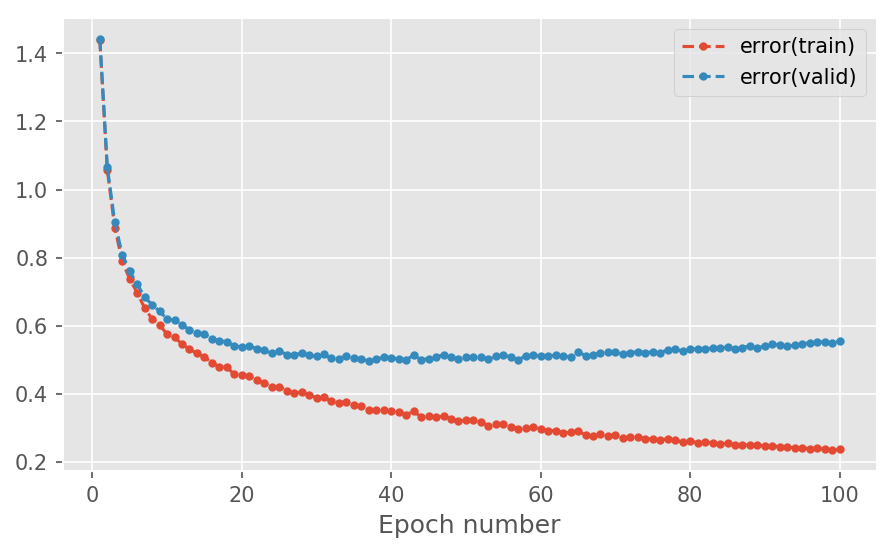

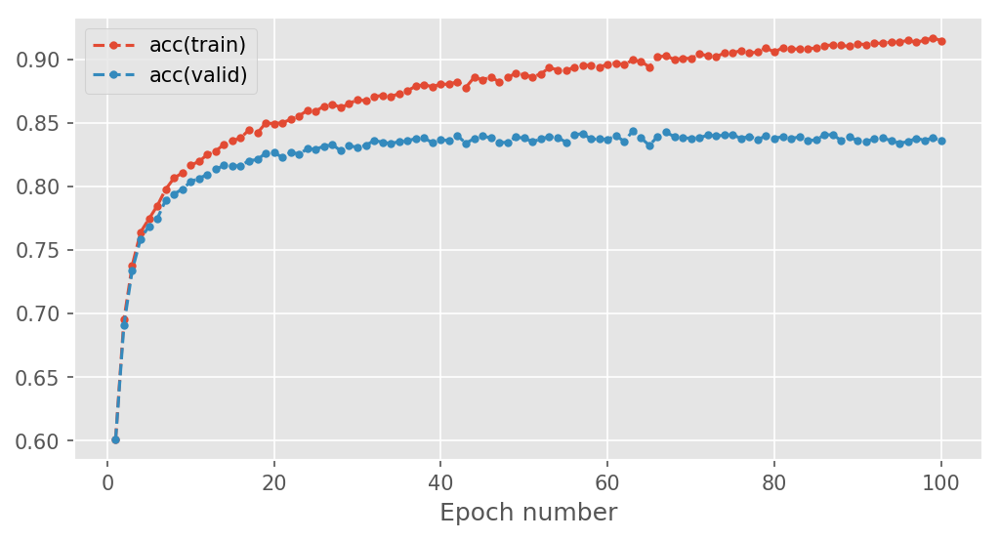

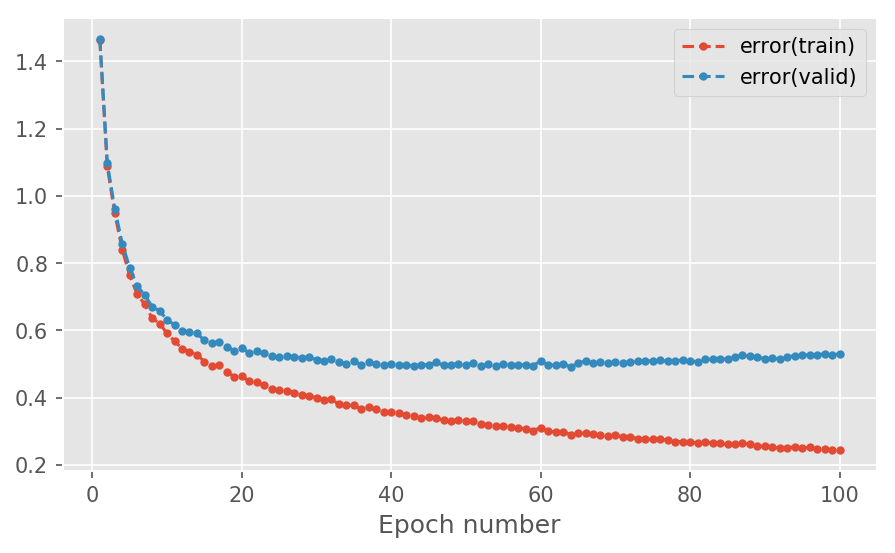

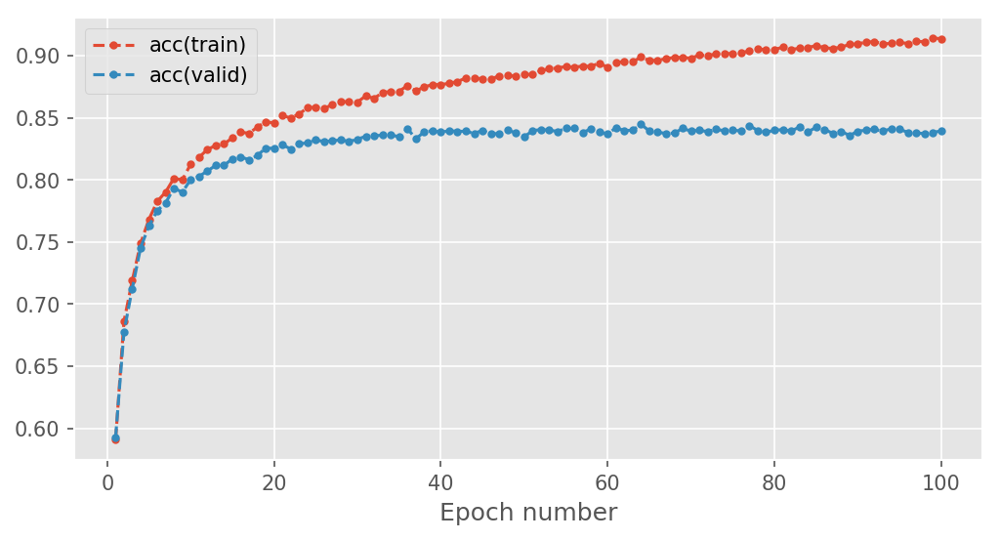

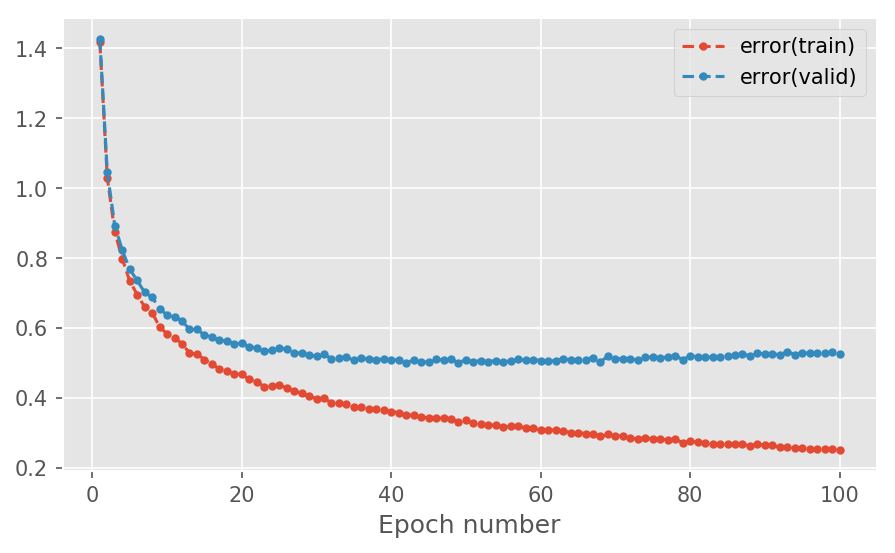

...

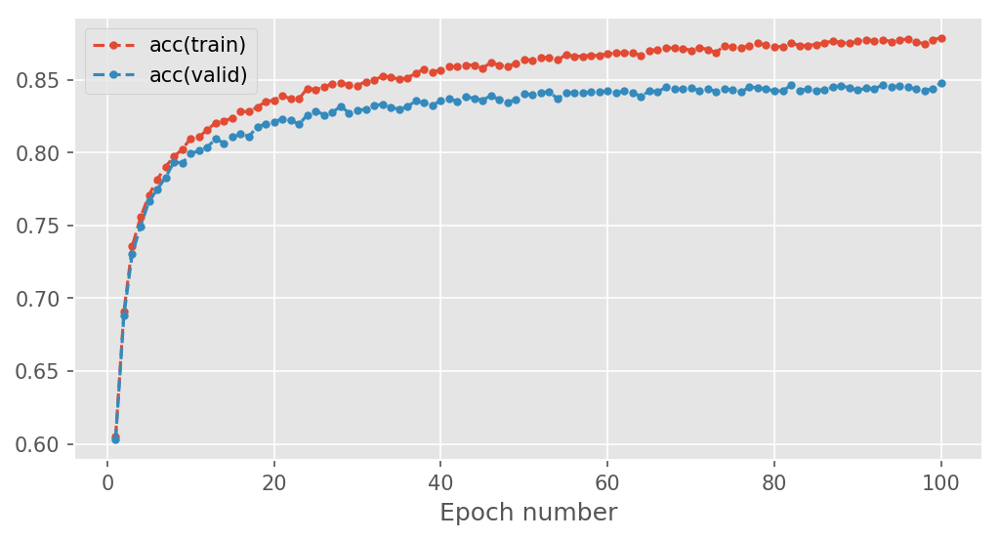

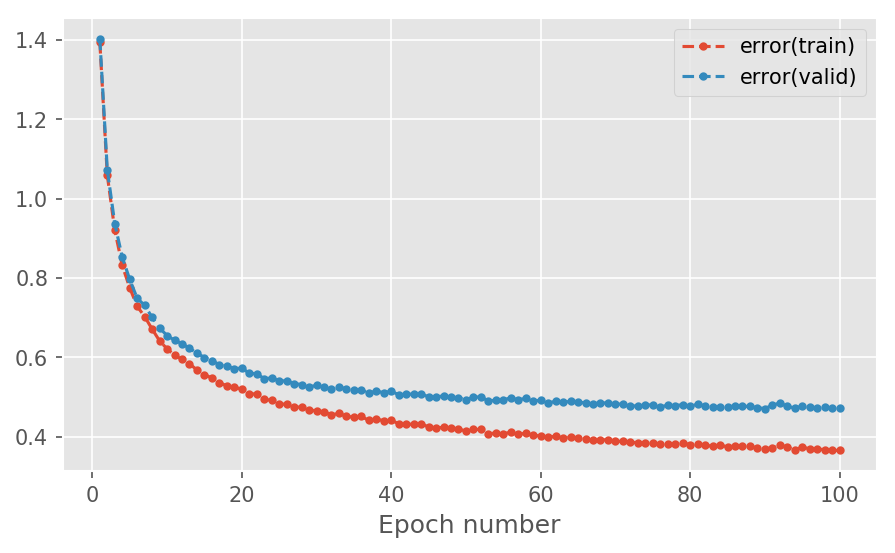

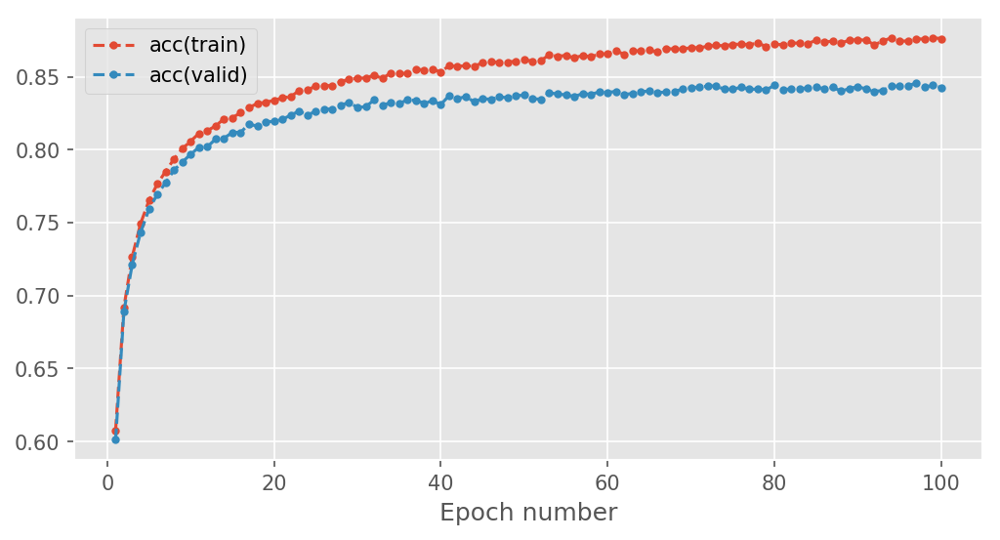

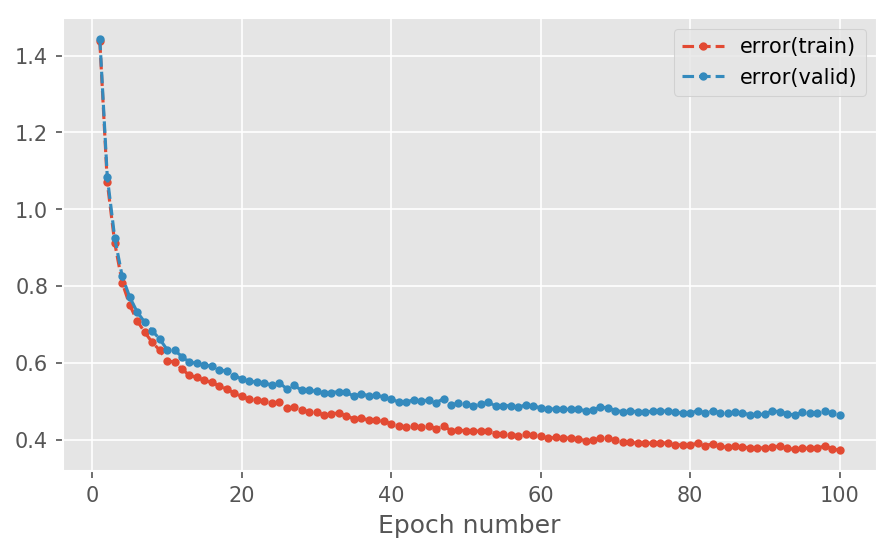

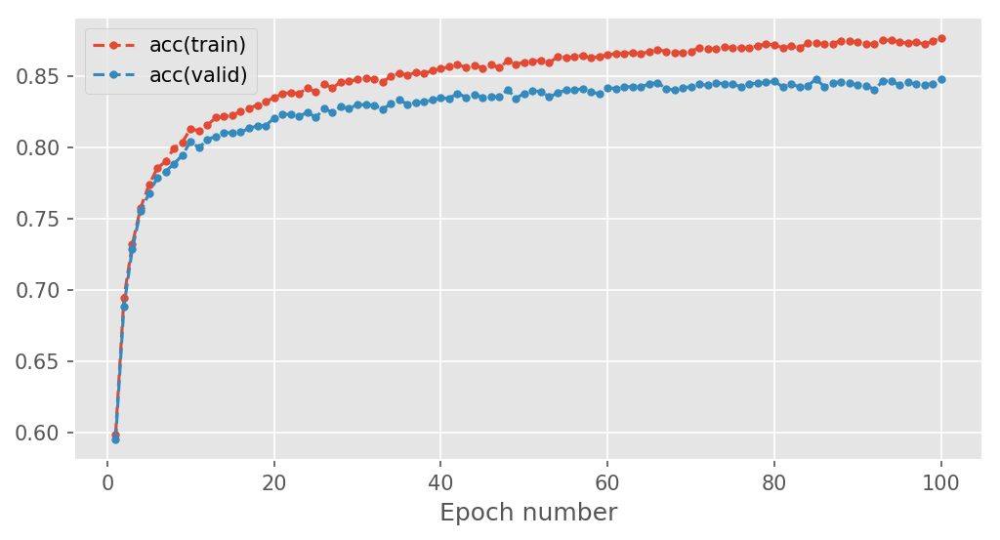

In [248]:
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 500

import importlib
import mlp
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule,AdamLearningRuleWithWeightDecay
importlib.reload(mlp.optimisers)
importlib.reload(mlp.learning_rules)
importlib.reload(mlp.schedulers)
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule,AdamLearningRuleWithWeightDecay
from mlp.schedulers import CosineAnnealingWithWarmRestarts

weight_decays=np.linspace(0.01,0.3,30)

answers2=[]

for weight_decay in weight_decays:
    print(weight_decay)
    logger = logging.getLogger()
    logger.setLevel(logging.INFO)
    logger.handlers = [logging.StreamHandler()]

    # Create data provider objects for the MNIST data set
    train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
    valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
    test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)

    #setup hyperparameter
    learning_rate = 0.013
    num_epochs = 100
    stats_interval = 1

    min_learning_rate=2e-4
    max_learning_rate=4e-4
    total_iters_per_period=25
    max_learning_rate_discount_factor=0.9
    period_iteration_expansion_factor=3

    input_dim, output_dim, hidden_dim = 784, 47, 100

    weights_init = GlorotUniformInit(rng=rng)
    biases_init = ConstantInit(0.)
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
        ReluLayer(),
        AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
    ])

    error = CrossEntropySoftmaxError()
    # Use a basic gradient descent learning rule
    learning_rule = AdamLearningRuleWithWeightDecay(learning_rate=3e-4,beta_1=0.875,beta_2=0.9992,weight_decay=weight_decay)

    scheduler=CosineAnnealingWithWarmRestarts(min_learning_rate=min_learning_rate,max_learning_rate=max_learning_rate,
                                             total_iters_per_period=total_iters_per_period,
                                              max_learning_rate_discount_factor=max_learning_rate_discount_factor,
                                             period_iteration_expansion_factor=period_iteration_expansion_factor)

    #Remember to use notebook=False when you write a script to be run in a terminal
    _CosineADAM_WD1 = train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, scheduler,stats_interval, notebook=True)

    answers2.append(_CosineADAM_WD1)

In [274]:
values2=[]
values22=[]
for element in answers2:
    values2.append(min(element[0][:,2])) 
    values22.append(element[-3])

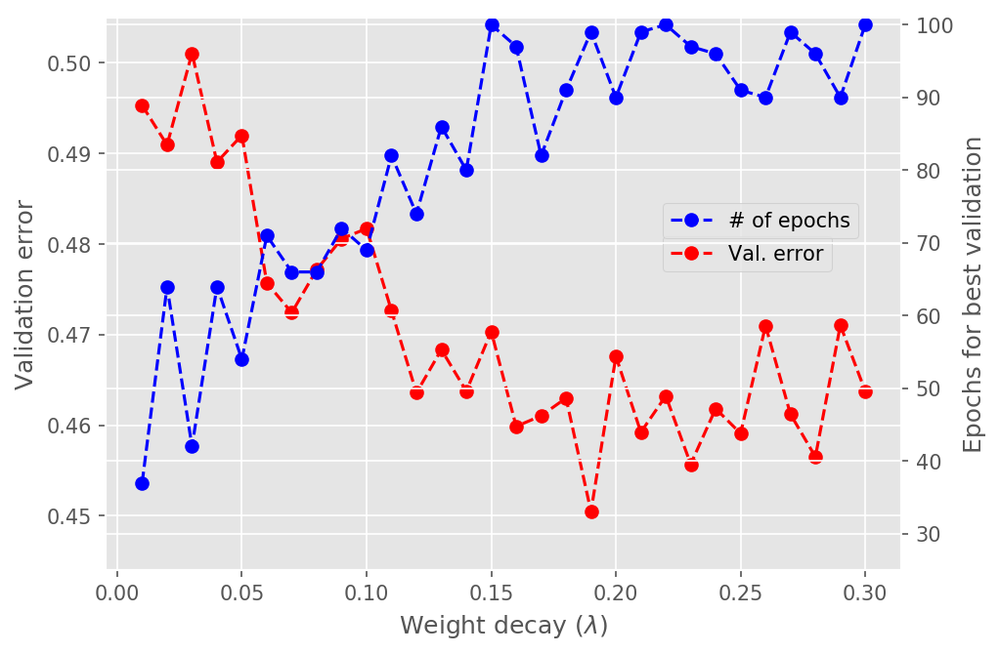

In [313]:
weight_decays=np.linspace(0.01,0.3,30)
fig=plt.figure(figsize=(7,5),dpi=150)
ax1=fig.add_subplot(111)
ax2=ax1.twinx()
ax1.plot(weight_decays,values2,"--o",c='r',label="Val. error")
ax2.plot(weight_decays,values22,"--o",c='b',label="# of epochs")
ax2.set_ylim(25,101)
ax1.set_ylim(0.444,0.505)
ax2.set_ylabel("Epochs for best validation")
ax1.set_xlabel(r'Weight decay ($\lambda$)')
ax1.set_ylabel("Validation error")

ax1.legend(loc=(0.7,0.54))
ax2.legend(loc=(0.7,0.6))
fig.savefig("AdamWD1.png")

In [327]:
importlib.reload(mlp.errors)
from mlp.errors import CrossEntropySoftmaxError
outputs=(answers2[18][-2].fprop(test_data.inputs)[-1])
targets=MNISTDataProvider.to_one_of_k(test_data,test_data.targets)
CrossEntropySoftmaxError.__call__(error,outputs,targets)

(0.4976197829544998, 0.00921155736671545, 0.8366455696202532)

In [247]:
np.linspace(0.01,0.3,30)

array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 ])

0.1
KeysView(<numpy.lib.npyio.NpzFile object at 0x1193dcc88>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x165d78f28>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1193dcc88>)


0.04


Epoch 1: 2.6s to complete
    error(train)=1.44e+00, acc(train)=6.01e-01, error(valid)=1.44e+00, acc(valid)=6.01e-01


1


0.08


Epoch 2: 2.6s to complete
    error(train)=1.06e+00, acc(train)=6.95e-01, error(valid)=1.07e+00, acc(valid)=6.93e-01


2


0.12


Epoch 3: 2.6s to complete
    error(train)=8.99e-01, acc(train)=7.36e-01, error(valid)=9.15e-01, acc(valid)=7.32e-01


3


0.16


Epoch 4: 2.6s to complete
    error(train)=8.03e-01, acc(train)=7.61e-01, error(valid)=8.23e-01, acc(valid)=7.53e-01


4


0.2


Epoch 5: 2.6s to complete
    error(train)=7.52e-01, acc(train)=7.71e-01, error(valid)=7.72e-01, acc(valid)=7.66e-01


5


0.24


Epoch 6: 2.6s to complete
    error(train)=7.16e-01, acc(train)=7.79e-01, error(valid)=7.38e-01, acc(valid)=7.72e-01


6


0.28


Epoch 7: 2.6s to complete
    error(train)=6.65e-01, acc(train)=7.95e-01, error(valid)=6.93e-01, acc(valid)=7.88e-01


7


0.32


Epoch 8: 2.7s to complete
    error(train)=6.37e-01, acc(train)=8.02e-01, error(valid)=6.73e-01, acc(valid)=7.93e-01


8


0.36


Epoch 9: 2.8s to complete
    error(train)=6.18e-01, acc(train)=8.07e-01, error(valid)=6.53e-01, acc(valid)=7.96e-01


9


0.4


Epoch 10: 2.7s to complete
    error(train)=5.96e-01, acc(train)=8.11e-01, error(valid)=6.35e-01, acc(valid)=8.00e-01


10


0.44


Epoch 11: 2.7s to complete
    error(train)=5.87e-01, acc(train)=8.15e-01, error(valid)=6.31e-01, acc(valid)=8.03e-01


11


0.48


Epoch 12: 2.6s to complete
    error(train)=5.68e-01, acc(train)=8.20e-01, error(valid)=6.15e-01, acc(valid)=8.08e-01


12


0.52


Epoch 13: 2.8s to complete
    error(train)=5.54e-01, acc(train)=8.22e-01, error(valid)=6.01e-01, acc(valid)=8.11e-01


13


0.56


Epoch 14: 2.6s to complete
    error(train)=5.42e-01, acc(train)=8.28e-01, error(valid)=5.92e-01, acc(valid)=8.12e-01


14


0.6


Epoch 15: 3.3s to complete
    error(train)=5.30e-01, acc(train)=8.31e-01, error(valid)=5.85e-01, acc(valid)=8.15e-01


15


0.64


Epoch 16: 2.8s to complete
    error(train)=5.19e-01, acc(train)=8.33e-01, error(valid)=5.74e-01, acc(valid)=8.17e-01


16


0.68


Epoch 17: 3.2s to complete
    error(train)=5.13e-01, acc(train)=8.36e-01, error(valid)=5.71e-01, acc(valid)=8.18e-01


17


0.72


Epoch 18: 2.9s to complete
    error(train)=5.08e-01, acc(train)=8.36e-01, error(valid)=5.65e-01, acc(valid)=8.20e-01


18


0.76


Epoch 19: 3.7s to complete
    error(train)=4.98e-01, acc(train)=8.39e-01, error(valid)=5.61e-01, acc(valid)=8.18e-01


19


0.8


Epoch 20: 2.6s to complete
    error(train)=4.90e-01, acc(train)=8.42e-01, error(valid)=5.51e-01, acc(valid)=8.24e-01


20


0.84


Epoch 21: 2.9s to complete
    error(train)=4.90e-01, acc(train)=8.41e-01, error(valid)=5.57e-01, acc(valid)=8.23e-01


0.88


Epoch 22: 3.4s to complete
    error(train)=4.83e-01, acc(train)=8.42e-01, error(valid)=5.51e-01, acc(valid)=8.22e-01


0.92


Epoch 23: 2.7s to complete
    error(train)=4.77e-01, acc(train)=8.44e-01, error(valid)=5.48e-01, acc(valid)=8.23e-01


23


0.96


Epoch 24: 3.2s to complete
    error(train)=4.69e-01, acc(train)=8.47e-01, error(valid)=5.40e-01, acc(valid)=8.26e-01


24


0.0


Epoch 25: 2.8s to complete
    error(train)=4.71e-01, acc(train)=8.46e-01, error(valid)=5.46e-01, acc(valid)=8.26e-01


0.013333333333333334


Epoch 26: 2.6s to complete
    error(train)=4.65e-01, acc(train)=8.48e-01, error(valid)=5.40e-01, acc(valid)=8.26e-01


26


0.02666666666666667


Epoch 27: 3.2s to complete
    error(train)=4.66e-01, acc(train)=8.45e-01, error(valid)=5.43e-01, acc(valid)=8.24e-01


0.04


Epoch 28: 2.8s to complete
    error(train)=4.59e-01, acc(train)=8.47e-01, error(valid)=5.40e-01, acc(valid)=8.22e-01


0.05333333333333334


Epoch 29: 2.7s to complete
    error(train)=4.55e-01, acc(train)=8.50e-01, error(valid)=5.36e-01, acc(valid)=8.25e-01


29


0.06666666666666667


Epoch 30: 2.7s to complete
    error(train)=4.46e-01, acc(train)=8.51e-01, error(valid)=5.32e-01, acc(valid)=8.26e-01


30


0.08


Epoch 31: 2.8s to complete
    error(train)=4.44e-01, acc(train)=8.52e-01, error(valid)=5.33e-01, acc(valid)=8.26e-01


0.09333333333333334


Epoch 32: 2.8s to complete
    error(train)=4.31e-01, acc(train)=8.56e-01, error(valid)=5.18e-01, acc(valid)=8.32e-01


32


0.10666666666666667


Epoch 33: 2.7s to complete
    error(train)=4.26e-01, acc(train)=8.58e-01, error(valid)=5.18e-01, acc(valid)=8.31e-01


33


0.12


Epoch 34: 2.7s to complete
    error(train)=4.29e-01, acc(train)=8.56e-01, error(valid)=5.21e-01, acc(valid)=8.32e-01


0.13333333333333333


Epoch 35: 2.7s to complete
    error(train)=4.23e-01, acc(train)=8.57e-01, error(valid)=5.17e-01, acc(valid)=8.30e-01


35


0.14666666666666667


Epoch 36: 2.8s to complete
    error(train)=4.21e-01, acc(train)=8.59e-01, error(valid)=5.16e-01, acc(valid)=8.31e-01


36


0.16


Epoch 37: 2.8s to complete
    error(train)=4.06e-01, acc(train)=8.64e-01, error(valid)=5.04e-01, acc(valid)=8.37e-01


37


0.17333333333333334


Epoch 38: 2.6s to complete
    error(train)=4.04e-01, acc(train)=8.65e-01, error(valid)=5.05e-01, acc(valid)=8.35e-01


0.18666666666666668


Epoch 39: 2.7s to complete
    error(train)=4.01e-01, acc(train)=8.66e-01, error(valid)=5.06e-01, acc(valid)=8.35e-01


0.2


Epoch 40: 2.6s to complete
    error(train)=4.01e-01, acc(train)=8.66e-01, error(valid)=5.06e-01, acc(valid)=8.34e-01


0.21333333333333335


Epoch 41: 3.4s to complete
    error(train)=3.99e-01, acc(train)=8.65e-01, error(valid)=5.06e-01, acc(valid)=8.33e-01


0.22666666666666666


Epoch 42: 2.7s to complete
    error(train)=3.93e-01, acc(train)=8.68e-01, error(valid)=5.02e-01, acc(valid)=8.36e-01


42


0.24


Epoch 43: 3.1s to complete
    error(train)=3.95e-01, acc(train)=8.65e-01, error(valid)=5.06e-01, acc(valid)=8.33e-01


0.25333333333333335


Epoch 44: 2.5s to complete
    error(train)=3.88e-01, acc(train)=8.68e-01, error(valid)=5.02e-01, acc(valid)=8.36e-01


0.26666666666666666


Epoch 45: 2.5s to complete
    error(train)=3.82e-01, acc(train)=8.72e-01, error(valid)=4.96e-01, acc(valid)=8.38e-01


45


0.28


Epoch 46: 2.6s to complete
    error(train)=3.81e-01, acc(train)=8.71e-01, error(valid)=5.00e-01, acc(valid)=8.38e-01


0.29333333333333333


Epoch 47: 2.5s to complete
    error(train)=3.87e-01, acc(train)=8.68e-01, error(valid)=5.10e-01, acc(valid)=8.33e-01


0.30666666666666664


Epoch 48: 2.5s to complete
    error(train)=3.78e-01, acc(train)=8.72e-01, error(valid)=4.99e-01, acc(valid)=8.37e-01


0.32


Epoch 49: 2.5s to complete
    error(train)=3.70e-01, acc(train)=8.75e-01, error(valid)=4.94e-01, acc(valid)=8.37e-01


49


0.3333333333333333


Epoch 50: 2.5s to complete
    error(train)=3.71e-01, acc(train)=8.74e-01, error(valid)=4.96e-01, acc(valid)=8.38e-01


0.3466666666666667


Epoch 51: 2.9s to complete
    error(train)=3.72e-01, acc(train)=8.73e-01, error(valid)=4.96e-01, acc(valid)=8.35e-01


0.36


Epoch 52: 3.7s to complete
    error(train)=3.71e-01, acc(train)=8.72e-01, error(valid)=5.00e-01, acc(valid)=8.37e-01


0.37333333333333335


Epoch 53: 3.9s to complete
    error(train)=3.62e-01, acc(train)=8.76e-01, error(valid)=4.95e-01, acc(valid)=8.37e-01


0.38666666666666666


Epoch 54: 3.3s to complete
    error(train)=3.61e-01, acc(train)=8.76e-01, error(valid)=4.94e-01, acc(valid)=8.38e-01


0.4


Epoch 55: 2.5s to complete
    error(train)=3.62e-01, acc(train)=8.76e-01, error(valid)=4.97e-01, acc(valid)=8.37e-01


0.41333333333333333


Epoch 56: 2.6s to complete
    error(train)=3.58e-01, acc(train)=8.77e-01, error(valid)=4.93e-01, acc(valid)=8.38e-01


56


0.4266666666666667


Epoch 57: 2.2s to complete
    error(train)=3.50e-01, acc(train)=8.80e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


57


0.44


Epoch 58: 2.2s to complete
    error(train)=3.54e-01, acc(train)=8.79e-01, error(valid)=4.93e-01, acc(valid)=8.39e-01


0.4533333333333333


Epoch 59: 2.2s to complete
    error(train)=3.51e-01, acc(train)=8.79e-01, error(valid)=4.90e-01, acc(valid)=8.39e-01


0.4666666666666667


Epoch 60: 2.3s to complete
    error(train)=3.51e-01, acc(train)=8.80e-01, error(valid)=4.89e-01, acc(valid)=8.39e-01


0.48


Epoch 61: 2.2s to complete
    error(train)=3.45e-01, acc(train)=8.81e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


0.49333333333333335


Epoch 62: 2.2s to complete
    error(train)=3.42e-01, acc(train)=8.83e-01, error(valid)=4.86e-01, acc(valid)=8.39e-01


0.5066666666666667


Epoch 63: 2.2s to complete
    error(train)=3.40e-01, acc(train)=8.83e-01, error(valid)=4.84e-01, acc(valid)=8.43e-01


63


0.52


Epoch 64: 2.2s to complete
    error(train)=3.45e-01, acc(train)=8.80e-01, error(valid)=4.90e-01, acc(valid)=8.38e-01


0.5333333333333333


Epoch 65: 2.3s to complete
    error(train)=3.44e-01, acc(train)=8.78e-01, error(valid)=4.92e-01, acc(valid)=8.35e-01


0.5466666666666666


Epoch 66: 2.4s to complete
    error(train)=3.36e-01, acc(train)=8.84e-01, error(valid)=4.88e-01, acc(valid)=8.39e-01


0.56


Epoch 67: 2.2s to complete
    error(train)=3.31e-01, acc(train)=8.87e-01, error(valid)=4.84e-01, acc(valid)=8.43e-01


0.5733333333333334


Epoch 68: 2.5s to complete
    error(train)=3.30e-01, acc(train)=8.86e-01, error(valid)=4.81e-01, acc(valid)=8.42e-01


68


0.5866666666666667


Epoch 69: 2.2s to complete
    error(train)=3.31e-01, acc(train)=8.86e-01, error(valid)=4.86e-01, acc(valid)=8.42e-01


0.6


Epoch 70: 2.2s to complete
    error(train)=3.32e-01, acc(train)=8.86e-01, error(valid)=4.87e-01, acc(valid)=8.41e-01


0.6133333333333333


Epoch 71: 2.2s to complete
    error(train)=3.23e-01, acc(train)=8.89e-01, error(valid)=4.80e-01, acc(valid)=8.44e-01


71


0.6266666666666667


Epoch 72: 2.2s to complete
    error(train)=3.29e-01, acc(train)=8.87e-01, error(valid)=4.86e-01, acc(valid)=8.42e-01


0.64


Epoch 73: 2.4s to complete
    error(train)=3.25e-01, acc(train)=8.88e-01, error(valid)=4.81e-01, acc(valid)=8.44e-01


0.6533333333333333


Epoch 74: 2.3s to complete
    error(train)=3.25e-01, acc(train)=8.88e-01, error(valid)=4.86e-01, acc(valid)=8.41e-01


0.6666666666666666


Epoch 75: 2.2s to complete
    error(train)=3.23e-01, acc(train)=8.88e-01, error(valid)=4.82e-01, acc(valid)=8.43e-01


0.68


Epoch 76: 2.4s to complete
    error(train)=3.22e-01, acc(train)=8.89e-01, error(valid)=4.83e-01, acc(valid)=8.41e-01


0.6933333333333334


Epoch 77: 2.3s to complete
    error(train)=3.29e-01, acc(train)=8.85e-01, error(valid)=4.94e-01, acc(valid)=8.42e-01


0.7066666666666667


Epoch 78: 2.3s to complete
    error(train)=3.18e-01, acc(train)=8.90e-01, error(valid)=4.84e-01, acc(valid)=8.42e-01


0.72


Epoch 79: 2.2s to complete
    error(train)=3.16e-01, acc(train)=8.91e-01, error(valid)=4.83e-01, acc(valid)=8.43e-01


0.7333333333333333


Epoch 80: 2.3s to complete
    error(train)=3.19e-01, acc(train)=8.89e-01, error(valid)=4.87e-01, acc(valid)=8.39e-01


0.7466666666666667


Epoch 81: 2.3s to complete
    error(train)=3.13e-01, acc(train)=8.92e-01, error(valid)=4.82e-01, acc(valid)=8.45e-01


0.76


Epoch 82: 2.2s to complete
    error(train)=3.13e-01, acc(train)=8.92e-01, error(valid)=4.81e-01, acc(valid)=8.46e-01


0.7733333333333333


Epoch 83: 2.2s to complete
    error(train)=3.14e-01, acc(train)=8.90e-01, error(valid)=4.88e-01, acc(valid)=8.41e-01


0.7866666666666666


Epoch 84: 2.2s to complete
    error(train)=3.11e-01, acc(train)=8.92e-01, error(valid)=4.84e-01, acc(valid)=8.43e-01


0.8


Epoch 85: 2.7s to complete
    error(train)=3.08e-01, acc(train)=8.94e-01, error(valid)=4.83e-01, acc(valid)=8.43e-01


0.8133333333333334


Epoch 86: 3.3s to complete
    error(train)=3.10e-01, acc(train)=8.93e-01, error(valid)=4.80e-01, acc(valid)=8.44e-01


0.8266666666666667


Epoch 87: 2.5s to complete
    error(train)=3.08e-01, acc(train)=8.93e-01, error(valid)=4.82e-01, acc(valid)=8.43e-01


0.84


Epoch 88: 2.9s to complete
    error(train)=3.05e-01, acc(train)=8.95e-01, error(valid)=4.85e-01, acc(valid)=8.45e-01


0.8533333333333334


Epoch 89: 2.6s to complete
    error(train)=3.08e-01, acc(train)=8.93e-01, error(valid)=4.80e-01, acc(valid)=8.45e-01


0.8666666666666667


Epoch 90: 2.3s to complete
    error(train)=3.06e-01, acc(train)=8.93e-01, error(valid)=4.86e-01, acc(valid)=8.44e-01


0.88


Epoch 91: 2.3s to complete
    error(train)=3.08e-01, acc(train)=8.93e-01, error(valid)=4.88e-01, acc(valid)=8.41e-01


0.8933333333333333


Epoch 92: 2.7s to complete
    error(train)=3.01e-01, acc(train)=8.95e-01, error(valid)=4.83e-01, acc(valid)=8.42e-01


0.9066666666666666


Epoch 93: 3.2s to complete
    error(train)=3.02e-01, acc(train)=8.95e-01, error(valid)=4.80e-01, acc(valid)=8.45e-01


0.92


Epoch 94: 3.8s to complete
    error(train)=2.98e-01, acc(train)=8.96e-01, error(valid)=4.82e-01, acc(valid)=8.43e-01


0.9333333333333333


Epoch 95: 3.3s to complete
    error(train)=3.02e-01, acc(train)=8.95e-01, error(valid)=4.88e-01, acc(valid)=8.39e-01


0.9466666666666667


Epoch 96: 3.2s to complete
    error(train)=2.99e-01, acc(train)=8.95e-01, error(valid)=4.88e-01, acc(valid)=8.44e-01


0.96


Epoch 97: 2.5s to complete
    error(train)=2.98e-01, acc(train)=8.96e-01, error(valid)=4.85e-01, acc(valid)=8.44e-01


0.9733333333333334


Epoch 98: 2.6s to complete
    error(train)=2.96e-01, acc(train)=8.97e-01, error(valid)=4.87e-01, acc(valid)=8.43e-01


0.9866666666666667


Epoch 99: 2.2s to complete
    error(train)=2.97e-01, acc(train)=8.97e-01, error(valid)=4.85e-01, acc(valid)=8.45e-01


0.0


Epoch 100: 2.3s to complete
    error(train)=2.98e-01, acc(train)=8.96e-01, error(valid)=4.88e-01, acc(valid)=8.41e-01



0.11071428571428572
KeysView(<numpy.lib.npyio.NpzFile object at 0x141a63f60>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x141a63ba8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x141a63cf8>)


0.04


Epoch 1: 2.1s to complete
    error(train)=1.47e+00, acc(train)=5.90e-01, error(valid)=1.48e+00, acc(valid)=5.91e-01


1


0.08


Epoch 2: 2.2s to complete
    error(train)=1.10e+00, acc(train)=6.83e-01, error(valid)=1.11e+00, acc(valid)=6.74e-01


2


0.12


Epoch 3: 2.1s to complete
    error(train)=9.62e-01, acc(train)=7.16e-01, error(valid)=9.76e-01, acc(valid)=7.10e-01


3


0.16


Epoch 4: 2.1s to complete
    error(train)=8.58e-01, acc(train)=7.45e-01, error(valid)=8.76e-01, acc(valid)=7.42e-01


4


0.2


Epoch 5: 2.2s to complete
    error(train)=7.79e-01, acc(train)=7.64e-01, error(valid)=8.01e-01, acc(valid)=7.58e-01


5


0.24


Epoch 6: 2.3s to complete
    error(train)=7.24e-01, acc(train)=7.78e-01, error(valid)=7.47e-01, acc(valid)=7.75e-01


6


0.28


Epoch 7: 2.3s to complete
    error(train)=6.93e-01, acc(train)=7.86e-01, error(valid)=7.18e-01, acc(valid)=7.81e-01


7


0.32


Epoch 8: 2.2s to complete
    error(train)=6.54e-01, acc(train)=7.97e-01, error(valid)=6.84e-01, acc(valid)=7.89e-01


8


0.36


Epoch 9: 2.1s to complete
    error(train)=6.38e-01, acc(train)=7.98e-01, error(valid)=6.70e-01, acc(valid)=7.91e-01


9


0.4


Epoch 10: 2.5s to complete
    error(train)=6.09e-01, acc(train)=8.09e-01, error(valid)=6.44e-01, acc(valid)=7.98e-01


10


0.44


Epoch 11: 2.2s to complete
    error(train)=5.88e-01, acc(train)=8.14e-01, error(valid)=6.27e-01, acc(valid)=8.03e-01


11


0.48


Epoch 12: 2.1s to complete
    error(train)=5.68e-01, acc(train)=8.19e-01, error(valid)=6.11e-01, acc(valid)=8.05e-01


12


0.52


Epoch 13: 2.1s to complete
    error(train)=5.58e-01, acc(train)=8.23e-01, error(valid)=6.04e-01, acc(valid)=8.08e-01


13


0.56


Epoch 14: 2.1s to complete
    error(train)=5.53e-01, acc(train)=8.23e-01, error(valid)=6.02e-01, acc(valid)=8.10e-01


14


0.6


Epoch 15: 2.2s to complete
    error(train)=5.33e-01, acc(train)=8.28e-01, error(valid)=5.83e-01, acc(valid)=8.13e-01


15


0.64


Epoch 16: 3.5s to complete
    error(train)=5.25e-01, acc(train)=8.31e-01, error(valid)=5.78e-01, acc(valid)=8.15e-01


16


0.68


Epoch 17: 2.5s to complete
    error(train)=5.27e-01, acc(train)=8.29e-01, error(valid)=5.82e-01, acc(valid)=8.13e-01


0.72


Epoch 18: 3.1s to complete
    error(train)=5.10e-01, acc(train)=8.35e-01, error(valid)=5.66e-01, acc(valid)=8.17e-01


18


0.76


Epoch 19: 2.5s to complete
    error(train)=5.01e-01, acc(train)=8.38e-01, error(valid)=5.58e-01, acc(valid)=8.20e-01


19


0.8


Epoch 20: 2.2s to complete
    error(train)=4.96e-01, acc(train)=8.38e-01, error(valid)=5.59e-01, acc(valid)=8.20e-01


0.84


Epoch 21: 2.2s to complete
    error(train)=4.86e-01, acc(train)=8.42e-01, error(valid)=5.45e-01, acc(valid)=8.25e-01


21


0.88


Epoch 22: 2.1s to complete
    error(train)=4.83e-01, acc(train)=8.42e-01, error(valid)=5.48e-01, acc(valid)=8.23e-01


0.92


Epoch 23: 2.2s to complete
    error(train)=4.79e-01, acc(train)=8.44e-01, error(valid)=5.47e-01, acc(valid)=8.22e-01


0.96


Epoch 24: 2.3s to complete
    error(train)=4.72e-01, acc(train)=8.46e-01, error(valid)=5.42e-01, acc(valid)=8.27e-01


24


0.0


Epoch 25: 2.3s to complete
    error(train)=4.68e-01, acc(train)=8.47e-01, error(valid)=5.36e-01, acc(valid)=8.26e-01


25


0.013333333333333334


Epoch 26: 2.1s to complete
    error(train)=4.79e-01, acc(train)=8.41e-01, error(valid)=5.50e-01, acc(valid)=8.21e-01


0.02666666666666667


Epoch 27: 2.2s to complete
    error(train)=4.65e-01, acc(train)=8.46e-01, error(valid)=5.38e-01, acc(valid)=8.25e-01


0.04


Epoch 28: 2.2s to complete
    error(train)=4.64e-01, acc(train)=8.47e-01, error(valid)=5.39e-01, acc(valid)=8.25e-01


0.05333333333333334


Epoch 29: 2.3s to complete
    error(train)=4.57e-01, acc(train)=8.49e-01, error(valid)=5.35e-01, acc(valid)=8.25e-01


29


0.06666666666666667


Epoch 30: 2.2s to complete
    error(train)=4.49e-01, acc(train)=8.50e-01, error(valid)=5.26e-01, acc(valid)=8.28e-01


30


0.08


Epoch 31: 2.2s to complete
    error(train)=4.41e-01, acc(train)=8.54e-01, error(valid)=5.22e-01, acc(valid)=8.28e-01


31


0.09333333333333334


Epoch 32: 2.2s to complete
    error(train)=4.46e-01, acc(train)=8.51e-01, error(valid)=5.28e-01, acc(valid)=8.28e-01


0.10666666666666667


Epoch 33: 2.2s to complete
    error(train)=4.34e-01, acc(train)=8.55e-01, error(valid)=5.20e-01, acc(valid)=8.31e-01


33


0.12


Epoch 34: 2.1s to complete
    error(train)=4.28e-01, acc(train)=8.57e-01, error(valid)=5.14e-01, acc(valid)=8.32e-01


34


0.13333333333333333


Epoch 35: 2.2s to complete
    error(train)=4.21e-01, acc(train)=8.60e-01, error(valid)=5.12e-01, acc(valid)=8.33e-01


35


0.14666666666666667


Epoch 36: 2.2s to complete
    error(train)=4.15e-01, acc(train)=8.61e-01, error(valid)=5.06e-01, acc(valid)=8.33e-01


36


0.16


Epoch 37: 2.4s to complete
    error(train)=4.19e-01, acc(train)=8.59e-01, error(valid)=5.11e-01, acc(valid)=8.31e-01


0.17333333333333334


Epoch 38: 2.2s to complete
    error(train)=4.12e-01, acc(train)=8.62e-01, error(valid)=5.03e-01, acc(valid)=8.33e-01


38


0.18666666666666668


Epoch 39: 2.1s to complete
    error(train)=4.10e-01, acc(train)=8.62e-01, error(valid)=5.05e-01, acc(valid)=8.35e-01


0.2


Epoch 40: 2.2s to complete
    error(train)=4.05e-01, acc(train)=8.63e-01, error(valid)=5.04e-01, acc(valid)=8.35e-01


0.21333333333333335


Epoch 41: 2.3s to complete
    error(train)=4.03e-01, acc(train)=8.64e-01, error(valid)=5.02e-01, acc(valid)=8.37e-01


41


0.22666666666666666


Epoch 42: 2.3s to complete
    error(train)=4.01e-01, acc(train)=8.64e-01, error(valid)=5.01e-01, acc(valid)=8.35e-01


42


0.24


Epoch 43: 2.2s to complete
    error(train)=3.93e-01, acc(train)=8.67e-01, error(valid)=4.96e-01, acc(valid)=8.38e-01


43


0.25333333333333335


Epoch 44: 2.3s to complete
    error(train)=3.92e-01, acc(train)=8.67e-01, error(valid)=4.99e-01, acc(valid)=8.35e-01


0.26666666666666666


Epoch 45: 2.2s to complete
    error(train)=3.87e-01, acc(train)=8.68e-01, error(valid)=4.96e-01, acc(valid)=8.38e-01


45


0.28


Epoch 46: 2.2s to complete
    error(train)=3.86e-01, acc(train)=8.69e-01, error(valid)=4.99e-01, acc(valid)=8.37e-01


0.29333333333333333


Epoch 47: 2.2s to complete
    error(train)=3.82e-01, acc(train)=8.69e-01, error(valid)=4.95e-01, acc(valid)=8.39e-01


47


0.30666666666666664


Epoch 48: 2.2s to complete
    error(train)=3.78e-01, acc(train)=8.71e-01, error(valid)=4.91e-01, acc(valid)=8.37e-01


48


0.32


Epoch 49: 2.2s to complete
    error(train)=3.79e-01, acc(train)=8.71e-01, error(valid)=4.91e-01, acc(valid)=8.38e-01


49


0.3333333333333333


Epoch 50: 2.2s to complete
    error(train)=3.74e-01, acc(train)=8.72e-01, error(valid)=4.89e-01, acc(valid)=8.37e-01


50


0.3466666666666667


Epoch 51: 2.2s to complete
    error(train)=3.77e-01, acc(train)=8.72e-01, error(valid)=4.95e-01, acc(valid)=8.39e-01


0.36


Epoch 52: 2.2s to complete
    error(train)=3.69e-01, acc(train)=8.73e-01, error(valid)=4.85e-01, acc(valid)=8.40e-01


52


0.37333333333333335


Epoch 53: 2.2s to complete
    error(train)=3.67e-01, acc(train)=8.75e-01, error(valid)=4.90e-01, acc(valid)=8.40e-01


0.38666666666666666


Epoch 54: 2.1s to complete
    error(train)=3.66e-01, acc(train)=8.76e-01, error(valid)=4.86e-01, acc(valid)=8.37e-01


0.4


Epoch 55: 2.2s to complete
    error(train)=3.61e-01, acc(train)=8.78e-01, error(valid)=4.88e-01, acc(valid)=8.41e-01


0.41333333333333333


Epoch 56: 2.4s to complete
    error(train)=3.58e-01, acc(train)=8.77e-01, error(valid)=4.82e-01, acc(valid)=8.41e-01


56


0.4266666666666667


Epoch 57: 2.2s to complete
    error(train)=3.59e-01, acc(train)=8.77e-01, error(valid)=4.85e-01, acc(valid)=8.38e-01


0.44


Epoch 58: 2.2s to complete
    error(train)=3.57e-01, acc(train)=8.78e-01, error(valid)=4.86e-01, acc(valid)=8.40e-01


0.4533333333333333


Epoch 59: 2.2s to complete
    error(train)=3.51e-01, acc(train)=8.80e-01, error(valid)=4.78e-01, acc(valid)=8.41e-01


59


0.4666666666666667


Epoch 60: 2.7s to complete
    error(train)=3.60e-01, acc(train)=8.76e-01, error(valid)=4.91e-01, acc(valid)=8.38e-01


0.48


Epoch 61: 3.1s to complete
    error(train)=3.48e-01, acc(train)=8.80e-01, error(valid)=4.80e-01, acc(valid)=8.43e-01


0.49333333333333335


Epoch 62: 3.0s to complete
    error(train)=3.47e-01, acc(train)=8.81e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


62


0.5066666666666667


Epoch 63: 2.7s to complete
    error(train)=3.50e-01, acc(train)=8.79e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


0.52


Epoch 64: 2.6s to complete
    error(train)=3.40e-01, acc(train)=8.84e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


64


0.5333333333333333


Epoch 65: 2.2s to complete
    error(train)=3.45e-01, acc(train)=8.81e-01, error(valid)=4.83e-01, acc(valid)=8.41e-01


0.5466666666666666


Epoch 66: 2.2s to complete
    error(train)=3.42e-01, acc(train)=8.82e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


0.56


Epoch 67: 2.2s to complete
    error(train)=3.43e-01, acc(train)=8.82e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


0.5733333333333334


Epoch 68: 2.1s to complete
    error(train)=3.39e-01, acc(train)=8.82e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


0.5866666666666667


Epoch 69: 2.2s to complete
    error(train)=3.38e-01, acc(train)=8.84e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


0.6


Epoch 70: 2.2s to complete
    error(train)=3.36e-01, acc(train)=8.84e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


0.6133333333333333


Epoch 71: 2.2s to complete
    error(train)=3.34e-01, acc(train)=8.85e-01, error(valid)=4.78e-01, acc(valid)=8.44e-01


0.6266666666666667


Epoch 72: 2.2s to complete
    error(train)=3.30e-01, acc(train)=8.87e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.64


Epoch 73: 2.3s to complete
    error(train)=3.28e-01, acc(train)=8.87e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.6533333333333333


Epoch 74: 2.3s to complete
    error(train)=3.32e-01, acc(train)=8.84e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


0.6666666666666666


Epoch 75: 2.2s to complete
    error(train)=3.29e-01, acc(train)=8.86e-01, error(valid)=4.79e-01, acc(valid)=8.42e-01


0.68


Epoch 76: 2.2s to complete
    error(train)=3.30e-01, acc(train)=8.85e-01, error(valid)=4.80e-01, acc(valid)=8.42e-01


0.6933333333333334


Epoch 77: 2.3s to complete
    error(train)=3.25e-01, acc(train)=8.87e-01, error(valid)=4.76e-01, acc(valid)=8.45e-01


0.7066666666666667


Epoch 78: 2.2s to complete
    error(train)=3.21e-01, acc(train)=8.89e-01, error(valid)=4.77e-01, acc(valid)=8.44e-01


0.72


Epoch 79: 2.3s to complete
    error(train)=3.27e-01, acc(train)=8.86e-01, error(valid)=4.82e-01, acc(valid)=8.44e-01


0.7333333333333333


Epoch 80: 2.3s to complete
    error(train)=3.22e-01, acc(train)=8.89e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


0.7466666666666667


Epoch 81: 2.2s to complete
    error(train)=3.19e-01, acc(train)=8.90e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


0.76


Epoch 82: 2.2s to complete
    error(train)=3.18e-01, acc(train)=8.89e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.7733333333333333


Epoch 83: 2.2s to complete
    error(train)=3.17e-01, acc(train)=8.90e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


0.7866666666666666


Epoch 84: 2.2s to complete
    error(train)=3.19e-01, acc(train)=8.89e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


0.8


Epoch 85: 2.2s to complete
    error(train)=3.17e-01, acc(train)=8.90e-01, error(valid)=4.76e-01, acc(valid)=8.44e-01


0.8133333333333334


Epoch 86: 2.1s to complete
    error(train)=3.12e-01, acc(train)=8.92e-01, error(valid)=4.72e-01, acc(valid)=8.46e-01


86


0.8266666666666667


Epoch 87: 2.2s to complete
    error(train)=3.18e-01, acc(train)=8.89e-01, error(valid)=4.83e-01, acc(valid)=8.42e-01


0.84


Epoch 88: 2.2s to complete
    error(train)=3.17e-01, acc(train)=8.90e-01, error(valid)=4.80e-01, acc(valid)=8.42e-01


0.8533333333333334


Epoch 89: 2.2s to complete
    error(train)=3.10e-01, acc(train)=8.93e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


0.8666666666666667


Epoch 90: 2.2s to complete
    error(train)=3.13e-01, acc(train)=8.91e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


0.88


Epoch 91: 2.2s to complete
    error(train)=3.07e-01, acc(train)=8.94e-01, error(valid)=4.72e-01, acc(valid)=8.46e-01


0.8933333333333333


Epoch 92: 2.4s to complete
    error(train)=3.08e-01, acc(train)=8.93e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


92


0.9066666666666666


Epoch 93: 2.2s to complete
    error(train)=3.06e-01, acc(train)=8.95e-01, error(valid)=4.73e-01, acc(valid)=8.43e-01


0.92


Epoch 94: 2.2s to complete
    error(train)=3.09e-01, acc(train)=8.92e-01, error(valid)=4.74e-01, acc(valid)=8.46e-01


0.9333333333333333


Epoch 95: 2.2s to complete
    error(train)=3.05e-01, acc(train)=8.94e-01, error(valid)=4.77e-01, acc(valid)=8.44e-01


0.9466666666666667


Epoch 96: 2.2s to complete
    error(train)=3.04e-01, acc(train)=8.94e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.96


Epoch 97: 2.3s to complete
    error(train)=3.02e-01, acc(train)=8.96e-01, error(valid)=4.74e-01, acc(valid)=8.45e-01


0.9733333333333334


Epoch 98: 2.7s to complete
    error(train)=3.05e-01, acc(train)=8.94e-01, error(valid)=4.78e-01, acc(valid)=8.44e-01


0.9866666666666667


Epoch 99: 2.3s to complete
    error(train)=3.00e-01, acc(train)=8.96e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


99


0.0


Epoch 100: 2.1s to complete
    error(train)=3.01e-01, acc(train)=8.95e-01, error(valid)=4.74e-01, acc(valid)=8.45e-01



0.12142857142857144
KeysView(<numpy.lib.npyio.NpzFile object at 0x141490400>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x141490518>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1414904e0>)


0.04


Epoch 1: 2.4s to complete
    error(train)=1.42e+00, acc(train)=5.97e-01, error(valid)=1.43e+00, acc(valid)=5.86e-01


1


0.08


Epoch 2: 2.2s to complete
    error(train)=1.04e+00, acc(train)=6.98e-01, error(valid)=1.05e+00, acc(valid)=6.92e-01


2


0.12


Epoch 3: 2.1s to complete
    error(train)=8.88e-01, acc(train)=7.38e-01, error(valid)=9.04e-01, acc(valid)=7.29e-01


3


0.16


Epoch 4: 2.1s to complete
    error(train)=8.12e-01, acc(train)=7.56e-01, error(valid)=8.34e-01, acc(valid)=7.49e-01


4


0.2


Epoch 5: 2.1s to complete
    error(train)=7.48e-01, acc(train)=7.68e-01, error(valid)=7.78e-01, acc(valid)=7.58e-01


5


0.24


Epoch 6: 2.1s to complete
    error(train)=7.09e-01, acc(train)=7.83e-01, error(valid)=7.46e-01, acc(valid)=7.71e-01


6


0.28


Epoch 7: 2.1s to complete
    error(train)=6.73e-01, acc(train)=7.90e-01, error(valid)=7.10e-01, acc(valid)=7.81e-01


7


0.32


Epoch 8: 2.1s to complete
    error(train)=6.59e-01, acc(train)=7.94e-01, error(valid)=6.98e-01, acc(valid)=7.84e-01


8


0.36


Epoch 9: 2.1s to complete
    error(train)=6.19e-01, acc(train)=8.06e-01, error(valid)=6.67e-01, acc(valid)=7.94e-01


9


0.4


Epoch 10: 2.2s to complete
    error(train)=6.01e-01, acc(train)=8.11e-01, error(valid)=6.48e-01, acc(valid)=7.98e-01


10


0.44


Epoch 11: 2.2s to complete
    error(train)=5.89e-01, acc(train)=8.13e-01, error(valid)=6.41e-01, acc(valid)=7.94e-01


11


0.48


Epoch 12: 2.1s to complete
    error(train)=5.75e-01, acc(train)=8.18e-01, error(valid)=6.31e-01, acc(valid)=8.02e-01


12


0.52


Epoch 13: 2.1s to complete
    error(train)=5.52e-01, acc(train)=8.23e-01, error(valid)=6.09e-01, acc(valid)=8.06e-01


13


0.56


Epoch 14: 2.1s to complete
    error(train)=5.45e-01, acc(train)=8.25e-01, error(valid)=6.03e-01, acc(valid)=8.08e-01


14


0.6


Epoch 15: 2.2s to complete
    error(train)=5.35e-01, acc(train)=8.29e-01, error(valid)=5.92e-01, acc(valid)=8.13e-01


15


0.64


Epoch 16: 2.3s to complete
    error(train)=5.25e-01, acc(train)=8.32e-01, error(valid)=5.86e-01, acc(valid)=8.17e-01


16


0.68


Epoch 17: 2.2s to complete
    error(train)=5.13e-01, acc(train)=8.35e-01, error(valid)=5.77e-01, acc(valid)=8.16e-01


17


0.72


Epoch 18: 2.1s to complete
    error(train)=5.07e-01, acc(train)=8.36e-01, error(valid)=5.72e-01, acc(valid)=8.19e-01


18


0.76


Epoch 19: 2.3s to complete
    error(train)=5.01e-01, acc(train)=8.38e-01, error(valid)=5.66e-01, acc(valid)=8.20e-01


19


0.8


Epoch 20: 2.1s to complete
    error(train)=4.95e-01, acc(train)=8.40e-01, error(valid)=5.62e-01, acc(valid)=8.21e-01


20


0.84


Epoch 21: 2.1s to complete
    error(train)=4.92e-01, acc(train)=8.40e-01, error(valid)=5.62e-01, acc(valid)=8.17e-01


0.88


Epoch 22: 2.1s to complete
    error(train)=4.81e-01, acc(train)=8.44e-01, error(valid)=5.52e-01, acc(valid)=8.22e-01


22


0.92


Epoch 23: 2.7s to complete
    error(train)=4.77e-01, acc(train)=8.44e-01, error(valid)=5.49e-01, acc(valid)=8.22e-01


23


0.96


Epoch 24: 2.5s to complete
    error(train)=4.74e-01, acc(train)=8.45e-01, error(valid)=5.47e-01, acc(valid)=8.22e-01


24


0.0


Epoch 25: 2.6s to complete
    error(train)=4.75e-01, acc(train)=8.45e-01, error(valid)=5.49e-01, acc(valid)=8.21e-01


0.013333333333333334


Epoch 26: 2.6s to complete
    error(train)=4.73e-01, acc(train)=8.46e-01, error(valid)=5.50e-01, acc(valid)=8.21e-01


0.02666666666666667


Epoch 27: 2.2s to complete
    error(train)=4.75e-01, acc(train)=8.45e-01, error(valid)=5.46e-01, acc(valid)=8.24e-01


27


0.04


Epoch 28: 2.9s to complete
    error(train)=4.61e-01, acc(train)=8.47e-01, error(valid)=5.40e-01, acc(valid)=8.25e-01


28


0.05333333333333334


Epoch 29: 2.6s to complete
    error(train)=4.53e-01, acc(train)=8.50e-01, error(valid)=5.32e-01, acc(valid)=8.25e-01


29


0.06666666666666667


Epoch 30: 2.7s to complete
    error(train)=4.46e-01, acc(train)=8.53e-01, error(valid)=5.29e-01, acc(valid)=8.28e-01


30


0.08


Epoch 31: 2.5s to complete
    error(train)=4.51e-01, acc(train)=8.51e-01, error(valid)=5.35e-01, acc(valid)=8.28e-01


0.09333333333333334


Epoch 32: 2.6s to complete
    error(train)=4.36e-01, acc(train)=8.55e-01, error(valid)=5.19e-01, acc(valid)=8.32e-01


32


0.10666666666666667


Epoch 33: 2.7s to complete
    error(train)=4.35e-01, acc(train)=8.56e-01, error(valid)=5.20e-01, acc(valid)=8.30e-01


0.12


Epoch 34: 2.6s to complete
    error(train)=4.33e-01, acc(train)=8.56e-01, error(valid)=5.21e-01, acc(valid)=8.30e-01


0.13333333333333333


Epoch 35: 2.5s to complete
    error(train)=4.25e-01, acc(train)=8.58e-01, error(valid)=5.13e-01, acc(valid)=8.31e-01


35


0.14666666666666667


Epoch 36: 2.5s to complete
    error(train)=4.20e-01, acc(train)=8.60e-01, error(valid)=5.15e-01, acc(valid)=8.32e-01


0.16


Epoch 37: 2.6s to complete
    error(train)=4.14e-01, acc(train)=8.62e-01, error(valid)=5.06e-01, acc(valid)=8.34e-01


37


0.17333333333333334


Epoch 38: 2.2s to complete
    error(train)=4.16e-01, acc(train)=8.61e-01, error(valid)=5.09e-01, acc(valid)=8.35e-01


0.18666666666666668


Epoch 39: 2.2s to complete
    error(train)=4.13e-01, acc(train)=8.62e-01, error(valid)=5.09e-01, acc(valid)=8.31e-01


0.2


Epoch 40: 2.2s to complete
    error(train)=4.09e-01, acc(train)=8.62e-01, error(valid)=5.05e-01, acc(valid)=8.36e-01


40


0.21333333333333335


Epoch 41: 2.2s to complete
    error(train)=4.02e-01, acc(train)=8.65e-01, error(valid)=4.98e-01, acc(valid)=8.39e-01


41


0.22666666666666666


Epoch 42: 2.1s to complete
    error(train)=3.99e-01, acc(train)=8.65e-01, error(valid)=4.96e-01, acc(valid)=8.36e-01


42


0.24


Epoch 43: 2.2s to complete
    error(train)=3.97e-01, acc(train)=8.65e-01, error(valid)=5.00e-01, acc(valid)=8.33e-01


0.25333333333333335


Epoch 44: 2.3s to complete
    error(train)=3.93e-01, acc(train)=8.68e-01, error(valid)=4.97e-01, acc(valid)=8.39e-01


0.26666666666666666


Epoch 45: 2.3s to complete
    error(train)=3.91e-01, acc(train)=8.68e-01, error(valid)=4.95e-01, acc(valid)=8.38e-01


45


0.28


Epoch 46: 2.2s to complete
    error(train)=3.89e-01, acc(train)=8.67e-01, error(valid)=4.97e-01, acc(valid)=8.34e-01


0.29333333333333333


Epoch 47: 2.2s to complete
    error(train)=3.84e-01, acc(train)=8.70e-01, error(valid)=4.91e-01, acc(valid)=8.37e-01


47


0.30666666666666664


Epoch 48: 2.2s to complete
    error(train)=3.85e-01, acc(train)=8.69e-01, error(valid)=4.95e-01, acc(valid)=8.36e-01


0.32


Epoch 49: 2.2s to complete
    error(train)=3.77e-01, acc(train)=8.73e-01, error(valid)=4.89e-01, acc(valid)=8.39e-01


49


0.3333333333333333


Epoch 50: 2.3s to complete
    error(train)=3.80e-01, acc(train)=8.70e-01, error(valid)=4.93e-01, acc(valid)=8.37e-01


0.3466666666666667


Epoch 51: 2.3s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


51


0.36


Epoch 52: 2.2s to complete
    error(train)=3.72e-01, acc(train)=8.73e-01, error(valid)=4.88e-01, acc(valid)=8.41e-01


0.37333333333333335


Epoch 53: 2.2s to complete
    error(train)=3.71e-01, acc(train)=8.74e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


53


0.38666666666666666


Epoch 54: 2.2s to complete
    error(train)=3.68e-01, acc(train)=8.74e-01, error(valid)=4.86e-01, acc(valid)=8.38e-01


54


0.4


Epoch 55: 2.2s to complete
    error(train)=3.65e-01, acc(train)=8.76e-01, error(valid)=4.84e-01, acc(valid)=8.40e-01


55


0.41333333333333333


Epoch 56: 2.3s to complete
    error(train)=3.66e-01, acc(train)=8.76e-01, error(valid)=4.87e-01, acc(valid)=8.39e-01


0.4266666666666667


Epoch 57: 2.2s to complete
    error(train)=3.64e-01, acc(train)=8.77e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


57


0.44


Epoch 58: 2.2s to complete
    error(train)=3.61e-01, acc(train)=8.75e-01, error(valid)=4.83e-01, acc(valid)=8.40e-01


58


0.4533333333333333


Epoch 59: 2.2s to complete
    error(train)=3.62e-01, acc(train)=8.75e-01, error(valid)=4.85e-01, acc(valid)=8.37e-01


0.4666666666666667


Epoch 60: 2.2s to complete
    error(train)=3.56e-01, acc(train)=8.78e-01, error(valid)=4.81e-01, acc(valid)=8.42e-01


60


0.48


Epoch 61: 2.2s to complete
    error(train)=3.55e-01, acc(train)=8.79e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


61


0.49333333333333335


Epoch 62: 2.2s to complete
    error(train)=3.60e-01, acc(train)=8.77e-01, error(valid)=4.83e-01, acc(valid)=8.41e-01


0.5066666666666667


Epoch 63: 2.2s to complete
    error(train)=3.55e-01, acc(train)=8.77e-01, error(valid)=4.83e-01, acc(valid)=8.39e-01


0.52


Epoch 64: 2.4s to complete
    error(train)=3.50e-01, acc(train)=8.80e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


0.5333333333333333


Epoch 65: 2.3s to complete
    error(train)=3.52e-01, acc(train)=8.79e-01, error(valid)=4.81e-01, acc(valid)=8.44e-01


0.5466666666666666


Epoch 66: 2.2s to complete
    error(train)=3.47e-01, acc(train)=8.81e-01, error(valid)=4.78e-01, acc(valid)=8.43e-01


66


0.56


Epoch 67: 2.2s to complete
    error(train)=3.51e-01, acc(train)=8.78e-01, error(valid)=4.86e-01, acc(valid)=8.40e-01


0.5733333333333334


Epoch 68: 2.2s to complete
    error(train)=3.43e-01, acc(train)=8.83e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


68


0.5866666666666667


Epoch 69: 2.3s to complete
    error(train)=3.46e-01, acc(train)=8.80e-01, error(valid)=4.82e-01, acc(valid)=8.41e-01


0.6


Epoch 70: 2.2s to complete
    error(train)=3.38e-01, acc(train)=8.84e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


70


0.6133333333333333


Epoch 71: 2.2s to complete
    error(train)=3.38e-01, acc(train)=8.83e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.6266666666666667


Epoch 72: 2.2s to complete
    error(train)=3.38e-01, acc(train)=8.83e-01, error(valid)=4.79e-01, acc(valid)=8.42e-01


0.64


Epoch 73: 2.2s to complete
    error(train)=3.32e-01, acc(train)=8.86e-01, error(valid)=4.70e-01, acc(valid)=8.47e-01


73


0.6533333333333333


Epoch 74: 2.2s to complete
    error(train)=3.35e-01, acc(train)=8.85e-01, error(valid)=4.77e-01, acc(valid)=8.44e-01


0.6666666666666666


Epoch 75: 2.3s to complete
    error(train)=3.35e-01, acc(train)=8.84e-01, error(valid)=4.79e-01, acc(valid)=8.42e-01


0.68


Epoch 76: 2.2s to complete
    error(train)=3.29e-01, acc(train)=8.86e-01, error(valid)=4.68e-01, acc(valid)=8.43e-01


76


0.6933333333333334


Epoch 77: 2.9s to complete
    error(train)=3.29e-01, acc(train)=8.86e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.7066666666666667


Epoch 78: 2.5s to complete
    error(train)=3.29e-01, acc(train)=8.87e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.72


Epoch 79: 2.6s to complete
    error(train)=3.25e-01, acc(train)=8.88e-01, error(valid)=4.72e-01, acc(valid)=8.43e-01


0.7333333333333333


Epoch 80: 2.5s to complete
    error(train)=3.25e-01, acc(train)=8.88e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


0.7466666666666667


Epoch 81: 2.6s to complete
    error(train)=3.25e-01, acc(train)=8.87e-01, error(valid)=4.74e-01, acc(valid)=8.46e-01


0.76


Epoch 82: 2.8s to complete
    error(train)=3.25e-01, acc(train)=8.87e-01, error(valid)=4.77e-01, acc(valid)=8.42e-01


0.7733333333333333


Epoch 83: 2.6s to complete
    error(train)=3.19e-01, acc(train)=8.89e-01, error(valid)=4.70e-01, acc(valid)=8.47e-01


0.7866666666666666


Epoch 84: 3.7s to complete
    error(train)=3.22e-01, acc(train)=8.88e-01, error(valid)=4.74e-01, acc(valid)=8.42e-01


0.8


Epoch 85: 3.0s to complete
    error(train)=3.20e-01, acc(train)=8.90e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


0.8133333333333334


Epoch 86: 3.2s to complete
    error(train)=3.19e-01, acc(train)=8.90e-01, error(valid)=4.71e-01, acc(valid)=8.45e-01


0.8266666666666667


Epoch 87: 2.8s to complete
    error(train)=3.20e-01, acc(train)=8.89e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.84


Epoch 88: 2.2s to complete
    error(train)=3.15e-01, acc(train)=8.91e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


0.8533333333333334


Epoch 89: 2.2s to complete
    error(train)=3.18e-01, acc(train)=8.89e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


0.8666666666666667


Epoch 90: 2.3s to complete
    error(train)=3.15e-01, acc(train)=8.91e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


0.88


Epoch 91: 2.7s to complete
    error(train)=3.15e-01, acc(train)=8.91e-01, error(valid)=4.75e-01, acc(valid)=8.45e-01


0.8933333333333333


Epoch 92: 2.4s to complete
    error(train)=3.11e-01, acc(train)=8.93e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.9066666666666666


Epoch 93: 2.3s to complete
    error(train)=3.12e-01, acc(train)=8.92e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


0.92


Epoch 94: 2.2s to complete
    error(train)=3.09e-01, acc(train)=8.93e-01, error(valid)=4.69e-01, acc(valid)=8.47e-01


0.9333333333333333


Epoch 95: 2.2s to complete
    error(train)=3.08e-01, acc(train)=8.93e-01, error(valid)=4.71e-01, acc(valid)=8.45e-01


0.9466666666666667


Epoch 96: 2.3s to complete
    error(train)=3.12e-01, acc(train)=8.92e-01, error(valid)=4.77e-01, acc(valid)=8.45e-01


0.96


Epoch 97: 2.3s to complete
    error(train)=3.06e-01, acc(train)=8.94e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.9733333333333334


Epoch 98: 2.3s to complete
    error(train)=3.06e-01, acc(train)=8.94e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.9866666666666667


Epoch 99: 2.2s to complete
    error(train)=3.03e-01, acc(train)=8.94e-01, error(valid)=4.69e-01, acc(valid)=8.47e-01


0.0


Epoch 100: 2.3s to complete
    error(train)=3.04e-01, acc(train)=8.96e-01, error(valid)=4.67e-01, acc(valid)=8.47e-01


100

0.13214285714285715
KeysView(<numpy.lib.npyio.NpzFile object at 0x1413cfda0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x14278ae10>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1413cfda0>)


0.04


Epoch 1: 2.2s to complete
    error(train)=1.46e+00, acc(train)=5.91e-01, error(valid)=1.47e+00, acc(valid)=5.87e-01


1


0.08


Epoch 2: 2.2s to complete
    error(train)=1.09e+00, acc(train)=6.87e-01, error(valid)=1.10e+00, acc(valid)=6.82e-01


2


0.12


Epoch 3: 2.3s to complete
    error(train)=9.20e-01, acc(train)=7.30e-01, error(valid)=9.37e-01, acc(valid)=7.24e-01


3


0.16


Epoch 4: 2.1s to complete
    error(train)=8.21e-01, acc(train)=7.51e-01, error(valid)=8.39e-01, acc(valid)=7.45e-01


4


0.2


Epoch 5: 2.1s to complete
    error(train)=7.52e-01, acc(train)=7.72e-01, error(valid)=7.73e-01, acc(valid)=7.65e-01


5


0.24


Epoch 6: 2.1s to complete
    error(train)=7.08e-01, acc(train)=7.82e-01, error(valid)=7.33e-01, acc(valid)=7.72e-01


6


0.28


Epoch 7: 2.1s to complete
    error(train)=6.66e-01, acc(train)=7.94e-01, error(valid)=6.90e-01, acc(valid)=7.86e-01


7


0.32


Epoch 8: 2.2s to complete
    error(train)=6.45e-01, acc(train)=7.98e-01, error(valid)=6.76e-01, acc(valid)=7.92e-01


8


0.36


Epoch 9: 2.1s to complete
    error(train)=6.21e-01, acc(train)=8.05e-01, error(valid)=6.53e-01, acc(valid)=7.97e-01


9


0.4


Epoch 10: 2.3s to complete
    error(train)=6.09e-01, acc(train)=8.08e-01, error(valid)=6.44e-01, acc(valid)=8.00e-01


10


0.44


Epoch 11: 2.1s to complete
    error(train)=5.80e-01, acc(train)=8.17e-01, error(valid)=6.17e-01, acc(valid)=8.08e-01


11


0.48


Epoch 12: 2.1s to complete
    error(train)=5.73e-01, acc(train)=8.18e-01, error(valid)=6.12e-01, acc(valid)=8.06e-01


12


0.52


Epoch 13: 2.2s to complete
    error(train)=5.59e-01, acc(train)=8.21e-01, error(valid)=6.00e-01, acc(valid)=8.09e-01


13


0.56


Epoch 14: 2.1s to complete
    error(train)=5.44e-01, acc(train)=8.26e-01, error(valid)=5.85e-01, acc(valid)=8.16e-01


14


0.6


Epoch 15: 2.7s to complete
    error(train)=5.34e-01, acc(train)=8.29e-01, error(valid)=5.81e-01, acc(valid)=8.17e-01


15


0.64


Epoch 16: 3.3s to complete
    error(train)=5.23e-01, acc(train)=8.31e-01, error(valid)=5.73e-01, acc(valid)=8.18e-01


16


0.68


Epoch 17: 2.4s to complete
    error(train)=5.17e-01, acc(train)=8.34e-01, error(valid)=5.70e-01, acc(valid)=8.19e-01


17


0.72


Epoch 18: 2.2s to complete
    error(train)=5.09e-01, acc(train)=8.34e-01, error(valid)=5.64e-01, acc(valid)=8.20e-01


18


0.76


Epoch 19: 2.1s to complete
    error(train)=5.04e-01, acc(train)=8.37e-01, error(valid)=5.61e-01, acc(valid)=8.20e-01


19


0.8


Epoch 20: 2.1s to complete
    error(train)=4.97e-01, acc(train)=8.38e-01, error(valid)=5.54e-01, acc(valid)=8.25e-01


20


0.84


Epoch 21: 2.7s to complete
    error(train)=4.93e-01, acc(train)=8.40e-01, error(valid)=5.54e-01, acc(valid)=8.22e-01


0.88


Epoch 22: 2.2s to complete
    error(train)=4.90e-01, acc(train)=8.40e-01, error(valid)=5.50e-01, acc(valid)=8.24e-01


22


0.92


Epoch 23: 2.2s to complete
    error(train)=4.84e-01, acc(train)=8.42e-01, error(valid)=5.47e-01, acc(valid)=8.26e-01


23


0.96


Epoch 24: 2.5s to complete
    error(train)=4.79e-01, acc(train)=8.44e-01, error(valid)=5.45e-01, acc(valid)=8.25e-01


24


0.0


Epoch 25: 2.2s to complete
    error(train)=4.71e-01, acc(train)=8.46e-01, error(valid)=5.38e-01, acc(valid)=8.26e-01


25


0.013333333333333334


Epoch 26: 2.2s to complete
    error(train)=4.70e-01, acc(train)=8.46e-01, error(valid)=5.38e-01, acc(valid)=8.27e-01


0.02666666666666667


Epoch 27: 2.1s to complete
    error(train)=4.69e-01, acc(train)=8.46e-01, error(valid)=5.34e-01, acc(valid)=8.28e-01


27


0.04


Epoch 28: 2.2s to complete
    error(train)=4.63e-01, acc(train)=8.47e-01, error(valid)=5.37e-01, acc(valid)=8.24e-01


0.05333333333333334


Epoch 29: 2.2s to complete
    error(train)=4.57e-01, acc(train)=8.50e-01, error(valid)=5.31e-01, acc(valid)=8.28e-01


29


0.06666666666666667


Epoch 30: 2.2s to complete
    error(train)=4.60e-01, acc(train)=8.47e-01, error(valid)=5.38e-01, acc(valid)=8.25e-01


0.08


Epoch 31: 2.2s to complete
    error(train)=4.48e-01, acc(train)=8.51e-01, error(valid)=5.26e-01, acc(valid)=8.26e-01


31


0.09333333333333334


Epoch 32: 2.3s to complete
    error(train)=4.40e-01, acc(train)=8.54e-01, error(valid)=5.20e-01, acc(valid)=8.31e-01


32


0.10666666666666667


Epoch 33: 2.2s to complete
    error(train)=4.33e-01, acc(train)=8.56e-01, error(valid)=5.16e-01, acc(valid)=8.31e-01


33


0.12


Epoch 34: 2.4s to complete
    error(train)=4.33e-01, acc(train)=8.55e-01, error(valid)=5.14e-01, acc(valid)=8.28e-01


34


0.13333333333333333


Epoch 35: 2.2s to complete
    error(train)=4.30e-01, acc(train)=8.55e-01, error(valid)=5.15e-01, acc(valid)=8.30e-01


0.14666666666666667


Epoch 36: 2.2s to complete
    error(train)=4.21e-01, acc(train)=8.59e-01, error(valid)=5.08e-01, acc(valid)=8.35e-01


36


0.16


Epoch 37: 2.2s to complete
    error(train)=4.14e-01, acc(train)=8.63e-01, error(valid)=5.03e-01, acc(valid)=8.37e-01


37


0.17333333333333334


Epoch 38: 2.2s to complete
    error(train)=4.13e-01, acc(train)=8.62e-01, error(valid)=5.02e-01, acc(valid)=8.35e-01


38


0.18666666666666668


Epoch 39: 2.3s to complete
    error(train)=4.07e-01, acc(train)=8.64e-01, error(valid)=5.03e-01, acc(valid)=8.35e-01


0.2


Epoch 40: 2.3s to complete
    error(train)=4.08e-01, acc(train)=8.63e-01, error(valid)=5.02e-01, acc(valid)=8.36e-01


0.21333333333333335


Epoch 41: 2.2s to complete
    error(train)=4.12e-01, acc(train)=8.60e-01, error(valid)=5.08e-01, acc(valid)=8.29e-01


0.22666666666666666


Epoch 42: 2.3s to complete
    error(train)=4.07e-01, acc(train)=8.63e-01, error(valid)=5.00e-01, acc(valid)=8.31e-01


42


0.24


Epoch 43: 2.2s to complete
    error(train)=4.06e-01, acc(train)=8.62e-01, error(valid)=5.07e-01, acc(valid)=8.33e-01


0.25333333333333335


Epoch 44: 2.7s to complete
    error(train)=4.01e-01, acc(train)=8.63e-01, error(valid)=5.01e-01, acc(valid)=8.32e-01


0.26666666666666666


Epoch 45: 2.6s to complete
    error(train)=3.91e-01, acc(train)=8.68e-01, error(valid)=4.92e-01, acc(valid)=8.37e-01


45


0.28


Epoch 46: 2.6s to complete
    error(train)=3.95e-01, acc(train)=8.65e-01, error(valid)=4.99e-01, acc(valid)=8.35e-01


0.29333333333333333


Epoch 47: 2.6s to complete
    error(train)=3.90e-01, acc(train)=8.68e-01, error(valid)=4.97e-01, acc(valid)=8.36e-01


0.30666666666666664


Epoch 48: 2.5s to complete
    error(train)=3.86e-01, acc(train)=8.69e-01, error(valid)=4.90e-01, acc(valid)=8.39e-01


48


0.32


Epoch 49: 2.2s to complete
    error(train)=3.81e-01, acc(train)=8.71e-01, error(valid)=4.88e-01, acc(valid)=8.41e-01


49


0.3333333333333333


Epoch 50: 2.2s to complete
    error(train)=3.80e-01, acc(train)=8.71e-01, error(valid)=4.88e-01, acc(valid)=8.39e-01


50


0.3466666666666667


Epoch 51: 2.2s to complete
    error(train)=3.80e-01, acc(train)=8.70e-01, error(valid)=4.93e-01, acc(valid)=8.36e-01


0.36


Epoch 52: 2.3s to complete
    error(train)=3.75e-01, acc(train)=8.72e-01, error(valid)=4.86e-01, acc(valid)=8.38e-01


52


0.37333333333333335


Epoch 53: 2.3s to complete
    error(train)=3.75e-01, acc(train)=8.72e-01, error(valid)=4.88e-01, acc(valid)=8.36e-01


0.38666666666666666


Epoch 54: 2.2s to complete
    error(train)=3.71e-01, acc(train)=8.73e-01, error(valid)=4.85e-01, acc(valid)=8.40e-01


54


0.4


Epoch 55: 2.2s to complete
    error(train)=3.66e-01, acc(train)=8.75e-01, error(valid)=4.82e-01, acc(valid)=8.41e-01


55


0.41333333333333333


Epoch 56: 2.2s to complete
    error(train)=3.67e-01, acc(train)=8.74e-01, error(valid)=4.85e-01, acc(valid)=8.38e-01


0.4266666666666667


Epoch 57: 2.3s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.79e-01, acc(valid)=8.44e-01


57


0.44


Epoch 58: 2.4s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.82e-01, acc(valid)=8.39e-01


0.4533333333333333


Epoch 59: 2.2s to complete
    error(train)=3.58e-01, acc(train)=8.78e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


59


0.4666666666666667


Epoch 60: 2.2s to complete
    error(train)=3.64e-01, acc(train)=8.74e-01, error(valid)=4.84e-01, acc(valid)=8.39e-01


0.48


Epoch 61: 2.2s to complete
    error(train)=3.59e-01, acc(train)=8.75e-01, error(valid)=4.82e-01, acc(valid)=8.39e-01


0.49333333333333335


Epoch 62: 2.3s to complete
    error(train)=3.52e-01, acc(train)=8.80e-01, error(valid)=4.74e-01, acc(valid)=8.41e-01


62


0.5066666666666667


Epoch 63: 2.2s to complete
    error(train)=3.53e-01, acc(train)=8.79e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


0.52


Epoch 64: 2.2s to complete
    error(train)=3.47e-01, acc(train)=8.81e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


64


0.5333333333333333


Epoch 65: 2.2s to complete
    error(train)=3.51e-01, acc(train)=8.78e-01, error(valid)=4.78e-01, acc(valid)=8.40e-01


0.5466666666666666


Epoch 66: 2.2s to complete
    error(train)=3.47e-01, acc(train)=8.82e-01, error(valid)=4.74e-01, acc(valid)=8.45e-01


0.56


Epoch 67: 2.7s to complete
    error(train)=3.46e-01, acc(train)=8.80e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


0.5733333333333334


Epoch 68: 2.6s to complete
    error(train)=3.42e-01, acc(train)=8.83e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.5866666666666667


Epoch 69: 2.5s to complete
    error(train)=3.46e-01, acc(train)=8.80e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


0.6


Epoch 70: 2.6s to complete
    error(train)=3.43e-01, acc(train)=8.81e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


0.6133333333333333


Epoch 71: 2.5s to complete
    error(train)=3.43e-01, acc(train)=8.81e-01, error(valid)=4.78e-01, acc(valid)=8.41e-01


0.6266666666666667


Epoch 72: 2.5s to complete
    error(train)=3.40e-01, acc(train)=8.82e-01, error(valid)=4.75e-01, acc(valid)=8.42e-01


0.64


Epoch 73: 2.8s to complete
    error(train)=3.39e-01, acc(train)=8.82e-01, error(valid)=4.75e-01, acc(valid)=8.42e-01


0.6533333333333333


Epoch 74: 2.6s to complete
    error(train)=3.38e-01, acc(train)=8.83e-01, error(valid)=4.75e-01, acc(valid)=8.46e-01


0.6666666666666666


Epoch 75: 2.5s to complete
    error(train)=3.37e-01, acc(train)=8.83e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


0.68


Epoch 76: 2.6s to complete
    error(train)=3.34e-01, acc(train)=8.85e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


0.6933333333333334


Epoch 77: 2.6s to complete
    error(train)=3.32e-01, acc(train)=8.86e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.7066666666666667


Epoch 78: 2.9s to complete
    error(train)=3.36e-01, acc(train)=8.83e-01, error(valid)=4.81e-01, acc(valid)=8.42e-01


0.72


Epoch 79: 3.0s to complete
    error(train)=3.29e-01, acc(train)=8.87e-01, error(valid)=4.72e-01, acc(valid)=8.46e-01


0.7333333333333333


Epoch 80: 2.5s to complete
    error(train)=3.27e-01, acc(train)=8.88e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01


0.7466666666666667


Epoch 81: 2.5s to complete
    error(train)=3.29e-01, acc(train)=8.85e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.76


Epoch 82: 2.5s to complete
    error(train)=3.29e-01, acc(train)=8.86e-01, error(valid)=4.74e-01, acc(valid)=8.45e-01


0.7733333333333333


Epoch 83: 2.8s to complete
    error(train)=3.28e-01, acc(train)=8.87e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.7866666666666666


Epoch 84: 2.5s to complete
    error(train)=3.29e-01, acc(train)=8.85e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


0.8


Epoch 85: 2.5s to complete
    error(train)=3.22e-01, acc(train)=8.88e-01, error(valid)=4.71e-01, acc(valid)=8.46e-01


0.8133333333333334


Epoch 86: 2.6s to complete
    error(train)=3.20e-01, acc(train)=8.89e-01, error(valid)=4.72e-01, acc(valid)=8.46e-01


0.8266666666666667


Epoch 87: 2.5s to complete
    error(train)=3.19e-01, acc(train)=8.90e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.84


Epoch 88: 2.5s to complete
    error(train)=3.19e-01, acc(train)=8.90e-01, error(valid)=4.73e-01, acc(valid)=8.46e-01


0.8533333333333334


Epoch 89: 2.7s to complete
    error(train)=3.15e-01, acc(train)=8.92e-01, error(valid)=4.64e-01, acc(valid)=8.48e-01


89


0.8666666666666667


Epoch 90: 2.8s to complete
    error(train)=3.17e-01, acc(train)=8.91e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.88


Epoch 91: 3.0s to complete
    error(train)=3.14e-01, acc(train)=8.91e-01, error(valid)=4.67e-01, acc(valid)=8.48e-01


0.8933333333333333


Epoch 92: 2.6s to complete
    error(train)=3.16e-01, acc(train)=8.91e-01, error(valid)=4.69e-01, acc(valid)=8.47e-01


0.9066666666666666


Epoch 93: 2.5s to complete
    error(train)=3.14e-01, acc(train)=8.91e-01, error(valid)=4.70e-01, acc(valid)=8.47e-01


0.92


Epoch 94: 3.2s to complete
    error(train)=3.12e-01, acc(train)=8.92e-01, error(valid)=4.70e-01, acc(valid)=8.45e-01


0.9333333333333333


Epoch 95: 2.8s to complete
    error(train)=3.15e-01, acc(train)=8.91e-01, error(valid)=4.73e-01, acc(valid)=8.46e-01


0.9466666666666667


Epoch 96: 3.2s to complete
    error(train)=3.12e-01, acc(train)=8.92e-01, error(valid)=4.74e-01, acc(valid)=8.47e-01


0.96


Epoch 97: 2.5s to complete
    error(train)=3.11e-01, acc(train)=8.92e-01, error(valid)=4.70e-01, acc(valid)=8.47e-01


0.9733333333333334


Epoch 98: 2.5s to complete
    error(train)=3.11e-01, acc(train)=8.93e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


0.9866666666666667


Epoch 99: 2.5s to complete
    error(train)=3.11e-01, acc(train)=8.92e-01, error(valid)=4.69e-01, acc(valid)=8.47e-01


0.0


Epoch 100: 3.8s to complete
    error(train)=3.09e-01, acc(train)=8.93e-01, error(valid)=4.68e-01, acc(valid)=8.47e-01



0.14285714285714285
KeysView(<numpy.lib.npyio.NpzFile object at 0x142ba6e10>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x142ba6f28>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x142ba6ef0>)


0.04


Epoch 1: 2.9s to complete
    error(train)=1.45e+00, acc(train)=5.96e-01, error(valid)=1.45e+00, acc(valid)=5.93e-01


1


0.08


Epoch 2: 2.9s to complete
    error(train)=1.06e+00, acc(train)=6.93e-01, error(valid)=1.07e+00, acc(valid)=6.88e-01


2


0.12


Epoch 3: 2.7s to complete
    error(train)=9.13e-01, acc(train)=7.33e-01, error(valid)=9.26e-01, acc(valid)=7.26e-01


3


0.16


Epoch 4: 2.4s to complete
    error(train)=8.32e-01, acc(train)=7.48e-01, error(valid)=8.51e-01, acc(valid)=7.40e-01


4


0.2


Epoch 5: 2.5s to complete
    error(train)=7.73e-01, acc(train)=7.66e-01, error(valid)=7.96e-01, acc(valid)=7.60e-01


5


0.24


Epoch 6: 2.5s to complete
    error(train)=7.12e-01, acc(train)=7.81e-01, error(valid)=7.40e-01, acc(valid)=7.75e-01


6


0.28


Epoch 7: 2.4s to complete
    error(train)=6.79e-01, acc(train)=7.91e-01, error(valid)=7.08e-01, acc(valid)=7.82e-01


7


0.32


Epoch 8: 2.4s to complete
    error(train)=6.44e-01, acc(train)=8.01e-01, error(valid)=6.77e-01, acc(valid)=7.93e-01


8


0.36


Epoch 9: 2.6s to complete
    error(train)=6.25e-01, acc(train)=8.06e-01, error(valid)=6.65e-01, acc(valid)=7.96e-01


9


0.4


Epoch 10: 2.7s to complete
    error(train)=6.09e-01, acc(train)=8.09e-01, error(valid)=6.51e-01, acc(valid)=8.01e-01


10


0.44


Epoch 11: 2.4s to complete
    error(train)=5.88e-01, acc(train)=8.14e-01, error(valid)=6.28e-01, acc(valid)=8.04e-01


11


0.48


Epoch 12: 2.4s to complete
    error(train)=5.79e-01, acc(train)=8.18e-01, error(valid)=6.25e-01, acc(valid)=8.05e-01


12


0.52


Epoch 13: 2.4s to complete
    error(train)=5.61e-01, acc(train)=8.22e-01, error(valid)=6.09e-01, acc(valid)=8.14e-01


13


0.56


Epoch 14: 2.6s to complete
    error(train)=5.53e-01, acc(train)=8.24e-01, error(valid)=6.08e-01, acc(valid)=8.09e-01


14


0.6


Epoch 15: 2.8s to complete
    error(train)=5.45e-01, acc(train)=8.25e-01, error(valid)=5.94e-01, acc(valid)=8.15e-01


15


0.64


Epoch 16: 2.4s to complete
    error(train)=5.27e-01, acc(train)=8.31e-01, error(valid)=5.82e-01, acc(valid)=8.18e-01


16


0.68


Epoch 17: 3.1s to complete
    error(train)=5.23e-01, acc(train)=8.31e-01, error(valid)=5.81e-01, acc(valid)=8.15e-01


17


0.72


Epoch 18: 2.1s to complete
    error(train)=5.13e-01, acc(train)=8.35e-01, error(valid)=5.74e-01, acc(valid)=8.19e-01


18


0.76


Epoch 19: 2.0s to complete
    error(train)=5.11e-01, acc(train)=8.36e-01, error(valid)=5.71e-01, acc(valid)=8.19e-01


19


0.8


Epoch 20: 2.1s to complete
    error(train)=5.03e-01, acc(train)=8.36e-01, error(valid)=5.67e-01, acc(valid)=8.20e-01


20


0.84


Epoch 21: 2.1s to complete
    error(train)=5.01e-01, acc(train)=8.36e-01, error(valid)=5.64e-01, acc(valid)=8.19e-01


21


0.88


Epoch 22: 2.3s to complete
    error(train)=4.89e-01, acc(train)=8.42e-01, error(valid)=5.54e-01, acc(valid)=8.25e-01


22


0.92


Epoch 23: 2.7s to complete
    error(train)=4.87e-01, acc(train)=8.43e-01, error(valid)=5.55e-01, acc(valid)=8.24e-01


0.96


Epoch 24: 2.2s to complete
    error(train)=4.81e-01, acc(train)=8.43e-01, error(valid)=5.51e-01, acc(valid)=8.26e-01


24


0.0


Epoch 25: 2.2s to complete
    error(train)=4.78e-01, acc(train)=8.45e-01, error(valid)=5.48e-01, acc(valid)=8.25e-01


25


0.013333333333333334


Epoch 26: 2.2s to complete
    error(train)=4.83e-01, acc(train)=8.42e-01, error(valid)=5.54e-01, acc(valid)=8.21e-01


0.02666666666666667


Epoch 27: 2.3s to complete
    error(train)=4.69e-01, acc(train)=8.46e-01, error(valid)=5.42e-01, acc(valid)=8.27e-01


27


0.04


Epoch 28: 2.2s to complete
    error(train)=4.66e-01, acc(train)=8.46e-01, error(valid)=5.40e-01, acc(valid)=8.24e-01


28


0.05333333333333334


Epoch 29: 2.2s to complete
    error(train)=4.61e-01, acc(train)=8.49e-01, error(valid)=5.39e-01, acc(valid)=8.24e-01


29


0.06666666666666667


Epoch 30: 2.2s to complete
    error(train)=4.62e-01, acc(train)=8.48e-01, error(valid)=5.44e-01, acc(valid)=8.22e-01


0.08


Epoch 31: 2.2s to complete
    error(train)=4.59e-01, acc(train)=8.50e-01, error(valid)=5.42e-01, acc(valid)=8.27e-01


0.09333333333333334


Epoch 32: 2.2s to complete
    error(train)=4.41e-01, acc(train)=8.54e-01, error(valid)=5.26e-01, acc(valid)=8.30e-01


32


0.10666666666666667


Epoch 33: 2.2s to complete
    error(train)=4.40e-01, acc(train)=8.54e-01, error(valid)=5.22e-01, acc(valid)=8.29e-01


33


0.12


Epoch 34: 2.3s to complete
    error(train)=4.37e-01, acc(train)=8.55e-01, error(valid)=5.24e-01, acc(valid)=8.29e-01


0.13333333333333333


Epoch 35: 2.6s to complete
    error(train)=4.31e-01, acc(train)=8.56e-01, error(valid)=5.20e-01, acc(valid)=8.29e-01


35


0.14666666666666667


Epoch 36: 2.2s to complete
    error(train)=4.26e-01, acc(train)=8.59e-01, error(valid)=5.15e-01, acc(valid)=8.31e-01


36


0.16


Epoch 37: 2.2s to complete
    error(train)=4.32e-01, acc(train)=8.56e-01, error(valid)=5.24e-01, acc(valid)=8.28e-01


0.17333333333333334


Epoch 38: 2.2s to complete
    error(train)=4.23e-01, acc(train)=8.59e-01, error(valid)=5.15e-01, acc(valid)=8.34e-01


0.18666666666666668


Epoch 39: 2.2s to complete
    error(train)=4.17e-01, acc(train)=8.62e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


39


0.2


Epoch 40: 2.3s to complete
    error(train)=4.10e-01, acc(train)=8.63e-01, error(valid)=5.07e-01, acc(valid)=8.35e-01


40


0.21333333333333335


Epoch 41: 2.7s to complete
    error(train)=4.10e-01, acc(train)=8.63e-01, error(valid)=5.08e-01, acc(valid)=8.35e-01


0.22666666666666666


Epoch 42: 2.2s to complete
    error(train)=4.11e-01, acc(train)=8.63e-01, error(valid)=5.12e-01, acc(valid)=8.33e-01


0.24


Epoch 43: 2.2s to complete
    error(train)=4.05e-01, acc(train)=8.65e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


43


0.25333333333333335


Epoch 44: 2.2s to complete
    error(train)=4.02e-01, acc(train)=8.65e-01, error(valid)=5.04e-01, acc(valid)=8.35e-01


44


0.26666666666666666


Epoch 45: 2.1s to complete
    error(train)=4.10e-01, acc(train)=8.60e-01, error(valid)=5.19e-01, acc(valid)=8.28e-01


0.28


Epoch 46: 2.2s to complete
    error(train)=3.99e-01, acc(train)=8.68e-01, error(valid)=5.10e-01, acc(valid)=8.35e-01


0.29333333333333333


Epoch 47: 2.2s to complete
    error(train)=3.94e-01, acc(train)=8.67e-01, error(valid)=5.01e-01, acc(valid)=8.37e-01


47


0.30666666666666664


Epoch 48: 2.2s to complete
    error(train)=3.88e-01, acc(train)=8.69e-01, error(valid)=4.96e-01, acc(valid)=8.37e-01


48


0.32


Epoch 49: 2.2s to complete
    error(train)=3.90e-01, acc(train)=8.70e-01, error(valid)=5.00e-01, acc(valid)=8.38e-01


0.3333333333333333


Epoch 50: 2.1s to complete
    error(train)=3.87e-01, acc(train)=8.69e-01, error(valid)=4.97e-01, acc(valid)=8.37e-01


0.3466666666666667


Epoch 51: 2.2s to complete
    error(train)=3.81e-01, acc(train)=8.72e-01, error(valid)=4.93e-01, acc(valid)=8.41e-01


51


0.36


Epoch 52: 2.2s to complete
    error(train)=3.81e-01, acc(train)=8.71e-01, error(valid)=4.96e-01, acc(valid)=8.39e-01


0.37333333333333335


Epoch 53: 2.4s to complete
    error(train)=3.77e-01, acc(train)=8.72e-01, error(valid)=4.94e-01, acc(valid)=8.37e-01


0.38666666666666666


Epoch 54: 2.2s to complete
    error(train)=3.71e-01, acc(train)=8.75e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


54


0.4


Epoch 55: 2.2s to complete
    error(train)=3.74e-01, acc(train)=8.74e-01, error(valid)=4.94e-01, acc(valid)=8.39e-01


0.41333333333333333


Epoch 56: 2.2s to complete
    error(train)=3.73e-01, acc(train)=8.73e-01, error(valid)=4.93e-01, acc(valid)=8.39e-01


0.4266666666666667


Epoch 57: 2.1s to complete
    error(train)=3.74e-01, acc(train)=8.72e-01, error(valid)=4.94e-01, acc(valid)=8.38e-01


0.44


Epoch 58: 2.2s to complete
    error(train)=3.73e-01, acc(train)=8.72e-01, error(valid)=4.97e-01, acc(valid)=8.35e-01


0.4533333333333333


Epoch 59: 2.4s to complete
    error(train)=3.72e-01, acc(train)=8.72e-01, error(valid)=4.96e-01, acc(valid)=8.38e-01


0.4666666666666667


Epoch 60: 3.2s to complete
    error(train)=3.64e-01, acc(train)=8.76e-01, error(valid)=4.90e-01, acc(valid)=8.41e-01


0.48


Epoch 61: 2.6s to complete
    error(train)=3.60e-01, acc(train)=8.77e-01, error(valid)=4.89e-01, acc(valid)=8.41e-01


0.49333333333333335


Epoch 62: 2.5s to complete
    error(train)=3.56e-01, acc(train)=8.80e-01, error(valid)=4.82e-01, acc(valid)=8.44e-01


62


0.5066666666666667


Epoch 63: 3.0s to complete
    error(train)=3.59e-01, acc(train)=8.77e-01, error(valid)=4.90e-01, acc(valid)=8.41e-01


0.52


Epoch 64: 3.2s to complete
    error(train)=3.55e-01, acc(train)=8.79e-01, error(valid)=4.83e-01, acc(valid)=8.44e-01


0.5333333333333333


Epoch 65: 2.5s to complete
    error(train)=3.62e-01, acc(train)=8.76e-01, error(valid)=4.90e-01, acc(valid)=8.40e-01


0.5466666666666666


Epoch 66: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.83e-01, error(valid)=4.82e-01, acc(valid)=8.45e-01


66


0.56


Epoch 67: 2.3s to complete
    error(train)=3.51e-01, acc(train)=8.79e-01, error(valid)=4.83e-01, acc(valid)=8.42e-01


0.5733333333333334


Epoch 68: 2.2s to complete
    error(train)=3.51e-01, acc(train)=8.80e-01, error(valid)=4.87e-01, acc(valid)=8.44e-01


0.5866666666666667


Epoch 69: 2.4s to complete
    error(train)=3.50e-01, acc(train)=8.80e-01, error(valid)=4.87e-01, acc(valid)=8.42e-01


0.6


Epoch 70: 2.9s to complete
    error(train)=3.47e-01, acc(train)=8.82e-01, error(valid)=4.84e-01, acc(valid)=8.44e-01


0.6133333333333333


Epoch 71: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.82e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


0.6266666666666667


Epoch 72: 2.0s to complete
    error(train)=3.49e-01, acc(train)=8.79e-01, error(valid)=4.88e-01, acc(valid)=8.41e-01


0.64


Epoch 73: 2.2s to complete
    error(train)=3.37e-01, acc(train)=8.85e-01, error(valid)=4.76e-01, acc(valid)=8.46e-01


73


0.6533333333333333


Epoch 74: 2.1s to complete
    error(train)=3.40e-01, acc(train)=8.83e-01, error(valid)=4.79e-01, acc(valid)=8.46e-01


0.6666666666666666


Epoch 75: 2.2s to complete
    error(train)=3.42e-01, acc(train)=8.83e-01, error(valid)=4.86e-01, acc(valid)=8.43e-01


0.68


Epoch 76: 3.0s to complete
    error(train)=3.38e-01, acc(train)=8.84e-01, error(valid)=4.84e-01, acc(valid)=8.41e-01


0.6933333333333334


Epoch 77: 2.2s to complete
    error(train)=3.39e-01, acc(train)=8.84e-01, error(valid)=4.83e-01, acc(valid)=8.44e-01


0.7066666666666667


Epoch 78: 2.2s to complete
    error(train)=3.34e-01, acc(train)=8.86e-01, error(valid)=4.78e-01, acc(valid)=8.47e-01


0.72


Epoch 79: 2.1s to complete
    error(train)=3.40e-01, acc(train)=8.84e-01, error(valid)=4.89e-01, acc(valid)=8.42e-01


0.7333333333333333


Epoch 80: 2.2s to complete
    error(train)=3.35e-01, acc(train)=8.85e-01, error(valid)=4.83e-01, acc(valid)=8.43e-01


0.7466666666666667


Epoch 81: 2.3s to complete
    error(train)=3.32e-01, acc(train)=8.87e-01, error(valid)=4.79e-01, acc(valid)=8.43e-01


0.76


Epoch 82: 2.2s to complete
    error(train)=3.37e-01, acc(train)=8.84e-01, error(valid)=4.86e-01, acc(valid)=8.41e-01


0.7733333333333333


Epoch 83: 2.2s to complete
    error(train)=3.31e-01, acc(train)=8.86e-01, error(valid)=4.80e-01, acc(valid)=8.45e-01


0.7866666666666666


Epoch 84: 2.1s to complete
    error(train)=3.28e-01, acc(train)=8.87e-01, error(valid)=4.81e-01, acc(valid)=8.45e-01


0.8


Epoch 85: 2.2s to complete
    error(train)=3.26e-01, acc(train)=8.89e-01, error(valid)=4.76e-01, acc(valid)=8.46e-01


85


0.8133333333333334


Epoch 86: 2.2s to complete
    error(train)=3.29e-01, acc(train)=8.86e-01, error(valid)=4.81e-01, acc(valid)=8.45e-01


0.8266666666666667


Epoch 87: 2.2s to complete
    error(train)=3.26e-01, acc(train)=8.88e-01, error(valid)=4.83e-01, acc(valid)=8.45e-01


0.84


Epoch 88: 2.3s to complete
    error(train)=3.29e-01, acc(train)=8.87e-01, error(valid)=4.84e-01, acc(valid)=8.43e-01


0.8533333333333334


Epoch 89: 2.2s to complete
    error(train)=3.25e-01, acc(train)=8.87e-01, error(valid)=4.84e-01, acc(valid)=8.44e-01


0.8666666666666667


Epoch 90: 2.2s to complete
    error(train)=3.23e-01, acc(train)=8.88e-01, error(valid)=4.81e-01, acc(valid)=8.46e-01


0.88


Epoch 91: 2.2s to complete
    error(train)=3.22e-01, acc(train)=8.89e-01, error(valid)=4.79e-01, acc(valid)=8.46e-01


0.8933333333333333


Epoch 92: 2.2s to complete
    error(train)=3.18e-01, acc(train)=8.91e-01, error(valid)=4.76e-01, acc(valid)=8.46e-01


0.9066666666666666


Epoch 93: 2.2s to complete
    error(train)=3.20e-01, acc(train)=8.89e-01, error(valid)=4.81e-01, acc(valid)=8.44e-01


0.92


Epoch 94: 2.3s to complete
    error(train)=3.26e-01, acc(train)=8.86e-01, error(valid)=4.84e-01, acc(valid)=8.42e-01


0.9333333333333333


Epoch 95: 2.3s to complete
    error(train)=3.17e-01, acc(train)=8.91e-01, error(valid)=4.78e-01, acc(valid)=8.46e-01


0.9466666666666667


Epoch 96: 2.2s to complete
    error(train)=3.15e-01, acc(train)=8.91e-01, error(valid)=4.78e-01, acc(valid)=8.45e-01


0.96


Epoch 97: 2.2s to complete
    error(train)=3.13e-01, acc(train)=8.92e-01, error(valid)=4.78e-01, acc(valid)=8.46e-01


0.9733333333333334


Epoch 98: 2.2s to complete
    error(train)=3.17e-01, acc(train)=8.91e-01, error(valid)=4.84e-01, acc(valid)=8.46e-01


0.9866666666666667


Epoch 99: 2.2s to complete
    error(train)=3.16e-01, acc(train)=8.91e-01, error(valid)=4.78e-01, acc(valid)=8.45e-01


0.0


Epoch 100: 2.2s to complete
    error(train)=3.12e-01, acc(train)=8.93e-01, error(valid)=4.78e-01, acc(valid)=8.45e-01



0.15357142857142858
KeysView(<numpy.lib.npyio.NpzFile object at 0x142e23748>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x142e23748>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x142e23748>)


0.04


Epoch 1: 2.2s to complete
    error(train)=1.42e+00, acc(train)=5.99e-01, error(valid)=1.43e+00, acc(valid)=5.97e-01


1


0.08


Epoch 2: 2.2s to complete
    error(train)=1.05e+00, acc(train)=6.99e-01, error(valid)=1.06e+00, acc(valid)=6.95e-01


2


0.12


Epoch 3: 2.3s to complete
    error(train)=9.11e-01, acc(train)=7.31e-01, error(valid)=9.24e-01, acc(valid)=7.25e-01


3


0.16


Epoch 4: 2.1s to complete
    error(train)=8.15e-01, acc(train)=7.54e-01, error(valid)=8.30e-01, acc(valid)=7.49e-01


4


0.2


Epoch 5: 2.4s to complete
    error(train)=7.40e-01, acc(train)=7.75e-01, error(valid)=7.60e-01, acc(valid)=7.68e-01


5


0.24


Epoch 6: 2.2s to complete
    error(train)=7.00e-01, acc(train)=7.85e-01, error(valid)=7.27e-01, acc(valid)=7.77e-01


6


0.28


Epoch 7: 2.2s to complete
    error(train)=6.65e-01, acc(train)=7.94e-01, error(valid)=6.95e-01, acc(valid)=7.87e-01


7


0.32


Epoch 8: 2.2s to complete
    error(train)=6.48e-01, acc(train)=7.99e-01, error(valid)=6.82e-01, acc(valid)=7.89e-01


8


0.36


Epoch 9: 2.5s to complete
    error(train)=6.21e-01, acc(train)=8.05e-01, error(valid)=6.60e-01, acc(valid)=7.89e-01


9


0.4


Epoch 10: 2.1s to complete
    error(train)=6.11e-01, acc(train)=8.06e-01, error(valid)=6.48e-01, acc(valid)=7.92e-01


10


0.44


Epoch 11: 2.1s to complete
    error(train)=5.90e-01, acc(train)=8.14e-01, error(valid)=6.30e-01, acc(valid)=7.99e-01


11


0.48


Epoch 12: 2.6s to complete
    error(train)=5.74e-01, acc(train)=8.18e-01, error(valid)=6.14e-01, acc(valid)=8.05e-01


12


0.52


Epoch 13: 2.8s to complete
    error(train)=5.65e-01, acc(train)=8.21e-01, error(valid)=6.08e-01, acc(valid)=8.04e-01


13


0.56


Epoch 14: 2.1s to complete
    error(train)=5.52e-01, acc(train)=8.24e-01, error(valid)=5.99e-01, acc(valid)=8.07e-01


14


0.6


Epoch 15: 2.1s to complete
    error(train)=5.42e-01, acc(train)=8.26e-01, error(valid)=5.91e-01, acc(valid)=8.11e-01


15


0.64


Epoch 16: 2.2s to complete
    error(train)=5.33e-01, acc(train)=8.30e-01, error(valid)=5.81e-01, acc(valid)=8.14e-01


16


0.68


Epoch 17: 2.2s to complete
    error(train)=5.27e-01, acc(train)=8.31e-01, error(valid)=5.76e-01, acc(valid)=8.12e-01


17


0.72


Epoch 18: 2.1s to complete
    error(train)=5.20e-01, acc(train)=8.32e-01, error(valid)=5.72e-01, acc(valid)=8.15e-01


18


0.76


Epoch 19: 2.1s to complete
    error(train)=5.12e-01, acc(train)=8.36e-01, error(valid)=5.68e-01, acc(valid)=8.18e-01


19


0.8


Epoch 20: 2.2s to complete
    error(train)=5.08e-01, acc(train)=8.36e-01, error(valid)=5.60e-01, acc(valid)=8.19e-01


20


0.84


Epoch 21: 2.2s to complete
    error(train)=5.01e-01, acc(train)=8.38e-01, error(valid)=5.59e-01, acc(valid)=8.18e-01


21


0.88


Epoch 22: 2.2s to complete
    error(train)=4.95e-01, acc(train)=8.41e-01, error(valid)=5.53e-01, acc(valid)=8.22e-01


22


0.92


Epoch 23: 2.4s to complete
    error(train)=4.92e-01, acc(train)=8.40e-01, error(valid)=5.49e-01, acc(valid)=8.20e-01


23


0.96


Epoch 24: 2.6s to complete
    error(train)=4.85e-01, acc(train)=8.43e-01, error(valid)=5.47e-01, acc(valid)=8.22e-01


24


0.0


Epoch 25: 2.7s to complete
    error(train)=4.84e-01, acc(train)=8.42e-01, error(valid)=5.47e-01, acc(valid)=8.23e-01


25


0.013333333333333334


Epoch 26: 2.6s to complete
    error(train)=4.93e-01, acc(train)=8.37e-01, error(valid)=5.54e-01, acc(valid)=8.14e-01


0.02666666666666667


Epoch 27: 2.5s to complete
    error(train)=4.93e-01, acc(train)=8.38e-01, error(valid)=5.54e-01, acc(valid)=8.20e-01


0.04


Epoch 28: 2.2s to complete
    error(train)=4.70e-01, acc(train)=8.45e-01, error(valid)=5.37e-01, acc(valid)=8.23e-01


28


0.05333333333333334


Epoch 29: 2.2s to complete
    error(train)=4.67e-01, acc(train)=8.48e-01, error(valid)=5.35e-01, acc(valid)=8.26e-01


29


0.06666666666666667


Epoch 30: 2.3s to complete
    error(train)=4.63e-01, acc(train)=8.47e-01, error(valid)=5.34e-01, acc(valid)=8.25e-01


30


0.08


Epoch 31: 2.3s to complete
    error(train)=4.58e-01, acc(train)=8.49e-01, error(valid)=5.29e-01, acc(valid)=8.27e-01


31


0.09333333333333334


Epoch 32: 2.2s to complete
    error(train)=4.53e-01, acc(train)=8.51e-01, error(valid)=5.28e-01, acc(valid)=8.27e-01


32


0.10666666666666667


Epoch 33: 2.2s to complete
    error(train)=4.45e-01, acc(train)=8.52e-01, error(valid)=5.22e-01, acc(valid)=8.30e-01


33


0.12


Epoch 34: 2.2s to complete
    error(train)=4.41e-01, acc(train)=8.54e-01, error(valid)=5.14e-01, acc(valid)=8.33e-01


34


0.13333333333333333


Epoch 35: 2.4s to complete
    error(train)=4.33e-01, acc(train)=8.58e-01, error(valid)=5.10e-01, acc(valid)=8.31e-01


35


0.14666666666666667


Epoch 36: 2.2s to complete
    error(train)=4.30e-01, acc(train)=8.57e-01, error(valid)=5.09e-01, acc(valid)=8.32e-01


36


0.16


Epoch 37: 2.3s to complete
    error(train)=4.31e-01, acc(train)=8.56e-01, error(valid)=5.12e-01, acc(valid)=8.31e-01


0.17333333333333334


Epoch 38: 2.2s to complete
    error(train)=4.21e-01, acc(train)=8.59e-01, error(valid)=5.03e-01, acc(valid)=8.34e-01


38


0.18666666666666668


Epoch 39: 2.4s to complete
    error(train)=4.29e-01, acc(train)=8.57e-01, error(valid)=5.14e-01, acc(valid)=8.27e-01


0.2


Epoch 40: 2.3s to complete
    error(train)=4.17e-01, acc(train)=8.61e-01, error(valid)=5.00e-01, acc(valid)=8.35e-01


40


0.21333333333333335


Epoch 41: 2.0s to complete
    error(train)=4.17e-01, acc(train)=8.60e-01, error(valid)=5.00e-01, acc(valid)=8.36e-01


41


0.22666666666666666


Epoch 42: 2.1s to complete
    error(train)=4.10e-01, acc(train)=8.63e-01, error(valid)=4.98e-01, acc(valid)=8.33e-01


42


0.24


Epoch 43: 2.2s to complete
    error(train)=4.12e-01, acc(train)=8.61e-01, error(valid)=5.00e-01, acc(valid)=8.32e-01


0.25333333333333335


Epoch 44: 2.0s to complete
    error(train)=4.04e-01, acc(train)=8.64e-01, error(valid)=4.92e-01, acc(valid)=8.37e-01


44


0.26666666666666666


Epoch 45: 2.0s to complete
    error(train)=4.18e-01, acc(train)=8.58e-01, error(valid)=5.09e-01, acc(valid)=8.30e-01


0.28


Epoch 46: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.68e-01, error(valid)=4.85e-01, acc(valid)=8.39e-01


46


0.29333333333333333


Epoch 47: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.68e-01, error(valid)=4.85e-01, acc(valid)=8.39e-01


0.30666666666666664


Epoch 48: 2.0s to complete
    error(train)=3.94e-01, acc(train)=8.68e-01, error(valid)=4.87e-01, acc(valid)=8.39e-01


0.32


Epoch 49: 2.2s to complete
    error(train)=3.90e-01, acc(train)=8.68e-01, error(valid)=4.87e-01, acc(valid)=8.38e-01


0.3333333333333333


Epoch 50: 2.5s to complete
    error(train)=3.89e-01, acc(train)=8.67e-01, error(valid)=4.86e-01, acc(valid)=8.38e-01


0.3466666666666667


Epoch 51: 2.0s to complete
    error(train)=3.88e-01, acc(train)=8.70e-01, error(valid)=4.84e-01, acc(valid)=8.40e-01


51


0.36


Epoch 52: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.68e-01, error(valid)=4.83e-01, acc(valid)=8.38e-01


52


0.37333333333333335


Epoch 53: 2.4s to complete
    error(train)=3.83e-01, acc(train)=8.70e-01, error(valid)=4.82e-01, acc(valid)=8.40e-01


53


0.38666666666666666


Epoch 54: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.69e-01, error(valid)=4.84e-01, acc(valid)=8.39e-01


0.4


Epoch 55: 2.1s to complete
    error(train)=3.78e-01, acc(train)=8.72e-01, error(valid)=4.80e-01, acc(valid)=8.39e-01


55


0.41333333333333333


Epoch 56: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.74e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


56


0.4266666666666667


Epoch 57: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.72e-01, error(valid)=4.77e-01, acc(valid)=8.40e-01


57


0.44


Epoch 58: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.75e-01, error(valid)=4.72e-01, acc(valid)=8.42e-01


58


0.4533333333333333


Epoch 59: 2.0s to complete
    error(train)=3.67e-01, acc(train)=8.76e-01, error(valid)=4.74e-01, acc(valid)=8.41e-01


0.4666666666666667


Epoch 60: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.75e-01, error(valid)=4.74e-01, acc(valid)=8.40e-01


0.48


Epoch 61: 2.0s to complete
    error(train)=3.62e-01, acc(train)=8.78e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


61


0.49333333333333335


Epoch 62: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.76e-01, error(valid)=4.73e-01, acc(valid)=8.43e-01


0.5066666666666667


Epoch 63: 2.2s to complete
    error(train)=3.59e-01, acc(train)=8.78e-01, error(valid)=4.69e-01, acc(valid)=8.44e-01


0.52


Epoch 64: 2.0s to complete
    error(train)=3.62e-01, acc(train)=8.76e-01, error(valid)=4.73e-01, acc(valid)=8.41e-01


0.5333333333333333


Epoch 65: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.80e-01, error(valid)=4.68e-01, acc(valid)=8.44e-01


65


0.5466666666666666


Epoch 66: 2.7s to complete
    error(train)=3.62e-01, acc(train)=8.77e-01, error(valid)=4.75e-01, acc(valid)=8.42e-01


0.56


Epoch 67: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.78e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


0.5733333333333334


Epoch 68: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.79e-01, error(valid)=4.66e-01, acc(valid)=8.44e-01


68


0.5866666666666667


Epoch 69: 2.2s to complete
    error(train)=3.48e-01, acc(train)=8.81e-01, error(valid)=4.69e-01, acc(valid)=8.47e-01


0.6


Epoch 70: 2.2s to complete
    error(train)=3.47e-01, acc(train)=8.82e-01, error(valid)=4.66e-01, acc(valid)=8.45e-01


70


0.6133333333333333


Epoch 71: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.83e-01, error(valid)=4.63e-01, acc(valid)=8.45e-01


71


0.6266666666666667


Epoch 72: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.82e-01, error(valid)=4.67e-01, acc(valid)=8.47e-01


0.64


Epoch 73: 2.0s to complete
    error(train)=3.47e-01, acc(train)=8.80e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


0.6533333333333333


Epoch 74: 2.0s to complete
    error(train)=3.46e-01, acc(train)=8.82e-01, error(valid)=4.71e-01, acc(valid)=8.45e-01


0.6666666666666666


Epoch 75: 2.1s to complete
    error(train)=3.43e-01, acc(train)=8.83e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


0.68


Epoch 76: 2.0s to complete
    error(train)=3.42e-01, acc(train)=8.83e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.6933333333333334


Epoch 77: 2.0s to complete
    error(train)=3.42e-01, acc(train)=8.82e-01, error(valid)=4.63e-01, acc(valid)=8.46e-01


0.7066666666666667


Epoch 78: 2.0s to complete
    error(train)=3.36e-01, acc(train)=8.84e-01, error(valid)=4.64e-01, acc(valid)=8.46e-01


0.72


Epoch 79: 2.0s to complete
    error(train)=3.41e-01, acc(train)=8.83e-01, error(valid)=4.70e-01, acc(valid)=8.43e-01


0.7333333333333333


Epoch 80: 2.1s to complete
    error(train)=3.40e-01, acc(train)=8.83e-01, error(valid)=4.68e-01, acc(valid)=8.44e-01


0.7466666666666667


Epoch 81: 2.2s to complete
    error(train)=3.40e-01, acc(train)=8.83e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


0.76


Epoch 82: 2.0s to complete
    error(train)=3.34e-01, acc(train)=8.86e-01, error(valid)=4.62e-01, acc(valid)=8.47e-01


82


0.7733333333333333


Epoch 83: 2.2s to complete
    error(train)=3.34e-01, acc(train)=8.86e-01, error(valid)=4.64e-01, acc(valid)=8.46e-01


0.7866666666666666


Epoch 84: 2.0s to complete
    error(train)=3.30e-01, acc(train)=8.87e-01, error(valid)=4.62e-01, acc(valid)=8.47e-01


0.8


Epoch 85: 2.0s to complete
    error(train)=3.32e-01, acc(train)=8.86e-01, error(valid)=4.64e-01, acc(valid)=8.46e-01


0.8133333333333334


Epoch 86: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.87e-01, error(valid)=4.64e-01, acc(valid)=8.47e-01


0.8266666666666667


Epoch 87: 2.0s to complete
    error(train)=3.29e-01, acc(train)=8.87e-01, error(valid)=4.63e-01, acc(valid)=8.46e-01


0.84


Epoch 88: 2.0s to complete
    error(train)=3.34e-01, acc(train)=8.85e-01, error(valid)=4.70e-01, acc(valid)=8.45e-01


0.8533333333333334


Epoch 89: 2.0s to complete
    error(train)=3.27e-01, acc(train)=8.87e-01, error(valid)=4.63e-01, acc(valid)=8.46e-01


0.8666666666666667


Epoch 90: 2.9s to complete
    error(train)=3.24e-01, acc(train)=8.88e-01, error(valid)=4.60e-01, acc(valid)=8.49e-01


90


0.88


Epoch 91: 2.4s to complete
    error(train)=3.23e-01, acc(train)=8.89e-01, error(valid)=4.59e-01, acc(valid)=8.48e-01


91


0.8933333333333333


Epoch 92: 2.5s to complete
    error(train)=3.25e-01, acc(train)=8.88e-01, error(valid)=4.62e-01, acc(valid)=8.46e-01


0.9066666666666666


Epoch 93: 2.6s to complete
    error(train)=3.27e-01, acc(train)=8.88e-01, error(valid)=4.66e-01, acc(valid)=8.43e-01


0.92


Epoch 94: 2.3s to complete
    error(train)=3.27e-01, acc(train)=8.87e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.9333333333333333


Epoch 95: 2.0s to complete
    error(train)=3.22e-01, acc(train)=8.90e-01, error(valid)=4.62e-01, acc(valid)=8.48e-01


0.9466666666666667


Epoch 96: 2.0s to complete
    error(train)=3.21e-01, acc(train)=8.89e-01, error(valid)=4.62e-01, acc(valid)=8.50e-01


0.96


Epoch 97: 2.1s to complete
    error(train)=3.22e-01, acc(train)=8.90e-01, error(valid)=4.66e-01, acc(valid)=8.45e-01


0.9733333333333334


Epoch 98: 2.0s to complete
    error(train)=3.20e-01, acc(train)=8.90e-01, error(valid)=4.63e-01, acc(valid)=8.48e-01


0.9866666666666667


Epoch 99: 2.0s to complete
    error(train)=3.20e-01, acc(train)=8.89e-01, error(valid)=4.62e-01, acc(valid)=8.47e-01


0.0


Epoch 100: 2.1s to complete
    error(train)=3.15e-01, acc(train)=8.91e-01, error(valid)=4.56e-01, acc(valid)=8.48e-01


100

0.16428571428571428
KeysView(<numpy.lib.npyio.NpzFile object at 0x141ba9828>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1438dd9e8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1438dd9e8>)


0.04


Epoch 1: 2.0s to complete
    error(train)=1.40e+00, acc(train)=6.05e-01, error(valid)=1.41e+00, acc(valid)=6.01e-01


1


0.08


Epoch 2: 2.1s to complete
    error(train)=1.06e+00, acc(train)=6.92e-01, error(valid)=1.08e+00, acc(valid)=6.87e-01


2


0.12


Epoch 3: 1.9s to complete
    error(train)=9.00e-01, acc(train)=7.35e-01, error(valid)=9.17e-01, acc(valid)=7.27e-01


3


0.16


Epoch 4: 1.9s to complete
    error(train)=8.09e-01, acc(train)=7.57e-01, error(valid)=8.25e-01, acc(valid)=7.52e-01


4


0.2


Epoch 5: 1.9s to complete
    error(train)=7.45e-01, acc(train)=7.73e-01, error(valid)=7.66e-01, acc(valid)=7.68e-01


5


0.24


Epoch 6: 2.0s to complete
    error(train)=7.02e-01, acc(train)=7.85e-01, error(valid)=7.29e-01, acc(valid)=7.75e-01


6


0.28


Epoch 7: 1.9s to complete
    error(train)=6.64e-01, acc(train)=7.95e-01, error(valid)=6.93e-01, acc(valid)=7.86e-01


7


0.32


Epoch 8: 2.3s to complete
    error(train)=6.43e-01, acc(train)=8.00e-01, error(valid)=6.76e-01, acc(valid)=7.88e-01


8


0.36


Epoch 9: 2.2s to complete
    error(train)=6.21e-01, acc(train)=8.06e-01, error(valid)=6.56e-01, acc(valid)=7.92e-01


9


0.4


Epoch 10: 1.9s to complete
    error(train)=5.96e-01, acc(train)=8.12e-01, error(valid)=6.34e-01, acc(valid)=8.00e-01


10


0.44


Epoch 11: 1.9s to complete
    error(train)=5.84e-01, acc(train)=8.14e-01, error(valid)=6.25e-01, acc(valid)=8.01e-01


11


0.48


Epoch 12: 1.9s to complete
    error(train)=5.73e-01, acc(train)=8.18e-01, error(valid)=6.14e-01, acc(valid)=8.05e-01


12


0.52


Epoch 13: 1.9s to complete
    error(train)=5.60e-01, acc(train)=8.21e-01, error(valid)=6.03e-01, acc(valid)=8.05e-01


13


0.56


Epoch 14: 2.1s to complete
    error(train)=5.58e-01, acc(train)=8.21e-01, error(valid)=6.04e-01, acc(valid)=8.06e-01


0.6


Epoch 15: 1.9s to complete
    error(train)=5.36e-01, acc(train)=8.28e-01, error(valid)=5.84e-01, acc(valid)=8.15e-01


15


0.64


Epoch 16: 1.9s to complete
    error(train)=5.25e-01, acc(train)=8.31e-01, error(valid)=5.74e-01, acc(valid)=8.17e-01


16


0.68


Epoch 17: 1.9s to complete
    error(train)=5.25e-01, acc(train)=8.32e-01, error(valid)=5.75e-01, acc(valid)=8.16e-01


0.72


Epoch 18: 2.0s to complete
    error(train)=5.10e-01, acc(train)=8.35e-01, error(valid)=5.66e-01, acc(valid)=8.19e-01


18


0.76


Epoch 19: 1.9s to complete
    error(train)=5.07e-01, acc(train)=8.36e-01, error(valid)=5.62e-01, acc(valid)=8.21e-01


19


0.8


Epoch 20: 1.9s to complete
    error(train)=4.97e-01, acc(train)=8.39e-01, error(valid)=5.52e-01, acc(valid)=8.23e-01


20


0.84


Epoch 21: 2.0s to complete
    error(train)=4.95e-01, acc(train)=8.40e-01, error(valid)=5.51e-01, acc(valid)=8.22e-01


21


0.88


Epoch 22: 2.1s to complete
    error(train)=4.89e-01, acc(train)=8.40e-01, error(valid)=5.45e-01, acc(valid)=8.24e-01


22


0.92


Epoch 23: 2.1s to complete
    error(train)=4.84e-01, acc(train)=8.42e-01, error(valid)=5.46e-01, acc(valid)=8.25e-01


0.96


Epoch 24: 1.9s to complete
    error(train)=4.83e-01, acc(train)=8.42e-01, error(valid)=5.43e-01, acc(valid)=8.26e-01


24


0.0


Epoch 25: 2.0s to complete
    error(train)=4.78e-01, acc(train)=8.43e-01, error(valid)=5.40e-01, acc(valid)=8.27e-01


25


0.013333333333333334


Epoch 26: 2.0s to complete
    error(train)=4.75e-01, acc(train)=8.44e-01, error(valid)=5.38e-01, acc(valid)=8.28e-01


26


0.02666666666666667


Epoch 27: 1.9s to complete
    error(train)=4.70e-01, acc(train)=8.46e-01, error(valid)=5.35e-01, acc(valid)=8.28e-01


27


0.04


Epoch 28: 2.0s to complete
    error(train)=4.70e-01, acc(train)=8.45e-01, error(valid)=5.40e-01, acc(valid)=8.28e-01


0.05333333333333334


Epoch 29: 2.1s to complete
    error(train)=4.58e-01, acc(train)=8.50e-01, error(valid)=5.27e-01, acc(valid)=8.29e-01


29


0.06666666666666667


Epoch 30: 2.2s to complete
    error(train)=4.51e-01, acc(train)=8.51e-01, error(valid)=5.18e-01, acc(valid)=8.33e-01


30


0.08


Epoch 31: 2.0s to complete
    error(train)=4.51e-01, acc(train)=8.52e-01, error(valid)=5.18e-01, acc(valid)=8.34e-01


31


0.09333333333333334


Epoch 32: 1.9s to complete
    error(train)=4.46e-01, acc(train)=8.53e-01, error(valid)=5.19e-01, acc(valid)=8.32e-01


0.10666666666666667


Epoch 33: 1.9s to complete
    error(train)=4.46e-01, acc(train)=8.50e-01, error(valid)=5.18e-01, acc(valid)=8.29e-01


0.12


Epoch 34: 2.0s to complete
    error(train)=4.37e-01, acc(train)=8.54e-01, error(valid)=5.14e-01, acc(valid)=8.34e-01


34


0.13333333333333333


Epoch 35: 2.1s to complete
    error(train)=4.41e-01, acc(train)=8.52e-01, error(valid)=5.15e-01, acc(valid)=8.35e-01


0.14666666666666667


Epoch 36: 2.0s to complete
    error(train)=4.27e-01, acc(train)=8.58e-01, error(valid)=5.06e-01, acc(valid)=8.37e-01


36


0.16


Epoch 37: 2.0s to complete
    error(train)=4.29e-01, acc(train)=8.55e-01, error(valid)=5.08e-01, acc(valid)=8.32e-01


0.17333333333333334


Epoch 38: 2.0s to complete
    error(train)=4.19e-01, acc(train)=8.61e-01, error(valid)=4.99e-01, acc(valid)=8.38e-01


38


0.18666666666666668


Epoch 39: 2.1s to complete
    error(train)=4.18e-01, acc(train)=8.60e-01, error(valid)=4.98e-01, acc(valid)=8.36e-01


39


0.2


Epoch 40: 2.1s to complete
    error(train)=4.18e-01, acc(train)=8.59e-01, error(valid)=5.03e-01, acc(valid)=8.35e-01


0.21333333333333335


Epoch 41: 2.0s to complete
    error(train)=4.10e-01, acc(train)=8.62e-01, error(valid)=4.97e-01, acc(valid)=8.38e-01


41


0.22666666666666666


Epoch 42: 2.0s to complete
    error(train)=4.03e-01, acc(train)=8.65e-01, error(valid)=4.87e-01, acc(valid)=8.41e-01


42


0.24


Epoch 43: 2.1s to complete
    error(train)=4.02e-01, acc(train)=8.66e-01, error(valid)=4.90e-01, acc(valid)=8.39e-01


0.25333333333333335


Epoch 44: 2.0s to complete
    error(train)=4.03e-01, acc(train)=8.64e-01, error(valid)=4.92e-01, acc(valid)=8.40e-01


0.26666666666666666


Epoch 45: 2.0s to complete
    error(train)=4.00e-01, acc(train)=8.66e-01, error(valid)=4.88e-01, acc(valid)=8.41e-01


0.28


Epoch 46: 2.0s to complete
    error(train)=4.01e-01, acc(train)=8.64e-01, error(valid)=4.93e-01, acc(valid)=8.41e-01


0.29333333333333333


Epoch 47: 2.1s to complete
    error(train)=3.98e-01, acc(train)=8.65e-01, error(valid)=4.94e-01, acc(valid)=8.40e-01


0.30666666666666664


Epoch 48: 2.0s to complete
    error(train)=3.90e-01, acc(train)=8.68e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


48


0.32


Epoch 49: 2.1s to complete
    error(train)=3.93e-01, acc(train)=8.67e-01, error(valid)=4.91e-01, acc(valid)=8.36e-01


0.3333333333333333


Epoch 50: 2.1s to complete
    error(train)=3.90e-01, acc(train)=8.68e-01, error(valid)=4.89e-01, acc(valid)=8.39e-01


0.3466666666666667


Epoch 51: 2.0s to complete
    error(train)=3.87e-01, acc(train)=8.68e-01, error(valid)=4.86e-01, acc(valid)=8.43e-01


51


0.36


Epoch 52: 2.1s to complete
    error(train)=3.83e-01, acc(train)=8.71e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


52


0.37333333333333335


Epoch 53: 2.4s to complete
    error(train)=3.82e-01, acc(train)=8.69e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


53


0.38666666666666666


Epoch 54: 2.0s to complete
    error(train)=3.79e-01, acc(train)=8.71e-01, error(valid)=4.80e-01, acc(valid)=8.43e-01


0.4


Epoch 55: 2.1s to complete
    error(train)=3.76e-01, acc(train)=8.73e-01, error(valid)=4.79e-01, acc(valid)=8.44e-01


0.41333333333333333


Epoch 56: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.73e-01, error(valid)=4.76e-01, acc(valid)=8.45e-01


56


0.4266666666666667


Epoch 57: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.73e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


0.44


Epoch 58: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.72e-01, error(valid)=4.80e-01, acc(valid)=8.41e-01


0.4533333333333333


Epoch 59: 2.6s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


0.4666666666666667


Epoch 60: 2.6s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


60


0.48


Epoch 61: 2.6s to complete
    error(train)=3.65e-01, acc(train)=8.77e-01, error(valid)=4.71e-01, acc(valid)=8.48e-01


61


0.49333333333333335


Epoch 62: 2.7s to complete
    error(train)=3.62e-01, acc(train)=8.77e-01, error(valid)=4.70e-01, acc(valid)=8.46e-01


62


0.5066666666666667


Epoch 63: 2.7s to complete
    error(train)=3.61e-01, acc(train)=8.77e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


0.52


Epoch 64: 2.5s to complete
    error(train)=3.57e-01, acc(train)=8.79e-01, error(valid)=4.70e-01, acc(valid)=8.47e-01


64


0.5333333333333333


Epoch 65: 2.5s to complete
    error(train)=3.60e-01, acc(train)=8.77e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.5466666666666666


Epoch 66: 2.5s to complete
    error(train)=3.57e-01, acc(train)=8.78e-01, error(valid)=4.70e-01, acc(valid)=8.46e-01


0.56


Epoch 67: 2.5s to complete
    error(train)=3.58e-01, acc(train)=8.78e-01, error(valid)=4.71e-01, acc(valid)=8.45e-01


0.5733333333333334


Epoch 68: 2.5s to complete
    error(train)=3.57e-01, acc(train)=8.78e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


0.5866666666666667


Epoch 69: 2.5s to complete
    error(train)=3.51e-01, acc(train)=8.80e-01, error(valid)=4.65e-01, acc(valid)=8.47e-01


69


0.6


Epoch 70: 2.6s to complete
    error(train)=3.54e-01, acc(train)=8.79e-01, error(valid)=4.70e-01, acc(valid)=8.43e-01


0.6133333333333333


Epoch 71: 2.1s to complete
    error(train)=3.56e-01, acc(train)=8.77e-01, error(valid)=4.74e-01, acc(valid)=8.42e-01


0.6266666666666667


Epoch 72: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.80e-01, error(valid)=4.65e-01, acc(valid)=8.46e-01


72


0.64


Epoch 73: 2.0s to complete
    error(train)=3.52e-01, acc(train)=8.78e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01


0.6533333333333333


Epoch 74: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.82e-01, error(valid)=4.65e-01, acc(valid)=8.49e-01


0.6666666666666666


Epoch 75: 2.0s to complete
    error(train)=3.49e-01, acc(train)=8.80e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01


0.68


Epoch 76: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.82e-01, error(valid)=4.63e-01, acc(valid)=8.49e-01


76


0.6933333333333334


Epoch 77: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.82e-01, error(valid)=4.66e-01, acc(valid)=8.47e-01


0.7066666666666667


Epoch 78: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.80e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.72


Epoch 79: 2.7s to complete
    error(train)=3.41e-01, acc(train)=8.84e-01, error(valid)=4.63e-01, acc(valid)=8.49e-01


79


0.7333333333333333


Epoch 80: 2.1s to complete
    error(train)=3.41e-01, acc(train)=8.83e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


0.7466666666666667


Epoch 81: 2.1s to complete
    error(train)=3.40e-01, acc(train)=8.83e-01, error(valid)=4.65e-01, acc(valid)=8.48e-01


0.76


Epoch 82: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.84e-01, error(valid)=4.61e-01, acc(valid)=8.50e-01


82


0.7733333333333333


Epoch 83: 2.0s to complete
    error(train)=3.37e-01, acc(train)=8.85e-01, error(valid)=4.65e-01, acc(valid)=8.47e-01


0.7866666666666666


Epoch 84: 2.0s to complete
    error(train)=3.35e-01, acc(train)=8.85e-01, error(valid)=4.64e-01, acc(valid)=8.48e-01


0.8


Epoch 85: 2.0s to complete
    error(train)=3.36e-01, acc(train)=8.84e-01, error(valid)=4.64e-01, acc(valid)=8.45e-01


0.8133333333333334


Epoch 86: 2.0s to complete
    error(train)=3.34e-01, acc(train)=8.85e-01, error(valid)=4.62e-01, acc(valid)=8.48e-01


0.8266666666666667


Epoch 87: 2.2s to complete
    error(train)=3.35e-01, acc(train)=8.85e-01, error(valid)=4.66e-01, acc(valid)=8.46e-01


0.84


Epoch 88: 2.2s to complete
    error(train)=3.33e-01, acc(train)=8.85e-01, error(valid)=4.66e-01, acc(valid)=8.47e-01


0.8533333333333334


Epoch 89: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.87e-01, error(valid)=4.60e-01, acc(valid)=8.49e-01


89


0.8666666666666667


Epoch 90: 2.0s to complete
    error(train)=3.36e-01, acc(train)=8.85e-01, error(valid)=4.66e-01, acc(valid)=8.46e-01


0.88


Epoch 91: 2.0s to complete
    error(train)=3.32e-01, acc(train)=8.86e-01, error(valid)=4.63e-01, acc(valid)=8.47e-01


0.8933333333333333


Epoch 92: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.87e-01, error(valid)=4.64e-01, acc(valid)=8.49e-01


0.9066666666666666


Epoch 93: 2.1s to complete
    error(train)=3.31e-01, acc(train)=8.86e-01, error(valid)=4.67e-01, acc(valid)=8.46e-01


0.92


Epoch 94: 2.0s to complete
    error(train)=3.28e-01, acc(train)=8.88e-01, error(valid)=4.62e-01, acc(valid)=8.47e-01


0.9333333333333333


Epoch 95: 2.0s to complete
    error(train)=3.28e-01, acc(train)=8.87e-01, error(valid)=4.64e-01, acc(valid)=8.46e-01


0.9466666666666667


Epoch 96: 2.0s to complete
    error(train)=3.29e-01, acc(train)=8.87e-01, error(valid)=4.65e-01, acc(valid)=8.48e-01


0.96


Epoch 97: 2.0s to complete
    error(train)=3.27e-01, acc(train)=8.88e-01, error(valid)=4.65e-01, acc(valid)=8.44e-01


0.9733333333333334


Epoch 98: 2.1s to complete
    error(train)=3.25e-01, acc(train)=8.88e-01, error(valid)=4.60e-01, acc(valid)=8.48e-01


0.9866666666666667


Epoch 99: 2.0s to complete
    error(train)=3.25e-01, acc(train)=8.89e-01, error(valid)=4.63e-01, acc(valid)=8.49e-01


0.0


Epoch 100: 2.1s to complete
    error(train)=3.32e-01, acc(train)=8.84e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01



0.175
KeysView(<numpy.lib.npyio.NpzFile object at 0x143cffcf8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1413d99b0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1413d99b0>)


0.04


Epoch 1: 2.0s to complete
    error(train)=1.43e+00, acc(train)=6.01e-01, error(valid)=1.43e+00, acc(valid)=6.00e-01


1


0.08


Epoch 2: 1.9s to complete
    error(train)=1.07e+00, acc(train)=6.90e-01, error(valid)=1.07e+00, acc(valid)=6.89e-01


2


0.12


Epoch 3: 1.9s to complete
    error(train)=8.99e-01, acc(train)=7.33e-01, error(valid)=9.12e-01, acc(valid)=7.31e-01


3


0.16


Epoch 4: 1.9s to complete
    error(train)=7.98e-01, acc(train)=7.59e-01, error(valid)=8.17e-01, acc(valid)=7.56e-01


4


0.2


Epoch 5: 2.0s to complete
    error(train)=7.35e-01, acc(train)=7.77e-01, error(valid)=7.62e-01, acc(valid)=7.70e-01


5


0.24


Epoch 6: 1.9s to complete
    error(train)=6.95e-01, acc(train)=7.85e-01, error(valid)=7.25e-01, acc(valid)=7.75e-01


6


0.28


Epoch 7: 2.4s to complete
    error(train)=6.63e-01, acc(train)=7.94e-01, error(valid)=6.98e-01, acc(valid)=7.84e-01


7


0.32


Epoch 8: 2.0s to complete
    error(train)=6.30e-01, acc(train)=8.03e-01, error(valid)=6.64e-01, acc(valid)=7.94e-01


8


0.36


Epoch 9: 1.9s to complete
    error(train)=6.17e-01, acc(train)=8.07e-01, error(valid)=6.56e-01, acc(valid)=7.98e-01


9


0.4


Epoch 10: 1.9s to complete
    error(train)=6.04e-01, acc(train)=8.09e-01, error(valid)=6.46e-01, acc(valid)=8.00e-01


10


0.44


Epoch 11: 1.9s to complete
    error(train)=5.80e-01, acc(train)=8.16e-01, error(valid)=6.24e-01, acc(valid)=8.02e-01


11


0.48


Epoch 12: 2.1s to complete
    error(train)=5.59e-01, acc(train)=8.23e-01, error(valid)=6.06e-01, acc(valid)=8.10e-01


12


0.52


Epoch 13: 2.0s to complete
    error(train)=5.53e-01, acc(train)=8.22e-01, error(valid)=6.02e-01, acc(valid)=8.07e-01


13


0.56


Epoch 14: 1.9s to complete
    error(train)=5.38e-01, acc(train)=8.28e-01, error(valid)=5.91e-01, acc(valid)=8.09e-01


14


0.6


Epoch 15: 1.9s to complete
    error(train)=5.31e-01, acc(train)=8.30e-01, error(valid)=5.84e-01, acc(valid)=8.14e-01


15


0.64


Epoch 16: 2.0s to complete
    error(train)=5.19e-01, acc(train)=8.33e-01, error(valid)=5.72e-01, acc(valid)=8.16e-01


16


0.68


Epoch 17: 1.9s to complete
    error(train)=5.11e-01, acc(train)=8.36e-01, error(valid)=5.66e-01, acc(valid)=8.17e-01


17


0.72


Epoch 18: 2.0s to complete
    error(train)=5.07e-01, acc(train)=8.37e-01, error(valid)=5.62e-01, acc(valid)=8.18e-01


18


0.76


Epoch 19: 1.9s to complete
    error(train)=5.04e-01, acc(train)=8.37e-01, error(valid)=5.60e-01, acc(valid)=8.17e-01


19


0.8


Epoch 20: 2.0s to complete
    error(train)=4.94e-01, acc(train)=8.39e-01, error(valid)=5.54e-01, acc(valid)=8.21e-01


20


0.84


Epoch 21: 2.2s to complete
    error(train)=4.90e-01, acc(train)=8.42e-01, error(valid)=5.48e-01, acc(valid)=8.23e-01


21


0.88


Epoch 22: 2.0s to complete
    error(train)=4.85e-01, acc(train)=8.43e-01, error(valid)=5.45e-01, acc(valid)=8.24e-01


22


0.92


Epoch 23: 1.9s to complete
    error(train)=4.81e-01, acc(train)=8.44e-01, error(valid)=5.44e-01, acc(valid)=8.22e-01


23


0.96


Epoch 24: 1.9s to complete
    error(train)=4.81e-01, acc(train)=8.44e-01, error(valid)=5.45e-01, acc(valid)=8.22e-01


0.0


Epoch 25: 2.0s to complete
    error(train)=4.70e-01, acc(train)=8.47e-01, error(valid)=5.36e-01, acc(valid)=8.25e-01


25


0.013333333333333334


Epoch 26: 2.6s to complete
    error(train)=4.67e-01, acc(train)=8.47e-01, error(valid)=5.32e-01, acc(valid)=8.25e-01


26


0.02666666666666667


Epoch 27: 2.5s to complete
    error(train)=4.68e-01, acc(train)=8.46e-01, error(valid)=5.38e-01, acc(valid)=8.23e-01


0.04


Epoch 28: 2.5s to complete
    error(train)=4.62e-01, acc(train)=8.48e-01, error(valid)=5.28e-01, acc(valid)=8.29e-01


28


0.05333333333333334


Epoch 29: 2.4s to complete
    error(train)=4.53e-01, acc(train)=8.52e-01, error(valid)=5.23e-01, acc(valid)=8.31e-01


29


0.06666666666666667


Epoch 30: 2.4s to complete
    error(train)=4.49e-01, acc(train)=8.51e-01, error(valid)=5.23e-01, acc(valid)=8.28e-01


0.08


Epoch 31: 2.0s to complete
    error(train)=4.47e-01, acc(train)=8.53e-01, error(valid)=5.19e-01, acc(valid)=8.30e-01


31


0.09333333333333334


Epoch 32: 2.0s to complete
    error(train)=4.42e-01, acc(train)=8.54e-01, error(valid)=5.16e-01, acc(valid)=8.29e-01


32


0.10666666666666667


Epoch 33: 2.1s to complete
    error(train)=4.45e-01, acc(train)=8.52e-01, error(valid)=5.28e-01, acc(valid)=8.28e-01


0.12


Epoch 34: 2.0s to complete
    error(train)=4.41e-01, acc(train)=8.53e-01, error(valid)=5.21e-01, acc(valid)=8.29e-01


0.13333333333333333


Epoch 35: 2.0s to complete
    error(train)=4.47e-01, acc(train)=8.49e-01, error(valid)=5.28e-01, acc(valid)=8.22e-01


0.14666666666666667


Epoch 36: 2.0s to complete
    error(train)=4.27e-01, acc(train)=8.58e-01, error(valid)=5.09e-01, acc(valid)=8.32e-01


36


0.16


Epoch 37: 2.0s to complete
    error(train)=4.28e-01, acc(train)=8.56e-01, error(valid)=5.13e-01, acc(valid)=8.29e-01


0.17333333333333334


Epoch 38: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.63e-01, error(valid)=4.99e-01, acc(valid)=8.36e-01


38


0.18666666666666668


Epoch 39: 2.0s to complete
    error(train)=4.20e-01, acc(train)=8.61e-01, error(valid)=5.03e-01, acc(valid)=8.34e-01


0.2


Epoch 40: 2.1s to complete
    error(train)=4.15e-01, acc(train)=8.62e-01, error(valid)=5.06e-01, acc(valid)=8.32e-01


0.21333333333333335


Epoch 41: 2.2s to complete
    error(train)=4.12e-01, acc(train)=8.62e-01, error(valid)=4.97e-01, acc(valid)=8.37e-01


41


0.22666666666666666


Epoch 42: 2.0s to complete
    error(train)=4.11e-01, acc(train)=8.62e-01, error(valid)=5.06e-01, acc(valid)=8.31e-01


0.24


Epoch 43: 2.2s to complete
    error(train)=4.08e-01, acc(train)=8.64e-01, error(valid)=4.99e-01, acc(valid)=8.37e-01


0.25333333333333335


Epoch 44: 2.1s to complete
    error(train)=4.03e-01, acc(train)=8.64e-01, error(valid)=4.96e-01, acc(valid)=8.35e-01


44


0.26666666666666666


Epoch 45: 1.9s to complete
    error(train)=4.02e-01, acc(train)=8.65e-01, error(valid)=4.96e-01, acc(valid)=8.33e-01


0.28


Epoch 46: 2.0s to complete
    error(train)=4.02e-01, acc(train)=8.65e-01, error(valid)=4.96e-01, acc(valid)=8.35e-01


0.29333333333333333


Epoch 47: 2.1s to complete
    error(train)=3.93e-01, acc(train)=8.69e-01, error(valid)=4.87e-01, acc(valid)=8.39e-01


47


0.30666666666666664


Epoch 48: 2.1s to complete
    error(train)=3.94e-01, acc(train)=8.68e-01, error(valid)=4.93e-01, acc(valid)=8.38e-01


0.32


Epoch 49: 1.9s to complete
    error(train)=3.96e-01, acc(train)=8.66e-01, error(valid)=4.94e-01, acc(valid)=8.35e-01


0.3333333333333333


Epoch 50: 1.9s to complete
    error(train)=3.89e-01, acc(train)=8.70e-01, error(valid)=4.88e-01, acc(valid)=8.39e-01


0.3466666666666667


Epoch 51: 2.1s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


0.36


Epoch 52: 2.0s to complete
    error(train)=3.87e-01, acc(train)=8.69e-01, error(valid)=4.92e-01, acc(valid)=8.36e-01


0.37333333333333335


Epoch 53: 2.1s to complete
    error(train)=3.84e-01, acc(train)=8.71e-01, error(valid)=4.87e-01, acc(valid)=8.38e-01


0.38666666666666666


Epoch 54: 1.9s to complete
    error(train)=3.83e-01, acc(train)=8.70e-01, error(valid)=4.87e-01, acc(valid)=8.39e-01


0.4


Epoch 55: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.70e-01, error(valid)=4.87e-01, acc(valid)=8.37e-01


0.41333333333333333


Epoch 56: 2.0s to complete
    error(train)=3.80e-01, acc(train)=8.70e-01, error(valid)=4.86e-01, acc(valid)=8.37e-01


56


0.4266666666666667


Epoch 57: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=4.81e-01, acc(valid)=8.40e-01


57


0.44


Epoch 58: 2.0s to complete
    error(train)=3.71e-01, acc(train)=8.75e-01, error(valid)=4.79e-01, acc(valid)=8.42e-01


58


0.4533333333333333


Epoch 59: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.74e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


0.4666666666666667


Epoch 60: 3.0s to complete
    error(train)=3.72e-01, acc(train)=8.73e-01, error(valid)=4.86e-01, acc(valid)=8.38e-01


0.48


Epoch 61: 2.7s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


0.49333333333333335


Epoch 62: 2.1s to complete
    error(train)=3.65e-01, acc(train)=8.77e-01, error(valid)=4.78e-01, acc(valid)=8.41e-01


62


0.5066666666666667


Epoch 63: 2.3s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.76e-01, acc(valid)=8.44e-01


63


0.52


Epoch 64: 2.4s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.79e-01, acc(valid)=8.42e-01


0.5333333333333333


Epoch 65: 2.3s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.75e-01, acc(valid)=8.42e-01


65


0.5466666666666666


Epoch 66: 2.1s to complete
    error(train)=3.58e-01, acc(train)=8.79e-01, error(valid)=4.73e-01, acc(valid)=8.42e-01


66


0.56


Epoch 67: 2.7s to complete
    error(train)=3.57e-01, acc(train)=8.79e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.5733333333333334


Epoch 68: 3.4s to complete
    error(train)=3.57e-01, acc(train)=8.79e-01, error(valid)=4.75e-01, acc(valid)=8.42e-01


0.5866666666666667


Epoch 69: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.77e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


0.6


Epoch 70: 2.8s to complete
    error(train)=3.60e-01, acc(train)=8.77e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


0.6133333333333333


Epoch 71: 2.2s to complete
    error(train)=3.57e-01, acc(train)=8.78e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


0.6266666666666667


Epoch 72: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.81e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


72


0.64


Epoch 73: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.80e-01, error(valid)=4.77e-01, acc(valid)=8.44e-01


0.6533333333333333


Epoch 74: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.81e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01


74


0.6666666666666666


Epoch 75: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.82e-01, error(valid)=4.73e-01, acc(valid)=8.42e-01


0.68


Epoch 76: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.81e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


0.6933333333333334


Epoch 77: 2.0s to complete
    error(train)=3.48e-01, acc(train)=8.81e-01, error(valid)=4.76e-01, acc(valid)=8.44e-01


0.7066666666666667


Epoch 78: 2.1s to complete
    error(train)=3.48e-01, acc(train)=8.82e-01, error(valid)=4.74e-01, acc(valid)=8.42e-01


0.72


Epoch 79: 2.1s to complete
    error(train)=3.45e-01, acc(train)=8.83e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


0.7333333333333333


Epoch 80: 2.0s to complete
    error(train)=3.43e-01, acc(train)=8.84e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.7466666666666667


Epoch 81: 2.0s to complete
    error(train)=3.43e-01, acc(train)=8.83e-01, error(valid)=4.70e-01, acc(valid)=8.45e-01


0.76


Epoch 82: 2.0s to complete
    error(train)=3.45e-01, acc(train)=8.83e-01, error(valid)=4.72e-01, acc(valid)=8.43e-01


0.7733333333333333


Epoch 83: 2.0s to complete
    error(train)=3.40e-01, acc(train)=8.85e-01, error(valid)=4.68e-01, acc(valid)=8.44e-01


83


0.7866666666666666


Epoch 84: 2.0s to complete
    error(train)=3.36e-01, acc(train)=8.86e-01, error(valid)=4.67e-01, acc(valid)=8.44e-01


84


0.8


Epoch 85: 2.1s to complete
    error(train)=3.40e-01, acc(train)=8.85e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.8133333333333334


Epoch 86: 2.1s to complete
    error(train)=3.35e-01, acc(train)=8.86e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


0.8266666666666667


Epoch 87: 2.0s to complete
    error(train)=3.38e-01, acc(train)=8.84e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


0.84


Epoch 88: 2.0s to complete
    error(train)=3.37e-01, acc(train)=8.85e-01, error(valid)=4.70e-01, acc(valid)=8.43e-01


0.8533333333333334


Epoch 89: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.87e-01, error(valid)=4.66e-01, acc(valid)=8.44e-01


89


0.8666666666666667


Epoch 90: 2.0s to complete
    error(train)=3.33e-01, acc(train)=8.87e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


0.88


Epoch 91: 2.2s to complete
    error(train)=3.39e-01, acc(train)=8.84e-01, error(valid)=4.74e-01, acc(valid)=8.42e-01


0.8933333333333333


Epoch 92: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.87e-01, error(valid)=4.66e-01, acc(valid)=8.46e-01


92


0.9066666666666666


Epoch 93: 3.0s to complete
    error(train)=3.30e-01, acc(train)=8.87e-01, error(valid)=4.66e-01, acc(valid)=8.46e-01


93


0.92


Epoch 94: 2.4s to complete
    error(train)=3.32e-01, acc(train)=8.86e-01, error(valid)=4.70e-01, acc(valid)=8.43e-01


0.9333333333333333


Epoch 95: 2.6s to complete
    error(train)=3.39e-01, acc(train)=8.84e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.9466666666666667


Epoch 96: 2.5s to complete
    error(train)=3.31e-01, acc(train)=8.86e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01


0.96


Epoch 97: 2.5s to complete
    error(train)=3.30e-01, acc(train)=8.87e-01, error(valid)=4.69e-01, acc(valid)=8.44e-01


0.9733333333333334


Epoch 98: 2.1s to complete
    error(train)=3.30e-01, acc(train)=8.86e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


0.9866666666666667


Epoch 99: 2.0s to complete
    error(train)=3.25e-01, acc(train)=8.89e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=3.29e-01, acc(train)=8.87e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01



0.18571428571428572
KeysView(<numpy.lib.npyio.NpzFile object at 0x1440205f8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1440205f8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1440205f8>)


0.04


Epoch 1: 2.0s to complete
    error(train)=1.41e+00, acc(train)=6.05e-01, error(valid)=1.42e+00, acc(valid)=5.99e-01


1


0.08


Epoch 2: 1.9s to complete
    error(train)=1.05e+00, acc(train)=6.90e-01, error(valid)=1.06e+00, acc(valid)=6.84e-01


2


0.12


Epoch 3: 1.9s to complete
    error(train)=8.92e-01, acc(train)=7.38e-01, error(valid)=9.06e-01, acc(valid)=7.33e-01


3


0.16


Epoch 4: 2.0s to complete
    error(train)=8.05e-01, acc(train)=7.59e-01, error(valid)=8.22e-01, acc(valid)=7.55e-01


4


0.2


Epoch 5: 2.4s to complete
    error(train)=7.57e-01, acc(train)=7.67e-01, error(valid)=7.80e-01, acc(valid)=7.63e-01


5


0.24


Epoch 6: 1.9s to complete
    error(train)=7.14e-01, acc(train)=7.80e-01, error(valid)=7.42e-01, acc(valid)=7.71e-01


6


0.28


Epoch 7: 2.0s to complete
    error(train)=6.70e-01, acc(train)=7.93e-01, error(valid)=7.00e-01, acc(valid)=7.86e-01


7


0.32


Epoch 8: 1.9s to complete
    error(train)=6.44e-01, acc(train)=8.01e-01, error(valid)=6.74e-01, acc(valid)=7.91e-01


8


0.36


Epoch 9: 1.9s to complete
    error(train)=6.25e-01, acc(train)=8.06e-01, error(valid)=6.59e-01, acc(valid)=7.97e-01


9


0.4


Epoch 10: 2.1s to complete
    error(train)=6.03e-01, acc(train)=8.11e-01, error(valid)=6.41e-01, acc(valid)=8.00e-01


10


0.44


Epoch 11: 2.1s to complete
    error(train)=5.91e-01, acc(train)=8.15e-01, error(valid)=6.30e-01, acc(valid)=8.02e-01


11


0.48


Epoch 12: 2.1s to complete
    error(train)=5.81e-01, acc(train)=8.16e-01, error(valid)=6.19e-01, acc(valid)=8.04e-01


12


0.52


Epoch 13: 2.3s to complete
    error(train)=5.64e-01, acc(train)=8.21e-01, error(valid)=6.05e-01, acc(valid)=8.10e-01


13


0.56


Epoch 14: 2.3s to complete
    error(train)=5.57e-01, acc(train)=8.22e-01, error(valid)=6.00e-01, acc(valid)=8.11e-01


14


0.6


Epoch 15: 2.1s to complete
    error(train)=5.48e-01, acc(train)=8.26e-01, error(valid)=5.96e-01, acc(valid)=8.14e-01


15


0.64


Epoch 16: 2.1s to complete
    error(train)=5.35e-01, acc(train)=8.28e-01, error(valid)=5.82e-01, acc(valid)=8.15e-01


16


0.68


Epoch 17: 2.0s to complete
    error(train)=5.23e-01, acc(train)=8.33e-01, error(valid)=5.74e-01, acc(valid)=8.21e-01


17


0.72


Epoch 18: 2.6s to complete
    error(train)=5.18e-01, acc(train)=8.34e-01, error(valid)=5.67e-01, acc(valid)=8.22e-01


18


0.76


Epoch 19: 2.6s to complete
    error(train)=5.11e-01, acc(train)=8.36e-01, error(valid)=5.62e-01, acc(valid)=8.19e-01


19


0.8


Epoch 20: 2.1s to complete
    error(train)=5.08e-01, acc(train)=8.37e-01, error(valid)=5.60e-01, acc(valid)=8.22e-01


20


0.84


Epoch 21: 2.0s to complete
    error(train)=5.00e-01, acc(train)=8.39e-01, error(valid)=5.53e-01, acc(valid)=8.24e-01


21


0.88


Epoch 22: 2.1s to complete
    error(train)=4.94e-01, acc(train)=8.40e-01, error(valid)=5.52e-01, acc(valid)=8.23e-01


22


0.92


Epoch 23: 2.9s to complete
    error(train)=4.94e-01, acc(train)=8.40e-01, error(valid)=5.50e-01, acc(valid)=8.25e-01


23


0.96


Epoch 24: 3.2s to complete
    error(train)=4.86e-01, acc(train)=8.43e-01, error(valid)=5.47e-01, acc(valid)=8.28e-01


24


0.0


Epoch 25: 2.3s to complete
    error(train)=4.83e-01, acc(train)=8.43e-01, error(valid)=5.41e-01, acc(valid)=8.27e-01


25


0.013333333333333334


Epoch 26: 2.0s to complete
    error(train)=4.89e-01, acc(train)=8.41e-01, error(valid)=5.50e-01, acc(valid)=8.24e-01


0.02666666666666667


Epoch 27: 2.2s to complete
    error(train)=4.82e-01, acc(train)=8.42e-01, error(valid)=5.42e-01, acc(valid)=8.26e-01


0.04


Epoch 28: 2.1s to complete
    error(train)=4.69e-01, acc(train)=8.46e-01, error(valid)=5.34e-01, acc(valid)=8.28e-01


28


0.05333333333333334


Epoch 29: 2.0s to complete
    error(train)=4.67e-01, acc(train)=8.47e-01, error(valid)=5.34e-01, acc(valid)=8.25e-01


0.06666666666666667


Epoch 30: 2.0s to complete
    error(train)=4.63e-01, acc(train)=8.48e-01, error(valid)=5.30e-01, acc(valid)=8.29e-01


30


0.08


Epoch 31: 2.1s to complete
    error(train)=4.60e-01, acc(train)=8.48e-01, error(valid)=5.28e-01, acc(valid)=8.31e-01


31


0.09333333333333334


Epoch 32: 2.6s to complete
    error(train)=4.52e-01, acc(train)=8.51e-01, error(valid)=5.23e-01, acc(valid)=8.32e-01


32


0.10666666666666667


Epoch 33: 2.5s to complete
    error(train)=4.47e-01, acc(train)=8.52e-01, error(valid)=5.22e-01, acc(valid)=8.32e-01


33


0.12


Epoch 34: 2.2s to complete
    error(train)=4.43e-01, acc(train)=8.54e-01, error(valid)=5.16e-01, acc(valid)=8.33e-01


34


0.13333333333333333


Epoch 35: 2.2s to complete
    error(train)=4.40e-01, acc(train)=8.55e-01, error(valid)=5.11e-01, acc(valid)=8.34e-01


35


0.14666666666666667


Epoch 36: 2.3s to complete
    error(train)=4.37e-01, acc(train)=8.55e-01, error(valid)=5.14e-01, acc(valid)=8.35e-01


0.16


Epoch 37: 2.1s to complete
    error(train)=4.42e-01, acc(train)=8.52e-01, error(valid)=5.23e-01, acc(valid)=8.32e-01


0.17333333333333334


Epoch 38: 2.3s to complete
    error(train)=4.35e-01, acc(train)=8.55e-01, error(valid)=5.14e-01, acc(valid)=8.32e-01


0.18666666666666668


Epoch 39: 2.0s to complete
    error(train)=4.32e-01, acc(train)=8.56e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


0.2


Epoch 40: 2.8s to complete
    error(train)=4.24e-01, acc(train)=8.59e-01, error(valid)=5.05e-01, acc(valid)=8.38e-01


40


0.21333333333333335


Epoch 41: 2.3s to complete
    error(train)=4.22e-01, acc(train)=8.59e-01, error(valid)=5.02e-01, acc(valid)=8.38e-01


41


0.22666666666666666


Epoch 42: 2.1s to complete
    error(train)=4.18e-01, acc(train)=8.61e-01, error(valid)=5.05e-01, acc(valid)=8.33e-01


0.24


Epoch 43: 2.0s to complete
    error(train)=4.16e-01, acc(train)=8.62e-01, error(valid)=4.99e-01, acc(valid)=8.38e-01


43


0.25333333333333335


Epoch 44: 2.1s to complete
    error(train)=4.14e-01, acc(train)=8.62e-01, error(valid)=5.01e-01, acc(valid)=8.38e-01


0.26666666666666666


Epoch 45: 2.3s to complete
    error(train)=4.08e-01, acc(train)=8.63e-01, error(valid)=4.98e-01, acc(valid)=8.38e-01


45


0.28


Epoch 46: 2.4s to complete
    error(train)=4.08e-01, acc(train)=8.63e-01, error(valid)=4.98e-01, acc(valid)=8.40e-01


46


0.29333333333333333


Epoch 47: 2.2s to complete
    error(train)=4.05e-01, acc(train)=8.64e-01, error(valid)=4.97e-01, acc(valid)=8.37e-01


47


0.30666666666666664


Epoch 48: 2.4s to complete
    error(train)=4.11e-01, acc(train)=8.63e-01, error(valid)=5.05e-01, acc(valid)=8.36e-01


0.32


Epoch 49: 2.5s to complete
    error(train)=3.97e-01, acc(train)=8.67e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


49


0.3333333333333333


Epoch 50: 2.8s to complete
    error(train)=4.00e-01, acc(train)=8.66e-01, error(valid)=4.94e-01, acc(valid)=8.38e-01


0.3466666666666667


Epoch 51: 2.7s to complete
    error(train)=3.93e-01, acc(train)=8.67e-01, error(valid)=4.87e-01, acc(valid)=8.42e-01


51


0.36


Epoch 52: 2.6s to complete
    error(train)=3.95e-01, acc(train)=8.66e-01, error(valid)=4.95e-01, acc(valid)=8.39e-01


0.37333333333333335


Epoch 53: 2.9s to complete
    error(train)=3.92e-01, acc(train)=8.67e-01, error(valid)=4.91e-01, acc(valid)=8.37e-01


0.38666666666666666


Epoch 54: 2.2s to complete
    error(train)=3.93e-01, acc(train)=8.67e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


0.4


Epoch 55: 2.2s to complete
    error(train)=3.83e-01, acc(train)=8.71e-01, error(valid)=4.81e-01, acc(valid)=8.43e-01


55


0.41333333333333333


Epoch 56: 2.6s to complete
    error(train)=3.90e-01, acc(train)=8.68e-01, error(valid)=4.88e-01, acc(valid)=8.39e-01


0.4266666666666667


Epoch 57: 2.5s to complete
    error(train)=3.87e-01, acc(train)=8.67e-01, error(valid)=4.92e-01, acc(valid)=8.37e-01


0.44


Epoch 58: 2.5s to complete
    error(train)=3.83e-01, acc(train)=8.71e-01, error(valid)=4.84e-01, acc(valid)=8.43e-01


0.4533333333333333


Epoch 59: 2.8s to complete
    error(train)=3.82e-01, acc(train)=8.70e-01, error(valid)=4.85e-01, acc(valid)=8.42e-01


0.4666666666666667


Epoch 60: 2.1s to complete
    error(train)=3.83e-01, acc(train)=8.70e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


0.48


Epoch 61: 2.0s to complete
    error(train)=3.84e-01, acc(train)=8.70e-01, error(valid)=4.90e-01, acc(valid)=8.40e-01


0.49333333333333335


Epoch 62: 2.0s to complete
    error(train)=3.77e-01, acc(train)=8.72e-01, error(valid)=4.84e-01, acc(valid)=8.39e-01


0.5066666666666667


Epoch 63: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.73e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


63


0.52


Epoch 64: 2.6s to complete
    error(train)=3.71e-01, acc(train)=8.73e-01, error(valid)=4.80e-01, acc(valid)=8.43e-01


0.5333333333333333


Epoch 65: 2.8s to complete
    error(train)=3.71e-01, acc(train)=8.74e-01, error(valid)=4.82e-01, acc(valid)=8.43e-01


0.5466666666666666


Epoch 66: 2.9s to complete
    error(train)=3.66e-01, acc(train)=8.75e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


66


0.56


Epoch 67: 2.5s to complete
    error(train)=3.64e-01, acc(train)=8.77e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


67


0.5733333333333334


Epoch 68: 2.6s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


0.5866666666666667


Epoch 69: 2.5s to complete
    error(train)=3.64e-01, acc(train)=8.76e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


0.6


Epoch 70: 3.1s to complete
    error(train)=3.64e-01, acc(train)=8.77e-01, error(valid)=4.79e-01, acc(valid)=8.42e-01


0.6133333333333333


Epoch 71: 3.1s to complete
    error(train)=3.60e-01, acc(train)=8.77e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


71


0.6266666666666667


Epoch 72: 2.5s to complete
    error(train)=3.57e-01, acc(train)=8.79e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


72


0.64


Epoch 73: 2.6s to complete
    error(train)=3.57e-01, acc(train)=8.78e-01, error(valid)=4.76e-01, acc(valid)=8.45e-01


0.6533333333333333


Epoch 74: 2.5s to complete
    error(train)=3.56e-01, acc(train)=8.78e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


0.6666666666666666


Epoch 75: 2.6s to complete
    error(train)=3.55e-01, acc(train)=8.80e-01, error(valid)=4.73e-01, acc(valid)=8.46e-01


0.68


Epoch 76: 2.6s to complete
    error(train)=3.57e-01, acc(train)=8.79e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.6933333333333334


Epoch 77: 2.5s to complete
    error(train)=3.52e-01, acc(train)=8.81e-01, error(valid)=4.72e-01, acc(valid)=8.46e-01


77


0.7066666666666667


Epoch 78: 2.6s to complete
    error(train)=3.50e-01, acc(train)=8.81e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


78


0.72


Epoch 79: 2.6s to complete
    error(train)=3.54e-01, acc(train)=8.80e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.7333333333333333


Epoch 80: 2.6s to complete
    error(train)=3.53e-01, acc(train)=8.80e-01, error(valid)=4.77e-01, acc(valid)=8.42e-01


0.7466666666666667


Epoch 81: 3.0s to complete
    error(train)=3.45e-01, acc(train)=8.82e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


81


0.76


Epoch 82: 2.6s to complete
    error(train)=3.46e-01, acc(train)=8.82e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.7733333333333333


Epoch 83: 2.5s to complete
    error(train)=3.46e-01, acc(train)=8.81e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01


0.7866666666666666


Epoch 84: 2.6s to complete
    error(train)=3.48e-01, acc(train)=8.81e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


0.8


Epoch 85: 2.6s to complete
    error(train)=3.44e-01, acc(train)=8.83e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.8133333333333334


Epoch 86: 2.6s to complete
    error(train)=3.41e-01, acc(train)=8.84e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01


0.8266666666666667


Epoch 87: 2.6s to complete
    error(train)=3.43e-01, acc(train)=8.83e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.84


Epoch 88: 2.6s to complete
    error(train)=3.40e-01, acc(train)=8.83e-01, error(valid)=4.68e-01, acc(valid)=8.44e-01


88


0.8533333333333334


Epoch 89: 2.6s to complete
    error(train)=3.41e-01, acc(train)=8.83e-01, error(valid)=4.69e-01, acc(valid)=8.48e-01


0.8666666666666667


Epoch 90: 2.6s to complete
    error(train)=3.41e-01, acc(train)=8.84e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.88


Epoch 91: 2.7s to complete
    error(train)=3.37e-01, acc(train)=8.85e-01, error(valid)=4.66e-01, acc(valid)=8.48e-01


91


0.8933333333333333


Epoch 92: 2.6s to complete
    error(train)=3.41e-01, acc(train)=8.84e-01, error(valid)=4.72e-01, acc(valid)=8.46e-01


0.9066666666666666


Epoch 93: 2.5s to complete
    error(train)=3.37e-01, acc(train)=8.85e-01, error(valid)=4.68e-01, acc(valid)=8.44e-01


0.92


Epoch 94: 2.5s to complete
    error(train)=3.40e-01, acc(train)=8.83e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


0.9333333333333333


Epoch 95: 2.6s to complete
    error(train)=3.37e-01, acc(train)=8.85e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


0.9466666666666667


Epoch 96: 2.6s to complete
    error(train)=3.33e-01, acc(train)=8.86e-01, error(valid)=4.67e-01, acc(valid)=8.46e-01


0.96


Epoch 97: 2.6s to complete
    error(train)=3.37e-01, acc(train)=8.86e-01, error(valid)=4.66e-01, acc(valid)=8.48e-01


0.9733333333333334


Epoch 98: 2.5s to complete
    error(train)=3.35e-01, acc(train)=8.84e-01, error(valid)=4.70e-01, acc(valid)=8.45e-01


0.9866666666666667


Epoch 99: 2.6s to complete
    error(train)=3.33e-01, acc(train)=8.86e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


0.0


Epoch 100: 2.6s to complete
    error(train)=3.39e-01, acc(train)=8.83e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01



0.19642857142857145
KeysView(<numpy.lib.npyio.NpzFile object at 0x142f6aac8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x142f6aeb8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x142f6afd0>)


0.04


Epoch 1: 2.5s to complete
    error(train)=1.45e+00, acc(train)=5.93e-01, error(valid)=1.45e+00, acc(valid)=5.94e-01


1


0.08


Epoch 2: 3.3s to complete
    error(train)=1.07e+00, acc(train)=6.89e-01, error(valid)=1.08e+00, acc(valid)=6.87e-01


2


0.12


Epoch 3: 2.5s to complete
    error(train)=9.18e-01, acc(train)=7.27e-01, error(valid)=9.34e-01, acc(valid)=7.22e-01


3


0.16


Epoch 4: 2.4s to complete
    error(train)=8.15e-01, acc(train)=7.55e-01, error(valid)=8.35e-01, acc(valid)=7.50e-01


4


0.2


Epoch 5: 2.5s to complete
    error(train)=7.62e-01, acc(train)=7.70e-01, error(valid)=7.83e-01, acc(valid)=7.64e-01


5


0.24


Epoch 6: 2.4s to complete
    error(train)=7.17e-01, acc(train)=7.80e-01, error(valid)=7.43e-01, acc(valid)=7.71e-01


6


0.28


Epoch 7: 2.4s to complete
    error(train)=6.88e-01, acc(train)=7.89e-01, error(valid)=7.14e-01, acc(valid)=7.79e-01


7


0.32


Epoch 8: 2.4s to complete
    error(train)=6.55e-01, acc(train)=7.97e-01, error(valid)=6.85e-01, acc(valid)=7.88e-01


8


0.36


Epoch 9: 2.4s to complete
    error(train)=6.41e-01, acc(train)=8.00e-01, error(valid)=6.77e-01, acc(valid)=7.86e-01


9


0.4


Epoch 10: 2.4s to complete
    error(train)=6.15e-01, acc(train)=8.09e-01, error(valid)=6.51e-01, acc(valid)=8.00e-01


10


0.44


Epoch 11: 2.5s to complete
    error(train)=5.97e-01, acc(train)=8.12e-01, error(valid)=6.36e-01, acc(valid)=7.97e-01


11


0.48


Epoch 12: 2.4s to complete
    error(train)=5.94e-01, acc(train)=8.12e-01, error(valid)=6.37e-01, acc(valid)=7.97e-01


0.52


Epoch 13: 2.4s to complete
    error(train)=5.68e-01, acc(train)=8.22e-01, error(valid)=6.11e-01, acc(valid)=8.08e-01


13


0.56


Epoch 14: 2.4s to complete
    error(train)=5.60e-01, acc(train)=8.23e-01, error(valid)=6.03e-01, acc(valid)=8.10e-01


14


0.6


Epoch 15: 2.4s to complete
    error(train)=5.50e-01, acc(train)=8.26e-01, error(valid)=5.95e-01, acc(valid)=8.11e-01


15


0.64


Epoch 16: 2.5s to complete
    error(train)=5.41e-01, acc(train)=8.28e-01, error(valid)=5.88e-01, acc(valid)=8.11e-01


16


0.68


Epoch 17: 2.5s to complete
    error(train)=5.36e-01, acc(train)=8.29e-01, error(valid)=5.86e-01, acc(valid)=8.11e-01


17


0.72


Epoch 18: 2.4s to complete
    error(train)=5.27e-01, acc(train)=8.31e-01, error(valid)=5.80e-01, acc(valid)=8.12e-01


18


0.76


Epoch 19: 2.5s to complete
    error(train)=5.20e-01, acc(train)=8.33e-01, error(valid)=5.72e-01, acc(valid)=8.16e-01


19


0.8


Epoch 20: 2.5s to complete
    error(train)=5.18e-01, acc(train)=8.34e-01, error(valid)=5.73e-01, acc(valid)=8.17e-01


0.84


Epoch 21: 2.4s to complete
    error(train)=5.13e-01, acc(train)=8.36e-01, error(valid)=5.66e-01, acc(valid)=8.19e-01


21


0.88


Epoch 22: 2.4s to complete
    error(train)=5.04e-01, acc(train)=8.39e-01, error(valid)=5.61e-01, acc(valid)=8.19e-01


22


0.92


Epoch 23: 2.4s to complete
    error(train)=5.09e-01, acc(train)=8.35e-01, error(valid)=5.65e-01, acc(valid)=8.17e-01


0.96


Epoch 24: 2.5s to complete
    error(train)=4.96e-01, acc(train)=8.41e-01, error(valid)=5.56e-01, acc(valid)=8.22e-01


24


0.0


Epoch 25: 2.5s to complete
    error(train)=4.95e-01, acc(train)=8.40e-01, error(valid)=5.57e-01, acc(valid)=8.21e-01


0.013333333333333334


Epoch 26: 2.4s to complete
    error(train)=4.97e-01, acc(train)=8.38e-01, error(valid)=5.61e-01, acc(valid)=8.18e-01


0.02666666666666667


Epoch 27: 2.5s to complete
    error(train)=4.92e-01, acc(train)=8.40e-01, error(valid)=5.54e-01, acc(valid)=8.19e-01


27


0.04


Epoch 28: 2.5s to complete
    error(train)=4.84e-01, acc(train)=8.42e-01, error(valid)=5.48e-01, acc(valid)=8.22e-01


28


0.05333333333333334


Epoch 29: 2.5s to complete
    error(train)=4.79e-01, acc(train)=8.44e-01, error(valid)=5.41e-01, acc(valid)=8.25e-01


29


0.06666666666666667


Epoch 30: 2.5s to complete
    error(train)=4.72e-01, acc(train)=8.47e-01, error(valid)=5.44e-01, acc(valid)=8.27e-01


0.08


Epoch 31: 2.5s to complete
    error(train)=4.68e-01, acc(train)=8.46e-01, error(valid)=5.37e-01, acc(valid)=8.25e-01


31


0.09333333333333334


Epoch 32: 2.5s to complete
    error(train)=4.65e-01, acc(train)=8.48e-01, error(valid)=5.34e-01, acc(valid)=8.26e-01


32


0.10666666666666667


Epoch 33: 2.5s to complete
    error(train)=4.58e-01, acc(train)=8.50e-01, error(valid)=5.32e-01, acc(valid)=8.28e-01


33


0.12


Epoch 34: 2.5s to complete
    error(train)=4.56e-01, acc(train)=8.51e-01, error(valid)=5.29e-01, acc(valid)=8.26e-01


34


0.13333333333333333


Epoch 35: 2.8s to complete
    error(train)=4.50e-01, acc(train)=8.52e-01, error(valid)=5.27e-01, acc(valid)=8.29e-01


35


0.14666666666666667


Epoch 36: 2.5s to complete
    error(train)=4.46e-01, acc(train)=8.54e-01, error(valid)=5.22e-01, acc(valid)=8.32e-01


36


0.16


Epoch 37: 2.5s to complete
    error(train)=4.44e-01, acc(train)=8.54e-01, error(valid)=5.20e-01, acc(valid)=8.33e-01


37


0.17333333333333334


Epoch 38: 2.5s to complete
    error(train)=4.39e-01, acc(train)=8.55e-01, error(valid)=5.19e-01, acc(valid)=8.32e-01


38


0.18666666666666668


Epoch 39: 2.5s to complete
    error(train)=4.35e-01, acc(train)=8.57e-01, error(valid)=5.17e-01, acc(valid)=8.31e-01


39


0.2


Epoch 40: 2.5s to complete
    error(train)=4.32e-01, acc(train)=8.57e-01, error(valid)=5.15e-01, acc(valid)=8.32e-01


40


0.21333333333333335


Epoch 41: 2.6s to complete
    error(train)=4.29e-01, acc(train)=8.58e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


41


0.22666666666666666


Epoch 42: 2.5s to complete
    error(train)=4.27e-01, acc(train)=8.59e-01, error(valid)=5.11e-01, acc(valid)=8.31e-01


42


0.24


Epoch 43: 2.5s to complete
    error(train)=4.23e-01, acc(train)=8.61e-01, error(valid)=5.10e-01, acc(valid)=8.34e-01


43


0.25333333333333335


Epoch 44: 2.5s to complete
    error(train)=4.19e-01, acc(train)=8.61e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


44


0.26666666666666666


Epoch 45: 2.6s to complete
    error(train)=4.25e-01, acc(train)=8.59e-01, error(valid)=5.16e-01, acc(valid)=8.32e-01


0.28


Epoch 46: 2.5s to complete
    error(train)=4.15e-01, acc(train)=8.62e-01, error(valid)=5.04e-01, acc(valid)=8.33e-01


46


0.29333333333333333


Epoch 47: 2.5s to complete
    error(train)=4.13e-01, acc(train)=8.62e-01, error(valid)=5.08e-01, acc(valid)=8.32e-01


0.30666666666666664


Epoch 48: 2.5s to complete
    error(train)=4.10e-01, acc(train)=8.65e-01, error(valid)=5.05e-01, acc(valid)=8.34e-01


0.32


Epoch 49: 2.5s to complete
    error(train)=4.06e-01, acc(train)=8.64e-01, error(valid)=5.01e-01, acc(valid)=8.35e-01


49


0.3333333333333333


Epoch 50: 2.5s to complete
    error(train)=4.04e-01, acc(train)=8.66e-01, error(valid)=4.98e-01, acc(valid)=8.38e-01


50


0.3466666666666667


Epoch 51: 2.5s to complete
    error(train)=4.01e-01, acc(train)=8.66e-01, error(valid)=5.02e-01, acc(valid)=8.33e-01


0.36


Epoch 52: 2.7s to complete
    error(train)=4.00e-01, acc(train)=8.66e-01, error(valid)=4.97e-01, acc(valid)=8.36e-01


52


0.37333333333333335


Epoch 53: 2.5s to complete
    error(train)=4.00e-01, acc(train)=8.66e-01, error(valid)=4.96e-01, acc(valid)=8.36e-01


53


0.38666666666666666


Epoch 54: 2.5s to complete
    error(train)=3.98e-01, acc(train)=8.67e-01, error(valid)=4.97e-01, acc(valid)=8.36e-01


0.4


Epoch 55: 2.5s to complete
    error(train)=3.93e-01, acc(train)=8.68e-01, error(valid)=4.95e-01, acc(valid)=8.38e-01


55


0.41333333333333333


Epoch 56: 2.5s to complete
    error(train)=3.93e-01, acc(train)=8.69e-01, error(valid)=4.93e-01, acc(valid)=8.40e-01


56


0.4266666666666667


Epoch 57: 2.6s to complete
    error(train)=3.95e-01, acc(train)=8.67e-01, error(valid)=4.94e-01, acc(valid)=8.36e-01


0.44


Epoch 58: 2.8s to complete
    error(train)=3.84e-01, acc(train)=8.71e-01, error(valid)=4.88e-01, acc(valid)=8.39e-01


58


0.4533333333333333


Epoch 59: 2.5s to complete
    error(train)=3.91e-01, acc(train)=8.68e-01, error(valid)=4.97e-01, acc(valid)=8.34e-01


0.4666666666666667


Epoch 60: 2.5s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=4.91e-01, acc(valid)=8.37e-01


0.48


Epoch 61: 2.6s to complete
    error(train)=3.80e-01, acc(train)=8.73e-01, error(valid)=4.80e-01, acc(valid)=8.41e-01


61


0.49333333333333335


Epoch 62: 2.5s to complete
    error(train)=3.81e-01, acc(train)=8.73e-01, error(valid)=4.88e-01, acc(valid)=8.39e-01


0.5066666666666667


Epoch 63: 2.5s to complete
    error(train)=3.85e-01, acc(train)=8.71e-01, error(valid)=4.91e-01, acc(valid)=8.37e-01


0.52


Epoch 64: 2.5s to complete
    error(train)=3.74e-01, acc(train)=8.75e-01, error(valid)=4.79e-01, acc(valid)=8.40e-01


64


0.5333333333333333


Epoch 65: 2.5s to complete
    error(train)=3.84e-01, acc(train)=8.70e-01, error(valid)=4.95e-01, acc(valid)=8.36e-01


0.5466666666666666


Epoch 66: 2.5s to complete
    error(train)=3.79e-01, acc(train)=8.72e-01, error(valid)=4.92e-01, acc(valid)=8.37e-01


0.56


Epoch 67: 2.5s to complete
    error(train)=3.73e-01, acc(train)=8.75e-01, error(valid)=4.86e-01, acc(valid)=8.40e-01


0.5733333333333334


Epoch 68: 2.5s to complete
    error(train)=3.72e-01, acc(train)=8.75e-01, error(valid)=4.85e-01, acc(valid)=8.40e-01


0.5866666666666667


Epoch 69: 2.8s to complete
    error(train)=3.67e-01, acc(train)=8.76e-01, error(valid)=4.78e-01, acc(valid)=8.43e-01


69


0.6


Epoch 70: 2.5s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


0.6133333333333333


Epoch 71: 2.4s to complete
    error(train)=3.67e-01, acc(train)=8.76e-01, error(valid)=4.80e-01, acc(valid)=8.40e-01


0.6266666666666667


Epoch 72: 2.6s to complete
    error(train)=3.66e-01, acc(train)=8.77e-01, error(valid)=4.85e-01, acc(valid)=8.39e-01


0.64


Epoch 73: 2.6s to complete
    error(train)=3.66e-01, acc(train)=8.77e-01, error(valid)=4.83e-01, acc(valid)=8.40e-01


0.6533333333333333


Epoch 74: 3.2s to complete
    error(train)=3.62e-01, acc(train)=8.79e-01, error(valid)=4.79e-01, acc(valid)=8.43e-01


0.6666666666666666


Epoch 75: 2.6s to complete
    error(train)=3.62e-01, acc(train)=8.78e-01, error(valid)=4.78e-01, acc(valid)=8.41e-01


75


0.68


Epoch 76: 2.6s to complete
    error(train)=3.61e-01, acc(train)=8.78e-01, error(valid)=4.78e-01, acc(valid)=8.40e-01


0.6933333333333334


Epoch 77: 2.7s to complete
    error(train)=3.58e-01, acc(train)=8.78e-01, error(valid)=4.80e-01, acc(valid)=8.39e-01


0.7066666666666667


Epoch 78: 2.6s to complete
    error(train)=3.60e-01, acc(train)=8.79e-01, error(valid)=4.79e-01, acc(valid)=8.43e-01


0.72


Epoch 79: 2.5s to complete
    error(train)=3.54e-01, acc(train)=8.81e-01, error(valid)=4.75e-01, acc(valid)=8.41e-01


79


0.7333333333333333


Epoch 80: 2.6s to complete
    error(train)=3.54e-01, acc(train)=8.81e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.7466666666666667


Epoch 81: 2.6s to complete
    error(train)=3.58e-01, acc(train)=8.79e-01, error(valid)=4.81e-01, acc(valid)=8.42e-01


0.76


Epoch 82: 3.2s to complete
    error(train)=3.53e-01, acc(train)=8.82e-01, error(valid)=4.78e-01, acc(valid)=8.43e-01


0.7733333333333333


Epoch 83: 2.8s to complete
    error(train)=3.55e-01, acc(train)=8.80e-01, error(valid)=4.79e-01, acc(valid)=8.44e-01


0.7866666666666666


Epoch 84: 2.6s to complete
    error(train)=3.52e-01, acc(train)=8.81e-01, error(valid)=4.78e-01, acc(valid)=8.43e-01


0.8


Epoch 85: 2.5s to complete
    error(train)=3.53e-01, acc(train)=8.81e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


0.8133333333333334


Epoch 86: 2.6s to complete
    error(train)=3.51e-01, acc(train)=8.81e-01, error(valid)=4.78e-01, acc(valid)=8.41e-01


0.8266666666666667


Epoch 87: 2.5s to complete
    error(train)=3.48e-01, acc(train)=8.82e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.84


Epoch 88: 2.5s to complete
    error(train)=3.53e-01, acc(train)=8.80e-01, error(valid)=4.83e-01, acc(valid)=8.40e-01


0.8533333333333334


Epoch 89: 2.6s to complete
    error(train)=3.45e-01, acc(train)=8.83e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


89


0.8666666666666667


Epoch 90: 2.6s to complete
    error(train)=3.50e-01, acc(train)=8.82e-01, error(valid)=4.81e-01, acc(valid)=8.40e-01


0.88


Epoch 91: 2.5s to complete
    error(train)=3.45e-01, acc(train)=8.83e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


0.8933333333333333


Epoch 92: 2.5s to complete
    error(train)=3.45e-01, acc(train)=8.84e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.9066666666666666


Epoch 93: 2.5s to complete
    error(train)=3.44e-01, acc(train)=8.83e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.92


Epoch 94: 2.5s to complete
    error(train)=3.47e-01, acc(train)=8.83e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


0.9333333333333333


Epoch 95: 2.5s to complete
    error(train)=3.43e-01, acc(train)=8.85e-01, error(valid)=4.74e-01, acc(valid)=8.45e-01


0.9466666666666667


Epoch 96: 2.5s to complete
    error(train)=3.44e-01, acc(train)=8.83e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.96


Epoch 97: 2.8s to complete
    error(train)=3.38e-01, acc(train)=8.86e-01, error(valid)=4.72e-01, acc(valid)=8.46e-01


97


0.9733333333333334


Epoch 98: 2.7s to complete
    error(train)=3.40e-01, acc(train)=8.85e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.9866666666666667


Epoch 99: 2.6s to complete
    error(train)=3.36e-01, acc(train)=8.87e-01, error(valid)=4.70e-01, acc(valid)=8.45e-01


99


0.0


Epoch 100: 2.7s to complete
    error(train)=3.38e-01, acc(train)=8.86e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


100

0.20714285714285716
KeysView(<numpy.lib.npyio.NpzFile object at 0x144bb9a90>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x144accef0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x144accef0>)


0.04


Epoch 1: 2.5s to complete
    error(train)=1.41e+00, acc(train)=6.05e-01, error(valid)=1.42e+00, acc(valid)=6.05e-01


1


0.08


Epoch 2: 2.5s to complete
    error(train)=1.08e+00, acc(train)=6.88e-01, error(valid)=1.10e+00, acc(valid)=6.82e-01


2


0.12


Epoch 3: 2.6s to complete
    error(train)=9.16e-01, acc(train)=7.30e-01, error(valid)=9.29e-01, acc(valid)=7.28e-01


3


0.16


Epoch 4: 2.4s to complete
    error(train)=8.24e-01, acc(train)=7.54e-01, error(valid)=8.43e-01, acc(valid)=7.46e-01


4


0.2


Epoch 5: 2.6s to complete
    error(train)=7.67e-01, acc(train)=7.68e-01, error(valid)=7.87e-01, acc(valid)=7.61e-01


5


0.24


Epoch 6: 2.5s to complete
    error(train)=7.16e-01, acc(train)=7.82e-01, error(valid)=7.40e-01, acc(valid)=7.77e-01


6


0.28


Epoch 7: 2.4s to complete
    error(train)=6.83e-01, acc(train)=7.89e-01, error(valid)=7.09e-01, acc(valid)=7.81e-01


7


0.32


Epoch 8: 3.0s to complete
    error(train)=6.58e-01, acc(train)=7.97e-01, error(valid)=6.88e-01, acc(valid)=7.88e-01


8


0.36


Epoch 9: 2.4s to complete
    error(train)=6.36e-01, acc(train)=8.02e-01, error(valid)=6.70e-01, acc(valid)=7.94e-01


9


0.4


Epoch 10: 2.4s to complete
    error(train)=6.16e-01, acc(train)=8.08e-01, error(valid)=6.51e-01, acc(valid)=8.00e-01


10


0.44


Epoch 11: 2.4s to complete
    error(train)=6.06e-01, acc(train)=8.10e-01, error(valid)=6.46e-01, acc(valid)=7.98e-01


11


0.48


Epoch 12: 2.7s to complete
    error(train)=5.90e-01, acc(train)=8.12e-01, error(valid)=6.32e-01, acc(valid)=8.01e-01


12


0.52


Epoch 13: 2.5s to complete
    error(train)=5.71e-01, acc(train)=8.19e-01, error(valid)=6.16e-01, acc(valid)=8.07e-01


13


0.56


Epoch 14: 3.0s to complete
    error(train)=5.66e-01, acc(train)=8.20e-01, error(valid)=6.11e-01, acc(valid)=8.09e-01


14


0.6


Epoch 15: 2.6s to complete
    error(train)=5.49e-01, acc(train)=8.26e-01, error(valid)=5.95e-01, acc(valid)=8.12e-01


15


0.64


Epoch 16: 2.6s to complete
    error(train)=5.48e-01, acc(train)=8.25e-01, error(valid)=5.94e-01, acc(valid)=8.12e-01


16


0.68


Epoch 17: 2.7s to complete
    error(train)=5.39e-01, acc(train)=8.28e-01, error(valid)=5.90e-01, acc(valid)=8.16e-01


17


0.72


Epoch 18: 2.6s to complete
    error(train)=5.28e-01, acc(train)=8.32e-01, error(valid)=5.77e-01, acc(valid)=8.18e-01


18


0.76


Epoch 19: 3.0s to complete
    error(train)=5.24e-01, acc(train)=8.33e-01, error(valid)=5.75e-01, acc(valid)=8.16e-01


19


0.8


Epoch 20: 2.5s to complete
    error(train)=5.14e-01, acc(train)=8.36e-01, error(valid)=5.67e-01, acc(valid)=8.23e-01


20


0.84


Epoch 21: 2.5s to complete
    error(train)=5.12e-01, acc(train)=8.35e-01, error(valid)=5.66e-01, acc(valid)=8.21e-01


21


0.88


Epoch 22: 2.5s to complete
    error(train)=5.05e-01, acc(train)=8.39e-01, error(valid)=5.59e-01, acc(valid)=8.24e-01


22


0.92


Epoch 23: 2.5s to complete
    error(train)=4.99e-01, acc(train)=8.39e-01, error(valid)=5.55e-01, acc(valid)=8.25e-01


23


0.96


Epoch 24: 2.4s to complete
    error(train)=4.94e-01, acc(train)=8.41e-01, error(valid)=5.52e-01, acc(valid)=8.27e-01


24


0.0


Epoch 25: 2.7s to complete
    error(train)=4.93e-01, acc(train)=8.41e-01, error(valid)=5.52e-01, acc(valid)=8.24e-01


0.013333333333333334


Epoch 26: 3.2s to complete
    error(train)=4.92e-01, acc(train)=8.40e-01, error(valid)=5.52e-01, acc(valid)=8.23e-01


0.02666666666666667


Epoch 27: 2.6s to complete
    error(train)=4.98e-01, acc(train)=8.38e-01, error(valid)=5.58e-01, acc(valid)=8.22e-01


0.04


Epoch 28: 2.5s to complete
    error(train)=4.82e-01, acc(train)=8.42e-01, error(valid)=5.43e-01, acc(valid)=8.25e-01


28


0.05333333333333334


Epoch 29: 2.5s to complete
    error(train)=4.76e-01, acc(train)=8.46e-01, error(valid)=5.41e-01, acc(valid)=8.24e-01


29


0.06666666666666667


Epoch 30: 2.6s to complete
    error(train)=4.73e-01, acc(train)=8.44e-01, error(valid)=5.41e-01, acc(valid)=8.24e-01


30


0.08


Epoch 31: 2.6s to complete
    error(train)=4.69e-01, acc(train)=8.47e-01, error(valid)=5.36e-01, acc(valid)=8.28e-01


31


0.09333333333333334


Epoch 32: 2.6s to complete
    error(train)=4.62e-01, acc(train)=8.49e-01, error(valid)=5.29e-01, acc(valid)=8.30e-01


32


0.10666666666666667


Epoch 33: 3.1s to complete
    error(train)=4.67e-01, acc(train)=8.47e-01, error(valid)=5.38e-01, acc(valid)=8.27e-01


0.12


Epoch 34: 2.6s to complete
    error(train)=4.64e-01, acc(train)=8.47e-01, error(valid)=5.36e-01, acc(valid)=8.25e-01


0.13333333333333333


Epoch 35: 2.6s to complete
    error(train)=4.54e-01, acc(train)=8.51e-01, error(valid)=5.26e-01, acc(valid)=8.30e-01


35


0.14666666666666667


Epoch 36: 2.5s to complete
    error(train)=4.46e-01, acc(train)=8.54e-01, error(valid)=5.17e-01, acc(valid)=8.33e-01


36


0.16


Epoch 37: 2.6s to complete
    error(train)=4.47e-01, acc(train)=8.53e-01, error(valid)=5.20e-01, acc(valid)=8.30e-01


0.17333333333333334


Epoch 38: 2.6s to complete
    error(train)=4.43e-01, acc(train)=8.55e-01, error(valid)=5.19e-01, acc(valid)=8.34e-01


0.18666666666666668


Epoch 39: 2.6s to complete
    error(train)=4.45e-01, acc(train)=8.53e-01, error(valid)=5.22e-01, acc(valid)=8.31e-01


0.2


Epoch 40: 2.6s to complete
    error(train)=4.32e-01, acc(train)=8.59e-01, error(valid)=5.12e-01, acc(valid)=8.36e-01


40


0.21333333333333335


Epoch 41: 2.6s to complete
    error(train)=4.31e-01, acc(train)=8.57e-01, error(valid)=5.10e-01, acc(valid)=8.32e-01


41


0.22666666666666666


Epoch 42: 2.6s to complete
    error(train)=4.31e-01, acc(train)=8.56e-01, error(valid)=5.14e-01, acc(valid)=8.31e-01


0.24


Epoch 43: 2.6s to complete
    error(train)=4.27e-01, acc(train)=8.58e-01, error(valid)=5.07e-01, acc(valid)=8.32e-01


43


0.25333333333333335


Epoch 44: 2.5s to complete
    error(train)=4.27e-01, acc(train)=8.58e-01, error(valid)=5.11e-01, acc(valid)=8.35e-01


0.26666666666666666


Epoch 45: 2.5s to complete
    error(train)=4.26e-01, acc(train)=8.57e-01, error(valid)=5.07e-01, acc(valid)=8.33e-01


0.28


Epoch 46: 2.6s to complete
    error(train)=4.21e-01, acc(train)=8.60e-01, error(valid)=5.04e-01, acc(valid)=8.34e-01


46


0.29333333333333333


Epoch 47: 2.5s to complete
    error(train)=4.13e-01, acc(train)=8.62e-01, error(valid)=4.98e-01, acc(valid)=8.37e-01


47


0.30666666666666664


Epoch 48: 2.6s to complete
    error(train)=4.22e-01, acc(train)=8.60e-01, error(valid)=5.10e-01, acc(valid)=8.35e-01


0.32


Epoch 49: 2.6s to complete
    error(train)=4.12e-01, acc(train)=8.65e-01, error(valid)=4.97e-01, acc(valid)=8.40e-01


49


0.3333333333333333


Epoch 50: 2.5s to complete
    error(train)=4.15e-01, acc(train)=8.62e-01, error(valid)=5.03e-01, acc(valid)=8.36e-01


0.3466666666666667


Epoch 51: 2.5s to complete
    error(train)=4.10e-01, acc(train)=8.64e-01, error(valid)=4.97e-01, acc(valid)=8.37e-01


51


0.36


Epoch 52: 2.6s to complete
    error(train)=4.04e-01, acc(train)=8.66e-01, error(valid)=4.94e-01, acc(valid)=8.40e-01


52


0.37333333333333335


Epoch 53: 2.6s to complete
    error(train)=4.12e-01, acc(train)=8.62e-01, error(valid)=5.03e-01, acc(valid)=8.35e-01


0.38666666666666666


Epoch 54: 2.6s to complete
    error(train)=4.01e-01, acc(train)=8.65e-01, error(valid)=4.93e-01, acc(valid)=8.38e-01


54


0.4


Epoch 55: 2.5s to complete
    error(train)=4.06e-01, acc(train)=8.65e-01, error(valid)=4.96e-01, acc(valid)=8.39e-01


0.41333333333333333


Epoch 56: 2.5s to complete
    error(train)=4.00e-01, acc(train)=8.66e-01, error(valid)=4.91e-01, acc(valid)=8.39e-01


56


0.4266666666666667


Epoch 57: 2.6s to complete
    error(train)=4.01e-01, acc(train)=8.65e-01, error(valid)=4.95e-01, acc(valid)=8.39e-01


0.44


Epoch 58: 2.6s to complete
    error(train)=4.02e-01, acc(train)=8.65e-01, error(valid)=4.93e-01, acc(valid)=8.40e-01


0.4533333333333333


Epoch 59: 2.5s to complete
    error(train)=3.93e-01, acc(train)=8.69e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


59


0.4666666666666667


Epoch 60: 2.5s to complete
    error(train)=3.89e-01, acc(train)=8.70e-01, error(valid)=4.85e-01, acc(valid)=8.41e-01


60


0.48


Epoch 61: 2.5s to complete
    error(train)=3.92e-01, acc(train)=8.69e-01, error(valid)=4.89e-01, acc(valid)=8.39e-01


0.49333333333333335


Epoch 62: 2.8s to complete
    error(train)=3.85e-01, acc(train)=8.71e-01, error(valid)=4.83e-01, acc(valid)=8.41e-01


62


0.5066666666666667


Epoch 63: 2.5s to complete
    error(train)=3.88e-01, acc(train)=8.70e-01, error(valid)=4.83e-01, acc(valid)=8.43e-01


0.52


Epoch 64: 2.5s to complete
    error(train)=3.84e-01, acc(train)=8.71e-01, error(valid)=4.83e-01, acc(valid)=8.41e-01


64


0.5333333333333333


Epoch 65: 2.6s to complete
    error(train)=3.87e-01, acc(train)=8.70e-01, error(valid)=4.86e-01, acc(valid)=8.41e-01


0.5466666666666666


Epoch 66: 2.8s to complete
    error(train)=3.82e-01, acc(train)=8.73e-01, error(valid)=4.83e-01, acc(valid)=8.43e-01


0.56


Epoch 67: 2.6s to complete
    error(train)=3.86e-01, acc(train)=8.71e-01, error(valid)=4.86e-01, acc(valid)=8.39e-01


0.5733333333333334


Epoch 68: 2.5s to complete
    error(train)=3.76e-01, acc(train)=8.75e-01, error(valid)=4.78e-01, acc(valid)=8.45e-01


68


0.5866666666666667


Epoch 69: 2.8s to complete
    error(train)=3.77e-01, acc(train)=8.73e-01, error(valid)=4.82e-01, acc(valid)=8.43e-01


0.6


Epoch 70: 2.8s to complete
    error(train)=3.78e-01, acc(train)=8.72e-01, error(valid)=4.82e-01, acc(valid)=8.39e-01


0.6133333333333333


Epoch 71: 3.2s to complete
    error(train)=3.84e-01, acc(train)=8.70e-01, error(valid)=4.86e-01, acc(valid)=8.40e-01


0.6266666666666667


Epoch 72: 2.5s to complete
    error(train)=3.77e-01, acc(train)=8.73e-01, error(valid)=4.81e-01, acc(valid)=8.42e-01


0.64


Epoch 73: 2.6s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=4.78e-01, acc(valid)=8.44e-01


0.6533333333333333


Epoch 74: 2.8s to complete
    error(train)=3.74e-01, acc(train)=8.74e-01, error(valid)=4.80e-01, acc(valid)=8.42e-01


0.6666666666666666


Epoch 75: 2.5s to complete
    error(train)=3.74e-01, acc(train)=8.74e-01, error(valid)=4.79e-01, acc(valid)=8.43e-01


0.68


Epoch 76: 2.4s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


76


0.6933333333333334


Epoch 77: 2.5s to complete
    error(train)=3.71e-01, acc(train)=8.73e-01, error(valid)=4.77e-01, acc(valid)=8.45e-01


0.7066666666666667


Epoch 78: 2.9s to complete
    error(train)=3.69e-01, acc(train)=8.75e-01, error(valid)=4.79e-01, acc(valid)=8.42e-01


0.72


Epoch 79: 2.6s to complete
    error(train)=3.68e-01, acc(train)=8.76e-01, error(valid)=4.73e-01, acc(valid)=8.43e-01


79


0.7333333333333333


Epoch 80: 2.6s to complete
    error(train)=3.65e-01, acc(train)=8.77e-01, error(valid)=4.73e-01, acc(valid)=8.46e-01


80


0.7466666666666667


Epoch 81: 2.7s to complete
    error(train)=3.67e-01, acc(train)=8.75e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


0.76


Epoch 82: 2.5s to complete
    error(train)=3.59e-01, acc(train)=8.79e-01, error(valid)=4.69e-01, acc(valid)=8.47e-01


82


0.7733333333333333


Epoch 83: 2.6s to complete
    error(train)=3.61e-01, acc(train)=8.77e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.7866666666666666


Epoch 84: 2.0s to complete
    error(train)=3.61e-01, acc(train)=8.77e-01, error(valid)=4.73e-01, acc(valid)=8.44e-01


0.8


Epoch 85: 2.1s to complete
    error(train)=3.61e-01, acc(train)=8.78e-01, error(valid)=4.71e-01, acc(valid)=8.45e-01


0.8133333333333334


Epoch 86: 2.2s to complete
    error(train)=3.60e-01, acc(train)=8.78e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.8266666666666667


Epoch 87: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.78e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.84


Epoch 88: 2.0s to complete
    error(train)=3.59e-01, acc(train)=8.78e-01, error(valid)=4.74e-01, acc(valid)=8.44e-01


0.8533333333333334


Epoch 89: 2.0s to complete
    error(train)=3.58e-01, acc(train)=8.79e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


0.8666666666666667


Epoch 90: 2.2s to complete
    error(train)=3.57e-01, acc(train)=8.80e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.88


Epoch 91: 2.1s to complete
    error(train)=3.56e-01, acc(train)=8.80e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.8933333333333333


Epoch 92: 2.0s to complete
    error(train)=3.55e-01, acc(train)=8.80e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.9066666666666666


Epoch 93: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.80e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


93


0.92


Epoch 94: 2.1s to complete
    error(train)=3.51e-01, acc(train)=8.82e-01, error(valid)=4.64e-01, acc(valid)=8.48e-01


94


0.9333333333333333


Epoch 95: 2.0s to complete
    error(train)=3.51e-01, acc(train)=8.81e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.9466666666666667


Epoch 96: 2.1s to complete
    error(train)=3.51e-01, acc(train)=8.81e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.96


Epoch 97: 2.1s to complete
    error(train)=3.53e-01, acc(train)=8.80e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


0.9733333333333334


Epoch 98: 2.1s to complete
    error(train)=3.50e-01, acc(train)=8.81e-01, error(valid)=4.67e-01, acc(valid)=8.47e-01


0.9866666666666667


Epoch 99: 2.5s to complete
    error(train)=3.49e-01, acc(train)=8.81e-01, error(valid)=4.66e-01, acc(valid)=8.47e-01


0.0


Epoch 100: 2.2s to complete
    error(train)=3.48e-01, acc(train)=8.82e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01



0.21785714285714286
KeysView(<numpy.lib.npyio.NpzFile object at 0x143907080>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1450dacc0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1450da978>)


0.04


Epoch 1: 2.1s to complete
    error(train)=1.44e+00, acc(train)=5.98e-01, error(valid)=1.44e+00, acc(valid)=5.93e-01


1


0.08


Epoch 2: 1.9s to complete
    error(train)=1.06e+00, acc(train)=6.93e-01, error(valid)=1.07e+00, acc(valid)=6.90e-01


2


0.12


Epoch 3: 2.4s to complete
    error(train)=8.98e-01, acc(train)=7.35e-01, error(valid)=9.11e-01, acc(valid)=7.32e-01


3


0.16


Epoch 4: 2.5s to complete
    error(train)=8.07e-01, acc(train)=7.61e-01, error(valid)=8.32e-01, acc(valid)=7.50e-01


4


0.2


Epoch 5: 2.4s to complete
    error(train)=7.47e-01, acc(train)=7.73e-01, error(valid)=7.69e-01, acc(valid)=7.68e-01


5


0.24


Epoch 6: 2.0s to complete
    error(train)=7.10e-01, acc(train)=7.82e-01, error(valid)=7.38e-01, acc(valid)=7.75e-01


6


0.28


Epoch 7: 2.1s to complete
    error(train)=6.67e-01, acc(train)=7.94e-01, error(valid)=6.95e-01, acc(valid)=7.88e-01


7


0.32


Epoch 8: 2.0s to complete
    error(train)=6.45e-01, acc(train)=7.98e-01, error(valid)=6.77e-01, acc(valid)=7.91e-01


8


0.36


Epoch 9: 2.1s to complete
    error(train)=6.13e-01, acc(train)=8.09e-01, error(valid)=6.47e-01, acc(valid)=8.01e-01


9


0.4


Epoch 10: 2.0s to complete
    error(train)=5.94e-01, acc(train)=8.12e-01, error(valid)=6.28e-01, acc(valid)=8.04e-01


10


0.44


Epoch 11: 2.0s to complete
    error(train)=5.84e-01, acc(train)=8.16e-01, error(valid)=6.20e-01, acc(valid)=8.08e-01


11


0.48


Epoch 12: 2.1s to complete
    error(train)=5.64e-01, acc(train)=8.21e-01, error(valid)=6.01e-01, acc(valid)=8.13e-01


12


0.52


Epoch 13: 2.1s to complete
    error(train)=5.54e-01, acc(train)=8.23e-01, error(valid)=5.96e-01, acc(valid)=8.14e-01


13


0.56


Epoch 14: 2.0s to complete
    error(train)=5.40e-01, acc(train)=8.28e-01, error(valid)=5.85e-01, acc(valid)=8.15e-01


14


0.6


Epoch 15: 2.1s to complete
    error(train)=5.40e-01, acc(train)=8.26e-01, error(valid)=5.86e-01, acc(valid)=8.14e-01


0.64


Epoch 16: 2.1s to complete
    error(train)=5.24e-01, acc(train)=8.32e-01, error(valid)=5.72e-01, acc(valid)=8.20e-01


16


0.68


Epoch 17: 2.0s to complete
    error(train)=5.17e-01, acc(train)=8.34e-01, error(valid)=5.64e-01, acc(valid)=8.21e-01


17


0.72


Epoch 18: 2.1s to complete
    error(train)=5.11e-01, acc(train)=8.36e-01, error(valid)=5.60e-01, acc(valid)=8.22e-01


18


0.76


Epoch 19: 2.0s to complete
    error(train)=5.03e-01, acc(train)=8.38e-01, error(valid)=5.53e-01, acc(valid)=8.25e-01


19


0.8


Epoch 20: 2.0s to complete
    error(train)=4.97e-01, acc(train)=8.39e-01, error(valid)=5.49e-01, acc(valid)=8.25e-01


20


0.84


Epoch 21: 1.9s to complete
    error(train)=4.94e-01, acc(train)=8.40e-01, error(valid)=5.45e-01, acc(valid)=8.27e-01


21


0.88


Epoch 22: 2.0s to complete
    error(train)=4.95e-01, acc(train)=8.39e-01, error(valid)=5.49e-01, acc(valid)=8.26e-01


0.92


Epoch 23: 2.2s to complete
    error(train)=4.84e-01, acc(train)=8.43e-01, error(valid)=5.40e-01, acc(valid)=8.26e-01


23


0.96


Epoch 24: 2.7s to complete
    error(train)=4.81e-01, acc(train)=8.44e-01, error(valid)=5.38e-01, acc(valid)=8.28e-01


24


0.0


Epoch 25: 2.0s to complete
    error(train)=4.75e-01, acc(train)=8.46e-01, error(valid)=5.32e-01, acc(valid)=8.30e-01


25


0.013333333333333334


Epoch 26: 2.8s to complete
    error(train)=4.79e-01, acc(train)=8.43e-01, error(valid)=5.36e-01, acc(valid)=8.26e-01


0.02666666666666667


Epoch 27: 2.7s to complete
    error(train)=4.74e-01, acc(train)=8.44e-01, error(valid)=5.34e-01, acc(valid)=8.27e-01


0.04


Epoch 28: 2.5s to complete
    error(train)=4.65e-01, acc(train)=8.48e-01, error(valid)=5.26e-01, acc(valid)=8.31e-01


28


0.05333333333333334


Epoch 29: 2.1s to complete
    error(train)=4.69e-01, acc(train)=8.45e-01, error(valid)=5.34e-01, acc(valid)=8.28e-01


0.06666666666666667


Epoch 30: 2.0s to complete
    error(train)=4.61e-01, acc(train)=8.48e-01, error(valid)=5.24e-01, acc(valid)=8.30e-01


30


0.08


Epoch 31: 2.0s to complete
    error(train)=4.65e-01, acc(train)=8.46e-01, error(valid)=5.32e-01, acc(valid)=8.27e-01


0.09333333333333334


Epoch 32: 2.5s to complete
    error(train)=4.53e-01, acc(train)=8.49e-01, error(valid)=5.20e-01, acc(valid)=8.29e-01


32


0.10666666666666667


Epoch 33: 2.4s to complete
    error(train)=4.49e-01, acc(train)=8.51e-01, error(valid)=5.18e-01, acc(valid)=8.30e-01


33


0.12


Epoch 34: 2.6s to complete
    error(train)=4.41e-01, acc(train)=8.54e-01, error(valid)=5.10e-01, acc(valid)=8.33e-01


34


0.13333333333333333


Epoch 35: 2.2s to complete
    error(train)=4.41e-01, acc(train)=8.53e-01, error(valid)=5.09e-01, acc(valid)=8.33e-01


35


0.14666666666666667


Epoch 36: 2.2s to complete
    error(train)=4.41e-01, acc(train)=8.53e-01, error(valid)=5.15e-01, acc(valid)=8.33e-01


0.16


Epoch 37: 2.0s to complete
    error(train)=4.26e-01, acc(train)=8.58e-01, error(valid)=4.99e-01, acc(valid)=8.36e-01


37


0.17333333333333334


Epoch 38: 2.1s to complete
    error(train)=4.24e-01, acc(train)=8.59e-01, error(valid)=4.98e-01, acc(valid)=8.37e-01


38


0.18666666666666668


Epoch 39: 2.0s to complete
    error(train)=4.28e-01, acc(train)=8.57e-01, error(valid)=5.01e-01, acc(valid)=8.34e-01


0.2


Epoch 40: 3.8s to complete
    error(train)=4.23e-01, acc(train)=8.59e-01, error(valid)=5.01e-01, acc(valid)=8.37e-01


0.21333333333333335


Epoch 41: 2.4s to complete
    error(train)=4.16e-01, acc(train)=8.63e-01, error(valid)=4.95e-01, acc(valid)=8.40e-01


41


0.22666666666666666


Epoch 42: 3.9s to complete
    error(train)=4.18e-01, acc(train)=8.60e-01, error(valid)=4.95e-01, acc(valid)=8.35e-01


42


0.24


Epoch 43: 2.5s to complete
    error(train)=4.14e-01, acc(train)=8.61e-01, error(valid)=4.95e-01, acc(valid)=8.36e-01


0.25333333333333335


Epoch 44: 2.7s to complete
    error(train)=4.10e-01, acc(train)=8.60e-01, error(valid)=4.92e-01, acc(valid)=8.36e-01


44


0.26666666666666666


Epoch 45: 2.5s to complete
    error(train)=4.10e-01, acc(train)=8.62e-01, error(valid)=4.94e-01, acc(valid)=8.39e-01


0.28


Epoch 46: 2.0s to complete
    error(train)=4.11e-01, acc(train)=8.61e-01, error(valid)=4.95e-01, acc(valid)=8.38e-01


0.29333333333333333


Epoch 47: 2.1s to complete
    error(train)=4.08e-01, acc(train)=8.64e-01, error(valid)=4.93e-01, acc(valid)=8.37e-01


0.30666666666666664


Epoch 48: 2.1s to complete
    error(train)=4.03e-01, acc(train)=8.65e-01, error(valid)=4.87e-01, acc(valid)=8.41e-01


48


0.32


Epoch 49: 2.1s to complete
    error(train)=4.00e-01, acc(train)=8.65e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


0.3333333333333333


Epoch 50: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.67e-01, error(valid)=4.87e-01, acc(valid)=8.40e-01


50


0.3466666666666667


Epoch 51: 2.1s to complete
    error(train)=4.10e-01, acc(train)=8.60e-01, error(valid)=4.98e-01, acc(valid)=8.34e-01


0.36


Epoch 52: 2.2s to complete
    error(train)=3.97e-01, acc(train)=8.65e-01, error(valid)=4.86e-01, acc(valid)=8.36e-01


52


0.37333333333333335


Epoch 53: 2.3s to complete
    error(train)=3.90e-01, acc(train)=8.68e-01, error(valid)=4.80e-01, acc(valid)=8.41e-01


53


0.38666666666666666


Epoch 54: 2.1s to complete
    error(train)=3.87e-01, acc(train)=8.71e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


54


0.4


Epoch 55: 2.1s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


55


0.41333333333333333


Epoch 56: 2.3s to complete
    error(train)=3.85e-01, acc(train)=8.71e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


56


0.4266666666666667


Epoch 57: 2.1s to complete
    error(train)=3.90e-01, acc(train)=8.66e-01, error(valid)=4.83e-01, acc(valid)=8.38e-01


0.44


Epoch 58: 2.1s to complete
    error(train)=3.86e-01, acc(train)=8.70e-01, error(valid)=4.80e-01, acc(valid)=8.40e-01


0.4533333333333333


Epoch 59: 2.3s to complete
    error(train)=3.84e-01, acc(train)=8.69e-01, error(valid)=4.75e-01, acc(valid)=8.41e-01


59


0.4666666666666667


Epoch 60: 2.3s to complete
    error(train)=3.76e-01, acc(train)=8.74e-01, error(valid)=4.73e-01, acc(valid)=8.41e-01


60


0.48


Epoch 61: 2.1s to complete
    error(train)=3.78e-01, acc(train)=8.72e-01, error(valid)=4.72e-01, acc(valid)=8.44e-01


61


0.49333333333333335


Epoch 62: 2.1s to complete
    error(train)=3.78e-01, acc(train)=8.72e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.5066666666666667


Epoch 63: 2.1s to complete
    error(train)=3.76e-01, acc(train)=8.72e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.52


Epoch 64: 2.1s to complete
    error(train)=3.74e-01, acc(train)=8.74e-01, error(valid)=4.72e-01, acc(valid)=8.43e-01


64


0.5333333333333333


Epoch 65: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.75e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


65


0.5466666666666666


Epoch 66: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.77e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


66


0.56


Epoch 67: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.74e-01, error(valid)=4.70e-01, acc(valid)=8.45e-01


0.5733333333333334


Epoch 68: 2.1s to complete
    error(train)=3.67e-01, acc(train)=8.76e-01, error(valid)=4.69e-01, acc(valid)=8.43e-01


0.5866666666666667


Epoch 69: 2.1s to complete
    error(train)=3.63e-01, acc(train)=8.78e-01, error(valid)=4.65e-01, acc(valid)=8.45e-01


69


0.6


Epoch 70: 2.1s to complete
    error(train)=3.61e-01, acc(train)=8.78e-01, error(valid)=4.67e-01, acc(valid)=8.47e-01


0.6133333333333333


Epoch 71: 2.2s to complete
    error(train)=3.66e-01, acc(train)=8.76e-01, error(valid)=4.71e-01, acc(valid)=8.44e-01


0.6266666666666667


Epoch 72: 2.1s to complete
    error(train)=3.60e-01, acc(train)=8.78e-01, error(valid)=4.66e-01, acc(valid)=8.45e-01


0.64


Epoch 73: 2.4s to complete
    error(train)=3.61e-01, acc(train)=8.79e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.6533333333333333


Epoch 74: 2.2s to complete
    error(train)=3.59e-01, acc(train)=8.78e-01, error(valid)=4.63e-01, acc(valid)=8.47e-01


74


0.6666666666666666


Epoch 75: 2.1s to complete
    error(train)=3.57e-01, acc(train)=8.79e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


0.68


Epoch 76: 2.1s to complete
    error(train)=3.56e-01, acc(train)=8.80e-01, error(valid)=4.65e-01, acc(valid)=8.44e-01


0.6933333333333334


Epoch 77: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.80e-01, error(valid)=4.66e-01, acc(valid)=8.45e-01


0.7066666666666667


Epoch 78: 2.2s to complete
    error(train)=3.60e-01, acc(train)=8.77e-01, error(valid)=4.72e-01, acc(valid)=8.43e-01


0.72


Epoch 79: 2.3s to complete
    error(train)=3.55e-01, acc(train)=8.80e-01, error(valid)=4.66e-01, acc(valid)=8.45e-01


0.7333333333333333


Epoch 80: 2.1s to complete
    error(train)=3.50e-01, acc(train)=8.81e-01, error(valid)=4.63e-01, acc(valid)=8.46e-01


80


0.7466666666666667


Epoch 81: 2.1s to complete
    error(train)=3.54e-01, acc(train)=8.80e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


0.76


Epoch 82: 2.1s to complete
    error(train)=3.49e-01, acc(train)=8.82e-01, error(valid)=4.63e-01, acc(valid)=8.48e-01


0.7733333333333333


Epoch 83: 2.1s to complete
    error(train)=3.52e-01, acc(train)=8.79e-01, error(valid)=4.64e-01, acc(valid)=8.45e-01


0.7866666666666666


Epoch 84: 2.2s to complete
    error(train)=3.48e-01, acc(train)=8.83e-01, error(valid)=4.62e-01, acc(valid)=8.47e-01


84


0.8


Epoch 85: 2.1s to complete
    error(train)=3.48e-01, acc(train)=8.83e-01, error(valid)=4.64e-01, acc(valid)=8.47e-01


0.8133333333333334


Epoch 86: 2.1s to complete
    error(train)=3.47e-01, acc(train)=8.83e-01, error(valid)=4.61e-01, acc(valid)=8.48e-01


86


0.8266666666666667


Epoch 87: 2.1s to complete
    error(train)=3.44e-01, acc(train)=8.84e-01, error(valid)=4.63e-01, acc(valid)=8.48e-01


0.84


Epoch 88: 2.1s to complete
    error(train)=3.47e-01, acc(train)=8.82e-01, error(valid)=4.65e-01, acc(valid)=8.48e-01


0.8533333333333334


Epoch 89: 2.2s to complete
    error(train)=3.44e-01, acc(train)=8.83e-01, error(valid)=4.60e-01, acc(valid)=8.48e-01


89


0.8666666666666667


Epoch 90: 2.2s to complete
    error(train)=3.45e-01, acc(train)=8.82e-01, error(valid)=4.64e-01, acc(valid)=8.44e-01


0.88


Epoch 91: 2.2s to complete
    error(train)=3.50e-01, acc(train)=8.80e-01, error(valid)=4.66e-01, acc(valid)=8.45e-01


0.8933333333333333


Epoch 92: 2.4s to complete
    error(train)=3.42e-01, acc(train)=8.85e-01, error(valid)=4.63e-01, acc(valid)=8.46e-01


0.9066666666666666


Epoch 93: 2.1s to complete
    error(train)=3.42e-01, acc(train)=8.84e-01, error(valid)=4.63e-01, acc(valid)=8.47e-01


0.92


Epoch 94: 2.0s to complete
    error(train)=3.45e-01, acc(train)=8.82e-01, error(valid)=4.67e-01, acc(valid)=8.46e-01


0.9333333333333333


Epoch 95: 2.0s to complete
    error(train)=3.44e-01, acc(train)=8.83e-01, error(valid)=4.64e-01, acc(valid)=8.46e-01


0.9466666666666667


Epoch 96: 2.1s to complete
    error(train)=3.39e-01, acc(train)=8.85e-01, error(valid)=4.59e-01, acc(valid)=8.48e-01


96


0.96


Epoch 97: 2.1s to complete
    error(train)=3.40e-01, acc(train)=8.84e-01, error(valid)=4.65e-01, acc(valid)=8.46e-01


0.9733333333333334


Epoch 98: 2.6s to complete
    error(train)=3.42e-01, acc(train)=8.83e-01, error(valid)=4.66e-01, acc(valid)=8.45e-01


0.9866666666666667


Epoch 99: 2.0s to complete
    error(train)=3.39e-01, acc(train)=8.85e-01, error(valid)=4.61e-01, acc(valid)=8.48e-01


0.0


Epoch 100: 2.1s to complete
    error(train)=3.39e-01, acc(train)=8.85e-01, error(valid)=4.61e-01, acc(valid)=8.45e-01



0.22857142857142856
KeysView(<numpy.lib.npyio.NpzFile object at 0x12c3b5470>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12c3b5550>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12c3b5518>)


0.04


Epoch 1: 2.8s to complete
    error(train)=1.44e+00, acc(train)=5.98e-01, error(valid)=1.45e+00, acc(valid)=5.94e-01


1


0.08


Epoch 2: 2.1s to complete
    error(train)=1.11e+00, acc(train)=6.79e-01, error(valid)=1.13e+00, acc(valid)=6.76e-01


2


0.12


Epoch 3: 2.0s to complete
    error(train)=9.62e-01, acc(train)=7.17e-01, error(valid)=9.80e-01, acc(valid)=7.14e-01


3


0.16


Epoch 4: 1.9s to complete
    error(train)=8.72e-01, acc(train)=7.41e-01, error(valid)=8.94e-01, acc(valid)=7.33e-01


4


0.2


Epoch 5: 2.0s to complete
    error(train)=8.04e-01, acc(train)=7.58e-01, error(valid)=8.26e-01, acc(valid)=7.52e-01


5


0.24


Epoch 6: 2.9s to complete
    error(train)=7.46e-01, acc(train)=7.75e-01, error(valid)=7.69e-01, acc(valid)=7.68e-01


6


0.28


Epoch 7: 2.5s to complete
    error(train)=7.06e-01, acc(train)=7.86e-01, error(valid)=7.36e-01, acc(valid)=7.77e-01


7


0.32


Epoch 8: 2.6s to complete
    error(train)=6.78e-01, acc(train)=7.91e-01, error(valid)=7.11e-01, acc(valid)=7.83e-01


8


0.36


Epoch 9: 3.0s to complete
    error(train)=6.54e-01, acc(train)=7.97e-01, error(valid)=6.86e-01, acc(valid)=7.87e-01


9


0.4


Epoch 10: 2.5s to complete
    error(train)=6.29e-01, acc(train)=8.05e-01, error(valid)=6.64e-01, acc(valid)=7.95e-01


10


0.44


Epoch 11: 2.0s to complete
    error(train)=6.13e-01, acc(train)=8.09e-01, error(valid)=6.48e-01, acc(valid)=7.96e-01


11


0.48


Epoch 12: 2.2s to complete
    error(train)=5.99e-01, acc(train)=8.12e-01, error(valid)=6.37e-01, acc(valid)=7.98e-01


12


0.52


Epoch 13: 2.1s to complete
    error(train)=5.87e-01, acc(train)=8.15e-01, error(valid)=6.26e-01, acc(valid)=8.02e-01


13


0.56


Epoch 14: 2.0s to complete
    error(train)=5.75e-01, acc(train)=8.19e-01, error(valid)=6.18e-01, acc(valid)=8.04e-01


14


0.6


Epoch 15: 2.1s to complete
    error(train)=5.67e-01, acc(train)=8.19e-01, error(valid)=6.10e-01, acc(valid)=8.04e-01


15


0.64


Epoch 16: 2.1s to complete
    error(train)=5.56e-01, acc(train)=8.25e-01, error(valid)=6.04e-01, acc(valid)=8.08e-01


16


0.68


Epoch 17: 2.0s to complete
    error(train)=5.46e-01, acc(train)=8.26e-01, error(valid)=5.93e-01, acc(valid)=8.09e-01


17


0.72


Epoch 18: 2.0s to complete
    error(train)=5.38e-01, acc(train)=8.29e-01, error(valid)=5.87e-01, acc(valid)=8.12e-01


18


0.76


Epoch 19: 2.1s to complete
    error(train)=5.34e-01, acc(train)=8.30e-01, error(valid)=5.88e-01, acc(valid)=8.10e-01


0.8


Epoch 20: 2.1s to complete
    error(train)=5.25e-01, acc(train)=8.33e-01, error(valid)=5.79e-01, acc(valid)=8.12e-01


20


0.84


Epoch 21: 2.1s to complete
    error(train)=5.21e-01, acc(train)=8.34e-01, error(valid)=5.72e-01, acc(valid)=8.14e-01


21


0.88


Epoch 22: 2.0s to complete
    error(train)=5.14e-01, acc(train)=8.34e-01, error(valid)=5.70e-01, acc(valid)=8.16e-01


22


0.92


Epoch 23: 2.0s to complete
    error(train)=5.10e-01, acc(train)=8.37e-01, error(valid)=5.64e-01, acc(valid)=8.18e-01


23


0.96


Epoch 24: 2.0s to complete
    error(train)=5.06e-01, acc(train)=8.37e-01, error(valid)=5.61e-01, acc(valid)=8.20e-01


24


0.0


Epoch 25: 2.0s to complete
    error(train)=4.98e-01, acc(train)=8.40e-01, error(valid)=5.55e-01, acc(valid)=8.19e-01


25


0.013333333333333334


Epoch 26: 2.0s to complete
    error(train)=5.07e-01, acc(train)=8.36e-01, error(valid)=5.66e-01, acc(valid)=8.16e-01


0.02666666666666667


Epoch 27: 2.1s to complete
    error(train)=4.98e-01, acc(train)=8.38e-01, error(valid)=5.59e-01, acc(valid)=8.18e-01


0.04


Epoch 28: 2.1s to complete
    error(train)=4.98e-01, acc(train)=8.38e-01, error(valid)=5.60e-01, acc(valid)=8.19e-01


0.05333333333333334


Epoch 29: 2.2s to complete
    error(train)=4.87e-01, acc(train)=8.42e-01, error(valid)=5.47e-01, acc(valid)=8.22e-01


29


0.06666666666666667


Epoch 30: 2.0s to complete
    error(train)=4.84e-01, acc(train)=8.44e-01, error(valid)=5.49e-01, acc(valid)=8.23e-01


0.08


Epoch 31: 2.0s to complete
    error(train)=4.75e-01, acc(train)=8.44e-01, error(valid)=5.41e-01, acc(valid)=8.22e-01


31


0.09333333333333334


Epoch 32: 2.1s to complete
    error(train)=4.72e-01, acc(train)=8.47e-01, error(valid)=5.36e-01, acc(valid)=8.24e-01


32


0.10666666666666667


Epoch 33: 2.1s to complete
    error(train)=4.64e-01, acc(train)=8.49e-01, error(valid)=5.33e-01, acc(valid)=8.26e-01


33


0.12


Epoch 34: 2.1s to complete
    error(train)=4.66e-01, acc(train)=8.49e-01, error(valid)=5.35e-01, acc(valid)=8.25e-01


0.13333333333333333


Epoch 35: 2.3s to complete
    error(train)=4.62e-01, acc(train)=8.48e-01, error(valid)=5.32e-01, acc(valid)=8.26e-01


35


0.14666666666666667


Epoch 36: 2.7s to complete
    error(train)=4.51e-01, acc(train)=8.53e-01, error(valid)=5.19e-01, acc(valid)=8.29e-01


36


0.16


Epoch 37: 2.2s to complete
    error(train)=4.54e-01, acc(train)=8.50e-01, error(valid)=5.28e-01, acc(valid)=8.25e-01


0.17333333333333334


Epoch 38: 2.1s to complete
    error(train)=4.47e-01, acc(train)=8.53e-01, error(valid)=5.20e-01, acc(valid)=8.31e-01


0.18666666666666668


Epoch 39: 2.7s to complete
    error(train)=4.44e-01, acc(train)=8.54e-01, error(valid)=5.18e-01, acc(valid)=8.32e-01


39


0.2


Epoch 40: 2.1s to complete
    error(train)=4.41e-01, acc(train)=8.53e-01, error(valid)=5.17e-01, acc(valid)=8.26e-01


40


0.21333333333333335


Epoch 41: 2.1s to complete
    error(train)=4.38e-01, acc(train)=8.56e-01, error(valid)=5.14e-01, acc(valid)=8.31e-01


41


0.22666666666666666


Epoch 42: 2.1s to complete
    error(train)=4.36e-01, acc(train)=8.56e-01, error(valid)=5.14e-01, acc(valid)=8.31e-01


0.24


Epoch 43: 2.2s to complete
    error(train)=4.30e-01, acc(train)=8.58e-01, error(valid)=5.06e-01, acc(valid)=8.33e-01


43


0.25333333333333335


Epoch 44: 2.1s to complete
    error(train)=4.22e-01, acc(train)=8.61e-01, error(valid)=5.04e-01, acc(valid)=8.32e-01


44


0.26666666666666666


Epoch 45: 2.1s to complete
    error(train)=4.24e-01, acc(train)=8.59e-01, error(valid)=5.06e-01, acc(valid)=8.33e-01


0.28


Epoch 46: 2.1s to complete
    error(train)=4.24e-01, acc(train)=8.57e-01, error(valid)=5.08e-01, acc(valid)=8.31e-01


0.29333333333333333


Epoch 47: 2.1s to complete
    error(train)=4.17e-01, acc(train)=8.61e-01, error(valid)=5.01e-01, acc(valid)=8.33e-01


47


0.30666666666666664


Epoch 48: 2.2s to complete
    error(train)=4.13e-01, acc(train)=8.64e-01, error(valid)=4.94e-01, acc(valid)=8.35e-01


48


0.32


Epoch 49: 2.1s to complete
    error(train)=4.14e-01, acc(train)=8.62e-01, error(valid)=5.01e-01, acc(valid)=8.32e-01


0.3333333333333333


Epoch 50: 2.1s to complete
    error(train)=4.10e-01, acc(train)=8.64e-01, error(valid)=4.96e-01, acc(valid)=8.34e-01


0.3466666666666667


Epoch 51: 2.1s to complete
    error(train)=4.06e-01, acc(train)=8.65e-01, error(valid)=4.95e-01, acc(valid)=8.37e-01


0.36


Epoch 52: 2.0s to complete
    error(train)=4.11e-01, acc(train)=8.63e-01, error(valid)=4.99e-01, acc(valid)=8.36e-01


0.37333333333333335


Epoch 53: 2.7s to complete
    error(train)=4.06e-01, acc(train)=8.64e-01, error(valid)=4.96e-01, acc(valid)=8.35e-01


0.38666666666666666


Epoch 54: 2.2s to complete
    error(train)=4.06e-01, acc(train)=8.63e-01, error(valid)=4.94e-01, acc(valid)=8.34e-01


54


0.4


Epoch 55: 2.2s to complete
    error(train)=4.06e-01, acc(train)=8.63e-01, error(valid)=5.00e-01, acc(valid)=8.35e-01


0.41333333333333333


Epoch 56: 2.0s to complete
    error(train)=4.00e-01, acc(train)=8.66e-01, error(valid)=4.90e-01, acc(valid)=8.36e-01


56


0.4266666666666667


Epoch 57: 2.1s to complete
    error(train)=3.94e-01, acc(train)=8.68e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


57


0.44


Epoch 58: 2.1s to complete
    error(train)=3.97e-01, acc(train)=8.67e-01, error(valid)=4.91e-01, acc(valid)=8.36e-01


0.4533333333333333


Epoch 59: 2.2s to complete
    error(train)=3.94e-01, acc(train)=8.68e-01, error(valid)=4.90e-01, acc(valid)=8.35e-01


0.4666666666666667


Epoch 60: 2.3s to complete
    error(train)=3.92e-01, acc(train)=8.68e-01, error(valid)=4.89e-01, acc(valid)=8.37e-01


0.48


Epoch 61: 2.8s to complete
    error(train)=3.89e-01, acc(train)=8.69e-01, error(valid)=4.85e-01, acc(valid)=8.36e-01


61


0.49333333333333335


Epoch 62: 3.0s to complete
    error(train)=3.91e-01, acc(train)=8.69e-01, error(valid)=4.88e-01, acc(valid)=8.38e-01


0.5066666666666667


Epoch 63: 2.3s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=4.85e-01, acc(valid)=8.36e-01


63


0.52


Epoch 64: 2.8s to complete
    error(train)=3.89e-01, acc(train)=8.69e-01, error(valid)=4.90e-01, acc(valid)=8.38e-01


0.5333333333333333


Epoch 65: 2.3s to complete
    error(train)=3.87e-01, acc(train)=8.70e-01, error(valid)=4.86e-01, acc(valid)=8.40e-01


0.5466666666666666


Epoch 66: 2.2s to complete
    error(train)=3.82e-01, acc(train)=8.72e-01, error(valid)=4.80e-01, acc(valid)=8.41e-01


66


0.56


Epoch 67: 2.6s to complete
    error(train)=3.79e-01, acc(train)=8.72e-01, error(valid)=4.82e-01, acc(valid)=8.39e-01


0.5733333333333334


Epoch 68: 3.1s to complete
    error(train)=3.79e-01, acc(train)=8.72e-01, error(valid)=4.81e-01, acc(valid)=8.40e-01


0.5866666666666667


Epoch 69: 2.6s to complete
    error(train)=3.82e-01, acc(train)=8.70e-01, error(valid)=4.83e-01, acc(valid)=8.38e-01


0.6


Epoch 70: 2.6s to complete
    error(train)=3.75e-01, acc(train)=8.74e-01, error(valid)=4.81e-01, acc(valid)=8.37e-01


0.6133333333333333


Epoch 71: 2.7s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


71


0.6266666666666667


Epoch 72: 2.8s to complete
    error(train)=3.75e-01, acc(train)=8.73e-01, error(valid)=4.78e-01, acc(valid)=8.41e-01


0.64


Epoch 73: 2.5s to complete
    error(train)=3.72e-01, acc(train)=8.74e-01, error(valid)=4.76e-01, acc(valid)=8.40e-01


73


0.6533333333333333


Epoch 74: 2.6s to complete
    error(train)=3.72e-01, acc(train)=8.74e-01, error(valid)=4.78e-01, acc(valid)=8.40e-01


0.6666666666666666


Epoch 75: 2.3s to complete
    error(train)=3.75e-01, acc(train)=8.73e-01, error(valid)=4.81e-01, acc(valid)=8.39e-01


0.68


Epoch 76: 2.1s to complete
    error(train)=3.66e-01, acc(train)=8.77e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


76


0.6933333333333334


Epoch 77: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.74e-01, error(valid)=4.78e-01, acc(valid)=8.40e-01


0.7066666666666667


Epoch 78: 2.0s to complete
    error(train)=3.69e-01, acc(train)=8.74e-01, error(valid)=4.80e-01, acc(valid)=8.41e-01


0.72


Epoch 79: 2.1s to complete
    error(train)=3.64e-01, acc(train)=8.77e-01, error(valid)=4.73e-01, acc(valid)=8.42e-01


0.7333333333333333


Epoch 80: 2.3s to complete
    error(train)=3.64e-01, acc(train)=8.76e-01, error(valid)=4.74e-01, acc(valid)=8.43e-01


0.7466666666666667


Epoch 81: 2.1s to complete
    error(train)=3.62e-01, acc(train)=8.77e-01, error(valid)=4.74e-01, acc(valid)=8.41e-01


0.76


Epoch 82: 2.1s to complete
    error(train)=3.59e-01, acc(train)=8.79e-01, error(valid)=4.71e-01, acc(valid)=8.42e-01


82


0.7733333333333333


Epoch 83: 2.2s to complete
    error(train)=3.65e-01, acc(train)=8.76e-01, error(valid)=4.78e-01, acc(valid)=8.41e-01


0.7866666666666666


Epoch 84: 2.2s to complete
    error(train)=3.64e-01, acc(train)=8.76e-01, error(valid)=4.73e-01, acc(valid)=8.41e-01


0.8


Epoch 85: 2.1s to complete
    error(train)=3.58e-01, acc(train)=8.80e-01, error(valid)=4.71e-01, acc(valid)=8.45e-01


85


0.8133333333333334


Epoch 86: 2.1s to complete
    error(train)=3.57e-01, acc(train)=8.79e-01, error(valid)=4.70e-01, acc(valid)=8.45e-01


86


0.8266666666666667


Epoch 87: 2.1s to complete
    error(train)=3.55e-01, acc(train)=8.80e-01, error(valid)=4.71e-01, acc(valid)=8.41e-01


0.84


Epoch 88: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.78e-01, error(valid)=4.75e-01, acc(valid)=8.39e-01


0.8533333333333334


Epoch 89: 2.2s to complete
    error(train)=3.54e-01, acc(train)=8.81e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01


0.8666666666666667


Epoch 90: 2.2s to complete
    error(train)=3.54e-01, acc(train)=8.80e-01, error(valid)=4.69e-01, acc(valid)=8.42e-01


90


0.88


Epoch 91: 2.2s to complete
    error(train)=3.56e-01, acc(train)=8.79e-01, error(valid)=4.74e-01, acc(valid)=8.41e-01


0.8933333333333333


Epoch 92: 2.2s to complete
    error(train)=3.52e-01, acc(train)=8.81e-01, error(valid)=4.70e-01, acc(valid)=8.42e-01


0.9066666666666666


Epoch 93: 2.2s to complete
    error(train)=3.54e-01, acc(train)=8.80e-01, error(valid)=4.75e-01, acc(valid)=8.41e-01


0.92


Epoch 94: 2.1s to complete
    error(train)=3.56e-01, acc(train)=8.78e-01, error(valid)=4.76e-01, acc(valid)=8.41e-01


0.9333333333333333


Epoch 95: 2.2s to complete
    error(train)=3.49e-01, acc(train)=8.81e-01, error(valid)=4.68e-01, acc(valid)=8.42e-01


95


0.9466666666666667


Epoch 96: 2.4s to complete
    error(train)=3.48e-01, acc(train)=8.82e-01, error(valid)=4.66e-01, acc(valid)=8.44e-01


96


0.96


Epoch 97: 2.2s to complete
    error(train)=3.49e-01, acc(train)=8.82e-01, error(valid)=4.68e-01, acc(valid)=8.42e-01


0.9733333333333334


Epoch 98: 2.5s to complete
    error(train)=3.46e-01, acc(train)=8.83e-01, error(valid)=4.69e-01, acc(valid)=8.42e-01


0.9866666666666667


Epoch 99: 2.1s to complete
    error(train)=3.47e-01, acc(train)=8.82e-01, error(valid)=4.68e-01, acc(valid)=8.43e-01


0.0


Epoch 100: 2.1s to complete
    error(train)=3.47e-01, acc(train)=8.82e-01, error(valid)=4.70e-01, acc(valid)=8.44e-01



0.2392857142857143
KeysView(<numpy.lib.npyio.NpzFile object at 0x1457ca240>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1457ca358>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1457ca320>)


0.04


Epoch 1: 2.0s to complete
    error(train)=1.44e+00, acc(train)=5.99e-01, error(valid)=1.44e+00, acc(valid)=5.96e-01


1


0.08


Epoch 2: 2.3s to complete
    error(train)=1.08e+00, acc(train)=6.89e-01, error(valid)=1.08e+00, acc(valid)=6.88e-01


2


0.12


Epoch 3: 2.0s to complete
    error(train)=9.08e-01, acc(train)=7.35e-01, error(valid)=9.20e-01, acc(valid)=7.34e-01


3


0.16


Epoch 4: 2.0s to complete
    error(train)=8.21e-01, acc(train)=7.57e-01, error(valid)=8.38e-01, acc(valid)=7.49e-01


4


0.2


Epoch 5: 2.0s to complete
    error(train)=7.68e-01, acc(train)=7.69e-01, error(valid)=7.90e-01, acc(valid)=7.60e-01


5


0.24


Epoch 6: 2.1s to complete
    error(train)=7.26e-01, acc(train)=7.79e-01, error(valid)=7.49e-01, acc(valid)=7.68e-01


6


0.28


Epoch 7: 2.0s to complete
    error(train)=6.88e-01, acc(train)=7.90e-01, error(valid)=7.15e-01, acc(valid)=7.81e-01


7


0.32


Epoch 8: 2.3s to complete
    error(train)=6.65e-01, acc(train)=7.95e-01, error(valid)=6.94e-01, acc(valid)=7.87e-01


8


0.36


Epoch 9: 2.6s to complete
    error(train)=6.36e-01, acc(train)=8.02e-01, error(valid)=6.66e-01, acc(valid)=7.90e-01


9


0.4


Epoch 10: 2.0s to complete
    error(train)=6.24e-01, acc(train)=8.05e-01, error(valid)=6.58e-01, acc(valid)=7.94e-01


10


0.44


Epoch 11: 2.0s to complete
    error(train)=5.99e-01, acc(train)=8.12e-01, error(valid)=6.34e-01, acc(valid)=8.01e-01


11


0.48


Epoch 12: 2.8s to complete
    error(train)=5.81e-01, acc(train)=8.19e-01, error(valid)=6.20e-01, acc(valid)=8.06e-01


12


0.52


Epoch 13: 2.1s to complete
    error(train)=5.70e-01, acc(train)=8.21e-01, error(valid)=6.12e-01, acc(valid)=8.08e-01


13


0.56


Epoch 14: 2.1s to complete
    error(train)=5.63e-01, acc(train)=8.21e-01, error(valid)=6.07e-01, acc(valid)=8.07e-01


14


0.6


Epoch 15: 2.0s to complete
    error(train)=5.48e-01, acc(train)=8.26e-01, error(valid)=5.92e-01, acc(valid)=8.13e-01


15


0.64


Epoch 16: 2.0s to complete
    error(train)=5.44e-01, acc(train)=8.27e-01, error(valid)=5.85e-01, acc(valid)=8.12e-01


16


0.68


Epoch 17: 2.0s to complete
    error(train)=5.34e-01, acc(train)=8.29e-01, error(valid)=5.80e-01, acc(valid)=8.14e-01


17


0.72


Epoch 18: 2.0s to complete
    error(train)=5.28e-01, acc(train)=8.30e-01, error(valid)=5.77e-01, acc(valid)=8.14e-01


18


0.76


Epoch 19: 2.1s to complete
    error(train)=5.19e-01, acc(train)=8.34e-01, error(valid)=5.63e-01, acc(valid)=8.19e-01


19


0.8


Epoch 20: 2.1s to complete
    error(train)=5.11e-01, acc(train)=8.36e-01, error(valid)=5.61e-01, acc(valid)=8.20e-01


20


0.84


Epoch 21: 2.1s to complete
    error(train)=5.09e-01, acc(train)=8.36e-01, error(valid)=5.57e-01, acc(valid)=8.20e-01


21


0.88


Epoch 22: 2.1s to complete
    error(train)=5.04e-01, acc(train)=8.38e-01, error(valid)=5.54e-01, acc(valid)=8.22e-01


22


0.92


Epoch 23: 2.1s to complete
    error(train)=4.98e-01, acc(train)=8.40e-01, error(valid)=5.46e-01, acc(valid)=8.23e-01


23


0.96


Epoch 24: 2.1s to complete
    error(train)=4.98e-01, acc(train)=8.39e-01, error(valid)=5.50e-01, acc(valid)=8.22e-01


0.0


Epoch 25: 2.1s to complete
    error(train)=4.90e-01, acc(train)=8.42e-01, error(valid)=5.44e-01, acc(valid)=8.24e-01


25


0.013333333333333334


Epoch 26: 2.0s to complete
    error(train)=5.02e-01, acc(train)=8.36e-01, error(valid)=5.57e-01, acc(valid)=8.20e-01


0.02666666666666667


Epoch 27: 2.2s to complete
    error(train)=4.93e-01, acc(train)=8.40e-01, error(valid)=5.47e-01, acc(valid)=8.24e-01


0.04


Epoch 28: 2.4s to complete
    error(train)=4.82e-01, acc(train)=8.42e-01, error(valid)=5.41e-01, acc(valid)=8.25e-01


28


0.05333333333333334


Epoch 29: 2.1s to complete
    error(train)=4.75e-01, acc(train)=8.45e-01, error(valid)=5.32e-01, acc(valid)=8.28e-01


29


0.06666666666666667


Epoch 30: 2.1s to complete
    error(train)=4.72e-01, acc(train)=8.45e-01, error(valid)=5.34e-01, acc(valid)=8.27e-01


0.08


Epoch 31: 2.0s to complete
    error(train)=4.71e-01, acc(train)=8.47e-01, error(valid)=5.33e-01, acc(valid)=8.28e-01


0.09333333333333334


Epoch 32: 2.1s to complete
    error(train)=4.61e-01, acc(train)=8.49e-01, error(valid)=5.24e-01, acc(valid)=8.30e-01


32


0.10666666666666667


Epoch 33: 2.1s to complete
    error(train)=4.60e-01, acc(train)=8.49e-01, error(valid)=5.21e-01, acc(valid)=8.31e-01


33


0.12


Epoch 34: 2.6s to complete
    error(train)=4.57e-01, acc(train)=8.49e-01, error(valid)=5.22e-01, acc(valid)=8.30e-01


0.13333333333333333


Epoch 35: 2.6s to complete
    error(train)=4.52e-01, acc(train)=8.52e-01, error(valid)=5.16e-01, acc(valid)=8.33e-01


35


0.14666666666666667


Epoch 36: 2.5s to complete
    error(train)=4.48e-01, acc(train)=8.53e-01, error(valid)=5.15e-01, acc(valid)=8.33e-01


36


0.16


Epoch 37: 2.5s to complete
    error(train)=4.40e-01, acc(train)=8.54e-01, error(valid)=5.10e-01, acc(valid)=8.32e-01


37


0.17333333333333334


Epoch 38: 2.5s to complete
    error(train)=4.49e-01, acc(train)=8.51e-01, error(valid)=5.17e-01, acc(valid)=8.30e-01


0.18666666666666668


Epoch 39: 2.2s to complete
    error(train)=4.33e-01, acc(train)=8.57e-01, error(valid)=5.01e-01, acc(valid)=8.38e-01


39


0.2


Epoch 40: 2.3s to complete
    error(train)=4.37e-01, acc(train)=8.55e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


0.21333333333333335


Epoch 41: 2.1s to complete
    error(train)=4.33e-01, acc(train)=8.57e-01, error(valid)=5.04e-01, acc(valid)=8.34e-01


0.22666666666666666


Epoch 42: 2.1s to complete
    error(train)=4.35e-01, acc(train)=8.55e-01, error(valid)=5.07e-01, acc(valid)=8.34e-01


0.24


Epoch 43: 2.1s to complete
    error(train)=4.30e-01, acc(train)=8.57e-01, error(valid)=5.01e-01, acc(valid)=8.33e-01


0.25333333333333335


Epoch 44: 2.0s to complete
    error(train)=4.30e-01, acc(train)=8.56e-01, error(valid)=5.03e-01, acc(valid)=8.33e-01


0.26666666666666666


Epoch 45: 2.0s to complete
    error(train)=4.19e-01, acc(train)=8.61e-01, error(valid)=4.94e-01, acc(valid)=8.36e-01


45


0.28


Epoch 46: 2.2s to complete
    error(train)=4.19e-01, acc(train)=8.61e-01, error(valid)=4.93e-01, acc(valid)=8.37e-01


46


0.29333333333333333


Epoch 47: 2.3s to complete
    error(train)=4.16e-01, acc(train)=8.62e-01, error(valid)=4.93e-01, acc(valid)=8.40e-01


0.30666666666666664


Epoch 48: 2.0s to complete
    error(train)=4.22e-01, acc(train)=8.58e-01, error(valid)=5.01e-01, acc(valid)=8.35e-01


0.32


Epoch 49: 2.0s to complete
    error(train)=4.10e-01, acc(train)=8.63e-01, error(valid)=4.86e-01, acc(valid)=8.41e-01


49


0.3333333333333333


Epoch 50: 2.4s to complete
    error(train)=4.11e-01, acc(train)=8.63e-01, error(valid)=4.89e-01, acc(valid)=8.39e-01


0.3466666666666667


Epoch 51: 2.2s to complete
    error(train)=4.11e-01, acc(train)=8.63e-01, error(valid)=4.91e-01, acc(valid)=8.38e-01


0.36


Epoch 52: 2.0s to complete
    error(train)=4.09e-01, acc(train)=8.64e-01, error(valid)=4.89e-01, acc(valid)=8.40e-01


0.37333333333333335


Epoch 53: 2.0s to complete
    error(train)=4.03e-01, acc(train)=8.65e-01, error(valid)=4.84e-01, acc(valid)=8.39e-01


53


0.38666666666666666


Epoch 54: 2.0s to complete
    error(train)=3.99e-01, acc(train)=8.67e-01, error(valid)=4.81e-01, acc(valid)=8.40e-01


54


0.4


Epoch 55: 2.1s to complete
    error(train)=4.01e-01, acc(train)=8.66e-01, error(valid)=4.86e-01, acc(valid)=8.39e-01


0.41333333333333333


Epoch 56: 2.0s to complete
    error(train)=4.02e-01, acc(train)=8.64e-01, error(valid)=4.84e-01, acc(valid)=8.39e-01


0.4266666666666667


Epoch 57: 2.1s to complete
    error(train)=3.95e-01, acc(train)=8.67e-01, error(valid)=4.82e-01, acc(valid)=8.40e-01


0.44


Epoch 58: 2.1s to complete
    error(train)=3.94e-01, acc(train)=8.67e-01, error(valid)=4.81e-01, acc(valid)=8.42e-01


58


0.4533333333333333


Epoch 59: 2.0s to complete
    error(train)=3.92e-01, acc(train)=8.68e-01, error(valid)=4.78e-01, acc(valid)=8.41e-01


59


0.4666666666666667


Epoch 60: 2.2s to complete
    error(train)=3.92e-01, acc(train)=8.69e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


60


0.48


Epoch 61: 2.1s to complete
    error(train)=3.90e-01, acc(train)=8.70e-01, error(valid)=4.77e-01, acc(valid)=8.41e-01


0.49333333333333335


Epoch 62: 2.1s to complete
    error(train)=3.87e-01, acc(train)=8.70e-01, error(valid)=4.76e-01, acc(valid)=8.44e-01


62


0.5066666666666667


Epoch 63: 2.1s to complete
    error(train)=3.87e-01, acc(train)=8.69e-01, error(valid)=4.75e-01, acc(valid)=8.42e-01


63


0.52


Epoch 64: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.71e-01, error(valid)=4.72e-01, acc(valid)=8.45e-01


64


0.5333333333333333


Epoch 65: 2.1s to complete
    error(train)=3.87e-01, acc(train)=8.69e-01, error(valid)=4.79e-01, acc(valid)=8.43e-01


0.5466666666666666


Epoch 66: 2.2s to complete
    error(train)=3.84e-01, acc(train)=8.71e-01, error(valid)=4.73e-01, acc(valid)=8.43e-01


0.56


Epoch 67: 2.1s to complete
    error(train)=3.82e-01, acc(train)=8.72e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.5733333333333334


Epoch 68: 2.1s to complete
    error(train)=3.85e-01, acc(train)=8.69e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.5866666666666667


Epoch 69: 2.0s to complete
    error(train)=3.81e-01, acc(train)=8.71e-01, error(valid)=4.76e-01, acc(valid)=8.41e-01


0.6


Epoch 70: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.72e-01, error(valid)=4.73e-01, acc(valid)=8.41e-01


0.6133333333333333


Epoch 71: 2.0s to complete
    error(train)=3.76e-01, acc(train)=8.73e-01, error(valid)=4.71e-01, acc(valid)=8.42e-01


71


0.6266666666666667


Epoch 72: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.73e-01, error(valid)=4.73e-01, acc(valid)=8.42e-01


0.64


Epoch 73: 2.1s to complete
    error(train)=3.75e-01, acc(train)=8.73e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.6533333333333333


Epoch 74: 2.0s to complete
    error(train)=3.73e-01, acc(train)=8.74e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


0.6666666666666666


Epoch 75: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.75e-01, error(valid)=4.68e-01, acc(valid)=8.45e-01


75


0.68


Epoch 76: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.75e-01, error(valid)=4.67e-01, acc(valid)=8.45e-01


76


0.6933333333333334


Epoch 77: 2.1s to complete
    error(train)=3.69e-01, acc(train)=8.74e-01, error(valid)=4.70e-01, acc(valid)=8.43e-01


0.7066666666666667


Epoch 78: 2.2s to complete
    error(train)=3.64e-01, acc(train)=8.78e-01, error(valid)=4.65e-01, acc(valid)=8.46e-01


78


0.72


Epoch 79: 2.1s to complete
    error(train)=3.68e-01, acc(train)=8.76e-01, error(valid)=4.70e-01, acc(valid)=8.43e-01


0.7333333333333333


Epoch 80: 2.2s to complete
    error(train)=3.63e-01, acc(train)=8.78e-01, error(valid)=4.63e-01, acc(valid)=8.47e-01


80


0.7466666666666667


Epoch 81: 2.1s to complete
    error(train)=3.66e-01, acc(train)=8.76e-01, error(valid)=4.67e-01, acc(valid)=8.44e-01


0.76


Epoch 82: 2.1s to complete
    error(train)=3.66e-01, acc(train)=8.75e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.7733333333333333


Epoch 83: 2.1s to complete
    error(train)=3.65e-01, acc(train)=8.76e-01, error(valid)=4.69e-01, acc(valid)=8.45e-01


0.7866666666666666


Epoch 84: 2.0s to complete
    error(train)=3.64e-01, acc(train)=8.76e-01, error(valid)=4.70e-01, acc(valid)=8.45e-01


0.8


Epoch 85: 2.1s to complete
    error(train)=3.63e-01, acc(train)=8.77e-01, error(valid)=4.69e-01, acc(valid)=8.44e-01


0.8133333333333334


Epoch 86: 2.3s to complete
    error(train)=3.57e-01, acc(train)=8.79e-01, error(valid)=4.64e-01, acc(valid)=8.45e-01


0.8266666666666667


Epoch 87: 2.2s to complete
    error(train)=3.58e-01, acc(train)=8.80e-01, error(valid)=4.65e-01, acc(valid)=8.45e-01


0.84


Epoch 88: 2.1s to complete
    error(train)=3.55e-01, acc(train)=8.80e-01, error(valid)=4.62e-01, acc(valid)=8.47e-01


88


0.8533333333333334


Epoch 89: 2.2s to complete
    error(train)=3.55e-01, acc(train)=8.79e-01, error(valid)=4.64e-01, acc(valid)=8.47e-01


0.8666666666666667


Epoch 90: 2.6s to complete
    error(train)=3.56e-01, acc(train)=8.80e-01, error(valid)=4.66e-01, acc(valid)=8.47e-01


0.88


Epoch 91: 2.1s to complete
    error(train)=3.55e-01, acc(train)=8.79e-01, error(valid)=4.62e-01, acc(valid)=8.46e-01


0.8933333333333333


Epoch 92: 2.1s to complete
    error(train)=3.53e-01, acc(train)=8.80e-01, error(valid)=4.62e-01, acc(valid)=8.47e-01


0.9066666666666666


Epoch 93: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.81e-01, error(valid)=4.65e-01, acc(valid)=8.45e-01


0.92


Epoch 94: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.80e-01, error(valid)=4.65e-01, acc(valid)=8.46e-01


0.9333333333333333


Epoch 95: 2.0s to complete
    error(train)=3.53e-01, acc(train)=8.81e-01, error(valid)=4.63e-01, acc(valid)=8.47e-01


0.9466666666666667


Epoch 96: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.80e-01, error(valid)=4.62e-01, acc(valid)=8.46e-01


0.96


Epoch 97: 2.1s to complete
    error(train)=3.51e-01, acc(train)=8.81e-01, error(valid)=4.61e-01, acc(valid)=8.47e-01


97


0.9733333333333334


Epoch 98: 2.1s to complete
    error(train)=3.53e-01, acc(train)=8.81e-01, error(valid)=4.68e-01, acc(valid)=8.46e-01


0.9866666666666667


Epoch 99: 2.1s to complete
    error(train)=3.51e-01, acc(train)=8.81e-01, error(valid)=4.66e-01, acc(valid)=8.46e-01


0.0


Epoch 100: 2.4s to complete
    error(train)=3.49e-01, acc(train)=8.81e-01, error(valid)=4.62e-01, acc(valid)=8.44e-01



0.25
KeysView(<numpy.lib.npyio.NpzFile object at 0x140f98588>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x144bb9be0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x144bb9be0>)


0.04


Epoch 1: 2.5s to complete
    error(train)=1.39e+00, acc(train)=6.06e-01, error(valid)=1.40e+00, acc(valid)=6.01e-01


1


0.08


Epoch 2: 2.4s to complete
    error(train)=1.05e+00, acc(train)=6.90e-01, error(valid)=1.07e+00, acc(valid)=6.88e-01


2


0.12


Epoch 3: 2.4s to complete
    error(train)=9.10e-01, acc(train)=7.29e-01, error(valid)=9.24e-01, acc(valid)=7.27e-01


3


0.16


Epoch 4: 2.5s to complete
    error(train)=8.11e-01, acc(train)=7.58e-01, error(valid)=8.29e-01, acc(valid)=7.53e-01


4


0.2


Epoch 5: 2.4s to complete
    error(train)=7.48e-01, acc(train)=7.73e-01, error(valid)=7.77e-01, acc(valid)=7.65e-01


5


0.24


Epoch 6: 2.0s to complete
    error(train)=7.11e-01, acc(train)=7.83e-01, error(valid)=7.40e-01, acc(valid)=7.74e-01


6


0.28


Epoch 7: 2.0s to complete
    error(train)=6.79e-01, acc(train)=7.90e-01, error(valid)=7.13e-01, acc(valid)=7.81e-01


7


0.32


Epoch 8: 2.1s to complete
    error(train)=6.45e-01, acc(train)=8.01e-01, error(valid)=6.79e-01, acc(valid)=7.90e-01


8


0.36


Epoch 9: 2.0s to complete
    error(train)=6.28e-01, acc(train)=8.03e-01, error(valid)=6.65e-01, acc(valid)=7.92e-01


9


0.4


Epoch 10: 2.0s to complete
    error(train)=6.17e-01, acc(train)=8.07e-01, error(valid)=6.57e-01, acc(valid)=7.95e-01


10


0.44


Epoch 11: 2.0s to complete
    error(train)=5.96e-01, acc(train)=8.13e-01, error(valid)=6.36e-01, acc(valid)=7.99e-01


11


0.48


Epoch 12: 2.0s to complete
    error(train)=5.83e-01, acc(train)=8.14e-01, error(valid)=6.25e-01, acc(valid)=8.03e-01


12


0.52


Epoch 13: 2.0s to complete
    error(train)=5.68e-01, acc(train)=8.20e-01, error(valid)=6.13e-01, acc(valid)=8.08e-01


13


0.56


Epoch 14: 2.0s to complete
    error(train)=5.58e-01, acc(train)=8.22e-01, error(valid)=6.06e-01, acc(valid)=8.09e-01


14


0.6


Epoch 15: 2.0s to complete
    error(train)=5.52e-01, acc(train)=8.24e-01, error(valid)=6.03e-01, acc(valid)=8.09e-01


15


0.64


Epoch 16: 2.0s to complete
    error(train)=5.40e-01, acc(train)=8.30e-01, error(valid)=5.90e-01, acc(valid)=8.15e-01


16


0.68


Epoch 17: 2.0s to complete
    error(train)=5.36e-01, acc(train)=8.28e-01, error(valid)=5.87e-01, acc(valid)=8.14e-01


17


0.72


Epoch 18: 2.1s to complete
    error(train)=5.24e-01, acc(train)=8.33e-01, error(valid)=5.77e-01, acc(valid)=8.18e-01


18


0.76


Epoch 19: 2.0s to complete
    error(train)=5.19e-01, acc(train)=8.34e-01, error(valid)=5.76e-01, acc(valid)=8.19e-01


19


0.8


Epoch 20: 2.0s to complete
    error(train)=5.15e-01, acc(train)=8.35e-01, error(valid)=5.73e-01, acc(valid)=8.17e-01


20


0.84


Epoch 21: 2.1s to complete
    error(train)=5.08e-01, acc(train)=8.37e-01, error(valid)=5.66e-01, acc(valid)=8.19e-01


21


0.88


Epoch 22: 2.0s to complete
    error(train)=5.05e-01, acc(train)=8.37e-01, error(valid)=5.65e-01, acc(valid)=8.20e-01


22


0.92


Epoch 23: 2.0s to complete
    error(train)=5.00e-01, acc(train)=8.39e-01, error(valid)=5.60e-01, acc(valid)=8.22e-01


23


0.96


Epoch 24: 2.0s to complete
    error(train)=4.95e-01, acc(train)=8.41e-01, error(valid)=5.60e-01, acc(valid)=8.20e-01


0.0


Epoch 25: 2.1s to complete
    error(train)=4.96e-01, acc(train)=8.40e-01, error(valid)=5.59e-01, acc(valid)=8.24e-01


25


0.013333333333333334


Epoch 26: 2.0s to complete
    error(train)=4.96e-01, acc(train)=8.40e-01, error(valid)=5.60e-01, acc(valid)=8.20e-01


0.02666666666666667


Epoch 27: 2.0s to complete
    error(train)=4.88e-01, acc(train)=8.42e-01, error(valid)=5.51e-01, acc(valid)=8.24e-01


27


0.04


Epoch 28: 2.3s to complete
    error(train)=4.83e-01, acc(train)=8.43e-01, error(valid)=5.48e-01, acc(valid)=8.23e-01


28


0.05333333333333334


Epoch 29: 2.0s to complete
    error(train)=4.82e-01, acc(train)=8.44e-01, error(valid)=5.49e-01, acc(valid)=8.23e-01


0.06666666666666667


Epoch 30: 2.1s to complete
    error(train)=4.74e-01, acc(train)=8.46e-01, error(valid)=5.42e-01, acc(valid)=8.27e-01


30


0.08


Epoch 31: 2.0s to complete
    error(train)=4.70e-01, acc(train)=8.48e-01, error(valid)=5.39e-01, acc(valid)=8.28e-01


31


0.09333333333333334


Epoch 32: 2.0s to complete
    error(train)=4.64e-01, acc(train)=8.50e-01, error(valid)=5.32e-01, acc(valid)=8.27e-01


32


0.10666666666666667


Epoch 33: 2.0s to complete
    error(train)=4.61e-01, acc(train)=8.49e-01, error(valid)=5.31e-01, acc(valid)=8.27e-01


33


0.12


Epoch 34: 2.0s to complete
    error(train)=4.62e-01, acc(train)=8.49e-01, error(valid)=5.33e-01, acc(valid)=8.29e-01


0.13333333333333333


Epoch 35: 2.1s to complete
    error(train)=4.52e-01, acc(train)=8.52e-01, error(valid)=5.24e-01, acc(valid)=8.31e-01


35


0.14666666666666667


Epoch 36: 2.0s to complete
    error(train)=4.59e-01, acc(train)=8.50e-01, error(valid)=5.29e-01, acc(valid)=8.27e-01


0.16


Epoch 37: 2.0s to complete
    error(train)=4.54e-01, acc(train)=8.50e-01, error(valid)=5.23e-01, acc(valid)=8.31e-01


37


0.17333333333333334


Epoch 38: 2.1s to complete
    error(train)=4.42e-01, acc(train)=8.54e-01, error(valid)=5.16e-01, acc(valid)=8.33e-01


38


0.18666666666666668


Epoch 39: 2.1s to complete
    error(train)=4.41e-01, acc(train)=8.55e-01, error(valid)=5.14e-01, acc(valid)=8.36e-01


39


0.2


Epoch 40: 2.0s to complete
    error(train)=4.37e-01, acc(train)=8.56e-01, error(valid)=5.13e-01, acc(valid)=8.33e-01


40


0.21333333333333335


Epoch 41: 2.0s to complete
    error(train)=4.35e-01, acc(train)=8.56e-01, error(valid)=5.11e-01, acc(valid)=8.35e-01


41


0.22666666666666666


Epoch 42: 2.0s to complete
    error(train)=4.28e-01, acc(train)=8.60e-01, error(valid)=5.06e-01, acc(valid)=8.36e-01


42


0.24


Epoch 43: 2.0s to complete
    error(train)=4.40e-01, acc(train)=8.53e-01, error(valid)=5.22e-01, acc(valid)=8.30e-01


0.25333333333333335


Epoch 44: 2.0s to complete
    error(train)=4.28e-01, acc(train)=8.59e-01, error(valid)=5.12e-01, acc(valid)=8.35e-01


0.26666666666666666


Epoch 45: 2.1s to complete
    error(train)=4.27e-01, acc(train)=8.59e-01, error(valid)=5.10e-01, acc(valid)=8.34e-01


0.28


Epoch 46: 2.1s to complete
    error(train)=4.21e-01, acc(train)=8.60e-01, error(valid)=5.04e-01, acc(valid)=8.36e-01


46


0.29333333333333333


Epoch 47: 2.0s to complete
    error(train)=4.22e-01, acc(train)=8.61e-01, error(valid)=5.04e-01, acc(valid)=8.34e-01


47


0.30666666666666664


Epoch 48: 2.0s to complete
    error(train)=4.24e-01, acc(train)=8.58e-01, error(valid)=5.07e-01, acc(valid)=8.32e-01


0.32


Epoch 49: 2.0s to complete
    error(train)=4.23e-01, acc(train)=8.59e-01, error(valid)=5.08e-01, acc(valid)=8.34e-01


0.3333333333333333


Epoch 50: 2.1s to complete
    error(train)=4.16e-01, acc(train)=8.62e-01, error(valid)=5.01e-01, acc(valid)=8.38e-01


50


0.3466666666666667


Epoch 51: 2.0s to complete
    error(train)=4.17e-01, acc(train)=8.61e-01, error(valid)=5.04e-01, acc(valid)=8.36e-01


0.36


Epoch 52: 2.0s to complete
    error(train)=4.10e-01, acc(train)=8.64e-01, error(valid)=4.97e-01, acc(valid)=8.39e-01


52


0.37333333333333335


Epoch 53: 2.0s to complete
    error(train)=4.11e-01, acc(train)=8.63e-01, error(valid)=4.98e-01, acc(valid)=8.37e-01


0.38666666666666666


Epoch 54: 2.0s to complete
    error(train)=4.14e-01, acc(train)=8.61e-01, error(valid)=5.02e-01, acc(valid)=8.34e-01


0.4


Epoch 55: 2.1s to complete
    error(train)=4.01e-01, acc(train)=8.67e-01, error(valid)=4.92e-01, acc(valid)=8.38e-01


55


0.41333333333333333


Epoch 56: 2.0s to complete
    error(train)=4.06e-01, acc(train)=8.64e-01, error(valid)=4.93e-01, acc(valid)=8.39e-01


0.4266666666666667


Epoch 57: 2.1s to complete
    error(train)=4.05e-01, acc(train)=8.65e-01, error(valid)=4.96e-01, acc(valid)=8.38e-01


0.44


Epoch 58: 2.1s to complete
    error(train)=3.99e-01, acc(train)=8.68e-01, error(valid)=4.92e-01, acc(valid)=8.41e-01


0.4533333333333333


Epoch 59: 2.1s to complete
    error(train)=3.95e-01, acc(train)=8.69e-01, error(valid)=4.92e-01, acc(valid)=8.39e-01


0.4666666666666667


Epoch 60: 2.0s to complete
    error(train)=3.91e-01, acc(train)=8.70e-01, error(valid)=4.84e-01, acc(valid)=8.42e-01


60


0.48


Epoch 61: 2.0s to complete
    error(train)=3.96e-01, acc(train)=8.68e-01, error(valid)=4.90e-01, acc(valid)=8.40e-01


0.49333333333333335


Epoch 62: 2.0s to complete
    error(train)=3.93e-01, acc(train)=8.68e-01, error(valid)=4.88e-01, acc(valid)=8.40e-01


0.5066666666666667


Epoch 63: 2.0s to complete
    error(train)=3.92e-01, acc(train)=8.70e-01, error(valid)=4.85e-01, acc(valid)=8.40e-01


0.52


Epoch 64: 2.1s to complete
    error(train)=3.90e-01, acc(train)=8.71e-01, error(valid)=4.85e-01, acc(valid)=8.40e-01


0.5333333333333333


Epoch 65: 2.6s to complete
    error(train)=3.91e-01, acc(train)=8.69e-01, error(valid)=4.88e-01, acc(valid)=8.41e-01


0.5466666666666666


Epoch 66: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.72e-01, error(valid)=4.81e-01, acc(valid)=8.43e-01


66


0.56


Epoch 67: 2.0s to complete
    error(train)=3.83e-01, acc(train)=8.73e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


67


0.5733333333333334


Epoch 68: 2.3s to complete
    error(train)=3.93e-01, acc(train)=8.67e-01, error(valid)=4.92e-01, acc(valid)=8.39e-01


0.5866666666666667


Epoch 69: 3.4s to complete
    error(train)=3.85e-01, acc(train)=8.70e-01, error(valid)=4.87e-01, acc(valid)=8.39e-01


0.6


Epoch 70: 2.5s to complete
    error(train)=3.81e-01, acc(train)=8.73e-01, error(valid)=4.83e-01, acc(valid)=8.40e-01


0.6133333333333333


Epoch 71: 2.4s to complete
    error(train)=3.80e-01, acc(train)=8.72e-01, error(valid)=4.82e-01, acc(valid)=8.42e-01


0.6266666666666667


Epoch 72: 2.5s to complete
    error(train)=3.79e-01, acc(train)=8.72e-01, error(valid)=4.78e-01, acc(valid)=8.42e-01


0.64


Epoch 73: 2.5s to complete
    error(train)=3.83e-01, acc(train)=8.72e-01, error(valid)=4.85e-01, acc(valid)=8.39e-01


0.6533333333333333


Epoch 74: 2.1s to complete
    error(train)=3.80e-01, acc(train)=8.73e-01, error(valid)=4.81e-01, acc(valid)=8.42e-01


0.6666666666666666


Epoch 75: 2.1s to complete
    error(train)=3.76e-01, acc(train)=8.73e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


0.68


Epoch 76: 2.0s to complete
    error(train)=3.77e-01, acc(train)=8.74e-01, error(valid)=4.78e-01, acc(valid)=8.43e-01


0.6933333333333334


Epoch 77: 2.2s to complete
    error(train)=3.73e-01, acc(train)=8.76e-01, error(valid)=4.79e-01, acc(valid)=8.43e-01


0.7066666666666667


Epoch 78: 2.1s to complete
    error(train)=3.72e-01, acc(train)=8.75e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


78


0.72


Epoch 79: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.76e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.7333333333333333


Epoch 80: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.75e-01, error(valid)=4.78e-01, acc(valid)=8.44e-01


0.7466666666666667


Epoch 81: 2.0s to complete
    error(train)=3.72e-01, acc(train)=8.74e-01, error(valid)=4.81e-01, acc(valid)=8.41e-01


0.76


Epoch 82: 2.0s to complete
    error(train)=3.70e-01, acc(train)=8.76e-01, error(valid)=4.81e-01, acc(valid)=8.42e-01


0.7733333333333333


Epoch 83: 2.2s to complete
    error(train)=3.68e-01, acc(train)=8.77e-01, error(valid)=4.73e-01, acc(valid)=8.45e-01


83


0.7866666666666666


Epoch 84: 2.3s to complete
    error(train)=3.66e-01, acc(train)=8.77e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.8


Epoch 85: 2.0s to complete
    error(train)=3.67e-01, acc(train)=8.76e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


0.8133333333333334


Epoch 86: 2.0s to complete
    error(train)=3.66e-01, acc(train)=8.77e-01, error(valid)=4.76e-01, acc(valid)=8.40e-01


0.8266666666666667


Epoch 87: 2.0s to complete
    error(train)=3.65e-01, acc(train)=8.77e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.84


Epoch 88: 2.0s to complete
    error(train)=3.63e-01, acc(train)=8.78e-01, error(valid)=4.76e-01, acc(valid)=8.43e-01


0.8533333333333334


Epoch 89: 2.0s to complete
    error(train)=3.68e-01, acc(train)=8.76e-01, error(valid)=4.75e-01, acc(valid)=8.43e-01


0.8666666666666667


Epoch 90: 2.0s to complete
    error(train)=3.64e-01, acc(train)=8.79e-01, error(valid)=4.77e-01, acc(valid)=8.43e-01


0.88


Epoch 91: 2.1s to complete
    error(train)=3.61e-01, acc(train)=8.78e-01, error(valid)=4.73e-01, acc(valid)=8.42e-01


0.8933333333333333


Epoch 92: 2.1s to complete
    error(train)=3.64e-01, acc(train)=8.77e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.9066666666666666


Epoch 93: 2.1s to complete
    error(train)=3.62e-01, acc(train)=8.79e-01, error(valid)=4.72e-01, acc(valid)=8.43e-01


93


0.92


Epoch 94: 2.1s to complete
    error(train)=3.67e-01, acc(train)=8.76e-01, error(valid)=4.79e-01, acc(valid)=8.41e-01


0.9333333333333333


Epoch 95: 2.1s to complete
    error(train)=3.59e-01, acc(train)=8.79e-01, error(valid)=4.76e-01, acc(valid)=8.42e-01


0.9466666666666667


Epoch 96: 2.0s to complete
    error(train)=3.56e-01, acc(train)=8.80e-01, error(valid)=4.68e-01, acc(valid)=8.44e-01


96


0.96


Epoch 97: 2.2s to complete
    error(train)=3.59e-01, acc(train)=8.79e-01, error(valid)=4.75e-01, acc(valid)=8.44e-01


0.9733333333333334


Epoch 98: 2.1s to complete
    error(train)=3.56e-01, acc(train)=8.80e-01, error(valid)=4.71e-01, acc(valid)=8.43e-01


0.9866666666666667


Epoch 99: 2.0s to complete
    error(train)=3.57e-01, acc(train)=8.80e-01, error(valid)=4.72e-01, acc(valid)=8.43e-01


0.0


Epoch 100: 2.0s to complete
    error(train)=3.52e-01, acc(train)=8.82e-01, error(valid)=4.65e-01, acc(valid)=8.47e-01


100



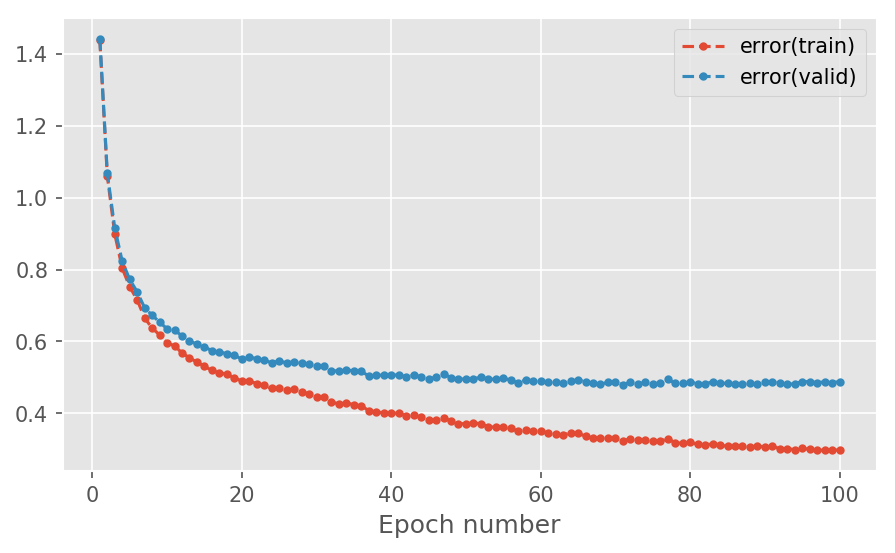

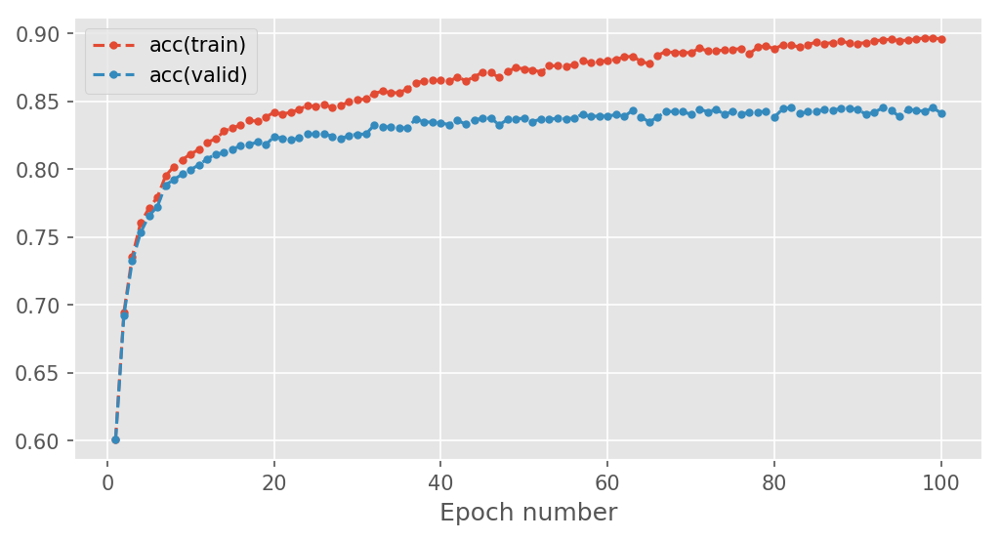

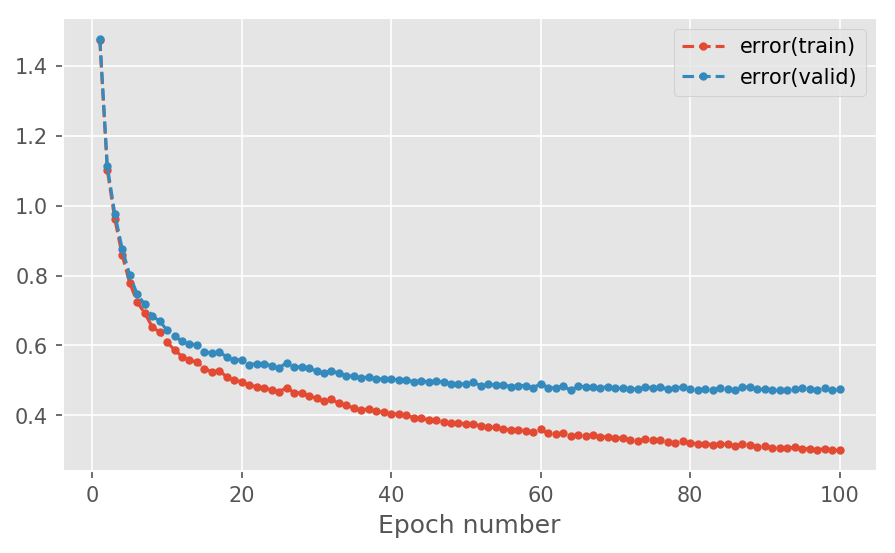

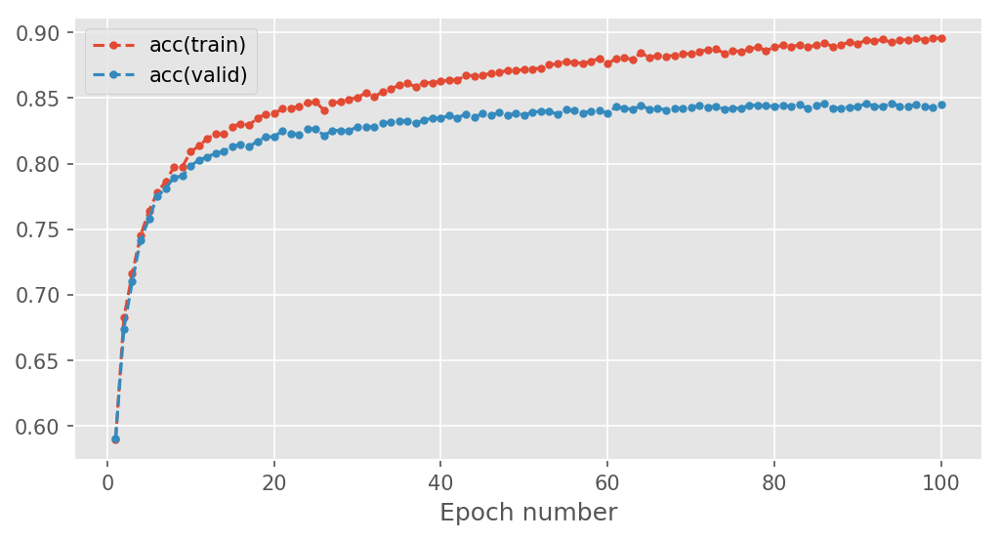

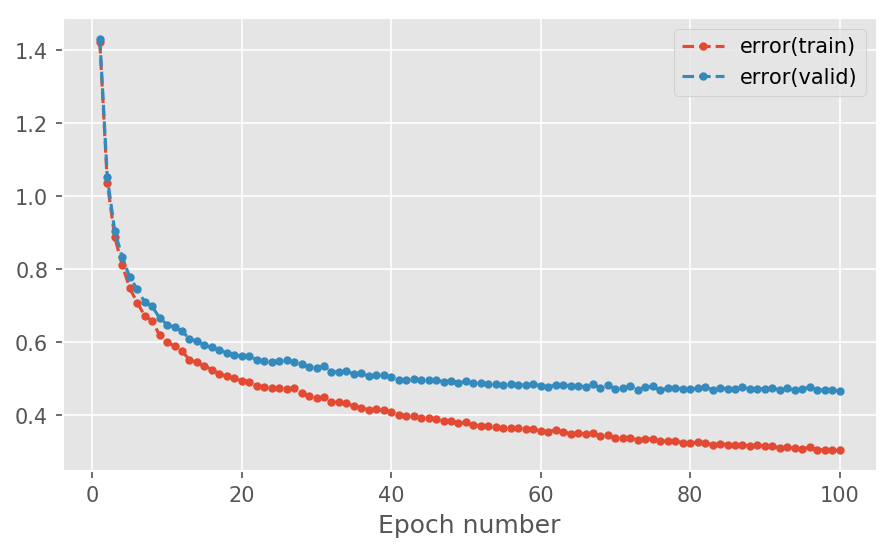

...

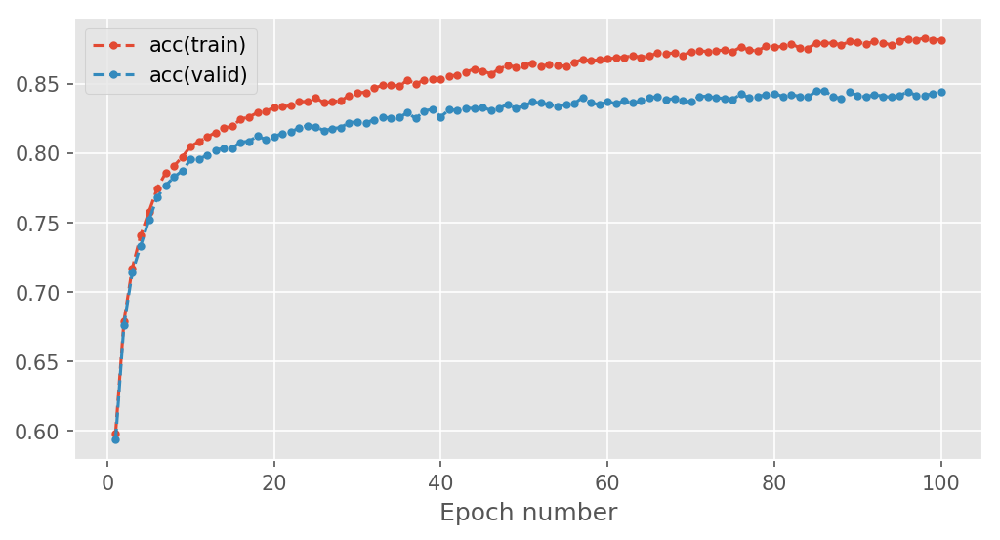

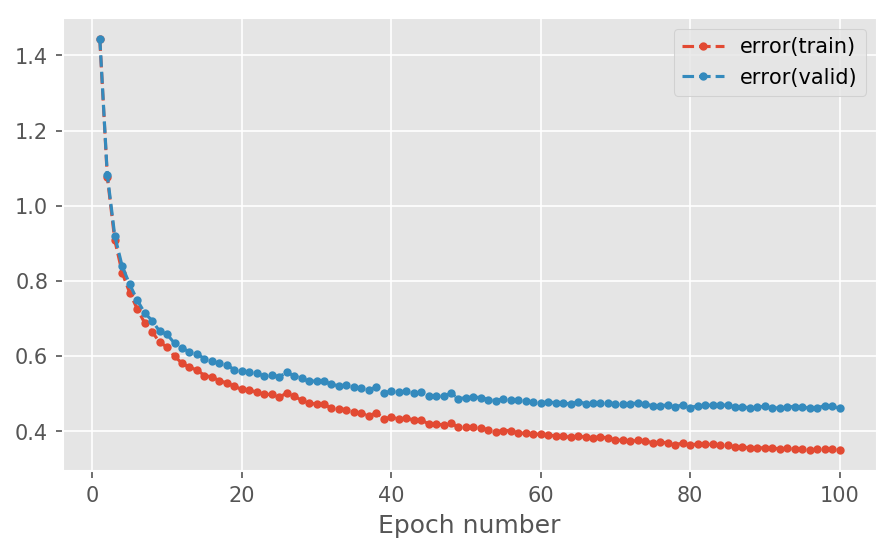

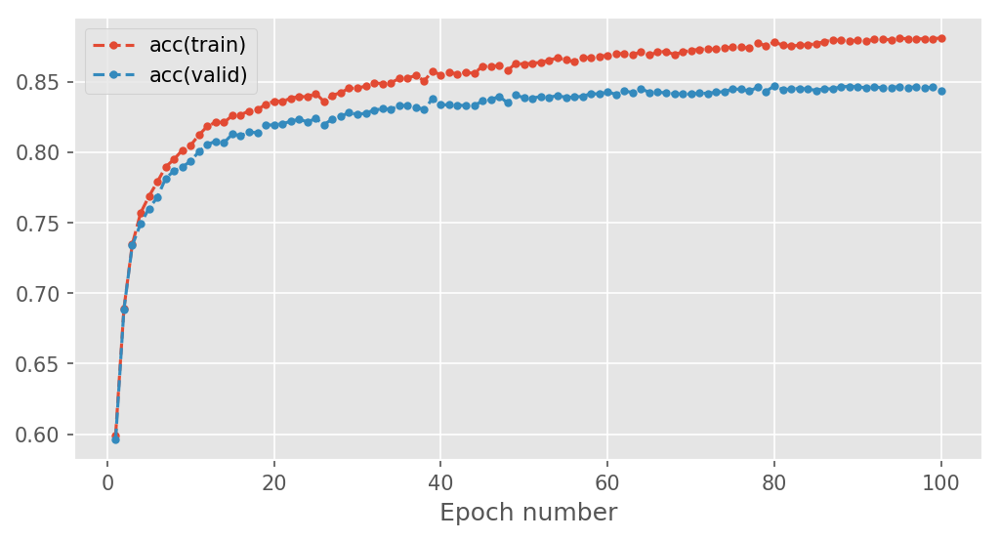

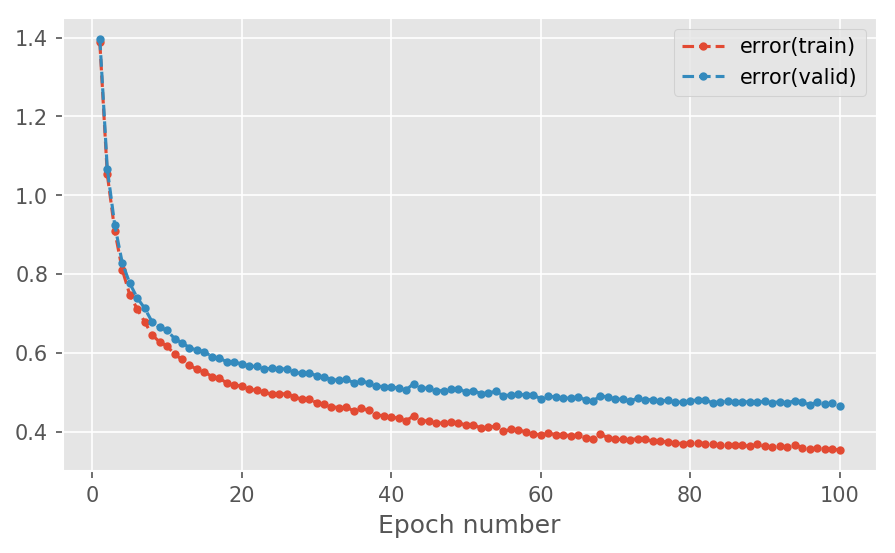

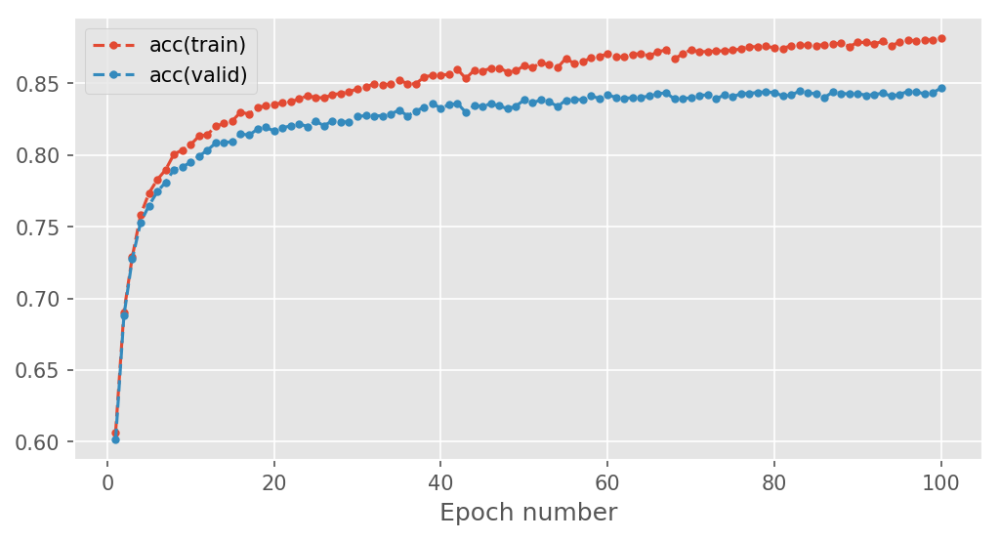

In [258]:
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 500

import importlib
import mlp
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule,AdamLearningRuleWithWeightDecay
importlib.reload(mlp.optimisers)
importlib.reload(mlp.learning_rules)
importlib.reload(mlp.schedulers)
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule,AdamLearningRuleWithWeightDecay
from mlp.schedulers import CosineAnnealingWithWarmRestarts

weight_decays=np.linspace(0.1,0.25,15)

answers3=[]

for weight_decay in weight_decays:
    print(weight_decay)
    logger = logging.getLogger()
    logger.setLevel(logging.INFO)
    logger.handlers = [logging.StreamHandler()]

    # Create data provider objects for the MNIST data set
    train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
    valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
    test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)

    #setup hyperparameter
    learning_rate = 0.013
    num_epochs = 100
    stats_interval = 1

    min_learning_rate=2e-4
    max_learning_rate=4e-4
    total_iters_per_period=25
    max_learning_rate_discount_factor=0.9
    period_iteration_expansion_factor=3

    input_dim, output_dim, hidden_dim = 784, 47, 100

    weights_init = GlorotUniformInit(rng=rng)
    biases_init = ConstantInit(0.)
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init),
        ReluLayer(),
        AffineLayer(hidden_dim, output_dim, weights_init, biases_init)
    ])

    error = CrossEntropySoftmaxError()
    # Use a basic gradient descent learning rule
    learning_rule = AdamLearningRuleWithWeightDecay(learning_rate=3e-4,beta_1=0.875,beta_2=0.9992,weight_decay=weight_decay)

    scheduler=CosineAnnealingWithWarmRestarts(min_learning_rate=min_learning_rate,max_learning_rate=max_learning_rate,
                                             total_iters_per_period=total_iters_per_period,
                                              max_learning_rate_discount_factor=max_learning_rate_discount_factor,
                                             period_iteration_expansion_factor=period_iteration_expansion_factor)

    #Remember to use notebook=False when you write a script to be run in a terminal
    _CosineADAM_WD1 = train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, scheduler,stats_interval, notebook=True)

    answers3.append(_CosineADAM_WD1)

In [265]:
values3=[]
values32=[]
for element in answers3:
    values3.append(min(element[0][:,2])) 
    values32.append(element[-3])     

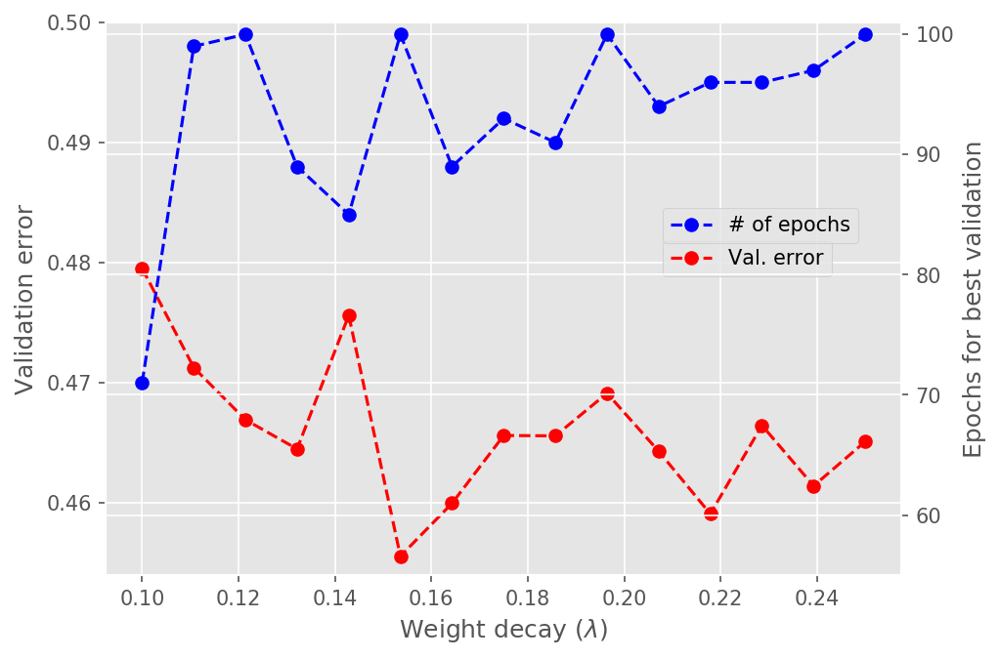

In [310]:
fig=plt.figure(figsize=(7,5),dpi=150)
ax1=fig.add_subplot(111)
ax2=ax1.twinx()
ax1.plot(weight_decays,values3,"--o",c='r',label="Val. error")
ax2.plot(weight_decays,values32,"--o",c='b',label="# of epochs")
ax2.set_ylim(55,101)
ax1.set_ylim(0.454,0.500)
ax2.set_ylabel("Epochs for best validation")
ax1.set_xlabel(r'Weight decay ($\lambda$)')
ax1.set_ylabel("Validation error")

ax1.legend(loc=(0.7,0.54))
ax2.legend(loc=(0.7,0.6))

fig.savefig("AdamWD2.png")

In [328]:
importlib.reload(mlp.errors)
from mlp.errors import CrossEntropySoftmaxError
outputs=(answers3[5][-2].fprop(test_data.inputs)[-1])
targets=MNISTDataProvider.to_one_of_k(test_data,test_data.targets)
CrossEntropySoftmaxError.__call__(error,outputs,targets)

(0.4922740246752642, 0.009624697290111275, 0.8376582278481013)

In [337]:
answers2[5][2]

301.8328788280487

KeysView(<numpy.lib.npyio.NpzFile object at 0x11598c860>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11598cf98>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11598ca90>)


0.01


Epoch 1: 2.3s to complete
    error(train)=7.74e-01, acc(train)=7.61e-01, error(valid)=8.01e-01, acc(valid)=7.53e-01


1


0.02


Epoch 2: 2.5s to complete
    error(train)=6.42e-01, acc(train)=7.88e-01, error(valid)=6.85e-01, acc(valid)=7.72e-01


2


0.03


Epoch 3: 2.4s to complete
    error(train)=5.60e-01, acc(train)=8.13e-01, error(valid)=6.23e-01, acc(valid)=7.95e-01


3


0.04


Epoch 4: 2.2s to complete
    error(train)=4.95e-01, acc(train)=8.32e-01, error(valid)=5.66e-01, acc(valid)=8.13e-01


4


0.05


Epoch 5: 2.3s to complete
    error(train)=4.83e-01, acc(train)=8.31e-01, error(valid)=5.62e-01, acc(valid)=8.10e-01


5


0.06


Epoch 6: 2.5s to complete
    error(train)=4.64e-01, acc(train)=8.36e-01, error(valid)=5.61e-01, acc(valid)=8.13e-01


6


0.07


Epoch 7: 2.2s to complete
    error(train)=4.38e-01, acc(train)=8.46e-01, error(valid)=5.49e-01, acc(valid)=8.19e-01


7


0.08


Epoch 8: 2.4s to complete
    error(train)=4.22e-01, acc(train)=8.51e-01, error(valid)=5.33e-01, acc(valid)=8.26e-01


8


0.09


Epoch 9: 2.3s to complete
    error(train)=4.23e-01, acc(train)=8.50e-01, error(valid)=5.31e-01, acc(valid)=8.24e-01


9


0.1


Epoch 10: 2.5s to complete
    error(train)=4.01e-01, acc(train)=8.55e-01, error(valid)=5.27e-01, acc(valid)=8.26e-01


10


0.11


Epoch 11: 2.6s to complete
    error(train)=4.03e-01, acc(train)=8.55e-01, error(valid)=5.28e-01, acc(valid)=8.29e-01


0.12


Epoch 12: 2.5s to complete
    error(train)=3.84e-01, acc(train)=8.60e-01, error(valid)=5.12e-01, acc(valid)=8.30e-01


12


0.13


Epoch 13: 2.3s to complete
    error(train)=3.76e-01, acc(train)=8.62e-01, error(valid)=5.05e-01, acc(valid)=8.31e-01


13


0.14


Epoch 14: 2.4s to complete
    error(train)=3.90e-01, acc(train)=8.58e-01, error(valid)=5.33e-01, acc(valid)=8.25e-01


0.15


Epoch 15: 2.3s to complete
    error(train)=3.80e-01, acc(train)=8.62e-01, error(valid)=5.27e-01, acc(valid)=8.31e-01


0.16


Epoch 16: 2.2s to complete
    error(train)=3.79e-01, acc(train)=8.57e-01, error(valid)=5.28e-01, acc(valid)=8.22e-01


0.17


Epoch 17: 2.2s to complete
    error(train)=3.84e-01, acc(train)=8.61e-01, error(valid)=5.25e-01, acc(valid)=8.28e-01


0.18


Epoch 18: 2.3s to complete
    error(train)=3.72e-01, acc(train)=8.59e-01, error(valid)=5.20e-01, acc(valid)=8.26e-01


0.19


Epoch 19: 2.2s to complete
    error(train)=3.65e-01, acc(train)=8.65e-01, error(valid)=5.27e-01, acc(valid)=8.26e-01


0.2


Epoch 20: 2.1s to complete
    error(train)=3.61e-01, acc(train)=8.66e-01, error(valid)=5.20e-01, acc(valid)=8.32e-01


0.21


Epoch 21: 2.3s to complete
    error(train)=3.61e-01, acc(train)=8.68e-01, error(valid)=5.34e-01, acc(valid)=8.32e-01


0.22


Epoch 22: 2.1s to complete
    error(train)=3.56e-01, acc(train)=8.67e-01, error(valid)=5.17e-01, acc(valid)=8.31e-01


0.23


Epoch 23: 2.2s to complete
    error(train)=3.43e-01, acc(train)=8.74e-01, error(valid)=5.10e-01, acc(valid)=8.33e-01


0.24


Epoch 24: 2.2s to complete
    error(train)=3.53e-01, acc(train)=8.70e-01, error(valid)=5.17e-01, acc(valid)=8.33e-01


0.25


Epoch 25: 2.1s to complete
    error(train)=3.53e-01, acc(train)=8.70e-01, error(valid)=5.22e-01, acc(valid)=8.33e-01


0.26


Epoch 26: 2.2s to complete
    error(train)=3.52e-01, acc(train)=8.70e-01, error(valid)=5.31e-01, acc(valid)=8.31e-01


0.27


Epoch 27: 2.2s to complete
    error(train)=3.56e-01, acc(train)=8.68e-01, error(valid)=5.32e-01, acc(valid)=8.27e-01


0.28


Epoch 28: 2.1s to complete
    error(train)=3.35e-01, acc(train)=8.74e-01, error(valid)=5.16e-01, acc(valid)=8.36e-01


0.29


Epoch 29: 2.2s to complete
    error(train)=3.58e-01, acc(train)=8.66e-01, error(valid)=5.42e-01, acc(valid)=8.27e-01


0.3


Epoch 30: 2.1s to complete
    error(train)=3.21e-01, acc(train)=8.81e-01, error(valid)=5.18e-01, acc(valid)=8.38e-01


0.31


Epoch 31: 2.1s to complete
    error(train)=3.14e-01, acc(train)=8.82e-01, error(valid)=5.10e-01, acc(valid)=8.40e-01


0.32


Epoch 32: 2.4s to complete
    error(train)=3.55e-01, acc(train)=8.70e-01, error(valid)=5.45e-01, acc(valid)=8.32e-01


0.33


Epoch 33: 2.5s to complete
    error(train)=3.20e-01, acc(train)=8.81e-01, error(valid)=5.14e-01, acc(valid)=8.35e-01


0.34


Epoch 34: 2.5s to complete
    error(train)=3.22e-01, acc(train)=8.78e-01, error(valid)=5.19e-01, acc(valid)=8.34e-01


0.35


Epoch 35: 2.6s to complete
    error(train)=3.15e-01, acc(train)=8.80e-01, error(valid)=5.19e-01, acc(valid)=8.35e-01


0.36


Epoch 36: 2.5s to complete
    error(train)=3.31e-01, acc(train)=8.74e-01, error(valid)=5.31e-01, acc(valid)=8.31e-01


0.37


Epoch 37: 2.2s to complete
    error(train)=3.29e-01, acc(train)=8.77e-01, error(valid)=5.44e-01, acc(valid)=8.31e-01


0.38


Epoch 38: 2.1s to complete
    error(train)=3.10e-01, acc(train)=8.83e-01, error(valid)=5.23e-01, acc(valid)=8.37e-01


0.39


Epoch 39: 2.2s to complete
    error(train)=3.00e-01, acc(train)=8.85e-01, error(valid)=5.11e-01, acc(valid)=8.39e-01


0.4


Epoch 40: 2.1s to complete
    error(train)=3.32e-01, acc(train)=8.76e-01, error(valid)=5.55e-01, acc(valid)=8.30e-01


0.41


Epoch 41: 2.2s to complete
    error(train)=3.06e-01, acc(train)=8.84e-01, error(valid)=5.20e-01, acc(valid)=8.36e-01


0.42


Epoch 42: 2.1s to complete
    error(train)=2.82e-01, acc(train)=8.91e-01, error(valid)=5.16e-01, acc(valid)=8.41e-01


0.43


Epoch 43: 2.1s to complete
    error(train)=2.95e-01, acc(train)=8.86e-01, error(valid)=5.14e-01, acc(valid)=8.37e-01


0.44


Epoch 44: 2.2s to complete
    error(train)=2.95e-01, acc(train)=8.86e-01, error(valid)=5.20e-01, acc(valid)=8.39e-01


0.45


Epoch 45: 2.1s to complete
    error(train)=2.83e-01, acc(train)=8.91e-01, error(valid)=5.21e-01, acc(valid)=8.35e-01


0.46


Epoch 46: 2.1s to complete
    error(train)=2.82e-01, acc(train)=8.90e-01, error(valid)=5.27e-01, acc(valid)=8.35e-01


0.47


Epoch 47: 2.5s to complete
    error(train)=2.78e-01, acc(train)=8.93e-01, error(valid)=5.28e-01, acc(valid)=8.39e-01


0.48


Epoch 48: 2.1s to complete
    error(train)=2.85e-01, acc(train)=8.91e-01, error(valid)=5.17e-01, acc(valid)=8.40e-01


0.49


Epoch 49: 2.1s to complete
    error(train)=2.83e-01, acc(train)=8.89e-01, error(valid)=5.30e-01, acc(valid)=8.35e-01


0.5


Epoch 50: 2.2s to complete
    error(train)=2.80e-01, acc(train)=8.91e-01, error(valid)=5.31e-01, acc(valid)=8.36e-01


0.51


Epoch 51: 2.1s to complete
    error(train)=2.55e-01, acc(train)=9.01e-01, error(valid)=5.09e-01, acc(valid)=8.42e-01


0.52


Epoch 52: 2.2s to complete
    error(train)=2.77e-01, acc(train)=8.92e-01, error(valid)=5.31e-01, acc(valid)=8.37e-01


0.53


Epoch 53: 2.1s to complete
    error(train)=2.57e-01, acc(train)=8.99e-01, error(valid)=5.19e-01, acc(valid)=8.39e-01


0.54


Epoch 54: 2.1s to complete
    error(train)=2.60e-01, acc(train)=8.98e-01, error(valid)=5.18e-01, acc(valid)=8.41e-01


0.55


Epoch 55: 2.2s to complete
    error(train)=2.52e-01, acc(train)=9.01e-01, error(valid)=5.15e-01, acc(valid)=8.44e-01


0.56


Epoch 56: 2.1s to complete
    error(train)=2.53e-01, acc(train)=9.00e-01, error(valid)=5.31e-01, acc(valid)=8.41e-01


0.57


Epoch 57: 2.1s to complete
    error(train)=2.52e-01, acc(train)=9.00e-01, error(valid)=5.34e-01, acc(valid)=8.37e-01


0.58


Epoch 58: 2.2s to complete
    error(train)=2.60e-01, acc(train)=8.97e-01, error(valid)=5.41e-01, acc(valid)=8.36e-01


0.59


Epoch 59: 2.1s to complete
    error(train)=2.40e-01, acc(train)=9.05e-01, error(valid)=5.31e-01, acc(valid)=8.41e-01


0.6


Epoch 60: 2.1s to complete
    error(train)=2.30e-01, acc(train)=9.08e-01, error(valid)=5.23e-01, acc(valid)=8.43e-01


0.61


Epoch 61: 2.2s to complete
    error(train)=2.34e-01, acc(train)=9.07e-01, error(valid)=5.37e-01, acc(valid)=8.42e-01


0.62


Epoch 62: 2.1s to complete
    error(train)=2.36e-01, acc(train)=9.06e-01, error(valid)=5.30e-01, acc(valid)=8.41e-01


0.63


Epoch 63: 2.2s to complete
    error(train)=2.14e-01, acc(train)=9.15e-01, error(valid)=5.14e-01, acc(valid)=8.48e-01


0.64


Epoch 64: 2.1s to complete
    error(train)=2.28e-01, acc(train)=9.10e-01, error(valid)=5.34e-01, acc(valid)=8.41e-01


0.65


Epoch 65: 2.1s to complete
    error(train)=2.33e-01, acc(train)=9.08e-01, error(valid)=5.22e-01, acc(valid)=8.44e-01


0.66


Epoch 66: 2.2s to complete
    error(train)=2.11e-01, acc(train)=9.15e-01, error(valid)=5.37e-01, acc(valid)=8.42e-01


0.67


Epoch 67: 2.1s to complete
    error(train)=2.31e-01, acc(train)=9.10e-01, error(valid)=5.46e-01, acc(valid)=8.40e-01


0.68


Epoch 68: 2.1s to complete
    error(train)=2.06e-01, acc(train)=9.17e-01, error(valid)=5.37e-01, acc(valid)=8.46e-01


0.69


Epoch 69: 2.2s to complete
    error(train)=1.95e-01, acc(train)=9.21e-01, error(valid)=5.34e-01, acc(valid)=8.45e-01


0.7


Epoch 70: 2.1s to complete
    error(train)=2.15e-01, acc(train)=9.15e-01, error(valid)=5.55e-01, acc(valid)=8.41e-01


0.71


Epoch 71: 2.2s to complete
    error(train)=2.07e-01, acc(train)=9.17e-01, error(valid)=5.45e-01, acc(valid)=8.43e-01


0.72


Epoch 72: 2.2s to complete
    error(train)=1.97e-01, acc(train)=9.21e-01, error(valid)=5.42e-01, acc(valid)=8.44e-01


0.73


Epoch 73: 2.1s to complete
    error(train)=1.96e-01, acc(train)=9.21e-01, error(valid)=5.47e-01, acc(valid)=8.42e-01


0.74


Epoch 74: 2.2s to complete
    error(train)=1.95e-01, acc(train)=9.21e-01, error(valid)=5.53e-01, acc(valid)=8.44e-01


0.75


Epoch 75: 2.1s to complete
    error(train)=1.87e-01, acc(train)=9.24e-01, error(valid)=5.41e-01, acc(valid)=8.45e-01


0.76


Epoch 76: 2.3s to complete
    error(train)=1.87e-01, acc(train)=9.24e-01, error(valid)=5.54e-01, acc(valid)=8.44e-01


0.77


Epoch 77: 2.3s to complete
    error(train)=1.87e-01, acc(train)=9.25e-01, error(valid)=5.67e-01, acc(valid)=8.45e-01


0.78


Epoch 78: 2.1s to complete
    error(train)=1.85e-01, acc(train)=9.25e-01, error(valid)=5.67e-01, acc(valid)=8.41e-01


0.79


Epoch 79: 2.2s to complete
    error(train)=1.90e-01, acc(train)=9.23e-01, error(valid)=5.73e-01, acc(valid)=8.41e-01


0.8


Epoch 80: 2.3s to complete
    error(train)=1.78e-01, acc(train)=9.27e-01, error(valid)=5.67e-01, acc(valid)=8.44e-01


0.81


Epoch 81: 2.1s to complete
    error(train)=1.76e-01, acc(train)=9.29e-01, error(valid)=5.73e-01, acc(valid)=8.45e-01


0.82


Epoch 82: 2.1s to complete
    error(train)=1.83e-01, acc(train)=9.26e-01, error(valid)=5.79e-01, acc(valid)=8.39e-01


0.83


Epoch 83: 2.3s to complete
    error(train)=1.67e-01, acc(train)=9.32e-01, error(valid)=5.72e-01, acc(valid)=8.45e-01


0.84


Epoch 84: 2.2s to complete
    error(train)=1.68e-01, acc(train)=9.32e-01, error(valid)=5.78e-01, acc(valid)=8.42e-01


0.85


Epoch 85: 2.2s to complete
    error(train)=1.65e-01, acc(train)=9.32e-01, error(valid)=5.84e-01, acc(valid)=8.47e-01


0.86


Epoch 86: 2.1s to complete
    error(train)=1.63e-01, acc(train)=9.33e-01, error(valid)=5.63e-01, acc(valid)=8.46e-01


0.87


Epoch 87: 2.1s to complete
    error(train)=1.73e-01, acc(train)=9.29e-01, error(valid)=6.16e-01, acc(valid)=8.41e-01


0.88


Epoch 88: 2.2s to complete
    error(train)=1.64e-01, acc(train)=9.33e-01, error(valid)=5.85e-01, acc(valid)=8.44e-01


0.89


Epoch 89: 2.1s to complete
    error(train)=1.61e-01, acc(train)=9.35e-01, error(valid)=5.84e-01, acc(valid)=8.43e-01


0.9


Epoch 90: 2.1s to complete
    error(train)=1.62e-01, acc(train)=9.35e-01, error(valid)=5.92e-01, acc(valid)=8.44e-01


0.91


Epoch 91: 2.2s to complete
    error(train)=1.55e-01, acc(train)=9.37e-01, error(valid)=5.97e-01, acc(valid)=8.42e-01


0.92


Epoch 92: 2.1s to complete
    error(train)=1.57e-01, acc(train)=9.36e-01, error(valid)=5.97e-01, acc(valid)=8.42e-01


0.93


Epoch 93: 2.1s to complete
    error(train)=1.46e-01, acc(train)=9.41e-01, error(valid)=5.95e-01, acc(valid)=8.42e-01


0.94


Epoch 94: 2.2s to complete
    error(train)=1.52e-01, acc(train)=9.38e-01, error(valid)=6.07e-01, acc(valid)=8.42e-01


0.95


Epoch 95: 2.1s to complete
    error(train)=1.42e-01, acc(train)=9.42e-01, error(valid)=6.18e-01, acc(valid)=8.43e-01


0.96


Epoch 96: 2.2s to complete
    error(train)=1.59e-01, acc(train)=9.35e-01, error(valid)=6.29e-01, acc(valid)=8.42e-01


0.97


Epoch 97: 2.7s to complete
    error(train)=1.60e-01, acc(train)=9.36e-01, error(valid)=6.37e-01, acc(valid)=8.38e-01


0.98


Epoch 98: 2.5s to complete
    error(train)=1.45e-01, acc(train)=9.41e-01, error(valid)=6.14e-01, acc(valid)=8.43e-01


0.99


Epoch 99: 2.5s to complete
    error(train)=1.50e-01, acc(train)=9.38e-01, error(valid)=6.35e-01, acc(valid)=8.44e-01


0.0


Epoch 100: 2.5s to complete
    error(train)=1.56e-01, acc(train)=9.37e-01, error(valid)=6.43e-01, acc(valid)=8.39e-01



KeysView(<numpy.lib.npyio.NpzFile object at 0x116720e10>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x116720dd8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x116720da0>)


0.01


Epoch 1: 2.3s to complete
    error(train)=7.93e-01, acc(train)=7.49e-01, error(valid)=8.17e-01, acc(valid)=7.41e-01


1


0.02


Epoch 2: 2.2s to complete
    error(train)=6.50e-01, acc(train)=7.85e-01, error(valid)=6.94e-01, acc(valid)=7.73e-01


2


0.03


Epoch 3: 2.1s to complete
    error(train)=5.50e-01, acc(train)=8.16e-01, error(valid)=6.07e-01, acc(valid)=8.01e-01


3


0.04


Epoch 4: 2.2s to complete
    error(train)=4.97e-01, acc(train)=8.30e-01, error(valid)=5.66e-01, acc(valid)=8.13e-01


4


0.05


Epoch 5: 2.1s to complete
    error(train)=4.74e-01, acc(train)=8.37e-01, error(valid)=5.48e-01, acc(valid)=8.16e-01


5


0.06


Epoch 6: 2.1s to complete
    error(train)=4.88e-01, acc(train)=8.31e-01, error(valid)=5.72e-01, acc(valid)=8.12e-01


0.07


Epoch 7: 2.3s to complete
    error(train)=4.89e-01, acc(train)=8.29e-01, error(valid)=5.78e-01, acc(valid)=8.04e-01


0.08


Epoch 8: 2.3s to complete
    error(train)=4.46e-01, acc(train)=8.43e-01, error(valid)=5.39e-01, acc(valid)=8.17e-01


8


0.09


Epoch 9: 2.1s to complete
    error(train)=4.16e-01, acc(train)=8.51e-01, error(valid)=5.12e-01, acc(valid)=8.28e-01


9


0.1


Epoch 10: 2.2s to complete
    error(train)=4.18e-01, acc(train)=8.52e-01, error(valid)=5.18e-01, acc(valid)=8.31e-01


0.11


Epoch 11: 2.3s to complete
    error(train)=4.24e-01, acc(train)=8.49e-01, error(valid)=5.30e-01, acc(valid)=8.25e-01


0.12


Epoch 12: 2.2s to complete
    error(train)=4.14e-01, acc(train)=8.53e-01, error(valid)=5.19e-01, acc(valid)=8.27e-01


0.13


Epoch 13: 2.2s to complete
    error(train)=4.36e-01, acc(train)=8.43e-01, error(valid)=5.48e-01, acc(valid)=8.19e-01


0.14


Epoch 14: 2.1s to complete
    error(train)=4.12e-01, acc(train)=8.51e-01, error(valid)=5.21e-01, acc(valid)=8.25e-01


0.15


Epoch 15: 2.2s to complete
    error(train)=3.94e-01, acc(train)=8.57e-01, error(valid)=5.00e-01, acc(valid)=8.33e-01


15


0.16


Epoch 16: 2.2s to complete
    error(train)=3.78e-01, acc(train)=8.63e-01, error(valid)=4.90e-01, acc(valid)=8.37e-01


16


0.17


Epoch 17: 2.2s to complete
    error(train)=3.86e-01, acc(train)=8.59e-01, error(valid)=4.99e-01, acc(valid)=8.32e-01


0.18


Epoch 18: 2.2s to complete
    error(train)=3.76e-01, acc(train)=8.64e-01, error(valid)=4.99e-01, acc(valid)=8.34e-01


0.19


Epoch 19: 2.5s to complete
    error(train)=3.89e-01, acc(train)=8.58e-01, error(valid)=5.02e-01, acc(valid)=8.30e-01


0.2


Epoch 20: 2.1s to complete
    error(train)=3.88e-01, acc(train)=8.58e-01, error(valid)=5.17e-01, acc(valid)=8.31e-01


0.21


Epoch 21: 2.2s to complete
    error(train)=3.99e-01, acc(train)=8.56e-01, error(valid)=5.24e-01, acc(valid)=8.29e-01


0.22


Epoch 22: 2.1s to complete
    error(train)=3.68e-01, acc(train)=8.64e-01, error(valid)=4.89e-01, acc(valid)=8.35e-01


22


0.23


Epoch 23: 2.1s to complete
    error(train)=4.02e-01, acc(train)=8.51e-01, error(valid)=5.26e-01, acc(valid)=8.18e-01


0.24


Epoch 24: 2.2s to complete
    error(train)=3.52e-01, acc(train)=8.71e-01, error(valid)=4.79e-01, acc(valid)=8.45e-01


24


0.25


Epoch 25: 2.1s to complete
    error(train)=3.59e-01, acc(train)=8.66e-01, error(valid)=4.81e-01, acc(valid)=8.34e-01


0.26


Epoch 26: 2.1s to complete
    error(train)=3.61e-01, acc(train)=8.68e-01, error(valid)=4.82e-01, acc(valid)=8.37e-01


0.27


Epoch 27: 2.2s to complete
    error(train)=3.63e-01, acc(train)=8.66e-01, error(valid)=4.90e-01, acc(valid)=8.35e-01


0.28


Epoch 28: 2.1s to complete
    error(train)=3.42e-01, acc(train)=8.74e-01, error(valid)=4.70e-01, acc(valid)=8.43e-01


28


0.29


Epoch 29: 2.2s to complete
    error(train)=3.57e-01, acc(train)=8.68e-01, error(valid)=4.83e-01, acc(valid)=8.38e-01


0.3


Epoch 30: 2.2s to complete
    error(train)=3.43e-01, acc(train)=8.71e-01, error(valid)=4.68e-01, acc(valid)=8.41e-01


30


0.31


Epoch 31: 2.1s to complete
    error(train)=3.57e-01, acc(train)=8.69e-01, error(valid)=4.82e-01, acc(valid)=8.38e-01


0.32


Epoch 32: 2.2s to complete
    error(train)=3.49e-01, acc(train)=8.70e-01, error(valid)=4.83e-01, acc(valid)=8.39e-01


0.33


Epoch 33: 2.1s to complete
    error(train)=3.62e-01, acc(train)=8.67e-01, error(valid)=5.00e-01, acc(valid)=8.33e-01


0.34


Epoch 34: 2.2s to complete
    error(train)=3.30e-01, acc(train)=8.74e-01, error(valid)=4.72e-01, acc(valid)=8.39e-01


0.35


Epoch 35: 2.2s to complete
    error(train)=3.55e-01, acc(train)=8.69e-01, error(valid)=4.87e-01, acc(valid)=8.36e-01


0.36


Epoch 36: 2.1s to complete
    error(train)=3.35e-01, acc(train)=8.76e-01, error(valid)=4.75e-01, acc(valid)=8.39e-01


0.37


Epoch 37: 2.2s to complete
    error(train)=3.19e-01, acc(train)=8.79e-01, error(valid)=4.70e-01, acc(valid)=8.41e-01


0.38


Epoch 38: 2.3s to complete
    error(train)=3.50e-01, acc(train)=8.71e-01, error(valid)=4.88e-01, acc(valid)=8.33e-01


0.39


Epoch 39: 2.1s to complete
    error(train)=3.23e-01, acc(train)=8.79e-01, error(valid)=4.68e-01, acc(valid)=8.42e-01


0.4


Epoch 40: 2.1s to complete
    error(train)=3.28e-01, acc(train)=8.77e-01, error(valid)=4.78e-01, acc(valid)=8.39e-01


0.41


Epoch 41: 2.2s to complete
    error(train)=3.17e-01, acc(train)=8.81e-01, error(valid)=4.66e-01, acc(valid)=8.42e-01


41


0.42


Epoch 42: 2.2s to complete
    error(train)=3.10e-01, acc(train)=8.82e-01, error(valid)=4.55e-01, acc(valid)=8.45e-01


42


0.43


Epoch 43: 2.1s to complete
    error(train)=3.24e-01, acc(train)=8.78e-01, error(valid)=4.79e-01, acc(valid)=8.39e-01


0.44


Epoch 44: 2.4s to complete
    error(train)=3.09e-01, acc(train)=8.82e-01, error(valid)=4.62e-01, acc(valid)=8.45e-01


0.45


Epoch 45: 2.2s to complete
    error(train)=3.01e-01, acc(train)=8.87e-01, error(valid)=4.49e-01, acc(valid)=8.51e-01


45


0.46


Epoch 46: 2.2s to complete
    error(train)=3.31e-01, acc(train)=8.76e-01, error(valid)=4.92e-01, acc(valid)=8.39e-01


0.47


Epoch 47: 2.2s to complete
    error(train)=3.06e-01, acc(train)=8.83e-01, error(valid)=4.69e-01, acc(valid)=8.44e-01


0.48


Epoch 48: 2.2s to complete
    error(train)=3.15e-01, acc(train)=8.80e-01, error(valid)=4.85e-01, acc(valid)=8.40e-01


0.49


Epoch 49: 2.2s to complete
    error(train)=3.00e-01, acc(train)=8.86e-01, error(valid)=4.68e-01, acc(valid)=8.43e-01


0.5


Epoch 50: 2.1s to complete
    error(train)=2.94e-01, acc(train)=8.86e-01, error(valid)=4.68e-01, acc(valid)=8.47e-01


0.51


Epoch 51: 2.1s to complete
    error(train)=3.14e-01, acc(train)=8.82e-01, error(valid)=4.88e-01, acc(valid)=8.42e-01


0.52


Epoch 52: 2.2s to complete
    error(train)=2.97e-01, acc(train)=8.85e-01, error(valid)=4.69e-01, acc(valid)=8.46e-01


0.53


Epoch 53: 2.1s to complete
    error(train)=2.87e-01, acc(train)=8.91e-01, error(valid)=4.61e-01, acc(valid)=8.48e-01


0.54


Epoch 54: 2.1s to complete
    error(train)=3.11e-01, acc(train)=8.81e-01, error(valid)=4.88e-01, acc(valid)=8.38e-01


0.55


Epoch 55: 2.2s to complete
    error(train)=2.73e-01, acc(train)=8.95e-01, error(valid)=4.58e-01, acc(valid)=8.49e-01


0.56


Epoch 56: 2.1s to complete
    error(train)=2.79e-01, acc(train)=8.92e-01, error(valid)=4.67e-01, acc(valid)=8.46e-01


0.57


Epoch 57: 2.1s to complete
    error(train)=2.71e-01, acc(train)=8.95e-01, error(valid)=4.54e-01, acc(valid)=8.48e-01


0.58


Epoch 58: 2.2s to complete
    error(train)=2.63e-01, acc(train)=8.98e-01, error(valid)=4.57e-01, acc(valid)=8.51e-01


0.59


Epoch 59: 2.1s to complete
    error(train)=2.70e-01, acc(train)=8.97e-01, error(valid)=4.53e-01, acc(valid)=8.49e-01


0.6


Epoch 60: 2.5s to complete
    error(train)=2.64e-01, acc(train)=8.99e-01, error(valid)=4.55e-01, acc(valid)=8.50e-01


0.61


Epoch 61: 2.5s to complete
    error(train)=2.65e-01, acc(train)=8.97e-01, error(valid)=4.63e-01, acc(valid)=8.50e-01


0.62


Epoch 62: 2.5s to complete
    error(train)=2.71e-01, acc(train)=8.95e-01, error(valid)=4.67e-01, acc(valid)=8.47e-01


0.63


Epoch 63: 2.5s to complete
    error(train)=2.62e-01, acc(train)=8.98e-01, error(valid)=4.62e-01, acc(valid)=8.49e-01


0.64


Epoch 64: 2.6s to complete
    error(train)=2.55e-01, acc(train)=9.02e-01, error(valid)=4.60e-01, acc(valid)=8.49e-01


0.65


Epoch 65: 2.2s to complete
    error(train)=2.49e-01, acc(train)=9.02e-01, error(valid)=4.59e-01, acc(valid)=8.50e-01


0.66


Epoch 66: 2.1s to complete
    error(train)=2.54e-01, acc(train)=9.02e-01, error(valid)=4.59e-01, acc(valid)=8.52e-01


0.67


Epoch 67: 2.5s to complete
    error(train)=2.39e-01, acc(train)=9.05e-01, error(valid)=4.48e-01, acc(valid)=8.54e-01


67


0.68


Epoch 68: 2.1s to complete
    error(train)=2.39e-01, acc(train)=9.06e-01, error(valid)=4.56e-01, acc(valid)=8.51e-01


0.69


Epoch 69: 2.1s to complete
    error(train)=2.39e-01, acc(train)=9.08e-01, error(valid)=4.54e-01, acc(valid)=8.56e-01


0.7


Epoch 70: 2.3s to complete
    error(train)=2.44e-01, acc(train)=9.03e-01, error(valid)=4.60e-01, acc(valid)=8.49e-01


0.71


Epoch 71: 2.2s to complete
    error(train)=2.37e-01, acc(train)=9.08e-01, error(valid)=4.66e-01, acc(valid)=8.52e-01


0.72


Epoch 72: 2.1s to complete
    error(train)=2.41e-01, acc(train)=9.06e-01, error(valid)=4.68e-01, acc(valid)=8.44e-01


0.73


Epoch 73: 2.2s to complete
    error(train)=2.39e-01, acc(train)=9.07e-01, error(valid)=4.75e-01, acc(valid)=8.52e-01


0.74


Epoch 74: 2.2s to complete
    error(train)=2.23e-01, acc(train)=9.13e-01, error(valid)=4.56e-01, acc(valid)=8.53e-01


0.75


Epoch 75: 2.3s to complete
    error(train)=2.36e-01, acc(train)=9.09e-01, error(valid)=4.71e-01, acc(valid)=8.47e-01


0.76


Epoch 76: 2.2s to complete
    error(train)=2.37e-01, acc(train)=9.08e-01, error(valid)=4.70e-01, acc(valid)=8.53e-01


0.77


Epoch 77: 2.1s to complete
    error(train)=2.22e-01, acc(train)=9.14e-01, error(valid)=4.64e-01, acc(valid)=8.53e-01


0.78


Epoch 78: 2.1s to complete
    error(train)=2.16e-01, acc(train)=9.15e-01, error(valid)=4.59e-01, acc(valid)=8.56e-01


0.79


Epoch 79: 2.2s to complete
    error(train)=2.15e-01, acc(train)=9.15e-01, error(valid)=4.57e-01, acc(valid)=8.52e-01


0.8


Epoch 80: 2.1s to complete
    error(train)=2.25e-01, acc(train)=9.12e-01, error(valid)=4.81e-01, acc(valid)=8.47e-01


0.81


Epoch 81: 2.6s to complete
    error(train)=2.08e-01, acc(train)=9.17e-01, error(valid)=4.69e-01, acc(valid)=8.53e-01


0.82


Epoch 82: 2.2s to complete
    error(train)=2.13e-01, acc(train)=9.18e-01, error(valid)=4.65e-01, acc(valid)=8.49e-01


0.83


Epoch 83: 2.2s to complete
    error(train)=2.02e-01, acc(train)=9.21e-01, error(valid)=4.72e-01, acc(valid)=8.54e-01


0.84


Epoch 84: 2.3s to complete
    error(train)=2.04e-01, acc(train)=9.20e-01, error(valid)=4.66e-01, acc(valid)=8.51e-01


0.85


Epoch 85: 2.1s to complete
    error(train)=2.07e-01, acc(train)=9.18e-01, error(valid)=4.68e-01, acc(valid)=8.53e-01


0.86


Epoch 86: 2.1s to complete
    error(train)=2.09e-01, acc(train)=9.18e-01, error(valid)=4.68e-01, acc(valid)=8.52e-01


0.87


Epoch 87: 2.2s to complete
    error(train)=2.07e-01, acc(train)=9.18e-01, error(valid)=4.74e-01, acc(valid)=8.52e-01


0.88


Epoch 88: 2.1s to complete
    error(train)=2.08e-01, acc(train)=9.18e-01, error(valid)=4.86e-01, acc(valid)=8.47e-01


0.89


Epoch 89: 2.1s to complete
    error(train)=1.98e-01, acc(train)=9.22e-01, error(valid)=4.90e-01, acc(valid)=8.49e-01


0.9


Epoch 90: 2.3s to complete
    error(train)=1.95e-01, acc(train)=9.24e-01, error(valid)=4.70e-01, acc(valid)=8.50e-01


0.91


Epoch 91: 2.2s to complete
    error(train)=1.89e-01, acc(train)=9.27e-01, error(valid)=4.69e-01, acc(valid)=8.51e-01


0.92


Epoch 92: 2.2s to complete
    error(train)=1.85e-01, acc(train)=9.27e-01, error(valid)=4.67e-01, acc(valid)=8.51e-01


0.93


Epoch 93: 2.2s to complete
    error(train)=1.97e-01, acc(train)=9.23e-01, error(valid)=4.73e-01, acc(valid)=8.50e-01


0.94


Epoch 94: 2.5s to complete
    error(train)=1.93e-01, acc(train)=9.24e-01, error(valid)=4.72e-01, acc(valid)=8.51e-01


0.95


Epoch 95: 2.1s to complete
    error(train)=1.90e-01, acc(train)=9.25e-01, error(valid)=4.80e-01, acc(valid)=8.50e-01


0.96


Epoch 96: 2.3s to complete
    error(train)=1.83e-01, acc(train)=9.27e-01, error(valid)=4.88e-01, acc(valid)=8.54e-01


0.97


Epoch 97: 2.1s to complete
    error(train)=1.94e-01, acc(train)=9.24e-01, error(valid)=4.90e-01, acc(valid)=8.48e-01


0.98


Epoch 98: 2.2s to complete
    error(train)=1.80e-01, acc(train)=9.29e-01, error(valid)=4.79e-01, acc(valid)=8.52e-01


0.99


Epoch 99: 2.2s to complete
    error(train)=1.79e-01, acc(train)=9.31e-01, error(valid)=4.72e-01, acc(valid)=8.50e-01


0.0


Epoch 100: 2.1s to complete
    error(train)=1.78e-01, acc(train)=9.31e-01, error(valid)=4.83e-01, acc(valid)=8.51e-01



KeysView(<numpy.lib.npyio.NpzFile object at 0x1156adba8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1156add30>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x1156adcf8>)


0.01


Epoch 1: 2.1s to complete
    error(train)=7.87e-01, acc(train)=7.56e-01, error(valid)=8.15e-01, acc(valid)=7.47e-01


1


0.02


Epoch 2: 2.2s to complete
    error(train)=6.71e-01, acc(train)=7.82e-01, error(valid)=7.17e-01, acc(valid)=7.68e-01


2


0.03


Epoch 3: 2.2s to complete
    error(train)=5.70e-01, acc(train)=8.09e-01, error(valid)=6.13e-01, acc(valid)=7.99e-01


3


0.04


Epoch 4: 2.2s to complete
    error(train)=5.19e-01, acc(train)=8.25e-01, error(valid)=5.83e-01, acc(valid)=8.07e-01


4


0.05


Epoch 5: 2.3s to complete
    error(train)=4.93e-01, acc(train)=8.30e-01, error(valid)=5.60e-01, acc(valid)=8.12e-01


5


0.06


Epoch 6: 2.2s to complete
    error(train)=4.94e-01, acc(train)=8.31e-01, error(valid)=5.69e-01, acc(valid)=8.15e-01


0.07


Epoch 7: 2.1s to complete
    error(train)=4.79e-01, acc(train)=8.33e-01, error(valid)=5.51e-01, acc(valid)=8.15e-01


7


0.08


Epoch 8: 2.3s to complete
    error(train)=4.44e-01, acc(train)=8.45e-01, error(valid)=5.27e-01, acc(valid)=8.26e-01


8


0.09


Epoch 9: 2.2s to complete
    error(train)=4.39e-01, acc(train)=8.46e-01, error(valid)=5.15e-01, acc(valid)=8.28e-01


9


0.1


Epoch 10: 2.1s to complete
    error(train)=4.34e-01, acc(train)=8.49e-01, error(valid)=5.19e-01, acc(valid)=8.29e-01


0.11


Epoch 11: 2.2s to complete
    error(train)=4.47e-01, acc(train)=8.41e-01, error(valid)=5.33e-01, acc(valid)=8.18e-01


0.12


Epoch 12: 2.1s to complete
    error(train)=4.21e-01, acc(train)=8.49e-01, error(valid)=5.15e-01, acc(valid)=8.20e-01


0.13


Epoch 13: 2.2s to complete
    error(train)=4.17e-01, acc(train)=8.52e-01, error(valid)=5.09e-01, acc(valid)=8.29e-01


13


0.14


Epoch 14: 2.2s to complete
    error(train)=4.04e-01, acc(train)=8.58e-01, error(valid)=4.96e-01, acc(valid)=8.32e-01


14


0.15


Epoch 15: 2.2s to complete
    error(train)=4.00e-01, acc(train)=8.57e-01, error(valid)=4.90e-01, acc(valid)=8.35e-01


15


0.16


Epoch 16: 2.2s to complete
    error(train)=4.17e-01, acc(train)=8.50e-01, error(valid)=5.17e-01, acc(valid)=8.26e-01


0.17


Epoch 17: 2.1s to complete
    error(train)=3.98e-01, acc(train)=8.56e-01, error(valid)=4.92e-01, acc(valid)=8.33e-01


0.18


Epoch 18: 2.1s to complete
    error(train)=3.95e-01, acc(train)=8.56e-01, error(valid)=4.97e-01, acc(valid)=8.32e-01


0.19


Epoch 19: 2.3s to complete
    error(train)=4.13e-01, acc(train)=8.46e-01, error(valid)=5.10e-01, acc(valid)=8.20e-01


0.2


Epoch 20: 2.1s to complete
    error(train)=3.86e-01, acc(train)=8.60e-01, error(valid)=4.85e-01, acc(valid)=8.32e-01


20


0.21


Epoch 21: 2.1s to complete
    error(train)=4.09e-01, acc(train)=8.50e-01, error(valid)=5.06e-01, acc(valid)=8.28e-01


0.22


Epoch 22: 2.2s to complete
    error(train)=4.03e-01, acc(train)=8.55e-01, error(valid)=5.06e-01, acc(valid)=8.31e-01


0.23


Epoch 23: 2.4s to complete
    error(train)=3.74e-01, acc(train)=8.64e-01, error(valid)=4.77e-01, acc(valid)=8.39e-01


23


0.24


Epoch 24: 2.6s to complete
    error(train)=3.88e-01, acc(train)=8.60e-01, error(valid)=4.89e-01, acc(valid)=8.35e-01


0.25


Epoch 25: 2.6s to complete
    error(train)=3.91e-01, acc(train)=8.57e-01, error(valid)=4.93e-01, acc(valid)=8.30e-01


0.26


Epoch 26: 2.6s to complete
    error(train)=3.73e-01, acc(train)=8.64e-01, error(valid)=4.84e-01, acc(valid)=8.36e-01


0.27


Epoch 27: 2.5s to complete
    error(train)=3.72e-01, acc(train)=8.65e-01, error(valid)=4.79e-01, acc(valid)=8.39e-01


0.28


Epoch 28: 2.3s to complete
    error(train)=3.65e-01, acc(train)=8.66e-01, error(valid)=4.72e-01, acc(valid)=8.38e-01


28


0.29


Epoch 29: 2.6s to complete
    error(train)=3.83e-01, acc(train)=8.61e-01, error(valid)=4.83e-01, acc(valid)=8.37e-01


0.3


Epoch 30: 2.1s to complete
    error(train)=3.66e-01, acc(train)=8.67e-01, error(valid)=4.67e-01, acc(valid)=8.41e-01


30


0.31


Epoch 31: 2.1s to complete
    error(train)=3.77e-01, acc(train)=8.63e-01, error(valid)=4.85e-01, acc(valid)=8.36e-01


0.32


Epoch 32: 2.3s to complete
    error(train)=3.63e-01, acc(train)=8.68e-01, error(valid)=4.74e-01, acc(valid)=8.38e-01


0.33


Epoch 33: 2.2s to complete
    error(train)=3.61e-01, acc(train)=8.68e-01, error(valid)=4.67e-01, acc(valid)=8.41e-01


33


0.34


Epoch 34: 2.1s to complete
    error(train)=3.71e-01, acc(train)=8.65e-01, error(valid)=4.73e-01, acc(valid)=8.37e-01


0.35


Epoch 35: 2.5s to complete
    error(train)=3.51e-01, acc(train)=8.70e-01, error(valid)=4.63e-01, acc(valid)=8.43e-01


35


0.36


Epoch 36: 2.2s to complete
    error(train)=3.67e-01, acc(train)=8.65e-01, error(valid)=4.83e-01, acc(valid)=8.36e-01


0.37


Epoch 37: 2.2s to complete
    error(train)=3.37e-01, acc(train)=8.75e-01, error(valid)=4.53e-01, acc(valid)=8.47e-01


37


0.38


Epoch 38: 2.2s to complete
    error(train)=3.89e-01, acc(train)=8.59e-01, error(valid)=5.05e-01, acc(valid)=8.30e-01


0.39


Epoch 39: 2.2s to complete
    error(train)=3.37e-01, acc(train)=8.73e-01, error(valid)=4.62e-01, acc(valid)=8.39e-01


0.4


Epoch 40: 2.2s to complete
    error(train)=3.43e-01, acc(train)=8.73e-01, error(valid)=4.65e-01, acc(valid)=8.43e-01


0.41


Epoch 41: 2.1s to complete
    error(train)=3.65e-01, acc(train)=8.66e-01, error(valid)=4.77e-01, acc(valid)=8.38e-01


0.42


Epoch 42: 2.4s to complete
    error(train)=3.28e-01, acc(train)=8.79e-01, error(valid)=4.41e-01, acc(valid)=8.45e-01


42


0.43


Epoch 43: 2.3s to complete
    error(train)=3.42e-01, acc(train)=8.74e-01, error(valid)=4.59e-01, acc(valid)=8.43e-01


0.44


Epoch 44: 2.1s to complete
    error(train)=3.31e-01, acc(train)=8.77e-01, error(valid)=4.53e-01, acc(valid)=8.46e-01


0.45


Epoch 45: 2.1s to complete
    error(train)=3.29e-01, acc(train)=8.77e-01, error(valid)=4.45e-01, acc(valid)=8.48e-01


0.46


Epoch 46: 2.2s to complete
    error(train)=3.37e-01, acc(train)=8.76e-01, error(valid)=4.58e-01, acc(valid)=8.44e-01


0.47


Epoch 47: 2.1s to complete
    error(train)=3.31e-01, acc(train)=8.77e-01, error(valid)=4.51e-01, acc(valid)=8.42e-01


0.48


Epoch 48: 2.1s to complete
    error(train)=3.27e-01, acc(train)=8.78e-01, error(valid)=4.51e-01, acc(valid)=8.47e-01


0.49


Epoch 49: 2.2s to complete
    error(train)=3.14e-01, acc(train)=8.83e-01, error(valid)=4.43e-01, acc(valid)=8.50e-01


0.5


Epoch 50: 2.1s to complete
    error(train)=3.14e-01, acc(train)=8.82e-01, error(valid)=4.46e-01, acc(valid)=8.47e-01


0.51


Epoch 51: 2.1s to complete
    error(train)=3.23e-01, acc(train)=8.79e-01, error(valid)=4.47e-01, acc(valid)=8.45e-01


0.52


Epoch 52: 2.3s to complete
    error(train)=3.29e-01, acc(train)=8.77e-01, error(valid)=4.60e-01, acc(valid)=8.41e-01


0.53


Epoch 53: 2.1s to complete
    error(train)=3.06e-01, acc(train)=8.86e-01, error(valid)=4.41e-01, acc(valid)=8.48e-01


0.54


Epoch 54: 2.6s to complete
    error(train)=3.06e-01, acc(train)=8.84e-01, error(valid)=4.45e-01, acc(valid)=8.48e-01


0.55


Epoch 55: 2.2s to complete
    error(train)=2.98e-01, acc(train)=8.88e-01, error(valid)=4.38e-01, acc(valid)=8.51e-01


55


0.56


Epoch 56: 2.2s to complete
    error(train)=3.14e-01, acc(train)=8.83e-01, error(valid)=4.53e-01, acc(valid)=8.46e-01


0.57


Epoch 57: 2.3s to complete
    error(train)=2.88e-01, acc(train)=8.91e-01, error(valid)=4.29e-01, acc(valid)=8.50e-01


57


0.58


Epoch 58: 2.2s to complete
    error(train)=2.92e-01, acc(train)=8.89e-01, error(valid)=4.25e-01, acc(valid)=8.53e-01


58


0.59


Epoch 59: 2.1s to complete
    error(train)=2.94e-01, acc(train)=8.90e-01, error(valid)=4.38e-01, acc(valid)=8.52e-01


0.6


Epoch 60: 2.3s to complete
    error(train)=2.98e-01, acc(train)=8.89e-01, error(valid)=4.29e-01, acc(valid)=8.52e-01


0.61


Epoch 61: 2.2s to complete
    error(train)=2.99e-01, acc(train)=8.88e-01, error(valid)=4.43e-01, acc(valid)=8.47e-01


0.62


Epoch 62: 2.1s to complete
    error(train)=2.80e-01, acc(train)=8.93e-01, error(valid)=4.27e-01, acc(valid)=8.53e-01


0.63


Epoch 63: 2.2s to complete
    error(train)=2.90e-01, acc(train)=8.91e-01, error(valid)=4.43e-01, acc(valid)=8.54e-01


0.64


Epoch 64: 2.1s to complete
    error(train)=2.96e-01, acc(train)=8.87e-01, error(valid)=4.46e-01, acc(valid)=8.45e-01


0.65


Epoch 65: 2.2s to complete
    error(train)=2.79e-01, acc(train)=8.94e-01, error(valid)=4.29e-01, acc(valid)=8.53e-01


0.66


Epoch 66: 2.2s to complete
    error(train)=2.72e-01, acc(train)=8.97e-01, error(valid)=4.32e-01, acc(valid)=8.53e-01


0.67


Epoch 67: 2.1s to complete
    error(train)=2.80e-01, acc(train)=8.92e-01, error(valid)=4.42e-01, acc(valid)=8.47e-01


0.68


Epoch 68: 2.5s to complete
    error(train)=2.78e-01, acc(train)=8.94e-01, error(valid)=4.34e-01, acc(valid)=8.51e-01


0.69


Epoch 69: 2.2s to complete
    error(train)=2.78e-01, acc(train)=8.93e-01, error(valid)=4.35e-01, acc(valid)=8.50e-01


0.7


Epoch 70: 2.1s to complete
    error(train)=2.67e-01, acc(train)=8.99e-01, error(valid)=4.31e-01, acc(valid)=8.56e-01


0.71


Epoch 71: 2.1s to complete
    error(train)=2.48e-01, acc(train)=9.06e-01, error(valid)=4.09e-01, acc(valid)=8.60e-01


71


0.72


Epoch 72: 2.3s to complete
    error(train)=2.74e-01, acc(train)=8.95e-01, error(valid)=4.39e-01, acc(valid)=8.53e-01


0.73


Epoch 73: 2.2s to complete
    error(train)=2.58e-01, acc(train)=9.02e-01, error(valid)=4.36e-01, acc(valid)=8.55e-01


0.74


Epoch 74: 2.3s to complete
    error(train)=2.65e-01, acc(train)=8.98e-01, error(valid)=4.31e-01, acc(valid)=8.54e-01


0.75


Epoch 75: 2.1s to complete
    error(train)=2.47e-01, acc(train)=9.06e-01, error(valid)=4.16e-01, acc(valid)=8.57e-01


0.76


Epoch 76: 2.1s to complete
    error(train)=2.58e-01, acc(train)=9.02e-01, error(valid)=4.35e-01, acc(valid)=8.55e-01


0.77


Epoch 77: 2.2s to complete
    error(train)=2.47e-01, acc(train)=9.05e-01, error(valid)=4.23e-01, acc(valid)=8.56e-01


0.78


Epoch 78: 2.1s to complete
    error(train)=2.54e-01, acc(train)=9.03e-01, error(valid)=4.30e-01, acc(valid)=8.56e-01


0.79


Epoch 79: 2.3s to complete
    error(train)=2.39e-01, acc(train)=9.08e-01, error(valid)=4.22e-01, acc(valid)=8.60e-01


0.8


Epoch 80: 2.4s to complete
    error(train)=2.39e-01, acc(train)=9.09e-01, error(valid)=4.23e-01, acc(valid)=8.57e-01


0.81


Epoch 81: 2.1s to complete
    error(train)=2.41e-01, acc(train)=9.08e-01, error(valid)=4.26e-01, acc(valid)=8.60e-01


0.82


Epoch 82: 2.1s to complete
    error(train)=2.35e-01, acc(train)=9.10e-01, error(valid)=4.26e-01, acc(valid)=8.58e-01


0.83


Epoch 83: 2.2s to complete
    error(train)=2.46e-01, acc(train)=9.06e-01, error(valid)=4.32e-01, acc(valid)=8.56e-01


0.84


Epoch 84: 2.1s to complete
    error(train)=2.34e-01, acc(train)=9.09e-01, error(valid)=4.29e-01, acc(valid)=8.58e-01


0.85


Epoch 85: 2.2s to complete
    error(train)=2.35e-01, acc(train)=9.10e-01, error(valid)=4.26e-01, acc(valid)=8.57e-01


0.86


Epoch 86: 2.4s to complete
    error(train)=2.43e-01, acc(train)=9.06e-01, error(valid)=4.38e-01, acc(valid)=8.51e-01


0.87


Epoch 87: 2.5s to complete
    error(train)=2.21e-01, acc(train)=9.17e-01, error(valid)=4.10e-01, acc(valid)=8.61e-01


0.88


Epoch 88: 2.5s to complete
    error(train)=2.28e-01, acc(train)=9.11e-01, error(valid)=4.32e-01, acc(valid)=8.57e-01


0.89


Epoch 89: 2.6s to complete
    error(train)=2.30e-01, acc(train)=9.12e-01, error(valid)=4.25e-01, acc(valid)=8.54e-01


0.9


Epoch 90: 2.6s to complete
    error(train)=2.25e-01, acc(train)=9.14e-01, error(valid)=4.26e-01, acc(valid)=8.57e-01


0.91


Epoch 91: 2.6s to complete
    error(train)=2.26e-01, acc(train)=9.12e-01, error(valid)=4.19e-01, acc(valid)=8.60e-01


0.92


Epoch 92: 2.1s to complete
    error(train)=2.22e-01, acc(train)=9.15e-01, error(valid)=4.22e-01, acc(valid)=8.57e-01


0.93


Epoch 93: 2.4s to complete
    error(train)=2.09e-01, acc(train)=9.21e-01, error(valid)=4.18e-01, acc(valid)=8.59e-01


0.94


Epoch 94: 2.1s to complete
    error(train)=2.22e-01, acc(train)=9.13e-01, error(valid)=4.34e-01, acc(valid)=8.56e-01


0.95


Epoch 95: 2.2s to complete
    error(train)=2.20e-01, acc(train)=9.14e-01, error(valid)=4.26e-01, acc(valid)=8.56e-01


0.96


Epoch 96: 2.3s to complete
    error(train)=2.16e-01, acc(train)=9.17e-01, error(valid)=4.27e-01, acc(valid)=8.60e-01


0.97


Epoch 97: 2.1s to complete
    error(train)=2.17e-01, acc(train)=9.17e-01, error(valid)=4.28e-01, acc(valid)=8.58e-01


0.98


Epoch 98: 2.2s to complete
    error(train)=2.10e-01, acc(train)=9.21e-01, error(valid)=4.25e-01, acc(valid)=8.61e-01


0.99


Epoch 99: 2.3s to complete
    error(train)=2.31e-01, acc(train)=9.08e-01, error(valid)=4.38e-01, acc(valid)=8.52e-01


0.0


Epoch 100: 2.2s to complete
    error(train)=2.15e-01, acc(train)=9.18e-01, error(valid)=4.22e-01, acc(valid)=8.60e-01



KeysView(<numpy.lib.npyio.NpzFile object at 0x11eea3630>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11eea3630>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11eea3630>)


0.01


Epoch 1: 2.3s to complete
    error(train)=7.94e-01, acc(train)=7.50e-01, error(valid)=8.12e-01, acc(valid)=7.45e-01


1


0.02


Epoch 2: 2.1s to complete
    error(train)=6.50e-01, acc(train)=7.87e-01, error(valid)=6.95e-01, acc(valid)=7.75e-01


2


0.03


Epoch 3: 2.2s to complete
    error(train)=5.57e-01, acc(train)=8.14e-01, error(valid)=6.14e-01, acc(valid)=8.00e-01


3


0.04


Epoch 4: 2.2s to complete
    error(train)=5.42e-01, acc(train)=8.15e-01, error(valid)=6.05e-01, acc(valid)=7.99e-01


4


0.05


Epoch 5: 2.2s to complete
    error(train)=5.08e-01, acc(train)=8.25e-01, error(valid)=5.70e-01, acc(valid)=8.12e-01


5


0.06


Epoch 6: 2.2s to complete
    error(train)=5.19e-01, acc(train)=8.21e-01, error(valid)=5.85e-01, acc(valid)=8.01e-01


0.07


Epoch 7: 2.2s to complete
    error(train)=4.74e-01, acc(train)=8.30e-01, error(valid)=5.40e-01, acc(valid)=8.16e-01


7


0.08


Epoch 8: 2.2s to complete
    error(train)=4.57e-01, acc(train)=8.37e-01, error(valid)=5.35e-01, acc(valid)=8.17e-01


8


0.09


Epoch 9: 2.2s to complete
    error(train)=4.47e-01, acc(train)=8.44e-01, error(valid)=5.20e-01, acc(valid)=8.26e-01


9


0.1


Epoch 10: 2.1s to complete
    error(train)=4.45e-01, acc(train)=8.45e-01, error(valid)=5.22e-01, acc(valid)=8.27e-01


0.11


Epoch 11: 2.4s to complete
    error(train)=4.32e-01, acc(train)=8.47e-01, error(valid)=5.09e-01, acc(valid)=8.30e-01


11


0.12


Epoch 12: 2.1s to complete
    error(train)=4.14e-01, acc(train)=8.52e-01, error(valid)=4.89e-01, acc(valid)=8.34e-01


12


0.13


Epoch 13: 2.2s to complete
    error(train)=4.20e-01, acc(train)=8.48e-01, error(valid)=4.95e-01, acc(valid)=8.28e-01


0.14


Epoch 14: 2.2s to complete
    error(train)=4.12e-01, acc(train)=8.54e-01, error(valid)=4.85e-01, acc(valid)=8.37e-01


14


0.15


Epoch 15: 2.1s to complete
    error(train)=4.19e-01, acc(train)=8.51e-01, error(valid)=4.99e-01, acc(valid)=8.31e-01


0.16


Epoch 16: 2.1s to complete
    error(train)=4.22e-01, acc(train)=8.52e-01, error(valid)=5.07e-01, acc(valid)=8.31e-01


0.17


Epoch 17: 2.3s to complete
    error(train)=4.34e-01, acc(train)=8.47e-01, error(valid)=5.18e-01, acc(valid)=8.26e-01


0.18


Epoch 18: 2.1s to complete
    error(train)=3.97e-01, acc(train)=8.59e-01, error(valid)=4.83e-01, acc(valid)=8.37e-01


18


0.19


Epoch 19: 2.2s to complete
    error(train)=4.14e-01, acc(train)=8.50e-01, error(valid)=5.07e-01, acc(valid)=8.28e-01


0.2


Epoch 20: 2.3s to complete
    error(train)=3.86e-01, acc(train)=8.62e-01, error(valid)=4.68e-01, acc(valid)=8.43e-01


20


0.21


Epoch 21: 2.1s to complete
    error(train)=4.01e-01, acc(train)=8.55e-01, error(valid)=4.81e-01, acc(valid)=8.34e-01


0.22


Epoch 22: 2.2s to complete
    error(train)=4.08e-01, acc(train)=8.54e-01, error(valid)=4.84e-01, acc(valid)=8.33e-01


0.23


Epoch 23: 2.2s to complete
    error(train)=3.95e-01, acc(train)=8.59e-01, error(valid)=4.84e-01, acc(valid)=8.35e-01


0.24


Epoch 24: 2.4s to complete
    error(train)=3.96e-01, acc(train)=8.57e-01, error(valid)=4.80e-01, acc(valid)=8.35e-01


0.25


Epoch 25: 2.2s to complete
    error(train)=4.05e-01, acc(train)=8.56e-01, error(valid)=4.95e-01, acc(valid)=8.33e-01


0.26


Epoch 26: 2.2s to complete
    error(train)=4.09e-01, acc(train)=8.56e-01, error(valid)=4.92e-01, acc(valid)=8.30e-01


0.27


Epoch 27: 2.1s to complete
    error(train)=3.82e-01, acc(train)=8.62e-01, error(valid)=4.64e-01, acc(valid)=8.41e-01


27


0.28


Epoch 28: 2.2s to complete
    error(train)=3.93e-01, acc(train)=8.56e-01, error(valid)=4.76e-01, acc(valid)=8.35e-01


0.29


Epoch 29: 2.1s to complete
    error(train)=3.73e-01, acc(train)=8.66e-01, error(valid)=4.54e-01, acc(valid)=8.45e-01


29


0.3


Epoch 30: 2.1s to complete
    error(train)=3.97e-01, acc(train)=8.55e-01, error(valid)=4.87e-01, acc(valid)=8.34e-01


0.31


Epoch 31: 2.2s to complete
    error(train)=3.95e-01, acc(train)=8.57e-01, error(valid)=4.89e-01, acc(valid)=8.34e-01


0.32


Epoch 32: 2.3s to complete
    error(train)=3.80e-01, acc(train)=8.62e-01, error(valid)=4.77e-01, acc(valid)=8.40e-01


0.33


Epoch 33: 2.1s to complete
    error(train)=3.85e-01, acc(train)=8.59e-01, error(valid)=4.80e-01, acc(valid)=8.39e-01


0.34


Epoch 34: 2.2s to complete
    error(train)=3.69e-01, acc(train)=8.66e-01, error(valid)=4.56e-01, acc(valid)=8.41e-01


0.35


Epoch 35: 2.1s to complete
    error(train)=3.90e-01, acc(train)=8.58e-01, error(valid)=4.87e-01, acc(valid)=8.33e-01


0.36


Epoch 36: 2.2s to complete
    error(train)=3.69e-01, acc(train)=8.68e-01, error(valid)=4.58e-01, acc(valid)=8.44e-01


0.37


Epoch 37: 2.4s to complete
    error(train)=3.79e-01, acc(train)=8.64e-01, error(valid)=4.72e-01, acc(valid)=8.42e-01


0.38


Epoch 38: 2.1s to complete
    error(train)=3.71e-01, acc(train)=8.66e-01, error(valid)=4.74e-01, acc(valid)=8.41e-01


0.39


Epoch 39: 2.3s to complete
    error(train)=3.63e-01, acc(train)=8.68e-01, error(valid)=4.66e-01, acc(valid)=8.41e-01


0.4


Epoch 40: 2.3s to complete
    error(train)=3.65e-01, acc(train)=8.66e-01, error(valid)=4.64e-01, acc(valid)=8.40e-01


0.41


Epoch 41: 2.1s to complete
    error(train)=3.57e-01, acc(train)=8.68e-01, error(valid)=4.55e-01, acc(valid)=8.44e-01


0.42


Epoch 42: 2.6s to complete
    error(train)=3.58e-01, acc(train)=8.69e-01, error(valid)=4.53e-01, acc(valid)=8.43e-01


42


0.43


Epoch 43: 2.2s to complete
    error(train)=3.65e-01, acc(train)=8.68e-01, error(valid)=4.61e-01, acc(valid)=8.47e-01


0.44


Epoch 44: 2.2s to complete
    error(train)=3.51e-01, acc(train)=8.72e-01, error(valid)=4.54e-01, acc(valid)=8.48e-01


0.45


Epoch 45: 2.2s to complete
    error(train)=3.41e-01, acc(train)=8.74e-01, error(valid)=4.39e-01, acc(valid)=8.48e-01


45


0.46


Epoch 46: 2.1s to complete
    error(train)=3.50e-01, acc(train)=8.69e-01, error(valid)=4.59e-01, acc(valid)=8.43e-01


0.47


Epoch 47: 2.1s to complete
    error(train)=3.35e-01, acc(train)=8.78e-01, error(valid)=4.37e-01, acc(valid)=8.54e-01


47


0.48


Epoch 48: 2.4s to complete
    error(train)=3.63e-01, acc(train)=8.67e-01, error(valid)=4.53e-01, acc(valid)=8.42e-01


0.49


Epoch 49: 2.4s to complete
    error(train)=3.32e-01, acc(train)=8.78e-01, error(valid)=4.34e-01, acc(valid)=8.53e-01


49


0.5


Epoch 50: 2.5s to complete
    error(train)=3.40e-01, acc(train)=8.75e-01, error(valid)=4.43e-01, acc(valid)=8.49e-01


0.51


Epoch 51: 2.6s to complete
    error(train)=3.35e-01, acc(train)=8.76e-01, error(valid)=4.41e-01, acc(valid)=8.48e-01


0.52


Epoch 52: 2.5s to complete
    error(train)=3.36e-01, acc(train)=8.76e-01, error(valid)=4.40e-01, acc(valid)=8.47e-01


0.53


Epoch 53: 2.5s to complete
    error(train)=3.18e-01, acc(train)=8.83e-01, error(valid)=4.27e-01, acc(valid)=8.52e-01


53


0.54


Epoch 54: 2.4s to complete
    error(train)=3.24e-01, acc(train)=8.80e-01, error(valid)=4.35e-01, acc(valid)=8.50e-01


0.55


Epoch 55: 2.3s to complete
    error(train)=3.28e-01, acc(train)=8.78e-01, error(valid)=4.37e-01, acc(valid)=8.50e-01


0.56


Epoch 56: 2.1s to complete
    error(train)=3.17e-01, acc(train)=8.84e-01, error(valid)=4.23e-01, acc(valid)=8.55e-01


56


0.57


Epoch 57: 2.2s to complete
    error(train)=3.13e-01, acc(train)=8.83e-01, error(valid)=4.22e-01, acc(valid)=8.50e-01


57


0.58


Epoch 58: 2.2s to complete
    error(train)=3.24e-01, acc(train)=8.79e-01, error(valid)=4.34e-01, acc(valid)=8.49e-01


0.59


Epoch 59: 2.2s to complete
    error(train)=3.16e-01, acc(train)=8.84e-01, error(valid)=4.34e-01, acc(valid)=8.54e-01


0.6


Epoch 60: 2.2s to complete
    error(train)=3.23e-01, acc(train)=8.79e-01, error(valid)=4.34e-01, acc(valid)=8.49e-01


0.61


Epoch 61: 2.4s to complete
    error(train)=3.24e-01, acc(train)=8.81e-01, error(valid)=4.37e-01, acc(valid)=8.50e-01


0.62


Epoch 62: 2.2s to complete
    error(train)=3.09e-01, acc(train)=8.85e-01, error(valid)=4.22e-01, acc(valid)=8.54e-01


62


0.63


Epoch 63: 2.1s to complete
    error(train)=3.00e-01, acc(train)=8.89e-01, error(valid)=4.21e-01, acc(valid)=8.56e-01


63


0.64


Epoch 64: 2.4s to complete
    error(train)=2.99e-01, acc(train)=8.89e-01, error(valid)=4.15e-01, acc(valid)=8.58e-01


64


0.65


Epoch 65: 2.2s to complete
    error(train)=3.02e-01, acc(train)=8.88e-01, error(valid)=4.21e-01, acc(valid)=8.55e-01


0.66


Epoch 66: 2.2s to complete
    error(train)=2.94e-01, acc(train)=8.90e-01, error(valid)=4.16e-01, acc(valid)=8.56e-01


0.67


Epoch 67: 2.2s to complete
    error(train)=3.03e-01, acc(train)=8.84e-01, error(valid)=4.28e-01, acc(valid)=8.52e-01


0.68


Epoch 68: 2.1s to complete
    error(train)=2.94e-01, acc(train)=8.89e-01, error(valid)=4.19e-01, acc(valid)=8.56e-01


0.69


Epoch 69: 2.3s to complete
    error(train)=2.94e-01, acc(train)=8.90e-01, error(valid)=4.22e-01, acc(valid)=8.53e-01


0.7


Epoch 70: 2.1s to complete
    error(train)=2.81e-01, acc(train)=8.95e-01, error(valid)=4.11e-01, acc(valid)=8.60e-01


70


0.71


Epoch 71: 2.3s to complete
    error(train)=2.91e-01, acc(train)=8.89e-01, error(valid)=4.28e-01, acc(valid)=8.49e-01


0.72


Epoch 72: 2.2s to complete
    error(train)=2.81e-01, acc(train)=8.94e-01, error(valid)=4.14e-01, acc(valid)=8.57e-01


0.73


Epoch 73: 2.5s to complete
    error(train)=2.87e-01, acc(train)=8.91e-01, error(valid)=4.17e-01, acc(valid)=8.55e-01


0.74


Epoch 74: 2.1s to complete
    error(train)=2.80e-01, acc(train)=8.94e-01, error(valid)=4.14e-01, acc(valid)=8.55e-01


0.75


Epoch 75: 2.1s to complete
    error(train)=2.84e-01, acc(train)=8.94e-01, error(valid)=4.13e-01, acc(valid)=8.58e-01


0.76


Epoch 76: 2.2s to complete
    error(train)=2.73e-01, acc(train)=8.99e-01, error(valid)=4.11e-01, acc(valid)=8.59e-01


0.77


Epoch 77: 2.1s to complete
    error(train)=2.80e-01, acc(train)=8.95e-01, error(valid)=4.14e-01, acc(valid)=8.59e-01


0.78


Epoch 78: 2.2s to complete
    error(train)=2.78e-01, acc(train)=8.95e-01, error(valid)=4.21e-01, acc(valid)=8.54e-01


0.79


Epoch 79: 2.2s to complete
    error(train)=2.63e-01, acc(train)=9.02e-01, error(valid)=4.09e-01, acc(valid)=8.63e-01


79


0.8


Epoch 80: 2.3s to complete
    error(train)=2.70e-01, acc(train)=8.99e-01, error(valid)=4.06e-01, acc(valid)=8.61e-01


80


0.81


Epoch 81: 2.3s to complete
    error(train)=2.67e-01, acc(train)=9.00e-01, error(valid)=4.04e-01, acc(valid)=8.63e-01


81


0.82


Epoch 82: 2.2s to complete
    error(train)=2.77e-01, acc(train)=8.97e-01, error(valid)=4.23e-01, acc(valid)=8.55e-01


0.83


Epoch 83: 2.3s to complete
    error(train)=2.67e-01, acc(train)=9.00e-01, error(valid)=4.14e-01, acc(valid)=8.59e-01


0.84


Epoch 84: 2.3s to complete
    error(train)=2.60e-01, acc(train)=9.01e-01, error(valid)=4.06e-01, acc(valid)=8.61e-01


0.85


Epoch 85: 2.2s to complete
    error(train)=2.64e-01, acc(train)=9.01e-01, error(valid)=4.13e-01, acc(valid)=8.60e-01


0.86


Epoch 86: 2.3s to complete
    error(train)=2.63e-01, acc(train)=9.01e-01, error(valid)=4.08e-01, acc(valid)=8.60e-01


0.87


Epoch 87: 2.2s to complete
    error(train)=2.52e-01, acc(train)=9.06e-01, error(valid)=4.08e-01, acc(valid)=8.62e-01


0.88


Epoch 88: 2.2s to complete
    error(train)=2.55e-01, acc(train)=9.03e-01, error(valid)=4.12e-01, acc(valid)=8.59e-01


0.89


Epoch 89: 2.2s to complete
    error(train)=2.53e-01, acc(train)=9.05e-01, error(valid)=4.12e-01, acc(valid)=8.57e-01


0.9


Epoch 90: 2.1s to complete
    error(train)=2.49e-01, acc(train)=9.07e-01, error(valid)=4.07e-01, acc(valid)=8.61e-01


0.91


Epoch 91: 2.1s to complete
    error(train)=2.56e-01, acc(train)=9.03e-01, error(valid)=4.15e-01, acc(valid)=8.60e-01


0.92


Epoch 92: 2.1s to complete
    error(train)=2.57e-01, acc(train)=9.02e-01, error(valid)=4.13e-01, acc(valid)=8.57e-01


0.93


Epoch 93: 2.0s to complete
    error(train)=2.53e-01, acc(train)=9.05e-01, error(valid)=4.11e-01, acc(valid)=8.64e-01


0.94


Epoch 94: 2.2s to complete
    error(train)=2.50e-01, acc(train)=9.06e-01, error(valid)=4.05e-01, acc(valid)=8.61e-01


0.95


Epoch 95: 2.2s to complete
    error(train)=2.62e-01, acc(train)=9.01e-01, error(valid)=4.22e-01, acc(valid)=8.57e-01


0.96


Epoch 96: 2.3s to complete
    error(train)=2.44e-01, acc(train)=9.08e-01, error(valid)=4.05e-01, acc(valid)=8.61e-01


0.97


Epoch 97: 2.1s to complete
    error(train)=2.38e-01, acc(train)=9.10e-01, error(valid)=4.02e-01, acc(valid)=8.62e-01


97


0.98


Epoch 98: 2.0s to complete
    error(train)=2.38e-01, acc(train)=9.10e-01, error(valid)=4.08e-01, acc(valid)=8.63e-01


0.99


Epoch 99: 2.1s to complete
    error(train)=2.53e-01, acc(train)=9.04e-01, error(valid)=4.21e-01, acc(valid)=8.57e-01


0.0


Epoch 100: 2.1s to complete
    error(train)=2.41e-01, acc(train)=9.09e-01, error(valid)=4.07e-01, acc(valid)=8.61e-01



KeysView(<numpy.lib.npyio.NpzFile object at 0x11f476b38>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11f476b38>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11f476b38>)


0.01


Epoch 1: 2.3s to complete
    error(train)=8.01e-01, acc(train)=7.51e-01, error(valid)=8.14e-01, acc(valid)=7.49e-01


1


0.02


Epoch 2: 2.0s to complete
    error(train)=6.44e-01, acc(train)=7.90e-01, error(valid)=6.80e-01, acc(valid)=7.78e-01


2


0.03


Epoch 3: 2.2s to complete
    error(train)=5.62e-01, acc(train)=8.11e-01, error(valid)=6.03e-01, acc(valid)=8.00e-01


3


0.04


Epoch 4: 2.0s to complete
    error(train)=5.35e-01, acc(train)=8.22e-01, error(valid)=5.86e-01, acc(valid)=8.12e-01


4


0.05


Epoch 5: 2.3s to complete
    error(train)=5.13e-01, acc(train)=8.24e-01, error(valid)=5.67e-01, acc(valid)=8.10e-01


5


0.06


Epoch 6: 2.1s to complete
    error(train)=4.94e-01, acc(train)=8.29e-01, error(valid)=5.53e-01, acc(valid)=8.12e-01


6


0.07


Epoch 7: 2.1s to complete
    error(train)=4.76e-01, acc(train)=8.36e-01, error(valid)=5.32e-01, acc(valid)=8.23e-01


7


0.08


Epoch 8: 2.1s to complete
    error(train)=4.85e-01, acc(train)=8.30e-01, error(valid)=5.52e-01, acc(valid)=8.12e-01


0.09


Epoch 9: 2.2s to complete
    error(train)=4.64e-01, acc(train)=8.37e-01, error(valid)=5.26e-01, acc(valid)=8.21e-01


9


0.1


Epoch 10: 2.0s to complete
    error(train)=4.67e-01, acc(train)=8.38e-01, error(valid)=5.35e-01, acc(valid)=8.24e-01


0.11


Epoch 11: 2.2s to complete
    error(train)=4.43e-01, acc(train)=8.44e-01, error(valid)=5.07e-01, acc(valid)=8.24e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=4.43e-01, acc(train)=8.45e-01, error(valid)=5.09e-01, acc(valid)=8.27e-01


0.13


Epoch 13: 2.0s to complete
    error(train)=4.26e-01, acc(train)=8.51e-01, error(valid)=5.00e-01, acc(valid)=8.29e-01


13


0.14


Epoch 14: 2.7s to complete
    error(train)=4.54e-01, acc(train)=8.38e-01, error(valid)=5.35e-01, acc(valid)=8.21e-01


0.15


Epoch 15: 2.6s to complete
    error(train)=4.40e-01, acc(train)=8.46e-01, error(valid)=5.04e-01, acc(valid)=8.29e-01


0.16


Epoch 16: 2.6s to complete
    error(train)=4.41e-01, acc(train)=8.45e-01, error(valid)=5.19e-01, acc(valid)=8.24e-01


0.17


Epoch 17: 2.6s to complete
    error(train)=4.26e-01, acc(train)=8.51e-01, error(valid)=5.00e-01, acc(valid)=8.34e-01


17


0.18


Epoch 18: 2.6s to complete
    error(train)=4.22e-01, acc(train)=8.50e-01, error(valid)=5.01e-01, acc(valid)=8.29e-01


0.19


Epoch 19: 2.0s to complete
    error(train)=4.22e-01, acc(train)=8.51e-01, error(valid)=4.97e-01, acc(valid)=8.31e-01


19


0.2


Epoch 20: 2.3s to complete
    error(train)=4.05e-01, acc(train)=8.56e-01, error(valid)=4.77e-01, acc(valid)=8.37e-01


20


0.21


Epoch 21: 2.7s to complete
    error(train)=4.19e-01, acc(train)=8.50e-01, error(valid)=4.96e-01, acc(valid)=8.31e-01


0.22


Epoch 22: 2.0s to complete
    error(train)=4.26e-01, acc(train)=8.49e-01, error(valid)=5.03e-01, acc(valid)=8.30e-01


0.23


Epoch 23: 2.2s to complete
    error(train)=4.05e-01, acc(train)=8.56e-01, error(valid)=4.89e-01, acc(valid)=8.35e-01


0.24


Epoch 24: 2.0s to complete
    error(train)=4.03e-01, acc(train)=8.56e-01, error(valid)=4.84e-01, acc(valid)=8.35e-01


0.25


Epoch 25: 2.1s to complete
    error(train)=4.22e-01, acc(train)=8.51e-01, error(valid)=5.08e-01, acc(valid)=8.26e-01


0.26


Epoch 26: 2.3s to complete
    error(train)=4.04e-01, acc(train)=8.55e-01, error(valid)=4.80e-01, acc(valid)=8.35e-01


0.27


Epoch 27: 2.0s to complete
    error(train)=3.85e-01, acc(train)=8.62e-01, error(valid)=4.70e-01, acc(valid)=8.42e-01


27


0.28


Epoch 28: 2.1s to complete
    error(train)=3.97e-01, acc(train)=8.55e-01, error(valid)=4.80e-01, acc(valid)=8.37e-01


0.29


Epoch 29: 2.2s to complete
    error(train)=3.86e-01, acc(train)=8.61e-01, error(valid)=4.63e-01, acc(valid)=8.40e-01


29


0.3


Epoch 30: 2.1s to complete
    error(train)=4.13e-01, acc(train)=8.50e-01, error(valid)=4.99e-01, acc(valid)=8.27e-01


0.31


Epoch 31: 2.1s to complete
    error(train)=4.03e-01, acc(train)=8.58e-01, error(valid)=4.86e-01, acc(valid)=8.38e-01


0.32


Epoch 32: 2.0s to complete
    error(train)=3.74e-01, acc(train)=8.64e-01, error(valid)=4.57e-01, acc(valid)=8.43e-01


32


0.33


Epoch 33: 2.0s to complete
    error(train)=3.93e-01, acc(train)=8.55e-01, error(valid)=4.74e-01, acc(valid)=8.35e-01


0.34


Epoch 34: 2.2s to complete
    error(train)=3.77e-01, acc(train)=8.63e-01, error(valid)=4.62e-01, acc(valid)=8.41e-01


0.35


Epoch 35: 2.1s to complete
    error(train)=3.86e-01, acc(train)=8.60e-01, error(valid)=4.71e-01, acc(valid)=8.40e-01


0.36


Epoch 36: 2.1s to complete
    error(train)=3.70e-01, acc(train)=8.67e-01, error(valid)=4.65e-01, acc(valid)=8.42e-01


0.37


Epoch 37: 2.4s to complete
    error(train)=3.80e-01, acc(train)=8.63e-01, error(valid)=4.69e-01, acc(valid)=8.41e-01


0.38


Epoch 38: 2.1s to complete
    error(train)=3.66e-01, acc(train)=8.67e-01, error(valid)=4.52e-01, acc(valid)=8.43e-01


38


0.39


Epoch 39: 2.2s to complete
    error(train)=3.75e-01, acc(train)=8.66e-01, error(valid)=4.64e-01, acc(valid)=8.41e-01


0.4


Epoch 40: 2.3s to complete
    error(train)=3.71e-01, acc(train)=8.67e-01, error(valid)=4.60e-01, acc(valid)=8.45e-01


0.41


Epoch 41: 2.0s to complete
    error(train)=3.86e-01, acc(train)=8.61e-01, error(valid)=4.70e-01, acc(valid)=8.37e-01


0.42


Epoch 42: 2.1s to complete
    error(train)=3.65e-01, acc(train)=8.68e-01, error(valid)=4.52e-01, acc(valid)=8.46e-01


0.43


Epoch 43: 2.2s to complete
    error(train)=3.97e-01, acc(train)=8.57e-01, error(valid)=4.91e-01, acc(valid)=8.39e-01


0.44


Epoch 44: 2.1s to complete
    error(train)=3.71e-01, acc(train)=8.67e-01, error(valid)=4.59e-01, acc(valid)=8.45e-01


0.45


Epoch 45: 2.1s to complete
    error(train)=3.56e-01, acc(train)=8.72e-01, error(valid)=4.48e-01, acc(valid)=8.48e-01


45


0.46


Epoch 46: 2.2s to complete
    error(train)=3.69e-01, acc(train)=8.66e-01, error(valid)=4.60e-01, acc(valid)=8.42e-01


0.47


Epoch 47: 2.3s to complete
    error(train)=3.62e-01, acc(train)=8.68e-01, error(valid)=4.53e-01, acc(valid)=8.44e-01


0.48


Epoch 48: 2.3s to complete
    error(train)=3.62e-01, acc(train)=8.70e-01, error(valid)=4.50e-01, acc(valid)=8.46e-01


0.49


Epoch 49: 2.2s to complete
    error(train)=3.65e-01, acc(train)=8.69e-01, error(valid)=4.65e-01, acc(valid)=8.46e-01


0.5


Epoch 50: 2.3s to complete
    error(train)=3.68e-01, acc(train)=8.66e-01, error(valid)=4.63e-01, acc(valid)=8.42e-01


0.51


Epoch 51: 2.4s to complete
    error(train)=3.41e-01, acc(train)=8.76e-01, error(valid)=4.36e-01, acc(valid)=8.52e-01


51


0.52


Epoch 52: 2.0s to complete
    error(train)=3.50e-01, acc(train)=8.72e-01, error(valid)=4.47e-01, acc(valid)=8.47e-01


0.53


Epoch 53: 2.1s to complete
    error(train)=3.35e-01, acc(train)=8.77e-01, error(valid)=4.29e-01, acc(valid)=8.54e-01


53


0.54


Epoch 54: 2.1s to complete
    error(train)=3.42e-01, acc(train)=8.76e-01, error(valid)=4.35e-01, acc(valid)=8.51e-01


0.55


Epoch 55: 2.2s to complete
    error(train)=3.45e-01, acc(train)=8.76e-01, error(valid)=4.42e-01, acc(valid)=8.48e-01


0.56


Epoch 56: 2.2s to complete
    error(train)=3.51e-01, acc(train)=8.73e-01, error(valid)=4.50e-01, acc(valid)=8.47e-01


0.57


Epoch 57: 2.1s to complete
    error(train)=3.37e-01, acc(train)=8.75e-01, error(valid)=4.34e-01, acc(valid)=8.51e-01


0.58


Epoch 58: 2.1s to complete
    error(train)=3.31e-01, acc(train)=8.78e-01, error(valid)=4.29e-01, acc(valid)=8.49e-01


0.59


Epoch 59: 2.0s to complete
    error(train)=3.56e-01, acc(train)=8.67e-01, error(valid)=4.57e-01, acc(valid)=8.44e-01


0.6


Epoch 60: 2.1s to complete
    error(train)=3.20e-01, acc(train)=8.82e-01, error(valid)=4.26e-01, acc(valid)=8.51e-01


60


0.61


Epoch 61: 2.2s to complete
    error(train)=3.34e-01, acc(train)=8.77e-01, error(valid)=4.37e-01, acc(valid)=8.49e-01


0.62


Epoch 62: 2.0s to complete
    error(train)=3.15e-01, acc(train)=8.85e-01, error(valid)=4.20e-01, acc(valid)=8.56e-01


62


0.63


Epoch 63: 2.1s to complete
    error(train)=3.41e-01, acc(train)=8.75e-01, error(valid)=4.49e-01, acc(valid)=8.48e-01


0.64


Epoch 64: 2.2s to complete
    error(train)=3.28e-01, acc(train)=8.79e-01, error(valid)=4.29e-01, acc(valid)=8.53e-01


0.65


Epoch 65: 2.1s to complete
    error(train)=3.24e-01, acc(train)=8.81e-01, error(valid)=4.31e-01, acc(valid)=8.53e-01


0.66


Epoch 66: 2.4s to complete
    error(train)=3.24e-01, acc(train)=8.82e-01, error(valid)=4.31e-01, acc(valid)=8.51e-01


0.67


Epoch 67: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.76e-01, error(valid)=4.42e-01, acc(valid)=8.45e-01


0.68


Epoch 68: 2.0s to complete
    error(train)=3.10e-01, acc(train)=8.86e-01, error(valid)=4.19e-01, acc(valid)=8.52e-01


68


0.69


Epoch 69: 2.3s to complete
    error(train)=2.99e-01, acc(train)=8.91e-01, error(valid)=4.08e-01, acc(valid)=8.60e-01


69


0.7


Epoch 70: 2.0s to complete
    error(train)=3.06e-01, acc(train)=8.87e-01, error(valid)=4.17e-01, acc(valid)=8.55e-01


0.71


Epoch 71: 2.1s to complete
    error(train)=2.99e-01, acc(train)=8.91e-01, error(valid)=4.12e-01, acc(valid)=8.60e-01


0.72


Epoch 72: 2.0s to complete
    error(train)=2.99e-01, acc(train)=8.90e-01, error(valid)=4.13e-01, acc(valid)=8.57e-01


0.73


Epoch 73: 2.2s to complete
    error(train)=3.10e-01, acc(train)=8.85e-01, error(valid)=4.26e-01, acc(valid)=8.54e-01


0.74


Epoch 74: 2.4s to complete
    error(train)=2.95e-01, acc(train)=8.91e-01, error(valid)=4.10e-01, acc(valid)=8.60e-01


0.75


Epoch 75: 2.0s to complete
    error(train)=3.00e-01, acc(train)=8.90e-01, error(valid)=4.15e-01, acc(valid)=8.59e-01


0.76


Epoch 76: 2.0s to complete
    error(train)=2.88e-01, acc(train)=8.94e-01, error(valid)=4.06e-01, acc(valid)=8.60e-01


76


0.77


Epoch 77: 2.1s to complete
    error(train)=2.98e-01, acc(train)=8.89e-01, error(valid)=4.14e-01, acc(valid)=8.57e-01


0.78


Epoch 78: 2.3s to complete
    error(train)=2.85e-01, acc(train)=8.95e-01, error(valid)=4.05e-01, acc(valid)=8.60e-01


78


0.79


Epoch 79: 2.7s to complete
    error(train)=2.94e-01, acc(train)=8.91e-01, error(valid)=4.20e-01, acc(valid)=8.55e-01


0.8


Epoch 80: 2.6s to complete
    error(train)=2.93e-01, acc(train)=8.91e-01, error(valid)=4.15e-01, acc(valid)=8.55e-01


0.81


Epoch 81: 2.6s to complete
    error(train)=2.85e-01, acc(train)=8.94e-01, error(valid)=4.11e-01, acc(valid)=8.58e-01


0.82


Epoch 82: 2.6s to complete
    error(train)=2.96e-01, acc(train)=8.90e-01, error(valid)=4.26e-01, acc(valid)=8.54e-01


0.83


Epoch 83: 2.5s to complete
    error(train)=3.00e-01, acc(train)=8.89e-01, error(valid)=4.29e-01, acc(valid)=8.55e-01


0.84


Epoch 84: 2.1s to complete
    error(train)=2.83e-01, acc(train)=8.95e-01, error(valid)=4.13e-01, acc(valid)=8.55e-01


0.85


Epoch 85: 2.2s to complete
    error(train)=2.84e-01, acc(train)=8.95e-01, error(valid)=4.13e-01, acc(valid)=8.58e-01


0.86


Epoch 86: 2.5s to complete
    error(train)=2.82e-01, acc(train)=8.97e-01, error(valid)=4.09e-01, acc(valid)=8.59e-01


0.87


Epoch 87: 2.1s to complete
    error(train)=2.78e-01, acc(train)=8.96e-01, error(valid)=4.14e-01, acc(valid)=8.56e-01


0.88


Epoch 88: 2.0s to complete
    error(train)=2.75e-01, acc(train)=8.96e-01, error(valid)=4.12e-01, acc(valid)=8.59e-01


0.89


Epoch 89: 2.1s to complete
    error(train)=2.80e-01, acc(train)=8.96e-01, error(valid)=4.12e-01, acc(valid)=8.59e-01


0.9


Epoch 90: 2.0s to complete
    error(train)=2.74e-01, acc(train)=8.98e-01, error(valid)=4.10e-01, acc(valid)=8.59e-01


0.91


Epoch 91: 2.1s to complete
    error(train)=2.73e-01, acc(train)=9.00e-01, error(valid)=4.05e-01, acc(valid)=8.59e-01


0.92


Epoch 92: 2.3s to complete
    error(train)=2.74e-01, acc(train)=8.99e-01, error(valid)=4.13e-01, acc(valid)=8.61e-01


0.93


Epoch 93: 2.0s to complete
    error(train)=2.67e-01, acc(train)=9.01e-01, error(valid)=4.01e-01, acc(valid)=8.62e-01


93


0.94


Epoch 94: 2.1s to complete
    error(train)=2.73e-01, acc(train)=8.98e-01, error(valid)=4.10e-01, acc(valid)=8.59e-01


0.95


Epoch 95: 2.0s to complete
    error(train)=2.75e-01, acc(train)=8.97e-01, error(valid)=4.14e-01, acc(valid)=8.59e-01


0.96


Epoch 96: 2.0s to complete
    error(train)=2.71e-01, acc(train)=9.00e-01, error(valid)=4.13e-01, acc(valid)=8.59e-01


0.97


Epoch 97: 2.1s to complete
    error(train)=2.69e-01, acc(train)=9.00e-01, error(valid)=4.12e-01, acc(valid)=8.60e-01


0.98


Epoch 98: 2.0s to complete
    error(train)=2.66e-01, acc(train)=9.02e-01, error(valid)=4.12e-01, acc(valid)=8.60e-01


0.99


Epoch 99: 2.2s to complete
    error(train)=2.72e-01, acc(train)=8.98e-01, error(valid)=4.12e-01, acc(valid)=8.58e-01


0.0


Epoch 100: 2.4s to complete
    error(train)=2.63e-01, acc(train)=9.01e-01, error(valid)=4.04e-01, acc(valid)=8.58e-01



KeysView(<numpy.lib.npyio.NpzFile object at 0x11f261eb8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11f261eb8>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11f261eb8>)


0.01


Epoch 1: 2.1s to complete
    error(train)=7.65e-01, acc(train)=7.54e-01, error(valid)=7.81e-01, acc(valid)=7.47e-01


1


0.02


Epoch 2: 2.0s to complete
    error(train)=6.84e-01, acc(train)=7.80e-01, error(valid)=7.04e-01, acc(valid)=7.73e-01


2


0.03


Epoch 3: 2.2s to complete
    error(train)=5.68e-01, acc(train)=8.11e-01, error(valid)=6.05e-01, acc(valid)=8.00e-01


3


0.04


Epoch 4: 2.1s to complete
    error(train)=5.26e-01, acc(train)=8.16e-01, error(valid)=5.66e-01, acc(valid)=8.07e-01


4


0.05


Epoch 5: 2.0s to complete
    error(train)=5.00e-01, acc(train)=8.30e-01, error(valid)=5.49e-01, acc(valid)=8.15e-01


5


0.06


Epoch 6: 2.1s to complete
    error(train)=5.05e-01, acc(train)=8.29e-01, error(valid)=5.55e-01, acc(valid)=8.15e-01


0.07


Epoch 7: 2.0s to complete
    error(train)=4.81e-01, acc(train)=8.30e-01, error(valid)=5.40e-01, acc(valid)=8.13e-01


7


0.08


Epoch 8: 2.2s to complete
    error(train)=4.65e-01, acc(train)=8.41e-01, error(valid)=5.28e-01, acc(valid)=8.23e-01


8


0.09


Epoch 9: 2.2s to complete
    error(train)=4.52e-01, acc(train)=8.41e-01, error(valid)=5.10e-01, acc(valid)=8.25e-01


9


0.1


Epoch 10: 2.2s to complete
    error(train)=5.05e-01, acc(train)=8.24e-01, error(valid)=5.63e-01, acc(valid)=8.07e-01


0.11


Epoch 11: 2.2s to complete
    error(train)=4.38e-01, acc(train)=8.47e-01, error(valid)=4.99e-01, acc(valid)=8.29e-01


11


0.12


Epoch 12: 2.0s to complete
    error(train)=4.51e-01, acc(train)=8.39e-01, error(valid)=5.11e-01, acc(valid)=8.24e-01


0.13


Epoch 13: 2.1s to complete
    error(train)=4.49e-01, acc(train)=8.42e-01, error(valid)=5.05e-01, acc(valid)=8.27e-01


0.14


Epoch 14: 2.1s to complete
    error(train)=4.57e-01, acc(train)=8.40e-01, error(valid)=5.16e-01, acc(valid)=8.26e-01


0.15


Epoch 15: 2.2s to complete
    error(train)=4.34e-01, acc(train)=8.46e-01, error(valid)=4.89e-01, acc(valid)=8.33e-01


15


0.16


Epoch 16: 2.2s to complete
    error(train)=4.23e-01, acc(train)=8.52e-01, error(valid)=4.82e-01, acc(valid)=8.35e-01


16


0.17


Epoch 17: 2.1s to complete
    error(train)=4.27e-01, acc(train)=8.45e-01, error(valid)=4.90e-01, acc(valid)=8.28e-01


0.18


Epoch 18: 2.0s to complete
    error(train)=4.29e-01, acc(train)=8.48e-01, error(valid)=4.96e-01, acc(valid)=8.31e-01


0.19


Epoch 19: 2.1s to complete
    error(train)=4.34e-01, acc(train)=8.48e-01, error(valid)=4.95e-01, acc(valid)=8.32e-01


0.2


Epoch 20: 2.0s to complete
    error(train)=4.36e-01, acc(train)=8.49e-01, error(valid)=4.93e-01, acc(valid)=8.36e-01


0.21


Epoch 21: 2.0s to complete
    error(train)=4.19e-01, acc(train)=8.51e-01, error(valid)=4.83e-01, acc(valid)=8.34e-01


0.22


Epoch 22: 2.1s to complete
    error(train)=4.38e-01, acc(train)=8.45e-01, error(valid)=5.00e-01, acc(valid)=8.28e-01


0.23


Epoch 23: 2.0s to complete
    error(train)=4.18e-01, acc(train)=8.50e-01, error(valid)=4.80e-01, acc(valid)=8.32e-01


23


0.24


Epoch 24: 2.4s to complete
    error(train)=4.39e-01, acc(train)=8.44e-01, error(valid)=5.02e-01, acc(valid)=8.32e-01


0.25


Epoch 25: 2.0s to complete
    error(train)=4.30e-01, acc(train)=8.47e-01, error(valid)=5.05e-01, acc(valid)=8.27e-01


0.26


Epoch 26: 2.0s to complete
    error(train)=4.20e-01, acc(train)=8.52e-01, error(valid)=4.84e-01, acc(valid)=8.35e-01


0.27


Epoch 27: 2.1s to complete
    error(train)=4.08e-01, acc(train)=8.56e-01, error(valid)=4.72e-01, acc(valid)=8.39e-01


27


0.28


Epoch 28: 2.2s to complete
    error(train)=4.15e-01, acc(train)=8.54e-01, error(valid)=4.78e-01, acc(valid)=8.35e-01


0.29


Epoch 29: 2.4s to complete
    error(train)=4.16e-01, acc(train)=8.53e-01, error(valid)=4.77e-01, acc(valid)=8.36e-01


0.3


Epoch 30: 2.2s to complete
    error(train)=3.95e-01, acc(train)=8.57e-01, error(valid)=4.66e-01, acc(valid)=8.39e-01


30


0.31


Epoch 31: 2.1s to complete
    error(train)=4.09e-01, acc(train)=8.54e-01, error(valid)=4.75e-01, acc(valid)=8.36e-01


0.32


Epoch 32: 2.1s to complete
    error(train)=3.93e-01, acc(train)=8.57e-01, error(valid)=4.63e-01, acc(valid)=8.40e-01


32


0.33


Epoch 33: 2.0s to complete
    error(train)=4.01e-01, acc(train)=8.58e-01, error(valid)=4.70e-01, acc(valid)=8.40e-01


0.34


Epoch 34: 2.2s to complete
    error(train)=4.06e-01, acc(train)=8.56e-01, error(valid)=4.81e-01, acc(valid)=8.37e-01


0.35


Epoch 35: 2.1s to complete
    error(train)=3.97e-01, acc(train)=8.57e-01, error(valid)=4.66e-01, acc(valid)=8.40e-01


0.36


Epoch 36: 2.1s to complete
    error(train)=3.98e-01, acc(train)=8.59e-01, error(valid)=4.69e-01, acc(valid)=8.39e-01


0.37


Epoch 37: 2.0s to complete
    error(train)=4.15e-01, acc(train)=8.51e-01, error(valid)=4.86e-01, acc(valid)=8.33e-01


0.38


Epoch 38: 2.2s to complete
    error(train)=4.12e-01, acc(train)=8.52e-01, error(valid)=4.89e-01, acc(valid)=8.34e-01


0.39


Epoch 39: 2.2s to complete
    error(train)=3.89e-01, acc(train)=8.60e-01, error(valid)=4.66e-01, acc(valid)=8.40e-01


0.4


Epoch 40: 2.2s to complete
    error(train)=3.70e-01, acc(train)=8.66e-01, error(valid)=4.45e-01, acc(valid)=8.45e-01


40


0.41


Epoch 41: 2.0s to complete
    error(train)=3.90e-01, acc(train)=8.61e-01, error(valid)=4.63e-01, acc(valid)=8.42e-01


0.42


Epoch 42: 2.5s to complete
    error(train)=3.76e-01, acc(train)=8.65e-01, error(valid)=4.55e-01, acc(valid)=8.42e-01


0.43


Epoch 43: 2.3s to complete
    error(train)=3.86e-01, acc(train)=8.60e-01, error(valid)=4.63e-01, acc(valid)=8.36e-01


0.44


Epoch 44: 2.6s to complete
    error(train)=3.84e-01, acc(train)=8.62e-01, error(valid)=4.61e-01, acc(valid)=8.39e-01


0.45


Epoch 45: 2.5s to complete
    error(train)=4.16e-01, acc(train)=8.49e-01, error(valid)=4.92e-01, acc(valid)=8.27e-01


0.46


Epoch 46: 2.5s to complete
    error(train)=3.71e-01, acc(train)=8.68e-01, error(valid)=4.48e-01, acc(valid)=8.50e-01


0.47


Epoch 47: 2.6s to complete
    error(train)=3.81e-01, acc(train)=8.65e-01, error(valid)=4.61e-01, acc(valid)=8.41e-01


0.48


Epoch 48: 2.5s to complete
    error(train)=3.73e-01, acc(train)=8.67e-01, error(valid)=4.49e-01, acc(valid)=8.44e-01


0.49


Epoch 49: 2.2s to complete
    error(train)=3.93e-01, acc(train)=8.60e-01, error(valid)=4.66e-01, acc(valid)=8.42e-01


0.5


Epoch 50: 2.2s to complete
    error(train)=3.60e-01, acc(train)=8.71e-01, error(valid)=4.41e-01, acc(valid)=8.47e-01


50


0.51


Epoch 51: 2.0s to complete
    error(train)=3.47e-01, acc(train)=8.75e-01, error(valid)=4.29e-01, acc(valid)=8.52e-01


51


0.52


Epoch 52: 2.1s to complete
    error(train)=3.51e-01, acc(train)=8.74e-01, error(valid)=4.27e-01, acc(valid)=8.55e-01


52


0.53


Epoch 53: 2.1s to complete
    error(train)=3.64e-01, acc(train)=8.70e-01, error(valid)=4.39e-01, acc(valid)=8.46e-01


0.54


Epoch 54: 2.2s to complete
    error(train)=3.50e-01, acc(train)=8.73e-01, error(valid)=4.34e-01, acc(valid)=8.48e-01


0.55


Epoch 55: 2.4s to complete
    error(train)=3.81e-01, acc(train)=8.62e-01, error(valid)=4.67e-01, acc(valid)=8.37e-01


0.56


Epoch 56: 2.0s to complete
    error(train)=3.54e-01, acc(train)=8.72e-01, error(valid)=4.47e-01, acc(valid)=8.47e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=3.34e-01, acc(train)=8.79e-01, error(valid)=4.24e-01, acc(valid)=8.55e-01


57


0.58


Epoch 58: 2.1s to complete
    error(train)=3.42e-01, acc(train)=8.78e-01, error(valid)=4.26e-01, acc(valid)=8.54e-01


0.59


Epoch 59: 2.3s to complete
    error(train)=3.40e-01, acc(train)=8.77e-01, error(valid)=4.28e-01, acc(valid)=8.53e-01


0.6


Epoch 60: 2.1s to complete
    error(train)=3.44e-01, acc(train)=8.76e-01, error(valid)=4.29e-01, acc(valid)=8.55e-01


0.61


Epoch 61: 2.0s to complete
    error(train)=3.43e-01, acc(train)=8.77e-01, error(valid)=4.31e-01, acc(valid)=8.51e-01


0.62


Epoch 62: 2.0s to complete
    error(train)=3.31e-01, acc(train)=8.81e-01, error(valid)=4.23e-01, acc(valid)=8.56e-01


62


0.63


Epoch 63: 2.2s to complete
    error(train)=3.38e-01, acc(train)=8.79e-01, error(valid)=4.30e-01, acc(valid)=8.51e-01


0.64


Epoch 64: 2.0s to complete
    error(train)=3.49e-01, acc(train)=8.74e-01, error(valid)=4.40e-01, acc(valid)=8.46e-01


0.65


Epoch 65: 2.2s to complete
    error(train)=3.32e-01, acc(train)=8.81e-01, error(valid)=4.28e-01, acc(valid)=8.54e-01


0.66


Epoch 66: 2.4s to complete
    error(train)=3.31e-01, acc(train)=8.78e-01, error(valid)=4.34e-01, acc(valid)=8.49e-01


0.67


Epoch 67: 2.2s to complete
    error(train)=3.42e-01, acc(train)=8.75e-01, error(valid)=4.34e-01, acc(valid)=8.50e-01


0.68


Epoch 68: 2.3s to complete
    error(train)=3.13e-01, acc(train)=8.86e-01, error(valid)=4.16e-01, acc(valid)=8.57e-01


68


0.69


Epoch 69: 2.1s to complete
    error(train)=3.40e-01, acc(train)=8.77e-01, error(valid)=4.42e-01, acc(valid)=8.50e-01


0.7


Epoch 70: 2.1s to complete
    error(train)=3.20e-01, acc(train)=8.85e-01, error(valid)=4.22e-01, acc(valid)=8.56e-01


0.71


Epoch 71: 2.3s to complete
    error(train)=3.22e-01, acc(train)=8.83e-01, error(valid)=4.22e-01, acc(valid)=8.54e-01


0.72


Epoch 72: 2.1s to complete
    error(train)=3.30e-01, acc(train)=8.81e-01, error(valid)=4.26e-01, acc(valid)=8.56e-01


0.73


Epoch 73: 2.2s to complete
    error(train)=3.22e-01, acc(train)=8.84e-01, error(valid)=4.27e-01, acc(valid)=8.55e-01


0.74


Epoch 74: 2.2s to complete
    error(train)=3.29e-01, acc(train)=8.80e-01, error(valid)=4.35e-01, acc(valid)=8.51e-01


0.75


Epoch 75: 2.1s to complete
    error(train)=3.03e-01, acc(train)=8.90e-01, error(valid)=4.12e-01, acc(valid)=8.62e-01


75


0.76


Epoch 76: 2.2s to complete
    error(train)=3.14e-01, acc(train)=8.85e-01, error(valid)=4.19e-01, acc(valid)=8.54e-01


0.77


Epoch 77: 2.4s to complete
    error(train)=3.07e-01, acc(train)=8.88e-01, error(valid)=4.08e-01, acc(valid)=8.58e-01


77


0.78


Epoch 78: 2.2s to complete
    error(train)=3.15e-01, acc(train)=8.85e-01, error(valid)=4.28e-01, acc(valid)=8.56e-01


0.79


Epoch 79: 2.2s to complete
    error(train)=3.24e-01, acc(train)=8.82e-01, error(valid)=4.31e-01, acc(valid)=8.53e-01


0.8


Epoch 80: 2.3s to complete
    error(train)=3.20e-01, acc(train)=8.81e-01, error(valid)=4.40e-01, acc(valid)=8.46e-01


0.81


Epoch 81: 2.1s to complete
    error(train)=3.18e-01, acc(train)=8.84e-01, error(valid)=4.31e-01, acc(valid)=8.51e-01


0.82


Epoch 82: 2.3s to complete
    error(train)=3.05e-01, acc(train)=8.89e-01, error(valid)=4.18e-01, acc(valid)=8.55e-01


0.83


Epoch 83: 2.2s to complete
    error(train)=3.01e-01, acc(train)=8.91e-01, error(valid)=4.14e-01, acc(valid)=8.59e-01


0.84


Epoch 84: 2.0s to complete
    error(train)=2.97e-01, acc(train)=8.91e-01, error(valid)=4.15e-01, acc(valid)=8.56e-01


0.85


Epoch 85: 2.2s to complete
    error(train)=3.00e-01, acc(train)=8.89e-01, error(valid)=4.16e-01, acc(valid)=8.58e-01


0.86


Epoch 86: 2.2s to complete
    error(train)=2.91e-01, acc(train)=8.93e-01, error(valid)=4.05e-01, acc(valid)=8.63e-01


86


0.87


Epoch 87: 2.7s to complete
    error(train)=3.07e-01, acc(train)=8.87e-01, error(valid)=4.20e-01, acc(valid)=8.54e-01


0.88


Epoch 88: 4.1s to complete
    error(train)=3.09e-01, acc(train)=8.88e-01, error(valid)=4.35e-01, acc(valid)=8.52e-01


0.89


Epoch 89: 5.5s to complete
    error(train)=3.03e-01, acc(train)=8.87e-01, error(valid)=4.19e-01, acc(valid)=8.55e-01


0.9


Epoch 90: 6.3s to complete
    error(train)=2.97e-01, acc(train)=8.92e-01, error(valid)=4.19e-01, acc(valid)=8.57e-01


0.91


Epoch 91: 6.5s to complete
    error(train)=2.82e-01, acc(train)=8.97e-01, error(valid)=4.09e-01, acc(valid)=8.60e-01


0.92


Epoch 92: 7.3s to complete
    error(train)=2.95e-01, acc(train)=8.91e-01, error(valid)=4.17e-01, acc(valid)=8.56e-01


0.93


Epoch 93: 7.8s to complete
    error(train)=2.97e-01, acc(train)=8.91e-01, error(valid)=4.20e-01, acc(valid)=8.56e-01


0.94


Epoch 94: 8.2s to complete
    error(train)=2.89e-01, acc(train)=8.94e-01, error(valid)=4.15e-01, acc(valid)=8.56e-01


0.95


Epoch 95: 8.4s to complete
    error(train)=3.00e-01, acc(train)=8.90e-01, error(valid)=4.25e-01, acc(valid)=8.55e-01


0.96


Epoch 96: 9.3s to complete
    error(train)=2.86e-01, acc(train)=8.95e-01, error(valid)=4.11e-01, acc(valid)=8.62e-01


0.97


Epoch 97: 8.8s to complete
    error(train)=2.84e-01, acc(train)=8.95e-01, error(valid)=4.10e-01, acc(valid)=8.59e-01


0.98


Epoch 98: 8.6s to complete
    error(train)=2.88e-01, acc(train)=8.95e-01, error(valid)=4.09e-01, acc(valid)=8.60e-01


0.99


Epoch 99: 9.0s to complete
    error(train)=2.92e-01, acc(train)=8.91e-01, error(valid)=4.20e-01, acc(valid)=8.57e-01


0.0


Epoch 100: 8.9s to complete
    error(train)=2.85e-01, acc(train)=8.96e-01, error(valid)=4.07e-01, acc(valid)=8.61e-01



KeysView(<numpy.lib.npyio.NpzFile object at 0x11f71eda0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11f71ef28>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x11f71eef0>)


0.01


Epoch 1: 2.2s to complete
    error(train)=8.13e-01, acc(train)=7.47e-01, error(valid)=8.39e-01, acc(valid)=7.39e-01


1


0.02


Epoch 2: 2.0s to complete
    error(train)=6.48e-01, acc(train)=7.90e-01, error(valid)=6.83e-01, acc(valid)=7.82e-01


2


0.03


Epoch 3: 2.0s to complete
    error(train)=6.08e-01, acc(train)=7.98e-01, error(valid)=6.50e-01, acc(valid)=7.88e-01


3


0.04


Epoch 4: 2.4s to complete
    error(train)=5.49e-01, acc(train)=8.16e-01, error(valid)=5.94e-01, acc(valid)=8.02e-01


4


0.05


Epoch 5: 2.1s to complete
    error(train)=5.01e-01, acc(train)=8.27e-01, error(valid)=5.48e-01, acc(valid)=8.12e-01


5


0.06


Epoch 6: 2.3s to complete
    error(train)=4.99e-01, acc(train)=8.30e-01, error(valid)=5.50e-01, acc(valid)=8.15e-01


0.07


Epoch 7: 2.0s to complete
    error(train)=4.95e-01, acc(train)=8.28e-01, error(valid)=5.44e-01, acc(valid)=8.14e-01


7


0.08


Epoch 8: 2.0s to complete
    error(train)=4.66e-01, acc(train)=8.38e-01, error(valid)=5.21e-01, acc(valid)=8.26e-01


8


0.09


Epoch 9: 2.1s to complete
    error(train)=4.71e-01, acc(train)=8.35e-01, error(valid)=5.26e-01, acc(valid)=8.21e-01


0.1


Epoch 10: 2.2s to complete
    error(train)=4.94e-01, acc(train)=8.31e-01, error(valid)=5.48e-01, acc(valid)=8.17e-01


0.11


Epoch 11: 2.5s to complete
    error(train)=4.78e-01, acc(train)=8.31e-01, error(valid)=5.36e-01, acc(valid)=8.15e-01


0.12


Epoch 12: 2.2s to complete
    error(train)=4.46e-01, acc(train)=8.43e-01, error(valid)=4.90e-01, acc(valid)=8.32e-01


12


0.13


Epoch 13: 2.1s to complete
    error(train)=4.58e-01, acc(train)=8.41e-01, error(valid)=5.12e-01, acc(valid)=8.25e-01


0.14


Epoch 14: 2.1s to complete
    error(train)=4.71e-01, acc(train)=8.36e-01, error(valid)=5.29e-01, acc(valid)=8.21e-01


0.15


Epoch 15: 2.2s to complete
    error(train)=4.60e-01, acc(train)=8.41e-01, error(valid)=5.14e-01, acc(valid)=8.23e-01


0.16


Epoch 16: 2.0s to complete
    error(train)=4.54e-01, acc(train)=8.42e-01, error(valid)=5.14e-01, acc(valid)=8.26e-01


0.17


Epoch 17: 2.1s to complete
    error(train)=4.46e-01, acc(train)=8.42e-01, error(valid)=5.01e-01, acc(valid)=8.28e-01


0.18


Epoch 18: 2.0s to complete
    error(train)=4.77e-01, acc(train)=8.28e-01, error(valid)=5.37e-01, acc(valid)=8.13e-01


0.19


Epoch 19: 2.0s to complete
    error(train)=4.40e-01, acc(train)=8.46e-01, error(valid)=5.00e-01, acc(valid)=8.31e-01


0.2


Epoch 20: 2.1s to complete
    error(train)=4.46e-01, acc(train)=8.42e-01, error(valid)=4.99e-01, acc(valid)=8.29e-01


0.21


Epoch 21: 2.0s to complete
    error(train)=4.31e-01, acc(train)=8.47e-01, error(valid)=4.95e-01, acc(valid)=8.29e-01


0.22


Epoch 22: 2.2s to complete
    error(train)=4.28e-01, acc(train)=8.49e-01, error(valid)=4.84e-01, acc(valid)=8.37e-01


22


0.23


Epoch 23: 2.1s to complete
    error(train)=4.31e-01, acc(train)=8.48e-01, error(valid)=4.90e-01, acc(valid)=8.32e-01


0.24


Epoch 24: 2.0s to complete
    error(train)=4.32e-01, acc(train)=8.44e-01, error(valid)=4.87e-01, acc(valid)=8.30e-01


0.25


Epoch 25: 2.1s to complete
    error(train)=4.27e-01, acc(train)=8.49e-01, error(valid)=4.90e-01, acc(valid)=8.30e-01


0.26


Epoch 26: 2.0s to complete
    error(train)=4.17e-01, acc(train)=8.53e-01, error(valid)=4.77e-01, acc(valid)=8.39e-01


26


0.27


Epoch 27: 2.3s to complete
    error(train)=4.13e-01, acc(train)=8.54e-01, error(valid)=4.74e-01, acc(valid)=8.38e-01


27


0.28


Epoch 28: 2.4s to complete
    error(train)=4.04e-01, acc(train)=8.58e-01, error(valid)=4.64e-01, acc(valid)=8.42e-01


28


0.29


Epoch 29: 2.2s to complete
    error(train)=4.38e-01, acc(train)=8.45e-01, error(valid)=5.01e-01, acc(valid)=8.30e-01


0.3


Epoch 30: 2.1s to complete
    error(train)=4.02e-01, acc(train)=8.57e-01, error(valid)=4.62e-01, acc(valid)=8.42e-01


30


0.31


Epoch 31: 2.3s to complete
    error(train)=4.20e-01, acc(train)=8.48e-01, error(valid)=4.79e-01, acc(valid)=8.32e-01


0.32


Epoch 32: 2.1s to complete
    error(train)=4.02e-01, acc(train)=8.57e-01, error(valid)=4.67e-01, acc(valid)=8.39e-01


0.33


Epoch 33: 2.1s to complete
    error(train)=3.84e-01, acc(train)=8.60e-01, error(valid)=4.43e-01, acc(valid)=8.45e-01


33


0.34


Epoch 34: 2.2s to complete
    error(train)=4.06e-01, acc(train)=8.58e-01, error(valid)=4.69e-01, acc(valid)=8.42e-01


0.35


Epoch 35: 2.0s to complete
    error(train)=4.41e-01, acc(train)=8.43e-01, error(valid)=5.01e-01, acc(valid)=8.24e-01


0.36


Epoch 36: 2.4s to complete
    error(train)=4.07e-01, acc(train)=8.56e-01, error(valid)=4.75e-01, acc(valid)=8.38e-01


0.37


Epoch 37: 2.1s to complete
    error(train)=3.88e-01, acc(train)=8.61e-01, error(valid)=4.53e-01, acc(valid)=8.43e-01


0.38


Epoch 38: 2.1s to complete
    error(train)=4.10e-01, acc(train)=8.55e-01, error(valid)=4.75e-01, acc(valid)=8.39e-01


0.39


Epoch 39: 2.2s to complete
    error(train)=4.09e-01, acc(train)=8.54e-01, error(valid)=4.74e-01, acc(valid)=8.35e-01


0.4


Epoch 40: 2.1s to complete
    error(train)=3.95e-01, acc(train)=8.61e-01, error(valid)=4.59e-01, acc(valid)=8.42e-01


0.41


Epoch 41: 2.3s to complete
    error(train)=3.86e-01, acc(train)=8.64e-01, error(valid)=4.55e-01, acc(valid)=8.45e-01


0.42


Epoch 42: 2.1s to complete
    error(train)=3.92e-01, acc(train)=8.58e-01, error(valid)=4.54e-01, acc(valid)=8.41e-01


0.43


Epoch 43: 2.1s to complete
    error(train)=3.95e-01, acc(train)=8.59e-01, error(valid)=4.59e-01, acc(valid)=8.39e-01


0.44


Epoch 44: 2.1s to complete
    error(train)=3.85e-01, acc(train)=8.63e-01, error(valid)=4.51e-01, acc(valid)=8.45e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.60e-01, error(valid)=4.56e-01, acc(valid)=8.44e-01


0.46


Epoch 46: 2.1s to complete
    error(train)=3.91e-01, acc(train)=8.59e-01, error(valid)=4.60e-01, acc(valid)=8.43e-01


0.47


Epoch 47: 2.5s to complete
    error(train)=3.81e-01, acc(train)=8.62e-01, error(valid)=4.53e-01, acc(valid)=8.38e-01


0.48


Epoch 48: 2.5s to complete
    error(train)=3.83e-01, acc(train)=8.61e-01, error(valid)=4.55e-01, acc(valid)=8.41e-01


0.49


Epoch 49: 2.6s to complete
    error(train)=3.81e-01, acc(train)=8.64e-01, error(valid)=4.53e-01, acc(valid)=8.44e-01


0.5


Epoch 50: 2.6s to complete
    error(train)=3.73e-01, acc(train)=8.66e-01, error(valid)=4.52e-01, acc(valid)=8.45e-01


0.51


Epoch 51: 2.6s to complete
    error(train)=3.74e-01, acc(train)=8.67e-01, error(valid)=4.45e-01, acc(valid)=8.46e-01


0.52


Epoch 52: 2.2s to complete
    error(train)=3.69e-01, acc(train)=8.70e-01, error(valid)=4.45e-01, acc(valid)=8.47e-01


0.53


Epoch 53: 2.3s to complete
    error(train)=3.65e-01, acc(train)=8.67e-01, error(valid)=4.39e-01, acc(valid)=8.46e-01


53


0.54


Epoch 54: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.72e-01, error(valid)=4.36e-01, acc(valid)=8.50e-01


54


0.55


Epoch 55: 2.4s to complete
    error(train)=3.48e-01, acc(train)=8.76e-01, error(valid)=4.24e-01, acc(valid)=8.53e-01


55


0.56


Epoch 56: 2.2s to complete
    error(train)=3.62e-01, acc(train)=8.71e-01, error(valid)=4.39e-01, acc(valid)=8.51e-01


0.57


Epoch 57: 2.0s to complete
    error(train)=3.60e-01, acc(train)=8.71e-01, error(valid)=4.35e-01, acc(valid)=8.46e-01


0.58


Epoch 58: 2.2s to complete
    error(train)=3.60e-01, acc(train)=8.68e-01, error(valid)=4.30e-01, acc(valid)=8.47e-01


0.59


Epoch 59: 2.3s to complete
    error(train)=3.65e-01, acc(train)=8.67e-01, error(valid)=4.44e-01, acc(valid)=8.46e-01


0.6


Epoch 60: 2.2s to complete
    error(train)=3.49e-01, acc(train)=8.72e-01, error(valid)=4.27e-01, acc(valid)=8.51e-01


0.61


Epoch 61: 3.0s to complete
    error(train)=3.52e-01, acc(train)=8.74e-01, error(valid)=4.34e-01, acc(valid)=8.50e-01


0.62


Epoch 62: 5.9s to complete
    error(train)=3.51e-01, acc(train)=8.74e-01, error(valid)=4.32e-01, acc(valid)=8.52e-01


0.63


Epoch 63: 7.7s to complete
    error(train)=3.54e-01, acc(train)=8.75e-01, error(valid)=4.37e-01, acc(valid)=8.51e-01


0.64


Epoch 64: 9.6s to complete
    error(train)=3.49e-01, acc(train)=8.74e-01, error(valid)=4.27e-01, acc(valid)=8.53e-01


0.65


Epoch 65: 9.6s to complete
    error(train)=3.60e-01, acc(train)=8.70e-01, error(valid)=4.44e-01, acc(valid)=8.45e-01


0.66


Epoch 66: 9.9s to complete
    error(train)=3.49e-01, acc(train)=8.75e-01, error(valid)=4.27e-01, acc(valid)=8.53e-01


0.67


Epoch 67: 9.9s to complete
    error(train)=3.41e-01, acc(train)=8.77e-01, error(valid)=4.23e-01, acc(valid)=8.54e-01


67


0.68


Epoch 68: 9.9s to complete
    error(train)=3.31e-01, acc(train)=8.81e-01, error(valid)=4.13e-01, acc(valid)=8.57e-01


68


0.69


Epoch 69: 9.8s to complete
    error(train)=3.37e-01, acc(train)=8.78e-01, error(valid)=4.22e-01, acc(valid)=8.55e-01


0.7


Epoch 70: 9.9s to complete
    error(train)=3.47e-01, acc(train)=8.74e-01, error(valid)=4.35e-01, acc(valid)=8.51e-01


0.71


Epoch 71: 10.2s to complete
    error(train)=3.42e-01, acc(train)=8.76e-01, error(valid)=4.23e-01, acc(valid)=8.51e-01


0.72


Epoch 72: 9.8s to complete
    error(train)=3.27e-01, acc(train)=8.81e-01, error(valid)=4.10e-01, acc(valid)=8.59e-01


72


0.73


Epoch 73: 10.3s to complete
    error(train)=3.49e-01, acc(train)=8.75e-01, error(valid)=4.35e-01, acc(valid)=8.52e-01


0.74


Epoch 74: 10.6s to complete
    error(train)=3.33e-01, acc(train)=8.79e-01, error(valid)=4.21e-01, acc(valid)=8.55e-01


0.75


Epoch 75: 10.8s to complete
    error(train)=3.34e-01, acc(train)=8.79e-01, error(valid)=4.18e-01, acc(valid)=8.55e-01


0.76


Epoch 76: 10.1s to complete
    error(train)=3.20e-01, acc(train)=8.84e-01, error(valid)=4.12e-01, acc(valid)=8.58e-01


0.77


Epoch 77: 10.0s to complete
    error(train)=3.45e-01, acc(train)=8.74e-01, error(valid)=4.35e-01, acc(valid)=8.49e-01


0.78


Epoch 78: 10.0s to complete
    error(train)=3.20e-01, acc(train)=8.84e-01, error(valid)=4.15e-01, acc(valid)=8.56e-01


0.79


Epoch 79: 10.1s to complete
    error(train)=3.37e-01, acc(train)=8.78e-01, error(valid)=4.24e-01, acc(valid)=8.54e-01


0.8


Epoch 80: 10.0s to complete
    error(train)=3.31e-01, acc(train)=8.80e-01, error(valid)=4.20e-01, acc(valid)=8.55e-01


0.81


Epoch 81: 10.3s to complete
    error(train)=3.25e-01, acc(train)=8.82e-01, error(valid)=4.20e-01, acc(valid)=8.55e-01


0.82


Epoch 82: 10.1s to complete
    error(train)=3.24e-01, acc(train)=8.82e-01, error(valid)=4.18e-01, acc(valid)=8.56e-01


0.83


Epoch 83: 10.1s to complete
    error(train)=3.23e-01, acc(train)=8.83e-01, error(valid)=4.15e-01, acc(valid)=8.56e-01


0.84


Epoch 84: 10.6s to complete
    error(train)=3.18e-01, acc(train)=8.83e-01, error(valid)=4.18e-01, acc(valid)=8.55e-01


0.85


Epoch 85: 10.3s to complete
    error(train)=3.17e-01, acc(train)=8.84e-01, error(valid)=4.12e-01, acc(valid)=8.57e-01


0.86


Epoch 86: 10.2s to complete
    error(train)=3.08e-01, acc(train)=8.89e-01, error(valid)=4.06e-01, acc(valid)=8.56e-01


86


0.87


Epoch 87: 10.5s to complete
    error(train)=3.28e-01, acc(train)=8.81e-01, error(valid)=4.24e-01, acc(valid)=8.54e-01


0.88


Epoch 88: 10.3s to complete
    error(train)=3.14e-01, acc(train)=8.86e-01, error(valid)=4.15e-01, acc(valid)=8.59e-01


0.89


Epoch 89: 11.2s to complete
    error(train)=3.04e-01, acc(train)=8.90e-01, error(valid)=4.00e-01, acc(valid)=8.64e-01


89


0.9


Epoch 90: 10.7s to complete
    error(train)=3.08e-01, acc(train)=8.87e-01, error(valid)=4.06e-01, acc(valid)=8.57e-01


0.91


Epoch 91: 10.4s to complete
    error(train)=3.00e-01, acc(train)=8.92e-01, error(valid)=3.99e-01, acc(valid)=8.60e-01


91


0.92


Epoch 92: 10.3s to complete
    error(train)=3.01e-01, acc(train)=8.91e-01, error(valid)=4.03e-01, acc(valid)=8.60e-01


0.93


Epoch 93: 10.2s to complete
    error(train)=3.19e-01, acc(train)=8.84e-01, error(valid)=4.22e-01, acc(valid)=8.54e-01


0.94


Epoch 94: 11.4s to complete
    error(train)=3.00e-01, acc(train)=8.91e-01, error(valid)=4.00e-01, acc(valid)=8.60e-01


0.95


Epoch 95: 11.2s to complete
    error(train)=3.05e-01, acc(train)=8.91e-01, error(valid)=4.07e-01, acc(valid)=8.59e-01


0.96


Epoch 96: 11.5s to complete
    error(train)=2.95e-01, acc(train)=8.94e-01, error(valid)=3.97e-01, acc(valid)=8.63e-01


96


0.97


Epoch 97: 10.4s to complete
    error(train)=3.26e-01, acc(train)=8.81e-01, error(valid)=4.31e-01, acc(valid)=8.50e-01


0.98


Epoch 98: 10.5s to complete
    error(train)=2.95e-01, acc(train)=8.94e-01, error(valid)=3.98e-01, acc(valid)=8.63e-01


0.99


Epoch 99: 10.3s to complete
    error(train)=3.18e-01, acc(train)=8.85e-01, error(valid)=4.21e-01, acc(valid)=8.53e-01


0.0


Epoch 100: 10.6s to complete
    error(train)=3.11e-01, acc(train)=8.87e-01, error(valid)=4.21e-01, acc(valid)=8.55e-01



KeysView(<numpy.lib.npyio.NpzFile object at 0x12072d940>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12072d940>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x12072d940>)


0.01


Epoch 1: 2.1s to complete
    error(train)=8.08e-01, acc(train)=7.48e-01, error(valid)=8.31e-01, acc(valid)=7.41e-01


1


0.02


Epoch 2: 2.0s to complete
    error(train)=6.80e-01, acc(train)=7.80e-01, error(valid)=7.06e-01, acc(valid)=7.71e-01


2


0.03


Epoch 3: 2.5s to complete
    error(train)=6.00e-01, acc(train)=7.99e-01, error(valid)=6.35e-01, acc(valid)=7.91e-01


3


0.04


Epoch 4: 2.6s to complete
    error(train)=5.33e-01, acc(train)=8.21e-01, error(valid)=5.74e-01, acc(valid)=8.10e-01


4


0.05


Epoch 5: 2.2s to complete
    error(train)=5.25e-01, acc(train)=8.21e-01, error(valid)=5.70e-01, acc(valid)=8.10e-01


5


0.06


Epoch 6: 2.0s to complete
    error(train)=5.01e-01, acc(train)=8.28e-01, error(valid)=5.49e-01, acc(valid)=8.18e-01


6


0.07


Epoch 7: 2.1s to complete
    error(train)=5.17e-01, acc(train)=8.24e-01, error(valid)=5.78e-01, acc(valid)=8.10e-01


0.08


Epoch 8: 2.0s to complete
    error(train)=4.83e-01, acc(train)=8.34e-01, error(valid)=5.34e-01, acc(valid)=8.20e-01


8


0.09


Epoch 9: 2.2s to complete
    error(train)=4.98e-01, acc(train)=8.27e-01, error(valid)=5.50e-01, acc(valid)=8.15e-01


0.1


Epoch 10: 2.1s to complete
    error(train)=4.90e-01, acc(train)=8.27e-01, error(valid)=5.35e-01, acc(valid)=8.15e-01


0.11


Epoch 11: 2.8s to complete
    error(train)=5.04e-01, acc(train)=8.24e-01, error(valid)=5.60e-01, acc(valid)=8.13e-01


0.12


Epoch 12: 2.5s to complete
    error(train)=4.64e-01, acc(train)=8.40e-01, error(valid)=5.19e-01, acc(valid)=8.26e-01


12


0.13


Epoch 13: 2.7s to complete
    error(train)=4.84e-01, acc(train)=8.32e-01, error(valid)=5.46e-01, acc(valid)=8.15e-01


0.14


Epoch 14: 2.7s to complete
    error(train)=4.51e-01, acc(train)=8.37e-01, error(valid)=4.98e-01, acc(valid)=8.23e-01


14


0.15


Epoch 15: 2.7s to complete
    error(train)=4.71e-01, acc(train)=8.34e-01, error(valid)=5.34e-01, acc(valid)=8.19e-01


0.16


Epoch 16: 2.0s to complete
    error(train)=4.42e-01, acc(train)=8.47e-01, error(valid)=4.99e-01, acc(valid)=8.33e-01


0.17


Epoch 17: 2.2s to complete
    error(train)=4.47e-01, acc(train)=8.40e-01, error(valid)=5.01e-01, acc(valid)=8.22e-01


0.18


Epoch 18: 2.0s to complete
    error(train)=4.57e-01, acc(train)=8.41e-01, error(valid)=5.08e-01, acc(valid)=8.25e-01


0.19


Epoch 19: 2.2s to complete
    error(train)=4.39e-01, acc(train)=8.45e-01, error(valid)=4.90e-01, acc(valid)=8.28e-01


19


0.2


Epoch 20: 2.0s to complete
    error(train)=4.47e-01, acc(train)=8.45e-01, error(valid)=4.98e-01, acc(valid)=8.31e-01


0.21


Epoch 21: 2.5s to complete
    error(train)=4.22e-01, acc(train)=8.53e-01, error(valid)=4.76e-01, acc(valid)=8.40e-01


21


0.22


Epoch 22: 2.1s to complete
    error(train)=4.67e-01, acc(train)=8.35e-01, error(valid)=5.22e-01, acc(valid)=8.22e-01


0.23


Epoch 23: 2.1s to complete
    error(train)=4.23e-01, acc(train)=8.52e-01, error(valid)=4.72e-01, acc(valid)=8.39e-01


23


0.24


Epoch 24: 2.1s to complete
    error(train)=4.38e-01, acc(train)=8.46e-01, error(valid)=4.98e-01, acc(valid)=8.30e-01


0.25


Epoch 25: 2.3s to complete
    error(train)=4.29e-01, acc(train)=8.52e-01, error(valid)=4.86e-01, acc(valid)=8.37e-01


0.26


Epoch 26: 2.0s to complete
    error(train)=4.48e-01, acc(train)=8.40e-01, error(valid)=5.03e-01, acc(valid)=8.25e-01


0.27


Epoch 27: 2.6s to complete
    error(train)=4.17e-01, acc(train)=8.53e-01, error(valid)=4.71e-01, acc(valid)=8.39e-01


27


0.28


Epoch 28: 2.5s to complete
    error(train)=4.06e-01, acc(train)=8.58e-01, error(valid)=4.60e-01, acc(valid)=8.44e-01


28


0.29


Epoch 29: 2.2s to complete
    error(train)=4.25e-01, acc(train)=8.51e-01, error(valid)=4.80e-01, acc(valid)=8.37e-01


0.3


Epoch 30: 2.2s to complete
    error(train)=4.27e-01, acc(train)=8.48e-01, error(valid)=4.82e-01, acc(valid)=8.32e-01


0.31


Epoch 31: 2.2s to complete
    error(train)=4.29e-01, acc(train)=8.48e-01, error(valid)=4.80e-01, acc(valid)=8.36e-01


0.32


Epoch 32: 2.0s to complete
    error(train)=4.25e-01, acc(train)=8.46e-01, error(valid)=4.73e-01, acc(valid)=8.30e-01


0.33


Epoch 33: 2.2s to complete
    error(train)=4.20e-01, acc(train)=8.47e-01, error(valid)=4.72e-01, acc(valid)=8.35e-01


0.34


Epoch 34: 2.0s to complete
    error(train)=4.20e-01, acc(train)=8.52e-01, error(valid)=4.82e-01, acc(valid)=8.35e-01


0.35


Epoch 35: 2.3s to complete
    error(train)=4.27e-01, acc(train)=8.49e-01, error(valid)=4.86e-01, acc(valid)=8.32e-01


0.36


Epoch 36: 2.1s to complete
    error(train)=4.06e-01, acc(train)=8.57e-01, error(valid)=4.69e-01, acc(valid)=8.40e-01


0.37


Epoch 37: 2.1s to complete
    error(train)=4.07e-01, acc(train)=8.57e-01, error(valid)=4.73e-01, acc(valid)=8.39e-01


0.38


Epoch 38: 2.0s to complete
    error(train)=4.14e-01, acc(train)=8.55e-01, error(valid)=4.76e-01, acc(valid)=8.38e-01


0.39


Epoch 39: 2.1s to complete
    error(train)=4.01e-01, acc(train)=8.58e-01, error(valid)=4.55e-01, acc(valid)=8.45e-01


39


0.4


Epoch 40: 2.3s to complete
    error(train)=3.89e-01, acc(train)=8.62e-01, error(valid)=4.51e-01, acc(valid)=8.44e-01


40


0.41


Epoch 41: 2.3s to complete
    error(train)=4.11e-01, acc(train)=8.52e-01, error(valid)=4.74e-01, acc(valid)=8.36e-01


0.42


Epoch 42: 2.2s to complete
    error(train)=4.14e-01, acc(train)=8.52e-01, error(valid)=4.66e-01, acc(valid)=8.35e-01


0.43


Epoch 43: 2.0s to complete
    error(train)=4.12e-01, acc(train)=8.52e-01, error(valid)=4.78e-01, acc(valid)=8.36e-01


0.44


Epoch 44: 2.3s to complete
    error(train)=3.97e-01, acc(train)=8.59e-01, error(valid)=4.63e-01, acc(valid)=8.43e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=4.02e-01, acc(train)=8.57e-01, error(valid)=4.68e-01, acc(valid)=8.38e-01


0.46


Epoch 46: 2.3s to complete
    error(train)=3.78e-01, acc(train)=8.67e-01, error(valid)=4.38e-01, acc(valid)=8.51e-01


46


0.47


Epoch 47: 2.3s to complete
    error(train)=3.98e-01, acc(train)=8.59e-01, error(valid)=4.59e-01, acc(valid)=8.42e-01


0.48


Epoch 48: 2.0s to complete
    error(train)=4.05e-01, acc(train)=8.54e-01, error(valid)=4.70e-01, acc(valid)=8.36e-01


0.49


Epoch 49: 2.2s to complete
    error(train)=4.11e-01, acc(train)=8.55e-01, error(valid)=4.79e-01, acc(valid)=8.40e-01


0.5


Epoch 50: 2.3s to complete
    error(train)=3.87e-01, acc(train)=8.62e-01, error(valid)=4.53e-01, acc(valid)=8.41e-01


0.51


Epoch 51: 2.0s to complete
    error(train)=3.88e-01, acc(train)=8.61e-01, error(valid)=4.57e-01, acc(valid)=8.40e-01


0.52


Epoch 52: 2.2s to complete
    error(train)=3.59e-01, acc(train)=8.72e-01, error(valid)=4.24e-01, acc(valid)=8.53e-01


52


0.53


Epoch 53: 2.2s to complete
    error(train)=3.77e-01, acc(train)=8.67e-01, error(valid)=4.42e-01, acc(valid)=8.49e-01


0.54


Epoch 54: 3.0s to complete
    error(train)=3.94e-01, acc(train)=8.61e-01, error(valid)=4.57e-01, acc(valid)=8.41e-01


0.55


Epoch 55: 6.4s to complete
    error(train)=3.78e-01, acc(train)=8.65e-01, error(valid)=4.44e-01, acc(valid)=8.48e-01


0.56


Epoch 56: 8.9s to complete
    error(train)=3.82e-01, acc(train)=8.63e-01, error(valid)=4.46e-01, acc(valid)=8.41e-01


0.57


Epoch 57: 9.4s to complete
    error(train)=3.82e-01, acc(train)=8.61e-01, error(valid)=4.49e-01, acc(valid)=8.41e-01


0.58


Epoch 58: 9.6s to complete
    error(train)=3.63e-01, acc(train)=8.69e-01, error(valid)=4.34e-01, acc(valid)=8.47e-01


0.59


Epoch 59: 10.0s to complete
    error(train)=3.75e-01, acc(train)=8.65e-01, error(valid)=4.45e-01, acc(valid)=8.46e-01


0.6


Epoch 60: 10.5s to complete
    error(train)=3.57e-01, acc(train)=8.73e-01, error(valid)=4.27e-01, acc(valid)=8.56e-01


0.61


Epoch 61: 10.3s to complete
    error(train)=3.78e-01, acc(train)=8.66e-01, error(valid)=4.48e-01, acc(valid)=8.47e-01


0.62


Epoch 62: 9.7s to complete
    error(train)=3.75e-01, acc(train)=8.67e-01, error(valid)=4.45e-01, acc(valid)=8.48e-01


0.63


Epoch 63: 10.1s to complete
    error(train)=3.68e-01, acc(train)=8.69e-01, error(valid)=4.41e-01, acc(valid)=8.50e-01


0.64


Epoch 64: 10.0s to complete
    error(train)=3.74e-01, acc(train)=8.66e-01, error(valid)=4.46e-01, acc(valid)=8.45e-01


0.65


Epoch 65: 9.9s to complete
    error(train)=3.63e-01, acc(train)=8.68e-01, error(valid)=4.35e-01, acc(valid)=8.48e-01


0.66


Epoch 66: 10.1s to complete
    error(train)=3.48e-01, acc(train)=8.76e-01, error(valid)=4.18e-01, acc(valid)=8.57e-01


66


0.67


Epoch 67: 9.9s to complete
    error(train)=3.46e-01, acc(train)=8.76e-01, error(valid)=4.24e-01, acc(valid)=8.55e-01


0.68


Epoch 68: 10.3s to complete
    error(train)=3.45e-01, acc(train)=8.77e-01, error(valid)=4.19e-01, acc(valid)=8.57e-01


0.69


Epoch 69: 10.2s to complete
    error(train)=3.53e-01, acc(train)=8.75e-01, error(valid)=4.31e-01, acc(valid)=8.52e-01


0.7


Epoch 70: 10.0s to complete
    error(train)=3.54e-01, acc(train)=8.73e-01, error(valid)=4.30e-01, acc(valid)=8.52e-01


0.71


Epoch 71: 10.0s to complete
    error(train)=3.43e-01, acc(train)=8.77e-01, error(valid)=4.19e-01, acc(valid)=8.55e-01


0.72


Epoch 72: 10.1s to complete
    error(train)=3.48e-01, acc(train)=8.74e-01, error(valid)=4.26e-01, acc(valid)=8.53e-01


0.73


Epoch 73: 10.0s to complete
    error(train)=3.44e-01, acc(train)=8.76e-01, error(valid)=4.25e-01, acc(valid)=8.52e-01


0.74


Epoch 74: 10.6s to complete
    error(train)=3.58e-01, acc(train)=8.73e-01, error(valid)=4.32e-01, acc(valid)=8.51e-01


0.75


Epoch 75: 10.9s to complete
    error(train)=3.48e-01, acc(train)=8.77e-01, error(valid)=4.28e-01, acc(valid)=8.55e-01


0.76


Epoch 76: 10.7s to complete
    error(train)=3.34e-01, acc(train)=8.80e-01, error(valid)=4.09e-01, acc(valid)=8.58e-01


76


0.77


Epoch 77: 10.0s to complete
    error(train)=3.39e-01, acc(train)=8.79e-01, error(valid)=4.22e-01, acc(valid)=8.54e-01


0.78


Epoch 78: 10.1s to complete
    error(train)=3.38e-01, acc(train)=8.79e-01, error(valid)=4.25e-01, acc(valid)=8.57e-01


0.79


Epoch 79: 10.1s to complete
    error(train)=3.37e-01, acc(train)=8.79e-01, error(valid)=4.24e-01, acc(valid)=8.54e-01


0.8


Epoch 80: 10.2s to complete
    error(train)=3.28e-01, acc(train)=8.81e-01, error(valid)=4.12e-01, acc(valid)=8.58e-01


0.81


Epoch 81: 10.2s to complete
    error(train)=3.43e-01, acc(train)=8.77e-01, error(valid)=4.31e-01, acc(valid)=8.53e-01


0.82


Epoch 82: 10.2s to complete
    error(train)=3.36e-01, acc(train)=8.79e-01, error(valid)=4.22e-01, acc(valid)=8.53e-01


0.83


Epoch 83: 9.9s to complete
    error(train)=3.39e-01, acc(train)=8.78e-01, error(valid)=4.25e-01, acc(valid)=8.52e-01


0.84


Epoch 84: 10.2s to complete
    error(train)=3.34e-01, acc(train)=8.79e-01, error(valid)=4.26e-01, acc(valid)=8.52e-01


0.85


Epoch 85: 10.0s to complete
    error(train)=3.29e-01, acc(train)=8.82e-01, error(valid)=4.17e-01, acc(valid)=8.57e-01


0.86


Epoch 86: 10.4s to complete
    error(train)=3.22e-01, acc(train)=8.84e-01, error(valid)=4.16e-01, acc(valid)=8.55e-01


0.87


Epoch 87: 10.4s to complete
    error(train)=3.27e-01, acc(train)=8.82e-01, error(valid)=4.15e-01, acc(valid)=8.55e-01


0.88


Epoch 88: 10.1s to complete
    error(train)=3.35e-01, acc(train)=8.79e-01, error(valid)=4.27e-01, acc(valid)=8.53e-01


0.89


Epoch 89: 10.2s to complete
    error(train)=3.25e-01, acc(train)=8.83e-01, error(valid)=4.16e-01, acc(valid)=8.56e-01


0.9


Epoch 90: 11.1s to complete
    error(train)=3.26e-01, acc(train)=8.83e-01, error(valid)=4.16e-01, acc(valid)=8.57e-01


0.91


Epoch 91: 10.1s to complete
    error(train)=3.52e-01, acc(train)=8.71e-01, error(valid)=4.44e-01, acc(valid)=8.50e-01


0.92


Epoch 92: 10.0s to complete
    error(train)=3.35e-01, acc(train)=8.80e-01, error(valid)=4.21e-01, acc(valid)=8.55e-01


0.93


Epoch 93: 10.1s to complete
    error(train)=3.19e-01, acc(train)=8.86e-01, error(valid)=4.11e-01, acc(valid)=8.58e-01


0.94


Epoch 94: 10.2s to complete
    error(train)=3.16e-01, acc(train)=8.87e-01, error(valid)=4.08e-01, acc(valid)=8.60e-01


94


0.95


Epoch 95: 10.5s to complete
    error(train)=3.20e-01, acc(train)=8.84e-01, error(valid)=4.19e-01, acc(valid)=8.57e-01


0.96


Epoch 96: 10.0s to complete
    error(train)=3.17e-01, acc(train)=8.85e-01, error(valid)=4.12e-01, acc(valid)=8.59e-01


0.97


Epoch 97: 10.2s to complete
    error(train)=3.19e-01, acc(train)=8.86e-01, error(valid)=4.15e-01, acc(valid)=8.56e-01


0.98


Epoch 98: 10.1s to complete
    error(train)=3.18e-01, acc(train)=8.85e-01, error(valid)=4.16e-01, acc(valid)=8.56e-01


0.99


Epoch 99: 10.3s to complete
    error(train)=3.22e-01, acc(train)=8.83e-01, error(valid)=4.23e-01, acc(valid)=8.55e-01


0.0


Epoch 100: 10.1s to complete
    error(train)=3.17e-01, acc(train)=8.87e-01, error(valid)=4.18e-01, acc(valid)=8.57e-01



KeysView(<numpy.lib.npyio.NpzFile object at 0x116b9ce48>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x116b9ce48>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x116b9ce48>)


0.01


Epoch 1: 2.3s to complete
    error(train)=8.16e-01, acc(train)=7.43e-01, error(valid)=8.29e-01, acc(valid)=7.40e-01


1


0.02


Epoch 2: 2.0s to complete
    error(train)=6.63e-01, acc(train)=7.82e-01, error(valid)=6.94e-01, acc(valid)=7.73e-01


2


0.03


Epoch 3: 2.1s to complete
    error(train)=5.86e-01, acc(train)=8.07e-01, error(valid)=6.22e-01, acc(valid)=7.94e-01


3


0.04


Epoch 4: 2.0s to complete
    error(train)=5.46e-01, acc(train)=8.17e-01, error(valid)=5.82e-01, acc(valid)=8.06e-01


4


0.05


Epoch 5: 2.0s to complete
    error(train)=5.23e-01, acc(train)=8.24e-01, error(valid)=5.70e-01, acc(valid)=8.09e-01


5


0.06


Epoch 6: 2.1s to complete
    error(train)=5.00e-01, acc(train)=8.31e-01, error(valid)=5.40e-01, acc(valid)=8.23e-01


6


0.07


Epoch 7: 2.4s to complete
    error(train)=4.98e-01, acc(train)=8.31e-01, error(valid)=5.44e-01, acc(valid)=8.15e-01


0.08


Epoch 8: 2.3s to complete
    error(train)=5.06e-01, acc(train)=8.29e-01, error(valid)=5.54e-01, acc(valid)=8.15e-01


0.09


Epoch 9: 2.2s to complete
    error(train)=4.97e-01, acc(train)=8.29e-01, error(valid)=5.44e-01, acc(valid)=8.16e-01


0.1


Epoch 10: 2.2s to complete
    error(train)=4.85e-01, acc(train)=8.35e-01, error(valid)=5.33e-01, acc(valid)=8.18e-01


10


0.11


Epoch 11: 2.1s to complete
    error(train)=4.90e-01, acc(train)=8.32e-01, error(valid)=5.37e-01, acc(valid)=8.19e-01


0.12


Epoch 12: 2.4s to complete
    error(train)=4.51e-01, acc(train)=8.45e-01, error(valid)=4.93e-01, acc(valid)=8.32e-01


12


0.13


Epoch 13: 2.1s to complete
    error(train)=4.65e-01, acc(train)=8.37e-01, error(valid)=5.13e-01, acc(valid)=8.25e-01


0.14


Epoch 14: 2.1s to complete
    error(train)=5.09e-01, acc(train)=8.21e-01, error(valid)=5.53e-01, acc(valid)=8.10e-01


0.15


Epoch 15: 2.3s to complete
    error(train)=4.62e-01, acc(train)=8.39e-01, error(valid)=5.13e-01, acc(valid)=8.21e-01


0.16


Epoch 16: 2.5s to complete
    error(train)=4.65e-01, acc(train)=8.36e-01, error(valid)=5.14e-01, acc(valid)=8.20e-01


0.17


Epoch 17: 2.6s to complete
    error(train)=4.63e-01, acc(train)=8.38e-01, error(valid)=5.08e-01, acc(valid)=8.27e-01


0.18


Epoch 18: 2.6s to complete
    error(train)=4.50e-01, acc(train)=8.44e-01, error(valid)=4.95e-01, acc(valid)=8.26e-01


0.19


Epoch 19: 2.6s to complete
    error(train)=4.47e-01, acc(train)=8.46e-01, error(valid)=4.93e-01, acc(valid)=8.32e-01


0.2


Epoch 20: 2.5s to complete
    error(train)=4.68e-01, acc(train)=8.39e-01, error(valid)=5.18e-01, acc(valid)=8.25e-01


0.21


Epoch 21: 2.1s to complete
    error(train)=4.44e-01, acc(train)=8.44e-01, error(valid)=4.96e-01, acc(valid)=8.33e-01


0.22


Epoch 22: 2.2s to complete
    error(train)=4.73e-01, acc(train)=8.36e-01, error(valid)=5.20e-01, acc(valid)=8.17e-01


0.23


Epoch 23: 2.0s to complete
    error(train)=4.48e-01, acc(train)=8.44e-01, error(valid)=4.96e-01, acc(valid)=8.32e-01


0.24


Epoch 24: 2.1s to complete
    error(train)=4.52e-01, acc(train)=8.42e-01, error(valid)=5.05e-01, acc(valid)=8.23e-01


0.25


Epoch 25: 2.0s to complete
    error(train)=4.30e-01, acc(train)=8.49e-01, error(valid)=4.77e-01, acc(valid)=8.37e-01


25


0.26


Epoch 26: 2.2s to complete
    error(train)=4.52e-01, acc(train)=8.43e-01, error(valid)=4.99e-01, acc(valid)=8.28e-01


0.27


Epoch 27: 2.4s to complete
    error(train)=4.40e-01, acc(train)=8.47e-01, error(valid)=4.92e-01, acc(valid)=8.32e-01


0.28


Epoch 28: 2.4s to complete
    error(train)=4.40e-01, acc(train)=8.47e-01, error(valid)=4.94e-01, acc(valid)=8.33e-01


0.29


Epoch 29: 2.0s to complete
    error(train)=4.36e-01, acc(train)=8.48e-01, error(valid)=4.92e-01, acc(valid)=8.31e-01


0.3


Epoch 30: 2.1s to complete
    error(train)=4.34e-01, acc(train)=8.47e-01, error(valid)=4.85e-01, acc(valid)=8.30e-01


0.31


Epoch 31: 2.0s to complete
    error(train)=4.29e-01, acc(train)=8.47e-01, error(valid)=4.81e-01, acc(valid)=8.32e-01


0.32


Epoch 32: 2.1s to complete
    error(train)=4.34e-01, acc(train)=8.49e-01, error(valid)=4.86e-01, acc(valid)=8.34e-01


0.33


Epoch 33: 2.0s to complete
    error(train)=4.18e-01, acc(train)=8.54e-01, error(valid)=4.67e-01, acc(valid)=8.42e-01


33


0.34


Epoch 34: 2.2s to complete
    error(train)=4.13e-01, acc(train)=8.55e-01, error(valid)=4.70e-01, acc(valid)=8.40e-01


0.35


Epoch 35: 2.1s to complete
    error(train)=4.34e-01, acc(train)=8.49e-01, error(valid)=4.80e-01, acc(valid)=8.38e-01


0.36


Epoch 36: 2.4s to complete
    error(train)=4.29e-01, acc(train)=8.49e-01, error(valid)=4.87e-01, acc(valid)=8.32e-01


0.37


Epoch 37: 2.0s to complete
    error(train)=4.31e-01, acc(train)=8.48e-01, error(valid)=4.85e-01, acc(valid)=8.35e-01


0.38


Epoch 38: 2.4s to complete
    error(train)=4.34e-01, acc(train)=8.47e-01, error(valid)=4.89e-01, acc(valid)=8.29e-01


0.39


Epoch 39: 2.3s to complete
    error(train)=3.98e-01, acc(train)=8.59e-01, error(valid)=4.57e-01, acc(valid)=8.40e-01


39


0.4


Epoch 40: 2.2s to complete
    error(train)=4.11e-01, acc(train)=8.56e-01, error(valid)=4.73e-01, acc(valid)=8.39e-01


0.41


Epoch 41: 2.1s to complete
    error(train)=4.14e-01, acc(train)=8.56e-01, error(valid)=4.70e-01, acc(valid)=8.42e-01


0.42


Epoch 42: 2.0s to complete
    error(train)=4.28e-01, acc(train)=8.52e-01, error(valid)=4.89e-01, acc(valid)=8.37e-01


0.43


Epoch 43: 2.3s to complete
    error(train)=4.18e-01, acc(train)=8.54e-01, error(valid)=4.69e-01, acc(valid)=8.41e-01


0.44


Epoch 44: 2.0s to complete
    error(train)=4.10e-01, acc(train)=8.54e-01, error(valid)=4.66e-01, acc(valid)=8.41e-01


0.45


Epoch 45: 2.0s to complete
    error(train)=4.28e-01, acc(train)=8.48e-01, error(valid)=4.95e-01, acc(valid)=8.32e-01


0.46


Epoch 46: 2.1s to complete
    error(train)=3.90e-01, acc(train)=8.63e-01, error(valid)=4.48e-01, acc(valid)=8.47e-01


46


0.47


Epoch 47: 2.0s to complete
    error(train)=4.09e-01, acc(train)=8.55e-01, error(valid)=4.71e-01, acc(valid)=8.38e-01


0.48


Epoch 48: 2.3s to complete
    error(train)=3.93e-01, acc(train)=8.63e-01, error(valid)=4.53e-01, acc(valid)=8.46e-01


0.49


Epoch 49: 2.4s to complete
    error(train)=4.02e-01, acc(train)=8.60e-01, error(valid)=4.58e-01, acc(valid)=8.45e-01


0.5


Epoch 50: 2.0s to complete
    error(train)=3.89e-01, acc(train)=8.64e-01, error(valid)=4.49e-01, acc(valid)=8.47e-01


0.51


Epoch 51: 2.1s to complete
    error(train)=3.83e-01, acc(train)=8.66e-01, error(valid)=4.42e-01, acc(valid)=8.51e-01


51


0.52


Epoch 52: 2.3s to complete
    error(train)=3.97e-01, acc(train)=8.60e-01, error(valid)=4.64e-01, acc(valid)=8.43e-01


0.53


Epoch 53: 4.3s to complete
    error(train)=4.08e-01, acc(train)=8.54e-01, error(valid)=4.66e-01, acc(valid)=8.37e-01


0.54


Epoch 54: 9.0s to complete
    error(train)=4.01e-01, acc(train)=8.58e-01, error(valid)=4.61e-01, acc(valid)=8.40e-01


0.55


Epoch 55: 10.0s to complete
    error(train)=3.72e-01, acc(train)=8.69e-01, error(valid)=4.37e-01, acc(valid)=8.50e-01


55


0.56


Epoch 56: 10.2s to complete
    error(train)=3.87e-01, acc(train)=8.64e-01, error(valid)=4.49e-01, acc(valid)=8.46e-01


0.57


Epoch 57: 10.4s to complete
    error(train)=3.82e-01, acc(train)=8.65e-01, error(valid)=4.51e-01, acc(valid)=8.46e-01


0.58


Epoch 58: 10.0s to complete
    error(train)=3.87e-01, acc(train)=8.63e-01, error(valid)=4.50e-01, acc(valid)=8.46e-01


0.59


Epoch 59: 10.3s to complete
    error(train)=3.89e-01, acc(train)=8.63e-01, error(valid)=4.57e-01, acc(valid)=8.42e-01


0.6


Epoch 60: 11.3s to complete
    error(train)=3.87e-01, acc(train)=8.63e-01, error(valid)=4.53e-01, acc(valid)=8.43e-01


0.61


Epoch 61: 11.0s to complete
    error(train)=3.75e-01, acc(train)=8.67e-01, error(valid)=4.44e-01, acc(valid)=8.50e-01


0.62


Epoch 62: 10.4s to complete
    error(train)=3.72e-01, acc(train)=8.69e-01, error(valid)=4.48e-01, acc(valid)=8.47e-01


0.63


Epoch 63: 10.4s to complete
    error(train)=3.60e-01, acc(train)=8.71e-01, error(valid)=4.26e-01, acc(valid)=8.53e-01


63


0.64


Epoch 64: 10.6s to complete
    error(train)=3.72e-01, acc(train)=8.70e-01, error(valid)=4.39e-01, acc(valid)=8.53e-01


0.65


Epoch 65: 10.2s to complete
    error(train)=3.78e-01, acc(train)=8.66e-01, error(valid)=4.47e-01, acc(valid)=8.46e-01


0.66


Epoch 66: 10.5s to complete
    error(train)=3.58e-01, acc(train)=8.72e-01, error(valid)=4.24e-01, acc(valid)=8.55e-01


66


0.67


Epoch 67: 10.7s to complete
    error(train)=3.63e-01, acc(train)=8.71e-01, error(valid)=4.32e-01, acc(valid)=8.53e-01


0.68


Epoch 68: 10.3s to complete
    error(train)=3.56e-01, acc(train)=8.75e-01, error(valid)=4.30e-01, acc(valid)=8.52e-01


0.69


Epoch 69: 10.2s to complete
    error(train)=3.58e-01, acc(train)=8.73e-01, error(valid)=4.30e-01, acc(valid)=8.51e-01


0.7


Epoch 70: 10.3s to complete
    error(train)=3.52e-01, acc(train)=8.75e-01, error(valid)=4.20e-01, acc(valid)=8.56e-01


70


0.71


Epoch 71: 10.5s to complete
    error(train)=3.49e-01, acc(train)=8.76e-01, error(valid)=4.26e-01, acc(valid)=8.55e-01


0.72


Epoch 72: 10.6s to complete
    error(train)=3.45e-01, acc(train)=8.77e-01, error(valid)=4.23e-01, acc(valid)=8.56e-01


0.73


Epoch 73: 10.4s to complete
    error(train)=3.56e-01, acc(train)=8.72e-01, error(valid)=4.32e-01, acc(valid)=8.52e-01


0.74


Epoch 74: 10.5s to complete
    error(train)=3.81e-01, acc(train)=8.62e-01, error(valid)=4.64e-01, acc(valid)=8.36e-01


0.75


Epoch 75: 11.4s to complete
    error(train)=3.58e-01, acc(train)=8.71e-01, error(valid)=4.40e-01, acc(valid)=8.49e-01


0.76


Epoch 76: 10.6s to complete
    error(train)=3.40e-01, acc(train)=8.79e-01, error(valid)=4.20e-01, acc(valid)=8.57e-01


76


0.77


Epoch 77: 10.4s to complete
    error(train)=3.47e-01, acc(train)=8.76e-01, error(valid)=4.25e-01, acc(valid)=8.54e-01


0.78


Epoch 78: 10.5s to complete
    error(train)=3.43e-01, acc(train)=8.77e-01, error(valid)=4.22e-01, acc(valid)=8.54e-01


0.79


Epoch 79: 10.4s to complete
    error(train)=3.46e-01, acc(train)=8.76e-01, error(valid)=4.20e-01, acc(valid)=8.53e-01


0.8


Epoch 80: 10.4s to complete
    error(train)=3.55e-01, acc(train)=8.75e-01, error(valid)=4.36e-01, acc(valid)=8.51e-01


0.81


Epoch 81: 10.6s to complete
    error(train)=3.40e-01, acc(train)=8.78e-01, error(valid)=4.17e-01, acc(valid)=8.57e-01


81


0.82


Epoch 82: 10.8s to complete
    error(train)=3.39e-01, acc(train)=8.79e-01, error(valid)=4.17e-01, acc(valid)=8.56e-01


0.83


Epoch 83: 10.8s to complete
    error(train)=3.36e-01, acc(train)=8.79e-01, error(valid)=4.14e-01, acc(valid)=8.57e-01


83


0.84


Epoch 84: 10.5s to complete
    error(train)=3.35e-01, acc(train)=8.81e-01, error(valid)=4.16e-01, acc(valid)=8.58e-01


0.85


Epoch 85: 10.8s to complete
    error(train)=3.34e-01, acc(train)=8.80e-01, error(valid)=4.18e-01, acc(valid)=8.56e-01


0.86


Epoch 86: 10.5s to complete
    error(train)=3.42e-01, acc(train)=8.77e-01, error(valid)=4.29e-01, acc(valid)=8.51e-01


0.87


Epoch 87: 11.2s to complete
    error(train)=3.36e-01, acc(train)=8.81e-01, error(valid)=4.18e-01, acc(valid)=8.57e-01


0.88


Epoch 88: 10.5s to complete
    error(train)=3.24e-01, acc(train)=8.85e-01, error(valid)=4.11e-01, acc(valid)=8.59e-01


88


0.89


Epoch 89: 11.4s to complete
    error(train)=3.31e-01, acc(train)=8.83e-01, error(valid)=4.13e-01, acc(valid)=8.60e-01


0.9


Epoch 90: 10.8s to complete
    error(train)=3.54e-01, acc(train)=8.72e-01, error(valid)=4.37e-01, acc(valid)=8.51e-01


0.91


Epoch 91: 10.5s to complete
    error(train)=3.27e-01, acc(train)=8.83e-01, error(valid)=4.15e-01, acc(valid)=8.56e-01


0.92


Epoch 92: 10.8s to complete
    error(train)=3.22e-01, acc(train)=8.86e-01, error(valid)=4.09e-01, acc(valid)=8.59e-01


92


0.93


Epoch 93: 10.4s to complete
    error(train)=3.23e-01, acc(train)=8.85e-01, error(valid)=4.12e-01, acc(valid)=8.56e-01


0.94


Epoch 94: 10.5s to complete
    error(train)=3.34e-01, acc(train)=8.82e-01, error(valid)=4.20e-01, acc(valid)=8.58e-01


0.95


Epoch 95: 10.4s to complete
    error(train)=3.40e-01, acc(train)=8.79e-01, error(valid)=4.28e-01, acc(valid)=8.50e-01


0.96


Epoch 96: 10.6s to complete
    error(train)=3.28e-01, acc(train)=8.82e-01, error(valid)=4.17e-01, acc(valid)=8.56e-01


0.97


Epoch 97: 10.3s to complete
    error(train)=3.23e-01, acc(train)=8.85e-01, error(valid)=4.08e-01, acc(valid)=8.61e-01


97


0.98


Epoch 98: 10.6s to complete
    error(train)=3.29e-01, acc(train)=8.80e-01, error(valid)=4.20e-01, acc(valid)=8.58e-01


0.99


Epoch 99: 10.4s to complete
    error(train)=3.30e-01, acc(train)=8.82e-01, error(valid)=4.21e-01, acc(valid)=8.56e-01


0.0


Epoch 100: 10.8s to complete
    error(train)=3.19e-01, acc(train)=8.85e-01, error(valid)=4.07e-01, acc(valid)=8.60e-01


100

KeysView(<numpy.lib.npyio.NpzFile object at 0x121200d68>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x121200ef0>)
KeysView(<numpy.lib.npyio.NpzFile object at 0x121200eb8>)


0.01


Epoch 1: 2.3s to complete
    error(train)=8.42e-01, acc(train)=7.38e-01, error(valid)=8.63e-01, acc(valid)=7.33e-01


1


0.02


Epoch 2: 2.1s to complete
    error(train)=6.62e-01, acc(train)=7.88e-01, error(valid)=6.90e-01, acc(valid)=7.77e-01


2


0.03


Epoch 3: 2.0s to complete
    error(train)=5.93e-01, acc(train)=8.05e-01, error(valid)=6.33e-01, acc(valid)=7.92e-01


3


0.04


Epoch 4: 2.1s to complete
    error(train)=5.48e-01, acc(train)=8.18e-01, error(valid)=5.88e-01, acc(valid)=8.04e-01


4


0.05


Epoch 5: 2.2s to complete
    error(train)=5.62e-01, acc(train)=8.12e-01, error(valid)=6.03e-01, acc(valid)=8.00e-01


0.06


Epoch 6: 2.2s to complete
    error(train)=5.15e-01, acc(train)=8.24e-01, error(valid)=5.60e-01, acc(valid)=8.11e-01


6


0.07


Epoch 7: 2.1s to complete
    error(train)=5.06e-01, acc(train)=8.26e-01, error(valid)=5.49e-01, acc(valid)=8.14e-01


7


0.08


Epoch 8: 2.0s to complete
    error(train)=4.94e-01, acc(train)=8.34e-01, error(valid)=5.35e-01, acc(valid)=8.24e-01


8


0.09


Epoch 9: 2.1s to complete
    error(train)=5.18e-01, acc(train)=8.20e-01, error(valid)=5.56e-01, acc(valid)=8.10e-01


0.1


Epoch 10: 2.5s to complete
    error(train)=4.80e-01, acc(train)=8.34e-01, error(valid)=5.22e-01, acc(valid)=8.21e-01


10


0.11


Epoch 11: 2.7s to complete
    error(train)=4.85e-01, acc(train)=8.33e-01, error(valid)=5.31e-01, acc(valid)=8.21e-01


0.12


Epoch 12: 2.6s to complete
    error(train)=4.85e-01, acc(train)=8.34e-01, error(valid)=5.32e-01, acc(valid)=8.18e-01


0.13


Epoch 13: 2.7s to complete
    error(train)=5.11e-01, acc(train)=8.24e-01, error(valid)=5.53e-01, acc(valid)=8.15e-01


0.14


Epoch 14: 2.6s to complete
    error(train)=4.60e-01, acc(train)=8.39e-01, error(valid)=5.04e-01, acc(valid)=8.30e-01


14


0.15


Epoch 15: 2.6s to complete
    error(train)=4.79e-01, acc(train)=8.35e-01, error(valid)=5.32e-01, acc(valid)=8.19e-01


0.16


Epoch 16: 2.0s to complete
    error(train)=4.84e-01, acc(train)=8.33e-01, error(valid)=5.30e-01, acc(valid)=8.26e-01


0.17


Epoch 17: 2.4s to complete
    error(train)=4.90e-01, acc(train)=8.31e-01, error(valid)=5.38e-01, acc(valid)=8.21e-01


0.18


Epoch 18: 2.0s to complete
    error(train)=4.54e-01, acc(train)=8.42e-01, error(valid)=5.02e-01, acc(valid)=8.28e-01


18


0.19


Epoch 19: 2.1s to complete
    error(train)=4.75e-01, acc(train)=8.33e-01, error(valid)=5.26e-01, acc(valid)=8.21e-01


0.2


Epoch 20: 2.1s to complete
    error(train)=4.79e-01, acc(train)=8.31e-01, error(valid)=5.29e-01, acc(valid)=8.18e-01


0.21


Epoch 21: 2.2s to complete
    error(train)=4.70e-01, acc(train)=8.35e-01, error(valid)=5.21e-01, acc(valid)=8.20e-01


0.22


Epoch 22: 2.4s to complete
    error(train)=4.38e-01, acc(train)=8.46e-01, error(valid)=4.89e-01, acc(valid)=8.31e-01


22


0.23


Epoch 23: 2.3s to complete
    error(train)=4.71e-01, acc(train)=8.34e-01, error(valid)=5.15e-01, acc(valid)=8.23e-01


0.24


Epoch 24: 2.2s to complete
    error(train)=4.64e-01, acc(train)=8.42e-01, error(valid)=5.17e-01, acc(valid)=8.26e-01


0.25


Epoch 25: 2.0s to complete
    error(train)=4.47e-01, acc(train)=8.43e-01, error(valid)=4.96e-01, acc(valid)=8.31e-01


0.26


Epoch 26: 2.1s to complete
    error(train)=4.82e-01, acc(train)=8.31e-01, error(valid)=5.34e-01, acc(valid)=8.19e-01


0.27


Epoch 27: 2.2s to complete
    error(train)=4.29e-01, acc(train)=8.51e-01, error(valid)=4.72e-01, acc(valid)=8.41e-01


27


0.28


Epoch 28: 2.3s to complete
    error(train)=4.38e-01, acc(train)=8.47e-01, error(valid)=4.82e-01, acc(valid)=8.35e-01


0.29


Epoch 29: 2.0s to complete
    error(train)=4.39e-01, acc(train)=8.44e-01, error(valid)=4.85e-01, acc(valid)=8.33e-01


0.3


Epoch 30: 2.3s to complete
    error(train)=4.54e-01, acc(train)=8.42e-01, error(valid)=5.08e-01, acc(valid)=8.30e-01


0.31


Epoch 31: 2.3s to complete
    error(train)=4.55e-01, acc(train)=8.41e-01, error(valid)=5.11e-01, acc(valid)=8.25e-01


0.32


Epoch 32: 2.1s to complete
    error(train)=4.32e-01, acc(train)=8.48e-01, error(valid)=4.86e-01, acc(valid)=8.33e-01


0.33


Epoch 33: 2.2s to complete
    error(train)=4.77e-01, acc(train)=8.36e-01, error(valid)=5.31e-01, acc(valid)=8.24e-01


0.34


Epoch 34: 2.1s to complete
    error(train)=4.55e-01, acc(train)=8.42e-01, error(valid)=5.10e-01, acc(valid)=8.27e-01


0.35


Epoch 35: 2.5s to complete
    error(train)=4.36e-01, acc(train)=8.48e-01, error(valid)=4.90e-01, acc(valid)=8.37e-01


0.36


Epoch 36: 2.0s to complete
    error(train)=4.59e-01, acc(train)=8.41e-01, error(valid)=5.15e-01, acc(valid)=8.29e-01


0.37


Epoch 37: 2.5s to complete
    error(train)=4.22e-01, acc(train)=8.53e-01, error(valid)=4.75e-01, acc(valid)=8.38e-01


0.38


Epoch 38: 2.0s to complete
    error(train)=4.11e-01, acc(train)=8.56e-01, error(valid)=4.67e-01, acc(valid)=8.43e-01


38


0.39


Epoch 39: 2.1s to complete
    error(train)=4.18e-01, acc(train)=8.54e-01, error(valid)=4.68e-01, acc(valid)=8.39e-01


0.4


Epoch 40: 2.4s to complete
    error(train)=4.24e-01, acc(train)=8.50e-01, error(valid)=4.79e-01, acc(valid)=8.36e-01


0.41


Epoch 41: 2.0s to complete
    error(train)=4.16e-01, acc(train)=8.55e-01, error(valid)=4.76e-01, acc(valid)=8.40e-01


0.42


Epoch 42: 2.6s to complete
    error(train)=4.20e-01, acc(train)=8.52e-01, error(valid)=4.71e-01, acc(valid)=8.37e-01


0.43


Epoch 43: 2.2s to complete
    error(train)=4.41e-01, acc(train)=8.46e-01, error(valid)=5.02e-01, acc(valid)=8.32e-01


0.44


Epoch 44: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.61e-01, error(valid)=4.46e-01, acc(valid)=8.46e-01


44


0.45


Epoch 45: 2.5s to complete
    error(train)=4.10e-01, acc(train)=8.56e-01, error(valid)=4.69e-01, acc(valid)=8.41e-01


0.46


Epoch 46: 2.0s to complete
    error(train)=3.95e-01, acc(train)=8.61e-01, error(valid)=4.54e-01, acc(valid)=8.44e-01


0.47


Epoch 47: 2.2s to complete
    error(train)=4.08e-01, acc(train)=8.57e-01, error(valid)=4.65e-01, acc(valid)=8.40e-01


0.48


Epoch 48: 2.1s to complete
    error(train)=4.06e-01, acc(train)=8.57e-01, error(valid)=4.65e-01, acc(valid)=8.43e-01


0.49


Epoch 49: 2.1s to complete
    error(train)=3.99e-01, acc(train)=8.58e-01, error(valid)=4.54e-01, acc(valid)=8.41e-01


0.5


Epoch 50: 2.1s to complete
    error(train)=4.04e-01, acc(train)=8.59e-01, error(valid)=4.63e-01, acc(valid)=8.44e-01


0.51


Epoch 51: 2.3s to complete
    error(train)=4.06e-01, acc(train)=8.56e-01, error(valid)=4.66e-01, acc(valid)=8.36e-01


0.52


Epoch 52: 2.3s to complete
    error(train)=4.08e-01, acc(train)=8.53e-01, error(valid)=4.67e-01, acc(valid)=8.36e-01


0.53


Epoch 53: 4.6s to complete
    error(train)=3.97e-01, acc(train)=8.61e-01, error(valid)=4.54e-01, acc(valid)=8.46e-01


0.54


Epoch 54: 8.4s to complete
    error(train)=3.99e-01, acc(train)=8.60e-01, error(valid)=4.59e-01, acc(valid)=8.45e-01


0.55


Epoch 55: 9.4s to complete
    error(train)=4.07e-01, acc(train)=8.56e-01, error(valid)=4.62e-01, acc(valid)=8.42e-01


0.56


Epoch 56: 9.5s to complete
    error(train)=4.12e-01, acc(train)=8.52e-01, error(valid)=4.68e-01, acc(valid)=8.38e-01


0.57


Epoch 57: 9.9s to complete
    error(train)=3.97e-01, acc(train)=8.61e-01, error(valid)=4.56e-01, acc(valid)=8.46e-01


0.58


Epoch 58: 9.7s to complete
    error(train)=3.87e-01, acc(train)=8.64e-01, error(valid)=4.47e-01, acc(valid)=8.47e-01


0.59


Epoch 59: 10.5s to complete
    error(train)=3.98e-01, acc(train)=8.62e-01, error(valid)=4.63e-01, acc(valid)=8.43e-01


0.6


Epoch 60: 10.1s to complete
    error(train)=3.85e-01, acc(train)=8.63e-01, error(valid)=4.47e-01, acc(valid)=8.44e-01


0.61


Epoch 61: 10.1s to complete
    error(train)=3.76e-01, acc(train)=8.69e-01, error(valid)=4.34e-01, acc(valid)=8.52e-01


61


0.62


Epoch 62: 9.8s to complete
    error(train)=3.76e-01, acc(train)=8.68e-01, error(valid)=4.41e-01, acc(valid)=8.48e-01


0.63


Epoch 63: 10.0s to complete
    error(train)=3.76e-01, acc(train)=8.67e-01, error(valid)=4.42e-01, acc(valid)=8.45e-01


0.64


Epoch 64: 10.5s to complete
    error(train)=3.79e-01, acc(train)=8.65e-01, error(valid)=4.40e-01, acc(valid)=8.50e-01


0.65


Epoch 65: 10.0s to complete
    error(train)=3.91e-01, acc(train)=8.63e-01, error(valid)=4.64e-01, acc(valid)=8.42e-01


0.66


Epoch 66: 9.7s to complete
    error(train)=3.92e-01, acc(train)=8.63e-01, error(valid)=4.60e-01, acc(valid)=8.43e-01


0.67


Epoch 67: 10.1s to complete
    error(train)=3.75e-01, acc(train)=8.68e-01, error(valid)=4.38e-01, acc(valid)=8.50e-01


0.68


Epoch 68: 9.7s to complete
    error(train)=3.78e-01, acc(train)=8.67e-01, error(valid)=4.45e-01, acc(valid)=8.48e-01


0.69


Epoch 69: 10.7s to complete
    error(train)=3.67e-01, acc(train)=8.72e-01, error(valid)=4.35e-01, acc(valid)=8.52e-01


0.7


Epoch 70: 11.3s to complete
    error(train)=3.71e-01, acc(train)=8.66e-01, error(valid)=4.38e-01, acc(valid)=8.47e-01


0.71


Epoch 71: 10.9s to complete
    error(train)=3.80e-01, acc(train)=8.63e-01, error(valid)=4.49e-01, acc(valid)=8.40e-01


0.72


Epoch 72: 10.3s to complete
    error(train)=3.82e-01, acc(train)=8.66e-01, error(valid)=4.49e-01, acc(valid)=8.47e-01


0.73


Epoch 73: 9.6s to complete
    error(train)=3.66e-01, acc(train)=8.71e-01, error(valid)=4.37e-01, acc(valid)=8.50e-01


0.74


Epoch 74: 10.8s to complete
    error(train)=3.66e-01, acc(train)=8.70e-01, error(valid)=4.36e-01, acc(valid)=8.51e-01


0.75


Epoch 75: 10.6s to complete
    error(train)=3.65e-01, acc(train)=8.72e-01, error(valid)=4.27e-01, acc(valid)=8.53e-01


75


0.76


Epoch 76: 9.9s to complete
    error(train)=3.54e-01, acc(train)=8.76e-01, error(valid)=4.19e-01, acc(valid)=8.58e-01


76


0.77


Epoch 77: 9.9s to complete
    error(train)=3.51e-01, acc(train)=8.74e-01, error(valid)=4.21e-01, acc(valid)=8.53e-01


0.78


Epoch 78: 10.3s to complete
    error(train)=3.56e-01, acc(train)=8.75e-01, error(valid)=4.28e-01, acc(valid)=8.54e-01


0.79


Epoch 79: 9.9s to complete
    error(train)=3.72e-01, acc(train)=8.66e-01, error(valid)=4.46e-01, acc(valid)=8.45e-01


0.8


Epoch 80: 9.6s to complete
    error(train)=3.61e-01, acc(train)=8.74e-01, error(valid)=4.33e-01, acc(valid)=8.53e-01


0.81


Epoch 81: 9.9s to complete
    error(train)=3.50e-01, acc(train)=8.77e-01, error(valid)=4.23e-01, acc(valid)=8.55e-01


0.82


Epoch 82: 9.8s to complete
    error(train)=3.59e-01, acc(train)=8.74e-01, error(valid)=4.34e-01, acc(valid)=8.54e-01


0.83


Epoch 83: 9.8s to complete
    error(train)=3.62e-01, acc(train)=8.71e-01, error(valid)=4.36e-01, acc(valid)=8.52e-01


0.84


Epoch 84: 9.8s to complete
    error(train)=3.50e-01, acc(train)=8.76e-01, error(valid)=4.22e-01, acc(valid)=8.57e-01


0.85


Epoch 85: 10.2s to complete
    error(train)=3.47e-01, acc(train)=8.78e-01, error(valid)=4.23e-01, acc(valid)=8.54e-01


0.86


Epoch 86: 9.8s to complete
    error(train)=3.42e-01, acc(train)=8.80e-01, error(valid)=4.15e-01, acc(valid)=8.58e-01


86


0.87


Epoch 87: 9.9s to complete
    error(train)=3.57e-01, acc(train)=8.72e-01, error(valid)=4.32e-01, acc(valid)=8.48e-01


0.88


Epoch 88: 9.9s to complete
    error(train)=3.50e-01, acc(train)=8.74e-01, error(valid)=4.20e-01, acc(valid)=8.54e-01


0.89


Epoch 89: 10.2s to complete
    error(train)=3.47e-01, acc(train)=8.77e-01, error(valid)=4.22e-01, acc(valid)=8.56e-01


0.9


Epoch 90: 10.8s to complete
    error(train)=3.48e-01, acc(train)=8.76e-01, error(valid)=4.30e-01, acc(valid)=8.54e-01


0.91


Epoch 91: 9.9s to complete
    error(train)=3.40e-01, acc(train)=8.79e-01, error(valid)=4.19e-01, acc(valid)=8.56e-01


0.92


Epoch 92: 10.3s to complete
    error(train)=3.51e-01, acc(train)=8.77e-01, error(valid)=4.27e-01, acc(valid)=8.50e-01


0.93


Epoch 93: 9.7s to complete
    error(train)=3.40e-01, acc(train)=8.81e-01, error(valid)=4.14e-01, acc(valid)=8.61e-01


93


0.94


Epoch 94: 9.8s to complete
    error(train)=3.38e-01, acc(train)=8.80e-01, error(valid)=4.23e-01, acc(valid)=8.52e-01


0.95


Epoch 95: 10.4s to complete
    error(train)=3.48e-01, acc(train)=8.76e-01, error(valid)=4.26e-01, acc(valid)=8.55e-01


0.96


Epoch 96: 9.8s to complete
    error(train)=3.41e-01, acc(train)=8.79e-01, error(valid)=4.22e-01, acc(valid)=8.55e-01


0.97


Epoch 97: 9.8s to complete
    error(train)=3.34e-01, acc(train)=8.82e-01, error(valid)=4.12e-01, acc(valid)=8.58e-01


97


0.98


Epoch 98: 9.8s to complete
    error(train)=3.41e-01, acc(train)=8.77e-01, error(valid)=4.22e-01, acc(valid)=8.52e-01


0.99


Epoch 99: 10.3s to complete
    error(train)=3.47e-01, acc(train)=8.76e-01, error(valid)=4.27e-01, acc(valid)=8.52e-01


0.0


Epoch 100: 9.9s to complete
    error(train)=3.41e-01, acc(train)=8.78e-01, error(valid)=4.17e-01, acc(valid)=8.57e-01


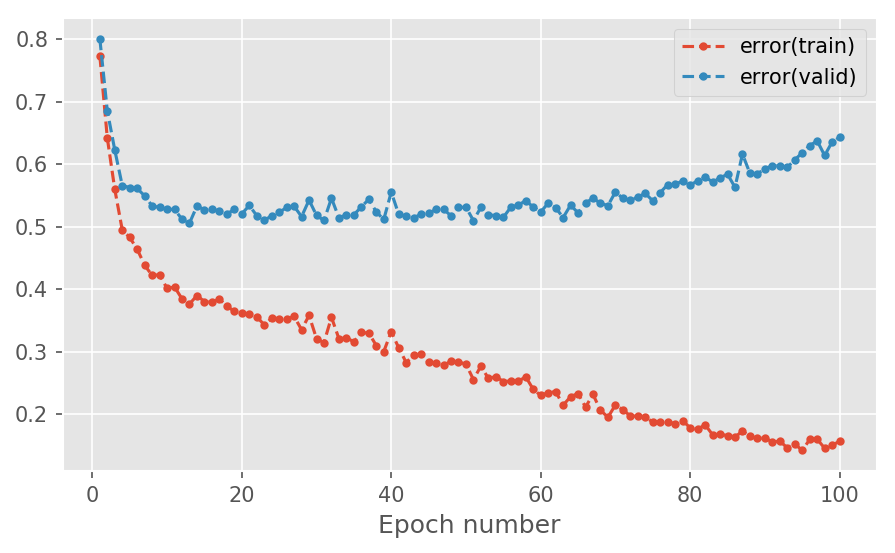

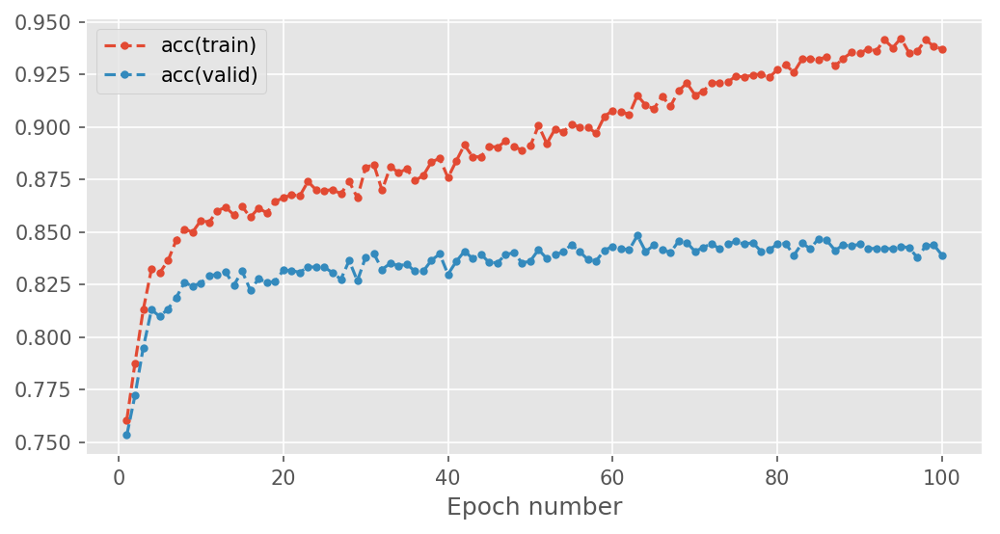

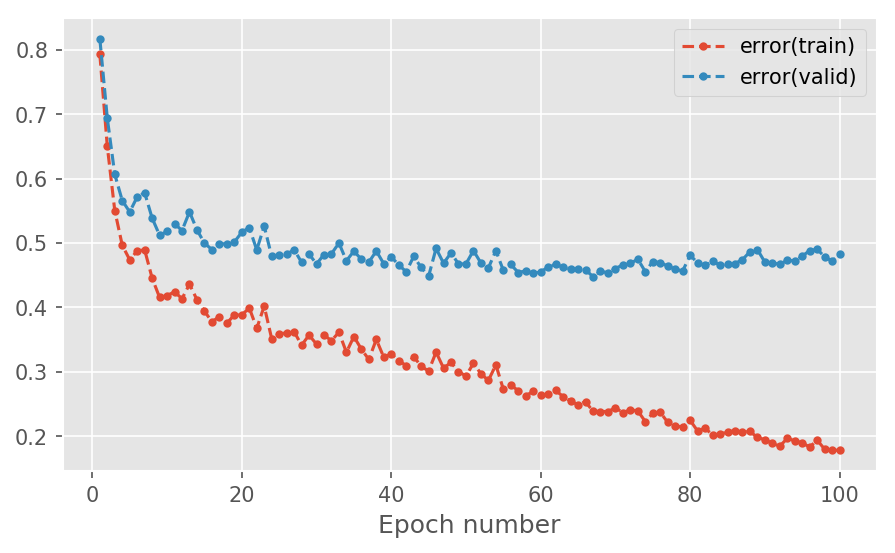

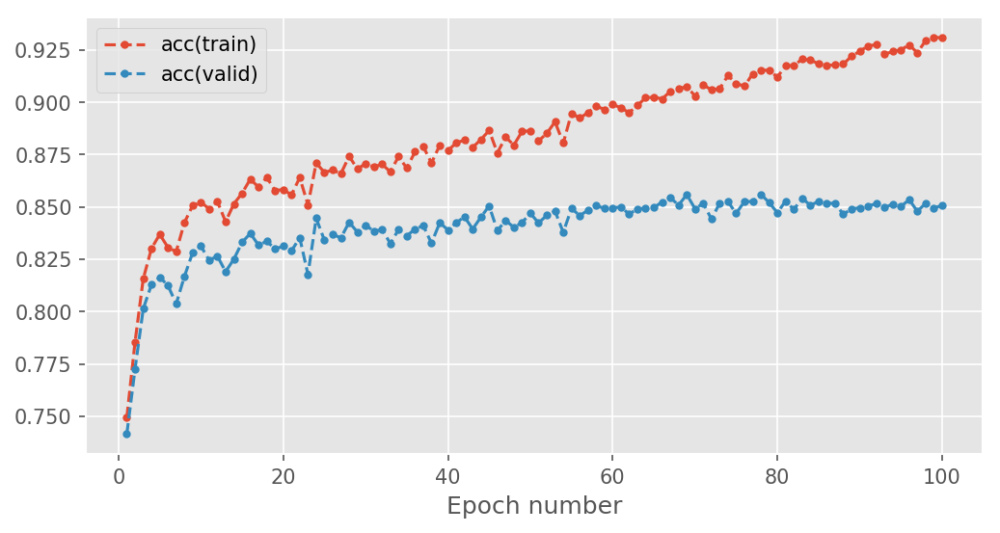

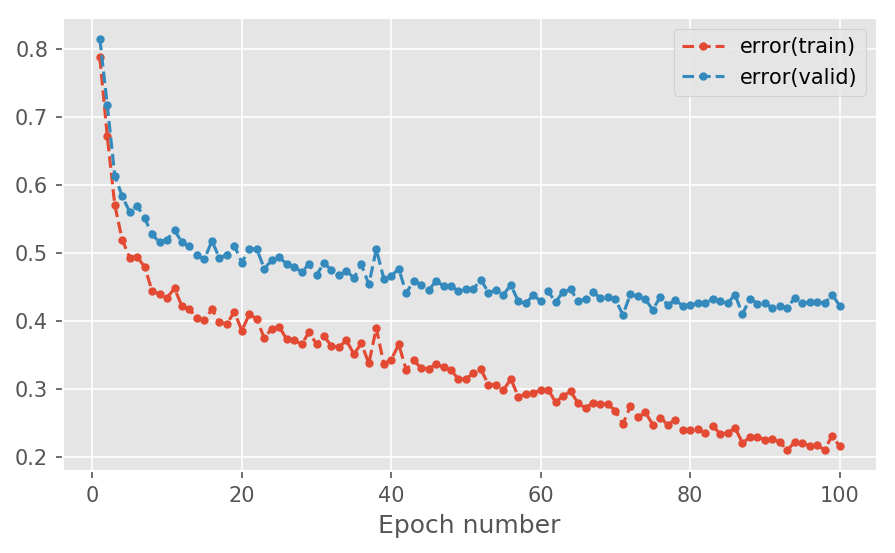

...

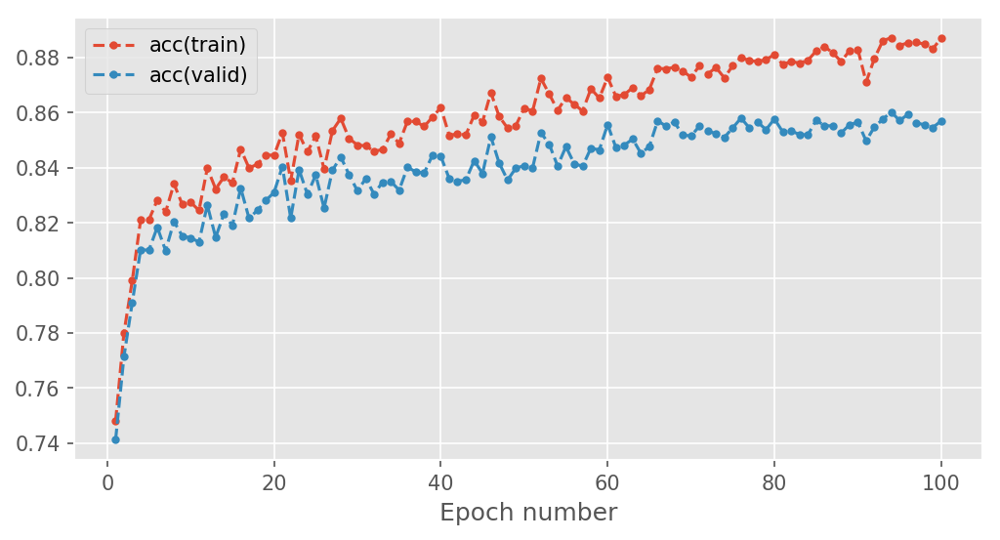

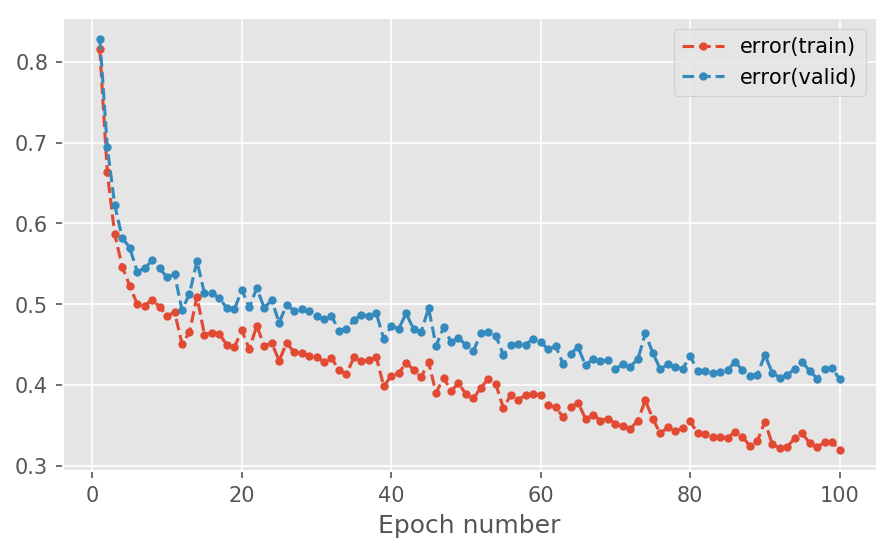

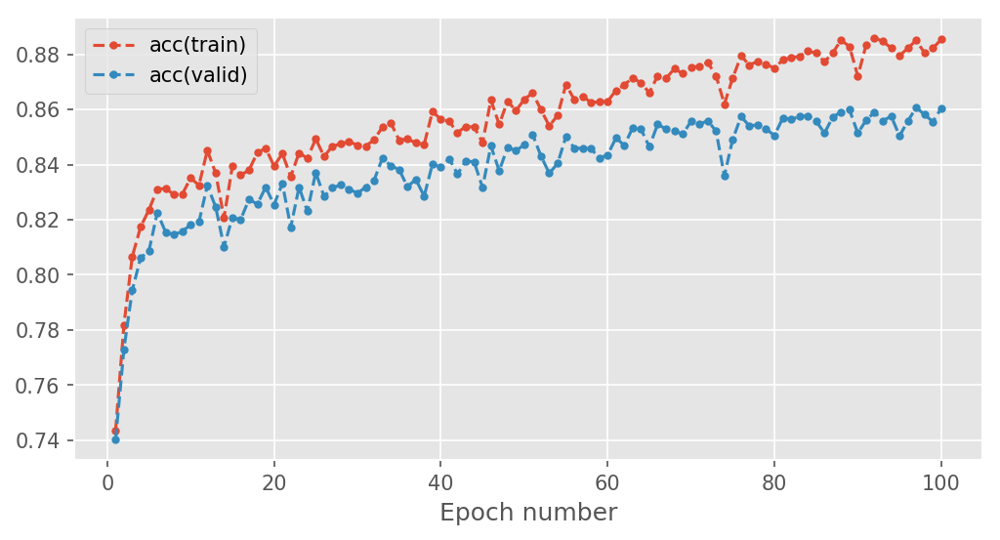

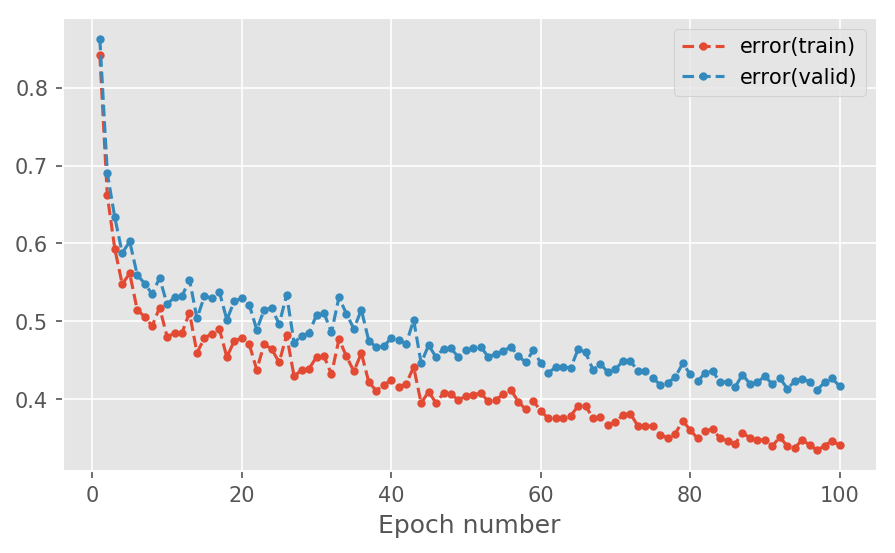

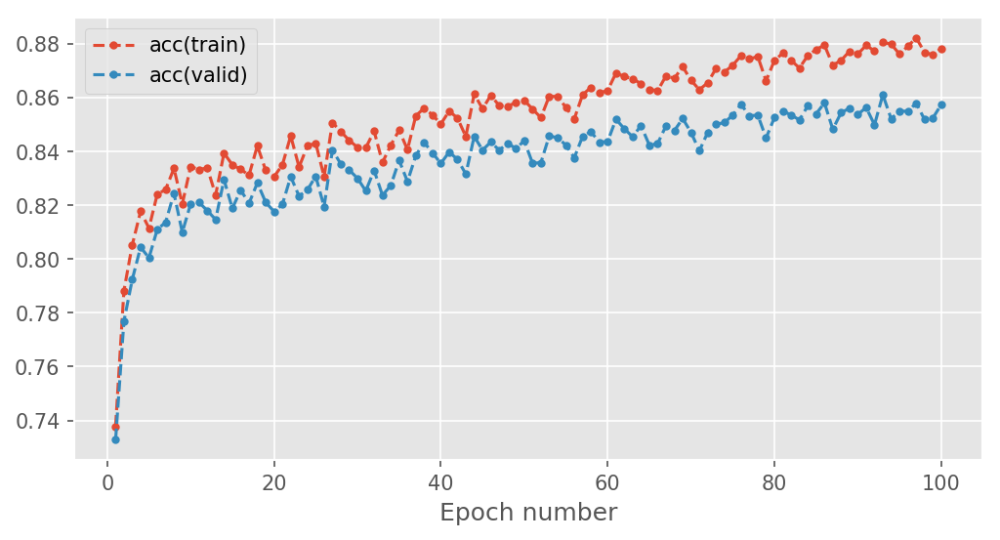

In [52]:
seed = 11102018 
rng = np.random.RandomState(seed)
batch_size = 500

import importlib
import mlp
from mlp.layers import AffineLayer, SoftmaxLayer, SigmoidLayer, ReluLayer, LeakyReluLayer
from mlp.errors import CrossEntropySoftmaxError
from mlp.models import MultipleLayerModel
from mlp.initialisers import ConstantInit, GlorotUniformInit
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule,AdamLearningRuleWithWeightDecay
importlib.reload(mlp.optimisers)
importlib.reload(mlp.learning_rules)
importlib.reload(mlp.schedulers)
importlib.reload(mlp.errors)
from mlp.optimisers import Optimiser
from mlp.learning_rules import GradientDescentLearningRule, RMSPropLearningRule, AdaGradLearningRule,AdamLearningRule,AdamLearningRuleWithWeightDecay
from mlp.schedulers import CosineAnnealingWithWarmRestarts
from mlp.penalties import L2Penalty
from mlp.errors import CrossEntropySoftmaxError

weight_decays=np.linspace(0.1,0.25,15)
casifinal=[]
penalties=np.linspace(0.0001,0.0010,10)
for value in penalties:
    logger = logging.getLogger()
    logger.setLevel(logging.INFO)
    logger.handlers = [logging.StreamHandler()]

    # Create data provider objects for the MNIST data set
    train_data = EMNISTDataProvider('train', batch_size=batch_size, rng=rng)
    valid_data = EMNISTDataProvider('valid', batch_size=batch_size, rng=rng)
    test_data= EMNISTDataProvider('test', batch_size=batch_size, rng=rng)

    #setup hyperparameter
    learning_rate = 0.013
    num_epochs = 100
    stats_interval = 1

    min_learning_rate=2e-3
    max_learning_rate=6e-3
    total_iters_per_period=100
    max_learning_rate_discount_factor=0.9
    period_iteration_expansion_factor=3

    input_dim, output_dim, hidden_dim = 784, 47, 100

    penalty=L2Penalty(value)

    weights_init = GlorotUniformInit(rng=rng)
    biases_init = ConstantInit(0.)
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, weights_init, biases_init,weights_penalty=penalty), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init,weights_penalty=penalty), 
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init,weights_penalty=penalty),
        ReluLayer(),
        AffineLayer(hidden_dim, hidden_dim, weights_init, biases_init,weights_penalty=penalty),
        ReluLayer(),
        AffineLayer(hidden_dim, output_dim, weights_init, biases_init,weights_penalty=penalty)
    ])

    error = CrossEntropySoftmaxError()
    # Use a basic gradient descent learning rule
    learning_rule = AdamLearningRule(learning_rate=3e-3,beta_1=0.875,beta_2=0.9992)

    scheduler=CosineAnnealingWithWarmRestarts(min_learning_rate=min_learning_rate,max_learning_rate=max_learning_rate,
                                             total_iters_per_period=total_iters_per_period,
                                              max_learning_rate_discount_factor=max_learning_rate_discount_factor,
                                             period_iteration_expansion_factor=period_iteration_expansion_factor)

    #Remember to use notebook=False when you write a script to be run in a terminal
    _CosineADAM_L2 = train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, scheduler,stats_interval, notebook=True)
    casifinal.append(_CosineADAM_L2)
    

In [53]:
valuesf=[]
valuesf2=[]
for element in casifinal:
    valuesf.append(min(element[0][:,2])) 
    valuesf2.append(element[-3]) 

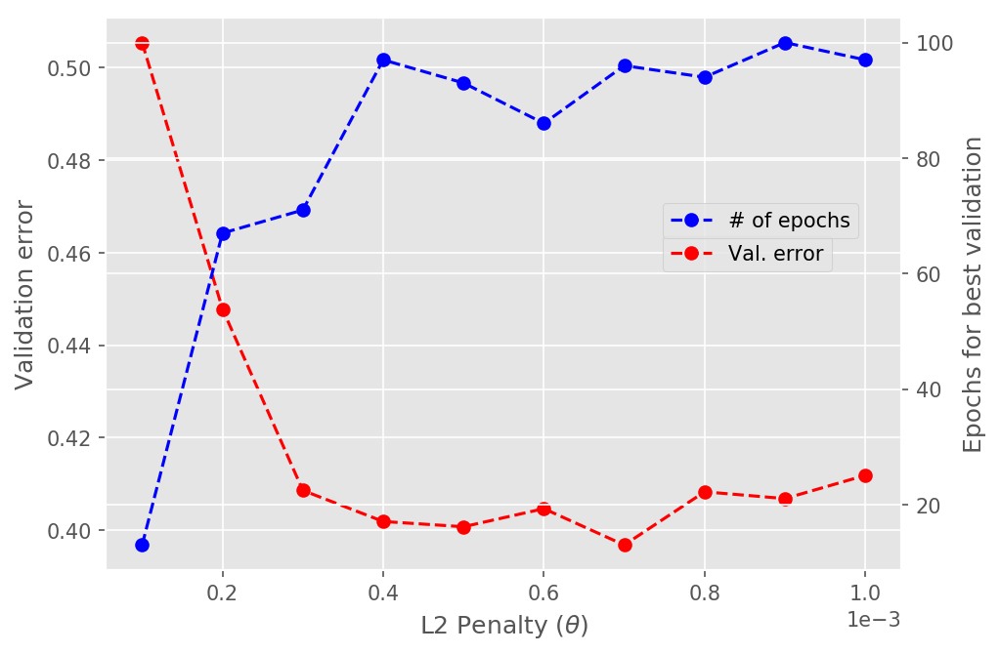

In [65]:
fig=plt.figure(figsize=(7,5),dpi=150)
ax1=fig.add_subplot(111)
ax2=ax1.twinx()
ax1.plot(penalties,valuesf,"--o",c='r',label="Val. error")
ax2.plot(penalties,valuesf2,"--o",c='b',label="# of epochs")
#ax2.set_ylim(55,101)
#ax1.set_ylim(0.454,0.500)
ax2.set_ylabel("Epochs for best validation")
ax1.set_xlabel(r'L2 Penalty ($\theta$)')
ax1.set_ylabel("Validation error")
ax1.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax1.legend(loc=(0.7,0.54))
ax2.legend(loc=(0.7,0.6))

fig.savefig("AdamL21.png")

In [63]:
importlib.reload(mlp.errors)
from mlp.errors import CrossEntropySoftmaxError
outputs=(casifinal[5][-2].fprop(test_data.inputs)[-1])
targets=MNISTDataProvider.to_one_of_k(test_data,test_data.targets)
CrossEntropySoftmaxError.__call__(error,outputs,targets)

(0.4352714754573124, 0.008301628073036856, 0.850126582278481)

In [64]:
casifinal[5][2]

408.7241938114166